## Preprocess the data and get adjacency matrix 

In [1]:
import os,sys,inspect
current_dir = os.path.dirname(os.path.abspath(inspect.getfile(inspect.currentframe())))
parent_dir = os.path.dirname(current_dir)
sys.path.insert(1, parent_dir+'\Covariance and Adjacency Matrix')
from DataManager import dataManager

name: X_test
shape: (640, 31, 1518)
-----------------------
name: X_train
shape: (640, 31, 1395)
-----------------------
name: clip_sizes_test
shape: (2, 129)
-----------------------
name: clip_sizes_train
shape: (2, 127)
-----------------------
name: conv_sizes
shape: (1, 1)
-----------------------
name: n_pre_szr
shape: (1, 1)
-----------------------
name: sel_win_nums_test
shape: (1, 1518)
-----------------------
name: sel_win_nums_train
shape: (1, 1395)
-----------------------
name: soz_ch_ids
shape: (5, 1)
-----------------------
name: stride_sec
shape: (1, 1)
-----------------------
name: window_size_sec
shape: (1, 1)
-----------------------
name: y_test
shape: (1, 1518)
-----------------------
name: y_train
shape: (1, 1395)
-----------------------


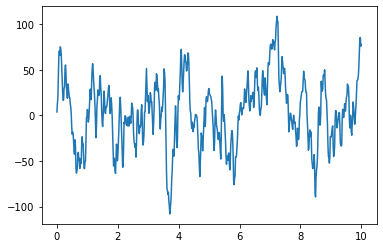

In [2]:
import h5py
import numpy as np
filepath = parent_dir+'\datasets\sample_patients\pat_FR_620.mat'
variables = {}
f = h5py.File(filepath, 'r')
for k, v in f.items():
    variables[k] = np.array(v)
for key in variables.keys():
    print("name:", key)
    print("shape:", variables[key].shape)
    print("-----------------------")
#print sample EGG signal from one node
import matplotlib.pyplot as plt

plt.figure()
ax = plt.axes()
X_train = variables["X_train"]
X_test = variables["X_test"]

ax.plot(np.linspace(0, 10, 640), X_train[:,5,0])

In [3]:
dm = dataManager(variables["X_train"],variables["X_test"],variables["y_train"],variables["y_test"],10**(-4))
#dm.normalize()
#dm.sanity_check(4.514*10**-1, -10**-3, parent_dir)

--------data manager successfully initialized--------


## create normalized adjacency matrix 

In [4]:
import matplotlib.pyplot as plt
from scipy.linalg import fractional_matrix_power
def show_heat_map(m):
    plt.imshow(m, cmap='hot', interpolation='nearest')
    plt.colorbar()
    plt.show()
    
    
def create_DAD(adj):
    np.fill_diagonal(adj, 1)
    rowsum = np.sum(adj, axis=1)
    d = np.diag_indices(adj.shape[0]) 
    D = np.zeros(adj.shape)
    D[d] = rowsum
    #print(rowsum)
    D = fractional_matrix_power(D, -0.5)
    #print(D)
    return D@adj@D

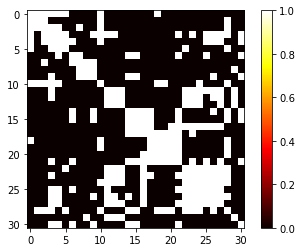

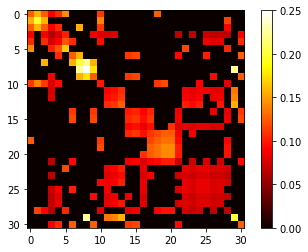

'\ndm.re_threshold(n)\nshow_heat_map(dm.A_train)\nshow_heat_map(create_DAD(dm.A_train))'

In [5]:
#first fine tune a good threshold n
n = 2*10**-4

#create DAD based on a choice
Ptemp = np.load("sample_Pinv.npy")
Araw = Ptemp > n
show_heat_map(Araw)
show_heat_map(create_DAD(Araw))

#create DAD from dm
'''
dm.re_threshold(n)
show_heat_map(dm.A_train)
show_heat_map(create_DAD(dm.A_train))'''

## Modified GCN Class

In [22]:
import torch
import torch.autograd
import torch.nn as nn
import torch.nn.functional as F
import numpy as np

In [23]:
class GCN(nn.Module):
    def __init__(self, in_features, out_features, bias=False):
        super(GCN, self).__init__()
        self.in_features = in_features
        self.out_features = out_features
        
        self.weight = nn.Parameter(torch.Tensor(in_features, out_features))
        if bias:
            self.bias = nn.Parameter(torch.Tensor(out_features))
        else:
            self.register_parameter('bias', None)
        
        self.reset_parameters()

    def __repr__(self):
        return self.__class__.__name__ + ' (' \
               + str(self.in_features) + ',' \
               + str(self.out_features) + ')'
    
    def reset_parameters(self):
        stdv = 1. / self.weight.size(1) ** 1/2
        self.weight.data.uniform_(-stdv, stdv)
        if self.bias is not None:
            self.bias.data.uniform_(-stdv, stdv)
    
    # H, feature matrix
    # A, precomputed adj matrix
    def forward(self, H, A):
        n = torch.matmul(A, torch.matmul(H, self.weight))
        if self.bias is not None:
            return n + self.bias
        else:
            return n

class SimularityMatrix(nn.Module):
    def __init__(self, in_features):
        super(SimularityMatrix, self).__init__()
        self.in_features = in_features
        
        self.weight = nn.Parameter(torch.Tensor(in_features))
        #self.weight = torch.squeeze(self.weight)
        
        self.reset_parameters()

    def __repr__(self):
        return self.__class__.__name__ + ' (' \
               + str(self.in_features) +')'
    
    def reset_parameters(self):
        stdv = 1. / self.weight.size(0) ** 1/2
        self.weight.data.uniform_(-stdv, stdv)
    
    #computes the simularity matrix:
    # H, feature matrix --> N x D
    # A, precomputed adj matrix --> NxN
    # this method is pretty wack, need to find a vectorized way to do it.
    def forward(self, H, H0):
        #get hidden state (concate H0 and H)
        Z = torch.cat((H0, H), 2)
        M = Z.shape[0]
        N = Z.shape[1]
        D = Z.shape[2]
        #centering normalize Z
        Z = self.fcn(Z)
        return self.get_sim_vectorized(Z)
        '''
        sim_matrix = torch.zeros(M ,N, N)
        for u in range(N):
            for v in range(N):
                if u>v:
                    zu = torch.reshape(Z[:,u,:], (M,1,D))
                    zv = torch.reshape(Z[:,v,:], (M,1,D))
                    sim_matrix[:,u,v] = self.get_sim(zu, zv)
                    sim_matrix[:,v,u] = sim_matrix[:,u,v]
                elif u==v:    
                    zu = torch.reshape(Z[:,u,:], (M,1,D))
                    a = self.get_sim(zu, zu)
                    #print(a.shape, sim_matrix.shape)
                    sim_matrix[:,u,v] = a
        return sim_matrix
        '''
        
    #simularity between node u and node v (shape Mx1xD)
    #return the u,v index of the simularity matrix
    def get_sim(self, u,v):
        theta = torch.diag(self.weight)
        #print(self.weight)
        #print(u.shape, theta.shape, self.weight.shape, torch.transpose(v, 1, 2).shape)
        return torch.squeeze(torch.matmul(torch.matmul(u, theta), torch.transpose(v, 1, 2)))
        
    def get_sim_vectorized(self, Z): # Z is M x N x 2D
        theta = torch.diag(self.weight)
        sim_matrix = torch.matmul(torch.matmul(Z, theta), torch.transpose(Z, 1, 2))
        return sim_matrix
        
    #centering-normalizing (CN) operator
    def fcn(self, Z):
        norm_Z = (Z - torch.mean(Z, dim=2, keepdim=True))
        return norm_Z/torch.std(Z, unbiased=True, dim=2, keepdim=True)
        #(((1/(self.in_features-1)) * torch.sum(norm_Z**2, dim = 2, keepdim = True))**(1/2))

In [24]:
# n-layer GCN Network
class Net(nn.Module):
    def __init__(self, body_features, n_layers, activation = F.relu, bias=False):
        super(Net, self).__init__()
        assert(n_layers >= 1)
        self.activation = activation
        self.head = GCN(body_features, body_features, bias)
        self.layers = nn.ModuleList()
        for i in range(n_layers - 1):
            self.layers.append(GCN(body_features, body_features, bias))
        self.tail = SimularityMatrix(body_features*2) # size(H_0 + h_u)

    def forward(self, h_0, A):
        x = self.activation(self.head(h_0, A))
        for layer in self.layers:
            x = self.activation(layer(x, A))
        sim_matrix = self.tail(x, h_0)
        return sim_matrix

In [25]:
class sim_loss(torch.nn.Module):

    def __init__(self):
        super(sim_loss,self).__init__()

    def forward(self, sim_matrix, A, epsilon = 1e-8):
        A_tf = (A!=0)
        M = sim_matrix.shape[0]
        abs_N = torch.sum(A_tf, dim = 1, keepdim = True) # Nx1 matrix
        
        logexp_S = torch.log(torch.sum(torch.exp(sim_matrix), dim = 2, keepdim = True))
        
        
        obj_vector = (torch.sum(A_tf*sim_matrix, dim = 2, keepdim = True) - abs_N * logexp_S)
        return -(1/M)*torch.sum(obj_vector)

In [26]:
#save & load checkpoint
import shutil
from torchsummary import summary
from tqdm import tqdm
def save_ckp(state, f_path):
    torch.save(state, f_path)
    print("model saved")
    
def load_ckp(checkpoint_path):
    checkpoint = torch.load(checkpoint_path)
    return checkpoint

# takes in numpy arrays
def train_GCN(A, X_train, checkpoint, load = False, print_summary = True):
    #preprocess inputs
    A = torch.from_numpy(A).float()
    X_train = torch.from_numpy(X_train).float()
    device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
    parameters = checkpoint['parameters']
    cumepoch = 0
    A = A.to(device)
    input_features = X_train.to(device)
    
    #initialize model
    model = Net(parameters['body'], parameters['n_layers'], F.relu, bias=True).to(device)
    optimizer = torch.optim.Adam(model.parameters(), lr=parameters['learning_rate'], weight_decay=parameters['weight_decay'])
    criterion = sim_loss()
    
    #load past checkpoint if any
    if load:
        model.load_state_dict(checkpoint['state_dict'])
        optimizer.load_state_dict(checkpoint['optimizer'])
        cumepoch = checkpoint['cumepoch']
    
    #print some model info
    if print_summary:
        print(model)
        summary(model, [(31,640), (31,31)])
    
    n_epochs = parameters['num_epochs']
    batch_size = parameters['batch_size']

    model.train()
    for epoch in range(1, n_epochs+1):

        permutation = torch.randperm(input_features.shape[0])

        for i in tqdm(range(0,input_features.shape[0], batch_size)):
            model.train()
            optimizer.zero_grad()

            indices = permutation[i:i+batch_size] if i+batch_size < input_features.shape[0] else permutation[i:] 
            batch_x= input_features[indices, :,:]

            sim_matrix = model(batch_x, A).to(device)
            train_loss = criterion(sim_matrix, A)
            train_loss.backward()
            optimizer.step()
            print("Epoch:", epoch + cumepoch, "  Batch:", int((i/batch_size)+1),"of size",batch_size, "  Train loss:", train_loss, end="\r")
        print()
    
    checkpoint = {
        'parameters': parameters,
        'state_dict': model.state_dict(),
        'optimizer': optimizer.state_dict(),
        'cumepoch': n_epochs + cumepoch
    }
    
    return model, checkpoint
    

In [41]:

#create new model
A = create_DAD(Araw)
X_train = dm.X_train
parameters = {
    'body': dm.X_train.shape[2],
    'M': dm.X_train.shape[0],
    'batch_size': 128,
    'n_layers': 2,
    'num_epochs': 10000,
    'learning_rate': 1e-3,
    'weight_decay': 5e-3
}
print(parameters)
checkpoint = {'parameters': parameters}
'''
#load existing model
checkpoint_path = "models/checkpoint1000epoch.pt"
checkpoint = load_ckp(checkpoint_path)
A = create_DAD(Araw)
X_train = dm.X_train
'''

{'body': 640, 'M': 1387, 'batch_size': 128, 'n_layers': 2, 'num_epochs': 10000, 'learning_rate': 0.001, 'weight_decay': 0.005}


'\n#load existing model\ncheckpoint_path = "models/checkpoint1000epoch.pt"\ncheckpoint = load_ckp(checkpoint_path)\nA = create_DAD(Araw)\nX_train = dm.X_train\n'

In [ ]:
model, checkpoint = train_GCN(A, X_train, checkpoint, load = False, print_summary = True)

  0%|          | 0/11 [00:00<?, ?it/s]

Net(
  (head): GCN (640,640)
  (layers): ModuleList(
    (0): GCN (640,640)
  )
  (tail): SimularityMatrix (1280)
)
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
               GCN-1              [-1, 31, 640]         410,240
               GCN-2              [-1, 31, 640]         410,240
  SimularityMatrix-3               [-1, 31, 31]           1,280
Total params: 821,760
Trainable params: 821,760
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 72.73
Forward/backward pass size (MB): 0.31
Params size (MB): 3.13
Estimated Total Size (MB): 76.18
----------------------------------------------------------------
Epoch: 1   Batch: 11 of size 128   Train loss: tensor(1027.5386, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2   Batch: 11 of size 128   Train loss: tensor(1022.7159, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3   Batch: 11 of size 128   Train loss: tensor(1022.0302, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4   Batch: 6 of size 128   Train loss: tensor(1019.8943, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4   Batch: 11 of size 128   Train loss: tensor(1018.5229, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5   Batch: 11 of size 128   Train loss: tensor(1015.3665, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6   Batch: 11 of size 128   Train loss: tensor(1011.4999, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7   Batch: 11 of size 128   Train loss: tensor(997.4824, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8   Batch: 5 of size 128   Train loss: tensor(995.3615, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8   Batch: 11 of size 128   Train loss: tensor(989.7487, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9   Batch: 11 of size 128   Train loss: tensor(983.3721, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 10   Batch: 4 of size 128   Train loss: tensor(982.5869, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 10   Batch: 11 of size 128   Train loss: tensor(979.3334, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 11   Batch: 11 of size 128   Train loss: tensor(974.7504, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 12   Batch: 4 of size 128   Train loss: tensor(970.7722, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 12   Batch: 11 of size 128   Train loss: tensor(967.7084, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 13   Batch: 11 of size 128   Train loss: tensor(963.2505, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 14   Batch: 11 of size 128   Train loss: tensor(957.0276, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 15   Batch: 11 of size 128   Train loss: tensor(948.6221, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 16   Batch: 1 of size 128   Train loss: tensor(954.8372, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 16   Batch: 11 of size 128   Train loss: tensor(946.3641, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 17   Batch: 11 of size 128   Train loss: tensor(941.5387, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 18   Batch: 11 of size 128   Train loss: tensor(935.8751, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

 19   Batch: 11 of size 128   Train loss: tensor(934.4850, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 20   Batch: 11 of size 128   Train loss: tensor(929.7977, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 21   Batch: 9 of size 128   Train loss: tensor(930.1311, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 21   Batch: 11 of size 128   Train loss: tensor(928.4907, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 22   Batch: 11 of size 128   Train loss: tensor(929.8627, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 23   Batch: 8 of size 128   Train loss: tensor(925.3174, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 23   Batch: 11 of size 128   Train loss: tensor(922.3202, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 24   Batch: 11 of size 128   Train loss: tensor(921.0575, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 25   Batch: 7 of size 128   Train loss: tensor(918.9155, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 25   Batch: 11 of size 128   Train loss: tensor(922.0458, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 26   Batch: 11 of size 128   Train loss: tensor(917.3483, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 27   Batch: 7 of size 128   Train loss: tensor(918.3021, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 27   Batch: 11 of size 128   Train loss: tensor(913.6754, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 28   Batch: 11 of size 128   Train loss: tensor(910.8208, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 29   Batch: 6 of size 128   Train loss: tensor(911.0430, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 29   Batch: 11 of size 128   Train loss: tensor(905.5381, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 30   Batch: 11 of size 128   Train loss: tensor(906.3815, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 31   Batch: 4 of size 128   Train loss: tensor(903.6607, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 31   Batch: 11 of size 128   Train loss: tensor(903.0370, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 32   Batch: 11 of size 128   Train loss: tensor(906.9623, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 33   Batch: 11 of size 128   Train loss: tensor(900.6489, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 34   Batch: 11 of size 128   Train loss: tensor(897.5204, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 35   Batch: 2 of size 128   Train loss: tensor(897.2181, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 35   Batch: 11 of size 128   Train loss: tensor(897.5656, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 36   Batch: 11 of size 128   Train loss: tensor(893.6471, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 37   Batch: 11 of size 128   Train loss: tensor(892.3853, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 38   Batch: 11 of size 128   Train loss: tensor(893.2953, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 39   Batch: 1 of size 128   Train loss: tensor(888.4279, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 39   Batch: 11 of size 128   Train loss: tensor(891.5474, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 40   Batch: 11 of size 128   Train loss: tensor(882.7508, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 41   Batch: 1 of size 128

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 41   Batch: 11 of size 128   Train loss: tensor(887.6522, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 42   Batch: 11 of size 128   Train loss: tensor(884.1899, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

100%|██████████| 11/11 [00:00<00:00, 117.33it/s]

Epoch: 43   Batch: 11 of size 128   Train loss: tensor(880.4229, device='cuda:0', grad_fn=<MulBackward0>)



  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 45   Batch: 11 of size 128   Train loss: tensor(878.9394, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 46   Batch: 11 of size 128   Train loss: tensor(880.3132, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 47   Batch: 11 of size 128   Train loss: tensor(876.9871, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 48   Batch: 11 of size 128   Train loss: tensor(875.1464, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 49   Batch: 11 of size 128   Train loss: tensor(873.9325, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 50   Batch: 11 of size 128   Train loss: tensor(875.4013, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 51   Batch: 11 of size 128   Train loss: tensor(872.6082, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

 52   Batch: 11 of size 128   Train loss: tensor(872.1293, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 53   Batch: 11 of size 128   Train loss: tensor(873.0425, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

 54   Batch: 11 of size 128   Train loss: tensor(870.7497, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 55   Batch: 11 of size 128   Train loss: tensor(870.1470, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 56   Batch: 10 of size 128   Train loss: tensor(872.1816, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 56   Batch: 11 of size 128   Train loss: tensor(871.1126, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 57   Batch: 11 of size 128   Train loss: tensor(869.1389, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 58   Batch: 10 of size 128   Train loss: tensor(867.8140, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 58   Batch: 11 of size 128   Train loss: tensor(868.0999, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 59   Batch: 11 of size 128   Train loss: tensor(869.4554, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 60   Batch: 11 of size 128   Train loss: tensor(870.0928, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 61   Batch: 11 of size 128   Train loss: tensor(865.8625, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 62   Batch: 7 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 62   Batch: 11 of size 128   Train loss: tensor(863.7397, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 63   Batch: 11 of size 128   Train loss: tensor(865.9383, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 64   Batch: 5 of size 128   Train loss: tensor(865.7182, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 64   Batch: 11 of size 128   Train loss: tensor(863.8622, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 65   Batch: 11 of size 128   Train loss: tensor(863.4233, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 66   Batch: 4 of size 128   Train loss: tensor(861.9952, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 66   Batch: 11 of size 128   Train loss: tensor(865.5355, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 67   Batch: 11 of size 128   Train loss: tensor(860.7045, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 68   Batch: 11 of size 128   Train loss: tensor(862.3651, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 69   Batch: 11 of size 128   Train loss: tensor(861.1523, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 70   Batch: 1 of size 128   Train loss: tensor(863.7867, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 70   Batch: 11 of size 128   Train loss: tensor(863.2227, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 71   Batch: 11 of size 128   Train loss: tensor(860.4299, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 72   Batch: 11 of size 128   Train loss: tensor(859.4622, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 73   Batch: 11 of size 128   Train loss: tensor(859.4740, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 74   Batch: 11 of size 128   Train loss: tensor(861.0698, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

 75   Batch: 11 of size 128   Train loss: tensor(860.0493, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 76   Batch: 11 of size 128   Train loss: tensor(858.3674, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 77   Batch: 11 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

tensor(858.5644, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 78   Batch: 11 of size 128   Train loss: tensor(857.8423, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

 79   Batch: 11 of size 128   Train loss: tensor(858.5096, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 80   Batch: 11 of size 128   Train loss: tensor(857.8639, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

 81   Batch: 11 of size 128   Train loss: tensor(856.5353, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 82   Batch: 11 of size 128   Train loss: tensor(854.2809, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

 83   Batch: 11 of size 128   Train loss: tensor(855.7814, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 84   Batch: 11 of size 128   Train loss: tensor(855.9875, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

 85   Batch: 11 of size 128   Train loss: tensor(856.4436, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 86   Batch: 11 of size 128   Train loss: tensor(853.2543, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 87   Batch: 10 of size 128   Train loss: tensor(851.6223, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 87   Batch: 11 of size 128   Train loss: tensor(850.3163, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 88   Batch: 11 of size 128   Train loss: tensor(852.4725, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 89   Batch: 10 of size 128   Train loss: tensor(851.0649, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 89   Batch: 11 of size 128   Train loss: tensor(852.8969, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 90   Batch: 11 of size 128   Train loss: tensor(850.3837, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 91   Batch: 11 of size 128   Train loss: tensor(852.1022, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 92   Batch: 11 of size 128   Train loss: tensor(853.2507, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 93   Batch: 11 of size 128   Train loss: tensor(851.7465, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 94   Batch: 11 of size 128   Train loss: tensor(850.0846, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 95   Batch: 8 of size 128   Train loss: tensor(852.7372, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 95   Batch: 11 of size 128   Train loss: tensor(851.5361, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 96   Batch: 11 of size 128   Train loss: tensor(850.2604, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 97   Batch: 8 of size 128   Train loss: tensor(849.9186, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 97   Batch: 11 of size 128   Train loss: tensor(849.6650, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 98   Batch: 11 of size 128   Train loss: tensor(848.6638, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 99   Batch: 8 of size 128   Train loss: tensor(847.1853, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 99   Batch: 11 of size 128   Train loss: tensor(848.4426, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 100   Batch: 11 of size 128   Train loss: tensor(847.1902, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 101   Batch: 7 of size 128   Train loss: tensor(850.0569, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 101   Batch: 11 of size 128   Train loss: tensor(849.5469, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 102   Batch: 11 of size 128   Train loss: tensor(848.4722, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 103 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 103   Batch: 11 of size 128   Train loss: tensor(847.0438, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 104   Batch: 11 of size 128   Train loss: tensor(847.2784, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 105   Batch: 11 of size 128   Train loss: tensor(845.7355, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 106   Batch: 11 of size 128   Train loss: tensor(848.0961, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 107   Batch: 6 of size 128   Train loss: tensor(844.8231, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 107   Batch: 11 of size 128   Train loss: tensor(846.2650, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 108   Batch: 11 of size 128   Train loss: tensor(848.4432, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 109   Batch: 5 of size 128   Train loss: tensor(844.0311, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 109   Batch: 11 of size 128   Train loss: tensor(845.5053, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 110   Batch: 11 of size 128   Train loss: tensor(843.6960, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 111   Batch: 4 of size 128   Train loss: tensor(845.6726, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 111   Batch: 11 of size 128   Train loss: tensor(845.0578, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 112   Batch: 11 of size 128   Train loss: tensor(843.4445, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 113   Batch: 3 of size 128   Train loss: tensor(845.5433, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 113   Batch: 11 of size 128   Train loss: tensor(843.5876, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 114   Batch: 11 of size 128   Train loss: tensor(842.7451, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 115   Batch: 2 of size 128   Train loss: tensor(843.9978, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 115   Batch: 11 of size 128   Train loss: tensor(842.1642, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 116   Batch: 11 of size 128   Train loss: tensor(842.8291, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 117   Batch: 11 of size 128   Train loss: tensor(845.5008, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 118   Batch: 11 of size 128   Train loss: tensor(842.7139, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 119   Batch: 1 of size 128

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 119   Batch: 11 of size 128   Train loss: tensor(843.0410, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 121   Batch: 11 of size 128   Train loss: tensor(842.9703, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 122   Batch: 11 of size 128   Train loss: tensor(842.1577, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 123   Batch: 11 of size 128   Train loss: tensor(841.4922, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 124   Batch: 11 of size 128   Train loss: tensor(840.9990, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 125   Batch: 11 of size 128   Train loss: tensor(841.2175, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 126   Batch: 11 of size 128   Train loss: tensor(842.3715, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 127   Batch: 11 of size 128   Train loss: tensor(840.7303, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 128   Batch: 10 of size 128   Train loss: tensor(841.1329, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 128   Batch: 11 of size 128   Train loss: tensor(843.0266, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 129   Batch: 11 of size 128   Train loss: tensor(839.6172, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 130   Batch: 10 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 130   Batch: 11 of size 128   Train loss: tensor(839.3309, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 131   Batch: 11 of size 128   Train loss: tensor(840.9080, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 132   Batch: 8 of size 128   Train loss: tensor(839.4448, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 132   Batch: 11 of size 128   Train loss: tensor(841.4725, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 133   Batch: 11 of size 128   Train loss: tensor(838.1649, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 134   Batch: 7 of size 128   Train loss: tensor(837.8922, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 134   Batch: 11 of size 128   Train loss: tensor(842.7028, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 135   Batch: 11 of size 128   Train loss: tensor(840.1911, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 136   Batch: 6 of size 128   Train loss: tensor(838.9924, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 136   Batch: 11 of size 128   Train loss: tensor(841.1307, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 137   Batch: 11 of size 128   Train loss: tensor(839.8945, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 138   Batch: 5 of size 128   Train loss: tensor(837.4352, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 138   Batch: 11 of size 128   Train loss: tensor(837.6420, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 139   Batch: 11 of size 128   Train loss: tensor(838.8956, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 140   Batch: 11 of size 128   Train loss: tensor(838.5025, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 141   Batch: 11 of size 128   Train loss: tensor(838.4706, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 142   Batch: 3 of size 128   Train loss: tensor(837.2823, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 142   Batch: 11 of size 128   Train loss: tensor(837.2531, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 143   Batch: 11 of size 128   Train loss: tensor(838.4785, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 144   Batch: 2 of size 128   Train loss: tensor(836.7960, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 144   Batch: 11 of size 128   Train loss: tensor(840.9030, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 145   Batch: 11 of size 128   Train loss: tensor(837.2512, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 146   Batch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 146   Batch: 11 of size 128   Train loss: tensor(837.6158, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 147   Batch: 10 of size 128   Train loss: tensor(837.4233, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 147   Batch: 11 of size 128   Train loss: tensor(835.4633, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 148   Batch: 11 of size 128   Train loss: tensor(837.3551, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 149   Batch: 9 of size 128   Train loss: tensor(838.3024, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 149   Batch: 11 of size 128   Train loss: tensor(835.3909, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 150   Batch: 11 of size 128   Train loss: tensor(837.0488, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 151   Batch: 8 of size 128   Train loss: tensor(835.2899, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 151   Batch: 11 of size 128   Train loss: tensor(835.1648, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 152   Batch: 11 of size 128   Train loss: tensor(836.0756, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 153   Batch: 6 of size 128   Train loss: tensor(835.8978, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 153   Batch: 11 of size 128   Train loss: tensor(837.0441, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 154   Batch: 11 of size 128   Train loss: tensor(835.7644, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 155   Batch: 4 of size 128   Train loss: tensor(834.9941, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 155   Batch: 11 of size 128   Train loss: tensor(839.2523, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 156   Batch: 11 of size 128   Train loss: tensor(834.9090, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 157   Batch: 3 of size 128   Train loss: tensor(835.6516, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 157   Batch: 11 of size 128   Train loss: tensor(837.2411, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 158   Batch: 11 of size 128   Train loss: tensor(835.2262, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 159   Batch: 2 of size 128   Train loss: tensor(836.1912, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 159   Batch: 11 of size 128   Train loss: tensor(834.7137, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 160   Batch: 11 of size 128   Train loss: tensor(834.3520, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 161   Batch: 11 of size 128   Train loss: tensor(834.7750, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 162   Batch: 11 of size 128   Train loss: tensor(834.0211, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 163   Batch: 11 of size 128   Train loss: tensor(833.3782, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 164   Batch: 11 of size 128   Train loss: tensor(833.3224, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 165   Batch: 11 of size 128   Train loss: tensor(833.8312, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 166   Batch: 11 of size 128   Train loss: tensor(835.4417, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 167   Batch: 11 of size 128   Train loss: tensor(834.0971, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 168   Batch: 7 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 168   Batch: 11 of size 128   Train loss: tensor(833.0921, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 169   Batch: 11 of size 128   Train loss: tensor(834.1906, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 170   Batch: 11 of size 128   Train loss: tensor(835.1035, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 171   Batch: 11 of size 128   Train loss: tensor(832.8148, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 172   Batch: 3 of size 128   Train loss: tensor(832.4333, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 172   Batch: 11 of size 128   Train loss: tensor(832.6090, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 173   Batch: 11 of size 128   Train loss: tensor(832.8234, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 174   Batch: 11 of size 128   Train loss: tensor(833.3627, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 175   Batch: 10 of size 128   Train loss: tensor(832.4798, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 175   Batch: 11 of size 128   Train loss: tensor(835.7647, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 176   Batch: 11 of size 128   Train loss: tensor(833.0839, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 177   Batch: 11 of size 128   Train loss: tensor(832.4758, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 178   Batch: 11 of size 128   Train loss: tensor(831.7354, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 179   Batch: 11 of size 128   Train loss: tensor(830.0965, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 180   Batch: 11 of size 128   Train loss: tensor(830.9985, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 181   Batch: 8 of size 128   Train loss: tensor(831.1761, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 181   Batch: 11 of size 128   Train loss: tensor(829.5800, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 182   Batch: 11 of size 128   Train loss: tensor(833.4351, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 183   Batch: 11 of size 128   Train loss: tensor(830.0930, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 184   Batch: 11 of size 128   Train loss: tensor(830.3267, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 185   Batch: 5 of size 128   Train loss: tensor(831.5527, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 185   Batch: 11 of size 128   Train loss: tensor(830.7275, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 186   Batch: 11 of size 128   Train loss: tensor(830.3770, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 187   Batch: 3 of size 128   Train loss: tensor(831.1470, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 187   Batch: 11 of size 128   Train loss: tensor(829.3569, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 188   Batch: 11 of size 128   Train loss: tensor(830.5343, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 189   Batch: 2 of size 128   Train loss: tensor(830.9640, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 189   Batch: 11 of size 128   Train loss: tensor(830.8501, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 190   Batch: 11 of size 128   Train loss: tensor(831.7791, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 191   Batch: 11 of size 128   Train loss: tensor(830.0353, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

 192   Batch: 11 of size 128   Train loss: tensor(828.4197, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 193   Batch: 11 of size 128   Train loss: tensor(830.0362, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 194   Batch: 8 of size 128   Train loss: tensor(828.2499, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 194   Batch: 11 of size 128   Train loss: tensor(829.0085, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 195   Batch: 11 of size 128   Train loss: tensor(830.0697, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 196   Batch: 6 of size 128   Train loss: tensor(831.2698, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 196   Batch: 11 of size 128   Train loss: tensor(829.7301, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 197   Batch: 11 of size 128   Train loss: tensor(829.6158, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 198   Batch: 5 of size 128   Train loss: tensor(830.0378, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 198   Batch: 11 of size 128   Train loss: tensor(829.8166, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 199   Batch: 11 of size 128   Train loss: tensor(828.8564, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 200   Batch: 5 of size 128   Train loss: tensor(828.2380, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 200   Batch: 11 of size 128   Train loss: tensor(827.9528, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 201   Batch: 11 of size 128   Train loss: tensor(830.2662, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 202   Batch: 4 of size 128   Train loss: tensor(827.9701, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 202   Batch: 11 of size 128   Train loss: tensor(827.6638, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 203   Batch: 11 of size 128   Train loss: tensor(828.1567, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 204   Batch: 3 of size 128   Train loss: tensor(828.0792, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 204   Batch: 11 of size 128   Train loss: tensor(829.9811, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 205   Batch: 11 of size 128   Train loss: tensor(826.9188, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 206   Batch: 11 of size 128   Train loss: tensor(826.7484, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 207   Batch: 11 of size 128   Train loss: tensor(827.9228, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 208   Batch: 2 of size 128   Train loss: tensor(825.5142, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 208   Batch: 11 of size 128   Train loss: tensor(825.6730, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 209   Batch: 11 of size 128   Train loss: tensor(829.3004, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 210   Batch: 11 of size 128   Train loss: tensor(827.6085, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 211   Batch: 11 of size 128   Train loss: tensor(827.0749, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 212   Batch: 1 of size 128   Train loss: tensor(827.7968, device='cuda:0', grad_fn=<MulBackward0>)

100%|██████████| 11/11 [00:00<00:00, 118.60it/s]

Epoch: 212   Batch: 11 of size 128   Train loss: tensor(827.1132, device='cuda:0', grad_fn=<MulBackward0>)



100%|██████████| 11/11 [00:00<00:00, 119.90it/s]


Epoch: 214   Batch: 11 of size 128   Train loss: tensor(827.4584, device='cuda:0', grad_fn=<MulBackward0>)



  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 216   Batch: 11 of size 128   Train loss: tensor(825.0058, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 217   Batch: 11 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

tensor(826.8046, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 218   Batch: 11 of size 128   Train loss: tensor(827.0750, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

 219   Batch: 11 of size 128   Train loss: tensor(827.7792, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 220   Batch: 11 of size 128   Train loss: tensor(826.7010, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 221   Batch: 10 of size 128   Train loss: tensor(826.9976, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 221   Batch: 11 of size 128   Train loss: tensor(825.9014, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 222   Batch: 11 of size 128   Train loss: tensor(825.5043, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 223   Batch: 11 of size 128   Train loss: tensor(825.4619, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 224   Batch: 11 of size 128   Train loss: tensor(824.7132, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 225   Batch: 11 of size 128   Train loss: tensor(825.3865, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 226   Batch: 11 of size 128   Train loss: tensor(823.9380, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 227   Batch: 11 of size 128   Train loss: tensor(825.6984, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 228   Batch: 11 of size 128   Train loss: tensor(824.9020, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 229   Batch: 11 of size 128   Train loss: tensor(824.7832, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 230   Batch: 11 of size 128   Train loss: tensor(823.9054, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 231   Batch: 6 of size 128   Train loss: tensor(825.1057, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 231   Batch: 11 of size 128   Train loss: tensor(826.4466, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 232   Batch: 11 of size 128   Train loss: tensor(824.5543, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 233   Batch: 11 of size 128   Train loss: tensor(824.0699, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 234   Batch: 11 of size 128   Train loss: tensor(822.8985, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 235   Batch: 11 of size 128   Train loss: tensor(822.0793, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 236   Batch: 11 of size 128   Train loss: tensor(823.3981, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 237   Batch: 11 of size 128   Train loss: tensor(821.4629, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 238   Batch: 11 of size 128   Train loss: tensor(823.7656, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 239   Batch: 11 of size 128   Train loss: tensor(824.8596, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 240   Batch: 11 of size 128   Train loss: tensor(826.4972, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 241   Batch: 3 of size 128   Train loss: tensor(824.8403, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 241   Batch: 11 of size 128   Train loss: tensor(824.8812, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 242   Batch: 11 of size 128   Train loss: tensor(823.6444, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 243   Batch: 2 of size 128   Train loss: tensor(823.7758, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 243   Batch: 11 of size 128   Train loss: tensor(822.1615, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 244   Batch: 11 of size 128   Train loss: tensor(822.1492, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 245   Batch: 2 of size 128   Train loss: tensor(821.9671, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 245   Batch: 11 of size 128   Train loss: tensor(821.1705, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 246   Batch: 11 of size 128   Train loss: tensor(821.5704, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 247   Batch: 1 of size 128   Train loss: tensor(820.9720, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 247   Batch: 11 of size 128   Train loss: tensor(822.5012, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 248   Batch: 11 of size 128   Train loss: tensor(823.9540, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 249   Batch: 1 of size 128   Train loss: tensor(823.0199, device='cuda:0', grad_fn=<MulBackward0>)

100%|██████████| 11/11 [00:00<00:00, 114.89it/s]

Epoch: 249   Batch: 11 of size 128   Train loss: tensor(821.4812, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 250   Batch: 11 of size 128   Train loss: tensor(820.4889, device='cuda:0', grad_fn=<MulBackward0>)



  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 251   Batch: 11 of size 128   Train loss: tensor(823.9539, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 252   Batch: 11 of size 128   Train loss: tensor(822.6873, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 253   Batch: 11 of size 128   Train loss: tensor(829.4321, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 254   Batch: 11 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

tensor(825.2527, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 255   Batch: 11 of size 128   Train loss: tensor(823.9719, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 256   Batch: 10 of size 128   Train loss: tensor(822.3335, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 256   Batch: 11 of size 128   Train loss: tensor(821.4953, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 257   Batch: 11 of size 128   Train loss: tensor(819.6935, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 258   Batch: 11 of size 128   Train loss: tensor(820.3970, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 259   Batch: 11 of size 128   Train loss: tensor(821.1506, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 260   Batch: 11 of size 128   Train loss: tensor(822.1240, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 261   Batch: 11 of size 128   Train loss: tensor(821.8966, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 262   Batch: 11 of size 128   Train loss: tensor(822.8766, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 263   Batch: 11 of size 128   Train loss: tensor(823.1472, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 264   Batch: 9 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 264   Batch: 11 of size 128   Train loss: tensor(822.4651, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 265   Batch: 11 of size 128   Train loss: tensor(821.0232, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 266   Batch: 11 of size 128   Train loss: tensor(820.4573, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 267   Batch: 11 of size 128   Train loss: tensor(819.9798, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 268   Batch: 11 of size 128   Train loss: tensor(821.6854, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 269   Batch: 11 of size 128   Train loss: tensor(819.5362, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 270   Batch: 11 of size 128   Train loss: tensor(820.9746, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 271   Batch: 11 of size 128   Train loss: tensor(821.4083, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 272   Batch: 9 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 272   Batch: 11 of size 128   Train loss: tensor(819.8100, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 273   Batch: 11 of size 128   Train loss: tensor(817.5139, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 274   Batch: 9 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 274   Batch: 11 of size 128   Train loss: tensor(817.8995, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 275   Batch: 11 of size 128   Train loss: tensor(818.4849, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 276   Batch: 8 of size 128   Train loss: tensor(818.6277, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 276   Batch: 11 of size 128   Train loss: tensor(818.9833, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 277   Batch: 11 of size 128   Train loss: tensor(819.5293, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 278   Batch: 11 of size 128   Train loss: tensor(817.2454, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 279   Batch: 11 of size 128   Train loss: tensor(819.7175, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 280   Batch: 7 of size 128   Train loss: tensor(817.5458, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 280   Batch: 11 of size 128   Train loss: tensor(820.5816, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 281   Batch: 11 of size 128   Train loss: tensor(819.6463, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 282   Batch: 11 of size 128   Train loss: tensor(820.9349, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 283   Batch: 11 of size 128   Train loss: tensor(818.9391, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 284   Batch: 11 of size 128   Train loss: tensor(817.3091, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 285   Batch: 11 of size 128   Train loss: tensor(818.2565, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 286   Batch: 3 of size 128   Train loss: tensor(818.3356, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 286   Batch: 11 of size 128   Train loss: tensor(816.7466, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 287   Batch: 11 of size 128   Train loss: tensor(818.6937, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 288   Batch: 11 of size 128   Train loss: tensor(817.0760, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 289   Batch: 11 of size 128   Train loss: tensor(819.1689, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 290   Batch: 11 of size 128   Train loss: tensor(817.4537, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 291   Batch: 9 of size 128   Train loss: tensor(817.4282, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 291   Batch: 11 of size 128   Train loss: tensor(819.5562, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 292   Batch: 11 of size 128   Train loss: tensor(817.8505, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 293   Batch: 9 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 293   Batch: 11 of size 128   Train loss: tensor(818.2654, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 294   Batch: 11 of size 128   Train loss: tensor(819.5198, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 295   Batch: 11 of size 128   Train loss: tensor(819.6855, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 296   Batch: 11 of size 128   Train loss: tensor(814.6478, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 297   Batch: 9 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 297   Batch: 11 of size 128   Train loss: tensor(816.5140, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 298   Batch: 11 of size 128   Train loss: tensor(815.7852, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 299   Batch: 11 of size 128   Train loss: tensor(815.8812, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 300   Batch: 11 of size 128   Train loss: tensor(816.6481, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 301   Batch: 9 of size 128   Train loss: tensor(815.7135, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 301   Batch: 11 of size 128   Train loss: tensor(816.4709, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 302   Batch: 11 of size 128   Train loss: tensor(819.1963, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 303   Batch: 11 of size 128   Train loss: tensor(818.2529, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 304   Batch: 11 of size 128   Train loss: tensor(817.7589, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 305   Batch: 11 of size 128   Train loss: tensor(816.1624, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 306   Batch: 11 of size 128   Train loss: tensor(815.5339, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 307   Batch: 9 of size 128   Train loss: tensor(815.1989, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 307   Batch: 11 of size 128   Train loss: tensor(814.3814, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 308   Batch: 11 of size 128   Train loss: tensor(815.8961, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 309   Batch: 10 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 309   Batch: 11 of size 128   Train loss: tensor(817.6523, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 310   Batch: 11 of size 128   Train loss: tensor(817.4764, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 311   Batch: 10 of size 128   Train loss: tensor(816.9490, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 311   Batch: 11 of size 128   Train loss: tensor(817.3338, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 312   Batch: 11 of size 128   Train loss: tensor(814.8173, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 313   Batch: 10 of size 128   Train loss: tensor(817.3244, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 313   Batch: 11 of size 128   Train loss: tensor(816.6089, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 314   Batch: 11 of size 128   Train loss: tensor(815.4440, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 315   Batch: 10 of size 128

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 315   Batch: 11 of size 128   Train loss: tensor(813.7906, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 316   Batch: 11 of size 128   Train loss: tensor(813.1581, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 317   Batch: 11 of size 128   Train loss: tensor(813.3727, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 318   Batch: 11 of size 128   Train loss: tensor(813.5139, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 319   Batch: 11 of size 128   Train loss: tensor(813.7132, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 320   Batch: 11 of size 128   Train loss: tensor(813.6006, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 321   Batch: 6 of size 128   Train loss: tensor(818.6669, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 321   Batch: 11 of size 128   Train loss: tensor(823.9226, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 322   Batch: 11 of size 128   Train loss: tensor(820.4357, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 323   Batch: 11 of size 128   Train loss: tensor(816.0313, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 324   Batch: 11 of size 128   Train loss: tensor(814.1356, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 325   Batch: 11 of size 128   Train loss: tensor(813.9606, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 326   Batch: 11 of size 128   Train loss: tensor(815.8668, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 327   Batch: 4 of size 128   Train loss: tensor(814.1905, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 327   Batch: 11 of size 128   Train loss: tensor(814.7599, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 328   Batch: 11 of size 128   Train loss: tensor(814.5771, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 329   Batch: 4 of size 128   Train loss: tensor(814.4541, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 329   Batch: 11 of size 128   Train loss: tensor(814.7497, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 330   Batch: 11 of size 128   Train loss: tensor(814.3486, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 331   Batch: 4 of size 128   Train loss: tensor(812.7921, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 331   Batch: 11 of size 128   Train loss: tensor(814.6025, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 332   Batch: 11 of size 128   Train loss: tensor(814.7275, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 333   Batch: 4 of size 128   Train loss: tensor(814.7335, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 333   Batch: 11 of size 128   Train loss: tensor(814.5515, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 334   Batch: 11 of size 128   Train loss: tensor(812.8174, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 335   Batch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 335   Batch: 11 of size 128   Train loss: tensor(813.1255, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 336   Batch: 11 of size 128   Train loss: tensor(810.5358, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 337

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 337   Batch: 11 of size 128   Train loss: tensor(812.2411, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 338   Batch: 11 of size 128   Train loss: tensor(812.2073, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 339   Batch: 4 of size 128   Train loss: tensor(813.3981, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 339   Batch: 11 of size 128   Train loss: tensor(811.6843, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 340   Batch: 11 of size 128   Train loss: tensor(816.7468, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 341   Batch: 11 of size 128   Train loss: tensor(815.8336, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 342   Batch: 11 of size 128   Train loss: tensor(828.9705, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 343   Batch: 2 of size 128   Train loss: tensor(820.2814, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 343   Batch: 11 of size 128   Train loss: tensor(820.6614, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 344   Batch: 11 of size 128   Train loss: tensor(814.8031, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 345   Batch: 11 of size 128   Train loss: tensor(812.2399, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 346   Batch: 9 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 346   Batch: 11 of size 128   Train loss: tensor(812.7341, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 347   Batch: 11 of size 128   Train loss: tensor(811.7226, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 348   Batch: 7 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 348   Batch: 11 of size 128   Train loss: tensor(812.2129, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 349   Batch: 11 of size 128   Train loss: tensor(811.3397, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 350   Batch: 5 of size 128   Train loss: tensor(815.9762, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 350   Batch: 11 of size 128   Train loss: tensor(812.3890, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 351   Batch: 11 of size 128   Train loss: tensor(814.4271, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 352   Batch: 4 of size 128   Train loss: tensor(812.5735, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 352   Batch: 11 of size 128   Train loss: tensor(814.8730, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 353   Batch: 11 of size 128   Train loss: tensor(813.7764, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 354   Batch: 11 of size 128   Train loss: tensor(813.9338, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 355   Batch: 11 of size 128   Train loss: tensor(811.2032, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 356   Batch: 11 of size 128   Train loss: tensor(812.7535, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 357   Batch: 11 of size 128   Train loss: tensor(812.1309, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 358   Batch: 1 of size 128   Train loss: tensor(810.7811, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 358   Batch: 11 of size 128   Train loss: tensor(820.7092, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 360   Batch: 11 of size 128   Train loss: tensor(815.3083, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 361   Batch: 11 of size 128   Train loss: tensor(813.3179, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 362   Batch: 11 of size 128   Train loss: tensor(813.8572, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 363

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 363   Batch: 11 of size 128   Train loss: tensor(811.7919, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 364   Batch: 11 of size 128   Train loss: tensor(810.3091, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 365   Batch: 11 of size 128   Train loss: tensor(812.9353, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 366   Batch: 11 of size 128   Train loss: tensor(811.6431, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 367   Batch: 8 of size 128   Train loss: tensor(811.9005, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 367   Batch: 11 of size 128   Train loss: tensor(810.7278, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 368   Batch: 11 of size 128   Train loss: tensor(811.3651, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 369   Batch: 11 of size 128   Train loss: tensor(809.2189, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 370   Batch: 11 of size 128   Train loss: tensor(809.1918, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 371   Batch: 11 of size 128   Train loss: tensor(808.8031, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 372   Batch: 11 of size 128   Train loss: tensor(810.4766, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 373   Batch: 11 of size 128   Train loss: tensor(811.5640, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 374   Batch: 11 of size 128   Train loss: tensor(810.7249, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 375   Batch: 11 of size 128   Train loss: tensor(814.0351, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 376   Batch: 11 of size 128   Train loss: tensor(809.5663, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 377   Batch: 8 of size 128   Train loss: tensor(814.1880, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 377   Batch: 11 of size 128   Train loss: tensor(812.9610, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 378   Batch: 11 of size 128   Train loss: tensor(812.5846, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 379   Batch: 8 of size 128   Train loss: tensor(812.4304, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 379   Batch: 11 of size 128   Train loss: tensor(813.2793, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 380   Batch: 11 of size 128   Train loss: tensor(813.7620, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 381   Batch: 11 of size 128   Train loss: tensor(811.4240, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 382   Batch: 11 of size 128   Train loss: tensor(810.5441, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 383   Batch: 11 of size 128   Train loss: tensor(810.5120, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 384   Batch: 11 of size 128   Train loss: tensor(811.0443, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 385   Batch: 11 of size 128   Train loss: tensor(810.1117, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 386   Batch: 11 of size 128   Train loss: tensor(810.8447, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 387   Batch: 9 of size 128   Train loss: tensor(809.9338, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 387   Batch: 11 of size 128   Train loss: tensor(811.8881, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 388   Batch: 11 of size 128   Train loss: tensor(810.2184, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 389   Batch: 11 of size 128   Train loss: tensor(809.2138, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 390   Batch: 11 of size 128   Train loss: tensor(813.5626, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 391   Batch: 11 of size 128   Train loss: tensor(820.0104, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 392   Batch: 11 of size 128   Train loss: tensor(810.0791, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 393   Batch: 10 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 393   Batch: 11 of size 128   Train loss: tensor(809.5519, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 394   Batch: 11 of size 128   Train loss: tensor(808.9933, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 395   Batch: 11 of size 128   Train loss: tensor(807.8726, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 396   Batch: 11 of size 128   Train loss: tensor(809.8766, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 397   Batch: 11 of size 128   Train loss: tensor(811.4566, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 398   Batch: 11 of size 128   Train loss: tensor(808.4376, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 399   Batch: 10 of size 128   Train loss: tensor(808.7435, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 399   Batch: 11 of size 128   Train loss: tensor(808.0708, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 400   Batch: 11 of size 128   Train loss: tensor(809.1523, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 401   Batch: 10 of size 128   Train loss: tensor(806.3984, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 401   Batch: 11 of size 128   Train loss: tensor(809.1795, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 402   Batch: 11 of size 128   Train loss: tensor(808.1827, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 403   Batch: 11 of size 128   Train loss: tensor(812.1426, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 404   Batch: 11 of size 128   Train loss: tensor(811.2001, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 405   Batch: 

  0%|          | 0/11 [00:00<?, ?it/s]

11 of size 128   Train loss: tensor(809.1404, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 406   Batch: 11 of size 128   Train loss: tensor(808.0798, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 407   Batch: 11

  0%|          | 0/11 [00:00<?, ?it/s]

 of size 128   Train loss: tensor(808.5427, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 408   Batch: 11 of size 128   Train loss: tensor(806.7303, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 409   Batch: 11 of size 128   Train loss: tensor(807.6191, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 410   Batch: 11 of size 128   Train loss: tensor(805.8248, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 411   Batch: 11 of size 128   Train loss: tensor(807.7167, device='cuda:0', grad_fn=<MulBackward0>)

100%|██████████| 11/11 [00:00<00:00, 117.97it/s]


Epoch: 412   Batch: 11 of size 128   Train loss: tensor(807.2303, device='cuda:0', grad_fn=<MulBackward0>)



  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 414   Batch: 11 of size 128   Train loss: tensor(808.0537, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 415   Batch: 11 of size 128   Train loss: tensor(813.9692, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 416   Batch: 11 of size 128   Train loss: tensor(811.8837, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 417   Batch: 11 of size 128   Train loss: tensor(807.8853, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 418   Batch: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 418   Batch: 11 of size 128   Train loss: tensor(807.5374, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 419   Batch: 11 of size 128   Train loss: tensor(811.5570, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 420   Batch: 1 of size 128   Train loss: tensor(810.2643, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 420   Batch: 11 of size 128   Train loss: tensor(809.0576, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 421   Batch: 11 of size 128   Train loss: tensor(810., device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 422   Batch: 1 of size 128   Train loss: tensor(810.5909, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 422   Batch: 11 of size 128   Train loss: tensor(811.3818, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 423   Batch: 11 of size 128   Train loss: tensor(810.2154, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 424   Batch: 1 of size 128   Train loss: tensor(807.9255, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 424   Batch: 11 of size 128   Train loss: tensor(807.0013, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 425   Batch: 11 of size 128   Train loss: tensor(809.0333, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 426   Batch: 2 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 426   Batch: 11 of size 128   Train loss: tensor(808.1765, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 427   Batch: 11 of size 128   Train loss: tensor(807.7820, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 428   Batch: 2 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 428   Batch: 11 of size 128   Train loss: tensor(809.0352, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 429   Batch: 11 of size 128   Train loss: tensor(806.0753, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 430   Batch: 2 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 430   Batch: 11 of size 128   Train loss: tensor(806.1796, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 431   Batch: 11 of size 128   Train loss: tensor(808.3503, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 432   Batch: 2 of size 128   Train loss: tensor(805.4420, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 432   Batch: 11 of size 128   Train loss: tensor(805.4265, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 433   Batch: 11 of size 128   Train loss: tensor(806.4666, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 434   Batch: 2 of size 128   Train loss: tensor(807.2221, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 434   Batch: 11 of size 128   Train loss: tensor(806.0945, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 435   Batch: 11 of size 128   Train loss: tensor(811.6404, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 436   Batch: 11 of size 128   Train loss: tensor(809.6492, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 437   Batch: 11 of size 128   Train loss: tensor(811.3542, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 438   Batch: 2 of size 128   Train loss: tensor(811.9535, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 438   Batch: 11 of size 128   Train loss: tensor(810.5884, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 439   Batch: 11 of size 128   Train loss: tensor(807.9908, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 440   Batch: 3 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 440   Batch: 11 of size 128   Train loss: tensor(809.5425, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 441   Batch: 11 of size 128   Train loss: tensor(808.3651, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 442   Batch: 3 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 442   Batch: 11 of size 128   Train loss: tensor(808.4919, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 443   Batch: 11 of size 128   Train loss: tensor(808.9980, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 444   Batch: 3 of size 128   Train loss: tensor(806.0837, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 444   Batch: 11 of size 128   Train loss: tensor(806.3293, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 445   Batch: 11 of size 128   Train loss: tensor(805.5289, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 446   Batch: 3 of size 128   Train loss: tensor(804.9516, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 446   Batch: 11 of size 128   Train loss: tensor(806.1421, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 447   Batch: 11 of size 128   Train loss: tensor(808.8644, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 448   Batch: 3 of size 128   Train loss: tensor(805.8722, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 448   Batch: 11 of size 128   Train loss: tensor(805.3490, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 449   Batch: 11 of size 128   Train loss: tensor(806.1213, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 450   Batch: 3 of size 128   Train loss: tensor(804.9256, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 450   Batch: 11 of size 128   Train loss: tensor(804.9652, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 451   Batch: 11 of size 128   Train loss: tensor(804.0114, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 452   Batch: 4 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 452   Batch: 11 of size 128   Train loss: tensor(804.6820, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 453   Batch: 11 of size 128   Train loss: tensor(804.6091, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 454   Batch: 4 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 454   Batch: 11 of size 128   Train loss: tensor(806.2881, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 455   Batch: 11 of size 128   Train loss: tensor(805.4512, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 456   Batch: 4 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 456   Batch: 11 of size 128   Train loss: tensor(805.6277, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 457   Batch: 11 of size 128   Train loss: tensor(806.5250, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 458   Batch: 4 of size 128   Train loss: tensor(804.9534, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 458   Batch: 11 of size 128   Train loss: tensor(806.3491, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 459   Batch: 11 of size 128   Train loss: tensor(806.8734, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 460   Batch: 4 of size 128   Train loss: tensor(806.8856, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 460   Batch: 11 of size 128   Train loss: tensor(807.4068, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 461   Batch: 11 of size 128   Train loss: tensor(807.2349, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 462   Batch: 4 of size 128   Train loss: tensor(805.9142, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 462   Batch: 11 of size 128   Train loss: tensor(806.3310, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 463   Batch: 11 of size 128   Train loss: tensor(807.6083, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 464   Batch: 5 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 464   Batch: 11 of size 128   Train loss: tensor(806.3907, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 465   Batch: 11 of size 128   Train loss: tensor(805.2122, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 466   Batch: 5 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 466   Batch: 11 of size 128   Train loss: tensor(806.5507, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 467   Batch: 11 of size 128   Train loss: tensor(805.6960, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 468   Batch: 5 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 468   Batch: 11 of size 128   Train loss: tensor(804.1063, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 469   Batch: 11 of size 128   Train loss: tensor(805.7529, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 470   Batch: 5 of size 128   Train loss: tensor(805.6359, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 470   Batch: 11 of size 128   Train loss: tensor(804.8663, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 471   Batch: 11 of size 128   Train loss: tensor(806.7495, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 472   Batch: 5 of size 128   Train loss: tensor(807.3156, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 472   Batch: 11 of size 128   Train loss: tensor(808.3539, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 473   Batch: 11 of size 128   Train loss: tensor(805.0392, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 474   Batch: 5 of size 128   Train loss: tensor(806.5391, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 474   Batch: 11 of size 128   Train loss: tensor(807.5964, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 475   Batch: 11 of size 128   Train loss: tensor(807.2875, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 476   Batch: 5 of size 128   Train loss: tensor(807.6340, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 476   Batch: 11 of size 128   Train loss: tensor(804.2780, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 477   Batch: 11 of size 128   Train loss: tensor(806.2168, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 478   Batch: 6 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 478   Batch: 11 of size 128   Train loss: tensor(804.0340, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 479   Batch: 11 of size 128   Train loss: tensor(805.3741, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 480   Batch: 6 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 480   Batch: 11 of size 128   Train loss: tensor(805.7788, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 481   Batch: 11 of size 128   Train loss: tensor(805.3044, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 482   Batch: 6 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 482   Batch: 11 of size 128   Train loss: tensor(806.0204, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 483   Batch: 11 of size 128   Train loss: tensor(806.8042, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 484   Batch: 6 of size 128   Train loss: tensor(804.4182, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 484   Batch: 11 of size 128   Train loss: tensor(803.9344, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 485   Batch: 11 of size 128   Train loss: tensor(805.5798, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 486   Batch: 6 of size 128   Train loss: tensor(808.4597, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 486   Batch: 11 of size 128   Train loss: tensor(808.6157, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 487   Batch: 11 of size 128   Train loss: tensor(806.6841, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 488   Batch: 6 of size 128   Train loss: tensor(805.4774, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 488   Batch: 11 of size 128   Train loss: tensor(806.6876, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 489   Batch: 11 of size 128   Train loss: tensor(805.7231, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 490   Batch: 6 of size 128   Train loss: tensor(805.3023, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 490   Batch: 11 of size 128   Train loss: tensor(805.2852, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 491   Batch: 11 of size 128   Train loss: tensor(807.2565, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 492   Batch: 6 of size 128   Train loss: tensor(802.0054, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 492   Batch: 11 of size 128   Train loss: tensor(804.3401, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 493   Batch: 11 of size 128   Train loss: tensor(805.2957, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 494   Batch: 7 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 494   Batch: 11 of size 128   Train loss: tensor(806.3356, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 495   Batch: 11 of size 128   Train loss: tensor(805.0432, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 496   Batch: 7 of size

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 496   Batch: 11 of size 128   Train loss: tensor(804.3094, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 497   Batch: 11 of size 128   Train loss: tensor(804.6464, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 498   Batch: 7 of size 128

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 498   Batch: 11 of size 128   Train loss: tensor(803.8574, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 499   Batch: 11 of size 128   Train loss: tensor(803.9272, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 500   Batch: 5 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 500   Batch: 11 of size 128   Train loss: tensor(805.0110, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 501   Batch: 11 of size 128   Train loss: tensor(805.4960, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 502   Batch: 5 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 502   Batch: 11 of size 128   Train loss: tensor(804.3873, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 503   Batch: 11 of size 128   Train loss: tensor(803.9537, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 504   Batch: 5 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 504   Batch: 11 of size 128   Train loss: tensor(804.9812, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 505   Batch: 11 of size 128   Train loss: tensor(805.4883, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 506   Batch: 11 of size 128   Train loss: tensor(806.8795, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 507   Batch: 11 of size 128   Train loss: tensor(804.2921, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 508   Batch: 5 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 508   Batch: 11 of size 128   Train loss: tensor(804.8132, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 509   Batch: 11 of size 128   Train loss: tensor(805.9200, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 510   Batch: 5 of size 128   Train loss: tensor(804.8838, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 510   Batch: 11 of size 128   Train loss: tensor(805.3575, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 511   Batch: 11 of size 128   Train loss: tensor(805.1459, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 512   Batch: 5 of size 128   Train loss: tensor(805.4579, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 512   Batch: 11 of size 128   Train loss: tensor(803.0103, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 513   Batch: 11 of size 128   Train loss: tensor(804.5276, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 514   Batch: 11 of size 128   Train loss: tensor(803.5397, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 515   Batch: 11 of size 128   Train loss: tensor(804.5125, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 516   Batch: 5 of size 128   Train loss: tensor(802.2271, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 516   Batch: 11 of size 128   Train loss: tensor(804.2182, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 517   Batch: 11 of size 128   Train loss: tensor(801.7512, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 518   Batch: 5 of size 128   Train loss: tensor(802.1743, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 518   Batch: 11 of size 128   Train loss: tensor(802.2238, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 519   Batch: 11 of size 128   Train loss: tensor(809.1739, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 520   Batch: 5 of size 128   Train loss: tensor(805.9400, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 520   Batch: 11 of size 128   Train loss: tensor(804.0061, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 521   Batch: 11 of size 128   Train loss: tensor(803.9023, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 522   Batch: 5 of size 128   Train loss: tensor(802.7363, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 522   Batch: 11 of size 128   Train loss: tensor(801.5660, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 523   Batch: 11 of size 128   Train loss: tensor(802.4053, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 524   Batch: 5 of size 128   Train loss: tensor(802.4019, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 524   Batch: 11 of size 128   Train loss: tensor(803.0799, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 525   Batch: 11 of size 128   Train loss: tensor(803.4310, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 526   Batch: 5 of size 128   Train loss: tensor(804.2675, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 526   Batch: 11 of size 128   Train loss: tensor(806.4951, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 527   Batch: 11 of size 128   Train loss: tensor(806.0909, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 528   Batch: 6 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 528   Batch: 11 of size 128   Train loss: tensor(803.7659, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 529   Batch: 11 of size 128   Train loss: tensor(805.7932, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 530   Batch: 6 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 530   Batch: 11 of size 128   Train loss: tensor(808.6798, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 531   Batch: 11 of size 128   Train loss: tensor(804.6799, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 532   Batch: 6 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 532   Batch: 11 of size 128   Train loss: tensor(802.6749, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 533   Batch: 11 of size 128   Train loss: tensor(801.3826, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 534   Batch: 6 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 534   Batch: 11 of size 128   Train loss: tensor(801.1805, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 535   Batch: 11 of size 128   Train loss: tensor(799.2449, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 536   Batch: 6 of size 128   Train loss: tensor(800.2238, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 536   Batch: 11 of size 128   Train loss: tensor(800.6218, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 537   Batch: 11 of size 128   Train loss: tensor(801.0652, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 538   Batch: 6 of size 128   Train loss: tensor(801.1108, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 538   Batch: 11 of size 128   Train loss: tensor(800.1251, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 539   Batch: 11 of size 128   Train loss: tensor(801.3431, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 540   Batch: 6 of size 128   Train loss: tensor(802.2207, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 540   Batch: 11 of size 128   Train loss: tensor(801.9319, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 541   Batch: 11 of size 128   Train loss: tensor(801.1299, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 542   Batch: 11 of size 128   Train loss: tensor(801.2504, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 543   Batch: 11 of size 128   Train loss: tensor(801.5702, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 544   Batch: 6 of size 128   Train loss: tensor(801.3296, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 544   Batch: 11 of size 128   Train loss: tensor(799.2424, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 545   Batch: 11 of size 128   Train loss: tensor(801.9000, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 546   Batch: 5 of size 128   Train loss: tensor(802.6475, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 546   Batch: 11 of size 128   Train loss: tensor(800.2640, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 547   Batch: 11 of size 128   Train loss: tensor(800.5105, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 548   Batch: 4 of size 128 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 548   Batch: 11 of size 128   Train loss: tensor(800.7233, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 549   Batch: 11 of size 128   Train loss: tensor(800.0489, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 550   Batch: 4 of size 128   Train loss: tensor(800.8077, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 550   Batch: 11 of size 128   Train loss: tensor(803.1478, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 551   Batch: 11 of size 128   Train loss: tensor(802.6069, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 552   Batch: 4 of size 128   Train loss: tensor(801.7587, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 552   Batch: 11 of size 128   Train loss: tensor(800.7509, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 553   Batch: 11 of size 128   Train loss: tensor(800.4161, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 554   Batch: 4 of size 128   Train loss: tensor(802.2372, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 554   Batch: 11 of size 128   Train loss: tensor(801.0015, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 555   Batch: 11 of size 128   Train loss: tensor(806.7405, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 556   Batch: 4 of size 128   Train loss: tensor(805.9058, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 556   Batch: 11 of size 128   Train loss: tensor(809.9030, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 557   Batch: 11 of size 128   Train loss: tensor(804.2508, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 558   Batch: 11 of size 128   Train loss: tensor(804.3907, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 559   Batch: 11 of size 128   Train loss: tensor(803.6447, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 560   Batch: 3 of size 128   Train loss: tensor(801.3166, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 560   Batch: 11 of size 128   Train loss: tensor(800.4830, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 561   Batch: 11 of size 128   Train loss: tensor(801.2302, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 562   Batch: 3

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 562   Batch: 11 of size 128   Train loss: tensor(801.7521, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 563   Batch: 11 of size 128   Train loss: tensor(802.9487, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 564   Batch: 11 of size 128   Train loss: tensor(803.7293, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 565   Batch: 11 of size 128   Train loss: tensor(805.3561, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 566   Batch: 3 of size 128   Train loss: tensor(803.6293, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 566   Batch: 11 of size 128   Train loss: tensor(802.9814, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 567   Batch: 11 of size 128   Train loss: tensor(805.5300, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 568   Batch: 3 of size 128   Train loss: tensor(802.8788, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 568   Batch: 11 of size 128   Train loss: tensor(800.8746, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 569   Batch: 11 of size 128   Train loss: tensor(801.0663, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 570   Batch: 3 of size 128   Train loss: tensor(801.8293, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 570   Batch: 11 of size 128   Train loss: tensor(804.8094, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 571   Batch: 11 of size 128   Train loss: tensor(800.6428, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 572   Batch: 2 of size 128 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 572   Batch: 11 of size 128   Train loss: tensor(801.5438, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 573   Batch: 11 of size 128   Train loss: tensor(800.0960, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 574   Batch: 1 of size 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 574   Batch: 11 of size 128   Train loss: tensor(799.5964, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

 575   Batch: 11 of size 128   Train loss: tensor(799.4097, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 576   Batch: 11 of size 128   Train loss: tensor(799.9005, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 577   Batch: 10 of size 128   Train loss: tensor(800.5215, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 577   Batch: 11 of size 128   Train loss: tensor(801.0833, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 578   Batch: 11 of size 128   Train loss: tensor(798.6932, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 579   Batch: 11 of size 128   Train loss: tensor(801.7173, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 580   Batch: 11 of size 128   Train loss: tensor(801.5460, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 581   Batch: 7 of size 128   Train loss: tensor(801.6643, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 581   Batch: 11 of size 128   Train loss: tensor(801.5656, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 582   Batch: 11 of size 128   Train loss: tensor(802.0344, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 583   Batch: 6 of size 128   Train loss: tensor(806.8942, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 583   Batch: 11 of size 128   Train loss: tensor(802.1478, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 584   Batch: 11 of size 128   Train loss: tensor(805.4889, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 585   Batch: 4 of size 128   Train loss: tensor(802.7567, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 585   Batch: 11 of size 128   Train loss: tensor(802.2913, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 586   Batch: 11 of size 128   Train loss: tensor(801.5368, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 587   Batch: 4 of size 128   Train loss: tensor(804.0065, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 587   Batch: 11 of size 128   Train loss: tensor(806.3738, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 588   Batch: 11 of size 128   Train loss: tensor(802.5702, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 589   Batch: 4 of size 128   Train loss: tensor(803.1039, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 589   Batch: 11 of size 128   Train loss: tensor(803.0590, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 590   Batch: 11 of size 128   Train loss: tensor(801.2803, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 591   Batch: 4 of size 128   Train loss: tensor(800.7002, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 591   Batch: 11 of size 128   Train loss: tensor(800.5074, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 592   Batch: 11 of size 128   Train loss: tensor(800.3702, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 593   Batch: 4 of size 128   Train loss: tensor(799.0394, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 593   Batch: 11 of size 128   Train loss: tensor(799.2624, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 594   Batch: 11 of size 128   Train loss: tensor(800.4044, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 595   Batch: 3 of size 128   Train loss: tensor(801.4003, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 595   Batch: 11 of size 128   Train loss: tensor(801.5820, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 596   Batch: 11 of size 128   Train loss: tensor(801.9701, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 597   Batch: 3 of size 128   Train loss: tensor(798.7990, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 597   Batch: 11 of size 128   Train loss: tensor(800.7869, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 598   Batch: 11 of size 128   Train loss: tensor(798.5150, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 599   Batch: 1 of size 128   Train loss: tensor(799.6204, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 599   Batch: 11 of size 128   Train loss: tensor(798.4023, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 600   Batch: 11 of size 128   Train loss: tensor(799.6499, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 601   Batch: 11 of size 128   Train loss: tensor(798.8286, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 602   Batch: 10 of size 128   Train loss: tensor(802.0967, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 602   Batch: 11 of size 128   Train loss: tensor(801.3944, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 603   Batch: 11 of size 128   Train loss: tensor(800.6507, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 604   Batch: 11 of size 128   Train loss: tensor(800.5496, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 605   Batch: 11 of size 128   Train loss: tensor(798.0826, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 606   Batch: 8 of size 128   Train loss: tensor(800.8430, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 606   Batch: 11 of size 128   Train loss: tensor(798.0502, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 607   Batch: 11 of size 128   Train loss: tensor(799.4102, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 608   Batch: 6 of size 128   Train loss: tensor(798.7029, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 608   Batch: 11 of size 128   Train loss: tensor(799.9258, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 609   Batch: 11 of size 128   Train loss: tensor(799.7014, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 610   Batch: 5 of size 128   Train loss: tensor(800.8737, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 610   Batch: 11 of size 128   Train loss: tensor(797.9675, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 611   Batch: 11 of size 128   Train loss: tensor(809.4946, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 612   Batch: 4 of size 128   Train loss: tensor(805.3759, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 612   Batch: 11 of size 128   Train loss: tensor(802.8931, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 613   Batch: 11 of size 128   Train loss: tensor(800.6471, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 614   Batch: 11 of size 128   Train loss: tensor(804.1815, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 615   Batch: 11 of size 128   Train loss: tensor(802.7377, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 616   Batch: 1 of size 128   Train loss: tensor(799.3922, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 616   Batch: 11 of size 128   Train loss: tensor(800.1749, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 617   Batch: 11 of size 128   Train loss: tensor(800.5374, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 618   Batch: 11 of size 128   Train loss: tensor(799.9526, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 619   Batch: 11 of size 128   Train loss: tensor(801.0797, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 620   Batch: 11 of size 128   Train loss: tensor(804.0800, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 621   Batch: 11 of size 128   Train loss: tensor(806.3665, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 622   Batch: 11 of size 128   Train loss: tensor(801.9766, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

 623   Batch: 11 of size 128   Train loss: tensor(802.4515, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 624   Batch: 11 of size 128   Train loss: tensor(808.6426, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 625   Batch: 9 of size 128   Train loss: tensor(803.0392, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 625   Batch: 11 of size 128   Train loss: tensor(809.4485, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 626   Batch: 11 of size 128   Train loss: tensor(806.8685, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 627   Batch: 7 of size 128   Train loss: tensor(802.4531, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 627   Batch: 11 of size 128   Train loss: tensor(801.0942, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 628   Batch: 11 of size 128   Train loss: tensor(799.1881, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 629   Batch: 11 of size 128   Train loss: tensor(797.4658, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 630   Batch: 11 of size 128   Train loss: tensor(798.4445, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 631   Batch: 5 of size 128   Train loss: tensor(797.5242, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 631   Batch: 11 of size 128   Train loss: tensor(798.7532, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 632   Batch: 11 of size 128   Train loss: tensor(798.3592, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 633   Batch: 4 of size 128   Train loss: tensor(798.6912, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 633   Batch: 11 of size 128   Train loss: tensor(797.9002, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 634   Batch: 11 of size 128   Train loss: tensor(796.7837, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 635   Batch: 3 of size 128   Train loss: tensor(797.1967, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 635   Batch: 11 of size 128   Train loss: tensor(798.5906, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 636   Batch: 11 of size 128   Train loss: tensor(798.2617, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 637   Batch: 3 of size 128   Train loss: tensor(799.0513, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 637   Batch: 11 of size 128   Train loss: tensor(798.5455, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 638   Batch: 11 of size 128   Train loss: tensor(797.2097, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 639   Batch: 1 of size 128   Train loss: tensor(799.2744, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 639   Batch: 11 of size 128   Train loss: tensor(799.6434, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 640   Batch: 11 of size 128   Train loss: tensor(797.2231, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 641   Batch: 11 of size 128   Train loss: tensor(800.6286, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 642   Batch: 11 of size 128   Train loss: tensor(800.8255, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 643   Batch: 11 of size 128   Train loss: tensor(799.3349, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 644   Batch: 11 of size 128   Train loss: tensor(798.7510, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 645   Batch: 11 of size 128   Train loss: tensor(794.5621, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 646   Batch: 9 of size

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 646   Batch: 11 of size 128   Train loss: tensor(799.6196, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 647   Batch: 11 of size 128   Train loss: tensor(797.5512, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 648   Batch: 8 of size 128   Train loss: tensor(799.0684, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 648   Batch: 11 of size 128   Train loss: tensor(797.0377, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 649   Batch: 11 of size 128   Train loss: tensor(799.5687, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 650   Batch: 7 of size 128   Train loss: tensor(798.4503, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 650   Batch: 11 of size 128   Train loss: tensor(798.7979, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 651   Batch: 11 of size 128   Train loss: tensor(798.6832, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 652   Batch: 6 of size 128   Train loss: tensor(796.7551, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 652   Batch: 11 of size 128   Train loss: tensor(800.5228, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 653   Batch: 11 of size 128   Train loss: tensor(799.3722, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 654   Batch: 5 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 654   Batch: 11 of size 128   Train loss: tensor(801.2227, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 655   Batch: 11 of size 128   Train loss: tensor(797.8767, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 656   Batch: 11 of size 128   Train loss: tensor(802.3115, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 657   Batch: 11 of size 128   Train loss: tensor(801.6682, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 658   Batch: 2 of size 128   Train loss: tensor(805.1906, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 658   Batch: 11 of size 128   Train loss: tensor(801.8730, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 659   Batch: 11 of size 128   Train loss: tensor(799.5361, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 660   Batch: 1 of size 128   Train loss: tensor(798.7882, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 660   Batch: 11 of size 128   Train loss: tensor(797.3223, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 661   Batch: 11 of size 128   Train loss: tensor(798.2466, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 662   Batch: 11 of size 128   Train loss: tensor(799.4398, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

 663   Batch: 11 of size 128   Train loss: tensor(795.1098, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 664   Batch: 11 of size 128   Train loss: tensor(798.0518, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 665   Batch: 11 of size 128   Train loss: tensor(797.0106, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 666   Batch: 11 of size 128   Train loss: tensor(796.6445, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 667   Batch: 9 of size 128   Train loss: tensor(799.9841, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 667   Batch: 11 of size 128   Train loss: tensor(800.1746, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 668   Batch: 11 of size 128   Train loss: tensor(808.8082, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 669   Batch: 8 of size 128   Train loss: tensor(807.4766, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 669   Batch: 11 of size 128   Train loss: tensor(803.0437, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 670   Batch: 11 of size 128   Train loss: tensor(801.4822, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 671   Batch: 7 of size 128   Train loss: tensor(798.2658, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 671   Batch: 11 of size 128   Train loss: tensor(801.2081, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 672   Batch: 11 of size 128   Train loss: tensor(798.1525, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 673   Batch: 6 of size 128   Train loss: tensor(797.2902, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 673   Batch: 11 of size 128   Train loss: tensor(798.0813, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 674   Batch: 11 of size 128   Train loss: tensor(795.7781, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 675   Batch: 5 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 675   Batch: 11 of size 128   Train loss: tensor(800.2865, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 676   Batch: 11 of size 128   Train loss: tensor(801.6461, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 677   Batch: 4 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 677   Batch: 11 of size 128   Train loss: tensor(801.1218, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 678   Batch: 11 of size 128   Train loss: tensor(798.7568, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 679   Batch: 11 of size 128   Train loss: tensor(800.5492, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 680   Batch: 11 of size 128   Train loss: tensor(798.5272, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 681   Batch: 11 of size 128   Train loss: tensor(796.8160, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 682   Batch: 11 of size 128   Train loss: tensor(796.1273, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 683   Batch: 11 of size 128   Train loss: tensor(799.0058, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 684   Batch: 10 of size 128   Train loss: tensor(799.2751, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 684   Batch: 11 of size 128   Train loss: tensor(797.6275, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 685   Batch: 11 of size 128   Train loss: tensor(796.5551, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 686   Batch: 9 of size 128   Train loss: tensor(795.7734, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 686   Batch: 11 of size 128   Train loss: tensor(798.2947, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 687   Batch: 11 of size 128   Train loss: tensor(793.7958, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 688   Batch: 11 of size 128   Train loss: tensor(797.3911, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 689   Batch: 11 of size 128   Train loss: tensor(797.7194, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 690   Batch: 7 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 690   Batch: 11 of size 128   Train loss: tensor(794.9886, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 691   Batch: 11 of size 128   Train loss: tensor(794.6604, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 692   Batch: 11 of size 128   Train loss: tensor(796.3470, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 693   Batch: 11 of size 128   Train loss: tensor(795.3202, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 694   Batch: 11 of size 128   Train loss: tensor(795.3347, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 695   Batch: 11 of size 128   Train loss: tensor(794.4102, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 696   Batch: 3 of size 128   Train loss: tensor(796.4507, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 696   Batch: 11 of size 128   Train loss: tensor(797.8043, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 697   Batch: 11 of size 128   Train loss: tensor(801.1118, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 698   Batch: 2 of size 128   Train loss: tensor(804.9607, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 698   Batch: 11 of size 128   Train loss: tensor(803.5370, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 699   Batch: 11 of size 128   Train loss: tensor(802.2113, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 700   Batch: 1 of size 128   Train loss: tensor(799.3158, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 700   Batch: 11 of size 128   Train loss: tensor(799.1708, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 701   Batch: 11 of size 128   Train loss: tensor(807.5560, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 702   Batch: 11 of size 128   Train loss: tensor(803.9207, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 703   Batch: 10 of size 128   Train loss: tensor(798.1074, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 703   Batch: 11 of size 128   Train loss: tensor(799.0474, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 704   Batch: 11 of size 128   Train loss: tensor(798.9392, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 705   Batch: 11 of size 128   Train loss: tensor(796.1351, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 706   Batch: 11 of size 128   Train loss: tensor(796.1447, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 707   Batch: 8 of size 128   Train loss: tensor(795.6497, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 707   Batch: 11 of size 128   Train loss: tensor(796.9779, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 708   Batch: 11 of size 128   Train loss: tensor(795.5671, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 709   Batch: 7 of size 128   Train loss: tensor(794.2202, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 709   Batch: 11 of size 128   Train loss: tensor(794.7375, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 710   Batch: 11 of size 128   Train loss: tensor(795.3309, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 711   Batch: 6 of size 128   Train loss: tensor(796.1729, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 711   Batch: 11 of size 128   Train loss: tensor(796.2521, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 712   Batch: 11 of size 128   Train loss: tensor(796.5346, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 713   Batch: 5 of size 128   Train loss: tensor(798.5244, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 713   Batch: 11 of size 128   Train loss: tensor(799.6765, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 714   Batch: 11 of size 128   Train loss: tensor(797.6545, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 715   Batch: 11 of size 128   Train loss: tensor(797.1490, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 716   Batch: 11 of size 128   Train loss: tensor(797.8346, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 717   Batch: 11 of size 128   Train loss: tensor(796.2354, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 718   Batch: 11 of size 128   Train loss: tensor(800.0652, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 719   Batch: 3 of size 128   Train loss: tensor(797.3348, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 719   Batch: 11 of size 128   Train loss: tensor(799.9024, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 720   Batch: 11 of size 128   Train loss: tensor(802.6810, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 721   Batch: 11 of size 128   Train loss: tensor(799.1460, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 722   Batch: 11 of size 128   Train loss: tensor(798.8046, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 723   Batch: 11 of size 128   Train loss: tensor(797.4804, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 724   Batch: 11 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

tensor(795.2405, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 725   Batch: 11 of size 128   Train loss: tensor(794.4161, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 726   Batch: 9 of size 128   Train loss: tensor(795.3828, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 726   Batch: 11 of size 128   Train loss: tensor(793.9988, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 727   Batch: 11 of size 128   Train loss: tensor(795.8014, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 728   Batch: 8 of size 128   Train loss: tensor(794.4683, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 728   Batch: 11 of size 128   Train loss: tensor(794.7418, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 729   Batch: 11 of size 128   Train loss: tensor(794.3023, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 730   Batch: 7 of size 128   Train loss: tensor(793.7537, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 730   Batch: 11 of size 128   Train loss: tensor(795.2287, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 731   Batch: 11 of size 128   Train loss: tensor(795.5248, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 732   Batch: 11 of size 128   Train loss: tensor(807.5634, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 733   Batch: 11 of size 128   Train loss: tensor(804.0750, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 734   Batch: 11 of size 128   Train loss: tensor(800.8164, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 735   Batch: 11 of size 128   Train loss: tensor(801.5887, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 736   Batch: 3 of size 128   Train loss: tensor(798.5206, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 736   Batch: 11 of size 128   Train loss: tensor(796.3899, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 737   Batch: 11 of size 128   Train loss: tensor(797.8938, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 738   Batch: 2 of size 128   Train loss: tensor(796.5633, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 738   Batch: 11 of size 128   Train loss: tensor(797.5397, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 739   Batch: 11 of size 128   Train loss: tensor(795.2601, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 740   Batch: 1 of size 128   Train loss: tensor(794.9357, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 740   Batch: 11 of size 128   Train loss: tensor(795.6167, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 741   Batch: 11 of size 128   Train loss: tensor(794.6846, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 742   Batch: 11 of size 128   Train loss: tensor(798.0009, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 743   Batch: 10 of size 128   Train loss: tensor(799.6202, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 743   Batch: 11 of size 128   Train loss: tensor(796.3043, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 744   Batch: 11 of size 128   Train loss: tensor(795.4249, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 745   Batch: 11 of size 128   Train loss: tensor(796.9112, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 746   Batch: 11 of size 128   Train loss: tensor(801.3908, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 747   Batch: 7 of size 128   Train loss: tensor(797.4196, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 747   Batch: 11 of size 128   Train loss: tensor(799.5591, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 748   Batch: 11 of size 128   Train loss: tensor(803.9570, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 749   Batch: 6 of size 128   Train loss: tensor(800.3347, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 749   Batch: 11 of size 128   Train loss: tensor(804.6558, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 750   Batch: 11 of size 128   Train loss: tensor(795.9135, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 751

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 751   Batch: 11 of size 128   Train loss: tensor(795.4832, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 752   Batch: 11 of size 128   Train loss: tensor(797.5327, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 753   Batch: 4 of size 128   Train loss: tensor(795.4172, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 753   Batch: 11 of size 128   Train loss: tensor(794.0162, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 754   Batch: 11 of size 128   Train loss: tensor(792.1947, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 755   Batch: 4 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 755   Batch: 11 of size 128   Train loss: tensor(793.8313, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 756   Batch: 11 of size 128   Train loss: tensor(793.0977, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 757   Batch: 11 of size 128   Train loss: tensor(792.4690, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 758   Batch: 11 of size 128   Train loss: tensor(793.6108, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 759   Batch: 11 of size 128   Train loss: tensor(796.1664, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

 760   Batch: 11 of size 128   Train loss: tensor(797.1829, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 761   Batch: 11 of size 128   Train loss: tensor(801.7672, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 762   Batch: 11 of size 128   Train loss: tensor(800.2573, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 763   Batch: 11 of size 128   Train loss: tensor(800.2637, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 764   Batch: 11 of size 128   Train loss: tensor(795.6608, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 765   Batch: 11 of size 128   Train loss: tensor(797.9426, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 766   Batch: 11 of size 128   Train loss: tensor(796.6578, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 767   Batch: 11 of size 128   Train loss: tensor(792.8898, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 768   Batch: 4 of size 128   Train loss: tensor(793.7938, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 768   Batch: 11 of size 128   Train loss: tensor(794.8252, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 769   Batch: 11 of size 128   Train loss: tensor(793.9854, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 770   Batch: 3 of size 128   Train loss: tensor(793.1879, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 770   Batch: 11 of size 128   Train loss: tensor(793.6107, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 771   Batch: 11 of size 128   Train loss: tensor(798.3207, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 772   Batch: 1 of size 128   Train loss: tensor(801.0969, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 772   Batch: 11 of size 128   Train loss: tensor(795.0403, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 774   Batch: 11 of size 128   Train loss: tensor(794.2852, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 775   Batch: 9 of size 128   Train loss: tensor(797.2461, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 775   Batch: 11 of size 128   Train loss: tensor(796.6235, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 776   Batch: 11 of size 128   Train loss: tensor(795.9984, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 777   Batch: 11 of size 128   Train loss: tensor(794.4702, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 778   Batch: 11 of size 128   Train loss: tensor(792.5201, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 779   Batch: 11 of size 128   Train loss: tensor(795.1682, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 780   Batch: 11 of size 128   Train loss: tensor(795.3899, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 781   Batch: 11 of size 128   Train loss: tensor(794.2214, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 782   Batch: 11 of size 128   Train loss: tensor(797.7499, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 783   Batch: 4 of size 128   Train loss: tensor(796.5836, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 783   Batch: 11 of size 128   Train loss: tensor(797.5198, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 784   Batch: 11 of size 128   Train loss: tensor(797.1840, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 785   Batch: 3 of size 128   Train loss: tensor(793.8187, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 785   Batch: 11 of size 128   Train loss: tensor(797.2234, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 786   Batch: 11 of size 128   Train loss: tensor(794.9353, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 787   Batch: 2 of size 128   Train loss: tensor(795.4586, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 787   Batch: 11 of size 128   Train loss: tensor(798.8397, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 788   Batch: 11 of size 128   Train loss: tensor(794.8081, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 789   Batch: 11 of size 128   Train loss: tensor(791.9594, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 790   Batch: 10 of size 128   Train loss: tensor(793.4099, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 790   Batch: 11 of size 128   Train loss: tensor(796.4501, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 791   Batch: 11 of size 128   Train loss: tensor(801.3585, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 792   Batch: 11 of size 128   Train loss: tensor(795.9347, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 793   Batch: 11 of size 128   Train loss: tensor(795.8890, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 794   Batch: 11 of size 128   Train loss: tensor(796.1680, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 795   Batch: 11 of size 128   Train loss: tensor(796.3967, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 796   Batch: 5 of size 128   Train loss: tensor(793.0933, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 796   Batch: 11 of size 128   Train loss: tensor(795.1870, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 797   Batch: 11 of size 128   Train loss: tensor(795.5406, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 798   Batch: 4 of size 128   Train loss: tensor(793.7625, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 798   Batch: 11 of size 128   Train loss: tensor(801.8756, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 799   Batch: 11 of size 128   Train loss: tensor(802.9956, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 800   Batch: 11 of size 128   Train loss: tensor(797.2123, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 801   Batch: 11 of size 128   Train loss: tensor(795.8941, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 802   Batch: 11 of size 128   Train loss: tensor(795.9438, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 803   Batch: 11 of size 128   Train loss: tensor(797.2195, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 804   Batch: 11 of size 128   Train loss: tensor(796.6655, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

 805   Batch: 11 of size 128   Train loss: tensor(793.5685, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 806   Batch: 11 of size 128   Train loss: tensor(790.2824, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 807   Batch: 9 of size 128   Train loss: tensor(795.2889, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 807   Batch: 11 of size 128   Train loss: tensor(793.7463, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 808   Batch: 11 of size 128   Train loss: tensor(793.3713, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 809   Batch: 8 of size 128   Train loss: tensor(792.3567, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 809   Batch: 11 of size 128   Train loss: tensor(791.9106, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 810   Batch: 11 of size 128   Train loss: tensor(791.6086, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 811   Batch: 7 of size 128   Train loss: tensor(795.7905, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 811   Batch: 11 of size 128   Train loss: tensor(793.5898, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 812   Batch: 11 of size 128   Train loss: tensor(793.2900, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 813   Batch: 6 of size 128   Train loss: tensor(791.0757, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 813   Batch: 11 of size 128   Train loss: tensor(792.4990, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 814   Batch: 11 of size 128   Train loss: tensor(794.1333, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 815   Batch: 5 of size 128   Train loss: tensor(794.5160, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 815   Batch: 11 of size 128   Train loss: tensor(798.9921, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 816   Batch: 11 of size 128   Train loss: tensor(796.7260, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 817   Batch: 4 of size 128   Train loss: tensor(815.1058, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 817   Batch: 11 of size 128   Train loss: tensor(804.8983, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 818   Batch: 11 of size 128   Train loss: tensor(801.7744, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 819   Batch: 3 of size 128   Train loss: tensor(796.8246, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 819   Batch: 11 of size 128   Train loss: tensor(799.3361, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 820   Batch: 11 of size 128   Train loss: tensor(794.9423, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 821   Batch: 2 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 821   Batch: 11 of size 128   Train loss: tensor(794.8834, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 822   Batch: 11 of size 128   Train loss: tensor(791.9473, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 823   Batch: 11 of size 128   Train loss: tensor(793.8409, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 824   Batch: 11 of size 128   Train loss: tensor(792.2433, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 825   Batch: 11 of size 128   Train loss: tensor(792.3096, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 826   Batch: 11 of size 128   Train loss: tensor(792.7180, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 827   Batch: 11 of size 128   Train loss: tensor(793.4554, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 828   Batch: 11 of size 128   Train loss: tensor(792.9496, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 829   Batch: 11 of size 128   Train loss: tensor(793.5058, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 830   Batch: 11 of size 128   Train loss: tensor(796.9653, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 831   Batch: 11 of size 128   Train loss: tensor(800.2688, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 832   Batch: 11 of size 128   Train loss: tensor(801.5120, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 833   Batch: 11 of size 128   Train loss: tensor(798.3691, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 834   Batch: 5 of size 128   Train loss: tensor(795.1733, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 834   Batch: 11 of size 128   Train loss: tensor(795.4697, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 835   Batch: 11 of size 128   Train loss: tensor(796.6340, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 836   Batch: 4 of size 128   Train loss: tensor(793.1286, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 836   Batch: 11 of size 128   Train loss: tensor(796.8906, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 837   Batch: 11 of size 128   Train loss: tensor(792.4711, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 838   Batch: 3 of size 128   Train loss: tensor(793.2614, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 838   Batch: 11 of size 128   Train loss: tensor(791.8367, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 839   Batch: 11 of size 128   Train loss: tensor(790.6365, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 840   Batch: 2 of size 128   Train loss: tensor(792.1983, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 840   Batch: 11 of size 128   Train loss: tensor(793.2233, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 841   Batch: 11 of size 128   Train loss: tensor(795.1564, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 842   Batch: 1 of size 128   Train loss: tensor(795.8327, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 842   Batch: 11 of size 128   Train loss: tensor(794.1774, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

 843   Batch: 11 of size 128   Train loss: tensor(792.2275, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 844   Batch: 11 of size 128   Train loss: tensor(791.0449, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 845   Batch: 9 of size 128   Train loss: tensor(794.4610, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 845   Batch: 11 of size 128   Train loss: tensor(793.6906, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 846   Batch: 11 of size 128   Train loss: tensor(793.5981, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 847   Batch: 7 of size 128   Train loss: tensor(792.5604, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 847   Batch: 11 of size 128   Train loss: tensor(793.4608, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 848   Batch: 11 of size 128   Train loss: tensor(795.7173, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 849   Batch: 6 of size 128   Train loss: tensor(803.1010, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 849   Batch: 11 of size 128   Train loss: tensor(820.5589, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 850   Batch: 11 of size 128   Train loss: tensor(807.8347, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 851   Batch: 5 of size 128   Train loss: tensor(799.7136, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 851   Batch: 11 of size 128   Train loss: tensor(796.8237, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 852   Batch: 11 of size 128   Train loss: tensor(798.8557, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 853   Batch: 4 of size 128   Train loss: tensor(797.1643, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 853   Batch: 11 of size 128   Train loss: tensor(796.3337, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 854   Batch: 11 of size 128   Train loss: tensor(794.7734, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 855   Batch: 3 of size 128   Train loss: tensor(793.6980, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 855   Batch: 11 of size 128   Train loss: tensor(794.5300, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 856   Batch: 11 of size 128   Train loss: tensor(795.2923, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 857   Batch: 11 of size 128   Train loss: tensor(792.9258, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 858   Batch: 11 of size 128   Train loss: tensor(792.9690, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 859   Batch: 1 of size 128   Train loss: tensor(792.3893, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 859   Batch: 11 of size 128   Train loss: tensor(791.5865, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 860   Batch: 11 of size 128   Train loss: tensor(794.4049, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 861   Batch: 11 of size 128   Train loss: tensor(792.0947, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 862   Batch: 10 of size 128   Train loss: tensor(793.7739, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 862   Batch: 11 of size 128   Train loss: tensor(792.5789, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 863   Batch: 11 of size 128   Train loss: tensor(801.4819, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 864   Batch: 11 of size 128   Train loss: tensor(796.9792, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 865   Batch: 11 of size 128   Train loss: tensor(799.1255, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 866   Batch: 11 of size 128   Train loss: tensor(791.7197, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 867   Batch: 11 of size 128   Train loss: tensor(792.9353, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 868   Batch: 6 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 868   Batch: 11 of size 128   Train loss: tensor(792.6537, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 869   Batch: 11 of size 128   Train loss: tensor(792.2701, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 870   Batch: 11 of size 128   Train loss: tensor(791.3759, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 871   Batch: 11 of size 128   Train loss: tensor(792.9875, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 872   Batch: 11 of size 128   Train loss: tensor(790.8345, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 873   Batch: 11 of size 128   Train loss: tensor(791.0338, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 874   Batch: 1 of size 128   Train loss: tensor(791.1930, device='cuda:0', grad_fn=<MulBackward0>)

100%|██████████| 11/11 [00:00<00:00, 111.41it/s]

Epoch: 874   Batch: 11 of size 128   Train loss: tensor(790.4277, device='cuda:0', grad_fn=<MulBackward0>)



  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 876   Batch: 11 of size 128   Train loss: tensor(805.5981, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 877   Batch: 10 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 877   Batch: 11 of size 128   Train loss: tensor(799.1396, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 878   Batch: 11 of size 128   Train loss: tensor(797.3029, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 879   Batch: 11 of size 128   Train loss: tensor(797.1894, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 880   Batch: 11 of size 128   Train loss: tensor(795.4839, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 881   Batch: 11 of size 128   Train loss: tensor(793.9872, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 882   Batch: 11 of size 128   Train loss: tensor(791.8572, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 883   Batch: 11 of size 128   Train loss: tensor(792.1455, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 884   Batch: 11 of size 128   Train loss: tensor(792.1883, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 885   Batch: 11 of size 128   Train loss: tensor(789.2075, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 886   Batch: 11 of size 128   Train loss: tensor(792.4551, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 887   Batch: 3 of size 128   Train loss: tensor(790.6121, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 887   Batch: 11 of size 128   Train loss: tensor(797.6769, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 888   Batch: 11 of size 128   Train loss: tensor(791.2580, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 889   Batch: 2 of size 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 889   Batch: 11 of size 128   Train loss: tensor(792.7476, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 890   Batch: 11 of size 128   Train loss: tensor(797.5534, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 891   Batch: 1 of size 128   Train loss: 

100%|██████████| 11/11 [00:00<00:00, 116.10it/s]

Epoch: 891   Batch: 11 of size 128   Train loss: tensor(795.7966, device='cuda:0', grad_fn=<MulBackward0>)



  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 893   Batch: 11 of size 128   Train loss: tensor(792.9063, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 894   Batch: 10 of size 128   Train loss: tensor(791.2667, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 894   Batch: 11 of size 128   Train loss: tensor(789.0265, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 895   Batch: 11 of size 128   Train loss: tensor(792.3220, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 896   Batch: 9 of size 128   Train loss: tensor(790.9451, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 896   Batch: 11 of size 128   Train loss: tensor(793.1806, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 897   Batch: 11 of size 128   Train loss: tensor(793.9913, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 898   Batch: 7 of size 128   Train loss: tensor(808.3370, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 898   Batch: 11 of size 128   Train loss: tensor(800.7193, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 899   Batch: 11 of size 128   Train loss: tensor(801.8622, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 900   Batch: 11 of size 128   Train loss: tensor(794.8418, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 901   Batch: 11 of size 128   Train loss: tensor(794.3005, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 902   Batch: 11 of size 128   Train loss: tensor(792.7754, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 903   Batch: 11 of size 128   Train loss: tensor(795.1695, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 904   Batch: 11 of size 128   Train loss: tensor(792.3196, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 905   Batch: 11 of size 128   Train loss: tensor(792.5339, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 906   Batch: 2 of size 128   Train loss: 

100%|██████████| 11/11 [00:00<00:00, 111.40it/s]

Epoch: 906   Batch: 11 of size 128   Train loss: tensor(791.0704, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 907   Batch: 11 of size 128   Train loss: tensor(792.0911, device='cuda:0', grad_fn=<MulBackward0>)



  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 908   Batch: 11 of size 128   Train loss: tensor(790.3525, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 909   Batch: 11 of size 128   Train loss: tensor(790.7136, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 910   Batch: 11 of size 128   Train loss: tensor(789.5742, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 911   Batch: 8 of size 128   Train loss: tensor(789.0184, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 911   Batch: 11 of size 128   Train loss: tensor(790.9119, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 912   Batch: 11 of size 128   Train loss: tensor(788.4667, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 913   Batch: 11 of size 128   Train loss: tensor(790.8698, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 914   Batch: 11 of size 128   Train loss: tensor(790.4135, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 915   Batch: 11 of size 128   Train loss: tensor(788.9421, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 916   Batch: 11 of size 128   Train loss: tensor(791.3923, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 917   Batch: 5 of size 128   Train loss: tensor(792.8151, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 917   Batch: 11 of size 128   Train loss: tensor(792.4012, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 918   Batch: 11 of size 128   Train loss: tensor(791.6422, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 919   Batch: 3 of size 128   Train loss: tensor(790.9457, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 919   Batch: 11 of size 128   Train loss: tensor(797.2833, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 920   Batch: 11 of size 128   Train loss: tensor(793.8525, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 921   Batch: 2 of size 128   Train loss: tensor(791.5519, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 921   Batch: 11 of size 128   Train loss: tensor(795.4445, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 922   Batch: 10 of size 128   Train loss: tensor(793.8295, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 922   Batch: 11 of size 128   Train loss: tensor(794.2326, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 923   Batch: 11 of size 128   Train loss: tensor(793.8123, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 924   Batch: 8 of size 128   Train loss: tensor(790.1145, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 924   Batch: 11 of size 128   Train loss: tensor(792.1151, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 925   Batch: 11 of size 128   Train loss: tensor(795.1822, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 926   Batch: 11 of size 128   Train loss: tensor(792.2640, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 927   Batch: 11 of size 128   Train loss: tensor(791.7692, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 928   Batch: 5 of size 128   Train loss: tensor(791.4695, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 928   Batch: 11 of size 128   Train loss: tensor(790.2963, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 929   Batch: 11 of size 128   Train loss: tensor(790.2196, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 930   Batch: 11 of size 128   Train loss: tensor(790.1835, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 931   Batch: 11 of size 128   Train loss: tensor(792.0675, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 932   Batch: 11 of size 128   Train loss: tensor(790.0026, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 933   Batch: 11 of size 128   Train loss: tensor(790.7574, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 934   Batch: 11 of size 128   Train loss: tensor(789.7360, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 935   Batch: 6 of size 128   Train loss: tensor(789.8594, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 935   Batch: 11 of size 128   Train loss: tensor(790.5775, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 936   Batch: 11 of size 128   Train loss: tensor(790.1929, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 937   Batch: 11 of size 128   Train loss: tensor(791.4756, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 938   Batch: 11 of size 128   Train loss: tensor(789.8306, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 939   Batch: 11 of size 128   Train loss: tensor(790.6895, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 940   Batch: 11 of size 128   Train loss: tensor(797.8513, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 941   Batch: 3 of size 128   Train loss: tensor(792.4312, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 941   Batch: 11 of size 128   Train loss: tensor(793.7986, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 942   Batch: 11 of size 128   Train loss: tensor(794.4030, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 943   Batch: 11 of size 128   Train loss: tensor(794.7675, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 944   Batch: 10 of size 128   Train loss: tensor(814.8743, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 944   Batch: 11 of size 128   Train loss: tensor(811.0337, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 945   Batch: 11 of size 128   Train loss: tensor(804.1389, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 946   Batch: 9 of size 128   Train loss: tensor(797.0848, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 946   Batch: 11 of size 128   Train loss: tensor(796.3163, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 947   Batch: 11 of size 128   Train loss: tensor(794.7684, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 948   Batch: 7 of size 128   Train loss: tensor(792.5974, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 948   Batch: 11 of size 128   Train loss: tensor(792.0724, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 949   Batch: 11 of size 128   Train loss: tensor(792.5043, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 950   Batch: 11 of size 128   Train loss: tensor(790.9308, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 951   Batch: 11 of size 128   Train loss: tensor(792.7382, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 952   Batch: 4 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 952   Batch: 11 of size 128   Train loss: tensor(787.9390, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 953   Batch: 11 of size 128   Train loss: tensor(789.0150, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 954   Batch: 3 of size 128   Train loss: tensor(792.2673, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 954   Batch: 11 of size 128   Train loss: tensor(791.1776, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 955   Batch: 11 of size 128   Train loss: tensor(789.3065, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 956   Batch: 2 of size 128   Train loss: tensor(790.3202, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 956   Batch: 11 of size 128   Train loss: tensor(789.0244, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 957   Batch: 11 of size 128   Train loss: tensor(789.7588, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 958   Batch: 11 of size 128   Train loss: tensor(790.4384, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

 959   Batch: 11 of size 128   Train loss: tensor(788.6675, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 960   Batch: 11 of size 128   Train loss: tensor(788.9794, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 961   Batch: 8 of size 128   Train loss: tensor(789.8479, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 961   Batch: 11 of size 128   Train loss: tensor(790.3200, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 962   Batch: 11 of size 128   Train loss: tensor(792.6036, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 963   Batch: 11 of size 128   Train loss: tensor(798.4366, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 964   Batch: 11 of size 128   Train loss: tensor(795.5971, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 965   Batch: 6 of size 128   Train loss: tensor(794.6143, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 965   Batch: 11 of size 128   Train loss: tensor(793.0307, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 966   Batch: 11 of size 128   Train loss: tensor(794.5057, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 967   Batch: 4 of size 128   Train loss: tensor(792.0787, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 967   Batch: 11 of size 128   Train loss: tensor(788.8055, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 968   Batch: 11 of size 128   Train loss: tensor(789.4368, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 969   Batch: 11 of size 128   Train loss: tensor(792.2725, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 970   Batch: 11 of size 128   Train loss: tensor(791.0975, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 971   Batch: 1 of size 128   Train loss: tensor(792.0690, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 971   Batch: 11 of size 128   Train loss: tensor(794.7598, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

 972   Batch: 11 of size 128   Train loss: tensor(792.8674, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 973   Batch: 11 of size 128   Train loss: tensor(790.4224, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 974   Batch: 8 of size 128   Train loss: tensor(796.6524, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 974   Batch: 11 of size 128   Train loss: tensor(800.4846, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 975   Batch: 11 of size 128   Train loss: tensor(795.1587, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 976   Batch: 11 of size 128   Train loss: tensor(793.3536, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 977   Batch: 11 of size 128   Train loss: tensor(791.4447, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 978   Batch: 6 of size 128   Train loss: tensor(790.0640, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 978   Batch: 11 of size 128   Train loss: tensor(793.4246, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 979   Batch: 11 of size 128   Train loss: tensor(789.9127, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 980   Batch: 11 of size 128   Train loss: tensor(793.6589, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 981   Batch: 11 of size 128   Train loss: tensor(792.0677, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 982   Batch: 11 of size 128   Train loss: tensor(790.3049, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 983   Batch: 11 of size 128   Train loss: tensor(791.0671, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 984   Batch: 3 of size 128   Train loss: tensor(791.4034, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 984   Batch: 11 of size 128   Train loss: tensor(791.9551, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 985   Batch: 11 of size 128   Train loss: tensor(791.8416, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 986   Batch: 11 of size 128   Train loss: tensor(790.6666, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 987   Batch: 11 of size 128   Train loss: tensor(789.9852, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 988   Batch: 11 of size 128   Train loss: tensor(789.5983, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 989   Batch: 11 of size 128   Train loss: tensor(791.7743, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 990   Batch: 1 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 990   Batch: 11 of size 128   Train loss: tensor(793.5589, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

 991   Batch: 11 of size 128   Train loss: tensor(793.7178, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 992   Batch: 11 of size 128   Train loss: tensor(791.9651, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 993   Batch: 10 of size 128   Train loss: tensor(791.1802, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 993   Batch: 11 of size 128   Train loss: tensor(795.4747, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 994   Batch: 11 of size 128   Train loss: tensor(800.1875, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 995   Batch: 9 of size 128   Train loss: tensor(799.2416, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 995   Batch: 11 of size 128   Train loss: tensor(797.0645, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 996   Batch: 11 of size 128   Train loss: tensor(798.0419, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 997   Batch: 8 of size 128   Train loss: tensor(793.8127, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 997   Batch: 11 of size 128   Train loss: tensor(793.3610, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 998   Batch: 11 of size 128   Train loss: tensor(789.6545, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 999   Batch: 6 of size 128   Train loss: tensor(790.6627, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 999   Batch: 11 of size 128   Train loss: tensor(791.3328, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1000   Batch: 11 of size 128   Train loss: tensor(790.0685, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1001   Batch: 11 of size 128   Train loss: tensor(790.6711, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1002   Batch: 11 of size 128   Train loss: tensor(786.7056, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1003   Batch: 11 of size 128   Train loss: tensor(788.8135, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1004   Batch: 11 of size 128   Train loss: tensor(788.6726, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1005

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1005   Batch: 11 of size 128   Train loss: tensor(789.8976, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1006   Batch: 11 of size 128   Train loss: tensor(787.5986, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1007   Batch: 2 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1007   Batch: 11 of size 128   Train loss: tensor(790.4124, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1008   Batch: 11 of size 128   Train loss: tensor(789.9714, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1009   Batch: 11 of size 128   Train loss: tensor(788.5851, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1010   Batch: 9 of size 128   Train loss: tensor(789.8890, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1010   Batch: 11 of size 128   Train loss: tensor(787.9246, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1011   Batch: 11 of size 128   Train loss: tensor(789.8215, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1012   Batch: 11 of size 128   Train loss: tensor(790.0692, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1013   Batch: 11 of size 128   Train loss: tensor(795.2111, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1014   Batch: 7 of size 128   Train loss: tensor(796.4485, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1014   Batch: 11 of size 128   Train loss: tensor(798.6721, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1015   Batch: 11 of size 128   Train loss: tensor(794.1852, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1016   Batch: 6 of size 128   Train loss: tensor(793.6398, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1016   Batch: 11 of size 128   Train loss: tensor(794.2773, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1017   Batch: 11 of size 128   Train loss: tensor(791.9207, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1018   Batch: 4 of size 128   Train loss: tensor(790.1832, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1018   Batch: 11 of size 128   Train loss: tensor(792.9327, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1019   Batch: 11 of size 128   Train loss: tensor(789.6896, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1020   Batch: 11 of size 128   Train loss: tensor(786.6616, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1021   Batch: 11 of size 128   Train loss: tensor(791.4335, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1022   Batch: 11 of size 128   Train loss: tensor(788.4786, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1023   Batch: 11 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

tensor(788.1470, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1024   Batch: 11 of size 128   Train loss: tensor(798.4794, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1025   Batch: 9 of size 128   Train loss: tensor(792.9168, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1025   Batch: 11 of size 128   Train loss: tensor(789.4877, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1026   Batch: 11 of size 128   Train loss: tensor(788.6122, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1027   Batch: 7 of size 128   Train loss: tensor(791.6815, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1027   Batch: 11 of size 128   Train loss: tensor(793.6806, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1028   Batch: 11 of size 128   Train loss: tensor(792.5165, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1029   Batch: 11 of size 128   Train loss: tensor(790.2751, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1030   Batch: 11 of size 128   Train loss: tensor(790.7006, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1031   Batch: 5 of size 128   Train loss: tensor(799.0367, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1031   Batch: 11 of size 128   Train loss: tensor(793.6728, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1032   Batch: 11 of size 128   Train loss: tensor(794.4256, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1033   Batch: 5 of size 128

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1033   Batch: 11 of size 128   Train loss: tensor(792.7014, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1034   Batch: 11 of size 128   Train loss: tensor(791.6727, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1035   Batch: 4 of size 128   Train loss: tensor(791.5016, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1035   Batch: 11 of size 128   Train loss: tensor(789.4957, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1036   Batch: 11 of size 128   Train loss: tensor(790.5325, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1037   Batch: 11 of size 128   Train loss: tensor(789.9930, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1038   Batch: 11 of size 128   Train loss: tensor(794.9153, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1039   Batch: 2 of size 128   Train loss: tensor(793.5864, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1039   Batch: 11 of size 128   Train loss: tensor(792.7457, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1040   Batch: 11 of size 128   Train loss: tensor(791.9743, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1041   Batch: 11 of size 128   Train loss: tensor(789.0410, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1042   Batch: 11 of size 128   Train loss: tensor(789.0938, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1043   Batch: 1 of size 128   Train loss: tensor(789.5576, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1043   Batch: 11 of size 128   Train loss: tensor(790.0841, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1044   Batch: 11 of size 128   Train loss: tensor(791.5616, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 1045   Batch: 11 of size 128   Train loss: tensor(788.7878, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

 1046   Batch: 11 of size 128   Train loss: tensor(788.5402, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1047   Batch: 11 of size 128   Train loss: tensor(787.8006, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1048   Batch: 11 of size 128   Train loss: tensor(788.9376, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1049   Batch: 11 of size 128   Train loss: tensor(788.6109, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1050   Batch: 11 of size 128   Train loss: tensor(786.3734, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1051   Batch: 11 of size 128   Train loss: tensor(790.3079, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1052   Batch: 8 of size 128   Train loss: tensor(793.1298, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1052   Batch: 11 of size 128   Train loss: tensor(791.8317, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1053   Batch: 11 of size 128   Train loss: tensor(800.0568, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1054   Batch: 11 of size 128   Train loss: tensor(792.5121, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1055   Batch: 11 of size 128   Train loss: tensor(790.3821, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1056

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1056   Batch: 11 of size 128   Train loss: tensor(789.0448, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1057   Batch: 11 of size 128   Train loss: tensor(787.0464, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1058   Batch: 11 of size 128   Train loss: tensor(787.5236, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1059   Batch: 11 of size 128   Train loss: tensor(788.5696, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1060   Batch: 5 of size 128   Train loss: tensor(787.4246, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1060   Batch: 11 of size 128   Train loss: tensor(790.7149, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1061   Batch: 11 of size 128   Train loss: tensor(787.1920, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1062   Batch: 3 of size 128   Train loss: tensor(791.1135, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1062   Batch: 11 of size 128   Train loss: tensor(789.1206, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1063   Batch: 11 of size 128   Train loss: tensor(789.8243, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1064   Batch: 11 of size 128   Train loss: tensor(787.2459, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1065   Batch: 11 of size 128   Train loss: tensor(789.1935, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1066   Batch: 1 of size 128   Train loss: tensor(788.3604, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1066   Batch: 11 of size 128   Train loss: tensor(789.7762, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 1068   Batch: 11 of size 128   Train loss: tensor(790.6896, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1069   Batch: 11 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

tensor(787.4409, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1070   Batch: 11 of size 128   Train loss: tensor(789.6312, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1071   Batch: 11 of size 128   Train loss: tensor(789.2961, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1072   Batch: 11 of size 128   Train loss: tensor(787.7955, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1073   Batch: 9 of size 128   Train loss: tensor(787.0347, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1073   Batch: 11 of size 128   Train loss: tensor(787.5262, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1074   Batch: 11 of size 128   Train loss: tensor(786.0062, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1075   Batch: 8 of size 128   Train loss: tensor(788.6140, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1075   Batch: 11 of size 128   Train loss: tensor(789.2969, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1076   Batch: 11 of size 128   Train loss: tensor(791.2685, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1077   Batch: 7 of size 128   Train loss: tensor(791.5245, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1077   Batch: 11 of size 128   Train loss: tensor(790.5749, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1078   Batch: 11 of size 128   Train loss: tensor(790.3467, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1079   Batch: 5 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1079   Batch: 11 of size 128   Train loss: tensor(806.9860, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1080   Batch: 11 of size 128   Train loss: tensor(796.5151, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1081   Batch: 3 of size 128   Train loss: tensor(795.6783, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1081   Batch: 11 of size 128   Train loss: tensor(796.1069, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1082   Batch: 11 of size 128   Train loss: tensor(792.9247, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1083   Batch: 2 of size 128   Train loss: tensor(789.9411, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1083   Batch: 11 of size 128   Train loss: tensor(789.8658, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1084   Batch: 11 of size 128   Train loss: tensor(787.2957, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1085   Batch: 11 of size 128   Train loss: tensor(798.9120, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1086   Batch: 11 of size 128   Train loss: tensor(804.3870, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1087   Batch: 1 of size 128   Train loss: tensor(799.6115, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1087   Batch: 11 of size 128   Train loss: tensor(794.4968, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1088   Batch: 11 of size 128   Train loss: tensor(790.8834, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 1089   Batch: 11 of size 128   Train loss: tensor(787.1307, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1090   Batch: 11 of size 128   Train loss: tensor(789.7604, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1091   Batch: 11 of size 128   Train loss: tensor(786.0657, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1092   Batch: 10 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1092   Batch: 11 of size 128   Train loss: tensor(787.7887, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1093   Batch: 11 of size 128   Train loss: tensor(786.5801, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1094   Batch: 9 of size 128   Train loss: tensor(786.7091, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1094   Batch: 11 of size 128   Train loss: tensor(788.1907, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1095   Batch: 11 of size 128   Train loss: tensor(787.9357, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1096   Batch: 8 of size 128   Train loss: tensor(786.7582, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1096   Batch: 11 of size 128   Train loss: tensor(785.5231, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1097   Batch: 11 of size 128   Train loss: tensor(787.4031, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1098   Batch: 7 of size 128   Train loss: tensor(786.0368, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1098   Batch: 11 of size 128   Train loss: tensor(789.0378, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1099   Batch: 11 of size 128   Train loss: tensor(788.8365, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1100   Batch: 11 of size 128   Train loss: tensor(789.5599, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1101   Batch: 11 of size 128   Train loss: tensor(789.9023, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1102   Batch: 6 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1102   Batch: 11 of size 128   Train loss: tensor(788.4705, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1103   Batch: 11 of size 128   Train loss: tensor(790.3776, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1104   Batch: 5 of size 128   Train loss: tensor(789.3641, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1104   Batch: 11 of size 128   Train loss: tensor(790.1348, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1105   Batch: 11 of size 128   Train loss: tensor(791.4108, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1106   Batch: 11 of size 128   Train loss: tensor(790.8469, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1107   Batch: 11 of size 128   Train loss: tensor(788.8144, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1108   Batch: 4 of size 128   Train loss: tensor(791.6577, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1108   Batch: 11 of size 128   Train loss: tensor(789.9688, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1109   Batch: 11 of size 128   Train loss: tensor(789.6173, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1110   Batch: 3 of size 128   Train loss: tensor(789.9827, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1110   Batch: 11 of size 128   Train loss: tensor(786.0242, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1111   Batch: 11 of size 128   Train loss: tensor(786.0458, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1112   Batch: 11 of size 128   Train loss: tensor(790.9290, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1113   Batch: 10 of size 128   Train loss: tensor(787.5043, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1113   Batch: 11 of size 128   Train loss: tensor(789.9183, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1114   Batch: 11 of size 128   Train loss: tensor(792.1717, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1115   Batch: 10 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1115   Batch: 11 of size 128   Train loss: tensor(809.2624, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1116   Batch: 11 of size 128   Train loss: tensor(796.5172, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1117   Batch: 9 of size 128   Train loss: tensor(791.6403, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1117   Batch: 11 of size 128   Train loss: tensor(791.7954, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1118   Batch: 11 of size 128   Train loss: tensor(789.2778, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1119   Batch: 7 of size 128   Train loss: tensor(787.4917, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1119   Batch: 11 of size 128   Train loss: tensor(787.3785, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1120   Batch: 11 of size 128   Train loss: tensor(788.5039, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1121   Batch: 11 of size 128   Train loss: tensor(787.3291, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1122   Batch: 11 of size 128   Train loss: tensor(786.3428, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1123   Batch: 11 of size 128   Train loss: tensor(785.6656, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1124   Batch: 11 of size 128   Train loss: tensor(786.7363, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1125   Batch: 2 of size 128   Train loss: tensor(786.0051, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1125   Batch: 11 of size 128   Train loss: tensor(786.4232, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1126   Batch: 11 of size 128   Train loss: tensor(785.6822, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1127   Batch: 1 of size 128   Train loss: tensor(786.0831, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1127   Batch: 11 of size 128   Train loss: tensor(786.0560, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1128   Batch: 11 of size 128   Train loss: tensor(787.8360, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1129   Batch: 11 of size 128   Train loss: tensor(789.0659, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1130   Batch: 11 of size 128   Train loss: tensor(791.5707, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 1131   Batch: 11 of size 128   Train loss: tensor(795.8246, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1132   Batch: 10 of size 128   Train loss: tensor(792.7601, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1132   Batch: 11 of size 128   Train loss: tensor(791.6440, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1133   Batch: 11 of size 128   Train loss: tensor(788.6193, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1134   Batch: 9 of size 128   Train loss: tensor(789.8378, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1134   Batch: 11 of size 128   Train loss: tensor(788.1415, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1135   Batch: 11 of size 128   Train loss: tensor(787.2938, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1136   Batch: 8 of size 128   Train loss: tensor(792.4550, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1136   Batch: 11 of size 128   Train loss: tensor(793.4415, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1137   Batch: 11 of size 128   Train loss: tensor(788.2582, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1138   Batch: 7 of size 128 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1138   Batch: 11 of size 128   Train loss: tensor(788.2189, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1139   Batch: 11 of size 128   Train loss: tensor(789.5804, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1140   Batch: 4 of size 128   Train loss: tensor(786.9711, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1140   Batch: 11 of size 128   Train loss: tensor(786.6470, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1141   Batch: 11 of size 128   Train loss: tensor(786.8940, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1142   Batch: 3 of size 128 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1142   Batch: 11 of size 128   Train loss: tensor(786.2450, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1143   Batch: 11 of size 128   Train loss: tensor(786.0623, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1144   Batch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1144   Batch: 11 of size 128   Train loss: tensor(786.0242, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1145   Batch: 11 of size 128   Train loss: tensor(791.4474, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1146   Batch: 11 of size 128   Train loss: tensor(790.2221, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1147   Batch: 11 of size 128   Train loss: tensor(788.2598, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 1148   Batch: 11 of size 128   Train loss: tensor(786.7811, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1149   Batch: 10 of size 128   Train loss: tensor(786.4518, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1149   Batch: 11 of size 128   Train loss: tensor(789.5042, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1150   Batch: 11 of size 128   Train loss: tensor(788.0723, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1151   Batch: 9 of size 128   Train loss: tensor(788.8773, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1151   Batch: 11 of size 128   Train loss: tensor(787.6850, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1152   Batch: 11 of size 128   Train loss: tensor(784.9588, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1153   Batch: 7 of size 128   Train loss: tensor(786.7712, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1153   Batch: 11 of size 128   Train loss: tensor(787.4290, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1154   Batch: 11 of size 128   Train loss: tensor(793.2840, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1155   Batch: 5 of size 128   Train loss: tensor(799.0441, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1155   Batch: 11 of size 128   Train loss: tensor(798.5521, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1156   Batch: 11 of size 128   Train loss: tensor(793.8615, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1157   Batch: 11 of size 128   Train loss: tensor(794.0259, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1158   Batch: 11 of size 128   Train loss: tensor(789.9972, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 1159   Batch: 11 of size 128   Train loss: tensor(785.9626, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1160   Batch: 9 of size 128   Train loss: tensor(785.4351, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1160   Batch: 11 of size 128   Train loss: tensor(785.1892, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1161   Batch: 11 of size 128   Train loss: tensor(784.5864, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1162   Batch: 11 of size 128   Train loss: tensor(785.9763, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1163   Batch: 11 of size 128   Train loss: tensor(786.1566, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1164   Batch: 3 of size 128   Train loss: tensor(784.0793, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1164   Batch: 11 of size 128   Train loss: tensor(784.6046, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1165   Batch: 11 of size 128   Train loss: tensor(807.0638, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 1166   Batch: 11 of size 128   Train loss: tensor(791.7693, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1167   Batch: 11 of size 128   Train loss: tensor(788.5765, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1168   Batch: 11 of size 128   Train loss: tensor(788.7407, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1169   Batch: 6 of size 128   Train loss: tensor(786.9382, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1169   Batch: 11 of size 128   Train loss: tensor(789.2487, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1170   Batch: 11 of size 128   Train loss: tensor(787.8870, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1171   Batch: 11 of size 128   Train loss: tensor(787.5216, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1172   Batch: 11 of size 128   Train loss: tensor(787.4433, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1173   Batch: 11 of size 128   Train loss: tensor(788.3148, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1174   Batch: 11 of size 128   Train loss: tensor(789.6594, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1175   Batch: 1 of size 128   Train loss: tensor(786.8295, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1175   Batch: 11 of size 128   Train loss: tensor(787.8058, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1176   Batch: 11 of size 128   Train loss: tensor(789.3516, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 1177   Batch: 11 of size 128   Train loss: tensor(789.2129, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1178   Batch: 11 of size 128   Train loss: tensor(785.8379, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1179   Batch: 11 of size 128   Train loss: tensor(787.2022, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1180   Batch: 10 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1180   Batch: 11 of size 128   Train loss: tensor(789.3842, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1181   Batch: 11 of size 128   Train loss: tensor(787.8000, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1182   Batch: 9 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1182   Batch: 11 of size 128   Train loss: tensor(784.8741, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1183   Batch: 11 of size 128   Train loss: tensor(789.3361, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1184   Batch: 8 of size 128   Train loss: tensor(799.2877, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1184   Batch: 11 of size 128   Train loss: tensor(807.9734, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1185   Batch: 11 of size 128   Train loss: tensor(793.0844, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1186   Batch: 7 of size 128   Train loss: tensor(791.4413, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1186   Batch: 11 of size 128   Train loss: tensor(789.5139, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1187   Batch: 11 of size 128   Train loss: tensor(788.7863, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1188   Batch: 7 of size 128 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1188   Batch: 11 of size 128   Train loss: tensor(786.3851, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1189   Batch: 11 of size 128   Train loss: tensor(788.0451, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1190   Batch: 6 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1190   Batch: 11 of size 128   Train loss: tensor(789.2658, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1191   Batch: 11 of size 128   Train loss: tensor(786.7097, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1192   Batch: 5 of size 128   Train loss: tensor(788.6647, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1192   Batch: 11 of size 128   Train loss: tensor(787.4668, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1193   Batch: 11 of size 128   Train loss: tensor(792.7940, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1194   Batch: 4 of size 128   Train loss: tensor(791.2526, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1194   Batch: 11 of size 128   Train loss: tensor(794.0831, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1195   Batch: 11 of size 128   Train loss: tensor(789.7245, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1196   Batch: 3 of size 128   Train loss: tensor(789.8224, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1196   Batch: 11 of size 128   Train loss: tensor(789.8564, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1197   Batch: 11 of size 128   Train loss: tensor(787.6559, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1198   Batch: 3 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1198   Batch: 11 of size 128   Train loss: tensor(790.4117, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1199   Batch: 11 of size 128   Train loss: tensor(786.6137, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1200   Batch: 2 of size 128   Train loss: tensor(786.5353, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1200   Batch: 11 of size 128   Train loss: tensor(786.9997, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1201   Batch: 11 of size 128   Train loss: tensor(786.2192, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1202   Batch: 1 of size 128   Train loss: tensor(784.8550, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1202   Batch: 11 of size 128   Train loss: tensor(785.0062, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1203   Batch: 11 of size 128   Train loss: tensor(784.4769, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 1204   Batch: 11 of size 128   Train loss: tensor(786.7388, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1205   Batch: 10 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1205   Batch: 11 of size 128   Train loss: tensor(787.0062, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1206   Batch: 11 of size 128   Train loss: tensor(791.9733, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1207   Batch: 11 of size 128   Train loss: tensor(791.2504, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1208   Batch: 11 of size 128   Train loss: tensor(789.9548, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1209   Batch: 7 of size 128   Train loss: tensor(787.9031, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1209   Batch: 11 of size 128   Train loss: tensor(785.4124, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1210   Batch: 11 of size 128   Train loss: tensor(786.2776, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1211   Batch: 11 of size 128   Train loss: tensor(785.9158, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1212   Batch: 11 of size 128   Train loss: tensor(787.4606, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1213   Batch: 5 of size 128   Train loss: tensor(786.5818, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1213   Batch: 11 of size 128   Train loss: tensor(786.2874, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1214   Batch: 11 of size 128   Train loss: tensor(787.7073, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1215   Batch: 4 of size 128   Train loss: tensor(789.4584, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1215   Batch: 11 of size 128   Train loss: tensor(787.9752, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1216   Batch: 11 of size 128   Train loss: tensor(785.3571, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1217   Batch: 3 of size 128   Train loss: tensor(786.8042, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1217   Batch: 11 of size 128   Train loss: tensor(787.0603, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1218   Batch: 11 of size 128   Train loss: tensor(786.0339, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1219   Batch: 2 of size 128   Train loss: tensor(786.8141, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1219   Batch: 11 of size 128   Train loss: tensor(786.2348, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1220   Batch: 11 of size 128   Train loss: tensor(787.1333, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1221   Batch: 11 of size 128   Train loss: tensor(788.1921, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1222   Batch: 11 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

tensor(811.4354, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1223   Batch: 11 of size 128   Train loss: tensor(800.9470, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1224   Batch: 9 of size 128   Train loss: tensor(791.9739, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1224   Batch: 11 of size 128   Train loss: tensor(790.9239, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1225   Batch: 11 of size 128   Train loss: tensor(786.1939, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1226   Batch: 7 of size 128   Train loss: tensor(789.3326, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1226   Batch: 11 of size 128   Train loss: tensor(787.9738, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1227   Batch: 11 of size 128   Train loss: tensor(787.9515, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1228   Batch: 6 of size 128   Train loss: tensor(786.6291, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1228   Batch: 11 of size 128   Train loss: tensor(787.0902, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1229   Batch: 11 of size 128   Train loss: tensor(785.3232, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1230   Batch: 11 of size 128   Train loss: tensor(787.0507, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1231   Batch: 11 of size 128   Train loss: tensor(783.1819, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1232   Batch: 3 of size 128   Train loss: tensor(784.8282, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1232   Batch: 11 of size 128   Train loss: tensor(782.2115, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1233   Batch: 11 of size 128   Train loss: tensor(785.5356, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1234   Batch: 11 of size 128   Train loss: tensor(787.9957, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1235   Batch: 10 of size 128   Train loss: tensor(786.9410, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1235   Batch: 11 of size 128   Train loss: tensor(786.3090, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1236   Batch: 11 of size 128   Train loss: tensor(790.4606, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1237   Batch: 11 of size 128   Train loss: tensor(788.3212, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1238   Batch: 11 of size 128   Train loss: tensor(791.1924, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1239   Batch: 6 of size 128   Train loss: tensor(802.4126, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1239   Batch: 11 of size 128   Train loss: tensor(796.3912, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1240   Batch: 11 of size 128   Train loss: tensor(791.3614, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1241   Batch: 11 of size 128   Train loss: tensor(785.7933, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1242   Batch: 11 of size 128   Train loss: tensor(787.7215, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1243   Batch: 2 of size 128   Train loss: tensor(785.1035, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1243   Batch: 11 of size 128   Train loss: tensor(784.3037, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

 1244   Batch: 11 of size 128   Train loss: tensor(785.8967, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1245   Batch: 11 of size 128   Train loss: tensor(786.3259, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1246   Batch: 8 of size 128   Train loss: tensor(785.6918, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1246   Batch: 11 of size 128   Train loss: tensor(785.6553, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1247   Batch: 11 of size 128   Train loss: tensor(784.0258, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1248   Batch: 6 of size 128   Train loss: tensor(786.0226, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1248   Batch: 11 of size 128   Train loss: tensor(782.8046, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1249   Batch: 11 of size 128   Train loss: tensor(784.4250, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1250   Batch: 4 of size 128   Train loss: tensor(786.9826, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1250   Batch: 11 of size 128   Train loss: tensor(784.8760, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1251   Batch: 11 of size 128   Train loss: tensor(786.7188, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1252   Batch: 1 of size 128   Train loss: tensor(787.9385, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1252   Batch: 11 of size 128   Train loss: tensor(790.4594, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1253   Batch: 10 of size 128   Train loss: tensor(787.6057, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1253   Batch: 11 of size 128   Train loss: tensor(789.7973, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1254   Batch: 11 of size 128   Train loss: tensor(785.7168, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1255   Batch: 9 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1255   Batch: 11 of size 128   Train loss: tensor(788.0353, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1256   Batch: 11 of size 128   Train loss: tensor(787.9366, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1257   Batch: 7 of size 128   Train loss: tensor(785.0853, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1257   Batch: 11 of size 128   Train loss: tensor(786.4673, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1258   Batch: 11 of size 128   Train loss: tensor(785.1710, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1259   Batch: 6 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1259   Batch: 11 of size 128   Train loss: tensor(788.9226, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1260   Batch: 11 of size 128   Train loss: tensor(787.2111, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1261   Batch: 4 of size 128   Train loss: tensor(793.6975, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1261   Batch: 11 of size 128   Train loss: tensor(791.5456, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1262   Batch: 11 of size 128   Train loss: tensor(787.4675, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1263   Batch: 11 of size 128   Train loss: tensor(788.3597, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1264   Batch: 11 of size 128   Train loss: tensor(788.2275, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1265   Batch: 2 of size 128   Train loss: tensor(790.7841, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1265   Batch: 11 of size 128   Train loss: tensor(788.3030, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1266   Batch: 11 of size 128   Train loss: tensor(786.1131, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1267   Batch: 2 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1267   Batch: 11 of size 128   Train loss: tensor(784.4470, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1268   Batch: 11 of size 128   Train loss: tensor(788.5372, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1269   Batch: 11 of size 128   Train loss: tensor(785.7632, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

 1270   Batch: 11 of size 128   Train loss: tensor(784.4971, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1271   Batch: 11 of size 128   Train loss: tensor(783.8797, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1272   Batch: 9 of size 128   Train loss: tensor(785.8459, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1272   Batch: 11 of size 128   Train loss: tensor(782.3168, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1273   Batch: 11 of size 128   Train loss: tensor(783.7722, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1274   Batch: 8 of size 128   Train loss: tensor(784.5942, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1274   Batch: 11 of size 128   Train loss: tensor(782.6806, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1275   Batch: 11 of size 128   Train loss: tensor(790.1652, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1276   Batch: 7 of size 128   Train loss: tensor(787.4386, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1276   Batch: 11 of size 128   Train loss: tensor(786.4855, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1277   Batch: 11 of size 128   Train loss: tensor(786.2639, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1278   Batch: 6 of size 128   Train loss: tensor(783.3616, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1278   Batch: 11 of size 128   Train loss: tensor(784.0005, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1279   Batch: 11 of size 128   Train loss: tensor(787.8212, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1280   Batch: 11 of size 128   Train loss: tensor(785.0546, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1281   Batch: 11 of size 128   Train loss: tensor(781.9835, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1282   Batch: 11 of size 128   Train loss: tensor(783.3845, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1283   Batch: 11 of size 128   Train loss: tensor(785.7734, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1284   Batch: 3 of size 128   Train loss: tensor(786.5386, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1284   Batch: 11 of size 128   Train loss: tensor(791.8199, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1285   Batch: 11 of size 128   Train loss: tensor(794.0796, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1286   Batch: 1 of size 128   Train loss: tensor(788.7841, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1286   Batch: 11 of size 128   Train loss: tensor(790.0445, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1287   Batch: 11 of size 128   Train loss: tensor(785.4416, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1288   Batch: 11 of size 128   Train loss: tensor(784.6349, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1289   Batch: 11 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

tensor(787.6386, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1290   Batch: 11 of size 128   Train loss: tensor(789.2504, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1291   Batch: 9 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1291   Batch: 11 of size 128   Train loss: tensor(796.4879, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1292   Batch: 11 of size 128   Train loss: tensor(787.4257, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1293   Batch: 11 of size 128   Train loss: tensor(789.0045, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1294   Batch: 11 of size 128   Train loss: tensor(793.6996, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1295   Batch: 4 of size 128   Train loss: tensor(788.2787, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1295   Batch: 11 of size 128   Train loss: tensor(786.7681, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1296   Batch: 11 of size 128   Train loss: tensor(797.9176, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1297   Batch: 1 of size 128   Train loss: tensor(796.3757, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1297   Batch: 11 of size 128   Train loss: tensor(791.1999, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1298   Batch: 9 of size 128   Train loss: tensor(788.5002, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1298   Batch: 11 of size 128   Train loss: tensor(790.5166, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1299   Batch: 11 of size 128   Train loss: tensor(784.3075, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1300   Batch: 11 of size 128   Train loss: tensor(782.4353, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1301   Batch: 11 of size 128   Train loss: tensor(787.9901, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1302   Batch: 4 of size 128   Train loss: tensor(785.7018, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1302   Batch: 11 of size 128   Train loss: tensor(785.7606, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1303   Batch: 11 of size 128   Train loss: tensor(787.9072, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1304   Batch: 3 of size 128   Train loss: tensor(787.1842, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1304   Batch: 11 of size 128   Train loss: tensor(788.3986, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1305   Batch: 11 of size 128   Train loss: tensor(785.9019, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1306   Batch: 11 of size 128   Train loss: tensor(784.6362, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1307   Batch: 11 of size 128   Train loss: tensor(787.5001, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1308   Batch: 1 of size 128   Train loss: tensor(784.0745, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1308   Batch: 11 of size 128   Train loss: tensor(786.9645, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1309   Batch: 10 of size 128   Train loss: tensor(783.9788, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1309   Batch: 11 of size 128   Train loss: tensor(785.9169, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1310   Batch: 11 of size 128   Train loss: tensor(785.1545, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1311   Batch: 9 of size 128   Train loss: tensor(793.5539, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1311   Batch: 11 of size 128   Train loss: tensor(792.7735, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1312   Batch: 11 of size 128   Train loss: tensor(791.0389, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1313   Batch: 8 of size 128   Train loss: tensor(787.9766, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1313   Batch: 11 of size 128   Train loss: tensor(789.4728, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1314   Batch: 11 of size 128   Train loss: tensor(788.1650, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1315   Batch: 7 of size 128   Train loss: tensor(790.1191, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1315   Batch: 11 of size 128   Train loss: tensor(788.3272, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1316   Batch: 11 of size 128   Train loss: tensor(784.6512, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1317   Batch: 5 of size 128   Train loss: tensor(786.5089, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1317   Batch: 11 of size 128   Train loss: tensor(786.9543, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1318   Batch: 11 of size 128   Train loss: tensor(788.3574, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1319   Batch: 3 of size 128   Train loss: tensor(787.1050, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1319   Batch: 11 of size 128   Train loss: tensor(789.8981, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1320   Batch: 11 of size 128   Train loss: tensor(785.6600, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1321   Batch: 2 of size 128   Train loss: tensor(789.4556, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1321   Batch: 11 of size 128   Train loss: tensor(785.7682, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1322   Batch: 11 of size 128   Train loss: tensor(786.4637, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1323   Batch: 11 of size 128   Train loss: tensor(784.9946, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1324   Batch: 10 of size 128   Train loss: tensor(786.7809, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1324   Batch: 11 of size 128   Train loss: tensor(785.7664, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1325   Batch: 11 of size 128   Train loss: tensor(800.2843, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1326   Batch: 9 of size 128   Train loss: tensor(801.8812, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1326   Batch: 11 of size 128   Train loss: tensor(805.1910, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1327   Batch: 11 of size 128   Train loss: tensor(787.6483, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1328   Batch: 11 of size 128   Train loss: tensor(787.6324, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1329   Batch: 11 of size 128   Train loss: tensor(784.5649, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1330   Batch: 11 of size 128   Train loss: tensor(785.6575, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1331   Batch: 11 of size 128   Train loss: tensor(787.0439, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1332   Batch: 11 of size 128   Train loss: tensor(787.0504, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1333   Batch: 11 of size 128   Train loss: tensor(782.4465, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1334   Batch: 5 of size 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1334   Batch: 11 of size 128   Train loss: tensor(785.6511, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1335   Batch: 11 of size 128   Train loss: tensor(782.8782, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1336   Batch: 4 of size 128   Train loss: tensor(780.6608, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1336   Batch: 11 of size 128   Train loss: tensor(782.0705, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1337   Batch: 11 of size 128   Train loss: tensor(783.1583, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1338   Batch: 3 of size 128   Train loss: tensor(782.9586, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1338   Batch: 11 of size 128   Train loss: tensor(784.5482, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1339   Batch: 11 of size 128   Train loss: tensor(783.0739, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1340   Batch: 11 of size 128   Train loss: tensor(782.4120, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1341   Batch: 11 of size 128   Train loss: tensor(783.8560, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1342   Batch: 1 of size 128   Train loss: tensor(787.1210, device='cuda:0', grad_fn=<MulBackward0>)

100%|██████████| 11/11 [00:00<00:00, 114.95it/s]

Epoch: 1342   Batch: 11 of size 128   Train loss: tensor(785.0620, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1343   Batch: 11 of size 128   Train loss: tensor(785.2438, device='cuda:0', grad_fn=<MulBackward0>)



  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1344   Batch: 11 of size 128   Train loss: tensor(787.4487, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

 1345   Batch: 11 of size 128   Train loss: tensor(785.0728, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1346   Batch: 11 of size 128   Train loss: tensor(782.3438, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1347   Batch: 10 of size 128   Train loss: tensor(784.7507, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1347   Batch: 11 of size 128   Train loss: tensor(784.7668, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1348   Batch: 11 of size 128   Train loss: tensor(784.2999, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1349   Batch: 9 of size 128   Train loss: tensor(785.8269, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1349   Batch: 11 of size 128   Train loss: tensor(782.3340, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1350   Batch: 11 of size 128   Train loss: tensor(786.3144, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1351   Batch: 11 of size 128   Train loss: tensor(785.3503, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1352   Batch: 11 of size 128   Train loss: tensor(799.2078, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1353   Batch: 11 of size 128   Train loss: tensor(804.6126, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1354   Batch: 11 of size 128   Train loss: tensor(792.2784, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1355   Batch: 7 of size 128   Train loss: tensor(786.1968, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1355   Batch: 11 of size 128   Train loss: tensor(788.3391, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1356   Batch: 11 of size 128   Train loss: tensor(786.8331, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1357   Batch: 6 of size 128   Train loss: tensor(784.6149, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1357   Batch: 11 of size 128   Train loss: tensor(787.4007, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1358   Batch: 11 of size 128   Train loss: tensor(784.4375, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1359   Batch: 5 of size 128   Train loss: tensor(784.4797, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1359   Batch: 11 of size 128   Train loss: tensor(783.2751, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1360   Batch: 11 of size 128   Train loss: tensor(783.5544, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1361   Batch: 11 of size 128   Train loss: tensor(782.6243, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1362   Batch: 11 of size 128   Train loss: tensor(804.3018, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1363   Batch: 4 of size 128   Train loss: tensor(803.5957, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1363   Batch: 11 of size 128   Train loss: tensor(796.9782, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1364   Batch: 11 of size 128   Train loss: tensor(787.0981, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1365   Batch: 3 of size 128   Train loss: tensor(788.2273, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1365   Batch: 11 of size 128   Train loss: tensor(790.1114, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1366   Batch: 11 of size 128   Train loss: tensor(784.7036, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1367   Batch: 2 of size 128   Train loss: tensor(785.2521, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1367   Batch: 11 of size 128   Train loss: tensor(785.8086, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1368   Batch: 11 of size 128   Train loss: tensor(784.2703, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1369   Batch: 11 of size 128   Train loss: tensor(783.4656, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1370   Batch: 11 of size 128   Train loss: tensor(785.6749, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 1371   Batch: 11 of size 128   Train loss: tensor(783.6307, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

 1372   Batch: 11 of size 128   Train loss: tensor(787.0983, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1373   Batch: 11 of size 128   Train loss: tensor(784.1520, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1374   Batch: 9 of size 128   Train loss: tensor(783.0757, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1374   Batch: 11 of size 128   Train loss: tensor(782.2411, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1375   Batch: 11 of size 128   Train loss: tensor(785.0968, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1376   Batch: 9 of size 128   Train loss: tensor(792.0565, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1376   Batch: 11 of size 128   Train loss: tensor(789.8326, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1377   Batch: 11 of size 128   Train loss: tensor(790.7762, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1378   Batch: 8 of size 128   Train loss: tensor(783.8558, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1378   Batch: 11 of size 128   Train loss: tensor(783.5331, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1379   Batch: 11 of size 128   Train loss: tensor(787.2745, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1380   Batch: 7 of size 128   Train loss: tensor(787.8523, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1380   Batch: 11 of size 128   Train loss: tensor(784.9604, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1381   Batch: 11 of size 128   Train loss: tensor(782.5947, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1382   Batch: 6 of size 128   Train loss: tensor(783.1492, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1382   Batch: 11 of size 128   Train loss: tensor(783.1772, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1383   Batch: 11 of size 128   Train loss: tensor(783.1193, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1384   Batch: 5 of size 128   Train loss: tensor(784.7804, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1384   Batch: 11 of size 128   Train loss: tensor(783.3950, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1385   Batch: 11 of size 128   Train loss: tensor(784.2198, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1386   Batch: 4 of size 128   Train loss: tensor(787.6221, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1386   Batch: 11 of size 128   Train loss: tensor(783.2107, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1387   Batch: 11 of size 128   Train loss: tensor(785.6306, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1388   Batch: 3 of size 128   Train loss: tensor(784.3511, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1388   Batch: 11 of size 128   Train loss: tensor(821.6032, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1389   Batch: 11 of size 128   Train loss: tensor(814.1608, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1390   Batch: 11 of size 128   Train loss: tensor(799.8487, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1391   Batch: 11 of size 128   Train loss: tensor(791.7746, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1392   Batch: 2 of size 128 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1392   Batch: 11 of size 128   Train loss: tensor(784.2808, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1393   Batch: 11 of size 128   Train loss: tensor(784.1973, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1394   Batch: 1 of size 128   Train loss: tensor(783.7172, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1394   Batch: 11 of size 128   Train loss: tensor(782.9262, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1395   Batch: 11 of size 128   Train loss: tensor(783.0315, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 1396   Batch: 11 of size 128   Train loss: tensor(782.9349, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1397   Batch: 10 of size 128   Train loss: tensor(782.9415, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1397   Batch: 11 of size 128   Train loss: tensor(783.0870, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1398   Batch: 11 of size 128   Train loss: tensor(783.2292, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1399   Batch: 9 of size 128   Train loss: tensor(782.1018, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1399   Batch: 11 of size 128   Train loss: tensor(782.8324, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1400   Batch: 11 of size 128   Train loss: tensor(781.6394, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1401   Batch: 11 of size 128   Train loss: tensor(785.7919, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1402   Batch: 11 of size 128   Train loss: tensor(786.3940, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1403   Batch: 8 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1403   Batch: 11 of size 128   Train loss: tensor(785.8824, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1404   Batch: 11 of size 128   Train loss: tensor(787.9315, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1405   Batch: 7 of size 128   Train loss: tensor(782.9776, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1405   Batch: 11 of size 128   Train loss: tensor(788.2861, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1406   Batch: 11 of size 128   Train loss: tensor(784.2406, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1407   Batch: 5 of size 128   Train loss: tensor(784.4165, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1407   Batch: 11 of size 128   Train loss: tensor(785.3469, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1408   Batch: 11 of size 128   Train loss: tensor(783.3956, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1409   Batch: 11 of size 128   Train loss: tensor(780.4668, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1410   Batch: 11 of size 128   Train loss: tensor(781.8281, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1411   Batch: 11 of size 128   Train loss: tensor(783.9548, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1412   Batch: 11 of size 128   Train loss: tensor(781.2210, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 1413   Batch: 11 of size 128   Train loss: tensor(782.6608, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1414   Batch: 10 of size 128   Train loss: tensor(782.5238, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1414   Batch: 11 of size 128   Train loss: tensor(784.3843, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1415   Batch: 11 of size 128   Train loss: tensor(784.3146, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1416   Batch: 11 of size 128   Train loss: tensor(783.5897, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1417   Batch: 11 of size 128   Train loss: tensor(781.7019, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1418   Batch: 8 of size 128   Train loss: tensor(783.0737, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1418   Batch: 11 of size 128   Train loss: tensor(782.8208, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1419   Batch: 11 of size 128   Train loss: tensor(782.2975, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1420   Batch: 6 of size 128   Train loss: tensor(782.6884, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1420   Batch: 11 of size 128   Train loss: tensor(786.0126, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1421   Batch: 11 of size 128   Train loss: tensor(785.5349, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1422   Batch: 3 of size 128   Train loss: tensor(787.8281, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1422   Batch: 11 of size 128   Train loss: tensor(781.3198, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1423   Batch: 11 of size 128   Train loss: tensor(785.2650, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1424   Batch: 11 of size 128   Train loss: tensor(784.4905, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1425   Batch: 11 of size 128   Train loss: tensor(783.5947, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 1426   Batch: 11 of size 128   Train loss: tensor(785.8063, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1427   Batch: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1427   Batch: 11 of size 128   Train loss: tensor(786.4003, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1428   Batch: 11 of size 128   Train loss: tensor(784.9039, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1429   Batch: 8 of size 128   Train loss: tensor(781.2528, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1429   Batch: 11 of size 128   Train loss: tensor(784.3261, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1430   Batch: 11 of size 128   Train loss: tensor(789.0876, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1431   Batch: 5 of size 128   Train loss: tensor(786.6166, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1431   Batch: 11 of size 128   Train loss: tensor(804.6073, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1432   Batch: 11 of size 128   Train loss: tensor(796.1254, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1433   Batch: 4 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1433   Batch: 11 of size 128   Train loss: tensor(785.3876, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1434   Batch: 11 of size 128   Train loss: tensor(788.3361, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1435   Batch: 2 of size 128   Train loss: tensor(783.9721, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1435   Batch: 11 of size 128   Train loss: tensor(789.0835, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

 1436   Batch: 11 of size 128   Train loss: tensor(784.4758, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1437   Batch: 11 of size 128   Train loss: tensor(783.2354, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1438   Batch: 8 of size 128   Train loss: tensor(783.4363, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1438   Batch: 11 of size 128   Train loss: tensor(780.8199, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1439   Batch: 11 of size 128   Train loss: tensor(784.2850, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1440   Batch: 5 of size 128   Train loss: tensor(782.8375, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1440   Batch: 11 of size 128   Train loss: tensor(782.8484, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1441   Batch: 11 of size 128   Train loss: tensor(781.3337, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1442   Batch: 11 of size 128   Train loss: tensor(784.2870, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1443   Batch: 11 of size 128   Train loss: tensor(790.5031, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1444   Batch: 11 of size 128   Train loss: tensor(790.1561, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1445   Batch: 11 of size 128   Train loss: tensor(786.2871, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1446   Batch: 11 of size 128   Train loss: tensor(784.6465, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1447   Batch: 11 

  0%|          | 0/11 [00:00<?, ?it/s]

of size 128   Train loss: tensor(782.2103, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1448   Batch: 11 of size 128   Train loss: tensor(787.3220, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1449   Batch: 10 of size 128   Train loss: tensor(784.0319, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1449   Batch: 11 of size 128   Train loss: tensor(783.6680, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1450   Batch: 11 of size 128   Train loss: tensor(784.0526, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1451   Batch: 11 of size 128   Train loss: tensor(783.3836, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1452   Batch: 11 of size 128   Train loss: tensor(781.9949, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1453   Batch: 9 of size 128   Train loss: tensor(784.2543, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1453   Batch: 11 of size 128   Train loss: tensor(783.7889, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1454   Batch: 11 of size 128   Train loss: tensor(783.7389, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1455   Batch: 8 of size 128   Train loss: tensor(784.6714, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1455   Batch: 11 of size 128   Train loss: tensor(785.3532, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1456   Batch: 11 of size 128   Train loss: tensor(785.6989, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1457   Batch: 7 of size 128   Train loss: tensor(786.6604, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1457   Batch: 11 of size 128   Train loss: tensor(784.9072, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1458   Batch: 11 of size 128   Train loss: tensor(786.1221, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1459   Batch: 11 of size 128   Train loss: tensor(785.9695, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1460   Batch: 11 of size 128   Train loss: tensor(786.2335, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1461   Batch: 6 of size 128   Train loss: tensor(784.3599, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1461   Batch: 11 of size 128   Train loss: tensor(782.0776, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1462   Batch: 11 of size 128   Train loss: tensor(794.8658, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1463   Batch: 5 of size 128   Train loss: tensor(804.1974, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1463   Batch: 11 of size 128   Train loss: tensor(802.0164, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1464   Batch: 11 of size 128   Train loss: tensor(789.0577, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1465   Batch: 11 of size 128   Train loss: tensor(786.0915, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1466   Batch: 11 of size 128   Train loss: tensor(785.6181, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1467   Batch: 11 of size 128   Train loss: tensor(784.7278, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1468   Batch: 11 of size 128   Train loss: tensor(783.9969, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1469   Batch: 11 of size 128   Train loss: tensor(786.1594, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1470   Batch: 11 of size 128   Train loss: tensor(782.6460, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1471   Batch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1471   Batch: 11 of size 128   Train loss: tensor(784.3301, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1472   Batch: 11 of size 128   Train loss: tensor(782.5776, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1473   Batch: 11 of size 128   Train loss: tensor(792.1185, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1474   Batch: 11 of size 128   Train loss: tensor(788.1146, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1475   Batch: 1 of size 128   Train loss: tensor(784.8752, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1475   Batch: 11 of size 128   Train loss: tensor(787.1967, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

 1476   Batch: 11 of size 128   Train loss: tensor(784.2628, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1477   Batch: 11 of size 128   Train loss: tensor(784.9910, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1478   Batch: 10 of size 128   Train loss: tensor(781.4314, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1478   Batch: 11 of size 128   Train loss: tensor(782.6572, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1479   Batch: 11 of size 128   Train loss: tensor(780.5245, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1480   Batch: 9 of size 128   Train loss: tensor(780.7363, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1480   Batch: 11 of size 128   Train loss: tensor(781.9691, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1481   Batch: 11 of size 128   Train loss: tensor(785.0776, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1482   Batch: 11 of size 128   Train loss: tensor(782.7574, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1483   Batch: 11 of size 128   Train loss: tensor(783.2776, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1484   Batch: 8 of size 128   Train loss: tensor(781.0731, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1484   Batch: 11 of size 128   Train loss: tensor(779.9840, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1485   Batch: 11 of size 128   Train loss: tensor(781.1982, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1486   Batch: 11 of size 128   Train loss: tensor(780.4922, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1487   Batch: 11 of size 128   Train loss: tensor(780.4734, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1488   Batch: 3 of size 128   Train loss: tensor(782.1982, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1488   Batch: 11 of size 128   Train loss: tensor(783.0101, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1489   Batch: 11 of size 128   Train loss: tensor(796.2955, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1490   Batch: 1 of size 128   Train loss: tensor(789.2388, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1490   Batch: 11 of size 128   Train loss: tensor(795.3576, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1491   Batch: 11 of size 128   Train loss: tensor(787.5765, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1492   Batch: 11 of size 128   Train loss: tensor(783.1765, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1493   Batch: 11 of size 128   Train loss: tensor(783.6780, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 1494   Batch: 11 of size 128   Train loss: tensor(784.8291, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1495   Batch: 11 of size 128   Train loss: tensor(782.7565, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1496   Batch: 11 of size 128   Train loss: tensor(783.0406, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1497   Batch: 11 of size 128   Train loss: tensor(783.3397, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1498   Batch: 11 of size 128   Train loss: tensor(781.8779, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1499   Batch: 11 of size 128   Train loss: tensor(790.1735, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1500   Batch: 11 of size 128   Train loss: tensor(803.3299, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1501   Batch: 7

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1501   Batch: 11 of size 128   Train loss: tensor(790.2911, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1502   Batch: 11 of size 128   Train loss: tensor(787.8699, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1503   Batch: 6 of size 128   Train loss: tensor(784.6017, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1503   Batch: 11 of size 128   Train loss: tensor(786.4442, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1504   Batch: 11 of size 128   Train loss: tensor(784.2231, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1505   Batch: 5 of size 128   Train loss: tensor(785.2683, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1505   Batch: 11 of size 128   Train loss: tensor(785.5545, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1506   Batch: 11 of size 128   Train loss: tensor(783.8514, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1507   Batch: 4 of size 128   Train loss: tensor(782.9272, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1507   Batch: 11 of size 128   Train loss: tensor(782.5924, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1508   Batch: 11 of size 128   Train loss: tensor(782.6507, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1509   Batch: 4 of size 128   Train loss: tensor(782.0571, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1509   Batch: 11 of size 128   Train loss: tensor(784.2286, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1510   Batch: 11 of size 128   Train loss: tensor(781.0746, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1511   Batch: 11 of size 128   Train loss: tensor(781.3129, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1512   Batch: 11 of size 128   Train loss: tensor(781.8047, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1513   Batch: 2 of size 128   Train loss: tensor(780.9612, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1513   Batch: 11 of size 128   Train loss: tensor(782.4729, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1514   Batch: 11 of size 128   Train loss: tensor(782.8970, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1515   Batch: 1 of size 128   Train loss: tensor(782.8496, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1515   Batch: 11 of size 128   Train loss: tensor(782.8725, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1516   Batch: 11 of size 128   Train loss: tensor(785.8159, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1517   Batch: 11 of size 128   Train loss: tensor(784.9279, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1518   Batch: 11 of size 128   Train loss: tensor(788.2684, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 1519   Batch: 11 of size 128   Train loss: tensor(782.8425, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1520   Batch: 10 of size 128   Train loss: tensor(783.4138, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1520   Batch: 11 of size 128   Train loss: tensor(784.1327, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1521   Batch: 11 of size 128   Train loss: tensor(786.7158, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1522   Batch: 9 of size 128   Train loss: tensor(786.2084, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1522   Batch: 11 of size 128   Train loss: tensor(789.9505, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1523   Batch: 11 of size 128   Train loss: tensor(787.6749, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1524   Batch: 8 of size 128   Train loss: tensor(788.1553, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1524   Batch: 11 of size 128   Train loss: tensor(783.7964, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1525   Batch: 11 of size 128   Train loss: tensor(786.4505, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1526   Batch: 11 of size 128   Train loss: tensor(787.4897, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1527   Batch: 11 of size 128   Train loss: tensor(787.6805, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1528   Batch: 6 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1528   Batch: 11 of size 128   Train loss: tensor(784.3365, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1529   Batch: 11 of size 128   Train loss: tensor(781.9131, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1530   Batch: 5 of size 128   Train loss: tensor(784.0045, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1530   Batch: 11 of size 128   Train loss: tensor(780.8105, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1531   Batch: 11 of size 128   Train loss: tensor(783.7087, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1532   Batch: 4 of size 128   Train loss: tensor(780.6727, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1532   Batch: 11 of size 128   Train loss: tensor(782.0839, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1533   Batch: 11 of size 128   Train loss: tensor(781.6069, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1534   Batch: 3 of size 128   Train loss: tensor(782.4413, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1534   Batch: 11 of size 128   Train loss: tensor(780.0541, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1535   Batch: 11 of size 128   Train loss: tensor(782.0427, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1536   Batch: 2 of size 128   Train loss: tensor(783.3407, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1536   Batch: 11 of size 128   Train loss: tensor(783.7695, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1537   Batch: 11 of size 128   Train loss: tensor(790.9923, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1538   Batch: 11 of size 128   Train loss: tensor(784.2292, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1539   Batch: 11 of size 128   Train loss: tensor(783.0385, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 1540   Batch: 11 of size 128   Train loss: tensor(781.6738, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1541   Batch: 10 of size 128   Train loss: tensor(782.7571, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1541   Batch: 11 of size 128   Train loss: tensor(781.2368, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1542   Batch: 11 of size 128   Train loss: tensor(782.9431, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1543   Batch: 9 of size 128   Train loss: tensor(782.2106, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1543   Batch: 11 of size 128   Train loss: tensor(781.6127, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1544   Batch: 11 of size 128   Train loss: tensor(780.8455, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1545   Batch: 8 of size 128   Train loss: tensor(784.8457, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1545   Batch: 11 of size 128   Train loss: tensor(784.4525, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1546   Batch: 11 of size 128   Train loss: tensor(783.5377, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1547   Batch: 7 of size 128   Train loss: tensor(796.7477, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1547   Batch: 11 of size 128   Train loss: tensor(789.1476, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1548   Batch: 11 of size 128   Train loss: tensor(787.4125, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1549   Batch: 6 of size 128   Train loss: tensor(789.6481, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1549   Batch: 11 of size 128   Train loss: tensor(785.6596, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1550   Batch: 11 of size 128   Train loss: tensor(784.3709, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1551   Batch: 11 of size 128   Train loss: tensor(780.2333, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1552   Batch: 11 of size 128   Train loss: tensor(782.7582, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1553   Batch: 3 of size 128   Train loss: tensor(781.6115, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1553   Batch: 11 of size 128   Train loss: tensor(780.6542, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1554   Batch: 11 of size 128   Train loss: tensor(782.5943, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1555   Batch: 11 of size 128   Train loss: tensor(778.4487, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1556   Batch: 11 of size 128   Train loss: tensor(779.7062, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1557   Batch: 11 of size 128   Train loss: tensor(780.5356, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1558   Batch: 11 of size 128   Train loss: tensor(781.2823, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1559   Batch: 11 of size 128   Train loss: tensor(777.9135, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

 1560   Batch: 11 of size 128   Train loss: tensor(783.7367, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1561   Batch: 11 of size 128   Train loss: tensor(785.7382, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1562   Batch: 10 of size 128   Train loss: tensor(785.8418, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1562   Batch: 11 of size 128   Train loss: tensor(782.8706, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1563   Batch: 11 of size 128   Train loss: tensor(781.4401, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1564   Batch: 9 of size 128   Train loss: tensor(785.6981, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1564   Batch: 11 of size 128   Train loss: tensor(782.5997, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1565   Batch: 11 of size 128   Train loss: tensor(783.3973, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1566   Batch: 11 of size 128   Train loss: tensor(785.0794, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1567   Batch: 11 of size 128   Train loss: tensor(786.2846, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1568   Batch: 11 of size 128   Train loss: tensor(780.5378, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1569   Batch: 11 of size 128   Train loss: tensor(782.8922, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1570   Batch: 6 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1570   Batch: 11 of size 128   Train loss: tensor(782.3536, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1571   Batch: 11 of size 128   Train loss: tensor(830.9005, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1572   Batch: 11 of size 128   Train loss: tensor(800.9485, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1573   Batch: 11 of size 128   Train loss: tensor(790.5140, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1574   Batch: 11 of size 128   Train loss: tensor(783.8352, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1575   Batch: 11 of size 128   Train loss: tensor(783.3643, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1576   Batch: 2 of size 128   Train loss: tensor(782.8076, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1576   Batch: 11 of size 128   Train loss: tensor(783.0905, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1577   Batch: 10 of size 128   Train loss: tensor(779.8351, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1577   Batch: 11 of size 128   Train loss: tensor(781.2693, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1578   Batch: 11 of size 128   Train loss: tensor(781.3973, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1579   Batch: 11 of size 128   Train loss: tensor(783.6868, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1580   Batch: 11 of size 128   Train loss: tensor(782.9634, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1581   Batch: 8 of size 128   Train loss: tensor(782.8324, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1581   Batch: 11 of size 128   Train loss: tensor(783.2200, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1582   Batch: 11 of size 128   Train loss: tensor(785.6583, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1583   Batch: 7 of size 128   Train loss: tensor(785.0897, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1583   Batch: 11 of size 128   Train loss: tensor(786.0756, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1584   Batch: 11 of size 128   Train loss: tensor(784.9829, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1585   Batch: 11 of size 128   Train loss: tensor(780.8743, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1586   Batch: 11 of size 128   Train loss: tensor(786.3157, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1587   Batch: 11 of size 128   Train loss: tensor(793.9636, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1588   Batch: 11 of size 128   Train loss: tensor(788.6111, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1589   Batch: 11 of size 128   Train loss: tensor(784.6691, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1590   Batch: 11 of size 128   Train loss: tensor(784.6274, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1591   Batch: 2 of size 128   Train loss: tensor(783.7074, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1591   Batch: 11 of size 128   Train loss: tensor(783.0225, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1592   Batch: 11 of size 128   Train loss: tensor(779.8331, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1593   Batch: 1 of size 128   Train loss: tensor(782.5315, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1593   Batch: 11 of size 128   Train loss: tensor(781.2017, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1594   Batch: 11 of size 128   Train loss: tensor(783.4686, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1595   Batch: 11 of size 128   Train loss: tensor(782.4889, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1596   Batch: 9 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1596   Batch: 11 of size 128   Train loss: tensor(779.0964, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1597   Batch: 11 of size 128   Train loss: tensor(783.8248, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1598   Batch: 7 of size 128   Train loss: tensor(782.1971, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1598   Batch: 11 of size 128   Train loss: tensor(782.5727, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1599   Batch: 11 of size 128   Train loss: tensor(781.4159, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1600   Batch: 11 of size 128   Train loss: tensor(784.1201, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1601   Batch: 11 of size 128   Train loss: tensor(780.0331, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1602   Batch: 11 of size 128   Train loss: tensor(780.5651, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1603   Batch: 11 of size 128   Train loss: tensor(781.5673, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1604   Batch: 3 of size 128   Train loss: tensor(780.6891, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1604   Batch: 11 of size 128   Train loss: tensor(783.8621, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1605   Batch: 11 of size 128   Train loss: tensor(780.3908, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1606   Batch: 2

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1606   Batch: 11 of size 128   Train loss: tensor(779.2928, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1607   Batch: 11 of size 128   Train loss: tensor(784.9037, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1608   Batch: 11 of size 128   Train loss: tensor(782.7339, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1609   Batch: 10 of size 128   Train loss: tensor(785.4723, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1609   Batch: 11 of size 128   Train loss: tensor(785.3831, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1610   Batch: 11 of size 128   Train loss: tensor(787.0177, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1611   Batch: 11 of size 128   Train loss: tensor(783.7699, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1612   Batch: 11 of size 128   Train loss: tensor(783.3146, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1613   Batch: 11 of size 128   Train loss: tensor(780.6263, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1614   Batch: 11 of size 128   Train loss: tensor(778.9385, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1615   Batch: 7 of size 128   Train loss: tensor(779.7558, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1615   Batch: 11 of size 128   Train loss: tensor(778.8474, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1616   Batch: 11 of size 128   Train loss: tensor(778.9723, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1617   Batch: 6 of size 128   Train loss: tensor(808.8726, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1617   Batch: 11 of size 128   Train loss: tensor(803.5407, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1618   Batch: 11 of size 128   Train loss: tensor(806.9008, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1619   Batch: 11 of size 128   Train loss: tensor(796.4882, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1620   Batch: 11 of size 128   Train loss: tensor(787.6409, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1621   Batch: 11 of size 128   Train loss: tensor(785.7668, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1622   Batch: 11 of size 128   Train loss: tensor(780.6577, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1623   Batch: 11 of size 128   Train loss: tensor(778.2567, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1624   Batch: 11 of size 128   Train loss: tensor(778.1962, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1625   Batch: 11 of size 128   Train loss: tensor(780.4938, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1626   Batch: 11 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

tensor(779.8361, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1627   Batch: 11 of size 128   Train loss: tensor(779.0980, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1628   Batch: 11 of size 128   Train loss: tensor(787.6606, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1629   Batch: 11 of size 128   Train loss: tensor(783.5767, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1630   Batch: 9 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1630   Batch: 11 of size 128   Train loss: tensor(781.7958, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1631   Batch: 11 of size 128   Train loss: tensor(781.5408, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1632   Batch: 7 of size 128   Train loss: tensor(781.6288, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1632   Batch: 11 of size 128   Train loss: tensor(779.5984, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1633   Batch: 11 of size 128   Train loss: tensor(780.7717, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1634   Batch: 6 of size 128   Train loss: tensor(778.7134, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1634   Batch: 11 of size 128   Train loss: tensor(779.1805, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1635   Batch: 11 of size 128   Train loss: tensor(777.4359, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1636   Batch: 11 of size 128   Train loss: tensor(803.7292, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1637   Batch: 11 of size 128   Train loss: tensor(804.7585, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1638   Batch: 4 of size 128   Train loss: tensor(792.1421, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1638   Batch: 11 of size 128   Train loss: tensor(788.3330, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1639   Batch: 11 of size 128   Train loss: tensor(784.1462, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1640   Batch: 3 of size 128   Train loss: tensor(786.7851, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1640   Batch: 11 of size 128   Train loss: tensor(784.0446, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1641   Batch: 11 of size 128   Train loss: tensor(779.4970, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1642   Batch: 2 

100%|██████████| 11/11 [00:00<00:00, 112.55it/s]

Epoch: 1642   Batch: 11 of size 128   Train loss: tensor(779.7472, device='cuda:0', grad_fn=<MulBackward0>)



  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 1644   Batch: 11 of size 128   Train loss: tensor(778.6765, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1645   Batch: 10 of size 128   Train loss: tensor(784.2062, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1645   Batch: 11 of size 128   Train loss: tensor(781.5912, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1646   Batch: 11 of size 128   Train loss: tensor(782.6838, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1647   Batch: 9 of size 128   Train loss: tensor(782.5042, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1647   Batch: 11 of size 128   Train loss: tensor(779.5810, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1648   Batch: 11 of size 128   Train loss: tensor(783.3953, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1649   Batch: 11 of size 128   Train loss: tensor(781.1066, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1650   Batch: 11 of size 128   Train loss: tensor(781.5536, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1651   Batch: 6 of size 128   Train loss: tensor(783.6115, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1651   Batch: 11 of size 128   Train loss: tensor(783.7123, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1652   Batch: 11 of size 128   Train loss: tensor(783.4608, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1653   Batch: 5 of size 128   Train loss: tensor(781.3273, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1653   Batch: 11 of size 128   Train loss: tensor(785.2852, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1654   Batch: 11 of size 128   Train loss: tensor(783.2188, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1655   Batch: 4 of size 128   Train loss: tensor(783.1810, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1655   Batch: 11 of size 128   Train loss: tensor(783.0204, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1656   Batch: 11 of size 128   Train loss: tensor(779.7592, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1657   Batch: 11 of size 128   Train loss: tensor(783.2828, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1658   Batch: 11 of size 128   Train loss: tensor(785.3453, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1659   Batch: 11 of size 128   Train loss: tensor(782.4764, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1660   Batch: 11 of size 128   Train loss: tensor(783.7592, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1661   Batch: 11 of size 128   Train loss: tensor(782.2264, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1662   Batch: 10 of size 128   Train loss: tensor(793.3812, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1662   Batch: 11 of size 128   Train loss: tensor(789.4420, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1663   Batch: 11 of size 128   Train loss: tensor(785.1292, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1664   Batch: 9 of size 128   Train loss: tensor(782.4653, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1664   Batch: 11 of size 128   Train loss: tensor(784.3442, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1665   Batch: 11 of size 128   Train loss: tensor(785.0214, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1666   Batch: 11 of size 128   Train loss: tensor(782.0312, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1667   Batch: 11 of size 128   Train loss: tensor(778.8120, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1668   Batch: 11 of size 128   Train loss: tensor(780.7155, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1669   Batch: 11 of size 128   Train loss: tensor(778.8282, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1670   Batch: 11 of size 128   Train loss: tensor(779.6983, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1671   Batch: 11 of size 128   Train loss: tensor(779.0973, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1672   Batch: 5 of size 128   Train loss: tensor(777.1185, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1672   Batch: 11 of size 128   Train loss: tensor(777.9559, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1673   Batch: 11 of size 128   Train loss: tensor(778.7565, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1674   Batch: 4 of size 128   Train loss: tensor(776.9381, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1674   Batch: 11 of size 128   Train loss: tensor(784.4381, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1675   Batch: 11 of size 128   Train loss: tensor(785.7874, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1676   Batch: 3 of size 128   Train loss: tensor(786.6379, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1676   Batch: 11 of size 128   Train loss: tensor(784.8424, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1677   Batch: 11 of size 128   Train loss: tensor(784.3697, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1678   Batch: 2 of size 128   Train loss: tensor(782.9924, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1678   Batch: 11 of size 128   Train loss: tensor(779.6397, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1679   Batch: 11 of size 128   Train loss: tensor(781.4043, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1680   Batch: 11 of size 128   Train loss: tensor(780.8617, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1681   Batch: 11 of size 128   Train loss: tensor(781.1039, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1682   Batch: 11 of size 128   Train loss: tensor(782.2252, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1683   Batch: 11 of size 128   Train loss: tensor(802.6959, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 1684   Batch: 11 of size 128   Train loss: tensor(788.2429, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1685   Batch: 10 of size 128   Train loss: tensor(782.0443, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1685   Batch: 11 of size 128   Train loss: tensor(785.9822, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1686   Batch: 11 of size 128   Train loss: tensor(782.9436, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1687   Batch: 9 of size 128   Train loss: tensor(779.0828, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1687   Batch: 11 of size 128   Train loss: tensor(780.5178, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1688   Batch: 11 of size 128   Train loss: tensor(779.6280, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1689   Batch: 8 of size 128   Train loss: tensor(781.0879, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1689   Batch: 11 of size 128   Train loss: tensor(782.5841, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1690   Batch: 11 of size 128   Train loss: tensor(786.4257, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1691   Batch: 7 of size 128   Train loss: tensor(782.7792, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1691   Batch: 11 of size 128   Train loss: tensor(781.3954, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1692   Batch: 11 of size 128   Train loss: tensor(781.8922, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1693   Batch: 6 of size 128   Train loss: tensor(788.5990, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1693   Batch: 11 of size 128   Train loss: tensor(785.4924, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1694   Batch: 11 of size 128   Train loss: tensor(782.1152, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1695   Batch: 5 of size

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1695   Batch: 11 of size 128   Train loss: tensor(782.3581, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1696   Batch: 11 of size 128   Train loss: tensor(779.1156, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1697   Batch: 4 of size 128   Train loss: tensor(780.8901, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1697   Batch: 11 of size 128   Train loss: tensor(782.7944, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1698   Batch: 11 of size 128   Train loss: tensor(780.9380, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1699   Batch: 3 of size 128   Train loss: tensor(780.7739, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1699   Batch: 11 of size 128   Train loss: tensor(781.0566, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1700   Batch: 11 of size 128   Train loss: tensor(779.3531, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1701   Batch: 11 of size 128   Train loss: tensor(778.2748, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1702   Batch: 10 of size 128   Train loss: tensor(783.4595, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1702   Batch: 11 of size 128   Train loss: tensor(782.3996, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1703   Batch: 11 of size 128   Train loss: tensor(795.6682, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1704   Batch: 8 of size 128   Train loss: tensor(788.8059, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1704   Batch: 11 of size 128   Train loss: tensor(785.4899, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1705   Batch: 11 of size 128   Train loss: tensor(781.9376, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1706   Batch: 11 of size 128   Train loss: tensor(778.4338, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1707   Batch: 11 of size 128   Train loss: tensor(780.4612, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1708   Batch: 11 of size 128   Train loss: tensor(780.6258, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1709   Batch: 11 of size 128   Train loss: tensor(781.5637, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1710   Batch: 11 of size 128   Train loss: tensor(780.4955, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1711   Batch: 11 of size 128   Train loss: tensor(781.0052, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1712   Batch: 11 of size 128   Train loss: tensor(778.8394, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1713   Batch: 11 of size 128   Train loss: tensor(778.1586, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1714   Batch: 11 of size 128   Train loss: tensor(776.8954, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1715   Batch: 11 of size 128   Train loss: tensor(779.4963, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1716   Batch: 11 of size 128   Train loss: tensor(779.9359, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1717   Batch: 11 of size 128   Train loss: tensor(779.6962, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1718   Batch: 11 of size 128   Train loss: tensor(777.1797, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1719   Batch: 10 of size 128   Train loss: tensor(777.0437, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1719   Batch: 11 of size 128   Train loss: tensor(779.8904, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1720   Batch: 11 of size 128   Train loss: tensor(778.0819, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1721   Batch: 10 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1721   Batch: 11 of size 128   Train loss: tensor(778.7371, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1722   Batch: 11 of size 128   Train loss: tensor(779.5493, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1723   Batch: 9 of size 128

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1723   Batch: 11 of size 128   Train loss: tensor(777.6124, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1724   Batch: 11 of size 128   Train loss: tensor(782.9119, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1725   Batch: 7 of size 128   Train loss: tensor(783.1472, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1725   Batch: 11 of size 128   Train loss: tensor(781.3666, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1726   Batch: 11 of size 128   Train loss: tensor(779.9577, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1727   Batch: 6 of size 128   Train loss: tensor(782.9179, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1727   Batch: 11 of size 128   Train loss: tensor(784.0076, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1728   Batch: 11 of size 128   Train loss: tensor(809.0234, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1729   Batch: 5 of size 128   Train loss: tensor(799.3245, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1729   Batch: 11 of size 128   Train loss: tensor(791.8854, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1730   Batch: 11 of size 128   Train loss: tensor(786.7123, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1731   Batch: 4 of size 128   Train loss: tensor(786.7583, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1731   Batch: 11 of size 128   Train loss: tensor(783.3313, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1732   Batch: 11 of size 128   Train loss: tensor(784.3802, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1733   Batch: 3 of size 128   Train loss: tensor(782.1984, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1733   Batch: 11 of size 128   Train loss: tensor(784.0389, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1734   Batch: 11 of size 128   Train loss: tensor(781.2653, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1735   Batch: 11 of size 128   Train loss: tensor(782.7438, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1736   Batch: 11 of size 128   Train loss: tensor(779.8490, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1737   Batch: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1737   Batch: 11 of size 128   Train loss: tensor(780.9031, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1738   Batch: 10 of size 128   Train loss: tensor(780.8865, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1738   Batch: 11 of size 128   Train loss: tensor(782.1042, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1739   Batch: 11 of size 128   Train loss: tensor(783.5690, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1740   Batch: 9 of size 128   Train loss: tensor(782.0396, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1740   Batch: 11 of size 128   Train loss: tensor(781.3271, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1741   Batch: 11 of size 128   Train loss: tensor(778.9701, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1742   Batch: 8 of size 128   Train loss: tensor(780.5151, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1742   Batch: 11 of size 128   Train loss: tensor(779.9647, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1743   Batch: 11 of size 128   Train loss: tensor(783.4612, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1744   Batch: 7 of size 128   Train loss: tensor(778.9227, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1744   Batch: 11 of size 128   Train loss: tensor(780.1275, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1745   Batch: 11 of size 128   Train loss: tensor(782.2085, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1746   Batch: 7 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1746   Batch: 11 of size 128   Train loss: tensor(778.5959, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1747   Batch: 11 of size 128   Train loss: tensor(777.7381, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1748   Batch: 11 of size 128   Train loss: tensor(787.7465, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1749   Batch: 11 of size 128   Train loss: tensor(786.3146, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1750   Batch: 4 of size 128   Train loss: tensor(781.5876, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1750   Batch: 11 of size 128   Train loss: tensor(786.4205, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1751   Batch: 11 of size 128   Train loss: tensor(789.0682, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1752   Batch: 3 of size 128   Train loss: tensor(792.1090, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1752   Batch: 11 of size 128   Train loss: tensor(782.6710, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1753   Batch: 11 of size 128   Train loss: tensor(781.2722, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1754   Batch: 2 of size 128   Train loss: tensor(781.0754, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1754   Batch: 11 of size 128   Train loss: tensor(783.1076, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1755   Batch: 11 of size 128   Train loss: tensor(779.3270, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1756   Batch: 11 of size 128   Train loss: tensor(777.6222, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1757   Batch: 11 of size 128   Train loss: tensor(780.6434, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1758   Batch: 11 of size 128   Train loss: tensor(784.8140, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

 1759   Batch: 11 of size 128   Train loss: tensor(786.1210, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1760   Batch: 11 of size 128   Train loss: tensor(782.2216, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1761   Batch: 10 of size 128   Train loss: tensor(782.5508, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1761   Batch: 11 of size 128   Train loss: tensor(781.4689, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1762   Batch: 11 of size 128   Train loss: tensor(778.8860, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1763   Batch: 9 of size 128   Train loss: tensor(781.9669, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1763   Batch: 11 of size 128   Train loss: tensor(782.3506, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1764   Batch: 11 of size 128   Train loss: tensor(783.5508, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1765   Batch: 8 of size 128   Train loss: tensor(782.3567, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1765   Batch: 11 of size 128   Train loss: tensor(783.2780, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1766   Batch: 11 of size 128   Train loss: tensor(784.0969, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1767   Batch: 7 of size 128   Train loss: tensor(789.4721, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1767   Batch: 11 of size 128   Train loss: tensor(786.9848, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1768   Batch: 11 of size 128   Train loss: tensor(783.6556, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1769   Batch: 6 of size 128   Train loss: tensor(781.6506, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1769   Batch: 11 of size 128   Train loss: tensor(781.5659, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1770   Batch: 11 of size 128   Train loss: tensor(780.8423, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1771   Batch: 11 of size 128   Train loss: tensor(782.8096, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1772   Batch: 11 of size 128   Train loss: tensor(779.7405, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1773   Batch: 4 of size 128   Train loss: tensor(783.6240, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1773   Batch: 11 of size 128   Train loss: tensor(781.2021, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1774   Batch: 11 of size 128   Train loss: tensor(781.9949, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1775   Batch: 11 of size 128   Train loss: tensor(801.8176, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1776   Batch: 11 of size 128   Train loss: tensor(790.1765, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1777   Batch: 11 of size 128   Train loss: tensor(788.3620, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1778   Batch: 11 of size 128   Train loss: tensor(787.0475, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1779   Batch: 11 of size 128   Train loss: tensor(780.7066, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1780   Batch: 11 of size 128   Train loss: tensor(781.6852, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 1781   Batch: 11 of size 128   Train loss: tensor(787.0470, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1782   Batch: 10 of size 128   Train loss: tensor(781.8628, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1782   Batch: 11 of size 128   Train loss: tensor(782.6967, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1783   Batch: 11 of size 128   Train loss: tensor(779.8807, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1784   Batch: 9 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1784   Batch: 11 of size 128   Train loss: tensor(781.9857, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1785   Batch: 11 of size 128   Train loss: tensor(780.1731, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1786   Batch: 11 of size 128   Train loss: tensor(781.1013, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1787   Batch: 11 of size 128   Train loss: tensor(778.6385, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1788   Batch: 7 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1788   Batch: 11 of size 128   Train loss: tensor(777.6758, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1789   Batch: 11 of size 128   Train loss: tensor(781.3033, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1790   Batch: 11 of size 128   Train loss: tensor(783.3979, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1791   Batch: 11 of size 128   Train loss: tensor(781.9600, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1792   Batch: 5 of size 128   Train loss: tensor(779.1578, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1792   Batch: 11 of size 128   Train loss: tensor(776.7520, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1793   Batch: 11 of size 128   Train loss: tensor(781.9261, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1794   Batch: 4 of size 128   Train loss: tensor(779.3098, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1794   Batch: 11 of size 128   Train loss: tensor(779.0246, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1795   Batch: 11 of size 128   Train loss: tensor(776.8968, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1796   Batch: 3 of size 128   Train loss: tensor(777.5813, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1796   Batch: 11 of size 128   Train loss: tensor(778.3010, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1797   Batch: 11 of size 128   Train loss: tensor(778.1154, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1798   Batch: 2 of size 128   Train loss: tensor(779.2124, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1798   Batch: 11 of size 128   Train loss: tensor(779.1646, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1799   Batch: 11 of size 128   Train loss: tensor(779.3860, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1800   Batch: 1 of size 128   Train loss: tensor(776.5626, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1800   Batch: 11 of size 128   Train loss: tensor(782.2173, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1801   Batch: 11 of size 128   Train loss: tensor(784.3382, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1802   Batch: 1 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1802   Batch: 11 of size 128   Train loss: tensor(786.1815, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1803   Batch: 11 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

tensor(782.5609, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1804   Batch: 11 of size 128   Train loss: tensor(779.2707, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1805   Batch: 11 of size 128   Train loss: tensor(779.8125, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1806   Batch: 11 of size 128   Train loss: tensor(780.5737, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1807   Batch: 9 of size 128   Train loss: tensor(777.6492, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1807   Batch: 11 of size 128   Train loss: tensor(780.3372, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1808   Batch: 11 of size 128   Train loss: tensor(778.3498, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1809   Batch: 8 of size 128   Train loss: tensor(784.0282, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1809   Batch: 11 of size 128   Train loss: tensor(780.2649, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1810   Batch: 11 of size 128   Train loss: tensor(782.7478, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1811   Batch: 7 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1811   Batch: 11 of size 128   Train loss: tensor(780.9167, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1812   Batch: 11 of size 128   Train loss: tensor(794.1977, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1813   Batch: 11 of size 128   Train loss: tensor(796.3652, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1814   Batch: 11 of size 128   Train loss: tensor(785.2255, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1815   Batch: 4 of size 128   Train loss: tensor(783.9733, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1815   Batch: 11 of size 128   Train loss: tensor(785.5648, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1816   Batch: 11 of size 128   Train loss: tensor(782.4034, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1817   Batch: 3 of size 128   Train loss: tensor(782.5084, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1817   Batch: 11 of size 128   Train loss: tensor(780.5821, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1818   Batch: 11 of size 128   Train loss: tensor(779.4510, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1819   Batch: 11 of size 128   Train loss: tensor(778.7365, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1820   Batch: 11 of size 128   Train loss: tensor(776.8506, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1821   Batch: 11 of size 128   Train loss: tensor(778.0831, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1822   Batch: 11 of size 128   Train loss: tensor(779.7814, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1823   Batch: 11 of size 128   Train loss: tensor(780.9952, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

 1824   Batch: 11 of size 128   Train loss: tensor(778.5916, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1825   Batch: 11 of size 128   Train loss: tensor(779.3134, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1826   Batch: 10 of size 128   Train loss: tensor(779.1573, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1826   Batch: 11 of size 128   Train loss: tensor(779.5453, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1827   Batch: 11 of size 128   Train loss: tensor(774.3274, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1828   Batch: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1828   Batch: 11 of size 128   Train loss: tensor(776.7618, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1829   Batch: 11 of size 128   Train loss: tensor(780.3897, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1830   Batch: 11 of size 128   Train loss: tensor(779.6762, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1831   Batch: 11 of size 128   Train loss: tensor(780.6803, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1832   Batch: 6 of size 128   Train loss: tensor(780.4412, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1832   Batch: 11 of size 128   Train loss: tensor(785.6412, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1833   Batch: 11 of size 128   Train loss: tensor(793.8635, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1834   Batch: 5 of size 128   Train loss: tensor(785.2873, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1834   Batch: 11 of size 128   Train loss: tensor(782.5467, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1835   Batch: 11 of size 128   Train loss: tensor(782.2759, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1836   Batch: 4 of size 128   Train loss: tensor(782.1000, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1836   Batch: 11 of size 128   Train loss: tensor(783.9525, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1837   Batch: 11 of size 128   Train loss: tensor(782.5399, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1838   Batch: 3 of size 128   Train loss: tensor(781.3463, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1838   Batch: 11 of size 128   Train loss: tensor(777.3173, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1839   Batch: 11 of size 128   Train loss: tensor(776.1813, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1840   Batch: 11 of size 128   Train loss: tensor(778.0677, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1841   Batch: 11 of size 128   Train loss: tensor(779.0474, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1842   Batch: 1 of size 128   Train loss: tensor(777.8226, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1842   Batch: 11 of size 128   Train loss: tensor(778.1746, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1843   Batch: 11 of size 128   Train loss: tensor(778.9694, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 1844   Batch: 11 of size 128   Train loss: tensor(776.1003, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1845   Batch: 10 of size 128   Train loss: tensor(778.7526, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1845   Batch: 11 of size 128   Train loss: tensor(779.6613, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1846   Batch: 11 of size 128   Train loss: tensor(779.5856, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1847   Batch: 9 of size 128   Train loss: tensor(779.3326, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1847   Batch: 11 of size 128   Train loss: tensor(780.2479, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1848   Batch: 11 of size 128   Train loss: tensor(777.8912, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1849   Batch: 8 of size 128   Train loss: tensor(779.1897, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1849   Batch: 11 of size 128   Train loss: tensor(778.6044, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1850   Batch: 11 of size 128   Train loss: tensor(775.9619, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1851   Batch: 7 of size 128   Train loss: tensor(779.5876, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1851   Batch: 11 of size 128   Train loss: tensor(777.4243, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1852   Batch: 11 of size 128   Train loss: tensor(777.0780, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1853   Batch: 6 of size 128   Train loss: tensor(778.6899, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1853   Batch: 11 of size 128   Train loss: tensor(777.4927, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1854   Batch: 11 of size 128   Train loss: tensor(780.4600, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1855   Batch: 5 of size 128   Train loss: tensor(777.0386, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1855   Batch: 11 of size 128   Train loss: tensor(779.0458, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1856   Batch: 11 of size 128   Train loss: tensor(777.8527, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1857   Batch: 4 of size 128   Train loss: tensor(779.4692, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1857   Batch: 11 of size 128   Train loss: tensor(779.5192, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1858   Batch: 11 of size 128   Train loss: tensor(783.3922, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1859   Batch: 3 of size 128   Train loss: tensor(782.2416, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1859   Batch: 11 of size 128   Train loss: tensor(779.5406, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1860   Batch: 11 of size 128   Train loss: tensor(780.7144, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1861   Batch: 3 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1861   Batch: 11 of size 128   Train loss: tensor(780.3156, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1862   Batch: 11 of size 128   Train loss: tensor(778.2999, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1863   Batch: 11 of size 128   Train loss: tensor(779.1665, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1864   Batch: 11 of size 128   Train loss: tensor(779.3280, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1865   Batch: 1 of size 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1865   Batch: 11 of size 128   Train loss: tensor(781.4798, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 1867   Batch: 11 of size 128   Train loss: tensor(779.5340, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1868   Batch: 11 of size 128   Train loss: tensor(779.1167, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1869   Batch: 11 of size 128   Train loss: tensor(779.8889, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1870   Batch: 11 of size 128   Train loss: tensor(779.4329, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1871   Batch: 11 of size 128   Train loss: tensor(779.4467, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1872   Batch: 9 of size 128   Train loss: tensor(784.7889, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1872   Batch: 11 of size 128   Train loss: tensor(785.1098, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1873   Batch: 11 of size 128   Train loss: tensor(789.3570, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1874   Batch: 8 of size 128   Train loss: tensor(783.2969, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1874   Batch: 11 of size 128   Train loss: tensor(784.2139, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1875   Batch: 11 of size 128   Train loss: tensor(785.1899, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1876   Batch: 7 of size 128   Train loss: tensor(791.7582, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1876   Batch: 11 of size 128   Train loss: tensor(794.1533, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1877   Batch: 11 of size 128   Train loss: tensor(796.6973, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1878   Batch: 6 of size 128   Train loss: tensor(790.7620, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1878   Batch: 11 of size 128   Train loss: tensor(786.8704, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1879   Batch: 11 of size 128   Train loss: tensor(779.9771, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1880   Batch: 5 of size 128   Train loss: tensor(780.0033, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1880   Batch: 11 of size 128   Train loss: tensor(779.4863, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1881   Batch: 11 of size 128   Train loss: tensor(779.5116, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1882   Batch: 11 of size 128   Train loss: tensor(779.6422, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1883   Batch: 11 of size 128   Train loss: tensor(780.5860, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1884   Batch: 11 of size 128   Train loss: tensor(778.0130, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1885   Batch: 11 of size 128   Train loss: tensor(778.7200, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1886   Batch: 3 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1886   Batch: 11 of size 128   Train loss: tensor(778.8972, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1887   Batch: 11 of size 128   Train loss: tensor(780.4867, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1888   Batch: 2 of size 128   Train loss: tensor(780.0143, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1888   Batch: 11 of size 128   Train loss: tensor(779.1545, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1889   Batch: 11 of size 128   Train loss: tensor(780.0366, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1890   Batch: 1 of size 128   Train loss: tensor(779.7316, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1890   Batch: 11 of size 128   Train loss: tensor(779.9070, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1891   Batch: 11 of size 128   Train loss: tensor(778.2230, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 1892   Batch: 11 of size 128   Train loss: tensor(780.7527, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1893   Batch: 10 of size 128   Train loss: tensor(780.1565, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1893   Batch: 11 of size 128   Train loss: tensor(777.8310, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1894   Batch: 11 of size 128   Train loss: tensor(779.3248, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1895   Batch: 9 of size 128   Train loss: tensor(780.4644, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1895   Batch: 11 of size 128   Train loss: tensor(792.6124, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1896   Batch: 11 of size 128   Train loss: tensor(794.7416, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1897   Batch: 8 of size 128   Train loss: tensor(785.8100, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1897   Batch: 11 of size 128   Train loss: tensor(786.6066, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1898   Batch: 11 of size 128   Train loss: tensor(780.6710, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1899   Batch: 7 of size 128   Train loss: tensor(780.1534, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1899   Batch: 11 of size 128   Train loss: tensor(778.5994, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1900   Batch: 11 of size 128   Train loss: tensor(778.2241, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1901   Batch: 6 of size 128   Train loss: tensor(781.0037, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1901   Batch: 11 of size 128   Train loss: tensor(777.8183, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1902   Batch: 11 of size 128   Train loss: tensor(778.5060, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1903   Batch: 11 of size 128   Train loss: tensor(779.2363, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1904   Batch: 11 of size 128   Train loss: tensor(779.8497, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1905   Batch: 5 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1905   Batch: 11 of size 128   Train loss: tensor(782.2543, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1906   Batch: 11 of size 128   Train loss: tensor(780.0724, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1907   Batch: 3 of size 128   Train loss: tensor(780.0087, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1907   Batch: 11 of size 128   Train loss: tensor(778.3271, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1908   Batch: 11 of size 128   Train loss: tensor(778.2048, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1909   Batch: 2 of size 128   Train loss: tensor(777.1677, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1909   Batch: 11 of size 128   Train loss: tensor(784.7132, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1910   Batch: 11 of size 128   Train loss: tensor(798.2967, device='cuda:0', grad_fn=<MulBackward0>)


100%|██████████| 11/11 [00:00<00:00, 114.90it/s]

Epoch: 1911   Batch: 11 of size 128   Train loss: tensor(804.7914, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1912   Batch: 11 of size 128   Train loss: tensor(787.6122, device='cuda:0', grad_fn=<MulBackward0>)



  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1913   Batch: 11 of size 128   Train loss: tensor(784.8069, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

 1914   Batch: 11 of size 128   Train loss: tensor(779.0958, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1915   Batch: 11 of size 128   Train loss: tensor(777.1877, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1916   Batch: 11 of size 128   Train loss: tensor(779.0137, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1917   Batch: 11 of size 128   Train loss: tensor(774.9771, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1918   Batch: 9 of size 128   Train loss: tensor(779.0587, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1918   Batch: 11 of size 128   Train loss: tensor(777.1308, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1919   Batch: 11 of size 128   Train loss: tensor(778.1374, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1920   Batch: 8 of size 128   Train loss: tensor(779.0153, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1920   Batch: 11 of size 128   Train loss: tensor(782.9116, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1921   Batch: 11 of size 128   Train loss: tensor(780.2074, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1922   Batch: 7 of size 128   Train loss: tensor(783.7606, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1922   Batch: 11 of size 128   Train loss: tensor(777.9007, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1923   Batch: 11 of size 128   Train loss: tensor(779.5961, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1924   Batch: 11 of size 128   Train loss: tensor(779.6662, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1925   Batch: 11 of size 128   Train loss: tensor(779.2260, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1926   Batch: 6 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1926   Batch: 11 of size 128   Train loss: tensor(776.3604, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1927   Batch: 11 of size 128   Train loss: tensor(782.0426, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1928   Batch: 11 of size 128   Train loss: tensor(779.3427, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1929   Batch: 11 of size 128   Train loss: tensor(779.1122, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1930   Batch: 4 of size 128   Train loss: tensor(778.6161, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1930   Batch: 11 of size 128   Train loss: tensor(778.3483, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1931   Batch: 11 of size 128   Train loss: tensor(782.8491, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1932   Batch: 3

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1932   Batch: 11 of size 128   Train loss: tensor(789.7816, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1933   Batch: 11 of size 128   Train loss: tensor(780.3811, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1934   Batch: 2 of size 128   Train loss: tensor(783.9872, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1934   Batch: 11 of size 128   Train loss: tensor(779.1611, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1935   Batch: 11 of size 128   Train loss: tensor(777.5482, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1936   Batch: 1 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1936   Batch: 11 of size 128   Train loss: tensor(779.8589, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

 1937   Batch: 11 of size 128   Train loss: tensor(782.4417, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1938   Batch: 11 of size 128   Train loss: tensor(779.3074, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1939   Batch: 10 of size 128   Train loss: tensor(782.0522, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1939   Batch: 11 of size 128   Train loss: tensor(778.7604, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1940   Batch: 11 of size 128   Train loss: tensor(782.5019, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1941   Batch: 9 of size 128   Train loss: tensor(792.9261, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1941   Batch: 11 of size 128   Train loss: tensor(784.8296, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1942   Batch: 11 of size 128   Train loss: tensor(790.4673, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1943   Batch: 8 of size 128   Train loss: tensor(785.2715, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1943   Batch: 11 of size 128   Train loss: tensor(784.7076, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1944   Batch: 11 of size 128   Train loss: tensor(783.3608, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1945   Batch: 7 of size 128   Train loss: tensor(779.2744, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1945   Batch: 11 of size 128   Train loss: tensor(780.8852, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1946   Batch: 11 of size 128   Train loss: tensor(777.7520, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1947   Batch: 6 of size 128   Train loss: tensor(775.5619, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1947   Batch: 11 of size 128   Train loss: tensor(778.1321, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1948   Batch: 11 of size 128   Train loss: tensor(780.6310, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1949   Batch: 5 of size 128   Train loss: tensor(783.1169, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1949   Batch: 11 of size 128   Train loss: tensor(812.2123, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1950   Batch: 11 of size 128   Train loss: tensor(790.2163, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1951   Batch: 4 of size 128   Train loss: tensor(797.4186, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1951   Batch: 11 of size 128   Train loss: tensor(781.8255, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1952   Batch: 11 of size 128   Train loss: tensor(778.2795, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1953   Batch: 3 of size 128   Train loss: tensor(777.6346, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1953   Batch: 11 of size 128   Train loss: tensor(776.2346, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1954   Batch: 11 of size 128   Train loss: tensor(777.7794, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1955   Batch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1955   Batch: 11 of size 128   Train loss: tensor(776.7308, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1956   Batch: 11 of size 128   Train loss: tensor(779.6916, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1957   Batch: 2 of size 128   Train loss: tensor(778.5029, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1957   Batch: 11 of size 128   Train loss: tensor(779.5677, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1958   Batch: 11 of size 128   Train loss: tensor(777.1216, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1959   Batch: 1 of size 128   Train loss: tensor(777.5463, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1959   Batch: 11 of size 128   Train loss: tensor(776.0610, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1960   Batch: 11 of size 128   Train loss: tensor(777.0255, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1961   Batch: 11 of size 128   Train loss: tensor(780.5410, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1962   Batch: 11 of size 128   Train loss: tensor(782.3284, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 1963   Batch: 11 of size 128   Train loss: tensor(782.9824, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1964   Batch: 10 of size 128   Train loss: tensor(778.8040, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1964   Batch: 11 of size 128   Train loss: tensor(780.8224, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1965   Batch: 11 of size 128   Train loss: tensor(782.2884, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1966   Batch: 9 of size 128   Train loss: tensor(780.3600, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1966   Batch: 11 of size 128   Train loss: tensor(779.3583, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1967   Batch: 11 of size 128   Train loss: tensor(782.7249, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1968   Batch: 8 of size 128   Train loss: tensor(787.9696, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1968   Batch: 11 of size 128   Train loss: tensor(783.1745, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1969   Batch: 11 of size 128   Train loss: tensor(780.5192, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1970   Batch: 7 of size 128   Train loss: tensor(781.0644, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1970   Batch: 11 of size 128   Train loss: tensor(778.4844, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1971   Batch: 11 of size 128   Train loss: tensor(780.6568, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1972   Batch: 6 of size 128   Train loss: tensor(777.6348, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1972   Batch: 11 of size 128   Train loss: tensor(781.2413, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1973   Batch: 11 of size 128   Train loss: tensor(778.0887, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1974   Batch: 5 of size 128   Train loss: tensor(779.6285, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1974   Batch: 11 of size 128   Train loss: tensor(779.9487, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1975   Batch: 11 of size 128   Train loss: tensor(779.5272, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1976   Batch: 4 of size 128   Train loss: tensor(780.6018, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1976   Batch: 11 of size 128   Train loss: tensor(780.1274, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1977   Batch: 11 of size 128   Train loss: tensor(785.8947, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1978   Batch: 11 of size 128   Train loss: tensor(777.0023, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1979   Batch: 11 of size 128   Train loss: tensor(779.8706, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1980   Batch: 2 of size 128   Train loss: tensor(781.7323, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1980   Batch: 11 of size 128   Train loss: tensor(781.6151, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1981   Batch: 11 of size 128   Train loss: tensor(785.2458, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1982   Batch: 1 of size 128   Train loss: tensor(784.6816, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1982   Batch: 11 of size 128   Train loss: tensor(784.7827, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1983   Batch: 11 of size 128   Train loss: tensor(781.7256, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1984   Batch: 1 of size 128   Train loss: tensor(787.6766, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1984   Batch: 11 of size 128   Train loss: tensor(780.9775, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1985   Batch: 11 of size 128   Train loss: tensor(778.9221, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1986   Batch: 1 of size 128   Train loss: tensor(778.5419, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1986   Batch: 11 of size 128   Train loss: tensor(779.1517, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1987   Batch: 11 of size 128   Train loss: tensor(777.1120, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1988   Batch: 1 of size 128   Train loss: tensor(776.1406, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1988   Batch: 11 of size 128   Train loss: tensor(777.7080, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1989   Batch: 11 of size 128   Train loss: tensor(776.7534, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1990   Batch: 11 of size 128   Train loss: tensor(775.2562, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1991   Batch: 10 of size 128   Train loss: tensor(776.5132, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1991   Batch: 11 of size 128   Train loss: tensor(775.7335, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1992   Batch: 11 of size 128   Train loss: tensor(776.9882, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1993   Batch: 11 of size 128   Train loss: tensor(775.4090, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1994   Batch: 11 of size 128   Train loss: tensor(776.9208, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1995   Batch: 9 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1995   Batch: 11 of size 128   Train loss: tensor(777.5964, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1996   Batch: 11 of size 128   Train loss: tensor(776.1741, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1997   Batch: 8 of size 128   Train loss: tensor(777.3517, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1997   Batch: 11 of size 128   Train loss: tensor(779.0521, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 1998   Batch: 11 of size 128   Train loss: tensor(776.8443, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 1999   Batch: 11 of size 128   Train loss: tensor(778.2833, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2000   Batch: 11 of size 128   Train loss: tensor(776.4432, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2001   Batch: 11 of size 128   Train loss: tensor(778.5433, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2002   Batch: 11 of size 128   Train loss: tensor(780.5826, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2003   Batch: 11 of size 128   Train loss: tensor(788.5880, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2004   Batch: 11 of size 128   Train loss: tensor(780.4904, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2005   Batch: 4 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2005   Batch: 11 of size 128   Train loss: tensor(785.3071, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2006   Batch: 11 of size 128   Train loss: tensor(779.9918, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2007   Batch: 3 of size 128   Train loss: tensor(782.0947, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2007   Batch: 11 of size 128   Train loss: tensor(779.9346, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2008   Batch: 11 of size 128   Train loss: tensor(777.1135, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2009   Batch: 2 of size 128

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2009   Batch: 11 of size 128   Train loss: tensor(778.2240, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2010   Batch: 11 of size 128   Train loss: tensor(778.4843, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 2011   Batch: 11 of size 128   Train loss: tensor(779.9746, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2012   Batch: 11 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

tensor(776.9092, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2013   Batch: 11 of size 128   Train loss: tensor(781.1259, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2014   Batch: 11 of size 128   Train loss: tensor(783.0291, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2015   Batch: 11 of size 128   Train loss: tensor(782.0977, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2016   Batch: 9 of size 128   Train loss: tensor(778.8287, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2016   Batch: 11 of size 128   Train loss: tensor(780.5403, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2017   Batch: 11 of size 128   Train loss: tensor(781.3710, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2018   Batch: 8 of size 128   Train loss: tensor(780.8503, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2018   Batch: 11 of size 128   Train loss: tensor(778.4088, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2019   Batch: 11 of size 128   Train loss: tensor(777.3732, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2020   Batch: 7 of size 128   Train loss: tensor(780.3754, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2020   Batch: 11 of size 128   Train loss: tensor(780.7947, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2021   Batch: 11 of size 128   Train loss: tensor(779.5542, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2022   Batch: 6 of size 128   Train loss: tensor(775.5516, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2022   Batch: 11 of size 128   Train loss: tensor(776.2263, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2023   Batch: 11 of size 128   Train loss: tensor(775.6537, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2024   Batch: 11 of size 128   Train loss: tensor(776.8796, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2025   Batch: 11 of size 128   Train loss: tensor(774.7002, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2026   Batch: 4 of size 128   Train loss: tensor(777.7911, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2026   Batch: 11 of size 128   Train loss: tensor(778.0632, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2027   Batch: 11 of size 128   Train loss: tensor(781.5532, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2028   Batch: 3 of size 128   Train loss: tensor(785.5616, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2028   Batch: 11 of size 128   Train loss: tensor(807.6464, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2029   Batch: 11 of size 128   Train loss: tensor(790.1194, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2030   Batch: 2 of size 128   Train loss: tensor(788.3477, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2030   Batch: 11 of size 128   Train loss: tensor(779.5645, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2031   Batch: 11 of size 128   Train loss: tensor(781.4666, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2032   Batch: 11 of size 128   Train loss: tensor(779.0993, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2033   Batch: 11 of size 128   Train loss: tensor(775.2289, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2034   Batch: 11 of size 128   Train loss: tensor(774.8099, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2035   Batch: 11 of size 128   Train loss: tensor(775.8774, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 2036   Batch: 11 of size 128   Train loss: tensor(776.3298, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2037   Batch: 10 of size 128   Train loss: tensor(774.8561, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2037   Batch: 11 of size 128   Train loss: tensor(777.1616, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2038   Batch: 11 of size 128   Train loss: tensor(777.9466, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2039   Batch: 9 of size 128   Train loss: tensor(803.4641, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2039   Batch: 11 of size 128   Train loss: tensor(800.1303, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2040   Batch: 11 of size 128   Train loss: tensor(783.5724, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2041   Batch: 8 of size 128   Train loss: tensor(779.6348, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2041   Batch: 11 of size 128   Train loss: tensor(780.4344, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2042   Batch: 11 of size 128   Train loss: tensor(778.8525, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2043   Batch: 11 of size 128   Train loss: tensor(776.4290, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2044   Batch: 11 of size 128   Train loss: tensor(778.9035, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2045   Batch: 11 of size 128   Train loss: tensor(779.9105, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2046   Batch: 11 of size 128   Train loss: tensor(778.3718, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2047   Batch: 5 of size 128   Train loss: tensor(779.2778, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2047   Batch: 11 of size 128   Train loss: tensor(777.3228, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2048   Batch: 11 of size 128   Train loss: tensor(779.0250, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2049   Batch: 11 of size 128   Train loss: tensor(775.9858, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2050   Batch: 11 of size 128   Train loss: tensor(778.0692, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2051   Batch: 3 of size 128   Train loss: tensor(776.1023, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2051   Batch: 11 of size 128   Train loss: tensor(774.6920, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2052   Batch: 11 of size 128   Train loss: tensor(778.0314, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2053   Batch: 2 of size 128   Train loss: tensor(777.5300, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2053   Batch: 11 of size 128   Train loss: tensor(777.3502, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2054   Batch: 11 of size 128   Train loss: tensor(777.8804, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2055   Batch: 1 of size 128   Train loss: tensor(777.5538, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2055   Batch: 11 of size 128   Train loss: tensor(778.8211, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2056   Batch: 11 of size 128   Train loss: tensor(780.2898, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2057   Batch: 11 of size 128   Train loss: tensor(776.5838, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2058 

  0%|          | 0/11 [00:00<?, ?it/s]

  Batch: 11 of size 128   Train loss: tensor(777.6539, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2059   Batch: 11 of size 128   Train loss: tensor(782.9822, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2060   Batch: 11 of size 128   Train loss: tensor(798.0527, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2061   Batch: 11 of size 128   Train loss: tensor(784.3412, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2062   Batch: 11 of size 128   Train loss: tensor(786.2797, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2063   Batch: 11 of size 128   Train loss: tensor(782.0334, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2064   Batch: 8 of size 128   Train loss: tensor(779.9844, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2064   Batch: 11 of size 128   Train loss: tensor(779.9688, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2065   Batch: 11 of size 128   Train loss: tensor(779.7014, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2066   Batch: 7 of size 128   Train loss: tensor(776.1122, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2066   Batch: 11 of size 128   Train loss: tensor(776.9033, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2067   Batch: 11 of size 128   Train loss: tensor(776.5365, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2068   Batch: 6 of size 128   Train loss: tensor(784.6671, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2068   Batch: 11 of size 128   Train loss: tensor(779.9059, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2069   Batch: 11 of size 128   Train loss: tensor(778.3428, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2070   Batch: 11 of size 128   Train loss: tensor(779.0092, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2071   Batch: 11 of size 128   Train loss: tensor(774.3481, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2072   Batch: 4 of size 128   Train loss: tensor(776.5137, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2072   Batch: 11 of size 128   Train loss: tensor(778.3185, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2073   Batch: 11 of size 128   Train loss: tensor(775.5622, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2074   Batch: 3 of size 128   Train loss: tensor(780.4152, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2074   Batch: 11 of size 128   Train loss: tensor(780.8384, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2075   Batch: 11 of size 128   Train loss: tensor(779.4063, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2076   Batch: 2 of size 128   Train loss: tensor(778.6428, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2076   Batch: 11 of size 128   Train loss: tensor(776.9866, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2077   Batch: 11 of size 128   Train loss: tensor(775.7897, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2078   Batch: 1 of size 128   Train loss: tensor(778.4105, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2078   Batch: 11 of size 128   Train loss: tensor(783.9483, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 2080   Batch: 11 of size 128   Train loss: tensor(779.7321, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2081   Batch: 10 of size 128   Train loss: tensor(779.1382, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2081   Batch: 11 of size 128   Train loss: tensor(779.8079, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2082   Batch: 11 of size 128   Train loss: tensor(777.2527, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2083   Batch: 9 of size 128   Train loss: tensor(778.7475, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2083   Batch: 11 of size 128   Train loss: tensor(777.1163, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2084   Batch: 11 of size 128   Train loss: tensor(776.9917, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2085   Batch: 9 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2085   Batch: 11 of size 128   Train loss: tensor(778.7513, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2086   Batch: 11 of size 128   Train loss: tensor(779.2149, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2087   Batch: 11 of size 128   Train loss: tensor(777.5577, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2088   Batch: 11 of size 128   Train loss: tensor(775.2389, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2089   Batch: 6 of size 128   Train loss: tensor(773.2748, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2089   Batch: 11 of size 128   Train loss: tensor(778.6699, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2090   Batch: 11 of size 128   Train loss: tensor(781.4785, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2091   Batch: 4 of size 128   Train loss: tensor(776.3732, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2091   Batch: 11 of size 128   Train loss: tensor(777.9395, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2092   Batch: 11 of size 128   Train loss: tensor(780.2750, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2093   Batch: 11 of size 128   Train loss: tensor(782.3517, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2094   Batch: 10 of size 128   Train loss: tensor(782.4567, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2094   Batch: 11 of size 128   Train loss: tensor(783.8882, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2095   Batch: 11 of size 128   Train loss: tensor(786.2417, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2096   Batch: 8 of size 128   Train loss: tensor(781.4030, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2096   Batch: 11 of size 128   Train loss: tensor(780.4042, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2097   Batch: 11 of size 128   Train loss: tensor(779.5166, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2098   Batch: 5 of size 128   Train loss: tensor(779.4961, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2098   Batch: 11 of size 128   Train loss: tensor(778.3404, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2099   Batch: 11 of size 128   Train loss: tensor(777.0676, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2100   Batch: 4 of size 128   Train loss: tensor(782.2759, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2100   Batch: 11 of size 128   Train loss: tensor(776.4564, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2101   Batch: 11 of size 128   Train loss: tensor(781.7051, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2102   Batch: 3 of size 128   Train loss: tensor(786.0511, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2102   Batch: 11 of size 128   Train loss: tensor(782.5206, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2103   Batch: 11 of size 128   Train loss: tensor(780.9622, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2104   Batch: 2 of size 128   Train loss: tensor(780.7068, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2104   Batch: 11 of size 128   Train loss: tensor(779.8465, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2105   Batch: 11 of size 128   Train loss: tensor(778.0988, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2106   Batch: 1 of size 128   Train loss: tensor(776.2765, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2106   Batch: 11 of size 128   Train loss: tensor(774.7634, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2107   Batch: 11 of size 128   Train loss: tensor(776.4734, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 2108   Batch: 11 of size 128   Train loss: tensor(795.6254, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2109   Batch: 9 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2109   Batch: 11 of size 128   Train loss: tensor(782.7117, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2110   Batch: 11 of size 128   Train loss: tensor(780.2509, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2111   Batch: 6 of size 128   Train loss: tensor(778.4476, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2111   Batch: 11 of size 128   Train loss: tensor(776.6326, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2112   Batch: 11 of size 128   Train loss: tensor(779.3672, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2113

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2113   Batch: 11 of size 128   Train loss: tensor(777.0053, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2114   Batch: 11 of size 128   Train loss: tensor(772.7582, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2115   Batch: 2 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2115   Batch: 11 of size 128   Train loss: tensor(774.4995, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2116   Batch: 11 of size 128   Train loss: tensor(773.3652, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2117   Batch: 1 of size 128   Train loss: tensor(776.3757, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2117   Batch: 11 of size 128   Train loss: tensor(773.4474, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 2119   Batch: 11 of size 128   Train loss: tensor(776.9210, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2120   Batch: 10 of size 128   Train loss: tensor(774.9684, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2120   Batch: 11 of size 128   Train loss: tensor(778.6954, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2121   Batch: 11 of size 128   Train loss: tensor(775.8832, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2122   Batch: 9 of size 128   Train loss: tensor(777.2993, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2122   Batch: 11 of size 128   Train loss: tensor(777.6667, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2123   Batch: 11 of size 128   Train loss: tensor(776.2369, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2124   Batch: 8 of size 128   Train loss: tensor(784.7004, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2124   Batch: 11 of size 128   Train loss: tensor(794.0156, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2125   Batch: 11 of size 128   Train loss: tensor(794.8625, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2126   Batch: 7 of size 128   Train loss: tensor(783.8690, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2126   Batch: 11 of size 128   Train loss: tensor(781.0558, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2127   Batch: 11 of size 128   Train loss: tensor(776.6101, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2128   Batch: 6 of size 128   Train loss: tensor(783.8513, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2128   Batch: 11 of size 128   Train loss: tensor(779.9269, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2129   Batch: 11 of size 128   Train loss: tensor(780.0298, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2130   Batch: 11 of size 128   Train loss: tensor(782.0948, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2131   Batch: 11 of size 128   Train loss: tensor(777.8053, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2132   Batch: 5 of size 128   Train loss: tensor(775.8840, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2132   Batch: 11 of size 128   Train loss: tensor(772.8683, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2133   Batch: 11 of size 128   Train loss: tensor(775.1224, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2134   Batch: 3 of size 128   Train loss: tensor(775.2536, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2134   Batch: 11 of size 128   Train loss: tensor(774.3204, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2135   Batch: 11 of size 128   Train loss: tensor(776.7592, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2136   Batch: 2 of size 128   Train loss: tensor(775.5458, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2136   Batch: 11 of size 128   Train loss: tensor(778.5392, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2137   Batch: 11 of size 128   Train loss: tensor(777.7334, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2138   Batch: 1 of size 128   Train loss:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2138   Batch: 11 of size 128   Train loss: tensor(777.9268, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

 2139   Batch: 11 of size 128   Train loss: tensor(782.6070, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2140   Batch: 11 of size 128   Train loss: tensor(790.7361, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2141   Batch: 9 of size 128   Train loss: tensor(787.7382, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2141   Batch: 11 of size 128   Train loss: tensor(784.9292, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2142   Batch: 11 of size 128   Train loss: tensor(779.8778, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2143   Batch: 8 of size 128   Train loss: tensor(781.7384, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2143   Batch: 11 of size 128   Train loss: tensor(777.2464, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2144   Batch: 11 of size 128   Train loss: tensor(778.0161, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2145   Batch: 7 of size 128   Train loss: tensor(777.6974, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2145   Batch: 11 of size 128   Train loss: tensor(780.6799, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2146   Batch: 11 of size 128   Train loss: tensor(778.5395, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2147   Batch: 11 of size 128   Train loss: tensor(779.5346, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2148   Batch: 11 of size 128   Train loss: tensor(777.4431, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2149   Batch: 11 of size 128   Train loss: tensor(780.0887, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2150   Batch: 11 of size 128   Train loss: tensor(785.1147, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2151   Batch: 4 of size 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2151   Batch: 11 of size 128   Train loss: tensor(784.1552, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2152   Batch: 11 of size 128   Train loss: tensor(779.0925, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2153   Batch: 11 of size 128   Train loss: tensor(778.9570, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2154   Batch: 11 of size 128   Train loss: tensor(773.9736, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2155   Batch: 1 of size 128   Train loss: tensor(776.6642, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2155   Batch: 11 of size 128   Train loss: tensor(774.7815, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2156   Batch: 11 of size 128   Train loss: tensor(775.2409, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2157   Batch: 11 of size 128   Train loss: tensor(774.8646, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

 2158   Batch: 11 of size 128   Train loss: tensor(776.2659, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2159   Batch: 11 of size 128   Train loss: tensor(773.0667, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2160   Batch: 11 of size 128   Train loss: tensor(778.7257, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2161   Batch: 11 of size 128   Train loss: tensor(790.1717, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2162   Batch: 11 of size 128   Train loss: tensor(778.6747, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2163   Batch: 11 of size 128   Train loss: tensor(779.7167, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2164 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2164   Batch: 11 of size 128   Train loss: tensor(779.4838, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2165   Batch: 11 of size 128   Train loss: tensor(775.7096, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2166   Batch: 11 of size 128   Train loss: tensor(779.5331, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2167   Batch: 11 of size 128   Train loss: tensor(776.0065, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2168   Batch: 11 of size 128   Train loss: tensor(776.7732, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2169   Batch: 11 of size 128   Train loss: tensor(778.4448, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2170   Batch: 11 of size 128   Train loss: tensor(775.6133, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2171   Batch: 11 of size 128   Train loss: tensor(779.3164, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2172   Batch: 11 of size 128   Train loss: tensor(778.4892, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2173   Batch: 11 of size 128   Train loss: tensor(776.6822, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2174   Batch: 3 of size 128   Train loss: tensor(776.5000, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2174   Batch: 11 of size 128   Train loss: tensor(776.8572, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2175   Batch: 11 of size 128   Train loss: tensor(783.9568, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2176   Batch: 2 of size 128   Train loss: tensor(783.7048, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2176   Batch: 11 of size 128   Train loss: tensor(812.1556, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2177   Batch: 11 of size 128   Train loss: tensor(804.5110, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2178   Batch: 1 of size 128   Train loss: tensor(797.5050, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2178   Batch: 11 of size 128   Train loss: tensor(784.1721, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2179   Batch: 11 of size 128   Train loss: tensor(783.5856, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 2180   Batch: 11 of size 128   Train loss: tensor(776.6194, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2181   Batch: 10 of size 128   Train loss: tensor(778.5563, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2181   Batch: 11 of size 128   Train loss: tensor(773.3171, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2182   Batch: 11 of size 128   Train loss: tensor(775.1730, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2183   Batch: 9 of size 128   Train loss: tensor(774.7042, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2183   Batch: 11 of size 128   Train loss: tensor(774.4037, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2184   Batch: 11 of size 128   Train loss: tensor(774.5441, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2185   Batch: 11 of size 128   Train loss: tensor(773.1206, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2186   Batch: 11 of size 128   Train loss: tensor(772.9091, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2187   Batch: 7 of size 128   Train loss: tensor(776.5056, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2187   Batch: 11 of size 128   Train loss: tensor(777.2198, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2188   Batch: 11 of size 128   Train loss: tensor(776.5010, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2189   Batch: 6 of size 128   Train loss: tensor(774.9085, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2189   Batch: 11 of size 128   Train loss: tensor(771.9826, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2190   Batch: 11 of size 128   Train loss: tensor(776.2780, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2191   Batch: 5 of size 128

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2191   Batch: 11 of size 128   Train loss: tensor(779.6652, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2192   Batch: 11 of size 128   Train loss: tensor(777.4069, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2193   Batch: 4 of size 128   Train loss: tensor(773.9335, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2193   Batch: 11 of size 128   Train loss: tensor(779.8231, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2194   Batch: 11 of size 128   Train loss: tensor(787.9299, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2195   Batch: 3 of size 128   Train loss: tensor(786.4839, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2195   Batch: 11 of size 128   Train loss: tensor(792.5734, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2196   Batch: 11 of size 128   Train loss: tensor(784.7236, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2197   Batch: 11 of size 128   Train loss: tensor(777.5263, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2198   Batch: 11 of size 128   Train loss: tensor(779.9976, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2199   Batch: 11 of size 128   Train loss: tensor(776.3179, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2200   Batch: 11 of size 128   Train loss: tensor(776.2491, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2201   Batch: 1 of size 128   Train loss: tensor(774.3389, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2201   Batch: 11 of size 128   Train loss: tensor(775.3037, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2202   Batch: 11 of size 128   Train loss: tensor(774.4027, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 2203   Batch: 11 of size 128   Train loss: tensor(775.1724, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2204   Batch: 10 of size 128   Train loss: tensor(784.2398, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2204   Batch: 11 of size 128   Train loss: tensor(785.1882, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2205   Batch: 11 of size 128   Train loss: tensor(779.4658, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2206   Batch: 9 of size 128   Train loss: tensor(781.8408, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2206   Batch: 11 of size 128   Train loss: tensor(786.1876, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2207   Batch: 11 of size 128   Train loss: tensor(777.2134, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2208   Batch: 8 of size 128   Train loss: tensor(775.9802, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2208   Batch: 11 of size 128   Train loss: tensor(774.7103, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2209   Batch: 11 of size 128   Train loss: tensor(775.6689, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2210   Batch: 7 of size 128   Train loss: tensor(777.0640, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2210   Batch: 11 of size 128   Train loss: tensor(772.7449, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2211   Batch: 11 of size 128   Train loss: tensor(775.5899, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2212   Batch: 6 of size 128   Train loss: tensor(775.1048, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2212   Batch: 11 of size 128   Train loss: tensor(772.5832, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2213   Batch: 11 of size 128   Train loss: tensor(775.8430, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2214   Batch: 5 of size 128   Train loss: tensor(776.7831, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2214   Batch: 11 of size 128   Train loss: tensor(776.3024, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2215   Batch: 11 of size 128   Train loss: tensor(777.5544, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2216   Batch: 4 of size 128   Train loss: tensor(779.4280, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2216   Batch: 11 of size 128   Train loss: tensor(776.8311, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2217   Batch: 11 of size 128   Train loss: tensor(780.0139, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2218   Batch: 3 of size 128   Train loss: tensor(778.9122, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2218   Batch: 11 of size 128   Train loss: tensor(778.8379, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2219   Batch: 11 of size 128   Train loss: tensor(780.7900, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2220   Batch: 11 of size 128   Train loss: tensor(788.8560, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2221   Batch: 11 of size 128   Train loss: tensor(779.6166, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2222   Batch: 11 of size 128   Train loss: tensor(774.1725, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2223   Batch: 11 of size 128   Train loss: tensor(777.0734, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2224   Batch: 1 of size 128   Train loss: tensor(774.7866, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2224   Batch: 11 of size 128   Train loss: tensor(775.2161, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2225   Batch: 11 of size 128   Train loss: tensor(774.7802, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 2226   Batch: 11 of size 128   Train loss: tensor(774.4204, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2227   Batch: 10 of size 128   Train loss: tensor(778.5708, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2227   Batch: 11 of size 128   Train loss: tensor(773.4734, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2228   Batch: 11 of size 128   Train loss: tensor(775.6546, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2229   Batch: 9 of size 128   Train loss: tensor(775.3604, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2229   Batch: 11 of size 128   Train loss: tensor(773.5185, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2230   Batch: 11 of size 128   Train loss: tensor(776.7772, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2231   Batch: 11 of size 128   Train loss: tensor(777.5854, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2232   Batch: 11 of size 128   Train loss: tensor(774.5341, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2233   Batch: 7 of size 128   Train loss: tensor(803.0828, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2233   Batch: 11 of size 128   Train loss: tensor(792.6422, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2234   Batch: 11 of size 128   Train loss: tensor(797.3168, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2235   Batch: 6 of size 128   Train loss: tensor(787.4374, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2235   Batch: 11 of size 128   Train loss: tensor(785.4089, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2236   Batch: 11 of size 128   Train loss: tensor(783.4800, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2237   Batch: 5 of size 128   Train loss: tensor(781.9969, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2237   Batch: 11 of size 128   Train loss: tensor(779.3539, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2238   Batch: 11 of size 128   Train loss: tensor(775.8789, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2239   Batch: 4 of size 128   Train loss: tensor(776.8985, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2239   Batch: 11 of size 128   Train loss: tensor(774.6334, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2240   Batch: 11 of size 128   Train loss: tensor(773.6298, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2241   Batch: 11 of size 128   Train loss: tensor(774.3901, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2242   Batch: 11 of size 128   Train loss: tensor(787.2549, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2243   Batch: 3 of size 128   Train loss: tensor(792.5530, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2243   Batch: 11 of size 128   Train loss: tensor(779.7198, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2244   Batch: 11 of size 128   Train loss: tensor(774.2713, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2245   Batch: 2 of size 128   Train loss: tensor(776.6935, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2245   Batch: 11 of size 128   Train loss: tensor(775.4645, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2246   Batch: 11 of size 128   Train loss: tensor(771.2965, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2247   Batch: 1 of size 128   Train loss: tensor(777.1866, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2247   Batch: 11 of size 128   Train loss: tensor(779.5925, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2248   Batch: 11 of size 128   Train loss: tensor(778.8183, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2249   Batch: 11 of size 128   Train loss: tensor(775.9692, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2250   Batch: 11 of size 128   Train loss: tensor(774.1829, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 2251   Batch: 11 of size 128   Train loss: tensor(775.8791, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2252   Batch: 11 of size 128   Train loss: tensor(776.0087, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2253   Batch: 11 of size 128   Train loss: tensor(819.3953, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2254   Batch: 9

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2254   Batch: 11 of size 128   Train loss: tensor(797.3658, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2255   Batch: 11 of size 128   Train loss: tensor(778.9851, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2256   Batch: 8 of size 128   Train loss: tensor(779.3834, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2256   Batch: 11 of size 128   Train loss: tensor(778.7773, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2257   Batch: 11 of size 128   Train loss: tensor(780.3651, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2258   Batch: 11 of size 128   Train loss: tensor(776.9306, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2259   Batch: 11 of size 128   Train loss: tensor(776.0031, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2260   Batch: 6 of size 128   Train loss: tensor(776.3052, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2260   Batch: 11 of size 128   Train loss: tensor(775.8988, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2261   Batch: 11 of size 128   Train loss: tensor(777.8262, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2262   Batch: 5 of size 128   Train loss: tensor(776.6936, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2262   Batch: 11 of size 128   Train loss: tensor(776.5444, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2263   Batch: 11 of size 128   Train loss: tensor(775.8864, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2264   Batch: 4 of size 128   Train loss: tensor(774.3398, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2264   Batch: 11 of size 128   Train loss: tensor(774.7291, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2265   Batch: 11 of size 128   Train loss: tensor(774.7709, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2266   Batch: 11 of size 128   Train loss: tensor(774.2543, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2267   Batch: 11 of size 128   Train loss: tensor(774.8358, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2268

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2268   Batch: 11 of size 128   Train loss: tensor(774.4753, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2269   Batch: 11 of size 128   Train loss: tensor(773.0850, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2270   Batch: 2 of size 128   Train loss: tensor(771.1588, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2270   Batch: 11 of size 128   Train loss: tensor(773.7443, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2271   Batch: 11 of size 128   Train loss: tensor(776.2940, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2272   Batch: 1 of size 128   Train loss: tensor(778.1222, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2272   Batch: 11 of size 128   Train loss: tensor(775.7141, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2273   Batch: 11 of size 128   Train loss: tensor(779.2154, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2274   Batch: 11 of size 128   Train loss: tensor(783.4070, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2275   Batch: 11 of size 128   Train loss: tensor(780.1658, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 2276   Batch: 11 of size 128   Train loss: tensor(779.1207, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2277   Batch: 10 of size 128   Train loss: tensor(778.9574, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2277   Batch: 11 of size 128   Train loss: tensor(778.0980, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2278   Batch: 11 of size 128   Train loss: tensor(775.4252, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2279   Batch: 9 of size 128   Train loss: tensor(773.7493, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2279   Batch: 11 of size 128   Train loss: tensor(774.8784, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2280   Batch: 11 of size 128   Train loss: tensor(774.6691, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2281   Batch: 11 of size 128   Train loss: tensor(775.8637, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2282   Batch: 11 of size 128   Train loss: tensor(773.0634, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2283   Batch: 7 of size 128   Train loss: tensor(777.1779, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2283   Batch: 11 of size 128   Train loss: tensor(778.4518, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2284   Batch: 11 of size 128   Train loss: tensor(775.0140, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2285   Batch: 6 of size 128   Train loss: tensor(789.2015, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2285   Batch: 11 of size 128   Train loss: tensor(779.9471, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2286   Batch: 11 of size 128   Train loss: tensor(779.7158, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2287   Batch: 5 of size 128   Train loss: tensor(777.6034, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2287   Batch: 11 of size 128   Train loss: tensor(777.2878, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2288   Batch: 11 of size 128   Train loss: tensor(776.4547, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2289   Batch: 4 of size 128   Train loss: tensor(776.9306, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2289   Batch: 11 of size 128   Train loss: tensor(777.4111, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2290   Batch: 11 of size 128   Train loss: tensor(775.8669, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2291   Batch: 3 of size 128   Train loss: tensor(777.9561, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2291   Batch: 11 of size 128   Train loss: tensor(777.2718, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2292   Batch: 11 of size 128   Train loss: tensor(775.6370, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2293   Batch: 11 of size 128   Train loss: tensor(784.2580, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2294   Batch: 11 of size 128   Train loss: tensor(777.7571, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2295   Batch: 2 of size 128   Train loss: tensor(783.0875, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2295   Batch: 11 of size 128   Train loss: tensor(782.3599, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2296   Batch: 11 of size 128   Train loss: tensor(781.7408, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2297   Batch: 1 of size 128   Train loss: tensor(778.7613, device='cuda:0', grad_fn=<MulBackward0>)

100%|██████████| 11/11 [00:00<00:00, 114.84it/s]

Epoch: 2297   Batch: 11 of size 128   Train loss: tensor(776.9390, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2298   Batch: 11 of size 128   Train loss: tensor(776.0156, device='cuda:0', grad_fn=<MulBackward0>)



  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2299   Batch: 11 of size 128   Train loss: tensor(774.4327, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2300   Batch: 10 of size 128   Train loss: tensor(773.8856, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2300   Batch: 11 of size 128   Train loss: tensor(775.5449, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2301   Batch: 11 of size 128   Train loss: tensor(772.7151, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2302   Batch: 9 of size 128   Train loss: tensor(773.6517, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2302   Batch: 11 of size 128   Train loss: tensor(772.8014, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2303   Batch: 11 of size 128   Train loss: tensor(773.3281, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2304   Batch: 11 of size 128   Train loss: tensor(773.2906, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2305   Batch: 11 of size 128   Train loss: tensor(773.3472, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2306   Batch: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2306   Batch: 11 of size 128   Train loss: tensor(776.0817, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2307   Batch: 11 of size 128   Train loss: tensor(777.2394, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2308   Batch: 6 of size 128   Train loss: tensor(779.4937, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2308   Batch: 11 of size 128   Train loss: tensor(780.2598, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2309   Batch: 11 of size 128   Train loss: tensor(777.3010, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2310   Batch: 11 of size 128   Train loss: tensor(779.6534, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2311   Batch: 11 of size 128   Train loss: tensor(780.0605, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2312   Batch: 11 of size 128   Train loss: tensor(801.0423, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2313   Batch: 11 of size 128   Train loss: tensor(786.9326, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2314   Batch: 11 of size 128   Train loss: tensor(777.5616, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2315   Batch: 11 of size 128   Train loss: tensor(777.0469, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2316   Batch: 2 of size 128   Train loss: tensor(778.7451, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2316   Batch: 11 of size 128   Train loss: tensor(778.7344, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2317   Batch: 11 of size 128   Train loss: tensor(781.0207, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2318   Batch: 1 of size 128   Train loss: tensor(776.9161, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2318   Batch: 11 of size 128   Train loss: tensor(777.2722, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2319   Batch: 11 of size 128   Train loss: tensor(777.0619, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 2320   Batch: 11 of size 128   Train loss: tensor(773.5430, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2321   Batch: 10 of size 128   Train loss: tensor(775.5565, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2321   Batch: 11 of size 128   Train loss: tensor(776.8001, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2322   Batch: 11 of size 128   Train loss: tensor(784.4437, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2323   Batch: 9 of size 128   Train loss: tensor(788.2317, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2323   Batch: 11 of size 128   Train loss: tensor(784.1302, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2324   Batch: 11 of size 128   Train loss: tensor(781.2264, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2325   Batch: 8 of size 128   Train loss: tensor(778.9360, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2325   Batch: 11 of size 128   Train loss: tensor(777.1310, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2326   Batch: 11 of size 128   Train loss: tensor(774.8462, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2327   Batch: 11 of size 128   Train loss: tensor(774.9979, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2328   Batch: 11 of size 128   Train loss: tensor(773.6167, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2329   Batch: 5 of size 128   Train loss: tensor(772.9976, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2329   Batch: 11 of size 128   Train loss: tensor(772.8763, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2330   Batch: 11 of size 128   Train loss: tensor(774.6423, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2331   Batch: 11 of size 128   Train loss: tensor(774.6799, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2332   Batch: 11 of size 128   Train loss: tensor(774.4897, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2333   Batch: 11 of size 128   Train loss: tensor(776.4974, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2334   Batch: 11 of size 128   Train loss: tensor(793.0139, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2335   Batch: 11 of size 128   Train loss: tensor(782.6956, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2336   Batch: 11 of size 128   Train loss: tensor(779.2952, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2337   Batch: 11 of size 128   Train loss: tensor(779.7344, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2338   Batch: 11 of size 128   Train loss: tensor(777.8548, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2339   Batch: 11 of size 128   Train loss: tensor(772.7642, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2340   Batch: 8 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2340   Batch: 11 of size 128   Train loss: tensor(777.4848, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2341   Batch: 11 of size 128   Train loss: tensor(776.2870, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2342   Batch: 11 of size 128   Train loss: tensor(775.3022, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2343   Batch: 11 of size 128   Train loss: tensor(775.7006, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2344

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2344   Batch: 11 of size 128   Train loss: tensor(773.7125, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2345   Batch: 11 of size 128   Train loss: tensor(773.2697, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2346   Batch: 11 of size 128   Train loss: tensor(773.6003, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2347   Batch: 11 of size 128   Train loss: tensor(772.2174, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2348   Batch: 3 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2348   Batch: 11 of size 128   Train loss: tensor(774.2487, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2349   Batch: 11 of size 128   Train loss: tensor(771.0363, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2350   Batch: 11 of size 128   Train loss: tensor(774.0275, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2351   Batch: 11 of size 128   Train loss: tensor(772.9927, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 2352   Batch: 11 of size 128   Train loss: tensor(775.8710, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2353   Batch: 11 of size 128   Train loss: tensor(774.3878, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2354   Batch: 11 of size 128   Train loss: tensor(775.4235, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2355   Batch: 9 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2355   Batch: 11 of size 128   Train loss: tensor(775.3159, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2356   Batch: 11 of size 128   Train loss: tensor(776.4131, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2357   Batch: 7 of size 128   Train loss: tensor(784.7908, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2357   Batch: 11 of size 128   Train loss: tensor(776.3629, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2358   Batch: 11 of size 128   Train loss: tensor(782.4417, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2359   Batch: 11 of size 128   Train loss: tensor(779.8725, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2360   Batch: 11 of size 128   Train loss: tensor(777.0394, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2361   Batch: 4 of size 128   Train loss: tensor(774.3474, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2361   Batch: 11 of size 128   Train loss: tensor(775.2792, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2362   Batch: 11 of size 128   Train loss: tensor(777.5443, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2363   Batch: 3 of size 128   Train loss: tensor(774.7404, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2363   Batch: 11 of size 128   Train loss: tensor(777.0572, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2364   Batch: 11 of size 128   Train loss: tensor(776.5185, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2365   Batch: 2 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2365   Batch: 11 of size 128   Train loss: tensor(796.4249, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2366   Batch: 11 of size 128   Train loss: tensor(780.2891, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2367   Batch: 11 of size 128   Train loss: tensor(780.7047, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2368   Batch: 10 of size 128   Train loss: tensor(780.6961, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2368   Batch: 11 of size 128   Train loss: tensor(776.1841, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2369   Batch: 11 of size 128   Train loss: tensor(775.4559, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2370   Batch: 9 of size 128   Train loss: tensor(776.1060, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2370   Batch: 11 of size 128   Train loss: tensor(776.2796, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2371   Batch: 11 of size 128   Train loss: tensor(775.1401, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2372   Batch: 7 of size 128   Train loss: tensor(774.5485, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2372   Batch: 11 of size 128   Train loss: tensor(787.3707, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2373   Batch: 11 of size 128   Train loss: tensor(799.2289, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2374   Batch: 6 of size 128   Train loss: tensor(799.0013, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2374   Batch: 11 of size 128   Train loss: tensor(794.6803, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2375   Batch: 11 of size 128   Train loss: tensor(779.9863, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2376   Batch: 5 of size 128   Train loss: tensor(780.0359, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2376   Batch: 11 of size 128   Train loss: tensor(779.7327, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2377   Batch: 11 of size 128   Train loss: tensor(776.2687, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2378

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2378   Batch: 11 of size 128   Train loss: tensor(778.0236, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2379   Batch: 11 of size 128   Train loss: tensor(775.2263, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2380   Batch: 11 of size 128   Train loss: tensor(774.0135, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2381   Batch: 11 of size 128   Train loss: tensor(774.7069, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2382   Batch: 11 of size 128   Train loss: tensor(777.6597, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 2384   Batch: 11 of size 128   Train loss: tensor(775.5781, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2385   Batch: 11 of size 128   Train loss: tensor(775.8502, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2386   Batch: 11 of size 128   Train loss: tensor(778.3714, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2387   Batch: 9 of size 128   Train loss: tensor(773.6418, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2387   Batch: 11 of size 128   Train loss: tensor(774.3027, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2388   Batch: 11 of size 128   Train loss: tensor(773.2634, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2389   Batch: 11 of size 128   Train loss: tensor(774.7712, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2390   Batch: 11 of size 128   Train loss: tensor(774.9907, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2391   Batch: 6 of size 128   Train loss: tensor(772.7786, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2391   Batch: 11 of size 128   Train loss: tensor(774.9216, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2392   Batch: 11 of size 128   Train loss: tensor(772.9829, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2393   Batch: 5 of size 128   Train loss: tensor(776.6686, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2393   Batch: 11 of size 128   Train loss: tensor(774.5332, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2394   Batch: 11 of size 128   Train loss: tensor(779.4070, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2395   Batch: 11 of size 128   Train loss: tensor(774.9596, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2396   Batch: 11 of size 128   Train loss: tensor(780.7868, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2397   Batch: 2 of size 128   Train loss: tensor(780.9271, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2397   Batch: 11 of size 128   Train loss: tensor(793.6442, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2398   Batch: 11 of size 128   Train loss: tensor(780.4122, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2399   Batch: 1 of size 128   Train loss: tensor(785.0320, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2399   Batch: 11 of size 128   Train loss: tensor(778.6803, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2400   Batch: 11 of size 128   Train loss: tensor(774.4068, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 2401   Batch: 11 of size 128   Train loss: tensor(773.8003, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2402   Batch: 11 of size 128   Train loss: tensor(778.8190, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2403   Batch: 11 of size 128   Train loss: tensor(776.2671, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2404   Batch: 11 of size 128   Train loss: tensor(778.2668, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2405   Batch: 11 of size 128   Train loss: tensor(775.3130, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2406   Batch: 11 of size 128   Train loss: tensor(774.7040, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2407   Batch: 11 of size 128   Train loss: tensor(771.9171, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2408   Batch: 6 of size 128   Train loss: tensor(775.9037, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2408   Batch: 11 of size 128   Train loss: tensor(774.0839, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2409   Batch: 11 of size 128   Train loss: tensor(777.2927, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2410   Batch: 5 of size 128   Train loss: tensor(778.2604, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2410   Batch: 11 of size 128   Train loss: tensor(773.8791, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2411   Batch: 11 of size 128   Train loss: tensor(776.6895, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2412   Batch: 4 of size 128   Train loss: tensor(780.5292, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2412   Batch: 11 of size 128   Train loss: tensor(810.7200, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2413   Batch: 11 of size 128   Train loss: tensor(786.3606, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2414   Batch: 11 of size 128   Train loss: tensor(779.1467, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2415   Batch: 11 of size 128   Train loss: tensor(776.6528, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2416   Batch: 11 of size 128   Train loss: tensor(775.3699, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2417   Batch: 11 of size 128   Train loss: tensor(774.8339, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2418   Batch: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2418   Batch: 11 of size 128   Train loss: tensor(770.8683, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2419   Batch: 11 of size 128   Train loss: tensor(771.5293, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2420   Batch: 11 of size 128   Train loss: tensor(771.0147, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2421   Batch: 10 of size 128   Train loss: tensor(773.2092, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2421   Batch: 11 of size 128   Train loss: tensor(773.8524, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2422   Batch: 11 of size 128   Train loss: tensor(772.5886, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2423   Batch: 11 of size 128   Train loss: tensor(773.1721, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2424   Batch: 11 of size 128   Train loss: tensor(774.2816, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2425   Batch: 8 of size 128   Train loss: tensor(775.5892, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2425   Batch: 11 of size 128   Train loss: tensor(772.7351, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2426   Batch: 11 of size 128   Train loss: tensor(775.3965, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2427   Batch: 7 of size 128   Train loss: tensor(776.2294, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2427   Batch: 11 of size 128   Train loss: tensor(771.2821, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2428   Batch: 11 of size 128   Train loss: tensor(809.6027, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2429   Batch: 6 of size 128   Train loss: tensor(793.7256, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2429   Batch: 11 of size 128   Train loss: tensor(795.6558, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2430   Batch: 11 of size 128   Train loss: tensor(781.5931, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2431   Batch: 5 of size 128   Train loss: tensor(780.9357, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2431   Batch: 11 of size 128   Train loss: tensor(783.0159, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2432   Batch: 11 of size 128   Train loss: tensor(779.7257, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2433   Batch: 11 of size 128   Train loss: tensor(776.8680, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2434   Batch: 11 of size 128   Train loss: tensor(774.5707, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2435   Batch: 2 of size 128   Train loss: tensor(773.4313, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2435   Batch: 11 of size 128   Train loss: tensor(772.4089, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2436   Batch: 11 of size 128   Train loss: tensor(776.5240, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2437   Batch: 1 of size 128   Train loss: tensor(776.1337, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2437   Batch: 11 of size 128   Train loss: tensor(776.4423, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2438   Batch: 11 of size 128   Train loss: tensor(775.9824, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 2439   Batch: 11 of size 128   Train loss: tensor(777.7408, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2440   Batch: 10 of size 128   Train loss: tensor(777.8157, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2440   Batch: 11 of size 128   Train loss: tensor(777.0477, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2441   Batch: 11 of size 128   Train loss: tensor(775.4915, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2442   Batch: 9 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2442   Batch: 11 of size 128   Train loss: tensor(772.1545, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2443   Batch: 11 of size 128   Train loss: tensor(777.0460, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2444   Batch: 8 of size

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2444   Batch: 11 of size 128   Train loss: tensor(775.5190, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2445   Batch: 11 of size 128   Train loss: tensor(773.2326, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2446   Batch: 11 of size 128   Train loss: tensor(772.7214, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2447   Batch: 11 of size 128   Train loss: tensor(772.9385, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2448   Batch: 5 of size 128   Train loss: tensor(772.6490, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2448   Batch: 11 of size 128   Train loss: tensor(772.8146, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2449   Batch: 11 of size 128   Train loss: tensor(771.5239, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2450   Batch: 11 of size 128   Train loss: tensor(772.6991, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2451   Batch: 11 of size 128   Train loss: tensor(824.0540, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2452   Batch: 11 of size 128   Train loss: tensor(803.1608, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2453   Batch: 11 of size 128   Train loss: tensor(781.8975, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2454   Batch: 11 of size 128   Train loss: tensor(783.2284, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2455   Batch: 11 of size 128   Train loss: tensor(774.6366, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2456   Batch: 2 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2456   Batch: 11 of size 128   Train loss: tensor(773.8707, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2457   Batch: 11 of size 128   Train loss: tensor(772.4654, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2458   Batch: 11 of size 128   Train loss: tensor(772.0884, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

 2459   Batch: 11 of size 128   Train loss: tensor(776.0981, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2460   Batch: 11 of size 128   Train loss: tensor(782.8297, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2461   Batch: 11 of size 128   Train loss: tensor(781.9293, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2462   Batch: 11 of size 128   Train loss: tensor(774.3000, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2463   Batch: 8 of size 128   Train loss: tensor(777.1987, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2463   Batch: 11 of size 128   Train loss: tensor(778.9573, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2464   Batch: 11 of size 128   Train loss: tensor(775.4573, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2465   Batch: 11 of size 128   Train loss: tensor(779.8484, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2466   Batch: 11 of size 128   Train loss: tensor(777.7828, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2467   Batch: 5 of size 128   Train loss: tensor(776.3696, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2467   Batch: 11 of size 128   Train loss: tensor(778.3030, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2468   Batch: 11 of size 128   Train loss: tensor(774.1822, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2469   Batch: 4 of size 128   Train loss: tensor(773.4199, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2469   Batch: 11 of size 128   Train loss: tensor(773.6959, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2470   Batch: 11 of size 128   Train loss: tensor(776.3338, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2471   Batch: 4 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2471   Batch: 11 of size 128   Train loss: tensor(777.6742, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2472   Batch: 11 of size 128   Train loss: tensor(774.2740, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2473   Batch: 2 of size 128   Train loss: tensor(773.4948, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2473   Batch: 11 of size 128   Train loss: tensor(776.0034, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2474   Batch: 11 of size 128   Train loss: tensor(775.5614, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2475   Batch: 1 of size 128   Train loss: tensor(773.5450, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2475   Batch: 11 of size 128   Train loss: tensor(773.4457, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2476   Batch: 11 of size 128   Train loss: tensor(776.1769, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2477   Batch: 11 of size 128   Train loss: tensor(776.0715, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2478   Batch: 10 of size 128   Train loss: tensor(780.7070, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2478   Batch: 11 of size 128   Train loss: tensor(780.7156, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2479   Batch: 11 of size 128   Train loss: tensor(774.9437, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2480   Batch: 11 of size 128   Train loss: tensor(773.8793, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2481   Batch: 11 of size 128   Train loss: tensor(772.7367, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2482   Batch: 6 of size 128   Train loss: tensor(773.8243, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2482   Batch: 11 of size 128   Train loss: tensor(772.4517, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2483   Batch: 11 of size 128   Train loss: tensor(772.7236, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2484   Batch: 4 of size 128   Train loss: tensor(774.6504, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2484   Batch: 11 of size 128   Train loss: tensor(782.7620, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2485   Batch: 11 of size 128   Train loss: tensor(773.5607, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

 91%|█████████ | 10/11 [00:00<00:00, 99.27it/s]

Epoch: 2486   Batch: 11 of size 128   Train loss: tensor(772.9213, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

 2487   Batch: 11 of size 128   Train loss: tensor(775.1147, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2488   Batch: 11 of size 128   Train loss: tensor(776.4427, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2489   Batch: 11 of size 128   Train loss: tensor(789.6899, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2490   Batch: 11 of size 128   Train loss: tensor(785.2495, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2491

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2491   Batch: 11 of size 128   Train loss: tensor(780.1109, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2492   Batch: 11 of size 128   Train loss: tensor(775.8115, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2493   Batch: 11 of size 128   Train loss: tensor(774.6447, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2494   Batch: 11 of size 128   Train loss: tensor(773.6757, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2495   Batch: 11 of size 128   Train loss: tensor(774.5596, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2496   Batch: 11 of size 128   Train loss: tensor(810.5109, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2497   Batch: 4 of size 128   Train loss: tensor(801.3325, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2497   Batch: 11 of size 128   Train loss: tensor(793.4268, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2498   Batch: 11 of size 128   Train loss: tensor(781.4797, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2499   Batch: 11 of size 128   Train loss: tensor(778.3560, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2500   Batch: 11 of size 128   Train loss: tensor(779.0086, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2501   Batch: 2 of size 128   Train loss: tensor(774.4713, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2501   Batch: 11 of size 128   Train loss: tensor(773.3005, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2502   Batch: 11 of size 128   Train loss: tensor(775.0135, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2503   Batch: 11 of size 128   Train loss: tensor(773.2786, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2504   Batch: 9 of size 128   Train loss: tensor(773.2623, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2504   Batch: 11 of size 128   Train loss: tensor(770.6921, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2505   Batch: 11 of size 128   Train loss: tensor(774.3293, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2506   Batch: 7 of size 128   Train loss: tensor(771.1369, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2506   Batch: 11 of size 128   Train loss: tensor(770.4567, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2507   Batch: 11 of size 128   Train loss: tensor(773.7197, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2508   Batch: 6 of size 128   Train loss: tensor(774.7317, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2508   Batch: 11 of size 128   Train loss: tensor(772.6933, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2509   Batch: 11 of size 128   Train loss: tensor(772.0620, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2510   Batch: 11 of size 128   Train loss: tensor(775.8905, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2511   Batch: 11 of size 128   Train loss: tensor(772.9168, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2512   Batch: 6 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2512   Batch: 11 of size 128   Train loss: tensor(774.5735, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2513   Batch: 11 of size 128   Train loss: tensor(775.7353, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2514   Batch: 11 of size 128   Train loss: tensor(772.2111, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2515   Batch: 11 of size 128   Train loss: tensor(772.0035, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2516   Batch: 11 of size 128   Train loss: tensor(774.1299, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2517   Batch: 11 of size 128   Train loss: tensor(773.4743, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2518   Batch: 5 of size 128   Train loss: tensor(772.9219, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2518   Batch: 11 of size 128   Train loss: tensor(772.3893, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2519   Batch: 11 of size 128   Train loss: tensor(774.9930, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2520   Batch: 11 of size 128   Train loss: tensor(780.3415, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2521   Batch: 11 of size 128   Train loss: tensor(774.1978, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2522   Batch: 11 of size 128   Train loss: tensor(774.7162, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2523   Batch: 11 of size 128   Train loss: tensor(775.3201, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2524   Batch: 11 of size 128   Train loss: tensor(774.8342, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2525   Batch: 11 of size 128   Train loss: tensor(777.2586, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2526   Batch: 4 of size 128   Train loss: tensor(775.5919, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2526   Batch: 11 of size 128   Train loss: tensor(773.0728, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2527   Batch: 11 of size 128   Train loss: tensor(771.9235, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2528   Batch: 11 of size 128   Train loss: tensor(774.8762, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2529   Batch: 11 of size 128   Train loss: tensor(773.2181, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2530   Batch: 4 of size 128   Train loss: tensor(775.1566, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2530   Batch: 11 of size 128   Train loss: tensor(774.1102, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2531   Batch: 11 of size 128   Train loss: tensor(775.3144, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2532   Batch: 4 of size 128   Train loss: tensor(775.0281, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2532   Batch: 11 of size 128   Train loss: tensor(772.7175, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2533   Batch: 11 of size 128   Train loss: tensor(775.6380, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2534   Batch: 4 of size 128   Train loss: tensor(774.4403, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2534   Batch: 11 of size 128   Train loss: tensor(778.9777, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2535   Batch: 11 of size 128   Train loss: tensor(790.9477, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2536   Batch: 3 of size 128   Train loss: tensor(793.9420, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2536   Batch: 11 of size 128   Train loss: tensor(781.8120, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2537   Batch: 11 of size 128   Train loss: tensor(776.7827, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2538   Batch: 11 of size 128   Train loss: tensor(774.7281, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2539   Batch: 11 of size 128   Train loss: tensor(773.6285, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2540   Batch: 3 of size 128   Train loss: tensor(773.6323, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2540   Batch: 11 of size 128   Train loss: tensor(775.3166, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2541   Batch: 11 of size 128   Train loss: tensor(774.3841, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2542   Batch: 3 of size 128   Train loss: tensor(775.7922, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2542   Batch: 11 of size 128   Train loss: tensor(775.1065, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2543   Batch: 11 of size 128   Train loss: tensor(790.0162, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2544   Batch: 3 of size 128   Train loss: tensor(803.9075, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2544   Batch: 11 of size 128   Train loss: tensor(791.7305, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2545   Batch: 11 of size 128   Train loss: tensor(783.0984, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2546   Batch: 3 of size 128   Train loss: tensor(779.6585, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2546   Batch: 11 of size 128   Train loss: tensor(776.6926, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2547   Batch: 11 of size 128   Train loss: tensor(773.0789, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2548   Batch: 3 of size 128   Train loss: tensor(773.4976, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2548   Batch: 11 of size 128   Train loss: tensor(774.9664, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2549   Batch: 11 of size 128   Train loss: tensor(773.8644, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2550   Batch: 3 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2550   Batch: 11 of size 128   Train loss: tensor(773.1035, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2551   Batch: 11 of size 128   Train loss: tensor(775.1894, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2552   Batch: 2 of size 128   Train loss: tensor(773.4059, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2552   Batch: 11 of size 128   Train loss: tensor(774.1685, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2553   Batch: 11 of size 128   Train loss: tensor(775.4987, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2554   Batch: 2 of size 128   Train loss: tensor(776.9391, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2554   Batch: 11 of size 128   Train loss: tensor(777.1053, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2555   Batch: 11 of size 128   Train loss: tensor(774.2637, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2556   Batch: 2 of size 128   Train loss: tensor(774.2203, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2556   Batch: 11 of size 128   Train loss: tensor(774.2476, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2557   Batch: 11 of size 128   Train loss: tensor(773.2957, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2558   Batch: 11 of size 128   Train loss: tensor(771.6825, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2559   Batch: 11 of size 128   Train loss: tensor(773.4293, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2560   Batch: 11 of size 128   Train loss: tensor(776.4460, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2561   Batch: 11 of size 128   Train loss: tensor(777.1277, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2562   Batch: 11 of size 128   Train loss: tensor(785.4834, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2563   Batch: 11 of size 128   Train loss: tensor(777.3168, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2564   Batch: 1 of size 128   Train loss: tensor(782.3386, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2564   Batch: 11 of size 128   Train loss: tensor(775.3638, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2565   Batch: 11 of size 128   Train loss: tensor(776.3633, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2566   Batch: 1 of size 128   Train loss: tensor(776.1016, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2566   Batch: 11 of size 128   Train loss: tensor(776.5764, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2567   Batch: 11 of size 128   Train loss: tensor(779.6697, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2568   Batch: 11 of size 128   Train loss: tensor(779.3992, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2569   Batch: 11 of size 128   Train loss: tensor(777.0212, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2570   Batch: 11 of size 128   Train loss: tensor(774.8420, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2571   Batch: 11 of size 128   Train loss: tensor(774.4027, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2572   Batch: 11 of size 128   Train loss: tensor(773.0147, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2573   Batch: 11 of size 128   Train loss: tensor(771.9379, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2574   Batch: 11 of size 128   Train loss: tensor(777.9714, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2575   Batch: 11 of size 128   Train loss: tensor(805.7245, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2576   Batch: 1 of size 128   Train loss: tensor(792.1730, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2576   Batch: 11 of size 128   Train loss: tensor(796.1678, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2577   Batch: 11 of size 128   Train loss: tensor(786.2227, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2578   Batch: 1 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2578   Batch: 11 of size 128   Train loss: tensor(779.5775, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2579   Batch: 11 of size 128   Train loss: tensor(780.2521, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2580   Batch: 11 of size 128   Train loss: tensor(774.2478, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2581   Batch: 11 of size 128   Train loss: tensor(773.0363, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2582   Batch: 1 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2582   Batch: 11 of size 128   Train loss: tensor(775.4252, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2583   Batch: 11 of size 128   Train loss: tensor(775.2745, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2584   Batch: 1 of size 128   Train loss: tensor(774.8763, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2584   Batch: 11 of size 128   Train loss: tensor(771.9322, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2585   Batch: 11 of size 128   Train loss: tensor(772.1765, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2586   Batch: 1 of size 128   Train loss: tensor(774.1157, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2586   Batch: 11 of size 128   Train loss: tensor(772.8562, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2587   Batch: 11 of size 128   Train loss: tensor(769.1857, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2588   Batch: 1 of size 128   Train loss: tensor(771.4771, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2588   Batch: 11 of size 128   Train loss: tensor(772.3507, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2589   Batch: 11 of size 128   Train loss: tensor(777.9507, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2590   Batch: 1 of size 128   Train loss: tensor(773.4094, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2590   Batch: 11 of size 128   Train loss: tensor(774.9363, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2591   Batch: 11 of size 128   Train loss: tensor(772.7411, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2592   Batch: 1 of size 128   Train loss: tensor(776.2809, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2592   Batch: 11 of size 128   Train loss: tensor(774.7296, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2593   Batch: 11 of size 128   Train loss: tensor(774.1280, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2594   Batch: 11 of size 128   Train loss: tensor(773.2902, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2595   Batch: 11 of size 128   Train loss: tensor(774.8093, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2596   Batch: 1 of size 128   Train loss: tensor(773.9281, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2596   Batch: 11 of size 128   Train loss: tensor(773.7669, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2597   Batch: 11 of size 128   Train loss: tensor(796.2617, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2598   Batch: 11 of size 128   Train loss: tensor(783.0838, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2599   Batch: 11 of size 128   Train loss: tensor(783.4642, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2600   Batch: 11 of size 128   Train loss: tensor(781.2664, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2601   Batch: 11 of size 128   Train loss: tensor(778.3654, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2602   Batch: 2 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2602   Batch: 11 of size 128   Train loss: tensor(776.9488, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2603   Batch: 11 of size 128   Train loss: tensor(773.6349, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2604   Batch: 2 of size 128   Train loss: tensor(775.1388, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2604   Batch: 11 of size 128   Train loss: tensor(773.6612, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2605   Batch: 11 of size 128   Train loss: tensor(773.5013, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2606   Batch: 2 of size 128   Train loss: tensor(775.0524, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2606   Batch: 11 of size 128   Train loss: tensor(773.8297, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2607   Batch: 11 of size 128   Train loss: tensor(777.1978, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2608   Batch: 2 of size 128   Train loss: tensor(771.9669, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2608   Batch: 11 of size 128   Train loss: tensor(772.0228, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2609   Batch: 11 of size 128   Train loss: tensor(772.6787, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2610   Batch: 2 of size 128   Train loss: tensor(771.6591, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2610   Batch: 11 of size 128   Train loss: tensor(775.5500, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2611   Batch: 11 of size 128   Train loss: tensor(773.3413, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2612   Batch: 2 of size 128   Train loss: tensor(772.1278, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2612   Batch: 11 of size 128   Train loss: tensor(773.6717, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2613   Batch: 11 of size 128   Train loss: tensor(777.1838, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2614   Batch: 11 of size 128   Train loss: tensor(776.3339, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2615   Batch: 11 of size 128   Train loss: tensor(774.4917, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2616   Batch: 11 of size 128   Train loss: tensor(770.8528, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2617   Batch: 11 of size 128   Train loss: tensor(773.9448, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2618   Batch: 11 of size 128   Train loss: tensor(774.0584, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2619   Batch: 11 of size 128   Train loss: tensor(772.4819, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2620   Batch: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2620   Batch: 11 of size 128   Train loss: tensor(790.9039, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2621   Batch: 11 of size 128   Train loss: tensor(780.2490, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2622   Batch: 11 of size 128   Train loss: tensor(777.1102, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2623   Batch: 11 of size 128   Train loss: tensor(774.9767, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2624   Batch: 3 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2624   Batch: 11 of size 128   Train loss: tensor(775.7910, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2625   Batch: 11 of size 128   Train loss: tensor(775.1768, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2626   Batch: 3 of size 128   Train loss: tensor(775.8956, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2626   Batch: 11 of size 128   Train loss: tensor(770.4130, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2627   Batch: 11 of size 128   Train loss: tensor(775.3718, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2628   Batch: 11 of size 128   Train loss: tensor(772.3580, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2629   Batch: 11 of size 128   Train loss: tensor(774.3487, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2630   Batch: 11 of size 128   Train loss: tensor(776.0636, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2631   Batch: 11 of size 128   Train loss: tensor(773.1061, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2632   Batch: 2 of size 128   Train loss: tensor(775.0877, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2632   Batch: 11 of size 128   Train loss: tensor(774.0674, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2633   Batch: 11 of size 128   Train loss: tensor(776.6574, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2634   Batch: 2 of size 128   Train loss: tensor(774.9874, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2634   Batch: 11 of size 128   Train loss: tensor(780.5959, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2635   Batch: 11 of size 128   Train loss: tensor(778.0236, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2636   Batch: 2 of size 128   Train loss: tensor(777.8433, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2636   Batch: 11 of size 128   Train loss: tensor(776.9830, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2637   Batch: 11 of size 128   Train loss: tensor(777.6783, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2638   Batch: 2 of size 128   Train loss: tensor(774.6087, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2638   Batch: 11 of size 128   Train loss: tensor(772.9880, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2639   Batch: 11 of size 128   Train loss: tensor(774.2354, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2640   Batch: 11 of size 128   Train loss: tensor(774.2363, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2641   Batch: 11 of size 128   Train loss: tensor(772.1076, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2642   Batch: 11 of size 128   Train loss: tensor(770.4109, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2643   Batch: 11 of size 128   Train loss: tensor(772.6973, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2644   Batch: 3 of size 128   Train loss: tensor(775.3798, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2644   Batch: 11 of size 128   Train loss: tensor(774.6625, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2645   Batch: 11 of size 128   Train loss: tensor(796.9102, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2646   Batch: 3 of size 128   Train loss: tensor(780.0639, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2646   Batch: 11 of size 128   Train loss: tensor(781.0247, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2647   Batch: 11 of size 128   Train loss: tensor(777.2183, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2648   Batch: 3 of size 128   Train loss: tensor(777.5743, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2648   Batch: 11 of size 128   Train loss: tensor(778.5358, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2649   Batch: 11 of size 128   Train loss: tensor(777.0991, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2650   Batch: 3 of size 128   Train loss: tensor(774.3998, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2650   Batch: 11 of size 128   Train loss: tensor(778.3135, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2651   Batch: 11 of size 128   Train loss: tensor(771.9472, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2652   Batch: 3 of size 128   Train loss: tensor(772.1587, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2652   Batch: 11 of size 128   Train loss: tensor(770.9899, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2653   Batch: 11 of size 128   Train loss: tensor(772.2040, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2654   Batch: 11 of size 128   Train loss: tensor(774.7911, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2655   Batch: 11 of size 128   Train loss: tensor(780.3687, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2656   Batch: 1 of size 128   Train loss: tensor(785.8115, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2656   Batch: 11 of size 128   Train loss: tensor(786.7320, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 2658   Batch: 11 of size 128   Train loss: tensor(777.9522, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2659   Batch: 11 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

tensor(774.3725, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2660   Batch: 11 of size 128   Train loss: tensor(774.2989, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2661   Batch: 11 of size 128   Train loss: tensor(776.1057, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 2662   Batch: 11 of size 128   Train loss: tensor(777.9842, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2663   Batch: 11 of size 128   Train loss: tensor(774.7263, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 2664   Batch: 11 of size 128   Train loss: tensor(772.9811, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2665   Batch: 11 of size 128   Train loss: tensor(779.2805, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 2666   Batch: 11 of size 128   Train loss: tensor(776.6139, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2667   Batch: 11 of size 128   Train loss: tensor(776.3823, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 2668   Batch: 11 of size 128   Train loss: tensor(787.7487, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2669   Batch: 11 of size 128   Train loss: tensor(776.8087, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 2670   Batch: 11 of size 128   Train loss: tensor(780.7985, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2671   Batch: 11 of size 128   Train loss: tensor(772.3038, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 2672   Batch: 11 of size 128   Train loss: tensor(774.2048, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2673   Batch: 11 of size 128   Train loss: tensor(773.1850, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 2674   Batch: 11 of size 128   Train loss: tensor(773.7513, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2675   Batch: 11 of size 128   Train loss: tensor(773.3615, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2676   Batch: 11 of size 128   Train loss: tensor(773.1184, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2677   Batch: 11 of size 128   Train loss: tensor(773.4124, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2678   Batch: 11 of size 128   Train loss: tensor(779.6530, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2679   Batch: 11 of size 128   Train loss: tensor(781.9883, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2680   Batch: 11 of size 128   Train loss: tensor(773.0226, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2681   Batch: 11 of size 128   Train loss: tensor(773.0321, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2682   Batch: 11 of size 128   Train loss: tensor(775.3100, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2683   Batch: 11 of size 128   Train loss: tensor(773.1998, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2684   Batch: 1

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2684   Batch: 11 of size 128   Train loss: tensor(770.5605, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2685   Batch: 11 of size 128   Train loss: tensor(791.0534, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2686   Batch: 1 of size 128   Train loss: tensor(797.1667, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2686   Batch: 11 of size 128   Train loss: tensor(791.0620, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2687   Batch: 11 of size 128   Train loss: tensor(780.5378, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2688   Batch: 1 of size 128   Train loss: tensor(780.0634, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2688   Batch: 11 of size 128   Train loss: tensor(776.8363, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2689   Batch: 11 of size 128   Train loss: tensor(773.7010, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2690   Batch: 1 of size 128   Train loss: tensor(774.6785, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2690   Batch: 11 of size 128   Train loss: tensor(774.6099, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2691   Batch: 11 of size 128   Train loss: tensor(774.0142, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2692   Batch: 1 of size 128   Train loss: tensor(775.6708, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2692   Batch: 11 of size 128   Train loss: tensor(772.6353, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2693   Batch: 11 of size 128   Train loss: tensor(769.4905, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2694   Batch: 1 of size 128   Train loss: tensor(769.8754, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2694   Batch: 11 of size 128   Train loss: tensor(769.8425, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2695   Batch: 11 of size 128   Train loss: tensor(771.0344, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2696   Batch: 11 of size 128   Train loss: tensor(772.7794, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2697   Batch: 11 of size 128   Train loss: tensor(772.7316, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2698   Batch: 11 of size 128   Train loss: tensor(774.1299, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2699   Batch: 11 of size 128   Train loss: tensor(771.5254, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2700   Batch: 2 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2700   Batch: 11 of size 128   Train loss: tensor(769.6611, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2701   Batch: 11 of size 128   Train loss: tensor(771.0012, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2702   Batch: 2 of size 128   Train loss: tensor(772.5031, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2702   Batch: 11 of size 128   Train loss: tensor(796.9998, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2703   Batch: 11 of size 128   Train loss: tensor(793.9072, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2704   Batch: 2 of size 128   Train loss: tensor(787.2579, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2704   Batch: 11 of size 128   Train loss: tensor(784.9458, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2705   Batch: 11 of size 128   Train loss: tensor(779.4297, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2706   Batch: 2 of size 128   Train loss: tensor(776.3215, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2706   Batch: 11 of size 128   Train loss: tensor(772.8384, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2707   Batch: 11 of size 128   Train loss: tensor(772.1707, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2708   Batch: 2 of size 128   Train loss: tensor(771.3984, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2708   Batch: 11 of size 128   Train loss: tensor(772.9005, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2709   Batch: 11 of size 128   Train loss: tensor(774.8732, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2710   Batch: 2 of size 128   Train loss: tensor(771.6102, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2710   Batch: 11 of size 128   Train loss: tensor(770.9145, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2711   Batch: 11 of size 128   Train loss: tensor(771.6024, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2712   Batch: 11 of size 128   Train loss: tensor(770.6132, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2713   Batch: 11 of size 128   Train loss: tensor(776.0036, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2714   Batch: 11 of size 128   Train loss: tensor(776.2631, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2715   Batch: 11 of size 128   Train loss: tensor(775.7230, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2716   Batch: 3 of size 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2716   Batch: 11 of size 128   Train loss: tensor(774.7952, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2717   Batch: 11 of size 128   Train loss: tensor(785.6003, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2718   Batch: 3 of size 128   Train loss: tensor(778.9108, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2718   Batch: 11 of size 128   Train loss: tensor(776.7300, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2719   Batch: 11 of size 128   Train loss: tensor(775.3548, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2720   Batch: 3 of size 128   Train loss: tensor(774.2100, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2720   Batch: 11 of size 128   Train loss: tensor(772.9758, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2721   Batch: 11 of size 128   Train loss: tensor(774.6619, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2722   Batch: 3 of size 128   Train loss: tensor(777.0413, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2722   Batch: 11 of size 128   Train loss: tensor(775.4744, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2723   Batch: 11 of size 128   Train loss: tensor(776.6285, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2724   Batch: 3 of size 128   Train loss: tensor(777.0922, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2724   Batch: 11 of size 128   Train loss: tensor(775.6607, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2725   Batch: 11 of size 128   Train loss: tensor(774.3156, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2726   Batch: 3 of size 128   Train loss: tensor(774.2174, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2726   Batch: 11 of size 128   Train loss: tensor(772.6989, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2727   Batch: 11 of size 128   Train loss: tensor(777.3923, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2728   Batch: 3 of size 128   Train loss: tensor(775.3168, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2728   Batch: 11 of size 128   Train loss: tensor(774.2915, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2729   Batch: 11 of size 128   Train loss: tensor(775.4484, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2730   Batch: 3 of size 128   Train loss: tensor(775.0663, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2730   Batch: 11 of size 128   Train loss: tensor(777.7347, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2731   Batch: 11 of size 128   Train loss: tensor(775.9313, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2732   Batch: 11 of size 128   Train loss: tensor(776.3405, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2733   Batch: 11 of size 128   Train loss: tensor(772.8434, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2734   Batch: 11 of size 128   Train loss: tensor(775.8324, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2735   Batch: 11 of size 128   Train loss: tensor(772.8766, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2736   Batch: 4 of size 128   Train loss: tensor(774.7681, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2736   Batch: 11 of size 128   Train loss: tensor(774.1935, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2737   Batch: 11 of size 128   Train loss: tensor(772.2069, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2738   Batch: 4 of size 128   Train loss: tensor(774.5068, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2738   Batch: 11 of size 128   Train loss: tensor(781.5490, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2739   Batch: 11 of size 128   Train loss: tensor(786.4803, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2740   Batch: 4 of size 128   Train loss: tensor(782.4495, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2740   Batch: 11 of size 128   Train loss: tensor(778.4016, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2741   Batch: 11 of size 128   Train loss: tensor(774.8218, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2742   Batch: 4 of size 128   Train loss: tensor(777.0782, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2742   Batch: 11 of size 128   Train loss: tensor(773.5168, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2743   Batch: 11 of size 128   Train loss: tensor(773.7830, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2744   Batch: 4 of size 128   Train loss: tensor(774.4250, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2744   Batch: 11 of size 128   Train loss: tensor(773.2713, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2745   Batch: 11 of size 128   Train loss: tensor(772.0538, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2746   Batch: 4 of size 128   Train loss: tensor(770.8519, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2746   Batch: 11 of size 128   Train loss: tensor(773.9983, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2747   Batch: 11 of size 128   Train loss: tensor(772.3105, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2748   Batch: 4 of size 128   Train loss: tensor(770.9088, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2748   Batch: 11 of size 128   Train loss: tensor(771.6621, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2749   Batch: 11 of size 128   Train loss: tensor(770.1948, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2750   Batch: 11 of size 128   Train loss: tensor(769.9502, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2751   Batch: 11 of size 128   Train loss: tensor(772.7067, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2752   Batch: 11 of size 128   Train loss: tensor(769.6135, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2753   Batch: 11 of size 128   Train loss: tensor(770.0398, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2754   Batch: 11 of size 128   Train loss: tensor(772.7485, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2755   Batch: 11 of size 128   Train loss: tensor(775.6740, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2756   Batch: 11 of size 128   Train loss: tensor(780.2811, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2757   Batch: 11 of size 128   Train loss: tensor(783.8655, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2758   Batch: 11 of size 128   Train loss: tensor(789.3981, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2759   Batch: 11 of size 128   Train loss: tensor(782.6780, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2760   Batch: 4 of size 128   Train loss: tensor(780.7211, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2760   Batch: 11 of size 128   Train loss: tensor(788.2571, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2761   Batch: 11 of size 128   Train loss: tensor(776.6599, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2762   Batch: 11 of size 128   Train loss: tensor(774.4562, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2763   Batch: 11 of size 128   Train loss: tensor(771.2567, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2764   Batch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2764   Batch: 11 of size 128   Train loss: tensor(773.4396, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2765   Batch: 11 of size 128   Train loss: tensor(771.1111, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2766   Batch: 1 of size 128   Train loss: tensor(771.1455, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2766   Batch: 11 of size 128   Train loss: tensor(769.0790, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2767   Batch: 11 of size 128   Train loss: tensor(769.2842, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2768   Batch: 1 of size 128   Train loss: tensor(771.3621, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2768   Batch: 11 of size 128   Train loss: tensor(769.5483, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2769   Batch: 11 of size 128   Train loss: tensor(771.0712, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2770   Batch: 11 of size 128   Train loss: tensor(771.7382, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2771   Batch: 11 of size 128   Train loss: tensor(769.1379, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2772   Batch: 11 of size 128   Train loss: tensor(770.1827, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2773   Batch: 11 of size 128   Train loss: tensor(770.9213, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2774   Batch: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2774   Batch: 11 of size 128   Train loss: tensor(769.6898, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2775   Batch: 11 of size 128   Train loss: tensor(771.7088, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2776

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2776   Batch: 11 of size 128   Train loss: tensor(771.1885, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2777   Batch: 11 of size 128   Train loss: tensor(774.0615, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2778   Batch: 1 of size 128   Train loss: tensor(775.1899, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2778   Batch: 11 of size 128   Train loss: tensor(769.5209, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2779   Batch: 11 of size 128   Train loss: tensor(778.7068, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2780   Batch: 1 of size 128   Train loss: tensor(771.3705, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2780   Batch: 11 of size 128   Train loss: tensor(786.0913, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2781   Batch: 11 of size 128   Train loss: tensor(782.1649, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2782   Batch: 1 of size 128   Train loss: tensor(786.2698, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2782   Batch: 11 of size 128   Train loss: tensor(775.8173, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2783   Batch: 11 of size 128   Train loss: tensor(775.8012, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2784   Batch: 11 of size 128   Train loss: tensor(774.2319, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2785   Batch: 11 of size 128   Train loss: tensor(771.6426, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2786   Batch: 1 of size 128   Train loss: tensor(771.7572, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2786   Batch: 11 of size 128   Train loss: tensor(768.9897, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2787   Batch: 11 of size 128   Train loss: tensor(776.3133, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2788   Batch: 1 of size 128   Train loss: tensor(776.0834, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2788   Batch: 11 of size 128   Train loss: tensor(786.8278, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2789   Batch: 11 of size 128   Train loss: tensor(790.1216, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2790   Batch: 11 of size 128   Train loss: tensor(778.9512, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2791   Batch: 11 of size 128   Train loss: tensor(778.3658, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 2792   Batch: 11 of size 128   Train loss: tensor(780.2189, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2793   Batch: 11 of size 128   Train loss: tensor(774.8599, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 2794   Batch: 11 of size 128   Train loss: tensor(773.8255, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2795   Batch: 11 of size 128   Train loss: tensor(774.2928, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 2796   Batch: 11 of size 128   Train loss: tensor(771.9416, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2797   Batch: 11 of size 128   Train loss: tensor(771.6631, device='cuda:0', grad_fn=<MulBackward0>)

100%|██████████| 11/11 [00:00<00:00, 117.38it/s]


Epoch: 2798   Batch: 11 of size 128   Train loss: tensor(773.0056, device='cuda:0', grad_fn=<MulBackward0>)



  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 2800   Batch: 11 of size 128   Train loss: tensor(773.7238, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2801   Batch: 11 of size 128   Train loss:

  0%|          | 0/11 [00:00<?, ?it/s]

 tensor(773.3345, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2802   Batch: 11 of size 128   Train loss: tensor(772.0983, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

 2803   Batch: 11 of size 128   Train loss: tensor(770.2259, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2804   Batch: 11 of size 128   Train loss: tensor(772.1559, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2805   Batch: 11 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

tensor(772.1661, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2806   Batch: 11 of size 128   Train loss: tensor(770.6954, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2807   Batch: 11 of size 128   Train loss: tensor(771.1699, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 2808   Batch: 11 of size 128   Train loss: tensor(769.1597, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2809   Batch: 11 of size 128   Train loss: tensor(769.6261, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 2810   Batch: 11 of size 128   Train loss: tensor(771.1267, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2811 

  0%|          | 0/11 [00:00<?, ?it/s]

  Batch: 11 of size 128   Train loss: tensor(771.8404, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2812   Batch: 11 of size 128   Train loss: tensor(773.3306, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2813   Batch: 9 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2813   Batch: 11 of size 128   Train loss: tensor(773.1012, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2814   Batch: 11 of size 128   Train loss: tensor(771.8613, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2815   Batch: 9 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2815   Batch: 11 of size 128   Train loss: tensor(770.4535, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2816   Batch: 11 of size 128   Train loss: tensor(772.5400, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2817   Batch: 9 of size 128   Train loss: tensor(774.1693, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2817   Batch: 11 of size 128   Train loss: tensor(770.9827, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2818   Batch: 11 of size 128   Train loss: tensor(769.9797, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2819   Batch: 9 of size 128   Train loss: tensor(773.1598, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2819   Batch: 11 of size 128   Train loss: tensor(773.3524, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2820   Batch: 11 of size 128   Train loss: tensor(775.3901, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2821   Batch: 9 of size 128   Train loss: tensor(775.1752, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2821   Batch: 11 of size 128   Train loss: tensor(778.2369, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2822   Batch: 11 of size 128   Train loss: tensor(808.4053, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2823   Batch: 9 of size 128   Train loss: tensor(797.7406, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2823   Batch: 11 of size 128   Train loss: tensor(797.1442, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2824   Batch: 11 of size 128   Train loss: tensor(777.5546, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2825   Batch: 9 of size 128   Train loss: tensor(774.6453, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2825   Batch: 11 of size 128   Train loss: tensor(777.5951, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2826   Batch: 11 of size 128   Train loss: tensor(775.5734, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2827   Batch: 9 of size 128   Train loss: tensor(771.6893, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2827   Batch: 11 of size 128   Train loss: tensor(770.0847, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2828   Batch: 11 of size 128   Train loss: tensor(775.2229, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2829   Batch: 9 of size 128   Train loss: tensor(774.2493, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2829   Batch: 11 of size 128   Train loss: tensor(775.4716, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2830   Batch: 11 of size 128   Train loss: tensor(775.2969, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2831   Batch: 9 of size 128   Train loss: tensor(772.0215, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2831   Batch: 11 of size 128   Train loss: tensor(771.9982, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2832   Batch: 11 of size 128   Train loss: tensor(774.1324, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2833   Batch: 11 of size 128   Train loss: tensor(774.2610, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2834   Batch: 11 of size 128   Train loss: tensor(772.4441, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2835   Batch: 9 of size 128   Train loss: tensor(775.5692, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2835   Batch: 11 of size 128   Train loss: tensor(774.1404, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2836   Batch: 11 of size 128   Train loss: tensor(774.6974, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2837   Batch: 8 of size 128   Train loss: tensor(773.6245, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2837   Batch: 11 of size 128   Train loss: tensor(777.2468, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2838   Batch: 11 of size 128   Train loss: tensor(774.0906, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2839   Batch: 11 of size 128   Train loss: tensor(771.9963, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2840   Batch: 11 of size 128   Train loss: tensor(770.6409, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2841   Batch: 11 of size 128   Train loss: tensor(770.2113, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2842   Batch: 11 of size 128   Train loss: tensor(773.4019, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2843   Batch: 11 of size 128   Train loss: tensor(774.8848, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2844   Batch: 11 of size 128   Train loss: tensor(772.7836, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2845   Batch: 3 of size 128   Train loss: tensor(770.3569, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2845   Batch: 11 of size 128   Train loss: tensor(772.8358, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2846   Batch: 11 of size 128   Train loss: tensor(770.6250, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2847   Batch: 1 of size 128   Train loss: tensor(770.1464, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2847   Batch: 11 of size 128   Train loss: tensor(774.2795, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2848   Batch: 9 of size 128   Train loss: tensor(772.2927, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2848   Batch: 11 of size 128   Train loss: tensor(771.3728, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2849   Batch: 11 of size 128   Train loss: tensor(770.7787, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2850   Batch: 8 of size 128   Train loss: tensor(771.6796, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2850   Batch: 11 of size 128   Train loss: tensor(772.1877, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2851   Batch: 11 of size 128   Train loss: tensor(768.7820, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2852   Batch: 11 of size 128   Train loss: tensor(771.2477, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2853   Batch: 11 of size 128   Train loss: tensor(771.4322, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2854   Batch: 11 of size 128   Train loss: tensor(773.0507, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2855   Batch: 11 of size 128   Train loss: tensor(777.0541, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2856   Batch: 11 of size 128   Train loss: tensor(774.4272, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2857   Batch: 11 of size 128   Train loss: tensor(785.7256, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2858   Batch: 5 of size 128   Train loss:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2858   Batch: 11 of size 128   Train loss: tensor(774.9628, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2859   Batch: 11 of size 128   Train loss: tensor(771.5917, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2860   Batch: 4 of size 128   Train loss: tensor(773.8428, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2860   Batch: 11 of size 128   Train loss: tensor(775.4438, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2861   Batch: 11 of size 128   Train loss: tensor(774.9689, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2862   Batch: 3 of size 128   Train loss: tensor(775.6201, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2862   Batch: 11 of size 128   Train loss: tensor(772.6799, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2863   Batch: 11 of size 128   Train loss: tensor(781.3239, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2864   Batch: 2 of size 128   Train loss: tensor(781.9591, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2864   Batch: 11 of size 128   Train loss: tensor(780.3523, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2865   Batch: 11 of size 128   Train loss: tensor(779.8781, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2866   Batch: 1 of size 128   Train loss: tensor(780.7131, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2866   Batch: 11 of size 128   Train loss: tensor(774.3998, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2867   Batch: 11 of size 128   Train loss: tensor(774.1519, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 2868   Batch: 11 of size 128   Train loss: tensor(771.0826, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2869   Batch: 10 of size 128   Train loss: tensor(772.6786, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2869   Batch: 11 of size 128   Train loss: tensor(768.9505, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2870   Batch: 11 of size 128   Train loss: tensor(770.2092, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2871 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2871   Batch: 11 of size 128   Train loss: tensor(782.8510, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2872   Batch: 11 of size 128   Train loss: tensor(789.7308, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2873   Batch: 11 of size 128   Train loss: tensor(779.1819, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2874   Batch: 11 of size 128   Train loss: tensor(773.1819, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2875   Batch: 11 of size 128   Train loss: tensor(773.9537, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2876   Batch: 11 of size 128   Train loss: tensor(771.0472, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2877   Batch: 5 of size 128   Train loss: tensor(770.3440, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2877   Batch: 11 of size 128   Train loss: tensor(771.0734, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2878   Batch: 11 of size 128   Train loss: tensor(772.6060, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2879   Batch: 4 of size 128   Train loss: tensor(771.1116, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2879   Batch: 11 of size 128   Train loss: tensor(770.1606, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2880   Batch: 11 of size 128   Train loss: tensor(769.7478, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2881   Batch: 3 of size 128   Train loss: tensor(773.0936, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2881   Batch: 11 of size 128   Train loss: tensor(769.9503, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2882   Batch: 11 of size 128   Train loss: tensor(770.7921, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2883   Batch: 2 of size 128   Train loss: tensor(770.6805, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2883   Batch: 11 of size 128   Train loss: tensor(774.1381, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2884   Batch: 11 of size 128   Train loss: tensor(779.1307, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2885   Batch: 1 of size 128   Train loss: tensor(773.9660, device='cuda:0', grad_fn=<MulBackward0>)

100%|██████████| 11/11 [00:00<00:00, 113.71it/s]

Epoch: 2885   Batch: 11 of size 128   Train loss: tensor(829.5972, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2886   Batch: 11 of size 128   Train loss: tensor(795.5021, device='cuda:0', grad_fn=<MulBackward0>)



  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2887   Batch: 11 of size 128   Train loss: tensor(777.4626, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2888   Batch: 10 of size 128   Train loss: tensor(776.8530, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2888   Batch: 11 of size 128   Train loss: tensor(772.9518, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2889   Batch: 11 of size 128   Train loss: tensor(770.6572, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2890   Batch: 11 of size 128   Train loss: tensor(770.8310, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2891   Batch: 11 of size 128   Train loss: tensor(771.5062, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2892   Batch: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2892   Batch: 11 of size 128   Train loss: tensor(772.9386, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2893   Batch: 11 of size 128   Train loss: tensor(772.4921, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2894   Batch: 8 of size 128   Train loss: tensor(770.1018, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2894   Batch: 11 of size 128   Train loss: tensor(771.2318, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2895   Batch: 11 of size 128   Train loss: tensor(774.0340, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2896   Batch: 7 of size 128   Train loss: tensor(775.2357, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2896   Batch: 11 of size 128   Train loss: tensor(772.6407, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2897   Batch: 11 of size 128   Train loss: tensor(777.0341, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2898   Batch: 6 of size 128   Train loss: tensor(774.0613, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2898   Batch: 11 of size 128   Train loss: tensor(774.5902, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2899   Batch: 11 of size 128   Train loss: tensor(779.7352, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2900   Batch: 5 of size 128   Train loss: tensor(780.4454, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2900   Batch: 11 of size 128   Train loss: tensor(778.1505, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2901   Batch: 11 of size 128   Train loss: tensor(772.3677, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2902   Batch: 11 of size 128   Train loss: tensor(771.1462, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2903   Batch: 11 of size 128   Train loss: tensor(771.3637, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2904   Batch: 4 of size 128   Train loss: tensor(773.1642, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2904   Batch: 11 of size 128   Train loss: tensor(771.3564, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2905   Batch: 11 of size 128   Train loss: tensor(772.3507, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2906   Batch: 3 of size 128   Train loss: tensor(771.3849, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2906   Batch: 11 of size 128   Train loss: tensor(771.6031, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2907   Batch: 11 of size 128   Train loss: tensor(773.1983, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2908   Batch: 2 of size 128   Train loss: tensor(773.6965, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2908   Batch: 11 of size 128   Train loss: tensor(776.8615, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2909   Batch: 11 of size 128   Train loss: tensor(791.2088, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2910   Batch: 1 of size 128   Train loss: tensor(792.5060, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2910   Batch: 11 of size 128   Train loss: tensor(782.1099, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

 2911   Batch: 11 of size 128   Train loss: tensor(777.9842, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2912   Batch: 11 of size 128   Train loss: tensor(773.2408, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2913   Batch: 10 of size 128   Train loss: tensor(770.3950, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2913   Batch: 11 of size 128   Train loss: tensor(771.7092, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2914   Batch: 11 of size 128   Train loss: tensor(773.3903, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2915   Batch: 9 of size 128   Train loss: tensor(778.1566, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2915   Batch: 11 of size 128   Train loss: tensor(772.7709, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2916   Batch: 11 of size 128   Train loss: tensor(774.7692, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2917   Batch: 7 of size 128   Train loss: tensor(771.1453, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2917   Batch: 11 of size 128   Train loss: tensor(772.2812, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2918   Batch: 11 of size 128   Train loss: tensor(772.0409, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2919   Batch: 6 of size 128   Train loss: tensor(775.7181, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2919   Batch: 11 of size 128   Train loss: tensor(770.3143, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2920   Batch: 11 of size 128   Train loss: tensor(771.3807, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2921   Batch: 11 of size 128   Train loss: tensor(768.6571, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2922   Batch: 11 of size 128   Train loss: tensor(770.5707, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2923   Batch: 3 of size 128   Train loss: tensor(773.8640, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2923   Batch: 11 of size 128   Train loss: tensor(779.1808, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2924   Batch: 11 of size 128   Train loss: tensor(782.6130, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2925   Batch: 2 of size 128   Train loss: tensor(776.9204, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2925   Batch: 11 of size 128   Train loss: tensor(772.3712, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2926   Batch: 11 of size 128   Train loss: tensor(771.5491, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2927   Batch: 1 of size 128   Train loss: tensor(770.8441, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2927   Batch: 11 of size 128   Train loss: tensor(770.6584, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2928   Batch: 11 of size 128   Train loss: tensor(772.3923, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2929   Batch: 11 of size 128   Train loss: tensor(770.2275, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2930   Batch: 11 of size 128   Train loss: tensor(770.4769, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 2931   Batch: 11 of size 128   Train loss: tensor(775.1570, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2932   Batch: 10 of size 128   Train loss: tensor(773.0900, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2932   Batch: 11 of size 128   Train loss: tensor(775.4442, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2933   Batch: 11 of size 128   Train loss: tensor(769.9956, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2934   Batch: 11 of size 128   Train loss: tensor(776.9902, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2935   Batch: 11 of size 128   Train loss: tensor(783.8448, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2936   Batch: 9 of size 128   Train loss: tensor(783.7364, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2936   Batch: 11 of size 128   Train loss: tensor(780.7323, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2937   Batch: 11 of size 128   Train loss: tensor(773.9313, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2938   Batch: 11 of size 128   Train loss: tensor(777.6691, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2939   Batch: 11 of size 128   Train loss: tensor(774.2646, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2940   Batch: 5 of size 128   Train loss: tensor(772.0320, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2940   Batch: 11 of size 128   Train loss: tensor(771.4014, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2941   Batch: 11 of size 128   Train loss: tensor(782.8812, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2942   Batch: 11 of size 128   Train loss: tensor(777.2437, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2943   Batch: 11 of size 128   Train loss: tensor(772.5409, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2944   Batch: 4 of size 128   Train loss: tensor(774.2173, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2944   Batch: 11 of size 128   Train loss: tensor(773.9595, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2945   Batch: 11 of size 128   Train loss: tensor(775.4877, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2946   Batch: 2 of size 128   Train loss: tensor(772.2049, device='cuda:0', grad_fn=<MulBackward0>)

100%|██████████| 11/11 [00:00<00:00, 110.23it/s]

Epoch: 2946   Batch: 11 of size 128   Train loss: tensor(773.8983, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2947   Batch: 11 of size 128   Train loss: tensor(771.4592, device='cuda:0', grad_fn=<MulBackward0>)



  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2948   Batch: 11 of size 128   Train loss: tensor(770.1752, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

 2949   Batch: 11 of size 128   Train loss: tensor(768.6174, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2950   Batch: 11 of size 128   Train loss: tensor(771.8279, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2951   Batch: 11 of size 128   Train loss: tensor(769.5161, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2952   Batch: 11 of size 128   Train loss: tensor(769.4586, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2953   Batch: 11 of size 128   Train loss: tensor(771.3819, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2954   Batch: 11 of size 128   Train loss: tensor(772.4991, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2955   Batch: 11 of size 128   Train loss: tensor(770.7570, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2956   Batch: 11 of size 128   Train loss: tensor(772.2490, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2957   Batch: 6 of size 128   Train loss: tensor(771.9268, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2957   Batch: 11 of size 128   Train loss: tensor(772.5566, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2958   Batch: 11 of size 128   Train loss: tensor(772.4519, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2959   Batch: 5 of size 128   Train loss: tensor(775.8647, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2959   Batch: 11 of size 128   Train loss: tensor(772.3757, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2960   Batch: 11 of size 128   Train loss: tensor(769.7032, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2961   Batch: 4 of size 128   Train loss: tensor(771.8984, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2961   Batch: 11 of size 128   Train loss: tensor(769.4666, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2962   Batch: 11 of size 128   Train loss: tensor(775.6747, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2963   Batch: 2 of size 128   Train loss: tensor(773.6581, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2963   Batch: 11 of size 128   Train loss: tensor(774.5370, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2964   Batch: 11 of size 128   Train loss: tensor(772.6003, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2965   Batch: 1 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2965   Batch: 11 of size 128   Train loss: tensor(775.9997, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2966   Batch: 10 of size 128   Train loss: tensor(773.9423, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2966   Batch: 11 of size 128   Train loss: tensor(775.1027, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2967   Batch: 11 of size 128   Train loss: tensor(775.3163, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2968   Batch: 9 of size 128   Train loss: tensor(774.5840, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2968   Batch: 11 of size 128   Train loss: tensor(770.9614, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2969   Batch: 11 of size 128   Train loss: tensor(772.1147, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2970   Batch: 8 of size 128   Train loss: tensor(770.9686, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2970   Batch: 11 of size 128   Train loss: tensor(772.6494, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2971   Batch: 11 of size 128   Train loss: tensor(773.6608, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2972   Batch: 7 of size 128   Train loss: tensor(784.4078, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2972   Batch: 11 of size 128   Train loss: tensor(780.1338, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2973   Batch: 11 of size 128   Train loss: tensor(775.3051, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2974   Batch: 11 of size 128   Train loss: tensor(779.2279, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2975   Batch: 11 of size 128   Train loss: tensor(784.3992, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2976   Batch: 11 of size 128   Train loss: tensor(771.0577, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2977   Batch: 11 of size 128   Train loss: tensor(775.4489, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2978   Batch: 3 of size 128   Train loss: tensor(780.0525, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2978   Batch: 11 of size 128   Train loss: tensor(776.0952, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2979   Batch: 11 of size 128   Train loss: tensor(772.3858, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2980   Batch: 2 of size 128   Train loss: tensor(772.2804, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2980   Batch: 11 of size 128   Train loss: tensor(774.6105, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2981   Batch: 11 of size 128   Train loss: tensor(770.0015, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2982   Batch: 1 of size 128   Train loss: tensor(770.1174, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2982   Batch: 11 of size 128   Train loss: tensor(771.0198, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2983   Batch: 11 of size 128   Train loss: tensor(770.3047, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 2984   Batch: 11 of size 128   Train loss: tensor(769.0927, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2985   Batch: 10 of size 128   Train loss: tensor(770.5455, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2985   Batch: 11 of size 128   Train loss: tensor(771.0086, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2986   Batch: 11 of size 128   Train loss: tensor(770.4260, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2987   Batch: 11 of size 128   Train loss: tensor(771.7865, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2988   Batch: 11 of size 128   Train loss: tensor(779.7129, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2989   Batch: 11 of size 128   Train loss: tensor(794.3209, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2990   Batch: 11 of size 128   Train loss: tensor(775.1647, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2991   Batch: 11 of size 128   Train loss: tensor(771.5489, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2992   Batch: 11 of size 128   Train loss: tensor(772.7374, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2993   Batch: 11 of size 128   Train loss: tensor(772.3499, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2994   Batch: 11 of size 128   Train loss: tensor(772.8733, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2995   Batch: 3 of size 128   Train loss: tensor(769.7496, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2995   Batch: 11 of size 128   Train loss: tensor(771.1739, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2996   Batch: 11 of size 128   Train loss: tensor(771.7263, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2997   Batch: 2 of size 128   Train loss: tensor(770.4150, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2997   Batch: 11 of size 128   Train loss: tensor(772.9924, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2998   Batch: 11 of size 128   Train loss: tensor(777.7817, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 2999   Batch: 1 of size 128   Train loss: tensor(787.0206, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 2999   Batch: 11 of size 128   Train loss: tensor(776.3179, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3000   Batch: 11 of size 128   Train loss: tensor(773.8922, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 3001   Batch: 11 of size 128   Train loss: tensor(774.7825, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3002   Batch: 10 of size 128   Train loss: tensor(775.7113, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3002   Batch: 11 of size 128   Train loss: tensor(778.3922, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3003   Batch: 11 of size 128   Train loss: tensor(777.2590, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3004   Batch: 9 of size 128   Train loss: tensor(774.5746, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3004   Batch: 11 of size 128   Train loss: tensor(773.2212, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3005   Batch: 11 of size 128   Train loss: tensor(773.0099, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3006   Batch: 8 of size 128   Train loss: tensor(771.4111, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3006   Batch: 11 of size 128   Train loss: tensor(770.0720, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3007   Batch: 11 of size 128   Train loss: tensor(770.3827, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3008   Batch: 7 of size 128   Train loss: tensor(772.5233, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3008   Batch: 11 of size 128   Train loss: tensor(771.2128, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3009   Batch: 11 of size 128   Train loss: tensor(771.3217, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3010   Batch: 7 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3010   Batch: 11 of size 128   Train loss: tensor(772.5963, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3011   Batch: 11 of size 128   Train loss: tensor(770.4960, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3012   Batch: 6 of size 128   Train loss: tensor(768.7778, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3012   Batch: 11 of size 128   Train loss: tensor(771.7881, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3013   Batch: 11 of size 128   Train loss: tensor(768.2957, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3014   Batch: 11 of size 128   Train loss: tensor(770.1195, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3015   Batch: 11 of size 128   Train loss: tensor(775.2936, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3016   Batch: 3 of size 128   Train loss: tensor(776.4209, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3016   Batch: 11 of size 128   Train loss: tensor(777.9897, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3017   Batch: 11 of size 128   Train loss: tensor(781.1165, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3018   Batch: 2 of size 128   Train loss: tensor(777.0381, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3018   Batch: 11 of size 128   Train loss: tensor(780.4775, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3019   Batch: 11 of size 128   Train loss: tensor(779.6218, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 3020   Batch: 11 of size 128   Train loss: tensor(774.8438, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3021   Batch: 11 of size 128   Train loss: tensor(773.3796, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3022   Batch: 11 of size 128   Train loss: tensor(773.3547, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3023   Batch: 11 of size 128   Train loss: tensor(776.3387, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3024   Batch: 11 of size 128   Train loss: tensor(776.7115, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3025   Batch: 6 of size 128   Train loss: tensor(784.9888, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3025   Batch: 11 of size 128   Train loss: tensor(784.4100, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3026   Batch: 11 of size 128   Train loss: tensor(776.2532, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3027   Batch: 5 of size 128   Train loss: tensor(774.1676, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3027   Batch: 11 of size 128   Train loss: tensor(773.3887, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3028   Batch: 11 of size 128   Train loss: tensor(772.4084, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3029 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3029   Batch: 11 of size 128   Train loss: tensor(769.9816, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3030   Batch: 11 of size 128   Train loss: tensor(767.4849, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3031   Batch: 2 of size 128   Train loss: tensor(771.5901, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3031   Batch: 11 of size 128   Train loss: tensor(769.3769, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3032   Batch: 11 of size 128   Train loss: tensor(769.9630, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3033   Batch: 1 of size 128   Train loss: tensor(769.0239, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3033   Batch: 11 of size 128   Train loss: tensor(768.4451, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3034   Batch: 11 of size 128   Train loss: tensor(770.3296, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3035   Batch: 11 of size 128   Train loss: tensor(772.7917, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3036   Batch: 9 of size 128   Train loss: tensor(769.8331, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3036   Batch: 11 of size 128   Train loss: tensor(772.3661, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3037   Batch: 11 of size 128   Train loss: tensor(770.1284, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3038   Batch: 11 of size 128   Train loss: tensor(767.7732, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3039   Batch: 11 of size 128   Train loss: tensor(769.8134, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3040   Batch: 8 of size 128   Train loss: tensor(770.2654, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3040   Batch: 11 of size 128   Train loss: tensor(770.6556, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3041   Batch: 11 of size 128   Train loss: tensor(769.8380, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3042   Batch: 6 of size 128   Train loss: tensor(770.0237, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3042   Batch: 11 of size 128   Train loss: tensor(770.0229, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3043   Batch: 11 of size 128   Train loss: tensor(772.2725, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3044   Batch: 4 of size 128   Train loss: tensor(770.5715, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3044   Batch: 11 of size 128   Train loss: tensor(773.6605, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3045   Batch: 11 of size 128   Train loss: tensor(771.0607, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3046   Batch: 3 of size 128   Train loss: tensor(773.0507, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3046   Batch: 11 of size 128   Train loss: tensor(773.8803, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3047   Batch: 11 of size 128   Train loss: tensor(771.7114, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3048   Batch: 1 of size 128   Train loss: tensor(770.0759, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3048   Batch: 11 of size 128   Train loss: tensor(772.2790, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

 3049   Batch: 11 of size 128   Train loss: tensor(772.1298, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3050   Batch: 11 of size 128   Train loss: tensor(770.3235, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3051   Batch: 10 of size 128   Train loss: tensor(772.5197, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3051   Batch: 11 of size 128   Train loss: tensor(771.2722, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3052   Batch: 11 of size 128   Train loss: tensor(772.2363, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3053   Batch: 8 of size 128   Train loss: tensor(770.2220, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3053   Batch: 11 of size 128   Train loss: tensor(772.3420, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3054   Batch: 11 of size 128   Train loss: tensor(781.3716, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3055   Batch: 11 of size 128   Train loss: tensor(786.4888, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3056   Batch: 11 of size 128   Train loss: tensor(787.5889, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3057   Batch: 6 of size 128   Train loss: tensor(780.3099, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3057   Batch: 11 of size 128   Train loss: tensor(780.6713, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3058   Batch: 11 of size 128   Train loss: tensor(774.8777, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3059   Batch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3059   Batch: 11 of size 128   Train loss: tensor(777.3249, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3060   Batch: 11 of size 128   Train loss: tensor(770.4236, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3061   Batch: 3 of size 128   Train loss: tensor(770.6519, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3061   Batch: 11 of size 128   Train loss: tensor(771.4038, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3062   Batch: 11 of size 128   Train loss: tensor(775.0169, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3063   Batch: 2 of size 128   Train loss: tensor(776.0399, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3063   Batch: 11 of size 128   Train loss: tensor(786.5366, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3064   Batch: 11 of size 128   Train loss: tensor(781.2160, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 3065   Batch: 11 of size 128   Train loss: tensor(777.2571, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3066   Batch: 10 of size 128   Train loss: tensor(773.0406, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3066   Batch: 11 of size 128   Train loss: tensor(773.1578, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3067   Batch: 11 of size 128   Train loss: tensor(772.3925, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3068   Batch: 11 of size 128   Train loss: tensor(772.4857, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3069   Batch: 11 of size 128   Train loss: tensor(767.5335, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3070   Batch: 11 of size 128   Train loss: tensor(770.7032, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3071   Batch: 11 of size 128   Train loss: tensor(769.8126, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3072   Batch: 5 of size 128   Train loss: tensor(793.1373, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3072   Batch: 11 of size 128   Train loss: tensor(788.6178, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3073   Batch: 11 of size 128   Train loss: tensor(777.7546, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3074   Batch: 11 of size 128   Train loss: tensor(774.6935, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3075   Batch: 11 of size 128   Train loss: tensor(775.8361, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3076   Batch: 2 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3076   Batch: 11 of size 128   Train loss: tensor(776.5861, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3077   Batch: 11 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

tensor(775.0008, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3078   Batch: 11 of size 128   Train loss: tensor(769.1938, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3079   Batch: 9 of size 128   Train loss: tensor(775.1066, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3079   Batch: 11 of size 128   Train loss: tensor(775.2583, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3080   Batch: 11 of size 128   Train loss: tensor(773.3927, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3081   Batch: 7 of size 128   Train loss: tensor(772.2644, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3081   Batch: 11 of size 128   Train loss: tensor(772.1118, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3082   Batch: 11 of size 128   Train loss: tensor(771.8021, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3083   Batch: 5 of size 128   Train loss: tensor(771.2730, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3083   Batch: 11 of size 128   Train loss: tensor(770.8079, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3084   Batch: 11 of size 128   Train loss: tensor(769.2802, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3085   Batch: 4 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3085   Batch: 11 of size 128   Train loss: tensor(769.1450, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3086   Batch: 11 of size 128   Train loss: tensor(770.9024, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3087   Batch: 1 of size 128   Train loss: tensor(771.1052, device='cuda:0', grad_fn=<MulBackward0>)

100%|██████████| 11/11 [00:00<00:00, 113.71it/s]

Epoch: 3087   Batch: 11 of size 128   Train loss: tensor(768.3947, device='cuda:0', grad_fn=<MulBackward0>)



  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 3089   Batch: 11 of size 128   Train loss: tensor(769.6243, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3090   Batch: 10 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3090   Batch: 11 of size 128   Train loss: tensor(771.2753, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3091   Batch: 11 of size 128   Train loss: tensor(776.8952, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3092   Batch: 11 of size 128   Train loss: tensor(772.2473, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3093   Batch: 11 of size 128   Train loss: tensor(772.2108, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3094

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3094   Batch: 11 of size 128   Train loss: tensor(774.0262, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3095   Batch: 11 of size 128   Train loss: tensor(776.9281, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3096   Batch: 11 of size 128   Train loss: tensor(775.5168, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3097   Batch: 11 of size 128   Train loss: tensor(773.8360, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3098   Batch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3098   Batch: 11 of size 128   Train loss: tensor(776.9835, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3099   Batch: 11 of size 128   Train loss: tensor(774.7735, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 3100   Batch: 11 of size 128   Train loss: tensor(771.1843, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3101   Batch: 11 of size 128   Train loss: tensor(771.7852, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3102   Batch: 11 of size 128   Train loss: tensor(770.9451, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3103   Batch: 11 of size 128   Train loss: tensor(770.7330, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3104   Batch: 11 of size 128   Train loss: tensor(770.5901, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3105   Batch: 6 of size 128

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3105   Batch: 11 of size 128   Train loss: tensor(771.8555, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3106   Batch: 11 of size 128   Train loss: tensor(770.3097, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3107   Batch: 11 of size 128   Train loss: tensor(770.4327, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3108   Batch: 11 of size 128   Train loss: tensor(770.5502, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3109   Batch: 3 of size 128 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3109   Batch: 11 of size 128   Train loss: tensor(788.0322, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3110   Batch: 11 of size 128   Train loss: tensor(786.6392, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 3111   Batch: 11 of size 128   Train loss: tensor(777.5229, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3112   Batch: 11 of size 128   Train loss: tensor(773.5172, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3113   Batch: 11 of size 128   Train loss: tensor(770.8938, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3114   Batch: 11 of size 128   Train loss: tensor(771.2665, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3115   Batch: 11 of size 128   Train loss: tensor(769.3387, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3116   Batch: 8 of size 128   Train loss: tensor(768.0952, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3116   Batch: 11 of size 128   Train loss: tensor(766.1588, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3117   Batch: 11 of size 128   Train loss: tensor(769.5117, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3118   Batch: 11 of size 128   Train loss: tensor(772.6390, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3119   Batch: 11 of size 128   Train loss: tensor(780.8774, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3120   Batch: 5 of size 128   Train loss: tensor(780.7468, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3120   Batch: 11 of size 128   Train loss: tensor(775.8408, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3121   Batch: 11 of size 128   Train loss: tensor(773.2924, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3122   Batch: 2 of size 128   Train loss: tensor(774.5562, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3122   Batch: 11 of size 128   Train loss: tensor(769.8395, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 3124   Batch: 11 of size 128   Train loss: tensor(773.0794, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3125   Batch: 10 of size 128   Train loss: tensor(771.0850, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3125   Batch: 11 of size 128   Train loss: tensor(769.4760, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3126   Batch: 11 of size 128   Train loss: tensor(772.0253, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3127   Batch: 11 of size 128   Train loss: tensor(772.4946, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3128   Batch: 11 of size 128   Train loss: tensor(768.4793, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3129   Batch: 8 of size 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3129   Batch: 11 of size 128   Train loss: tensor(798.9188, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3130   Batch: 11 of size 128   Train loss: tensor(778.1389, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3131   Batch: 5 of size 128   Train loss: tensor(780.2400, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3131   Batch: 11 of size 128   Train loss: tensor(777.7316, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3132   Batch: 11 of size 128   Train loss: tensor(772.9198, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3133   Batch: 3 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3133   Batch: 11 of size 128   Train loss: tensor(771.2803, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3134   Batch: 11 of size 128   Train loss: tensor(772.0901, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3135   Batch: 2 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3135   Batch: 11 of size 128   Train loss: tensor(771.1250, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3136   Batch: 10 of size 128   Train loss: tensor(773.7809, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3136   Batch: 11 of size 128   Train loss: tensor(774.6393, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3137   Batch: 11 of size 128   Train loss: tensor(775.0077, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3138   Batch: 8 of size 128   Train loss: tensor(772.0603, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3138   Batch: 11 of size 128   Train loss: tensor(773.1835, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3139   Batch: 11 of size 128   Train loss: tensor(767.3858, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3140   Batch: 11 of size 128   Train loss: tensor(771.2120, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3141   Batch: 11 of size 128   Train loss: tensor(771.1591, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3142   Batch: 11 of size 128   Train loss: tensor(784.0938, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3143   Batch: 11 of size 128   Train loss: tensor(771.8785, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3144   Batch: 5 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3144   Batch: 11 of size 128   Train loss: tensor(771.2256, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3145   Batch: 11 of size 128   Train loss: tensor(772.7100, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3146   Batch: 4 of size 128   Train loss: tensor(771.7343, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3146   Batch: 11 of size 128   Train loss: tensor(771.9224, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3147   Batch: 11 of size 128   Train loss: tensor(772.7449, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3148   Batch: 11 of size 128   Train loss: tensor(771.9092, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3149   Batch: 11 of size 128   Train loss: tensor(768.2754, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3150   Batch: 2 of size 128   Train loss: tensor(768.0139, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3150   Batch: 11 of size 128   Train loss: tensor(768.1363, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3151   Batch: 11 of size 128   Train loss: tensor(784.7733, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3152   Batch: 11 of size 128   Train loss: tensor(776.9350, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3153   Batch: 11 of size 128   Train loss: tensor(769.8799, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 3154   Batch: 11 of size 128   Train loss: tensor(771.4835, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

 3155   Batch: 11 of size 128   Train loss: tensor(773.8208, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3156   Batch: 11 of size 128   Train loss: tensor(772.3081, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3157   Batch: 9 of size 128   Train loss: tensor(773.6842, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3157   Batch: 11 of size 128   Train loss: tensor(772.1658, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3158   Batch: 11 of size 128   Train loss: tensor(771.4005, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3159   Batch: 11 of size 128   Train loss: tensor(768.3785, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3160   Batch: 11 of size 128   Train loss: tensor(769.4052, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3161   Batch: 6 of size 128   Train loss: tensor(771.5764, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3161   Batch: 11 of size 128   Train loss: tensor(771.2687, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3162   Batch: 11 of size 128   Train loss: tensor(770.6105, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3163   Batch: 11 of size 128   Train loss: tensor(768.7510, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3164   Batch: 11 of size 128   Train loss: tensor(791.3754, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3165   Batch: 4 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3165   Batch: 11 of size 128   Train loss: tensor(780.3732, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3166   Batch: 11 of size 128   Train loss: tensor(774.9886, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3167   Batch: 11 of size 128   Train loss: tensor(773.5972, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3168   Batch: 11 of size 128   Train loss: tensor(772.9974, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3169   Batch: 11 of size 128   Train loss: tensor(774.0438, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

 3170   Batch: 11 of size 128   Train loss: tensor(770.1511, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3171   Batch: 11 of size 128   Train loss: tensor(771.1750, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3172   Batch: 11 of size 128   Train loss: tensor(769.3365, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3173   Batch: 11 of size 128   Train loss: tensor(770.8976, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3174   Batch: 7 of size 128   Train loss: tensor(769.8176, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3174   Batch: 11 of size 128   Train loss: tensor(771.4310, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3175   Batch: 11 of size 128   Train loss: tensor(771.2272, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3176   Batch: 6 of size 128   Train loss: tensor(773.3248, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3176   Batch: 11 of size 128   Train loss: tensor(769.5764, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3177   Batch: 11 of size 128   Train loss: tensor(771.7586, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3178   Batch: 11 of size 128   Train loss: tensor(770.6144, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3179   Batch: 11 of size 128   Train loss: tensor(777.1544, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3180   Batch: 3 of size 128   Train loss: tensor(778.8288, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3180   Batch: 11 of size 128   Train loss: tensor(780.8592, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3181   Batch: 11 of size 128   Train loss: tensor(776.0994, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3182   Batch: 2 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3182   Batch: 11 of size 128   Train loss: tensor(774.4003, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 3184   Batch: 11 of size 128   Train loss: tensor(771.1760, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3185   Batch: 10 of size 128   Train loss: tensor(772.9765, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3185   Batch: 11 of size 128   Train loss: tensor(773.6797, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3186   Batch: 11 of size 128   Train loss: tensor(771.3204, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3187   Batch: 11 of size 128   Train loss: tensor(768.6605, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3188   Batch: 11 of size 128   Train loss: tensor(768.7780, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3189   Batch: 7 of size 128   Train loss: tensor(773.3762, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3189   Batch: 11 of size 128   Train loss: tensor(772.0872, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3190   Batch: 11 of size 128   Train loss: tensor(801.8967, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3191   Batch: 6 of size 128   Train loss:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3191   Batch: 11 of size 128   Train loss: tensor(777.7474, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3192   Batch: 11 of size 128   Train loss: tensor(773.1144, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3193   Batch: 4 of size 128   Train loss: tensor(777.2496, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3193   Batch: 11 of size 128   Train loss: tensor(771.0115, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3194   Batch: 11 of size 128   Train loss: tensor(771.5110, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3195   Batch: 11 of size 128   Train loss: tensor(768.7833, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3196   Batch: 11 of size 128   Train loss: tensor(767.9252, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3197   Batch: 11 of size 128   Train loss: tensor(770.2671, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3198   Batch: 11 of size 128   Train loss: tensor(765.4814, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 3199   Batch: 11 of size 128   Train loss: tensor(769.8342, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3200   Batch: 11 of size 128   Train loss: tensor(769.5002, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3201   Batch: 11 of size 128   Train loss: tensor(771.5179, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3202   Batch: 8 of size 128   Train loss: tensor(772.5588, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3202   Batch: 11 of size 128   Train loss: tensor(773.5546, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3203   Batch: 11 of size 128   Train loss: tensor(769.0787, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3204   Batch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3204   Batch: 11 of size 128   Train loss: tensor(769.0930, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3205   Batch: 11 of size 128   Train loss: tensor(771.0192, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3206   Batch: 5 of size 128   Train loss: tensor(768.8273, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3206   Batch: 11 of size 128   Train loss: tensor(768.2177, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3207   Batch: 11 of size 128   Train loss: tensor(775.2278, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3208   Batch: 4 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3208   Batch: 11 of size 128   Train loss: tensor(777.3572, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3209   Batch: 11 of size 128   Train loss: tensor(775.2829, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3210   Batch: 11 of size 128   Train loss: tensor(773.1138, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3211   Batch: 11 of size 128   Train loss: tensor(769.9458, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3212   Batch: 11 of size 128   Train loss: tensor(770.8566, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3213   Batch: 11 

  0%|          | 0/11 [00:00<?, ?it/s]

of size 128   Train loss: tensor(769.6962, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3214   Batch: 11 of size 128   Train loss: tensor(769.8770, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3215   Batch: 10 of size 128   Train loss: tensor(780.0254, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3215   Batch: 11 of size 128   Train loss: tensor(769.4399, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3216   Batch: 11 of size 128   Train loss: tensor(797.8046, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3217   Batch: 8 of size 128   Train loss: tensor(790.0381, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3217   Batch: 11 of size 128   Train loss: tensor(783.3997, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3218   Batch: 11 of size 128   Train loss: tensor(779.1177, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3219   Batch: 7 of size 128   Train loss: tensor(779.4088, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3219   Batch: 11 of size 128   Train loss: tensor(776.6261, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3220   Batch: 11 of size 128   Train loss: tensor(770.7527, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3221   Batch: 11 of size 128   Train loss: tensor(770.7733, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3222   Batch: 11 of size 128   Train loss: tensor(771.0621, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3223   Batch: 4 of size 128   Train loss: tensor(768.4764, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3223   Batch: 11 of size 128   Train loss: tensor(775.8650, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3224   Batch: 11 of size 128   Train loss: tensor(780.2521, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3225   Batch: 3 of size 128   Train loss: tensor(775.4680, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3225   Batch: 11 of size 128   Train loss: tensor(775.0231, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3226   Batch: 11 of size 128   Train loss: tensor(773.1639, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3227   Batch: 2 of size 128   Train loss: tensor(771.4485, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3227   Batch: 11 of size 128   Train loss: tensor(770.5920, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3228   Batch: 11 of size 128   Train loss: tensor(770.3438, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3229   Batch: 1 of size 128   Train loss: tensor(767.1685, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3229   Batch: 11 of size 128   Train loss: tensor(773.6872, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

 3230   Batch: 11 of size 128   Train loss: tensor(771.4406, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3231   Batch: 11 of size 128   Train loss: tensor(770.8994, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3232   Batch: 11 of size 128   Train loss: tensor(769.2961, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3233   Batch: 11 of size 128   Train loss: tensor(771.0608, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3234   Batch: 8 of size 128   Train loss: tensor(767.4175, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3234   Batch: 11 of size 128   Train loss: tensor(768.9464, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3235   Batch: 11 of size 128   Train loss: tensor(771.6833, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3236   Batch: 7 of size 128   Train loss: tensor(770.7535, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3236   Batch: 11 of size 128   Train loss: tensor(769.4308, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3237   Batch: 11 of size 128   Train loss: tensor(792.3830, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3238   Batch: 6 of size 128   Train loss: tensor(796.7064, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3238   Batch: 11 of size 128   Train loss: tensor(788.3554, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3239   Batch: 11 of size 128   Train loss: tensor(777.7003, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3240   Batch: 5 of size 128   Train loss: tensor(777.7549, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3240   Batch: 11 of size 128   Train loss: tensor(775.3894, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3241   Batch: 11 of size 128   Train loss: tensor(776.3282, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3242   Batch: 11 of size 128   Train loss: tensor(768.9840, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3243   Batch: 11 of size 128   Train loss: tensor(769.5486, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3244   Batch: 4 of size 128   Train loss: tensor(768.9330, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3244   Batch: 11 of size 128   Train loss: tensor(768.7427, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3245   Batch: 11 of size 128   Train loss: tensor(769.9198, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3246 

100%|██████████| 11/11 [00:00<00:00, 105.05it/s]

Epoch: 3246   Batch: 11 of size 128   Train loss: tensor(767.2856, device='cuda:0', grad_fn=<MulBackward0>)



  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 3248   Batch: 11 of size 128   Train loss: tensor(766.3876, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3249   Batch: 11 of size 128   Train loss: tensor(767.9567, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3250   Batch: 11 of size 128   Train loss: tensor(769.6797, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3251   Batch: 11 of size 128   Train loss: tensor(785.9132, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3252   Batch: 11 of size 128   Train loss: tensor(778.5544, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3253   Batch: 8 of size 128   Train loss: tensor(773.9774, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3253   Batch: 11 of size 128   Train loss: tensor(775.0538, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3254   Batch: 11 of size 128   Train loss: tensor(770.2964, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3255   Batch: 11 of size 128   Train loss: tensor(771.0734, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3256   Batch: 11 of size 128   Train loss: tensor(769.5521, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3257   Batch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3257   Batch: 11 of size 128   Train loss: tensor(770.7292, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3258   Batch: 11 of size 128   Train loss: tensor(772.2301, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3259   Batch: 11 of size 128   Train loss: tensor(768.4959, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3260   Batch: 11 of size 128   Train loss: tensor(769.6373, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3261   Batch: 2 of size 128   Train loss: tensor(767.0123, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3261   Batch: 11 of size 128   Train loss: tensor(771.4632, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3262   Batch: 11 of size 128   Train loss: tensor(780.5477, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3263   Batch: 1 of size 128   Train loss: tensor(773.6177, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3263   Batch: 11 of size 128   Train loss: tensor(777.2145, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3264   Batch: 10 of size 128   Train loss: tensor(777.8534, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3264   Batch: 11 of size 128   Train loss: tensor(770.7445, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3265   Batch: 11 of size 128   Train loss: tensor(771.0551, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3266   Batch: 9 of size 128   Train loss: tensor(773.1973, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3266   Batch: 11 of size 128   Train loss: tensor(773.4149, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3267   Batch: 11 of size 128   Train loss: tensor(769.5355, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3268   Batch: 7 of size 128   Train loss: tensor(769.4885, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3268   Batch: 11 of size 128   Train loss: tensor(769.3093, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3269   Batch: 11 of size 128   Train loss: tensor(768.8507, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3270   Batch: 6 of size 128   Train loss: tensor(771.5525, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3270   Batch: 11 of size 128   Train loss: tensor(770.2934, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3271   Batch: 11 of size 128   Train loss: tensor(769.6877, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3272   Batch: 5 of size 128   Train loss: tensor(769.2984, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3272   Batch: 11 of size 128   Train loss: tensor(774.6654, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3273   Batch: 11 of size 128   Train loss: tensor(791.7751, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3274 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3274   Batch: 11 of size 128   Train loss: tensor(795.9257, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3275   Batch: 11 of size 128   Train loss: tensor(777.8862, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3276   Batch: 1 of size 128   Train loss: tensor(773.7863, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3276   Batch: 11 of size 128   Train loss: tensor(770.3373, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3277   Batch: 10 of size 128   Train loss: tensor(767.7626, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3277   Batch: 11 of size 128   Train loss: tensor(772.1953, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3278   Batch: 11 of size 128   Train loss: tensor(772.3953, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3279   Batch: 7 of size 128   Train loss: tensor(774.2300, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3279   Batch: 11 of size 128   Train loss: tensor(773.8111, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3280   Batch: 11 of size 128   Train loss: tensor(770.8401, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3281   Batch: 11 of size 128   Train loss: tensor(768.8209, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3282   Batch: 11 of size 128   Train loss: tensor(772.4432, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3283   Batch: 3 of size 128   Train loss: tensor(768.1302, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3283   Batch: 11 of size 128   Train loss: tensor(790.7750, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3284   Batch: 11 of size 128   Train loss: tensor(787.2665, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3285   Batch: 11 of size 128   Train loss: tensor(771.5978, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3286   Batch: 11 of size 128   Train loss: tensor(773.5245, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3287   Batch: 1 of size 128   Train loss: tensor(769.5597, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3287   Batch: 11 of size 128   Train loss: tensor(774.3808, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3288   Batch: 11 of size 128   Train loss: tensor(771.5071, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3289   Batch: 1 of size 128   Train loss: tensor(771.7591, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3289   Batch: 11 of size 128   Train loss: tensor(768.4019, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3290   Batch: 11 of size 128   Train loss: tensor(765.8521, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3291   Batch: 11 of size 128   Train loss: tensor(774.6958, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3292   Batch: 11 of size 128   Train loss: tensor(775.9054, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 3293   Batch: 11 of size 128   Train loss: tensor(775.0126, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3294   Batch: 10 of size 128   Train loss: tensor(774.3423, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3294   Batch: 11 of size 128   Train loss: tensor(773.1276, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3295   Batch: 11 of size 128   Train loss: tensor(772.8834, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3296   Batch: 11 of size 128   Train loss: tensor(769.4128, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3297   Batch: 11 of size 128   Train loss: tensor(770.0899, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3298   Batch: 9 of size 128   Train loss: tensor(770.3038, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3298   Batch: 11 of size 128   Train loss: tensor(773.2811, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3299   Batch: 11 of size 128   Train loss: tensor(772.9376, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3300   Batch: 9 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3300   Batch: 11 of size 128   Train loss: tensor(775.0513, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3301   Batch: 11 of size 128   Train loss: tensor(771.0425, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3302   Batch: 11 of size 128   Train loss: tensor(770.9061, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3303   Batch: 11 of size 128   Train loss: tensor(781.4759, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3304   Batch: 7 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3304   Batch: 11 of size 128   Train loss: tensor(790.9089, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3305   Batch: 11 of size 128   Train loss: tensor(781.0366, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3306   Batch: 7 of size 128   Train loss: tensor(773.2496, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3306   Batch: 11 of size 128   Train loss: tensor(773.6083, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3307   Batch: 11 of size 128   Train loss: tensor(772.8546, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3308   Batch: 6 of size 128   Train loss: tensor(770.1353, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3308   Batch: 11 of size 128   Train loss: tensor(769.0668, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3309   Batch: 11 of size 128   Train loss: tensor(767.0744, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3310   Batch: 6 of size 128   Train loss: tensor(768.9222, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3310   Batch: 11 of size 128   Train loss: tensor(766.8250, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3311   Batch: 11 of size 128   Train loss: tensor(767.7286, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3312   Batch: 5 of size 128   Train loss: tensor(770.5907, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3312   Batch: 11 of size 128   Train loss: tensor(768.9764, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3313   Batch: 11 of size 128   Train loss: tensor(769.9401, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3314   Batch: 5 of size 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3314   Batch: 11 of size 128   Train loss: tensor(768.9804, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3315   Batch: 11 of size 128   Train loss: tensor(770.2779, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3316   Batch: 4 of size 128   Train loss: tensor(769.3878, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3316   Batch: 11 of size 128   Train loss: tensor(767.9725, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3317   Batch: 11 of size 128   Train loss: tensor(773.8791, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3318   Batch: 4 of size 128   Train loss: tensor(776.2474, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3318   Batch: 11 of size 128   Train loss: tensor(778.0533, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3319   Batch: 11 of size 128   Train loss: tensor(770.8077, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3320   Batch: 3 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3320   Batch: 11 of size 128   Train loss: tensor(771.0107, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3321   Batch: 11 of size 128   Train loss: tensor(772.3076, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3322   Batch: 2 of size 128   Train loss: tensor(770.2039, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3322   Batch: 11 of size 128   Train loss: tensor(766.8007, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3323   Batch: 11 of size 128   Train loss: tensor(771.7192, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3324   Batch: 11 of size 128   Train loss: tensor(768.4488, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3325   Batch: 11 of size 128   Train loss: tensor(768.5769, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3326   Batch: 11 of size 128   Train loss: tensor(768.2123, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3327   Batch: 11 of size 128   Train loss: tensor(769.0812, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 3328   Batch: 11 of size 128   Train loss: tensor(768.7059, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

 3329   Batch: 11 of size 128   Train loss: tensor(766.7447, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3330   Batch: 11 of size 128   Train loss: tensor(765.4033, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3331   Batch: 11 of size 128   Train loss: tensor(767.4724, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3332   Batch: 11 of size 128   Train loss: tensor(768.7266, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3333   Batch: 9 of size 128   Train loss: tensor(769.4510, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3333   Batch: 11 of size 128   Train loss: tensor(768.6993, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3334   Batch: 11 of size 128   Train loss: tensor(780.2185, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3335   Batch: 11 of size 128   Train loss: tensor(790.0320, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3336   Batch: 11 of size 128   Train loss: tensor(774.0644, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3337   Batch: 11 of size 128   Train loss: tensor(773.1017, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3338   Batch: 11 of size 128   Train loss: tensor(771.9058, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3339   Batch: 11 of size 128   Train loss: tensor(772.7285, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3340   Batch: 11 of size 128   Train loss: tensor(775.0750, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3341   Batch: 11 of size 128   Train loss: tensor(773.4797, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3342   Batch: 11 of size 128   Train loss: tensor(773.4591, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3343   Batch: 2 of size 128   Train loss: tensor(769.6753, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3343   Batch: 11 of size 128   Train loss: tensor(770.8486, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3344   Batch: 11 of size 128   Train loss: tensor(772.8364, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 3345   Batch: 11 of size 128   Train loss: tensor(796.4874, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3346   Batch: 11 of size 128   Train loss: tensor(785.4245, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3347   Batch: 11 of size 128   Train loss: tensor(770.0510, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3348   Batch: 11 of size 128   Train loss: tensor(770.9121, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3349   Batch: 11 of size 128   Train loss: tensor(769.4917, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3350   Batch: 7 of size 128   Train loss: tensor(771.5484, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3350   Batch: 11 of size 128   Train loss: tensor(768.9402, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3351   Batch: 11 of size 128   Train loss: tensor(768.9296, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3352   Batch: 7 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3352   Batch: 11 of size 128   Train loss: tensor(771.8788, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3353   Batch: 11 of size 128   Train loss: tensor(768.7166, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3354   Batch: 11 of size 128   Train loss: tensor(770.2617, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3355   Batch: 11 of size 128   Train loss: tensor(769.3687, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3356   Batch: 7 of size 128   Train loss: tensor(771.4129, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3356   Batch: 11 of size 128   Train loss: tensor(768.0968, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3357   Batch: 11 of size 128   Train loss: tensor(773.6873, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3358   Batch: 7 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3358   Batch: 11 of size 128   Train loss: tensor(771.1425, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3359   Batch: 11 of size 128   Train loss: tensor(766.1401, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3360   Batch: 7 of size 128   Train loss: tensor(768.8867, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3360   Batch: 11 of size 128   Train loss: tensor(769.1786, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3361   Batch: 11 of size 128   Train loss: tensor(767.2266, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3362   Batch: 7 of size 128   Train loss: tensor(769.5195, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3362   Batch: 11 of size 128   Train loss: tensor(768.4437, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3363   Batch: 11 of size 128   Train loss: tensor(768.6290, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3364   Batch: 11 of size 128   Train loss: tensor(767.9301, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3365   Batch: 11 of size 128   Train loss: tensor(771.6801, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3366   Batch: 11 of size 128   Train loss: tensor(770.0266, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3367   Batch: 11 of size 128   Train loss: tensor(771.5103, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3368   Batch: 11 of size 128   Train loss: tensor(772.9364, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3369   Batch: 11 of size 128   Train loss: tensor(771.7833, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3370   Batch: 6 of size 128   Train loss: tensor(773.4252, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3370   Batch: 11 of size 128   Train loss: tensor(774.9435, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3371   Batch: 11 of size 128   Train loss: tensor(787.1558, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3372   Batch: 6 of size 128   Train loss: tensor(783.7489, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3372   Batch: 11 of size 128   Train loss: tensor(777.1657, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3373   Batch: 11 of size 128   Train loss: tensor(770.6496, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3374   Batch: 6 of size 128   Train loss: tensor(771.5833, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3374   Batch: 11 of size 128   Train loss: tensor(770.6330, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3375   Batch: 11 of size 128   Train loss: tensor(772.3105, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3376   Batch: 6 of size 128   Train loss: tensor(775.3196, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3376   Batch: 11 of size 128   Train loss: tensor(772.0769, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3377   Batch: 11 of size 128   Train loss: tensor(776.8246, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3378   Batch: 6 of size 128   Train loss: tensor(770.9518, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3378   Batch: 11 of size 128   Train loss: tensor(770.9531, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3379   Batch: 11 of size 128   Train loss: tensor(769.7450, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3380   Batch: 11 of size 128   Train loss: tensor(770.7573, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3381   Batch: 11 of size 128   Train loss: tensor(766.6943, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3382   Batch: 5 of size 128   Train loss: tensor(767.6252, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3382   Batch: 11 of size 128   Train loss: tensor(767.6072, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3383   Batch: 11 of size 128   Train loss: tensor(769.8495, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3384   Batch: 5 of size 128   Train loss: tensor(766.7963, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3384   Batch: 11 of size 128   Train loss: tensor(770.1583, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3385   Batch: 11 of size 128   Train loss: tensor(776.1562, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3386   Batch: 5 of size 128   Train loss: tensor(787.8283, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3386   Batch: 11 of size 128   Train loss: tensor(777.5974, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3387   Batch: 11 of size 128   Train loss: tensor(795.0663, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3388   Batch: 5 of size 128   Train loss: tensor(774.6580, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3388   Batch: 11 of size 128   Train loss: tensor(777.0273, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3389   Batch: 11 of size 128   Train loss: tensor(769.6887, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3390   Batch: 11 of size 128   Train loss: tensor(768.3099, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3391   Batch: 11 of size 128   Train loss: tensor(773.8748, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3392   Batch: 11 of size 128   Train loss: tensor(773.2304, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3393   Batch: 11 of size 128   Train loss: tensor(774.2645, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3394   Batch: 4 of size 128   Train loss: tensor(771.2756, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3394   Batch: 11 of size 128   Train loss: tensor(770.5071, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3395   Batch: 11 of size 128   Train loss: tensor(768.9442, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3396   Batch: 4 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3396   Batch: 11 of size 128   Train loss: tensor(776.2670, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3397   Batch: 11 of size 128   Train loss: tensor(772.4777, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3398   Batch: 4 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3398   Batch: 11 of size 128   Train loss: tensor(770.4374, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3399   Batch: 11 of size 128   Train loss: tensor(769.8574, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3400   Batch: 3 of size 128   Train loss: tensor(770.5698, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3400   Batch: 11 of size 128   Train loss: tensor(769.9423, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3401   Batch: 11 of size 128   Train loss: tensor(769.8414, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3402   Batch: 2 of size 128   Train loss: tensor(769.4637, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3402   Batch: 11 of size 128   Train loss: tensor(767.9108, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3403   Batch: 11 of size 128   Train loss: tensor(771.5778, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3404   Batch: 11 of size 128   Train loss: tensor(774.5362, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3405   Batch: 9 of size 128   Train loss: tensor(773.4240, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3405   Batch: 11 of size 128   Train loss: tensor(771.5197, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3406   Batch: 11 of size 128   Train loss: tensor(768.8923, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3407   Batch: 7 of size 128   Train loss: tensor(769.1008, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3407   Batch: 11 of size 128   Train loss: tensor(772.5226, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3408   Batch: 11 of size 128   Train loss: tensor(770.0655, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3409   Batch: 6 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3409   Batch: 11 of size 128   Train loss: tensor(770.6409, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3410   Batch: 11 of size 128   Train loss: tensor(771.2989, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3411   Batch: 3 of size 128   Train loss: tensor(772.0713, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3411   Batch: 11 of size 128   Train loss: tensor(770.3068, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3412   Batch: 11 of size 128   Train loss: tensor(771.3801, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3413   Batch: 11 of size 128   Train loss: tensor(768.5549, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 3415   Batch: 11 of size 128   Train loss: tensor(766.7115, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3416   Batch: 10 of size 128   Train loss: tensor(771.1240, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3416   Batch: 11 of size 128   Train loss: tensor(769.5269, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3417   Batch: 11 of size 128   Train loss: tensor(769.7339, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3418   Batch: 9 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3418   Batch: 11 of size 128   Train loss: tensor(768.1091, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3419   Batch: 11 of size 128   Train loss: tensor(769.8365, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3420   Batch: 7 of size 128   Train loss: tensor(769.2906, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3420   Batch: 11 of size 128   Train loss: tensor(767.3029, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3421   Batch: 11 of size 128   Train loss: tensor(768.6880, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3422   Batch: 11 of size 128   Train loss: tensor(768.0974, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3423   Batch: 11 of size 128   Train loss: tensor(769.3547, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3424   Batch: 5 of size 128   Train loss: tensor(777.0167, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3424   Batch: 11 of size 128   Train loss: tensor(769.5042, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3425   Batch: 11 of size 128   Train loss: tensor(770.5605, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3426   Batch: 5 of size 128   Train loss: tensor(769.4008, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3426   Batch: 11 of size 128   Train loss: tensor(772.2510, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3427   Batch: 11 of size 128   Train loss: tensor(774.9072, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3428   Batch: 5 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3428   Batch: 11 of size 128   Train loss: tensor(769.5232, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3429   Batch: 11 of size 128   Train loss: tensor(770.6440, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3430   Batch: 4 of size 128   Train loss: tensor(772.8262, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3430   Batch: 11 of size 128   Train loss: tensor(771.5296, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3431   Batch: 11 of size 128   Train loss: tensor(766.9836, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3432   Batch: 4

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3432   Batch: 11 of size 128   Train loss: tensor(772.3309, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3433   Batch: 11 of size 128   Train loss: tensor(774.1251, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3434   Batch: 11 of size 128   Train loss: tensor(770.1149, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3435   Batch: 11 of size 128   Train loss: tensor(806.7546, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3436   Batch: 3 of size 128   Train loss: tensor(791.0433, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3436   Batch: 11 of size 128   Train loss: tensor(781.3853, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3437   Batch: 11 of size 128   Train loss: tensor(776.3544, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3438   Batch: 11 of size 128   Train loss: tensor(780.3821, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3439   Batch: 11 of size 128   Train loss: tensor(777.5175, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3440   Batch: 2 of size 128   Train loss: tensor(774.7538, device='cuda:0', grad_fn=<MulBackward0>)

100%|██████████| 11/11 [00:00<00:00, 107.20it/s]

Epoch: 3440   Batch: 11 of size 128   Train loss: tensor(771.7837, device='cuda:0', grad_fn=<MulBackward0>)



100%|██████████| 11/11 [00:00<00:00, 117.71it/s]


Epoch: 3442   Batch: 11 of size 128   Train loss: tensor(779.4885, device='cuda:0', grad_fn=<MulBackward0>)



  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 3444   Batch: 11 of size 128   Train loss: tensor(772.7137, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3445   Batch: 10 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3445   Batch: 11 of size 128   Train loss: tensor(772.9899, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3446   Batch: 11 of size 128   Train loss: tensor(769.5448, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3447   Batch: 7 of size 128   Train loss: tensor(768.5676, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3447   Batch: 11 of size 128   Train loss: tensor(770.1155, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3448   Batch: 11 of size 128   Train loss: tensor(767.8725, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3449   Batch: 11 of size 128   Train loss: tensor(769.1414, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3450   Batch: 11 of size 128   Train loss: tensor(767.9778, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3451   Batch: 2 of size 128   Train loss: tensor(769.3294, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3451   Batch: 11 of size 128   Train loss: tensor(770.3613, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3452   Batch: 11 of size 128   Train loss: tensor(768.0759, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 3453   Batch: 11 of size 128   Train loss: tensor(774.9849, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

 3454   Batch: 11 of size 128   Train loss: tensor(786.1224, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3455   Batch: 11 of size 128   Train loss: tensor(776.9449, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3456   Batch: 10 of size 128   Train loss: tensor(771.8184, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3456   Batch: 11 of size 128   Train loss: tensor(774.6611, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3457   Batch: 11 of size 128   Train loss: tensor(771.5107, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3458   Batch: 10 of size 128   Train loss: tensor(768.8871, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3458   Batch: 11 of size 128   Train loss: tensor(767.8156, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3459   Batch: 11 of size 128   Train loss: tensor(768.3068, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3460   Batch: 10 of size 128   Train loss: tensor(768.1876, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3460   Batch: 11 of size 128   Train loss: tensor(771.7950, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3461   Batch: 11 of size 128   Train loss: tensor(774.4471, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3462   Batch: 10 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3462   Batch: 11 of size 128   Train loss: tensor(767.7754, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3463   Batch: 11 of size 128   Train loss: tensor(767.0913, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3464   Batch: 11 of size 128   Train loss: tensor(766.8725, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3465   Batch: 11 of size 128   Train loss: tensor(766.5262, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3466   Batch: 11 of size 128   Train loss: tensor(767.8881, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3467   Batch: 11 of size 128   Train loss: tensor(767.0585, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3468   Batch: 11 of size 128   Train loss: tensor(765.7989, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3469   Batch: 11 of size 128   Train loss: tensor(770.0728, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3470   Batch: 8 of size 128   Train loss: tensor(775.4879, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3470   Batch: 11 of size 128   Train loss: tensor(772.0708, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3471   Batch: 11 of size 128   Train loss: tensor(793.9050, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3472   Batch: 11 of size 128   Train loss: tensor(778.6196, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3473   Batch: 11 of size 128   Train loss: tensor(772.5057, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3474   Batch: 4 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3474   Batch: 11 of size 128   Train loss: tensor(772.1550, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3475   Batch: 11 of size 128   Train loss: tensor(783.3295, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3476   Batch: 2 of size 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3476   Batch: 11 of size 128   Train loss: tensor(775.0343, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3477   Batch: 11 of size 128   Train loss: tensor(768.3585, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3478   Batch: 1 of size 128   Train loss: tensor(771.1105, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3478   Batch: 11 of size 128   Train loss: tensor(772.9273, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3479   Batch: 11 of size 128   Train loss: tensor(768.9706, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3480   Batch: 1 of size 128   Train loss: tensor(772.1763, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3480   Batch: 11 of size 128   Train loss: tensor(767.9001, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3481   Batch: 11 of size 128   Train loss: tensor(769.3445, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3482   Batch: 1 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3482   Batch: 11 of size 128   Train loss: tensor(768.3021, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3483   Batch: 11 of size 128   Train loss: tensor(770.7617, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3484   Batch: 11 of size 128   Train loss: tensor(768.2246, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3485   Batch: 11 of size 128   Train loss: tensor(769.8310, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3486   Batch: 11 of size 128   Train loss: tensor(806.5560, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3487   Batch: 11 of size 128   Train loss: tensor(779.4894, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3488   Batch: 11 of size 128   Train loss: tensor(773.3380, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 3490   Batch: 11 of size 128   Train loss: tensor(773.4130, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3491   Batch: 11 of size 128   Train loss: tensor(771.8945, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 3492   Batch: 11 of size 128   Train loss: tensor(770.8274, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3493   Batch: 

  0%|          | 0/11 [00:00<?, ?it/s]

11 of size 128   Train loss: tensor(769.9963, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3494   Batch: 11 of size 128   Train loss: tensor(771.9332, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3495   Batch: 11 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

tensor(771.8948, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3496   Batch: 11 of size 128   Train loss: tensor(769.4974, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3497   Batch: 11 of size 128   Train loss: tensor(768.5835, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3498   Batch: 11 of size 128   Train loss: tensor(770.2310, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3499   Batch: 10 of size 128   Train loss: tensor(768.3904, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3499   Batch: 11 of size 128   Train loss: tensor(767.2128, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3500   Batch: 11 of size 128   Train loss: tensor(768.1132, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3501   Batch: 11 of size 128   Train loss: tensor(768.8012, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3502   Batch: 11 of size 128   Train loss: tensor(764.9468, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3503   Batch: 10 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3503   Batch: 11 of size 128   Train loss: tensor(765.1777, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3504   Batch: 11 of size 128   Train loss: tensor(767.3870, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3505   Batch: 10 of size 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3505   Batch: 11 of size 128   Train loss: tensor(773.6879, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3506   Batch: 11 of size 128   Train loss: tensor(768.9727, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3507   Batch: 9 of size 128   Train loss: tensor(767.8185, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3507   Batch: 11 of size 128   Train loss: tensor(774.4503, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3508   Batch: 11 of size 128   Train loss: tensor(770.8406, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3509   Batch: 11 of size 128   Train loss: tensor(808.6797, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3510   Batch: 11 of size 128   Train loss: tensor(788.7821, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3511   Batch: 11 of size 128   Train loss: tensor(779.8000, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3512   Batch: 11 of size 128   Train loss: tensor(775.2891, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3513   Batch: 10 of size 128   Train loss: tensor(773.2319, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3513   Batch: 11 of size 128   Train loss: tensor(770.5256, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3514   Batch: 11 of size 128   Train loss: tensor(768.1550, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3515   Batch: 11 of size 128   Train loss: tensor(769.9023, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3516   Batch: 11 of size 128   Train loss: tensor(768.7284, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3517   Batch: 10 of size 128   Train loss: tensor(769.4036, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3517   Batch: 11 of size 128   Train loss: tensor(767.6546, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3518   Batch: 11 of size 128   Train loss: tensor(767.6105, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3519   Batch: 10 of size 128   Train loss: tensor(765.8462, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3519   Batch: 11 of size 128   Train loss: tensor(766.8598, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3520   Batch: 11 of size 128   Train loss: tensor(766.6888, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3521   Batch: 10 of size 128   Train loss: tensor(767.0511, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3521   Batch: 11 of size 128   Train loss: tensor(769.9816, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3522   Batch: 11 of size 128   Train loss: tensor(769.0118, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3523   Batch: 11 of size 128   Train loss: tensor(773.7785, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3524   Batch: 11 of size 128   Train loss: tensor(786.6044, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3525   Batch: 10 of size 128   Train loss: tensor(775.4076, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3525   Batch: 11 of size 128   Train loss: tensor(773.4195, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3526   Batch: 11 of size 128   Train loss: tensor(772.2465, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

 3527   Batch: 11 of size 128   Train loss: tensor(769.0089, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3528   Batch: 11 of size 128   Train loss: tensor(769.6275, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

 3529   Batch: 11 of size 128   Train loss: tensor(768.9800, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3530   Batch: 11 of size 128   Train loss: tensor(768.9766, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3531   Batch: 11 of size 128   Train loss: tensor(773.3979, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 3532   Batch: 11 of size 128   Train loss: tensor(774.8449, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3533   Batch: 11 of size 128   Train loss: tensor(772.2271, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 3534   Batch: 11 of size 128   Train loss: tensor(769.9421, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3535   Batch: 11 of size 128   Train loss: tensor(768.3257, device='cuda:0', grad_fn=<MulBackward0>)

100%|██████████| 11/11 [00:00<00:00, 119.47it/s]


Epoch: 3536   Batch: 11 of size 128   Train loss: tensor(766.3948, device='cuda:0', grad_fn=<MulBackward0>)



  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 3538   Batch: 11 of size 128   Train loss: tensor(771.0533, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3539   Batch: 11 of size 128   Train loss: tensor(772.7228, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3540   Batch: 1 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3540   Batch: 11 of size 128   Train loss: tensor(772.1215, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3541   Batch: 11 of size 128   Train loss: tensor(767.2919, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3542   Batch: 11 of size 128   Train loss: tensor(790.1495, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3543   Batch: 11 of size 128   Train loss: tensor(778.4358, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3544   Batch: 1 of size 128   Train loss: tensor(774.5073, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3544   Batch: 11 of size 128   Train loss: tensor(775.5463, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3545   Batch: 11 of size 128   Train loss: tensor(774.2601, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3546   Batch: 1 of size 128   Train loss: tensor(771.2518, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3546   Batch: 11 of size 128   Train loss: tensor(770.8887, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3547   Batch: 11 of size 128   Train loss: tensor(768.9822, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3548   Batch: 1 of size 128   Train loss: tensor(767.8469, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3548   Batch: 11 of size 128   Train loss: tensor(767.4108, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3549   Batch: 11 of size 128   Train loss: tensor(766.9893, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3550   Batch: 1 of size 128   Train loss: tensor(766.2281, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3550   Batch: 11 of size 128   Train loss: tensor(767.0906, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3551   Batch: 11 of size 128   Train loss: tensor(766.2603, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3552   Batch: 1 of size 128   Train loss: tensor(765.7803, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3552   Batch: 11 of size 128   Train loss: tensor(766.8576, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3553   Batch: 11 of size 128   Train loss: tensor(766.2200, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3554   Batch: 11 of size 128   Train loss: tensor(767.2050, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3555   Batch: 11 of size 128   Train loss: tensor(773.4338, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3556   Batch: 11 of size 128   Train loss: tensor(777.9836, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3557   Batch: 11 of size 128   Train loss: tensor(771.2488, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3558   Batch: 11 of size 128   Train loss: tensor(769.7820, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3559   Batch: 11 of size 128   Train loss: tensor(770.9424, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3560   Batch: 2 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3560   Batch: 11 of size 128   Train loss: tensor(768.9203, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3561   Batch: 11 of size 128   Train loss: tensor(773.3510, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3562   Batch: 2 of size 128   Train loss: tensor(770.5810, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3562   Batch: 11 of size 128   Train loss: tensor(769.0378, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3563   Batch: 11 of size 128   Train loss: tensor(770.4240, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3564

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3564   Batch: 11 of size 128   Train loss: tensor(771.0140, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3565   Batch: 11 of size 128   Train loss: tensor(770.8903, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3566   Batch: 2 of size 128   Train loss: tensor(772.5588, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3566   Batch: 11 of size 128   Train loss: tensor(774.0497, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3567   Batch: 11 of size 128   Train loss: tensor(769.9299, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3568   Batch: 2 of size 128   Train loss: tensor(770.3218, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3568   Batch: 11 of size 128   Train loss: tensor(777.7463, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3569   Batch: 11 of size 128   Train loss: tensor(777.3599, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3570   Batch: 2 of size 128   Train loss: tensor(774.0740, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3570   Batch: 11 of size 128   Train loss: tensor(772.5835, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3571   Batch: 11 of size 128   Train loss: tensor(771.4080, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3572   Batch: 2 of size 128   Train loss: tensor(770.6023, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3572   Batch: 11 of size 128   Train loss: tensor(769.5307, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3573   Batch: 11 of size 128   Train loss: tensor(771.0005, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3574   Batch: 2 of size 128   Train loss: tensor(767.9880, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3574   Batch: 11 of size 128   Train loss: tensor(767.1025, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3575   Batch: 11 of size 128   Train loss: tensor(768.5158, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3576   Batch: 11 of size 128   Train loss: tensor(769.7269, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3577   Batch: 11 of size 128   Train loss: tensor(771.7676, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3578   Batch: 11 of size 128   Train loss: tensor(771.0904, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3579   Batch: 11 of size 128   Train loss: tensor(784.8166, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3580   Batch: 11 of size 128   Train loss: tensor(774.8471, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3581   Batch: 10 of size 128   Train loss: tensor(769.9752, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3581   Batch: 11 of size 128   Train loss: tensor(769.0115, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3582   Batch: 11 of size 128   Train loss: tensor(770.0739, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3583   Batch: 10 of size 128   Train loss: tensor(768.4869, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3583   Batch: 11 of size 128   Train loss: tensor(770.7069, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3584   Batch: 11 of size 128   Train loss: tensor(766.1202, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

 3585   Batch: 11 of size 128   Train loss: tensor(767.6269, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3586   Batch: 11 of size 128   Train loss: tensor(765.5619, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

 3587   Batch: 11 of size 128   Train loss: tensor(766.5779, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3588   Batch: 11 of size 128   Train loss: tensor(766.9858, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3589   Batch: 9 of size 128   Train loss: tensor(771.4830, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3589   Batch: 11 of size 128   Train loss: tensor(769.5400, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3590   Batch: 11 of size 128   Train loss: tensor(770.7318, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3591   Batch: 7 of size 128   Train loss: tensor(781.2201, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3591   Batch: 11 of size 128   Train loss: tensor(790.2609, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3592   Batch: 11 of size 128   Train loss: tensor(775.7097, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3593   Batch: 6 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3593   Batch: 11 of size 128   Train loss: tensor(773.5110, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3594   Batch: 11 of size 128   Train loss: tensor(772.2722, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3595   Batch: 6 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3595   Batch: 11 of size 128   Train loss: tensor(770.9632, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3596   Batch: 11 of size 128   Train loss: tensor(770.5291, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3597   Batch: 6 of size 128

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3597   Batch: 11 of size 128   Train loss: tensor(766.7089, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3598   Batch: 11 of size 128   Train loss: tensor(767.4436, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3599   Batch: 11 of size 128   Train loss: tensor(768.5954, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3600   Batch: 11 of size 128   Train loss: tensor(768.4872, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3601   Batch: 11 of size 128   Train loss: tensor(775.3973, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3602   Batch: 11 of size 128   Train loss: tensor(774.6238, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3603   Batch: 11 of size 128   Train loss: tensor(773.3538, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3604   Batch: 11 of size 128   Train loss: tensor(772.6774, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3605   Batch: 5 of size 128   Train loss: tensor(771.8320, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3605   Batch: 11 of size 128   Train loss: tensor(779.2221, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3606   Batch: 11 of size 128   Train loss: tensor(773.7685, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3607   Batch: 5 of size 128   Train loss: tensor(772.5622, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3607   Batch: 11 of size 128   Train loss: tensor(774.3866, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3608   Batch: 11 of size 128   Train loss: tensor(768.6117, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3609   Batch: 5 of size 128   Train loss: tensor(770.4299, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3609   Batch: 11 of size 128   Train loss: tensor(765.7894, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3610   Batch: 11 of size 128   Train loss: tensor(770.0293, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3611   Batch: 5 of size 128   Train loss: tensor(769.5277, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3611   Batch: 11 of size 128   Train loss: tensor(768.4269, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3612   Batch: 11 of size 128   Train loss: tensor(771.1824, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3613   Batch: 5 of size 128   Train loss: tensor(769.1321, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3613   Batch: 11 of size 128   Train loss: tensor(770.8118, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3614   Batch: 11 of size 128   Train loss: tensor(770.0156, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3615   Batch: 5 of size 128   Train loss: tensor(785.7312, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3615   Batch: 11 of size 128   Train loss: tensor(775.6321, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3616   Batch: 11 of size 128   Train loss: tensor(776.5530, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3617   Batch: 11 of size 128   Train loss: tensor(771.1808, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3618   Batch: 11 of size 128   Train loss: tensor(768.5194, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3619   Batch: 4 of size 128   Train loss: tensor(764.1542, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3619   Batch: 11 of size 128   Train loss: tensor(768.2230, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3620   Batch: 11 of size 128   Train loss: tensor(771.1596, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3621   Batch: 4 of size 128   Train loss: tensor(768.6921, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3621   Batch: 11 of size 128   Train loss: tensor(769.8816, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3622   Batch: 11 of size 128   Train loss: tensor(775.8985, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3623   Batch: 3 of size 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3623   Batch: 11 of size 128   Train loss: tensor(770.7319, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3624   Batch: 11 of size 128   Train loss: tensor(769.4113, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3625   Batch: 11 of size 128   Train loss: tensor(769.0258, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3626   Batch: 11 of size 128   Train loss: tensor(768.1406, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3627   Batch: 11 of size 128   Train loss: tensor(769.1656, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3628   Batch: 7 of size 128   Train loss: tensor(768.8506, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3628   Batch: 11 of size 128   Train loss: tensor(765.9906, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3629   Batch: 11 of size 128   Train loss: tensor(767.1434, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3630   Batch: 6 of size 128   Train loss: tensor(765.8132, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3630   Batch: 11 of size 128   Train loss: tensor(766.9324, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3631   Batch: 11 of size 128   Train loss: tensor(771.2982, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3632   Batch: 4 of size 128   Train loss: tensor(771.3528, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3632   Batch: 11 of size 128   Train loss: tensor(772.8249, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3633   Batch: 11 of size 128   Train loss: tensor(780.5629, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3634   Batch: 4 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3634   Batch: 11 of size 128   Train loss: tensor(769.8394, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3635   Batch: 11 of size 128   Train loss: tensor(768.9528, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3636   Batch: 2 of size 128   Train loss: tensor(767.7741, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3636   Batch: 11 of size 128   Train loss: tensor(769.1163, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3637   Batch: 11 of size 128   Train loss: tensor(767.6553, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3638   Batch: 11 of size 128   Train loss: tensor(768.9510, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3639   Batch: 11 of size 128   Train loss: tensor(771.0038, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3640   Batch: 11 of size 128   Train loss: tensor(769.8171, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3641   Batch: 11 of size 128   Train loss: tensor(768.7482, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3642   Batch: 1 of size 128   Train loss: tensor(766.7053, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3642   Batch: 11 of size 128   Train loss: tensor(771.3766, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3643   Batch: 11 of size 128   Train loss: tensor(768.2253, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3644   Batch: 11 of size 128   Train loss: tensor(772.1934, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3645   Batch: 11 of size 128   Train loss: tensor(771.6345, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3646   Batch: 11 of size 128   Train loss: tensor(771.8286, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3647   Batch: 11 of size 128   Train loss: tensor(824.6049, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3648   Batch: 2

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3648   Batch: 11 of size 128   Train loss: tensor(797.2881, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3649   Batch: 11 of size 128   Train loss: tensor(775.5664, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3650   Batch: 2 of size 128   Train loss: tensor(774.0187, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3650   Batch: 11 of size 128   Train loss: tensor(771.8840, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3651   Batch: 11 of size 128   Train loss: tensor(771.7137, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3652   Batch: 2 of size 128   Train loss: tensor(770.9573, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3652   Batch: 11 of size 128   Train loss: tensor(767.4941, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3653   Batch: 11 of size 128   Train loss: tensor(769.2345, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3654   Batch: 2 of size 128   Train loss: tensor(769.7742, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3654   Batch: 11 of size 128   Train loss: tensor(773.5619, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3655   Batch: 11 of size 128   Train loss: tensor(771.0761, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3656   Batch: 2 of size 128   Train loss: tensor(773.0239, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3656   Batch: 11 of size 128   Train loss: tensor(769.9768, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3657   Batch: 11 of size 128   Train loss: tensor(774.2623, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3658   Batch: 11 of size 128   Train loss: tensor(770.2287, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3659   Batch: 11 of size 128   Train loss: tensor(769.2292, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3660   Batch: 11 of size 128   Train loss: tensor(785.3505, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3661   Batch: 11 of size 128   Train loss: tensor(785.8060, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3662   Batch: 11 of size 128   Train loss: tensor(774.8661, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3663   Batch: 11 of size 128   Train loss: tensor(773.9733, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3664   Batch: 11 of size 128   Train loss: tensor(769.9912, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3665   Batch: 11 of size 128   Train loss: tensor(767.3843, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3666   Batch: 3 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3666   Batch: 11 of size 128   Train loss: tensor(766.2126, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3667   Batch: 11 of size 128   Train loss: tensor(767.4406, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3668   Batch: 3 of size 128   Train loss: tensor(765.3837, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3668   Batch: 11 of size 128   Train loss: tensor(765.7511, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3669   Batch: 11 of size 128   Train loss: tensor(792.1226, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3670   Batch: 3 of size 128   Train loss: tensor(813.8844, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3670   Batch: 11 of size 128   Train loss: tensor(786.9001, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3671   Batch: 11 of size 128   Train loss: tensor(781.6619, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3672   Batch: 11 of size 128   Train loss: tensor(773.6445, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3673   Batch: 11 of size 128   Train loss: tensor(770.0480, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3674   Batch: 11 of size 128   Train loss: tensor(766.3693, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3675   Batch: 11 of size 128   Train loss: tensor(766.4357, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3676   Batch: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3676   Batch: 11 of size 128   Train loss: tensor(766.1791, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3677   Batch: 11 of size 128   Train loss: tensor(764.8923, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3678   Batch: 3 of size 128   Train loss: tensor(764.6063, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3678   Batch: 11 of size 128   Train loss: tensor(764.5514, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3679   Batch: 11 of size 128   Train loss: tensor(763.3104, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3680   Batch: 3 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3680   Batch: 11 of size 128   Train loss: tensor(764.9036, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3681   Batch: 11 of size 128   Train loss: tensor(764.9939, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3682   Batch: 2 of size 128   Train loss: tensor(767.2849, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3682   Batch: 11 of size 128   Train loss: tensor(769.7743, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3683   Batch: 11 of size 128   Train loss: tensor(768.1301, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3684   Batch: 2 of size 128   Train loss: tensor(767.4783, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3684   Batch: 11 of size 128   Train loss: tensor(768.4926, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3685   Batch: 11 of size 128   Train loss: tensor(767.2019, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3686   Batch: 2 of size 128   Train loss: tensor(768.7753, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3686   Batch: 11 of size 128   Train loss: tensor(769.8170, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3687   Batch: 11 of size 128   Train loss: tensor(782.0555, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3688   Batch: 2 of size 128   Train loss: tensor(783.2944, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3688   Batch: 11 of size 128   Train loss: tensor(774.7449, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3689   Batch: 11 of size 128   Train loss: tensor(776.2141, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3690   Batch: 2 of size 128   Train loss: tensor(775.3051, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3690   Batch: 11 of size 128   Train loss: tensor(770.9065, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3691   Batch: 11 of size 128   Train loss: tensor(769.9514, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3692   Batch: 2 of size 128   Train loss: tensor(772.5735, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3692   Batch: 11 of size 128   Train loss: tensor(771.7509, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3693   Batch: 11 of size 128   Train loss: tensor(767.3372, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3694   Batch: 2 of size 128   Train loss: tensor(770.3716, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3694   Batch: 11 of size 128   Train loss: tensor(770.4182, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3695   Batch: 11 of size 128   Train loss: tensor(767.9467, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3696   Batch: 2 of size 128   Train loss: tensor(767.4766, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3696   Batch: 11 of size 128   Train loss: tensor(765.9210, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3697   Batch: 11 of size 128   Train loss: tensor(766.3465, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3698   Batch: 2 of size 128   Train loss: tensor(767.3536, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3698   Batch: 11 of size 128   Train loss: tensor(764.3735, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3699   Batch: 11 of size 128   Train loss: tensor(818.7784, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3700   Batch: 2 of size 128   Train loss: tensor(815.4966, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3700   Batch: 11 of size 128   Train loss: tensor(784.1169, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3701   Batch: 11 of size 128   Train loss: tensor(784.8126, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3702   Batch: 11 of size 128   Train loss: tensor(784.5084, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3703   Batch: 11 of size 128   Train loss: tensor(770.0029, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3704   Batch: 11 of size 128   Train loss: tensor(766.8409, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3705   Batch: 11 of size 128   Train loss: tensor(769.1644, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3706   Batch: 11 of size 128   Train loss: tensor(765.8588, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3707   Batch: 11 of size 128   Train loss: tensor(765.5547, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3708   Batch: 11 of size 128   Train loss: tensor(765.7255, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3709   Batch: 11 of size 128   Train loss: tensor(766.3681, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3710   Batch: 11 of size 128   Train loss: tensor(768.4610, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3711   Batch: 11 of size 128   Train loss: tensor(768.9741, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3712   Batch: 11 of size 128   Train loss: tensor(771.2308, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3713   Batch: 11 of size 128   Train loss: tensor(769.2869, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3714   Batch: 3 of size 128   Train loss: tensor(770.6977, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3714   Batch: 11 of size 128   Train loss: tensor(767.3094, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3715   Batch: 11 of size 128   Train loss: tensor(769.1799, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3716   Batch: 11 of size 128   Train loss: tensor(769.4927, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3717   Batch: 11 of size 128   Train loss: tensor(770.8639, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3718   Batch: 11 of size 128   Train loss: tensor(769.8770, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3719   Batch: 11 of size 128   Train loss: tensor(772.0858, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3720   Batch: 11 of size 128   Train loss: tensor(767.1609, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3721   Batch: 11 of size 128   Train loss: tensor(767.5115, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3722   Batch: 3 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3722   Batch: 11 of size 128   Train loss: tensor(771.8176, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3723   Batch: 11 of size 128   Train loss: tensor(768.1476, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3724   Batch: 3 of size 128   Train loss: tensor(769.5950, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3724   Batch: 11 of size 128   Train loss: tensor(770.3995, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3725   Batch: 11 of size 128   Train loss: tensor(768.8403, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3726   Batch: 3 of size 128   Train loss: tensor(769.9275, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3726   Batch: 11 of size 128   Train loss: tensor(769.4334, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3727   Batch: 11 of size 128   Train loss: tensor(771.9196, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3728   Batch: 3 of size 128   Train loss: tensor(768.1676, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3728   Batch: 11 of size 128   Train loss: tensor(770.7706, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3729   Batch: 11 of size 128   Train loss: tensor(768.3840, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3730   Batch: 3 of size 128   Train loss: tensor(766.6501, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3730   Batch: 11 of size 128   Train loss: tensor(768.4781, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3731   Batch: 11 of size 128   Train loss: tensor(769.4462, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3732   Batch: 3 of size 128   Train loss: tensor(767.7588, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3732   Batch: 11 of size 128   Train loss: tensor(768.7469, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3733   Batch: 11 of size 128   Train loss: tensor(767.5560, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3734   Batch: 3 of size 128   Train loss: tensor(764.9140, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3734   Batch: 11 of size 128   Train loss: tensor(766.1310, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3735   Batch: 11 of size 128   Train loss: tensor(764.6504, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3736   Batch: 3 of size 128   Train loss: tensor(769.8615, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3736   Batch: 11 of size 128   Train loss: tensor(768.1331, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3737   Batch: 11 of size 128   Train loss: tensor(773.7054, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3738   Batch: 3 of size 128   Train loss: tensor(771.0585, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3738   Batch: 11 of size 128   Train loss: tensor(768.4741, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3739   Batch: 11 of size 128   Train loss: tensor(769.7960, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3740   Batch: 3 of size 128   Train loss: tensor(771.7854, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3740   Batch: 11 of size 128   Train loss: tensor(773.0265, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3741   Batch: 11 of size 128   Train loss: tensor(771.3040, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3742   Batch: 3 of size 128   Train loss: tensor(772.9730, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3742   Batch: 11 of size 128   Train loss: tensor(769.9249, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3743   Batch: 11 of size 128   Train loss: tensor(770.2556, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3744   Batch: 3 of size 128   Train loss: tensor(768.2537, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3744   Batch: 11 of size 128   Train loss: tensor(771.1462, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3745   Batch: 11 of size 128   Train loss: tensor(769.9492, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3746   Batch: 3 of size 128   Train loss: tensor(768.3890, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3746   Batch: 11 of size 128   Train loss: tensor(768.5372, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3747   Batch: 11 of size 128   Train loss: tensor(770.3644, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3748   Batch: 3 of size 128   Train loss: tensor(770.4897, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3748   Batch: 11 of size 128   Train loss: tensor(774.2870, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3749   Batch: 11 of size 128   Train loss: tensor(768.8398, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3750   Batch: 3 of size 128   Train loss: tensor(768.5655, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3750   Batch: 11 of size 128   Train loss: tensor(769.6622, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3751   Batch: 11 of size 128   Train loss: tensor(772.1824, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3752   Batch: 3 of size 128   Train loss: tensor(766.2243, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3752   Batch: 11 of size 128   Train loss: tensor(772.4521, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3753   Batch: 11 of size 128   Train loss: tensor(767.9673, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3754   Batch: 3 of size 128   Train loss: tensor(767.6085, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3754   Batch: 11 of size 128   Train loss: tensor(787.5654, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3755   Batch: 11 of size 128   Train loss: tensor(788.8647, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3756   Batch: 3 of size 128   Train loss: tensor(788.1553, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3756   Batch: 11 of size 128   Train loss: tensor(779.5828, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3757   Batch: 11 of size 128   Train loss: tensor(770.6370, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3758   Batch: 3 of size 128   Train loss: tensor(774.1588, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3758   Batch: 11 of size 128   Train loss: tensor(770.4361, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3759   Batch: 11 of size 128   Train loss: tensor(772.7010, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3760   Batch: 11 of size 128   Train loss: tensor(771.2098, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3761   Batch: 11 of size 128   Train loss: tensor(770.2892, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3762   Batch: 11 of size 128   Train loss: tensor(773.6222, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3763   Batch: 11 of size 128   Train loss: tensor(769.3683, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3764   Batch: 11 of size 128   Train loss: tensor(771.0728, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3765   Batch: 11 of size 128   Train loss: tensor(771.0682, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3766   Batch: 3 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3766   Batch: 11 of size 128   Train loss: tensor(766.8271, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3767   Batch: 11 of size 128   Train loss: tensor(766.5088, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3768   Batch: 3 of size 128   Train loss: tensor(764.3513, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3768   Batch: 11 of size 128   Train loss: tensor(767.5858, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3769   Batch: 11 of size 128   Train loss: tensor(765.9708, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3770   Batch: 3 of size 128   Train loss: tensor(767.7455, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3770   Batch: 11 of size 128   Train loss: tensor(767.4034, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3771   Batch: 11 of size 128   Train loss: tensor(765.6593, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3772   Batch: 2 of size 128   Train loss: tensor(766.2057, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3772   Batch: 11 of size 128   Train loss: tensor(765.0560, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3773   Batch: 11 of size 128   Train loss: tensor(765.8193, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3774   Batch: 11 of size 128   Train loss: tensor(767.4974, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3775   Batch: 11 of size 128   Train loss: tensor(768.4213, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3776   Batch: 11 of size 128   Train loss: tensor(768.0483, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3777   Batch: 11 of size 128   Train loss: tensor(768.8537, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3778   Batch: 11 of size 128   Train loss: tensor(768.0891, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3779   Batch: 11 of size 128   Train loss: tensor(766.6451, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3780   Batch: 11 of size 128   Train loss: tensor(767.7744, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3781   Batch: 11 of size 128   Train loss: tensor(766.9302, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3782   Batch: 11 of size 128   Train loss: tensor(767.9349, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3783   Batch: 11 of size 128   Train loss: tensor(769.7460, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3784   Batch: 1 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3784   Batch: 11 of size 128   Train loss: tensor(767.5998, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3785   Batch: 11 of size 128   Train loss: tensor(765.7029, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3786   Batch: 11 of size 128   Train loss: tensor(767.3788, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3787   Batch: 11 of size 128   Train loss: tensor(774.7344, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3788   Batch: 11 of size 128   Train loss: tensor(776.8241, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3789   Batch: 11 of size 128   Train loss: tensor(778.6726, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 3790   Batch: 11 of size 128   Train loss: tensor(782.3144, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3791   Batch: 11 of size 128   Train loss: tensor(782.7502, device='cuda:0', grad_fn=<MulBackward0>)

100%|██████████| 11/11 [00:00<00:00, 119.85it/s]


Epoch: 3792   Batch: 11 of size 128   Train loss: tensor(771.3561, device='cuda:0', grad_fn=<MulBackward0>)



  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 3794   Batch: 11 of size 128   Train loss: tensor(768.8002, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3795   Batch: 11 of size 128   Train loss: tensor(769.0547, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3796   Batch: 11 of size 128   Train loss: tensor(786.5596, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3797   Batch: 11 of size 128   Train loss: tensor(773.3037, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3798   Batch: 11 of size 128   Train loss: tensor(768.0894, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3799   Batch: 11 of size 128   Train loss: tensor(769.3276, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3800   Batch: 11 of size 128   Train loss: tensor(767.3694, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3801   Batch: 11 of size 128   Train loss: tensor(767.4377, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3802   Batch: 11 of size 128   Train loss: tensor(769.0510, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3803   Batch: 11 of size 128   Train loss: tensor(769.1664, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3804   Batch: 11 of size 128   Train loss: tensor(770.5998, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3805   Batch: 11 of size 128   Train loss: tensor(773.3082, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3806   Batch: 11 of size 128   Train loss: tensor(770.7490, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3807   Batch: 11 of size 128   Train loss: tensor(767.0338, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3808   Batch: 1 of size 128   Train loss:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3808   Batch: 11 of size 128   Train loss: tensor(767.8636, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3809   Batch: 11 of size 128   Train loss: tensor(770.6775, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3810   Batch: 11 of size 128   Train loss: tensor(766.7387, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3811   Batch: 11 of size 128   Train loss: tensor(768.3750, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3812   Batch: 11 of size 128   Train loss: tensor(771.9265, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3813   Batch: 11 of size 128   Train loss: tensor(767.3171, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3814   Batch: 11 of size 128   Train loss: tensor(767.7568, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3815   Batch: 11 of size 128   Train loss: tensor(768.4061, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 3816   Batch: 11 of size 128   Train loss: tensor(767.9100, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3817   Batch: 11 of size 128   Train loss: tensor(767.2007, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 3818   Batch: 11 of size 128   Train loss: tensor(764.6381, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

 3819   Batch: 11 of size 128   Train loss: tensor(764.8676, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3820   Batch: 11 of size 128   Train loss: tensor(768.5800, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3821   Batch: 11 of size 128   Train loss: tensor(770.3034, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3822   Batch: 11 of size 128   Train loss: tensor(786.0715, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3823   Batch: 11 of size 128   Train loss: tensor(777.0519, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3824   Batch: 11 of size 128   Train loss: tensor(773.7653, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3825   Batch: 10 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3825   Batch: 11 of size 128   Train loss: tensor(769.6557, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3826   Batch: 11 of size 128   Train loss: tensor(770.6937, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3827   Batch: 9 of size 128   Train loss: tensor(769.6787, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3827   Batch: 11 of size 128   Train loss: tensor(766.3068, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3828   Batch: 11 of size 128   Train loss: tensor(768.1884, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3829   Batch: 11 of size 128   Train loss: tensor(770.1152, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3830   Batch: 11 of size 128   Train loss: tensor(769.0966, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3831   Batch: 9 of size 128   Train loss: tensor(765.4281, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3831   Batch: 11 of size 128   Train loss: tensor(769.2018, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3832   Batch: 11 of size 128   Train loss: tensor(766.2753, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3833   Batch: 8 of size 128   Train loss: tensor(767.5332, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3833   Batch: 11 of size 128   Train loss: tensor(766.5493, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3834   Batch: 11 of size 128   Train loss: tensor(768.9543, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3835   Batch: 11 of size 128   Train loss: tensor(768.4384, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3836   Batch: 11 of size 128   Train loss: tensor(767.8248, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3837   Batch: 8 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3837   Batch: 11 of size 128   Train loss: tensor(770.8713, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3838   Batch: 11 of size 128   Train loss: tensor(768.9962, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3839   Batch: 11 of size 128   Train loss: tensor(767.8583, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3840   Batch: 11 of size 128   Train loss: tensor(771.1494, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3841   Batch: 7 of size 128   Train loss: tensor(769.5042, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3841   Batch: 11 of size 128   Train loss: tensor(771.8267, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3842   Batch: 11 of size 128   Train loss: tensor(770.1407, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3843   Batch: 7 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3843   Batch: 11 of size 128   Train loss: tensor(767.4803, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3844   Batch: 11 of size 128   Train loss: tensor(771.2088, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3845   Batch: 11 of size 128   Train loss: tensor(799.0991, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3846   Batch: 11 of size 128   Train loss: tensor(811.2103, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3847   Batch: 6 of size 128   Train loss: tensor(793.7725, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3847   Batch: 11 of size 128   Train loss: tensor(780.5430, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3848   Batch: 11 of size 128   Train loss: tensor(775.7401, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3849   Batch: 6 of size 128   Train loss:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3849   Batch: 11 of size 128   Train loss: tensor(776.1113, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3850   Batch: 11 of size 128   Train loss: tensor(767.6057, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3851   Batch: 5 of size 128   Train loss: tensor(767.0024, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3851   Batch: 11 of size 128   Train loss: tensor(768.0110, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3852   Batch: 11 of size 128   Train loss: tensor(768.1647, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3853 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3853   Batch: 11 of size 128   Train loss: tensor(770.6195, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3854   Batch: 11 of size 128   Train loss: tensor(775.4288, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3855   Batch: 4 of size 128   Train loss: tensor(770.8019, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3855   Batch: 11 of size 128   Train loss: tensor(769.7225, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3856   Batch: 11 of size 128   Train loss: tensor(767.2903, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3857   Batch: 4 of size 128   Train loss: tensor(770.2457, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3857   Batch: 11 of size 128   Train loss: tensor(769.2211, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3858   Batch: 11 of size 128   Train loss: tensor(766.8966, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3859   Batch: 4 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3859   Batch: 11 of size 128   Train loss: tensor(765.1608, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3860   Batch: 11 of size 128   Train loss: tensor(765.8602, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3861   Batch: 3 of size 128   Train loss: tensor(768.4479, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3861   Batch: 11 of size 128   Train loss: tensor(765.6148, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3862   Batch: 11 of size 128   Train loss: tensor(772.0663, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3863   Batch: 11 of size 128   Train loss: tensor(780.7427, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3864   Batch: 11 of size 128   Train loss: tensor(778.2184, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3865   Batch: 11 of size 128   Train loss: tensor(769.8738, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3866   Batch: 11 of size 128   Train loss: tensor(768.6310, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3867   Batch: 2 of size 128   Train loss: tensor(770.2248, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3867   Batch: 11 of size 128   Train loss: tensor(771.0064, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3868   Batch: 11 of size 128   Train loss: tensor(770.7502, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3869   Batch: 2 of size 128   Train loss: tensor(773.6162, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3869   Batch: 11 of size 128   Train loss: tensor(769.7170, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3870   Batch: 11 of size 128   Train loss: tensor(772.0500, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3871   Batch: 2 of size

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3871   Batch: 11 of size 128   Train loss: tensor(779.6397, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3872   Batch: 11 of size 128   Train loss: tensor(769.7850, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3873   Batch: 1 of size 128   Train loss: tensor(768.1960, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3873   Batch: 11 of size 128   Train loss: tensor(767.5319, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3874   Batch: 11 of size 128   Train loss: tensor(764.9790, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3875   Batch: 1 of size 128   Train loss: tensor(767.4473, device='cuda:0', grad_fn=<MulBackward0>)

100%|██████████| 11/11 [00:00<00:00, 116.10it/s]

Epoch: 3875   Batch: 11 of size 128   Train loss: tensor(767.5841, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3876   Batch: 11 of size 128   Train loss: tensor(781.3918, device='cuda:0', grad_fn=<MulBackward0>)



  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3877   Batch: 11 of size 128   Train loss: tensor(772.2249, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3878   Batch: 10 of size 128   Train loss: tensor(772.0396, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3878   Batch: 11 of size 128   Train loss: tensor(771.6613, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3879   Batch: 11 of size 128   Train loss: tensor(772.0526, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3880   Batch: 8 of size 128   Train loss: tensor(767.6790, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3880   Batch: 11 of size 128   Train loss: tensor(768.4258, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3881   Batch: 11 of size 128   Train loss: tensor(770.4706, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3882   Batch: 7 of size 128   Train loss: tensor(770.8943, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3882   Batch: 11 of size 128   Train loss: tensor(770.2239, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3883   Batch: 11 of size 128   Train loss: tensor(777.9969, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3884   Batch: 7 of size 128   Train loss: tensor(774.3455, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3884   Batch: 11 of size 128   Train loss: tensor(773.2335, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3885   Batch: 11 of size 128   Train loss: tensor(770.1345, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3886   Batch: 7 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3886   Batch: 11 of size 128   Train loss: tensor(772.4704, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3887   Batch: 11 of size 128   Train loss: tensor(773.4518, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3888   Batch: 6 of size 128   Train loss: tensor(766.1072, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3888   Batch: 11 of size 128   Train loss: tensor(769.9268, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3889   Batch: 11 of size 128   Train loss: tensor(767.1021, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3890   Batch: 11 of size 128   Train loss: tensor(768.9716, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3891   Batch: 11 of size 128   Train loss: tensor(773.5568, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3892   Batch: 11 of size 128   Train loss: tensor(772.6351, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3893   Batch: 11 of size 128   Train loss: tensor(768.6790, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3894   Batch: 6 of size 128   Train loss: tensor(769.2885, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3894   Batch: 11 of size 128   Train loss: tensor(767.3951, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3895   Batch: 11 of size 128   Train loss: tensor(769.3627, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3896   Batch: 6 of size 128   Train loss: tensor(766.1646, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3896   Batch: 11 of size 128   Train loss: tensor(770.5771, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3897   Batch: 11 of size 128   Train loss: tensor(768.2124, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3898   Batch: 6 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3898   Batch: 11 of size 128   Train loss: tensor(770.3126, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3899   Batch: 11 of size 128   Train loss: tensor(791.0422, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3900   Batch: 6 of size 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3900   Batch: 11 of size 128   Train loss: tensor(773.8683, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3901   Batch: 11 of size 128   Train loss: tensor(771.5924, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3902   Batch: 4 of size 128   Train loss: tensor(775.5400, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3902   Batch: 11 of size 128   Train loss: tensor(770.1194, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3903   Batch: 11 of size 128   Train loss: tensor(767.9359, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3904   Batch: 3 of size 128   Train loss: tensor(768.7874, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3904   Batch: 11 of size 128   Train loss: tensor(765.7293, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3905   Batch: 11 of size 128   Train loss: tensor(765.2963, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3906   Batch: 11 of size 128   Train loss: tensor(765.6082, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3907   Batch: 11 of size 128   Train loss: tensor(767.6812, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3908   Batch: 2 of size 128   Train loss: tensor(767.7375, device='cuda:0', grad_fn=<MulBackward0>)

100%|██████████| 11/11 [00:00<00:00, 113.70it/s]

Epoch: 3908   Batch: 11 of size 128   Train loss: tensor(765.2303, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3909   Batch: 11 of size 128   Train loss: tensor(766.8362, device='cuda:0', grad_fn=<MulBackward0>)



  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3910   Batch: 11 of size 128   Train loss: tensor(769.3745, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3911   Batch: 11 of size 128   Train loss: tensor(782.9949, device='cuda:0', grad_fn=<MulBackward0>)


100%|██████████| 11/11 [00:00<00:00, 117.33it/s]

Epoch: 3912   Batch: 11 of size 128   Train loss: tensor(774.2461, device='cuda:0', grad_fn=<MulBackward0>)



  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 3914   Batch: 11 of size 128   Train loss: tensor(765.4552, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3915   Batch: 11 of size 128   Train loss: tensor(767.7587, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 3916   Batch: 11 of size 128   Train loss: tensor(765.0005, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3917   Batch: 11 of size 128   Train loss: tensor(767.1229, device='cuda:0', grad_fn=<MulBackward0>)

100%|██████████| 11/11 [00:00<00:00, 119.88it/s]


Epoch: 3918   Batch: 11 of size 128   Train loss: tensor(764.0834, device='cuda:0', grad_fn=<MulBackward0>)



  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 3920   Batch: 11 of size 128   Train loss: tensor(766.3516, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3921   Batch: 11 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

tensor(767.3811, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3922   Batch: 11 of size 128   Train loss: tensor(787.1321, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3923   Batch: 11 of size 128   Train loss: tensor(799.2084, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3924   Batch: 11 of size 128   Train loss: tensor(776.1603, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3925   Batch: 10 of size 128   Train loss: tensor(778.0234, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3925   Batch: 11 of size 128   Train loss: tensor(770.7416, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3926   Batch: 11 of size 128   Train loss: tensor(771.6404, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3927   Batch: 10 of size 128   Train loss: tensor(768.8577, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3927   Batch: 11 of size 128   Train loss: tensor(770.9132, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3928   Batch: 11 of size 128   Train loss: tensor(766.3697, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3929   Batch: 11 of size 128   Train loss: tensor(766.8775, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3930   Batch: 11 of size 128   Train loss: tensor(766.6441, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3931   Batch: 10 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3931   Batch: 11 of size 128   Train loss: tensor(768.7278, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3932   Batch: 11 of size 128   Train loss: tensor(773.5774, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3933   Batch: 10 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3933   Batch: 11 of size 128   Train loss: tensor(767.5939, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3934   Batch: 11 of size 128   Train loss: tensor(764.6168, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3935   Batch: 11 of size 128   Train loss: tensor(765.4315, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3936   Batch: 11 of size 128   Train loss: tensor(763.4825, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3937   Batch: 11 of size 128   Train loss: tensor(763.3584, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3938   Batch: 11 of size 128   Train loss: tensor(762.4846, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3939   Batch: 9 of size 128   Train loss: tensor(780.2061, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3939   Batch: 11 of size 128   Train loss: tensor(769.9741, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3940   Batch: 11 of size 128   Train loss: tensor(777.6028, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3941   Batch: 9 of size 128   Train loss: tensor(771.4858, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3941   Batch: 11 of size 128   Train loss: tensor(769.4574, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3942   Batch: 11 of size 128   Train loss: tensor(771.2177, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3943   Batch: 9 of size 128   Train loss: tensor(769.3607, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3943   Batch: 11 of size 128   Train loss: tensor(769.6625, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3944   Batch: 11 of size 128   Train loss: tensor(766.3961, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3945   Batch: 9 of size 128   Train loss: tensor(766.5059, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3945   Batch: 11 of size 128   Train loss: tensor(764.6940, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3946   Batch: 11 of size 128   Train loss: tensor(764.8293, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3947   Batch: 11 of size 128   Train loss: tensor(767.6774, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3948   Batch: 11 of size 128   Train loss: tensor(769.5689, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3949   Batch: 11 of size 128   Train loss: tensor(776.0457, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3950   Batch: 11 of size 128   Train loss: tensor(772.0825, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3951   Batch: 9 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3951   Batch: 11 of size 128   Train loss: tensor(769.0707, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3952   Batch: 11 of size 128   Train loss: tensor(765.3532, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3953   Batch: 8 of size 128   Train loss: tensor(765.4893, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3953   Batch: 11 of size 128   Train loss: tensor(767.0054, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3954   Batch: 11 of size 128   Train loss: tensor(767.4933, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3955   Batch: 8 of size 128   Train loss: tensor(771.8329, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3955   Batch: 11 of size 128   Train loss: tensor(771.0779, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3956   Batch: 11 of size 128   Train loss: tensor(773.5782, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3957   Batch: 7 of size 128   Train loss: tensor(768.5239, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3957   Batch: 11 of size 128   Train loss: tensor(766.8110, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3958   Batch: 11 of size 128   Train loss: tensor(766.1349, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3959   Batch: 11 of size 128   Train loss: tensor(767.4087, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3960   Batch: 11 of size 128   Train loss: tensor(768.1054, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3961   Batch: 11 of size 128   Train loss: tensor(771.2719, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3962   Batch: 11 of size 128   Train loss: tensor(779.3475, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3963   Batch: 7 of size 128   Train loss: tensor(776.8800, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3963   Batch: 11 of size 128   Train loss: tensor(769.0069, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3964   Batch: 11 of size 128   Train loss: tensor(768.9442, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3965   Batch: 11 of size 128   Train loss: tensor(766.5319, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3966   Batch: 11 of size 128   Train loss: tensor(769.7400, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3967   Batch: 7 of size 128   Train loss: tensor(767.8813, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3967   Batch: 11 of size 128   Train loss: tensor(764.8011, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3968   Batch: 11 of size 128   Train loss: tensor(766.0482, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3969   Batch: 7 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3969   Batch: 11 of size 128   Train loss: tensor(768.7538, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3970   Batch: 11 of size 128   Train loss: tensor(769.8224, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3971   Batch: 11 of size 128   Train loss: tensor(768.5649, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3972   Batch: 11 of size 128   Train loss: tensor(772.2714, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3973   Batch: 6 of size 128   Train loss: tensor(779.4710, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3973   Batch: 11 of size 128   Train loss: tensor(777.6780, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3974   Batch: 11 of size 128   Train loss: tensor(768.0530, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3975   Batch: 5 of size 128   Train loss: tensor(768.8281, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3975   Batch: 11 of size 128   Train loss: tensor(766.7897, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3976   Batch: 11 of size 128   Train loss: tensor(767.9875, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3977   Batch: 3 of size 128   Train loss: tensor(767.1049, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3977   Batch: 11 of size 128   Train loss: tensor(768.9012, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3978   Batch: 11 of size 128   Train loss: tensor(765.0226, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3979   Batch: 1 of size 128   Train loss: tensor(768.2620, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3979   Batch: 11 of size 128   Train loss: tensor(766.1901, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3980   Batch: 11 of size 128   Train loss: tensor(782.2755, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3981   Batch: 1 of size 128   Train loss: tensor(783.4570, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3981   Batch: 11 of size 128   Train loss: tensor(772.4375, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3982   Batch: 11 of size 128   Train loss: tensor(766.7539, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3983   Batch: 1 of size 128   Train loss: tensor(772.9811, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3983   Batch: 11 of size 128   Train loss: tensor(768.4279, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3984   Batch: 11 of size 128   Train loss: tensor(766.9860, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3985   Batch: 1 of size 128   Train loss: tensor(766.1096, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3985   Batch: 11 of size 128   Train loss: tensor(766.2455, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3986   Batch: 11 of size 128   Train loss: tensor(767.1556, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3987   Batch: 1 of size 128   Train loss: tensor(765.5045, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3987   Batch: 11 of size 128   Train loss: tensor(763.9813, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3988   Batch: 11 of size 128   Train loss: tensor(766.9255, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3989   Batch: 1 of size 128   Train loss: tensor(765.8279, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3989   Batch: 11 of size 128   Train loss: tensor(767.9344, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3990   Batch: 11 of size 128   Train loss: tensor(766.9477, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3991   Batch: 1 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3991   Batch: 11 of size 128   Train loss: tensor(770.2188, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3992   Batch: 11 of size 128   Train loss: tensor(776.8501, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3993   Batch: 11 of size 128   Train loss: tensor(774.1971, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3994   Batch: 11 of size 128   Train loss: tensor(772.1114, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3995   Batch: 11 of size 128   Train loss: tensor(768.0551, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3996   Batch: 11 of size 128   Train loss: tensor(766.2772, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 3997   Batch: 11 of size 128   Train loss: tensor(769.4966, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 3998   Batch: 11 of size 128   Train loss: tensor(767.0562, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 3999   Batch: 11 of size 128   Train loss: tensor(770.1594, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4000   Batch: 11 of size 128   Train loss: tensor(775.7234, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 4001   Batch: 11 of size 128   Train loss: tensor(768.2215, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4002   Batch: 11 of size 128   Train loss: tensor(768.4908, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 4003   Batch: 11 of size 128   Train loss: tensor(767.0961, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

 4004   Batch: 11 of size 128   Train loss: tensor(767.0727, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4005   Batch: 11 of size 128   Train loss: tensor(765.4917, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4006   Batch: 10 of size 128   Train loss: tensor(768.2693, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4006   Batch: 11 of size 128   Train loss: tensor(768.5911, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4007   Batch: 11 of size 128   Train loss: tensor(769.7025, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4008   Batch: 11 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

tensor(773.7262, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4009   Batch: 11 of size 128   Train loss: tensor(768.7484, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4010   Batch: 11 of size 128   Train loss: tensor(767.6088, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4011   Batch: 11 of size 128   Train loss: tensor(766.6464, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4012   Batch: 10 of size 128

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4012   Batch: 11 of size 128   Train loss: tensor(766.1473, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4013   Batch: 11 of size 128   Train loss: tensor(766.9921, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4014   Batch: 11 of size 128   Train loss: tensor(773.5878, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4015   Batch: 11 of size 128   Train loss: tensor(769.2865, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4016   Batch: 6 of size 128   Train loss: tensor(769.6501, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4016   Batch: 11 of size 128   Train loss: tensor(767.1958, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4017   Batch: 11 of size 128   Train loss: tensor(781.2196, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4018   Batch: 4 of size 128   Train loss: tensor(771.4427, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4018   Batch: 11 of size 128   Train loss: tensor(774.3388, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4019   Batch: 11 of size 128   Train loss: tensor(767.6857, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4020   Batch: 3 of size 128   Train loss: tensor(766.1021, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4020   Batch: 11 of size 128   Train loss: tensor(770.3752, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4021   Batch: 11 of size 128   Train loss: tensor(771.7728, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4022   Batch: 3 of size 128   Train loss: tensor(768.2281, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4022   Batch: 11 of size 128   Train loss: tensor(769.3936, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4023   Batch: 11 of size 128   Train loss: tensor(766.0213, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4024 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4024   Batch: 11 of size 128   Train loss: tensor(767.0824, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4025   Batch: 11 of size 128   Train loss: tensor(768.7736, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4026   Batch: 11 of size 128   Train loss: tensor(768.0159, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4027   Batch: 11 of size 128   Train loss: tensor(766.4569, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4028   Batch: 2 of size 128   Train loss: tensor(766.2520, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4028   Batch: 11 of size 128   Train loss: tensor(765.0392, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4029   Batch: 11 of size 128   Train loss: tensor(778.0020, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4030   Batch: 2 of size 128   Train loss: tensor(785.2030, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4030   Batch: 11 of size 128   Train loss: tensor(784.5839, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4031   Batch: 11 of size 128   Train loss: tensor(777.5551, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4032   Batch: 1 of size 128   Train loss: tensor(774.7769, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4032   Batch: 11 of size 128   Train loss: tensor(770.5480, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4033   Batch: 11 of size 128   Train loss: tensor(767.7794, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4034   Batch: 1 of size

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4034   Batch: 11 of size 128   Train loss: tensor(762.1957, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4035   Batch: 11 of size 128   Train loss: tensor(763.8964, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 4036   Batch: 11 of size 128   Train loss: tensor(765.7408, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4037   Batch: 10 of size 128   Train loss: tensor(762.6606, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4037   Batch: 11 of size 128   Train loss: tensor(764.0922, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4038   Batch: 11 of size 128   Train loss: tensor(766.9185, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4039   Batch: 9 of size 128   Train loss: tensor(767.0884, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4039   Batch: 11 of size 128   Train loss: tensor(768.5938, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4040   Batch: 11 of size 128   Train loss: tensor(768.5651, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4041   Batch: 8 of size 128   Train loss: tensor(769.1907, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4041   Batch: 11 of size 128   Train loss: tensor(772.7099, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4042   Batch: 11 of size 128   Train loss: tensor(778.4921, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4043   Batch: 11 of size 128   Train loss: tensor(774.9418, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4044   Batch: 11 of size 128   Train loss: tensor(769.7853, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4045   Batch: 5 of size 128   Train loss: tensor(767.5902, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4045   Batch: 11 of size 128   Train loss: tensor(767.1596, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4046   Batch: 11 of size 128   Train loss: tensor(772.6322, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4047   Batch: 4 of size 128   Train loss: tensor(767.0773, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4047   Batch: 11 of size 128   Train loss: tensor(769.7841, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4048   Batch: 11 of size 128   Train loss: tensor(767.9740, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4049   Batch: 5 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4049   Batch: 11 of size 128   Train loss: tensor(766.4690, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4050   Batch: 11 of size 128   Train loss: tensor(767.5921, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4051   Batch: 11 of size 128   Train loss: tensor(766.4487, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4052   Batch: 11 of size 128   Train loss: tensor(764.6459, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4053   Batch: 11 of size 128   Train loss: tensor(764.0195, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4054   Batch: 11 of size 128   Train loss: tensor(764.5489, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4055   Batch: 11 of size 128   Train loss: tensor(763.1490, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4056   Batch: 11 of size 128   Train loss: tensor(765.2189, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4057   Batch: 11 of size 128   Train loss: tensor(766.8085, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4058   Batch: 11 of size 128   Train loss: tensor(767.1000, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4059   Batch: 11 of size 128   Train loss: tensor(768.4205, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4060   Batch: 11 of size 128   Train loss: tensor(767.1003, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4061   Batch: 11 of size 128   Train loss: tensor(767.6581, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4062   Batch: 11 of size 128   Train loss: tensor(770.4084, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4063   Batch: 5 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4063   Batch: 11 of size 128   Train loss: tensor(767.6880, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4064   Batch: 11 of size 128   Train loss: tensor(766.8238, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4065   Batch: 5 of size 128

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4065   Batch: 11 of size 128   Train loss: tensor(769.8907, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4066   Batch: 11 of size 128   Train loss: tensor(768.9226, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4067   Batch: 5 of size 128   Train loss: tensor(765.2806, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4067   Batch: 11 of size 128   Train loss: tensor(768.5110, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4068   Batch: 11 of size 128   Train loss: tensor(789.0765, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4069   Batch: 11 of size 128   Train loss: tensor(780.2039, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4070   Batch: 11 of size 128   Train loss: tensor(769.6065, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4071   Batch: 11 of size 128   Train loss: tensor(769.3125, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4072   Batch: 11 of size 128   Train loss: tensor(766.8546, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4073   Batch: 11 of size 128   Train loss: tensor(768.9400, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4074   Batch: 11 of size 128   Train loss: tensor(771.2382, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4075   Batch: 11 of size 128   Train loss: tensor(767.1701, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4076   Batch: 11 of size 128   Train loss: tensor(771.6562, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4077   Batch: 11 of size 128   Train loss: tensor(768.1825, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4078   Batch: 11 of size 128   Train loss: tensor(767.2906, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4079   Batch: 11 of size 128   Train loss: tensor(769.1324, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4080   Batch: 11 of size 128   Train loss: tensor(778.0827, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4081   Batch: 6 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4081   Batch: 11 of size 128   Train loss: tensor(769.9437, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4082   Batch: 11 of size 128   Train loss: tensor(767.9649, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4083   Batch: 6 of size 128   Train loss:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4083   Batch: 11 of size 128   Train loss: tensor(769.9342, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4084   Batch: 11 of size 128   Train loss: tensor(767.7593, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4085   Batch: 11 of size 128   Train loss: tensor(763.9761, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4086   Batch: 11 of size 128   Train loss: tensor(763.9242, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4087   Batch: 11 of size 128   Train loss: tensor(766.2059, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4088   Batch: 11 of size 128   Train loss: tensor(767.1773, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4089   Batch: 11 of size 128   Train loss: tensor(764.5443, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4090   Batch: 11 of size 128   Train loss: tensor(769.1281, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4091   Batch: 11 of size 128   Train loss: tensor(771.2872, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4092   Batch: 11 of size 128   Train loss: tensor(768.4349, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

100%|██████████| 11/11 [00:00<00:00, 119.89it/s]

Epoch: 4093   Batch: 11 of size 128   Train loss: tensor(778.2128, device='cuda:0', grad_fn=<MulBackward0>)



100%|██████████| 11/11 [00:00<00:00, 119.29it/s]


Epoch: 4095   Batch: 11 of size 128   Train loss: tensor(766.9915, device='cuda:0', grad_fn=<MulBackward0>)



  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 4097   Batch: 11 of size 128   Train loss: tensor(766.8687, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4098   Batch: 11 of size 128   Train loss: tensor(767.7215, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 4099   Batch: 11 of size 128   Train loss: tensor(767.4061, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4100   Batch: 11 of size 128   Train loss: tensor(766.8021, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 4101   Batch: 11 of size 128   Train loss: tensor(768.9545, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4102   Batch: 11 of size 128   Train loss: tensor(765.0893, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4103   Batch: 11 of size 128   Train loss: tensor(765.8357, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4104   Batch: 11 of size 128   Train loss: tensor(764.9195, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4105   Batch: 11 of size 128   Train loss: tensor(764.0666, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4106   Batch: 11 of size 128   Train loss: tensor(767.5953, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4107   Batch: 11 of size 128   Train loss: tensor(769.2397, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4108   Batch: 11 of size 128   Train loss: tensor(768.9591, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4109   Batch: 10 of size 128   Train loss: tensor(767.9615, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4109   Batch: 11 of size 128   Train loss: tensor(767.9498, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4110   Batch: 11 of size 128   Train loss: tensor(766.5015, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4111   Batch: 11 of size 128   Train loss: tensor(766.6426, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4112   Batch: 11 of size 128   Train loss: tensor(766.3103, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4113   Batch: 11 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

tensor(767.4702, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4114   Batch: 11 of size 128   Train loss: tensor(770.0477, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4115   Batch: 11 of size 128   Train loss: tensor(768.2181, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4116   Batch: 11 of size 128   Train loss: tensor(765.4164, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4117   Batch: 11 of size 128   Train loss: tensor(763.8505, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4118   Batch: 11 of size 128   Train loss: tensor(769.7446, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4119   Batch: 6 of size 128   Train loss: tensor(769.3770, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4119   Batch: 11 of size 128   Train loss: tensor(766.7704, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4120   Batch: 11 of size 128   Train loss: tensor(787.3107, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4121   Batch: 5 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4121   Batch: 11 of size 128   Train loss: tensor(794.2526, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4122   Batch: 11 of size 128   Train loss: tensor(781.5112, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4123   Batch: 4 of size 128   Train loss: tensor(774.1175, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4123   Batch: 11 of size 128   Train loss: tensor(771.3713, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4124   Batch: 11 of size 128   Train loss: tensor(769.2517, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4125   Batch: 4 of size 128   Train loss: tensor(767.4255, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4125   Batch: 11 of size 128   Train loss: tensor(767.2882, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4126   Batch: 11 of size 128   Train loss: tensor(782.9458, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4127   Batch: 11 of size 128   Train loss: tensor(772.2944, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4128   Batch: 10 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4128   Batch: 11 of size 128   Train loss: tensor(792.6555, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4129   Batch: 11 of size 128   Train loss: tensor(779.2804, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4130 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4130   Batch: 11 of size 128   Train loss: tensor(773.1437, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4131   Batch: 11 of size 128   Train loss: tensor(768.0294, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4132   Batch: 11 of size 128   Train loss: tensor(768.6342, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4133   Batch: 11 of size 128   Train loss: tensor(767.9398, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4134   Batch: 11 of size 128   Train loss: tensor(766.1813, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4135   Batch: 11 of size 128   Train loss: tensor(765.9522, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4136   Batch: 8 of size 128   Train loss: tensor(768.3412, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4136   Batch: 11 of size 128   Train loss: tensor(771.5322, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4137   Batch: 11 of size 128   Train loss: tensor(765.5667, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4138   Batch: 5 of size 128   Train loss: tensor(765.7363, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4138   Batch: 11 of size 128   Train loss: tensor(764.6611, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4139   Batch: 11 of size 128   Train loss: tensor(776.4739, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4140   Batch: 5 of size 128   Train loss: tensor(794.5908, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4140   Batch: 11 of size 128   Train loss: tensor(775.6790, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4141   Batch: 11 of size 128   Train loss: tensor(770.9329, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4142   Batch: 5 of size 128   Train loss: tensor(768.1603, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4142   Batch: 11 of size 128   Train loss: tensor(767.7784, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4143   Batch: 11 of size 128   Train loss: tensor(765.5441, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4144   Batch: 5 of size 128   Train loss: tensor(768.4934, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4144   Batch: 11 of size 128   Train loss: tensor(765.9224, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4145   Batch: 11 of size 128   Train loss: tensor(766.1248, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4146   Batch: 5 of size 128   Train loss: tensor(767.2263, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4146   Batch: 11 of size 128   Train loss: tensor(767.3705, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4147   Batch: 11 of size 128   Train loss: tensor(768.9784, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4148   Batch: 1 of size 128   Train loss: tensor(771.6638, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4148   Batch: 11 of size 128   Train loss: tensor(767.2880, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4149   Batch: 11 of size 128   Train loss: tensor(769.0489, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4150   Batch: 1 of size 128   Train loss: tensor(771.0265, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4150   Batch: 11 of size 128   Train loss: tensor(766.4967, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4151   Batch: 11 of size 128   Train loss: tensor(768.3322, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4152   Batch: 1 of size 128   Train loss: tensor(769.3046, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4152   Batch: 11 of size 128   Train loss: tensor(766.4860, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4153   Batch: 11 of size 128   Train loss: tensor(763.4072, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4154   Batch: 1 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4154   Batch: 11 of size 128   Train loss: tensor(768.3897, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4155   Batch: 11 of size 128   Train loss: tensor(763.7406, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4156   Batch: 11 of size 128   Train loss: tensor(766.4867, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4157   Batch: 11 of size 128   Train loss: tensor(765.3670, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4158   Batch: 11 of size 128   Train loss: tensor(764.3923, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4159   Batch: 8 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4159   Batch: 11 of size 128   Train loss: tensor(765.7329, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4160   Batch: 11 of size 128   Train loss: tensor(767.0879, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4161   Batch: 11 of size 128   Train loss: tensor(801.1025, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4162   Batch: 11 of size 128   Train loss: tensor(779.3067, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4163   Batch: 6 of size 128   Train loss: tensor(774.0181, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4163   Batch: 11 of size 128   Train loss: tensor(774.8166, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4164   Batch: 11 of size 128   Train loss: tensor(771.1114, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4165   Batch: 11 of size 128   Train loss: tensor(767.7740, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4166   Batch: 11 of size 128   Train loss: tensor(766.1683, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4167   Batch: 3 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4167   Batch: 11 of size 128   Train loss: tensor(768.4684, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4168   Batch: 11 of size 128   Train loss: tensor(767.2081, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4169   Batch: 11 of size 128   Train loss: tensor(768.5718, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4170   Batch: 11 of size 128   Train loss: tensor(772.5173, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4171   Batch: 11 of size 128   Train loss: tensor(780.3265, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4172   Batch: 8 of size 128   Train loss: tensor(770.9186, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4172   Batch: 11 of size 128   Train loss: tensor(772.2125, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4173   Batch: 11 of size 128   Train loss: tensor(772.9271, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4174   Batch: 11 of size 128   Train loss: tensor(768.4819, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4175   Batch: 11 of size 128   Train loss: tensor(768.1103, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4176   Batch: 11 of size 128   Train loss: tensor(767.2081, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4177   Batch: 11 of size 128   Train loss: tensor(765.2367, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4178   Batch: 2 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4178   Batch: 11 of size 128   Train loss: tensor(767.2197, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4179   Batch: 11 of size 128   Train loss: tensor(765.7311, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4180   Batch: 11 of size 128   Train loss: tensor(768.8115, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4181   Batch: 11 of size 128   Train loss: tensor(769.2479, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4182   Batch: 11 of size 128   Train loss: tensor(767.7955, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4183   Batch: 11 of size 128   Train loss: tensor(776.5826, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4184   Batch: 11 of size 128   Train loss: tensor(777.2338, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4185   Batch: 8 of size 128   Train loss: tensor(773.4768, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4185   Batch: 11 of size 128   Train loss: tensor(773.5314, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4186   Batch: 11 of size 128   Train loss: tensor(766.0783, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4187   Batch: 8 of size 128   Train loss: tensor(766.2062, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4187   Batch: 11 of size 128   Train loss: tensor(767.0497, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4188   Batch: 11 of size 128   Train loss: tensor(767.9877, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4189   Batch: 8 of size 128   Train loss: tensor(766.2214, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4189   Batch: 11 of size 128   Train loss: tensor(766.8585, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4190   Batch: 11 of size 128   Train loss: tensor(766.1932, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4191   Batch: 8 of size 128   Train loss: tensor(768.7991, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4191   Batch: 11 of size 128   Train loss: tensor(771.8192, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4192   Batch: 11 of size 128   Train loss: tensor(769.2659, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4193   Batch: 8 of size 128   Train loss: tensor(766.4094, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4193   Batch: 11 of size 128   Train loss: tensor(768.1105, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4194   Batch: 11 of size 128   Train loss: tensor(767.2002, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4195   Batch: 8 of size 128   Train loss: tensor(766.5881, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4195   Batch: 11 of size 128   Train loss: tensor(766.0624, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4196   Batch: 11 of size 128   Train loss: tensor(765.4587, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4197   Batch: 8 of size 128   Train loss: tensor(762.7468, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4197   Batch: 11 of size 128   Train loss: tensor(761.8680, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4198   Batch: 11 of size 128   Train loss: tensor(762.0465, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4199   Batch: 11 of size 128   Train loss: tensor(765.7249, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4200   Batch: 11 of size 128   Train loss: tensor(781.2441, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4201   Batch: 4 of size 128   Train loss: tensor(777.2247, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4201   Batch: 11 of size 128   Train loss: tensor(770.5396, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4202   Batch: 11 of size 128   Train loss: tensor(767.8656, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4203   Batch: 3 of size 128   Train loss: tensor(767.6719, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4203   Batch: 11 of size 128   Train loss: tensor(773.4027, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4204   Batch: 11 of size 128   Train loss: tensor(768.3505, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 4205   Batch: 11 of size 128   Train loss: tensor(765.7281, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4206   Batch: 11 of size 128   Train loss: tensor(767.7654, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 4207   Batch: 11 of size 128   Train loss: tensor(765.9879, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4208   Batch: 9 of size 128   Train loss: tensor(763.3432, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4208   Batch: 11 of size 128   Train loss: tensor(768.3439, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4209   Batch: 11 of size 128   Train loss: tensor(767.3293, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4210   Batch: 6 of size 128   Train loss: tensor(764.1735, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4210   Batch: 11 of size 128   Train loss: tensor(766.8868, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4211   Batch: 11 of size 128   Train loss: tensor(766.3168, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4212   Batch: 6 of size 128   Train loss: tensor(766.0682, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4212   Batch: 11 of size 128   Train loss: tensor(763.9261, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4213   Batch: 11 of size 128   Train loss: tensor(766.1339, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4214   Batch: 11 of size 128   Train loss: tensor(763.7828, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4215   Batch: 11 of size 128   Train loss: tensor(763.7268, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4216   Batch: 11 of size 128   Train loss: tensor(768.6166, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4217   Batch: 11 of size 128   Train loss: tensor(797.6935, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4218   Batch: 11 of size 128   Train loss: tensor(786.0465, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4219   Batch: 11 of size 128   Train loss: tensor(769.5730, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4220   Batch: 11 of size 128   Train loss: tensor(767.1441, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4221   Batch: 11 of size 128   Train loss: tensor(767.9906, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4222   Batch: 1 of size 128   Train loss: tensor(765.3225, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4222   Batch: 11 of size 128   Train loss: tensor(763.6730, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4223   Batch: 11 of size 128   Train loss: tensor(769.6949, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4224   Batch: 1 of size 128   Train loss: tensor(767.5792, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4224   Batch: 11 of size 128   Train loss: tensor(770.8205, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4225   Batch: 11 of size 128   Train loss: tensor(769.1441, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4226   Batch: 1 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4226   Batch: 11 of size 128   Train loss: tensor(768.0568, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4227   Batch: 11 of size 128   Train loss: tensor(767.9697, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4228   Batch: 11 of size 128   Train loss: tensor(768.4399, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4229   Batch: 11 of size 128   Train loss: tensor(767.2731, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

100%|██████████| 11/11 [00:00<00:00, 117.79it/s]

Epoch: 4230   Batch: 11 of size 128   Train loss: tensor(769.6998, device='cuda:0', grad_fn=<MulBackward0>)



  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 4232   Batch: 11 of size 128   Train loss: tensor(766.7155, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4233   Batch: 11 of size 128   Train loss: tensor(762.3576, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 4234   Batch: 11 of size 128   Train loss: tensor(766.5957, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4235   Batch: 11 of size 128   Train loss: tensor(766.1983, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 4236   Batch: 11 of size 128   Train loss: tensor(766.5787, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4237   Batch: 11 of size 128   Train loss: tensor(767.5190, device='cuda:0', grad_fn=<MulBackward0>)

100%|██████████| 11/11 [00:00<00:00, 119.43it/s]


Epoch: 4238   Batch: 11 of size 128   Train loss: tensor(768.8328, device='cuda:0', grad_fn=<MulBackward0>)



  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 4240   Batch: 11 of size 128   Train loss: tensor(774.2152, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4241   Batch: 9 of size 128   Train loss: tensor(769.6717, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4241   Batch: 11 of size 128   Train loss: tensor(767.7965, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4242   Batch: 11 of size 128   Train loss: tensor(771.5276, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4243   Batch: 11 of size 128   Train loss: tensor(768.7267, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4244   Batch: 11 of size 128   Train loss: tensor(765.4008, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4245 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4245   Batch: 11 of size 128   Train loss: tensor(767.3992, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4246   Batch: 11 of size 128   Train loss: tensor(766.2798, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4247   Batch: 5 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4247   Batch: 11 of size 128   Train loss: tensor(783.4316, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4248   Batch: 11 of size 128   Train loss: tensor(792.6672, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4249   Batch: 11 of size 128   Train loss: tensor(771.5607, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4250   Batch: 11 of size 128   Train loss: tensor(771.5822, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

100%|██████████| 11/11 [00:00<00:00, 97.58it/s]

Epoch: 4251   Batch: 11 of size 128   Train loss: tensor(770.3259, device='cuda:0', grad_fn=<MulBackward0>)



  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 4253   Batch: 11 of size 128   Train loss: tensor(767.8090, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4254   Batch: 10 of size 128   Train loss: tensor(768.9454, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4254   Batch: 11 of size 128   Train loss: tensor(776.0154, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4255   Batch: 11 of size 128   Train loss: tensor(772.5778, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4256   Batch: 11 of size 128   Train loss: tensor(771.6754, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4257   Batch: 11 of size 128   Train loss: tensor(769.7458, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4258   Batch: 10 of size 128   Train loss: tensor(770.1316, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4258   Batch: 11 of size 128   Train loss: tensor(766.1691, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4259   Batch: 11 of size 128   Train loss: tensor(767.7562, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4260   Batch: 11 of size 128   Train loss: tensor(764.2197, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4261   Batch: 11 of size 128   Train loss: tensor(762.9056, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4262   Batch: 10 of size 128   Train loss: tensor(766.3618, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4262   Batch: 11 of size 128   Train loss: tensor(762.4994, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4263   Batch: 11 of size 128   Train loss: tensor(764.7336, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4264   Batch: 11 of size 128   Train loss: tensor(766.5125, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4265   Batch: 11 of size 128   Train loss: tensor(770.3616, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4266   Batch: 11 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

tensor(777.7921, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4267   Batch: 11 of size 128   Train loss: tensor(770.7593, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4268   Batch: 11 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

tensor(767.7509, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4269   Batch: 11 of size 128   Train loss: tensor(767.3770, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4270   Batch: 11 of size 128   Train loss: 

100%|██████████| 11/11 [00:00<00:00, 119.75it/s]

tensor(768.8179, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4271   Batch: 11 of size 128   Train loss: tensor(767.0816, device='cuda:0', grad_fn=<MulBackward0>)



100%|██████████| 11/11 [00:00<00:00, 118.61it/s]


Epoch: 4273   Batch: 11 of size 128   Train loss: tensor(769.0883, device='cuda:0', grad_fn=<MulBackward0>)



  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 4275   Batch: 11 of size 128   Train loss: tensor(766.6727, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4276   Batch: 11 of size 128   Train loss: tensor(763.6682, device='cuda:0', grad_fn=<MulBackward0>)

100%|██████████| 11/11 [00:00<00:00, 119.88it/s]


Epoch: 4277   Batch: 11 of size 128   Train loss: tensor(770.0426, device='cuda:0', grad_fn=<MulBackward0>)



  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 4279   Batch: 11 of size 128   Train loss: tensor(776.9783, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4280   Batch: 11 of size 128   Train loss: tensor(767.3973, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4281   Batch: 11 of size 128   Train loss: tensor(769.0787, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4282   Batch: 11 of size 128   Train loss: tensor(764.3566, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 4283   Batch: 11 of size 128   Train loss: tensor(767.0071, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4284   Batch: 11 of size 128   Train loss: tensor(764.9210, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 4285   Batch: 11 of size 128   Train loss: tensor(765.6500, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

 4286   Batch: 11 of size 128   Train loss: tensor(765.1808, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4287   Batch: 11 of size 128   Train loss: tensor(767.0147, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4288   Batch: 11 of size 128   Train loss: tensor(762.9822, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4289   Batch: 11 of size 128   Train loss: tensor(768.4774, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4290   Batch: 11 of size 128   Train loss: tensor(763.5522, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4291   Batch: 11 of size 128   Train loss: tensor(767.2554, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4292   Batch: 11 of size 128   Train loss: tensor(772.4743, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4293   Batch: 11 of size 128   Train loss: tensor(787.8881, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4294   Batch: 11 of size 128   Train loss: tensor(771.0630, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4295   Batch: 11 of size 128   Train loss: tensor(773.5833, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4296   Batch: 11 of size 128   Train loss: 

100%|██████████| 11/11 [00:00<00:00, 119.90it/s]

tensor(770.3066, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4297   Batch: 11 of size 128   Train loss: tensor(768.0630, device='cuda:0', grad_fn=<MulBackward0>)



  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 4299   Batch: 11 of size 128   Train loss: tensor(767.8826, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4300   Batch: 11 of size 128   Train loss: tensor(768.1657, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 4301   Batch: 11 of size 128   Train loss: tensor(770.2037, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4302   Batch: 11 of size 128   Train loss: tensor(773.2457, device='cuda:0', grad_fn=<MulBackward0>)

100%|██████████| 11/11 [00:00<00:00, 117.31it/s]


Epoch: 4303   Batch: 11 of size 128   Train loss: tensor(770.3137, device='cuda:0', grad_fn=<MulBackward0>)



100%|██████████| 11/11 [00:00<00:00, 119.75it/s]


Epoch: 4305   Batch: 11 of size 128   Train loss: tensor(767.6422, device='cuda:0', grad_fn=<MulBackward0>)



  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 4307   Batch: 11 of size 128   Train loss: tensor(765.0131, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4308   Batch: 10 of size 128   Train loss: tensor(767.3615, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4308   Batch: 11 of size 128   Train loss: tensor(765.2413, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4309   Batch: 11 of size 128   Train loss: tensor(763.0343, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4310   Batch: 11 of size 128   Train loss: tensor(764.5021, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4311   Batch: 11 of size 128   Train loss: tensor(764.9896, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4312   Batch: 11 of size 128   Train loss: tensor(765.9916, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4313   Batch: 11 of size 128   Train loss: tensor(769.8604, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4314   Batch: 11 of size 128   Train loss: tensor(763.9890, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4315   Batch: 11 of size 128   Train loss: tensor(767.2720, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4316   Batch: 4 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4316   Batch: 11 of size 128   Train loss: tensor(772.6920, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4317   Batch: 11 of size 128   Train loss: tensor(766.1824, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4318   Batch: 11 of size 128   Train loss: tensor(771.1565, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4319   Batch: 11 of size 128   Train loss: tensor(775.0860, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4320   Batch: 11 of size 128   Train loss: tensor(775.6835, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4321   Batch: 11 of size 128   Train loss: tensor(772.2827, device='cuda:0', grad_fn=<MulBackward0>)


 91%|█████████ | 10/11 [00:00<00:00, 97.35it/s]

Epoch: 4322   Batch: 11 of size 128   Train loss: tensor(771.0469, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4323   Batch: 11 of size 128   Train loss: tensor(769.2769, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 4324   Batch: 11 of size 128   Train loss: tensor(767.5691, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4325   Batch: 8 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4325   Batch: 11 of size 128   Train loss: tensor(768.7943, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4326   Batch: 11 of size 128   Train loss: tensor(765.7476, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4327   Batch: 11 of size 128   Train loss: tensor(766.9722, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4328   Batch: 11 of size 128   Train loss: tensor(763.4501, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4329   Batch: 11 of size 128   Train loss: tensor(766.7015, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4330   Batch: 11 of size 128   Train loss: tensor(767.5723, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4331   Batch: 8 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4331   Batch: 11 of size 128   Train loss: tensor(768.0511, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4332   Batch: 11 of size 128   Train loss: tensor(766.7386, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4333   Batch: 11 of size 128   Train loss: tensor(764.5239, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4334   Batch: 11 of size 128   Train loss: tensor(769.4790, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4335   Batch: 8 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4335   Batch: 11 of size 128   Train loss: tensor(766.8864, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4336   Batch: 11 of size 128   Train loss: tensor(764.6977, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4337   Batch: 6 of size 128   Train loss: tensor(764.3588, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4337   Batch: 11 of size 128   Train loss: tensor(766.0168, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4338   Batch: 11 of size 128   Train loss: tensor(766.4355, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4339   Batch: 3 of size 128   Train loss: tensor(767.2082, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4339   Batch: 11 of size 128   Train loss: tensor(776.0726, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4340   Batch: 11 of size 128   Train loss: tensor(789.2286, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4341   Batch: 11 of size 128   Train loss: tensor(770.5971, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4342   Batch: 11 of size 128   Train loss: tensor(767.5555, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4343   Batch: 3 of size 128   Train loss: tensor(771.5056, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4343   Batch: 11 of size 128   Train loss: tensor(768.7335, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4344   Batch: 11 of size 128   Train loss: tensor(768.4719, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4345   Batch: 3 of size 128   Train loss: tensor(766.5530, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4345   Batch: 11 of size 128   Train loss: tensor(762.8849, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4346   Batch: 11 of size 128   Train loss: tensor(764.8551, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4347   Batch: 11 of size 128   Train loss: tensor(765.1702, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4348   Batch: 11 of size 128   Train loss: tensor(764.4235, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4349   Batch: 11 of size 128   Train loss: tensor(765.6098, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4350   Batch: 11 of size 128   Train loss: tensor(766.2990, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4351   Batch: 11 of size 128   Train loss: tensor(765.4271, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4352   Batch: 11 of size 128   Train loss: tensor(765.9154, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4353   Batch: 11 of size 128   Train loss: tensor(763.7744, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4354   Batch: 11 of size 128   Train loss: tensor(776.7433, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4355   Batch: 11 of size 128   Train loss: tensor(772.2643, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4356   Batch: 11 of size 128   Train loss: tensor(765.9103, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4357   Batch: 11 of size 128   Train loss: tensor(766.3860, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4358   Batch: 11 of size 128   Train loss: tensor(764.9216, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4359   Batch: 4 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4359   Batch: 11 of size 128   Train loss: tensor(765.9551, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4360   Batch: 11 of size 128   Train loss: tensor(766.6426, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4361   Batch: 4 of size 128 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4361   Batch: 11 of size 128   Train loss: tensor(765.4193, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4362   Batch: 11 of size 128   Train loss: tensor(770.1559, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4363   Batch: 4 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4363   Batch: 11 of size 128   Train loss: tensor(768.1024, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4364   Batch: 11 of size 128   Train loss: tensor(767.0410, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4365   Batch: 4 of size 128   Train loss: tensor(764.9841, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4365   Batch: 11 of size 128   Train loss: tensor(770.7097, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4366   Batch: 11 of size 128   Train loss: tensor(771.6599, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4367   Batch: 4 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4367   Batch: 11 of size 128   Train loss: tensor(770.7877, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4368   Batch: 11 of size 128   Train loss: tensor(768.7168, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4369   Batch: 4 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4369   Batch: 11 of size 128   Train loss: tensor(766.5899, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4370   Batch: 11 of size 128   Train loss: tensor(763.1105, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4371   Batch: 11 of size 128   Train loss: tensor(770.4146, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4372   Batch: 11 of size 128   Train loss: tensor(768.1081, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4373   Batch: 4 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4373   Batch: 11 of size 128   Train loss: tensor(768.2672, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4374   Batch: 11 of size 128   Train loss: tensor(767.1260, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4375   Batch: 11 of size 128   Train loss: tensor(765.4995, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4376   Batch: 11 of size 128   Train loss: tensor(763.8730, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4377   Batch: 4 of size 128   Train loss: tensor(765.6862, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4377   Batch: 11 of size 128   Train loss: tensor(764.3592, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4378   Batch: 11 of size 128   Train loss: tensor(767.3104, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4379   Batch: 11 of size 128   Train loss: tensor(766.3904, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4380   Batch: 11 of size 128   Train loss: tensor(766.2240, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4381   Batch: 11 of size 128   Train loss: tensor(767.0330, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4382   Batch: 11 of size 128   Train loss: tensor(764.1258, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4383   Batch: 11 of size 128   Train loss: tensor(769.0453, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4384   Batch: 11 of size 128   Train loss: tensor(769.0677, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4385   Batch: 4 of size 128   Train loss: tensor(767.7060, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4385   Batch: 11 of size 128   Train loss: tensor(767.6965, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4386   Batch: 11 of size 128   Train loss: tensor(764.7354, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4387   Batch: 4 of size 128   Train loss: tensor(766.0588, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4387   Batch: 11 of size 128   Train loss: tensor(768.4421, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4388   Batch: 11 of size 128   Train loss: tensor(767.2612, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4389   Batch: 4 of size 128   Train loss: tensor(768.7627, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4389   Batch: 11 of size 128   Train loss: tensor(793.9409, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4390   Batch: 11 of size 128   Train loss: tensor(773.2894, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4391   Batch: 4 of size 128   Train loss: tensor(772.1455, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4391   Batch: 11 of size 128   Train loss: tensor(769.0635, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4392   Batch: 11 of size 128   Train loss: tensor(766.6324, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4393   Batch: 11 of size 128   Train loss: tensor(767.3935, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4394   Batch: 11 of size 128   Train loss: tensor(762.2424, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4395   Batch: 5 of size 128   Train loss:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4395   Batch: 11 of size 128   Train loss: tensor(767.5609, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4396   Batch: 11 of size 128   Train loss: tensor(768.7557, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4397   Batch: 5 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4397   Batch: 11 of size 128   Train loss: tensor(766.0839, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4398   Batch: 11 of size 128   Train loss: tensor(767.0762, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4399   Batch: 11 of size 128   Train loss: tensor(773.0984, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4400   Batch: 11 of size 128   Train loss: tensor(778.5325, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4401   Batch: 11 of size 128   Train loss: tensor(769.5886, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4402   Batch: 11 of size 128   Train loss: tensor(773.9081, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4403   Batch: 11 of size 128   Train loss: tensor(766.5627, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4404   Batch: 11 of size 128   Train loss: tensor(768.8315, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4405   Batch: 11 of size 128   Train loss: tensor(768.4252, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4406   Batch: 11 of size 128   Train loss: tensor(766.5579, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4407   Batch: 11 of size 128   Train loss: tensor(766.7551, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4408   Batch: 11 of size 128   Train loss: tensor(768.8517, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4409   Batch: 11 of size 128   Train loss: tensor(769.6923, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4410   Batch: 11 of size 128   Train loss: tensor(772.7300, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4411   Batch: 11 of size 128   Train loss: tensor(768.0563, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4412   Batch: 11 of size 128   Train loss: tensor(766.7147, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4413   Batch: 11 of size 128   Train loss: tensor(764.6805, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4414   Batch: 11 of size 128   Train loss: tensor(767.9457, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4415   Batch: 11 of size 128   Train loss: tensor(768.4777, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4416   Batch: 11 of size 128   Train loss: tensor(767.6624, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4417   Batch: 11 of size 128   Train loss: tensor(766.4927, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4418   Batch: 11 of size 128   Train loss: tensor(765.4662, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4419   Batch: 11 of size 128   Train loss: tensor(764.3577, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4420   Batch: 11 of size 128   Train loss: tensor(765.0664, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4421   Batch: 11 of size 128   Train loss: tensor(765.5081, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4422   Batch: 11 of size 128   Train loss: tensor(766.7778, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4423   Batch: 11 of size 128   Train loss: tensor(764.8491, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4424   Batch: 11 of size 128   Train loss: tensor(763.9016, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4425   Batch: 11 of size 128   Train loss: tensor(767.1816, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4426   Batch: 11 of size 128   Train loss: tensor(764.8591, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4427   Batch: 11 of size 128   Train loss: tensor(766.0192, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4428   Batch: 11 of size 128   Train loss: tensor(763.3516, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4429   Batch: 11 of size 128   Train loss: tensor(766.5889, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4430   Batch: 11 of size 128   Train loss: tensor(808.3809, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4431   Batch: 5 of size 128   Train loss: tensor(780.0861, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4431   Batch: 11 of size 128   Train loss: tensor(796.2479, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4432   Batch: 11 of size 128   Train loss: tensor(779.5084, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4433   Batch: 11 of size 128   Train loss: tensor(769.9113, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4434   Batch: 11 of size 128   Train loss: tensor(765.4838, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4435   Batch: 5 of size 128   Train loss: tensor(765.6688, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4435   Batch: 11 of size 128   Train loss: tensor(765.2729, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4436   Batch: 11 of size 128   Train loss: tensor(766.0845, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4437   Batch: 11 of size 128   Train loss: tensor(765.6947, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4438   Batch: 11 of size 128   Train loss: tensor(764.5829, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4439   Batch: 11 of size 128   Train loss: tensor(767.9301, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4440   Batch: 11 of size 128   Train loss: tensor(765.6609, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4441   Batch: 6 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4441   Batch: 11 of size 128   Train loss: tensor(765.0084, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4442   Batch: 11 of size 128   Train loss: tensor(772.0027, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4443   Batch: 11 of size 128   Train loss: tensor(766.7748, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4444   Batch: 11 of size 128   Train loss: tensor(765.7586, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4445   Batch: 11 of size 128   Train loss: tensor(767.0069, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4446   Batch: 11 of size 128   Train loss: tensor(766.5870, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4447   Batch: 5 of size 128   Train loss: tensor(764.7986, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4447   Batch: 11 of size 128   Train loss: tensor(768.6605, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4448   Batch: 11 of size 128   Train loss: tensor(764.6711, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4449   Batch: 11 of size 128   Train loss: tensor(766.4260, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4450   Batch: 11 of size 128   Train loss: tensor(769.2861, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4451   Batch: 11 of size 128   Train loss: tensor(764.1746, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4452   Batch: 11 of size 128   Train loss: tensor(768.9530, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4453   Batch: 5 of size 128   Train loss: tensor(766.9034, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4453   Batch: 11 of size 128   Train loss: tensor(775.6096, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4454   Batch: 11 of size 128   Train loss: tensor(779.6869, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4455   Batch: 5 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4455   Batch: 11 of size 128   Train loss: tensor(767.7056, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4456   Batch: 11 of size 128   Train loss: tensor(765.5962, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4457   Batch: 11 of size 128   Train loss: tensor(766.5079, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4458   Batch: 11 of size 128   Train loss: tensor(761.8049, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4459   Batch: 4 of size 128   Train loss: tensor(763.5721, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4459   Batch: 11 of size 128   Train loss: tensor(766.2538, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4460   Batch: 11 of size 128   Train loss: tensor(763.8825, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4461   Batch: 11 of size 128   Train loss: tensor(768.2502, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4462   Batch: 11 of size 128   Train loss: tensor(772.7018, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4463   Batch: 11 of size 128   Train loss: tensor(792.8371, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4464   Batch: 11 of size 128   Train loss: tensor(781.2825, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4465   Batch: 11 of size 128   Train loss: tensor(767.9579, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4466   Batch: 11 of size 128   Train loss: tensor(764.9821, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4467   Batch: 4 of size 128   Train loss: tensor(767.1759, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4467   Batch: 11 of size 128   Train loss: tensor(763.9417, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4468   Batch: 11 of size 128   Train loss: tensor(764.7720, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4469   Batch: 4 of size 128   Train loss:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4469   Batch: 11 of size 128   Train loss: tensor(765.3814, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4470   Batch: 11 of size 128   Train loss: tensor(763.2529, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4471   Batch: 4 of size 128 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4471   Batch: 11 of size 128   Train loss: tensor(765.9537, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4472   Batch: 11 of size 128   Train loss: tensor(764.2852, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4473   Batch: 4 of size 128   Train loss: tensor(761.9478, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4473   Batch: 11 of size 128   Train loss: tensor(763.3130, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4474   Batch: 11 of size 128   Train loss: tensor(760.6654, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4475   Batch: 11 of size 128   Train loss: tensor(763.1732, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4476   Batch: 11 of size 128   Train loss: tensor(768.2041, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4477   Batch: 2 of size 128   Train loss: tensor(765.8401, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4477   Batch: 11 of size 128   Train loss: tensor(768.4172, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4478   Batch: 11 of size 128   Train loss: tensor(767.3433, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4479   Batch: 2 of size 128   Train loss: tensor(766.2833, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4479   Batch: 11 of size 128   Train loss: tensor(769.4023, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4480   Batch: 11 of size 128   Train loss: tensor(771.0464, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4481   Batch: 2 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4481   Batch: 11 of size 128   Train loss: tensor(775.3575, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4482   Batch: 11 of size 128   Train loss: tensor(774.2948, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4483   Batch: 1 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4483   Batch: 11 of size 128   Train loss: tensor(780.4824, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4484   Batch: 8 of size 128   Train loss: tensor(770.0676, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4484   Batch: 11 of size 128   Train loss: tensor(773.5198, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4485   Batch: 11 of size 128   Train loss: tensor(764.9208, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4486   Batch: 8 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4486   Batch: 11 of size 128   Train loss: tensor(764.6993, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4487   Batch: 11 of size 128   Train loss: tensor(764.9874, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4488

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4488   Batch: 11 of size 128   Train loss: tensor(767.1962, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4489   Batch: 11 of size 128   Train loss: tensor(765.2923, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4490   Batch: 8 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4490   Batch: 11 of size 128   Train loss: tensor(763.2662, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4491   Batch: 11 of size 128   Train loss: tensor(765.6707, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4492   Batch: 8 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4492   Batch: 11 of size 128   Train loss: tensor(765.5679, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4493   Batch: 11 of size 128   Train loss: tensor(764.9764, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4494   Batch: 11 of size 128   Train loss: tensor(765.8792, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4495   Batch: 11 of size 128   Train loss: tensor(768.6345, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4496   Batch: 11 of size 128   Train loss: tensor(765.4440, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4497   Batch: 11 of size 128   Train loss: tensor(762.7840, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4498   Batch: 8 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4498   Batch: 11 of size 128   Train loss: tensor(764.1198, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4499   Batch: 11 of size 128   Train loss: tensor(763.4666, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4500   Batch: 11 of size 128   Train loss: tensor(766.4835, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4501   Batch: 11 of size 128   Train loss: tensor(766.8788, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4502   Batch: 8 of size 128   Train loss: tensor(766.0561, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4502   Batch: 11 of size 128   Train loss: tensor(767.1892, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4503   Batch: 11 of size 128   Train loss: tensor(762.5189, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4504   Batch: 11 of size 128   Train loss: tensor(763.6445, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4505   Batch: 11 of size 128   Train loss: tensor(762.6933, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4506   Batch: 11 of size 128   Train loss: tensor(770.6250, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4507   Batch: 11 of size 128   Train loss: tensor(771.0477, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4508   Batch: 11 of size 128   Train loss: tensor(766.2103, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4509   Batch: 11 of size 128   Train loss: tensor(767.2599, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4510   Batch: 11 of size 128   Train loss: tensor(766.9193, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4511   Batch: 11 of size 128   Train loss: tensor(765.2416, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4512   Batch: 8 of size 128   Train loss: tensor(764.0651, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4512   Batch: 11 of size 128   Train loss: tensor(772.1089, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4513   Batch: 11 of size 128   Train loss: tensor(781.8477, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4514   Batch: 8 of size 128   Train loss: tensor(798.4219, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4514   Batch: 11 of size 128   Train loss: tensor(793.9252, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4515   Batch: 11 of size 128   Train loss: tensor(780.8378, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4516   Batch: 7 of size 128   Train loss: tensor(770.0148, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4516   Batch: 11 of size 128   Train loss: tensor(768.7993, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4517   Batch: 11 of size 128   Train loss: tensor(768.9868, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4518   Batch: 4 of size 128   Train loss: tensor(766.5739, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4518   Batch: 11 of size 128   Train loss: tensor(766.7595, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4519   Batch: 11 of size 128   Train loss: tensor(765.2114, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4520   Batch: 11 of size 128   Train loss: tensor(761.8728, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4521   Batch: 11 of size 128   Train loss: tensor(765.6451, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4522   Batch: 2 of size 128   Train loss: tensor(766.0870, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4522   Batch: 11 of size 128   Train loss: tensor(765.7480, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4523   Batch: 10 of size 128   Train loss: tensor(763.5204, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4523   Batch: 11 of size 128   Train loss: tensor(765.0239, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4524   Batch: 11 of size 128   Train loss: tensor(765.1851, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4525   Batch: 11 of size 128   Train loss: tensor(761.7618, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4526   Batch: 11 of size 128   Train loss: tensor(766.5198, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4527   Batch: 10 of size 128   Train loss: tensor(765.1534, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4527   Batch: 11 of size 128   Train loss: tensor(763.9412, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4528   Batch: 11 of size 128   Train loss: tensor(766.3862, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4529   Batch: 11 of size 128   Train loss: tensor(765.5120, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4530   Batch: 11 of size 128   Train loss: tensor(760.1616, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4531   Batch: 3 of size 128   Train loss: tensor(762.9731, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4531   Batch: 11 of size 128   Train loss: tensor(766.7802, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4532   Batch: 11 of size 128   Train loss: tensor(782.0419, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4533   Batch: 11 of size 128   Train loss: tensor(779.6250, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4534   Batch: 11 of size 128   Train loss: tensor(777.7188, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4535   Batch: 3 of size 128   Train loss: tensor(775.0844, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4535   Batch: 11 of size 128   Train loss: tensor(778.0428, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4536   Batch: 11 of size 128   Train loss: tensor(771.5625, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4537   Batch: 11 of size 128   Train loss: tensor(769.1814, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4538   Batch: 11 of size 128   Train loss: tensor(766.9033, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4539   Batch: 11 of size 128   Train loss: tensor(764.9209, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4540   Batch: 11 of size 128   Train loss: tensor(765.1292, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4541   Batch: 11 of size 128   Train loss: tensor(764.3542, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4542   Batch: 4 of size 128   Train loss: tensor(764.5973, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4542   Batch: 11 of size 128   Train loss: tensor(764.5821, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4543   Batch: 11 of size 128   Train loss: tensor(763.8317, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4544   Batch: 4 of size 128   Train loss: tensor(769.2352, device='cuda:0', grad_fn=<MulBackward0>)

 91%|█████████ | 10/11 [00:00<00:00, 97.33it/s]

Epoch: 4544   Batch: 11 of size 128   Train loss: tensor(774.8602, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 4546   Batch: 11 of size 128   Train loss: tensor(772.1274, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4547   Batch: 11 of size 128   Train loss: tensor(771.1890, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4548   Batch: 11 of size 128   Train loss: tensor(768.4885, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4549   Batch: 9 of size 128   Train loss: tensor(768.0194, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4549   Batch: 11 of size 128   Train loss: tensor(767.6152, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4550   Batch: 11 of size 128   Train loss: tensor(767.2078, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4551   Batch: 6 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4551   Batch: 11 of size 128   Train loss: tensor(763.7227, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4552   Batch: 11 of size 128   Train loss: tensor(762.4744, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4553   Batch: 11 of size 128   Train loss: tensor(764.9105, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4554   Batch: 11 of size 128   Train loss: tensor(763.1290, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4555   Batch: 1 of size 128   Train loss: tensor(764.6132, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4555   Batch: 11 of size 128   Train loss: tensor(764.2595, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4556   Batch: 11 of size 128   Train loss: tensor(768.1781, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4557   Batch: 1 of size 128

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4557   Batch: 11 of size 128   Train loss: tensor(764.8599, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

 4558   Batch: 11 of size 128   Train loss: tensor(764.1296, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4559   Batch: 11 of size 128   Train loss: tensor(763.8539, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4560   Batch: 6 of size 128   Train loss: tensor(765.3394, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4560   Batch: 11 of size 128   Train loss: tensor(762.7817, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4561   Batch: 11 of size 128   Train loss: tensor(764.9703, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4562   Batch: 11 of size 128   Train loss: tensor(792.5068, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4563   Batch: 11 of size 128   Train loss: tensor(776.1304, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4564   Batch: 4 of size 128   Train loss: tensor(768.7032, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4564   Batch: 11 of size 128   Train loss: tensor(775.9277, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4565   Batch: 11 of size 128   Train loss: tensor(765.2850, device='cuda:0', grad_fn=<MulBackward0>)


 91%|█████████ | 10/11 [00:00<00:00, 95.49it/s]

Epoch: 4566   Batch: 11 of size 128   Train loss: tensor(771.1690, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4567   Batch: 11 of size 128   Train loss: tensor(767.9509, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 4568   Batch: 11 of size 128   Train loss: tensor(771.4634, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4569   Batch: 11 of size 128   Train loss: tensor(769.9444, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4570   Batch: 11 of size 128   Train loss: tensor(767.8893, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4571   Batch: 8 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4571   Batch: 11 of size 128   Train loss: tensor(764.6116, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4572   Batch: 11 of size 128   Train loss: tensor(765.5558, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4573   Batch: 6 of size 128   Train loss: tensor(767.5225, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4573   Batch: 11 of size 128   Train loss: tensor(766.4578, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4574   Batch: 11 of size 128   Train loss: tensor(764.0315, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4575   Batch: 1 of size 128   Train loss: tensor(766.4917, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4575   Batch: 11 of size 128   Train loss: tensor(768.1946, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4576   Batch: 10 of size 128   Train loss: tensor(764.3710, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4576   Batch: 11 of size 128   Train loss: tensor(765.3386, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4577   Batch: 11 of size 128   Train loss: tensor(765.8735, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4578   Batch: 9 of size 128   Train loss: tensor(769.9509, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4578   Batch: 11 of size 128   Train loss: tensor(766.5533, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4579   Batch: 11 of size 128   Train loss: tensor(782.2800, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4580   Batch: 11 of size 128   Train loss: tensor(767.4949, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4581   Batch: 11 of size 128   Train loss: tensor(767.3433, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4582   Batch: 11 of size 128   Train loss: tensor(768.1797, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4583   Batch: 11 of size 128   Train loss: tensor(766.6634, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4584   Batch: 11 of size 128   Train loss: tensor(768.2539, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4585   Batch: 11 of size 128   Train loss: tensor(767.3714, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4586   Batch: 11 of size 128   Train loss: tensor(770.6562, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4587   Batch: 10 of size 128   Train loss: tensor(769.0681, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4587   Batch: 11 of size 128   Train loss: tensor(770.7770, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4588   Batch: 11 of size 128   Train loss: tensor(766.1329, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4589   Batch: 11 of size 128   Train loss: tensor(764.4279, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4590   Batch: 11 of size 128   Train loss: tensor(765.1810, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4591   Batch: 9 of size 128   Train loss: tensor(764.1492, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4591   Batch: 11 of size 128   Train loss: tensor(760.4294, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4592   Batch: 11 of size 128   Train loss: tensor(763.2748, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4593   Batch: 9 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4593   Batch: 11 of size 128   Train loss: tensor(764.8021, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4594   Batch: 11 of size 128   Train loss: tensor(763.3287, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4595   Batch: 8 of size 128   Train loss: tensor(766.2836, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4595   Batch: 11 of size 128   Train loss: tensor(765.8919, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4596   Batch: 11 of size 128   Train loss: tensor(766.3558, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4597   Batch: 11 of size 128   Train loss: tensor(764.2251, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4598   Batch: 11 of size 128   Train loss: tensor(762.8347, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4599   Batch: 11 of size 128   Train loss: tensor(765.7651, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4600   Batch: 11 of size 128   Train loss: tensor(765.0610, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4601   Batch: 11 of size 128   Train loss: tensor(763.9185, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4602   Batch: 11 of size 128   Train loss: tensor(764.9017, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4603   Batch: 11 of size 128   Train loss: tensor(768.8312, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4604   Batch: 11 of size 128   Train loss: tensor(766.5499, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4605   Batch: 11 of size 128   Train loss: tensor(771.9881, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4606   Batch: 11 of size 128   Train loss: tensor(777.0422, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4607   Batch: 11 of size 128   Train loss: tensor(773.3840, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4608   Batch: 11 of size 128   Train loss: tensor(773.3243, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4609   Batch: 11 of size 128   Train loss: tensor(773.1150, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4610   Batch: 11 of size 128   Train loss: tensor(766.9327, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4611   Batch: 6 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4611   Batch: 11 of size 128   Train loss: tensor(768.7843, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4612   Batch: 11 of size 128   Train loss: tensor(767.2529, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4613   Batch: 5 of size 128   Train loss: tensor(767.5436, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4613   Batch: 11 of size 128   Train loss: tensor(765.8721, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4614   Batch: 11 of size 128   Train loss: tensor(765.4757, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4615   Batch: 11 of size 128   Train loss: tensor(773.2538, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4616   Batch: 11 of size 128   Train loss: tensor(778.7220, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4617   Batch: 11 of size 128   Train loss: tensor(770.3921, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4618   Batch: 11 of size 128   Train loss: tensor(770.0790, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4619   Batch: 4 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4619   Batch: 11 of size 128   Train loss: tensor(768.6638, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4620   Batch: 11 of size 128   Train loss: tensor(765.1112, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4621   Batch: 3 of size 128   Train loss: tensor(766.8115, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4621   Batch: 11 of size 128   Train loss: tensor(762.6611, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4622   Batch: 11 of size 128   Train loss: tensor(762.5585, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4623   Batch: 2 of size 128   Train loss: tensor(765.0320, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4623   Batch: 11 of size 128   Train loss: tensor(763.2939, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4624   Batch: 11 of size 128   Train loss: tensor(763.0806, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4625   Batch: 11 of size 128   Train loss: tensor(764.9186, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4626   Batch: 11 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

tensor(767.4681, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4627   Batch: 11 of size 128   Train loss: tensor(772.9168, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4628   Batch: 11 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

tensor(769.8351, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4629   Batch: 11 of size 128   Train loss: tensor(767.9949, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4630   Batch: 10 of size 128   Train loss: tensor(764.4448, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4630   Batch: 11 of size 128   Train loss: tensor(765.4207, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4631   Batch: 11 of size 128   Train loss: tensor(763.0917, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4632   Batch: 11 of size 128   Train loss: tensor(762.3663, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4633   Batch: 11 of size 128   Train loss: tensor(762.4421, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4634   Batch: 11 of size 128   Train loss: tensor(763.4566, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4635   Batch: 11 of size 128   Train loss: tensor(763.5254, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4636   Batch: 11 of size 128   Train loss: tensor(767.1265, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4637   Batch: 11 of size 128   Train loss: tensor(767.5485, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4638 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4638   Batch: 11 of size 128   Train loss: tensor(766.6165, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4639   Batch: 11 of size 128   Train loss: tensor(765.2386, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4640   Batch: 9 of size 128   Train loss: tensor(765.1971, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4640   Batch: 11 of size 128   Train loss: tensor(764.6066, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4641   Batch: 11 of size 128   Train loss: tensor(764.0267, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4642   Batch: 11 of size 128   Train loss: tensor(762.7739, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4643   Batch: 11 of size 128   Train loss: tensor(764.3477, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4644   Batch: 11 of size 128   Train loss: tensor(774.6550, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4645   Batch: 11 of size 128   Train loss: tensor(780.5060, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4646   Batch: 3 of size 128

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4646   Batch: 11 of size 128   Train loss: tensor(771.4581, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4647   Batch: 11 of size 128   Train loss: tensor(765.9310, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4648   Batch: 2 of size 128 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4648   Batch: 11 of size 128   Train loss: tensor(768.5138, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4649   Batch: 11 of size 128   Train loss: tensor(771.5955, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4650   Batch: 1 of size 128   Train loss: tensor(774.7985, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4650   Batch: 11 of size 128   Train loss: tensor(780.6648, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4651   Batch: 11 of size 128   Train loss: tensor(784.3580, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4652   Batch: 11 of size 128   Train loss: tensor(772.1381, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4653   Batch: 11 of size 128   Train loss: tensor(767.5667, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4654   Batch: 11 of size 128   Train loss: tensor(772.6763, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4655   Batch: 11 of size 128   Train loss: tensor(766.0229, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4656   Batch: 1 of size 128   Train loss: tensor(764.1636, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4656   Batch: 11 of size 128   Train loss: tensor(766.2862, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4657   Batch: 11 of size 128   Train loss: tensor(767.6296, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4658   Batch: 1 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4658   Batch: 11 of size 128   Train loss: tensor(764.2526, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4659   Batch: 8 of size 128   Train loss: tensor(765.7538, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4659   Batch: 11 of size 128   Train loss: tensor(767.7579, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4660   Batch: 11 of size 128   Train loss: tensor(767.8530, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4661   Batch: 11 of size 128   Train loss: tensor(767.8696, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4662   Batch: 11 of size 128   Train loss: tensor(764.4691, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4663   Batch: 6 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4663   Batch: 11 of size 128   Train loss: tensor(765.9818, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4664   Batch: 11 of size 128   Train loss: tensor(772.8305, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4665   Batch: 3 of size 128   Train loss: tensor(775.7938, device='cuda:0', grad_fn=<MulBackward0>)

 91%|█████████ | 10/11 [00:00<00:00, 97.35it/s]

Epoch: 4665   Batch: 11 of size 128   Train loss: tensor(772.3079, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4666   Batch: 11 of size 128   Train loss: tensor(772.4449, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4667   Batch: 11 of size 128   Train loss: tensor(771.8319, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4668   Batch: 11 of size 128   Train loss: tensor(770.4711, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4669   Batch: 11 of size 128   Train loss: tensor(781.0644, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4670   Batch: 8 of size 128   Train loss: tensor(768.6158, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4670   Batch: 11 of size 128   Train loss: tensor(773.2822, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4671   Batch: 11 of size 128   Train loss: tensor(773.7294, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4672   Batch: 11 of size 128   Train loss: tensor(769.6142, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4673   Batch: 11 of size 128   Train loss: tensor(765.1255, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4674   Batch: 11 of size 128   Train loss: tensor(764.2179, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4675   Batch: 11 of size 128   Train loss: tensor(764.0417, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4676   Batch: 11 of size 128   Train loss: tensor(764.7903, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4677   Batch: 11 of size 128   Train loss: tensor(761.2521, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4678   Batch: 7 of size 128   Train loss: tensor(761.4562, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4678   Batch: 11 of size 128   Train loss: tensor(764.3101, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4679   Batch: 11 of size 128   Train loss: tensor(765.0841, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4680   Batch: 7 of size 128   Train loss: tensor(763.0656, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4680   Batch: 11 of size 128   Train loss: tensor(761.0634, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4681   Batch: 11 of size 128   Train loss: tensor(759.9528, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4682   Batch: 11 of size 128   Train loss: tensor(760.5519, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4683   Batch: 11 of size 128   Train loss: tensor(762.5526, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4684   Batch: 11 of size 128   Train loss: tensor(763.0116, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4685   Batch: 11 of size 128   Train loss: tensor(762.2260, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4686   Batch: 11 of size 128   Train loss: tensor(764.9833, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4687   Batch: 11 of size 128   Train loss: tensor(762.8243, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4688   Batch: 11 of size 128   Train loss: tensor(764.9287, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4689   Batch: 11 of size 128   Train loss: tensor(768.4517, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4690   Batch: 11 of size 128   Train loss: tensor(769.7971, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4691   Batch: 10 of size 128   Train loss: tensor(763.0453, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4691   Batch: 11 of size 128   Train loss: tensor(765.8100, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4692   Batch: 11 of size 128   Train loss: tensor(766.4737, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4693   Batch: 8 of size 128   Train loss: tensor(763.0253, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4693   Batch: 11 of size 128   Train loss: tensor(765.3878, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4694   Batch: 11 of size 128   Train loss: tensor(766.3602, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4695   Batch: 7 of size 128   Train loss: tensor(763.1930, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4695   Batch: 11 of size 128   Train loss: tensor(765.4985, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4696   Batch: 11 of size 128   Train loss: tensor(763.7562, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4697   Batch: 11 of size 128   Train loss: tensor(762.4610, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4698   Batch: 11 of size 128   Train loss: tensor(764.7758, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4699

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4699   Batch: 11 of size 128   Train loss: tensor(763.0735, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4700   Batch: 11 of size 128   Train loss: tensor(767.0312, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4701   Batch: 4 of size 128   Train loss: tensor(765.8725, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4701   Batch: 11 of size 128   Train loss: tensor(764.6566, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4702   Batch: 11 of size 128   Train loss: tensor(772.3360, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4703   Batch: 11 of size 128   Train loss: tensor(771.3925, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4704   Batch: 11 of size 128   Train loss: tensor(769.2841, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4705   Batch: 11 of size 128   Train loss: tensor(772.8163, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4706   Batch: 11 of size 128   Train loss: tensor(776.4053, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4707   Batch: 1 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4707   Batch: 11 of size 128   Train loss: tensor(775.0330, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4708   Batch: 11 of size 128   Train loss: tensor(770.2671, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4709   Batch: 1 of size 128   Train loss: tensor(765.6445, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4709   Batch: 11 of size 128   Train loss: tensor(763.3096, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4710   Batch: 11 of size 128   Train loss: tensor(767.4797, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4711   Batch: 1 of size 128   Train loss: tensor(760.3608, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4711   Batch: 11 of size 128   Train loss: tensor(766.6393, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4712   Batch: 11 of size 128   Train loss: tensor(763.6270, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4713   Batch: 1 of size 128   Train loss: tensor(763.6249, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4713   Batch: 11 of size 128   Train loss: tensor(771.4208, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4714   Batch: 11 of size 128   Train loss: tensor(767.8602, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4715   Batch: 1 of size 128   Train loss: tensor(764.2672, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4715   Batch: 11 of size 128   Train loss: tensor(764.0392, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4716   Batch: 11 of size 128   Train loss: tensor(764.9012, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4717   Batch: 1 of size 128   Train loss: tensor(769.1996, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4717   Batch: 11 of size 128   Train loss: tensor(765.7568, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4718   Batch: 11 of size 128   Train loss: tensor(763.4440, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4719   Batch: 1 of size 128   Train loss: tensor(765.8365, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4719   Batch: 11 of size 128   Train loss: tensor(765.1783, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4720   Batch: 11 of size 128   Train loss: tensor(767.1934, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4721   Batch: 2 of size

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4721   Batch: 11 of size 128   Train loss: tensor(766.8153, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4722   Batch: 11 of size 128   Train loss: tensor(772.5897, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4723   Batch: 11 of size 128   Train loss: tensor(767.7413, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4724   Batch: 11 of size 128   Train loss: tensor(765.8988, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4725   Batch: 11 of size 128   Train loss: tensor(767.4848, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4726   Batch: 11 of size 128   Train loss: tensor(764.4294, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4727   Batch: 2 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4727   Batch: 11 of size 128   Train loss: tensor(766.7877, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4728   Batch: 11 of size 128   Train loss: tensor(769.6158, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4729

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4729   Batch: 11 of size 128   Train loss: tensor(778.9962, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4730   Batch: 11 of size 128   Train loss: tensor(772.6939, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4731   Batch: 2 of size 128   Train loss: tensor(769.7551, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4731   Batch: 11 of size 128   Train loss: tensor(768.5786, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4732   Batch: 11 of size 128   Train loss: tensor(767.0359, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4733   Batch: 2 of size 128   Train loss: tensor(764.9776, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4733   Batch: 11 of size 128   Train loss: tensor(763.9436, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4734   Batch: 11 of size 128   Train loss: tensor(766.1144, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4735   Batch: 2 of size 128   Train loss: tensor(763.1890, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4735   Batch: 11 of size 128   Train loss: tensor(758.6703, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4736   Batch: 11 of size 128   Train loss: tensor(764.0405, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4737   Batch: 2 of size 128   Train loss: tensor(762.4535, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4737   Batch: 11 of size 128   Train loss: tensor(762.8126, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4738   Batch: 11 of size 128   Train loss: tensor(765.1362, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4739   Batch: 2 of size 128   Train loss: tensor(763.4093, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4739   Batch: 11 of size 128   Train loss: tensor(765.1284, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4740   Batch: 11 of size 128   Train loss: tensor(769.9906, device='cuda:0', grad_fn=<MulBackward0>)


 91%|█████████ | 10/11 [00:00<00:00, 96.42it/s]

Epoch: 4741   Batch: 11 of size 128   Train loss: tensor(783.0439, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

 4742   Batch: 11 of size 128   Train loss: tensor(785.0325, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4743   Batch: 11 of size 128   Train loss: tensor(770.0352, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4744   Batch: 6 of size 128   Train loss: tensor(768.4772, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4744   Batch: 11 of size 128   Train loss: tensor(766.6509, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4745   Batch: 11 of size 128   Train loss: tensor(767.7762, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4746   Batch: 2 of size 128   Train loss: tensor(768.0712, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4746   Batch: 11 of size 128   Train loss: tensor(764.3255, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4747   Batch: 11 of size 128   Train loss: tensor(765.9167, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4748   Batch: 11 of size 128   Train loss: tensor(765.0876, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4749   Batch: 5 of size 128   Train loss: tensor(768.2703, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4749   Batch: 11 of size 128   Train loss: tensor(766.2836, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4750   Batch: 11 of size 128   Train loss: tensor(770.2144, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4751   Batch: 1 of size 128   Train loss: tensor(776.3967, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4751   Batch: 11 of size 128   Train loss: tensor(770.3446, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4752   Batch: 8 of size 128   Train loss: tensor(768.4348, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4752   Batch: 11 of size 128   Train loss: tensor(769.7029, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4753   Batch: 11 of size 128   Train loss: tensor(768.5964, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4754   Batch: 11 of size 128   Train loss: tensor(768.0720, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4755   Batch: 11 of size 128   Train loss: tensor(764.0296, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4756   Batch: 3 of size 128   Train loss: tensor(763.5564, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4756   Batch: 11 of size 128   Train loss: tensor(761.9576, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4757   Batch: 11 of size 128   Train loss: tensor(762.4146, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4758   Batch: 1 of size 128   Train loss: tensor(760.3165, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4758   Batch: 11 of size 128   Train loss: tensor(761.6027, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4759   Batch: 8 of size 128   Train loss: tensor(758.1173, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4759   Batch: 11 of size 128   Train loss: tensor(760.6074, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4760   Batch: 11 of size 128   Train loss: tensor(763.1546, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4761   Batch: 7 of size 128   Train loss: tensor(763.7241, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4761   Batch: 11 of size 128   Train loss: tensor(761.2463, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4762   Batch: 11 of size 128   Train loss: tensor(762.7724, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4763   Batch: 11 of size 128   Train loss: tensor(764.7088, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4764   Batch: 11 of size 128   Train loss: tensor(760.5856, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4765   Batch: 7 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4765   Batch: 11 of size 128   Train loss: tensor(768.0943, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4766   Batch: 11 of size 128   Train loss: tensor(772.5547, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4767   Batch: 7 of size 128   Train loss: tensor(771.4161, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4767   Batch: 11 of size 128   Train loss: tensor(769.9926, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4768   Batch: 11 of size 128   Train loss: tensor(763.2684, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4769   Batch: 7 of size 128   Train loss: tensor(764.1345, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4769   Batch: 11 of size 128   Train loss: tensor(765.8973, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4770   Batch: 11 of size 128   Train loss: tensor(765.7032, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4771   Batch: 5 of size 128   Train loss: tensor(765.5928, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4771   Batch: 11 of size 128   Train loss: tensor(764.8380, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4772   Batch: 11 of size 128   Train loss: tensor(767.5176, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4773   Batch: 11 of size 128   Train loss: tensor(770.2104, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4774   Batch: 11 of size 128   Train loss: tensor(769.7910, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4775   Batch: 11 of size 128   Train loss: tensor(767.1660, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4776   Batch: 10 of size 128   Train loss: tensor(768.7441, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4776   Batch: 11 of size 128   Train loss: tensor(767.3005, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4777   Batch: 11 of size 128   Train loss: tensor(763.7654, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4778   Batch: 10 of size 128   Train loss: tensor(765.9866, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4778   Batch: 11 of size 128   Train loss: tensor(761.6192, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4779   Batch: 11 of size 128   Train loss: tensor(766.0537, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4780   Batch: 11 of size 128   Train loss: tensor(767.9816, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4781   Batch: 11 of size 128   Train loss: tensor(776.2956, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4782 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4782   Batch: 11 of size 128   Train loss: tensor(769.4822, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4783   Batch: 11 of size 128   Train loss: tensor(764.2970, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4784   Batch: 11 of size 128   Train loss: tensor(761.2818, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4785   Batch: 11 of size 128   Train loss: tensor(764.9479, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4786   Batch: 11 of size 128   Train loss: tensor(763.4570, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4787   Batch: 11 of size 128   Train loss: tensor(763.3811, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4788   Batch: 9 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4788   Batch: 11 of size 128   Train loss: tensor(766.2654, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4789   Batch: 11 of size 128   Train loss: tensor(763.4194, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4790   Batch: 11 of size 128   Train loss: tensor(763.4927, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4791   Batch: 11 of size 128   Train loss: tensor(762.2380, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4792   Batch: 9 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4792   Batch: 11 of size 128   Train loss: tensor(764.4094, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4793   Batch: 11 of size 128   Train loss: tensor(766.0765, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4794   Batch: 11 of size 128   Train loss: tensor(763.2635, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4795   Batch: 11 of size 128   Train loss: tensor(763.2695, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4796   Batch: 11 of size 128   Train loss: tensor(767.5660, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4797   Batch: 11 of size 128   Train loss: tensor(776.7480, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4798

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4798   Batch: 11 of size 128   Train loss: tensor(771.3928, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4799   Batch: 11 of size 128   Train loss: tensor(767.9132, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4800   Batch: 11 of size 128   Train loss: tensor(766.2651, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4801   Batch: 11 of size 128   Train loss: tensor(769.3345, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4802   Batch: 6 of size 128   Train loss: tensor(764.7985, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4802   Batch: 11 of size 128   Train loss: tensor(765.9287, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4803   Batch: 11 of size 128   Train loss: tensor(768.5320, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4804   Batch: 5 of size 128   Train loss: tensor(767.2530, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4804   Batch: 11 of size 128   Train loss: tensor(768.4736, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4805   Batch: 11 of size 128   Train loss: tensor(785.9506, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4806   Batch: 5 of size 128   Train loss: tensor(786.4108, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4806   Batch: 11 of size 128   Train loss: tensor(778.8456, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4807   Batch: 11 of size 128   Train loss: tensor(779.7751, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4808   Batch: 3 of size 128   Train loss: tensor(771.6719, device='cuda:0', grad_fn=<MulBackward0>)

100%|██████████| 11/11 [00:00<00:00, 106.05it/s]

Epoch: 4808   Batch: 11 of size 128   Train loss: tensor(769.9182, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4809   Batch: 11 of size 128   Train loss: tensor(765.4504, device='cuda:0', grad_fn=<MulBackward0>)



  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4810   Batch: 11 of size 128   Train loss: tensor(766.2799, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4811   Batch: 11 of size 128   Train loss: tensor(763.5861, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4812   Batch: 11 of size 128   Train loss: tensor(766.6003, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4813   Batch: 11 of size 128   Train loss: tensor(770.4029, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4814   Batch: 11 of size 128   Train loss: tensor(770.1429, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4815   Batch: 5 of size 128   Train loss: tensor(767.5974, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4815   Batch: 11 of size 128   Train loss: tensor(764.8957, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4816   Batch: 11 of size 128   Train loss: tensor(772.2647, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4817   Batch: 2 of size 128   Train loss: tensor(781.5132, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4817   Batch: 11 of size 128   Train loss: tensor(770.4536, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4818   Batch: 11 of size 128   Train loss: tensor(767.1179, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 4819   Batch: 11 of size 128   Train loss: tensor(765.2796, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4820   Batch: 9 of size 128   Train loss: tensor(765.0103, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4820   Batch: 11 of size 128   Train loss: tensor(764.4008, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4821   Batch: 11 of size 128   Train loss: tensor(764.2775, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4822   Batch: 9 of size 128   Train loss: tensor(762.5262, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4822   Batch: 11 of size 128   Train loss: tensor(762.4281, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4823   Batch: 11 of size 128   Train loss: tensor(763.5945, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4824   Batch: 8 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4824   Batch: 11 of size 128   Train loss: tensor(780.9915, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4825   Batch: 11 of size 128   Train loss: tensor(780.6988, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4826   Batch: 7 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4826   Batch: 11 of size 128   Train loss: tensor(771.8246, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4827   Batch: 11 of size 128   Train loss: tensor(768.2855, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4828   Batch: 11 of size 128   Train loss: tensor(766.3120, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4829   Batch: 11 of size 128   Train loss: tensor(767.2015, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4830   Batch: 6 of size 128   Train loss: tensor(766.7451, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4830   Batch: 11 of size 128   Train loss: tensor(770.7835, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4831   Batch: 11 of size 128   Train loss: tensor(766.1108, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4832   Batch: 11 of size 128   Train loss: tensor(764.9436, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4833   Batch: 11 of size 128   Train loss: tensor(766.5425, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4834   Batch: 5 of size 128   Train loss: tensor(766.6307, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4834   Batch: 11 of size 128   Train loss: tensor(768.2606, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4835   Batch: 11 of size 128   Train loss: tensor(766.5058, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4836   Batch: 11 of size 128   Train loss: tensor(764.9102, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4837   Batch: 11 of size 128   Train loss: tensor(767.7419, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4838   Batch: 5 of size 128   Train loss: tensor(766.0499, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4838   Batch: 11 of size 128   Train loss: tensor(767.0921, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4839   Batch: 11 of size 128   Train loss: tensor(766.3287, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4840   Batch: 11 of size 128   Train loss: tensor(762.8458, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4841   Batch: 11 of size 128   Train loss: tensor(773.3639, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4842   Batch: 4 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4842   Batch: 11 of size 128   Train loss: tensor(770.1730, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4843   Batch: 11 of size 128   Train loss: tensor(770.3583, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4844   Batch: 4 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4844   Batch: 11 of size 128   Train loss: tensor(766.5073, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4845   Batch: 11 of size 128   Train loss: tensor(764.3843, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4846   Batch: 4 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4846   Batch: 11 of size 128   Train loss: tensor(771.6266, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4847   Batch: 11 of size 128   Train loss: tensor(769.2429, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4848   Batch: 11 of size 128   Train loss: tensor(768.0715, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4849   Batch: 11 of size 128   Train loss: tensor(762.7201, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4850   Batch: 11 of size 128   Train loss: tensor(763.5151, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4851   Batch: 11 of size 128   Train loss: tensor(767.9901, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4852   Batch: 11 of size 128   Train loss: tensor(762.3754, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4853   Batch: 11 of size 128   Train loss: tensor(764.3988, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4854   Batch: 11 of size 128   Train loss: tensor(764.4349, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4855   Batch: 11 of size 128   Train loss: tensor(791.5464, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4856   Batch: 11 of size 128   Train loss: tensor(773.8864, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4857   Batch: 11 of size 128   Train loss: tensor(768.0863, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4858   Batch: 11 of size 128   Train loss: tensor(764.1763, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4859   Batch: 11 of size 128   Train loss: tensor(762.8187, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4860   Batch: 2 of size 128   Train loss: tensor(765.3331, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4860   Batch: 11 of size 128   Train loss: tensor(763.8449, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4861   Batch: 11 of size 128   Train loss: tensor(763.8388, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4862   Batch: 2 of size 128   Train loss: tensor(761.0947, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4862   Batch: 11 of size 128   Train loss: tensor(764.1783, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4863   Batch: 11 of size 128   Train loss: tensor(764.2304, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4864   Batch: 11 of size 128   Train loss: tensor(760.9553, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4865   Batch: 11 of size 128   Train loss: tensor(764.8253, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4866   Batch: 11 of size 128   Train loss: tensor(768.0797, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4867   Batch: 11 of size 128   Train loss: tensor(763.8665, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4868   Batch: 11 of size 128   Train loss: tensor(759.6209, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4869   Batch: 11 of size 128   Train loss: tensor(764.9105, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4870   Batch: 11 of size 128   Train loss: tensor(762.7398, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4871   Batch: 11 of size 128   Train loss: tensor(767.2983, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4872   Batch: 1 of size 128   Train loss: tensor(765.1397, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4872   Batch: 11 of size 128   Train loss: tensor(763.9707, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4873   Batch: 11 of size 128   Train loss: tensor(768.7014, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4874   Batch: 1 of size 128   Train loss: tensor(765.7513, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4874   Batch: 11 of size 128   Train loss: tensor(767.4423, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4875   Batch: 11 of size 128   Train loss: tensor(771.2041, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4876   Batch: 1 of size 128   Train loss: tensor(772.4427, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4876   Batch: 11 of size 128   Train loss: tensor(770.7828, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4877   Batch: 11 of size 128   Train loss: tensor(766.1267, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4878   Batch: 1 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4878   Batch: 11 of size 128   Train loss: tensor(762.7947, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4879   Batch: 11 of size 128   Train loss: tensor(767.9618, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4880   Batch: 1 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4880   Batch: 11 of size 128   Train loss: tensor(772.2930, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4881   Batch: 11 of size 128   Train loss: tensor(767.6165, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4882   Batch: 1 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4882   Batch: 11 of size 128   Train loss: tensor(765.5804, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4883   Batch: 11 of size 128   Train loss: tensor(764.2292, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 4884   Batch: 11 of size 128   Train loss: tensor(767.8328, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4885   Batch: 9 of size 128   Train loss: tensor(765.4512, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4885   Batch: 11 of size 128   Train loss: tensor(767.4269, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4886   Batch: 11 of size 128   Train loss: tensor(764.5599, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4887   Batch: 11 of size 128   Train loss: tensor(764.5696, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4888   Batch: 11 of size 128   Train loss: tensor(768.5690, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4889   Batch: 6 of size 128   Train loss: tensor(777.6414, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4889   Batch: 11 of size 128   Train loss: tensor(770.3052, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4890   Batch: 11 of size 128   Train loss: tensor(765.6142, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4891   Batch: 11 of size 128   Train loss: tensor(781.0769, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4892   Batch: 11 of size 128   Train loss: tensor(769.4556, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4893   Batch: 3 of size 128   Train loss: tensor(765.7747, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4893   Batch: 11 of size 128   Train loss: tensor(769.1752, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4894   Batch: 11 of size 128   Train loss: tensor(764.8239, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4895   Batch: 11 of size 128   Train loss: tensor(764.2580, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4896   Batch: 10 of size 128   Train loss: tensor(766.9717, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4896   Batch: 11 of size 128   Train loss: tensor(763.3563, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4897   Batch: 11 of size 128   Train loss: tensor(765.8795, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4898   Batch: 11 of size 128   Train loss: tensor(764.5616, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4899   Batch: 11 of size 128   Train loss: tensor(764.8698, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4900   Batch: 8 of size 128

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4900   Batch: 11 of size 128   Train loss: tensor(763.5835, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4901   Batch: 11 of size 128   Train loss: tensor(763.2593, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4902   Batch: 8

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4902   Batch: 11 of size 128   Train loss: tensor(763.4649, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4903   Batch: 11 of size 128   Train loss: tensor(778.5454, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4904   Batch: 11 of size 128   Train loss: tensor(774.0867, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4905   Batch: 11 of size 128   Train loss: tensor(765.4016, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4906   Batch: 11 of size 128   Train loss: tensor(766.2832, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4907   Batch: 11 of size 128   Train loss: tensor(763.8348, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4908   Batch: 11 of size 128   Train loss: tensor(762.9525, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4909   Batch: 11 of size 128   Train loss: tensor(766.7980, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4910   Batch: 5 of size 128   Train loss: tensor(770.2328, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4910   Batch: 11 of size 128   Train loss: tensor(764.8579, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4911   Batch: 11 of size 128   Train loss: tensor(771.7713, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4912   Batch: 4 of size 128   Train loss: tensor(767.6720, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4912   Batch: 11 of size 128   Train loss: tensor(762.8537, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4913   Batch: 11 of size 128   Train loss: tensor(765.6685, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4914   Batch: 2 of size 128   Train loss: tensor(763.0615, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4914   Batch: 11 of size 128   Train loss: tensor(763.5389, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4915   Batch: 11 of size 128   Train loss: tensor(761.6641, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 4916   Batch: 11 of size 128   Train loss: tensor(762.5977, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4917   Batch: 11 of size 128   Train loss: tensor(762.2333, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4918   Batch: 11 of size 128   Train loss: tensor(765.8190, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4919   Batch: 9 of size 128   Train loss: tensor(765.4875, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4919   Batch: 11 of size 128   Train loss: tensor(766.0333, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4920   Batch: 11 of size 128   Train loss: tensor(761.9987, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4921   Batch: 9 of size 128   Train loss: tensor(764.3347, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4921   Batch: 11 of size 128   Train loss: tensor(763.3242, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4922   Batch: 11 of size 128   Train loss: tensor(786.3202, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4923   Batch: 9 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4923   Batch: 11 of size 128   Train loss: tensor(769.2397, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4924   Batch: 11 of size 128   Train loss: tensor(768.7574, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4925   Batch: 11 of size 128   Train loss: tensor(764.9299, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4926   Batch: 11 of size 128   Train loss: tensor(767.1603, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4927   Batch: 11 of size 128   Train loss: tensor(764.8566, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4928   Batch: 11 of size 128   Train loss: tensor(761.7872, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4929   Batch: 8 of size 128   Train loss: tensor(763.3950, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4929   Batch: 11 of size 128   Train loss: tensor(761.7921, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4930   Batch: 11 of size 128   Train loss: tensor(763.4373, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4931   Batch: 8 of size 128   Train loss: tensor(765.5699, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4931   Batch: 11 of size 128   Train loss: tensor(763.6330, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4932   Batch: 11 of size 128   Train loss: tensor(766.5850, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4933   Batch: 8 of size 128   Train loss: tensor(762.5032, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4933   Batch: 11 of size 128   Train loss: tensor(763.6337, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4934   Batch: 11 of size 128   Train loss: tensor(763.8088, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4935   Batch: 11 of size 128   Train loss: tensor(764.3943, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4936   Batch: 11 of size 128   Train loss: tensor(765.0501, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4937   Batch: 11 of size 128   Train loss: tensor(762.9703, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4938   Batch: 11 of size 128   Train loss: tensor(762.0438, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4939   Batch: 11 of size 128   Train loss: tensor(762.5686, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4940   Batch: 11 of size 128   Train loss: tensor(784.7764, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4941   Batch: 8 of size 128   Train loss: tensor(772.5607, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4941   Batch: 11 of size 128   Train loss: tensor(771.7866, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4942   Batch: 11 of size 128   Train loss: tensor(770.3890, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4943   Batch: 11 of size 128   Train loss: tensor(771.6714, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4944   Batch: 11 of size 128   Train loss: tensor(769.3617, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4945   Batch: 7 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4945   Batch: 11 of size 128   Train loss: tensor(767.4532, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4946   Batch: 11 of size 128   Train loss: tensor(765.7186, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4947   Batch: 6 of size 128   Train loss: tensor(763.7231, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4947   Batch: 11 of size 128   Train loss: tensor(765.1674, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4948   Batch: 11 of size 128   Train loss: tensor(762.9589, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4949   Batch: 6 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4949   Batch: 11 of size 128   Train loss: tensor(764.5709, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4950   Batch: 11 of size 128   Train loss: tensor(767.1072, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4951   Batch: 6 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4951   Batch: 11 of size 128   Train loss: tensor(762.9492, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4952   Batch: 11 of size 128   Train loss: tensor(764.9396, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4953   Batch: 6 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4953   Batch: 11 of size 128   Train loss: tensor(763.1724, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4954   Batch: 11 of size 128   Train loss: tensor(763.7495, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4955   Batch: 11 of size 128   Train loss: tensor(766.2808, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4956   Batch: 11 of size 128   Train loss: tensor(765.3709, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4957   Batch: 5 of size 128   Train loss: tensor(765.2063, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4957   Batch: 11 of size 128   Train loss: tensor(766.5856, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4958   Batch: 11 of size 128   Train loss: tensor(766.6476, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4959   Batch: 5 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4959   Batch: 11 of size 128   Train loss: tensor(765.8326, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4960   Batch: 11 of size 128   Train loss: tensor(764.4124, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4961   Batch: 11 of size 128   Train loss: tensor(766.7259, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4962   Batch: 11 of size 128   Train loss: tensor(767.4122, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4963   Batch: 5 of size 128   Train loss: tensor(764.1275, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4963   Batch: 11 of size 128   Train loss: tensor(764.3309, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4964   Batch: 11 of size 128   Train loss: tensor(761.7732, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4965   Batch: 5 of size 128   Train loss: tensor(768.2971, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4965   Batch: 11 of size 128   Train loss: tensor(764.5395, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4966   Batch: 11 of size 128   Train loss: tensor(779.3909, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4967   Batch: 11 of size 128   Train loss: tensor(778.7418, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4968   Batch: 11 of size 128   Train loss: tensor(772.3880, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4969   Batch: 11 of size 128   Train loss: tensor(768.2698, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4970   Batch: 11 of size 128   Train loss: tensor(764.4247, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4971   Batch: 5 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4971   Batch: 11 of size 128   Train loss: tensor(763.5573, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4972   Batch: 11 of size 128   Train loss: tensor(765.9041, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4973   Batch: 4 of size 128   Train loss: tensor(762.8820, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4973   Batch: 11 of size 128   Train loss: tensor(762.1926, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4974   Batch: 11 of size 128   Train loss: tensor(763.4439, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4975   Batch: 4 of size 128   Train loss: tensor(765.8310, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4975   Batch: 11 of size 128   Train loss: tensor(773.7736, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4976   Batch: 11 of size 128   Train loss: tensor(771.3804, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4977   Batch: 4 of size 128   Train loss: tensor(769.0796, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4977   Batch: 11 of size 128   Train loss: tensor(770.5537, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4978   Batch: 11 of size 128   Train loss: tensor(768.5724, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4979   Batch: 4 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4979   Batch: 11 of size 128   Train loss: tensor(765.6396, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4980   Batch: 11 of size 128   Train loss: tensor(765.6364, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4981   Batch: 4 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4981   Batch: 11 of size 128   Train loss: tensor(763.0112, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4982   Batch: 11 of size 128   Train loss: tensor(767.6761, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4983   Batch: 4 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4983   Batch: 11 of size 128   Train loss: tensor(767.0294, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4984   Batch: 11 of size 128   Train loss: tensor(769.8963, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4985   Batch: 11 of size 128   Train loss: tensor(765.9452, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4986   Batch: 11 of size 128   Train loss: tensor(770.2930, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4987   Batch: 11 of size 128   Train loss: tensor(768.2552, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4988   Batch: 11 of size 128   Train loss: tensor(768.5375, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4989   Batch: 3 of size 128   Train loss: tensor(768.1438, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4989   Batch: 11 of size 128   Train loss: tensor(767.7679, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4990   Batch: 11 of size 128   Train loss: tensor(763.0743, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4991   Batch: 11 of size 128   Train loss: tensor(762.2212, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4992   Batch: 11 of size 128   Train loss: tensor(761.6956, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4993   Batch: 11 of size 128   Train loss: tensor(759.8021, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4994   Batch: 11 of size 128   Train loss: tensor(760.8750, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4995   Batch: 3 of size 128   Train loss: tensor(764.4575, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4995   Batch: 11 of size 128   Train loss: tensor(760.4576, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4996   Batch: 11 of size 128   Train loss: tensor(764.4960, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4997   Batch: 11 of size 128   Train loss: tensor(763.9846, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4998   Batch: 11 of size 128   Train loss: tensor(760.2750, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 4999   Batch: 3 of size 128   Train loss: tensor(764.2648, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 4999   Batch: 11 of size 128   Train loss: tensor(762.9343, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5000   Batch: 11 of size 128   Train loss: tensor(761.4034, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5001   Batch: 11 of size 128   Train loss: tensor(762.8553, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5002   Batch: 11 of size 128   Train loss: tensor(763.0042, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5003   Batch: 11 of size 128   Train loss: tensor(764.8261, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5004   Batch: 11 of size 128   Train loss: tensor(761.7167, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5005   Batch: 3 of size 128   Train loss: tensor(763.8427, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5005   Batch: 11 of size 128   Train loss: tensor(784.6122, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5006   Batch: 11 of size 128   Train loss: tensor(801.8649, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5007   Batch: 3 of size 128   Train loss: tensor(797.4082, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5007   Batch: 11 of size 128   Train loss: tensor(785.3591, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5008   Batch: 11 of size 128   Train loss: tensor(769.7617, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5009   Batch: 3 of size 128   Train loss: tensor(768.0517, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5009   Batch: 11 of size 128   Train loss: tensor(773.6686, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5010   Batch: 11 of size 128   Train loss: tensor(768.9949, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5011   Batch: 11 of size 128   Train loss: tensor(766.5707, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5012   Batch: 11 of size 128   Train loss: tensor(768.7391, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5013   Batch: 11 of size 128   Train loss: tensor(763.8353, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5014   Batch: 11 of size 128   Train loss: tensor(767.5083, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5015   Batch: 3 of size 128   Train loss: tensor(767.5649, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5015   Batch: 11 of size 128   Train loss: tensor(764.2902, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5016   Batch: 11 of size 128   Train loss: tensor(762.8895, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5017   Batch: 3 of size 128   Train loss: tensor(766.5870, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5017   Batch: 11 of size 128   Train loss: tensor(767.0131, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5018   Batch: 11 of size 128   Train loss: tensor(762.2881, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5019   Batch: 4 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5019   Batch: 11 of size 128   Train loss: tensor(763.8620, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5020   Batch: 11 of size 128   Train loss: tensor(768.0490, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5021   Batch: 4 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5021   Batch: 11 of size 128   Train loss: tensor(765.7112, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5022   Batch: 11 of size 128   Train loss: tensor(769.1250, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5023   Batch: 4 of size 128   Train loss: tensor(767.2381, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5023   Batch: 11 of size 128   Train loss: tensor(771.6173, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5024   Batch: 11 of size 128   Train loss: tensor(765.4693, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5025   Batch: 4 of size 128   Train loss: tensor(766.0310, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5025   Batch: 11 of size 128   Train loss: tensor(763.4481, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5026   Batch: 11 of size 128   Train loss: tensor(764.9811, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5027   Batch: 4 of size 128   Train loss: tensor(765.6567, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5027   Batch: 11 of size 128   Train loss: tensor(789.9841, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5028   Batch: 11 of size 128   Train loss: tensor(772.9156, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5029   Batch: 4 of size 128   Train loss: tensor(769.1843, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5029   Batch: 11 of size 128   Train loss: tensor(767.8078, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5030   Batch: 11 of size 128   Train loss: tensor(771.7465, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5031   Batch: 11 of size 128   Train loss: tensor(768.7073, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5032   Batch: 11 of size 128   Train loss: tensor(767.2054, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5033   Batch: 11 of size 128   Train loss: tensor(765.9786, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5034   Batch: 11 of size 128   Train loss: tensor(762.0165, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5035   Batch: 5 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5035   Batch: 11 of size 128   Train loss: tensor(762.3834, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5036   Batch: 11 of size 128   Train loss: tensor(762.1816, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5037   Batch: 5 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5037   Batch: 11 of size 128   Train loss: tensor(765.4576, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5038   Batch: 11 of size 128   Train loss: tensor(774.3877, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5039   Batch: 11 of size 128   Train loss: tensor(766.1365, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5040   Batch: 11 of size 128   Train loss: tensor(765.4503, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5041   Batch: 5 of size 128   Train loss: tensor(764.1946, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5041   Batch: 11 of size 128   Train loss: tensor(765.9178, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5042   Batch: 11 of size 128   Train loss: tensor(770.1647, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5043   Batch: 11 of size 128   Train loss: tensor(767.5559, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5044   Batch: 11 of size 128   Train loss: tensor(767.0016, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5045   Batch: 11 of size 128   Train loss: tensor(765.8069, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5046   Batch: 11 of size 128   Train loss: tensor(768.3821, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5047   Batch: 11 of size 128   Train loss: tensor(765.6810, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5048   Batch: 11 of size 128   Train loss: tensor(766.9625, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5049   Batch: 5 of size 128   Train loss: tensor(766.4567, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5049   Batch: 11 of size 128   Train loss: tensor(766.0685, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5050   Batch: 11 of size 128   Train loss: tensor(765.2003, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5051   Batch: 5 of size 128   Train loss: tensor(763.2853, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5051   Batch: 11 of size 128   Train loss: tensor(762.0923, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5052   Batch: 11 of size 128   Train loss: tensor(761.7567, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5053   Batch: 5 of size 128   Train loss: tensor(760.4265, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5053   Batch: 11 of size 128   Train loss: tensor(761.1920, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5054   Batch: 11 of size 128   Train loss: tensor(762.2308, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5055   Batch: 11 of size 128   Train loss: tensor(769.8700, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5056   Batch: 11 of size 128   Train loss: tensor(764.0728, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5057   Batch: 11 of size 128   Train loss: tensor(763.6921, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5058   Batch: 11 of size 128   Train loss: tensor(764.8218, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5059   Batch: 6 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5059   Batch: 11 of size 128   Train loss: tensor(764.4162, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5060   Batch: 11 of size 128   Train loss: tensor(765.1160, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5061   Batch: 5 of size 128   Train loss: tensor(764.6201, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5061   Batch: 11 of size 128   Train loss: tensor(763.1879, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5062   Batch: 11 of size 128   Train loss: tensor(762.1665, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5063   Batch: 11 of size 128   Train loss: tensor(763.7166, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5064   Batch: 11 of size 128   Train loss: tensor(767.8594, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5065   Batch: 5 of size 128 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5065   Batch: 11 of size 128   Train loss: tensor(768.7700, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5066   Batch: 11 of size 128   Train loss: tensor(765.2947, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5067   Batch: 3 of size 128   Train loss: tensor(769.3148, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5067   Batch: 11 of size 128   Train loss: tensor(790.9596, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5068   Batch: 11 of size 128   Train loss: tensor(786.6508, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5069   Batch: 1 of size 128   Train loss: tensor(785.1887, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5069   Batch: 11 of size 128   Train loss: tensor(770.4871, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5070   Batch: 9 of size 128   Train loss: tensor(766.2158, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5070   Batch: 11 of size 128   Train loss: tensor(765.0060, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5071   Batch: 11 of size 128   Train loss: tensor(767.0976, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5072   Batch: 7 of size 128   Train loss: tensor(764.6875, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5072   Batch: 11 of size 128   Train loss: tensor(768.5203, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5073   Batch: 11 of size 128   Train loss: tensor(766.8959, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5074   Batch: 6 of size 128   Train loss: tensor(766.2208, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5074   Batch: 11 of size 128   Train loss: tensor(765.8495, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5075   Batch: 11 of size 128   Train loss: tensor(764.0187, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5076   Batch: 11 of size 128   Train loss: tensor(762.3015, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5077   Batch: 11 of size 128   Train loss: tensor(761.5558, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5078   Batch: 6 of size 128   Train loss: tensor(761.7248, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5078   Batch: 11 of size 128   Train loss: tensor(764.9394, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5079   Batch: 11 of size 128   Train loss: tensor(765.2595, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5080   Batch: 6 of size 128   Train loss: tensor(767.4123, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5080   Batch: 11 of size 128   Train loss: tensor(765.6475, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5081   Batch: 11 of size 128   Train loss: tensor(761.9976, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5082   Batch: 6 of size 128   Train loss: tensor(763.7617, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5082   Batch: 11 of size 128   Train loss: tensor(764.8647, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5083   Batch: 11 of size 128   Train loss: tensor(761.4213, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5084   Batch: 6 of size 128   Train loss: tensor(766.9746, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5084   Batch: 11 of size 128   Train loss: tensor(761.3350, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5085   Batch: 11 of size 128   Train loss: tensor(770.2862, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5086   Batch: 6 of size 128   Train loss: tensor(766.5785, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5086   Batch: 11 of size 128   Train loss: tensor(762.5432, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5087   Batch: 11 of size 128   Train loss: tensor(764.0128, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5088   Batch: 11 of size 128   Train loss: tensor(761.4224, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5089   Batch: 11 of size 128   Train loss: tensor(765.5547, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5090   Batch: 6 of size 128   Train loss: tensor(763.4418, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5090   Batch: 11 of size 128   Train loss: tensor(765.4398, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5091   Batch: 11 of size 128   Train loss: tensor(764.0900, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5092   Batch: 6 of size 128   Train loss: tensor(762.7130, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5092   Batch: 11 of size 128   Train loss: tensor(765.0421, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5093   Batch: 11 of size 128   Train loss: tensor(763.0569, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5094   Batch: 11 of size 128   Train loss: tensor(764.0986, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5095   Batch: 11 of size 128   Train loss: tensor(766.6970, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5096   Batch: 6 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5096   Batch: 11 of size 128   Train loss: tensor(765.2229, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5097   Batch: 11 of size 128   Train loss: tensor(766.5928, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5098   Batch: 11 of size 128   Train loss: tensor(765.7902, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5099   Batch: 11 of size 128   Train loss: tensor(764.1295, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5100   Batch: 3 of size

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5100   Batch: 11 of size 128   Train loss: tensor(764.7360, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5101   Batch: 11 of size 128   Train loss: tensor(763.5698, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5102 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5102   Batch: 11 of size 128   Train loss: tensor(763.6958, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5103   Batch: 11 of size 128   Train loss: tensor(764.2665, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5104   Batch: 11 of size 128   Train loss: tensor(788.4700, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5105   Batch: 10 of size 128   Train loss: tensor(805.9523, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5105   Batch: 11 of size 128   Train loss: tensor(798.1271, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5106   Batch: 11 of size 128   Train loss: tensor(787.1501, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5107   Batch: 9 of size 128   Train loss: tensor(769.8845, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5107   Batch: 11 of size 128   Train loss: tensor(770.3300, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5108   Batch: 11 of size 128   Train loss: tensor(767.0295, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5109   Batch: 11 of size 128   Train loss: tensor(766.0551, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5110   Batch: 11 of size 128   Train loss: tensor(760.8650, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5111   Batch: 8

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5111   Batch: 11 of size 128   Train loss: tensor(760.0739, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5112   Batch: 11 of size 128   Train loss: tensor(764.9869, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5113   Batch: 7 of size 128   Train loss: tensor(763.8457, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5113   Batch: 11 of size 128   Train loss: tensor(762.1993, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5114   Batch: 11 of size 128   Train loss: tensor(760.2005, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5115   Batch: 7 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5115   Batch: 11 of size 128   Train loss: tensor(759.5742, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5116   Batch: 11 of size 128   Train loss: tensor(764.5928, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5117   Batch: 11 of size 128   Train loss: tensor(763.7443, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5118   Batch: 11 of size 128   Train loss: tensor(762.7440, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5119   Batch: 7 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5119   Batch: 11 of size 128   Train loss: tensor(799.7773, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5120   Batch: 11 of size 128   Train loss: tensor(782.0846, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5121   Batch: 6 of size 128   Train loss: tensor(773.8879, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5121   Batch: 11 of size 128   Train loss: tensor(770.0210, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5122   Batch: 11 of size 128   Train loss: tensor(771.6567, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5123   Batch: 5 of size 128 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5123   Batch: 11 of size 128   Train loss: tensor(766.3394, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5124   Batch: 11 of size 128   Train loss: tensor(769.1688, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5125   Batch: 3 of size 128   Train loss: tensor(765.3682, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5125   Batch: 11 of size 128   Train loss: tensor(761.7623, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5126   Batch: 11 of size 128   Train loss: tensor(764.0114, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5127   Batch: 2 of size 128   Train loss: tensor(763.2562, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5127   Batch: 11 of size 128   Train loss: tensor(763.9165, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5128   Batch: 11 of size 128   Train loss: tensor(764.6734, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5129   Batch: 2 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5129   Batch: 11 of size 128   Train loss: tensor(776.3293, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5130   Batch: 11 of size 128   Train loss: tensor(767.8384, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5131   Batch: 1 of size 128   Train loss: tensor(765.3618, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5131   Batch: 11 of size 128   Train loss: tensor(762.5853, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5132   Batch: 11 of size 128   Train loss: tensor(764.8654, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5133   Batch: 1 of size 128   Train loss: tensor(767.8849, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5133   Batch: 11 of size 128   Train loss: tensor(768.1287, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5134   Batch: 11 of size 128   Train loss: tensor(768.8145, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5135   Batch: 11 of size 128   Train loss: tensor(763.3573, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5136   Batch: 11 of size 128   Train loss: tensor(763.0476, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5137   Batch: 11 of size 128   Train loss: tensor(761.8740, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5138   Batch: 11 of size 128   Train loss: tensor(768.5815, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5139   Batch: 1 of size 128   Train loss: tensor(765.7765, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5139   Batch: 11 of size 128   Train loss: tensor(760.2144, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5140   Batch: 11 of size 128   Train loss: tensor(760.4755, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5141   Batch: 11 of size 128   Train loss: tensor(761.8536, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5142   Batch: 11 of size 128   Train loss: tensor(763.5964, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5143   Batch: 2 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5143   Batch: 11 of size 128   Train loss: tensor(766.0471, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5144   Batch: 11 of size 128   Train loss: tensor(777.7244, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5145   Batch: 11 of size 128   Train loss: tensor(766.3693, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5146   Batch: 11 of size 128   Train loss: tensor(763.4578, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5147   Batch: 11 of size 128   Train loss: tensor(767.3916, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5148   Batch: 11 of size 128   Train loss: tensor(763.5653, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5149   Batch: 11 of size 128   Train loss: tensor(765.8915, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5150   Batch: 11 of size 128   Train loss: tensor(764.8626, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5151   Batch: 2 of size 128   Train loss: tensor(763.9204, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5151   Batch: 11 of size 128   Train loss: tensor(761.4628, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5152   Batch: 11 of size 128   Train loss: tensor(764.3669, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5153   Batch: 2 of size 128   Train loss: tensor(762.8436, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5153   Batch: 11 of size 128   Train loss: tensor(766.9952, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5154   Batch: 11 of size 128   Train loss: tensor(801.1559, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5155   Batch: 2 of size 128   Train loss: tensor(793.5630, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5155   Batch: 11 of size 128   Train loss: tensor(778.1573, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5156   Batch: 11 of size 128   Train loss: tensor(767.4391, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5157   Batch: 2 of size 128   Train loss: tensor(767.1761, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5157   Batch: 11 of size 128   Train loss: tensor(767.4272, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5158   Batch: 11 of size 128   Train loss: tensor(764.0734, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5159   Batch: 2 of size 128   Train loss: tensor(764.3986, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5159   Batch: 11 of size 128   Train loss: tensor(762.9159, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5160   Batch: 11 of size 128   Train loss: tensor(763.7692, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5161   Batch: 2 of size 128   Train loss: tensor(759.8986, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5161   Batch: 11 of size 128   Train loss: tensor(761.3987, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5162   Batch: 11 of size 128   Train loss: tensor(764.4639, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5163   Batch: 2 of size 128   Train loss: tensor(762.2526, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5163   Batch: 11 of size 128   Train loss: tensor(761.2367, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5164   Batch: 11 of size 128   Train loss: tensor(762.6614, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5165   Batch: 3 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5165   Batch: 11 of size 128   Train loss: tensor(775.8784, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5166   Batch: 11 of size 128   Train loss: tensor(768.8287, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5167   Batch: 2 of size 128   Train loss: tensor(770.5960, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5167   Batch: 11 of size 128   Train loss: tensor(767.6118, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5168   Batch: 11 of size 128   Train loss: tensor(764.7115, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5169   Batch: 2 of size 128   Train loss: tensor(764.2703, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5169   Batch: 11 of size 128   Train loss: tensor(761.3901, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5170   Batch: 11 of size 128   Train loss: tensor(764.0784, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5171   Batch: 11 of size 128   Train loss: tensor(764.0627, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5172   Batch: 11 of size 128   Train loss: tensor(763.9619, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5173   Batch: 11 of size 128   Train loss: tensor(763.3655, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5174   Batch: 11 of size 128   Train loss: tensor(764.8870, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5175   Batch: 3 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5175   Batch: 11 of size 128   Train loss: tensor(765.0563, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5176   Batch: 11 of size 128   Train loss: tensor(770.2654, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5177   Batch: 11 of size 128   Train loss: tensor(768.1689, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5178   Batch: 11 of size 128   Train loss: tensor(766.3415, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5179   Batch: 11 of size 128   Train loss: tensor(791.7928, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5180   Batch: 11 of size 128   Train loss: tensor(773.3144, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5181   Batch: 3 of size

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5181   Batch: 11 of size 128   Train loss: tensor(761.7487, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5182   Batch: 11 of size 128   Train loss: tensor(770.0115, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5183   Batch: 11 of size 128   Train loss: tensor(766.8899, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5184   Batch: 11 of size 128   Train loss: tensor(762.5120, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5185   Batch: 3 of size 128   Train loss: tensor(763.0056, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5185   Batch: 11 of size 128   Train loss: tensor(760.3516, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5186   Batch: 11 of size 128   Train loss: tensor(761.5281, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5187   Batch: 11 of size 128   Train loss: tensor(763.8339, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5188   Batch: 11 of size 128   Train loss: tensor(763.8245, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5189   Batch: 3 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5189   Batch: 11 of size 128   Train loss: tensor(765.6660, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5190   Batch: 11 of size 128   Train loss: tensor(763.9599, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5191   Batch: 11 of size 128   Train loss: tensor(777.8026, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5192   Batch: 11 of size 128   Train loss: tensor(815.0007, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5193   Batch: 3 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5193   Batch: 11 of size 128   Train loss: tensor(783.1799, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5194   Batch: 11 of size 128   Train loss: tensor(766.6251, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5195   Batch: 3 of size 128   Train loss: tensor(770.4222, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5195   Batch: 11 of size 128   Train loss: tensor(769.0882, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5196   Batch: 11 of size 128   Train loss: tensor(764.2498, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5197   Batch: 3 of size 128   Train loss: tensor(764.3406, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5197   Batch: 11 of size 128   Train loss: tensor(765.2877, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5198   Batch: 11 of size 128   Train loss: tensor(762.1857, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5199   Batch: 3 of size 128   Train loss: tensor(761.7871, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5199   Batch: 11 of size 128   Train loss: tensor(760.7925, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5200   Batch: 11 of size 128   Train loss: tensor(761.6428, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5201   Batch: 11 of size 128   Train loss: tensor(759.4998, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5202   Batch: 11 of size 128   Train loss: tensor(760.1345, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5203   Batch: 4 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5203   Batch: 11 of size 128   Train loss: tensor(760.4241, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5204   Batch: 11 of size 128   Train loss: tensor(765.0349, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5205   Batch: 3 of size 128   Train loss: tensor(769.4989, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5205   Batch: 11 of size 128   Train loss: tensor(768.8179, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5206   Batch: 11 of size 128   Train loss: tensor(775.2558, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5207   Batch: 4 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5207   Batch: 11 of size 128   Train loss: tensor(774.1866, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5208   Batch: 11 of size 128   Train loss: tensor(764.3900, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5209   Batch: 11 of size 128   Train loss: tensor(762.8438, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5210   Batch: 11 of size 128   Train loss: tensor(764.1768, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5211   Batch: 4 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5211   Batch: 11 of size 128   Train loss: tensor(760.7067, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5212   Batch: 11 of size 128   Train loss: tensor(762.0577, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5213   Batch: 4 of size 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5213   Batch: 11 of size 128   Train loss: tensor(763.6851, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5214   Batch: 11 of size 128   Train loss: tensor(761.2729, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5215   Batch: 4 of size 128   Train loss: tensor(760.1478, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5215   Batch: 11 of size 128   Train loss: tensor(760.3010, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5216   Batch: 11 of size 128   Train loss: tensor(759.6058, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5217   Batch: 11 of size 128   Train loss: tensor(760.3043, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5218   Batch: 11 of size 128   Train loss: tensor(759.3815, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5219   Batch: 4 of size 128   Train loss: tensor(763.6685, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5219   Batch: 11 of size 128   Train loss: tensor(761.8745, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5220   Batch: 11 of size 128   Train loss: tensor(761.0502, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5221   Batch: 4 of size 128   Train loss: tensor(762.9133, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5221   Batch: 11 of size 128   Train loss: tensor(761.6371, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5222   Batch: 11 of size 128   Train loss: tensor(800.8041, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5223   Batch: 11 of size 128   Train loss: tensor(775.6618, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5224   Batch: 11 of size 128   Train loss: tensor(770.0381, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5225   Batch: 5 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5225   Batch: 11 of size 128   Train loss: tensor(766.8875, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5226   Batch: 11 of size 128   Train loss: tensor(762.8648, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5227   Batch: 5 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5227   Batch: 11 of size 128   Train loss: tensor(764.5410, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5228   Batch: 11 of size 128   Train loss: tensor(765.9734, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5229   Batch: 11 of size 128   Train loss: tensor(763.6404, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5230   Batch: 11 of size 128   Train loss: tensor(761.7113, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5231   Batch: 5 of size 128   Train loss: tensor(764.8854, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5231   Batch: 11 of size 128   Train loss: tensor(761.8801, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5232   Batch: 11 of size 128   Train loss: tensor(767.4805, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5233   Batch: 11 of size 128   Train loss: tensor(775.7762, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5234   Batch: 11 of size 128   Train loss: tensor(771.4297, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5235   Batch: 5 of size 128   Train loss: tensor(779.2241, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5235   Batch: 11 of size 128   Train loss: tensor(770.7902, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5236   Batch: 11 of size 128   Train loss: tensor(767.4322, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5237   Batch: 5 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5237   Batch: 11 of size 128   Train loss: tensor(766.7579, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5238   Batch: 11 of size 128   Train loss: tensor(762.2895, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5239   Batch: 5 of size 128   Train loss: tensor(762.5676, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5239   Batch: 11 of size 128   Train loss: tensor(759.4581, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5240   Batch: 11 of size 128   Train loss: tensor(762.5296, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5241   Batch: 5 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5241   Batch: 11 of size 128   Train loss: tensor(763.0054, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5242   Batch: 11 of size 128   Train loss: tensor(763.5607, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5243   Batch: 5 of size 128   Train loss: tensor(764.9680, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5243   Batch: 11 of size 128   Train loss: tensor(762.7995, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5244   Batch: 11 of size 128   Train loss: tensor(760.4525, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5245   Batch: 5 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5245   Batch: 11 of size 128   Train loss: tensor(764.6162, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5246   Batch: 11 of size 128   Train loss: tensor(760.3378, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5247   Batch: 11 of size 128   Train loss: tensor(762.0200, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5248   Batch: 11 of size 128   Train loss: tensor(763.4908, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5249   Batch: 5 of size 128   Train loss: tensor(764.8855, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5249   Batch: 11 of size 128   Train loss: tensor(764.7630, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5250   Batch: 11 of size 128   Train loss: tensor(764.0361, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5251   Batch: 5 of size 128   Train loss: tensor(759.2394, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5251   Batch: 11 of size 128   Train loss: tensor(761.2479, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5252   Batch: 11 of size 128   Train loss: tensor(762.1255, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5253   Batch: 11 of size 128   Train loss: tensor(761.5224, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5254   Batch: 11 of size 128   Train loss: tensor(763.3950, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5255   Batch: 11 of size 128   Train loss: tensor(764.7048, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5256   Batch: 11 of size 128   Train loss: tensor(766.5779, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5257   Batch: 11 of size 128   Train loss: tensor(770.7789, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5258   Batch: 11 of size 128   Train loss: tensor(776.4167, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5259   Batch: 6 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5259   Batch: 11 of size 128   Train loss: tensor(779.9514, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5260   Batch: 11 of size 128   Train loss: tensor(766.8036, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5261   Batch: 6 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5261   Batch: 11 of size 128   Train loss: tensor(766.6810, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5262   Batch: 11 of size 128   Train loss: tensor(764.9857, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5263   Batch: 11 of size 128   Train loss: tensor(762.2009, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5264   Batch: 11 of size 128   Train loss: tensor(763.9431, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5265   Batch: 11 of size 128   Train loss: tensor(763.5637, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5266   Batch: 11 of size 128   Train loss: tensor(774.0554, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5267   Batch: 11 of size 128   Train loss: tensor(772.9308, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5268   Batch: 11 of size 128   Train loss: tensor(764.1964, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5269   Batch: 11 of size 128   Train loss: tensor(764.4163, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5270   Batch: 11 of size 128   Train loss: tensor(764.1154, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5271   Batch: 11 of size 128   Train loss: tensor(762.3088, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5272   Batch: 11 of size 128   Train loss: tensor(766.7080, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5273   Batch: 6 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5273   Batch: 11 of size 128   Train loss: tensor(767.6165, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5274   Batch: 11 of size 128   Train loss: tensor(763.4968, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5275   Batch: 11 of size 128   Train loss: tensor(765.0281, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5276   Batch: 11 of size 128   Train loss: tensor(763.5023, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5277   Batch: 6 of size

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5277   Batch: 11 of size 128   Train loss: tensor(762.7610, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5278   Batch: 11 of size 128   Train loss: tensor(761.8993, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5279   Batch: 6 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5279   Batch: 11 of size 128   Train loss: tensor(775.8737, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5280   Batch: 11 of size 128   Train loss: tensor(769.6742, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5281   Batch: 6 of size 128   Train loss: tensor(764.6274, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5281   Batch: 11 of size 128   Train loss: tensor(773.7137, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5282   Batch: 11 of size 128   Train loss: tensor(768.3303, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5283   Batch: 11 of size 128   Train loss: tensor(762.2839, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5284   Batch: 11 of size 128   Train loss: tensor(763.3710, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5285   Batch: 5 of size 128   Train loss: tensor(765.7646, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5285   Batch: 11 of size 128   Train loss: tensor(767.3389, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5286   Batch: 11 of size 128   Train loss: tensor(763.3951, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5287   Batch: 11 of size 128   Train loss: tensor(762.1844, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5288   Batch: 11 of size 128   Train loss: tensor(761.7910, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5289   Batch: 5 of size 128   Train loss: tensor(764.3654, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5289   Batch: 11 of size 128   Train loss: tensor(763.2119, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5290   Batch: 11 of size 128   Train loss: tensor(763.8044, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5291   Batch: 5 of size 128   Train loss: tensor(760.3765, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5291   Batch: 11 of size 128   Train loss: tensor(763.3199, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5292   Batch: 11 of size 128   Train loss: tensor(768.1152, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5293   Batch: 11 of size 128   Train loss: tensor(768.0026, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5294   Batch: 11 of size 128   Train loss: tensor(768.0116, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5295   Batch: 11 of size 128   Train loss: tensor(765.7319, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5296   Batch: 11 of size 128   Train loss: tensor(765.8456, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5297   Batch: 11 of size 128   Train loss: tensor(767.2699, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5298   Batch: 11 of size 128   Train loss: tensor(769.4619, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5299   Batch: 11 of size 128   Train loss: tensor(767.8887, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5300   Batch: 11 of size 128   Train loss: tensor(762.5176, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5301   Batch: 5 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5301   Batch: 11 of size 128   Train loss: tensor(762.8570, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5302   Batch: 11 of size 128   Train loss: tensor(764.0257, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5303   Batch: 4 of size 128   Train loss: tensor(764.4292, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5303   Batch: 11 of size 128   Train loss: tensor(767.0869, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5304   Batch: 11 of size 128   Train loss: tensor(761.1586, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5305   Batch: 11 of size 128   Train loss: tensor(763.7889, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5306   Batch: 11 of size 128   Train loss: tensor(764.8073, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5307   Batch: 11 of size 128   Train loss: tensor(767.6680, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5308   Batch: 11 of size 128   Train loss: tensor(766.4525, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5309   Batch: 3 of size 128   Train loss: tensor(768.1792, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5309   Batch: 11 of size 128   Train loss: tensor(762.5789, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5310   Batch: 11 of size 128   Train loss: tensor(764.1151, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5311   Batch: 11 of size 128   Train loss: tensor(764.4731, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5312   Batch: 11 of size 128   Train loss: tensor(762.5481, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5313   Batch: 11 of size 128   Train loss: tensor(763.7101, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5314   Batch: 11 of size 128   Train loss: tensor(766.4863, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5315   Batch: 11 of size 128   Train loss: tensor(795.9233, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5316   Batch: 11 of size 128   Train loss: tensor(781.8875, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5317   Batch: 2 of size 128   Train loss: tensor(774.0308, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5317   Batch: 11 of size 128   Train loss: tensor(766.4440, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5318   Batch: 11 of size 128   Train loss: tensor(768.2287, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5319   Batch: 11 of size 128   Train loss: tensor(763.8834, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5320   Batch: 11 of size 128   Train loss: tensor(764.7200, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5321   Batch: 2 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5321   Batch: 11 of size 128   Train loss: tensor(762.6672, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5322   Batch: 11 of size 128   Train loss: tensor(760.5314, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5323   Batch: 1 of size 128   Train loss: tensor(762.5476, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5323   Batch: 11 of size 128   Train loss: tensor(766.2271, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5324   Batch: 11 of size 128   Train loss: tensor(781.1497, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5325   Batch: 1 of size 128 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5325   Batch: 11 of size 128   Train loss: tensor(774.1802, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5326   Batch: 11 of size 128   Train loss: tensor(765.3956, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5327   Batch: 11 of size 128   Train loss: tensor(767.3870, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5328   Batch: 11 of size 128   Train loss: tensor(765.9157, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 5329   Batch: 11 of size 128   Train loss: tensor(762.2988, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5330   Batch: 11 of size 128   Train loss: tensor(761.8182, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 5331   Batch: 11 of size 128   Train loss: tensor(760.3639, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5332   Batch: 11 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

tensor(765.8870, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5333   Batch: 11 of size 128   Train loss: tensor(765.4546, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5334   Batch: 10 of size 128   Train loss: tensor(766.1718, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5334   Batch: 11 of size 128   Train loss: tensor(768.3499, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5335   Batch: 11 of size 128   Train loss: tensor(768.9866, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5336   Batch: 11 of size 128   Train loss: tensor(766.9824, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5337   Batch: 11 of size 128   Train loss: tensor(767.0876, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5338   Batch: 10 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5338   Batch: 11 of size 128   Train loss: tensor(769.7980, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5339   Batch: 11 of size 128   Train loss: tensor(765.8496, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5340   Batch: 11 of size 128   Train loss: tensor(766.4150, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5341   Batch: 11 of size 128   Train loss: tensor(763.1414, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5342   Batch: 11 of size 128   Train loss: tensor(762.5169, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5343   Batch: 11 of size 128   Train loss: tensor(760.4326, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5344   Batch: 11 of size 128   Train loss: tensor(764.3565, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5345   Batch: 11 of size 128   Train loss: tensor(761.5790, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5346   Batch: 11 of size 128   Train loss: tensor(762.7986, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5347   Batch: 11 of size 128   Train loss: tensor(771.5694, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5348   Batch: 11 of size 128   Train loss: tensor(775.4004, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5349   Batch: 11 of size 128   Train loss: tensor(768.4128, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5350   Batch: 11 of size 128   Train loss: tensor(762.9013, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5351   Batch: 11 of size 128   Train loss: tensor(763.8532, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5352   Batch: 11 of size 128   Train loss: tensor(764.6743, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5353   Batch: 11 of size 128   Train loss: tensor(765.5070, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5354   Batch: 7 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5354   Batch: 11 of size 128   Train loss: tensor(762.3468, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5355   Batch: 11 of size 128   Train loss: tensor(762.5551, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5356   Batch: 7 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5356   Batch: 11 of size 128   Train loss: tensor(761.8774, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5357   Batch: 11 of size 128   Train loss: tensor(761.5622, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5358   Batch: 11 of size 128   Train loss: tensor(769.2100, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5359   Batch: 11 of size 128   Train loss: tensor(772.3718, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5360   Batch: 6 of size 128   Train loss: tensor(766.6550, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5360   Batch: 11 of size 128   Train loss: tensor(762.9978, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5361   Batch: 11 of size 128   Train loss: tensor(764.4956, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5362   Batch: 6 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5362   Batch: 11 of size 128   Train loss: tensor(767.2874, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5363   Batch: 11 of size 128   Train loss: tensor(770.9907, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5364   Batch: 6 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5364   Batch: 11 of size 128   Train loss: tensor(768.8662, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5365   Batch: 11 of size 128   Train loss: tensor(765.4144, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5366   Batch: 11 of size 128   Train loss: tensor(762.3309, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5367   Batch: 11 of size 128   Train loss: tensor(768.0724, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5368   Batch: 3 of size 128   Train loss: tensor(767.2909, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5368   Batch: 11 of size 128   Train loss: tensor(766.5619, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5369   Batch: 11 of size 128   Train loss: tensor(769.1765, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5370   Batch: 2 of size 128   Train loss: tensor(769.1182, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5370   Batch: 11 of size 128   Train loss: tensor(771.9510, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5371   Batch: 11 of size 128   Train loss: tensor(767.7626, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5372   Batch: 2 of size 128   Train loss: tensor(768.2887, device='cuda:0', grad_fn=<MulBackward0>)

100%|██████████| 11/11 [00:00<00:00, 109.13it/s]

Epoch: 5372   Batch: 11 of size 128   Train loss: tensor(771.3532, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 5374   Batch: 11 of size 128   Train loss: tensor(765.4431, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5375   Batch: 10 of size 128   Train loss: tensor(765.1680, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5375   Batch: 11 of size 128   Train loss: tensor(761.2344, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5376   Batch: 11 of size 128   Train loss: tensor(761.4318, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5377   Batch: 11 of size 128   Train loss: tensor(761.9291, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5378   Batch: 11 of size 128   Train loss: tensor(763.3064, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5379   Batch: 11 of size 128   Train loss: tensor(765.3059, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5380   Batch: 11 of size 128   Train loss: tensor(764.2687, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5381 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5381   Batch: 11 of size 128   Train loss: tensor(763.1213, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5382   Batch: 11 of size 128   Train loss: tensor(766.6538, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5383   Batch: 7 of size 128   Train loss: tensor(767.1072, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5383   Batch: 11 of size 128   Train loss: tensor(765.3760, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5384   Batch: 11 of size 128   Train loss: tensor(765.0750, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5385   Batch: 11 of size 128   Train loss: tensor(768.9154, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5386   Batch: 11 of size 128   Train loss: tensor(785.1135, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5387   Batch: 11 of size 128   Train loss: tensor(769.4736, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5388   Batch: 11 of size 128   Train loss: tensor(765.1600, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5389   Batch: 11 of size 128   Train loss: tensor(765.3051, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5390   Batch: 11 of size 128   Train loss: tensor(764.8776, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5391   Batch: 6 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5391   Batch: 11 of size 128   Train loss: tensor(765.1355, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5392   Batch: 11 of size 128   Train loss: tensor(760.8053, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5393   Batch: 5 of size 128   Train loss: tensor(762.2924, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5393   Batch: 11 of size 128   Train loss: tensor(760.8792, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5394   Batch: 11 of size 128   Train loss: tensor(760.2814, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5395   Batch: 11 of size 128   Train loss: tensor(757.9357, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5396   Batch: 11 of size 128   Train loss: tensor(760.1577, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5397   Batch: 11 of size 128   Train loss: tensor(761.8680, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5398   Batch: 11 of size 128   Train loss: tensor(763.3081, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5399   Batch: 11 of size 128   Train loss: tensor(764.5552, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5400   Batch: 11 of size 128   Train loss: tensor(763.7794, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5401   Batch: 5 of size 128   Train loss: tensor(762.9155, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5401   Batch: 11 of size 128   Train loss: tensor(766.5827, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5402   Batch: 11 of size 128   Train loss: tensor(770.8465, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5403   Batch: 11 of size 128   Train loss: tensor(768.9262, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5404   Batch: 11 of size 128   Train loss: tensor(765.5986, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5405   Batch: 5 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5405   Batch: 11 of size 128   Train loss: tensor(767.8193, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5406   Batch: 11 of size 128   Train loss: tensor(767.4033, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5407   Batch: 11 of size 128   Train loss: tensor(789.6606, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5408   Batch: 11 of size 128   Train loss: tensor(774.7009, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5409   Batch: 11 of size 128   Train loss: tensor(771.5886, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5410   Batch: 11 of size 128   Train loss: tensor(767.6522, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5411   Batch: 11 of size 128   Train loss: tensor(769.4655, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5412   Batch: 11 of size 128   Train loss: tensor(765.0609, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5413   Batch: 11 of size 128   Train loss: tensor(765.4465, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5414   Batch: 11 of size 128   Train loss: tensor(764.3774, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5415   Batch: 11 of size 128   Train loss: tensor(764.8572, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5416   Batch: 11 of size 128   Train loss: tensor(765.5201, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5417   Batch: 4 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5417   Batch: 11 of size 128   Train loss: tensor(763.0038, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5418   Batch: 11 of size 128   Train loss: tensor(759.1255, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5419   Batch: 11 of size 128   Train loss: tensor(760.9779, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5420   Batch: 11 of size 128   Train loss: tensor(766.3666, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5421   Batch: 3 of size 128   Train loss: tensor(766.9724, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5421   Batch: 11 of size 128   Train loss: tensor(765.1428, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5422   Batch: 11 of size 128   Train loss: tensor(760.3335, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5423   Batch: 2 of size 128   Train loss: tensor(760.2989, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5423   Batch: 11 of size 128   Train loss: tensor(762.8529, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5424   Batch: 11 of size 128   Train loss: tensor(763.2658, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5425   Batch: 11 of size 128   Train loss: tensor(770.4208, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5426   Batch: 11 of size 128   Train loss: tensor(769.3464, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5427   Batch: 1 of size 128   Train loss: tensor(766.0001, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5427   Batch: 11 of size 128   Train loss: tensor(778.0079, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5428   Batch: 11 of size 128   Train loss: tensor(767.8249, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5429   Batch: 11 of size 128   Train loss: tensor(762.0629, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5430   Batch: 11 of size 128   Train loss: tensor(762.0335, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

100%|██████████| 11/11 [00:00<00:00, 117.02it/s]

Epoch: 5431   Batch: 11 of size 128   Train loss: tensor(761.4820, device='cuda:0', grad_fn=<MulBackward0>)



100%|██████████| 11/11 [00:00<00:00, 117.30it/s]


Epoch: 5433   Batch: 11 of size 128   Train loss: tensor(762.4462, device='cuda:0', grad_fn=<MulBackward0>)



100%|██████████| 11/11 [00:00<00:00, 117.01it/s]


Epoch: 5435   Batch: 11 of size 128   Train loss: tensor(764.8541, device='cuda:0', grad_fn=<MulBackward0>)



  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 5437   Batch: 11 of size 128   Train loss: tensor(769.4433, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

 5438   Batch: 11 of size 128   Train loss: tensor(763.9760, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5439   Batch: 11 of size 128   Train loss: tensor(763.5455, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5440   Batch: 11 of size 128   Train loss: tensor(774.6146, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5441   Batch: 11 of size 128   Train loss: tensor(769.4755, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5442   Batch: 10 of size 128   Train loss: tensor(765.7200, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5442   Batch: 11 of size 128   Train loss: tensor(766.2960, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5443   Batch: 11 of size 128   Train loss: tensor(765.0644, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5444   Batch: 11 of size 128   Train loss: tensor(762.3172, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5445   Batch: 11 of size 128   Train loss: tensor(760.6047, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5446   Batch: 7 of size 128   Train loss: tensor(762.0020, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5446   Batch: 11 of size 128   Train loss: tensor(761.1794, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5447   Batch: 11 of size 128   Train loss: tensor(775.4496, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5448   Batch: 5 of size 128   Train loss: tensor(776.1588, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5448   Batch: 11 of size 128   Train loss: tensor(768.2695, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5449   Batch: 11 of size 128   Train loss: tensor(764.4862, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5450   Batch: 4 of size 128   Train loss: tensor(763.7305, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5450   Batch: 11 of size 128   Train loss: tensor(766.6926, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5451   Batch: 11 of size 128   Train loss: tensor(761.3402, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5452   Batch: 4 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5452   Batch: 11 of size 128   Train loss: tensor(762.2079, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5453   Batch: 11 of size 128   Train loss: tensor(761.0844, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5454   Batch: 3 of size 128   Train loss: tensor(762.4437, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5454   Batch: 11 of size 128   Train loss: tensor(761.1059, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5455   Batch: 11 of size 128   Train loss: tensor(760.4935, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5456   Batch: 11 of size 128   Train loss: tensor(763.3811, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5457   Batch: 11 of size 128   Train loss: tensor(764.2407, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5458   Batch: 2 of size 128   Train loss: tensor(760.5573, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5458   Batch: 11 of size 128   Train loss: tensor(764.9979, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5459   Batch: 11 of size 128   Train loss: tensor(765.6732, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5460   Batch: 11 of size 128   Train loss: tensor(763.9351, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 

  0%|          | 0/11 [00:00<?, ?it/s]

5461   Batch: 11 of size 128   Train loss: tensor(760.6196, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5462   Batch: 11 of size 128   Train loss: tensor(761.8411, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5463   Batch: 9 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5463   Batch: 11 of size 128   Train loss: tensor(763.9479, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5464   Batch: 11 of size 128   Train loss: tensor(761.4762, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5465   Batch: 6 of size 128   Train loss: tensor(764.9025, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5465   Batch: 11 of size 128   Train loss: tensor(764.6418, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5466   Batch: 11 of size 128   Train loss: tensor(774.1169, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5467   Batch: 11 of size 128   Train loss: tensor(775.4767, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5468   Batch: 11 of size 128   Train loss: tensor(769.1630, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5469   Batch: 3 of size 128   Train loss: tensor(767.2178, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5469   Batch: 11 of size 128   Train loss: tensor(766.3494, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5470   Batch: 11 of size 128   Train loss: tensor(764.9536, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5471   Batch: 11 of size 128   Train loss: tensor(762.2305, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5472   Batch: 11 of size 128   Train loss: tensor(766.4894, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5473   Batch: 1 of size 128   Train loss: tensor(765.3386, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5473   Batch: 11 of size 128   Train loss: tensor(765.7926, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

 5474   Batch: 11 of size 128   Train loss: tensor(768.0120, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5475   Batch: 11 of size 128   Train loss: tensor(774.2895, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5476   Batch: 10 of size 128   Train loss: tensor(766.1154, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5476   Batch: 11 of size 128   Train loss: tensor(767.5264, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5477   Batch: 11 of size 128   Train loss: tensor(764.3811, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5478   Batch: 6 of size 128   Train loss: tensor(763.7036, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5478   Batch: 11 of size 128   Train loss: tensor(760.2968, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5479   Batch: 11 of size 128   Train loss: tensor(764.1885, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5480   Batch: 11 of size 128   Train loss: tensor(765.6666, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5481   Batch: 11 of size 128   Train loss: tensor(761.3887, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5482   Batch: 6 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5482   Batch: 11 of size 128   Train loss: tensor(761.5834, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5483   Batch: 11 of size 128   Train loss: tensor(761.4868, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5484   Batch: 6 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5484   Batch: 11 of size 128   Train loss: tensor(761.6514, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5485   Batch: 11 of size 128   Train loss: tensor(761.3922, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5486   Batch: 11 of size 128   Train loss: tensor(762.6794, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5487   Batch: 11 of size 128   Train loss: tensor(760.9232, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5488   Batch: 5 of size 128   Train loss: tensor(764.6620, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5488   Batch: 11 of size 128   Train loss: tensor(759.5217, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5489   Batch: 11 of size 128   Train loss: tensor(758.7396, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5490   Batch: 1 of size 128   Train loss: tensor(759.5449, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5490   Batch: 11 of size 128   Train loss: tensor(760.8027, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5491   Batch: 11 of size 128   Train loss: tensor(764.2394, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5492   Batch: 1 of size 128   Train loss: tensor(767.7563, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5492   Batch: 11 of size 128   Train loss: tensor(760.8734, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5493   Batch: 11 of size 128   Train loss: tensor(764.1754, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5494   Batch: 11 of size 128   Train loss: tensor(761.0726, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5495   Batch: 11 of size 128   Train loss: tensor(765.0603, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5496   Batch: 11 of size 128   Train loss: tensor(767.9115, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5497   Batch: 5 of size 128   Train loss: tensor(762.7583, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5497   Batch: 11 of size 128   Train loss: tensor(763.4202, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5498   Batch: 11 of size 128   Train loss: tensor(774.5518, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5499   Batch: 6 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5499   Batch: 11 of size 128   Train loss: tensor(768.7650, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5500   Batch: 11 of size 128   Train loss: tensor(763.6801, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5501   Batch: 11 of size 128   Train loss: tensor(761.5671, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5502   Batch: 11 of size 128   Train loss: tensor(758.8459, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5503   Batch: 6 of size

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5503   Batch: 11 of size 128   Train loss: tensor(760.9985, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5504   Batch: 11 of size 128   Train loss: tensor(762.7796, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5505   Batch: 6 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5505   Batch: 11 of size 128   Train loss: tensor(761.6240, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5506   Batch: 11 of size 128   Train loss: tensor(761.2833, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5507   Batch: 6 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5507   Batch: 11 of size 128   Train loss: tensor(762.5938, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5508   Batch: 11 of size 128   Train loss: tensor(764.0552, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5509   Batch: 6 of size 128   Train loss: tensor(765.1494, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5509   Batch: 11 of size 128   Train loss: tensor(765.8248, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5510   Batch: 11 of size 128   Train loss: tensor(765.7374, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5511   Batch: 6 of size 128   Train loss: tensor(768.3761, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5511   Batch: 11 of size 128   Train loss: tensor(783.7609, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5512   Batch: 11 of size 128   Train loss: tensor(773.3527, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5513   Batch: 11 of size 128   Train loss: tensor(766.7237, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5514   Batch: 11 of size 128   Train loss: tensor(762.5757, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5515   Batch: 6 of size 128   Train loss: tensor(762.0812, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5515   Batch: 11 of size 128   Train loss: tensor(761.5607, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5516   Batch: 11 of size 128   Train loss: tensor(760.6490, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5517   Batch: 11 of size 128   Train loss: tensor(761.5646, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5518   Batch: 11 of size 128   Train loss: tensor(758.7531, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5519   Batch: 11 of size 128   Train loss: tensor(758.6846, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5520   Batch: 11 of size 128   Train loss: tensor(762.7122, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5521   Batch: 11 of size 128   Train loss: tensor(763.8172, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5522   Batch: 11 of size 128   Train loss: tensor(761.9521, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5523   Batch: 6 of size 128   Train loss: tensor(760.3762, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5523   Batch: 11 of size 128   Train loss: tensor(763.4369, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5524   Batch: 11 of size 128   Train loss: tensor(764.0187, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5525   Batch: 11 of size 128   Train loss: tensor(762.1099, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5526   Batch: 11 of size 128   Train loss: tensor(762.7174, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5527   Batch: 11 of size 128   Train loss: tensor(761.1445, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5528   Batch: 11 of size 128   Train loss: tensor(764.9885, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5529   Batch: 7 of size

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5529   Batch: 11 of size 128   Train loss: tensor(762.4005, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5530   Batch: 11 of size 128   Train loss: tensor(763.9911, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5531   Batch: 7 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5531   Batch: 11 of size 128   Train loss: tensor(764.3126, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5532   Batch: 11 of size 128   Train loss: tensor(761.9791, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5533   Batch: 11 of size 128   Train loss: tensor(763.3585, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5534   Batch: 11 of size 128   Train loss: tensor(761.7558, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5535   Batch: 11 of size 128   Train loss: tensor(760.8243, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5536   Batch: 11 of size 128   Train loss: tensor(764.3300, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5537   Batch: 11 of size 128   Train loss: tensor(765.1411, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5538   Batch: 11 of size 128   Train loss: tensor(764.5117, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5539   Batch: 11 of size 128   Train loss: tensor(762.6017, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5540   Batch: 11 of size 128   Train loss: tensor(761.7158, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5541   Batch: 11 of size 128   Train loss: tensor(764.2728, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5542   Batch: 11 of size 128   Train loss: tensor(767.3845, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5543   Batch: 11 of size 128   Train loss: tensor(763.3135, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5544   Batch: 11 of size 128   Train loss: tensor(769.2697, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5545   Batch: 11 of size 128   Train loss: tensor(765.1802, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5546   Batch: 11 of size 128   Train loss: tensor(764.8871, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5547   Batch: 11 of size 128   Train loss: tensor(780.3979, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5548   Batch: 11 of size 128   Train loss: tensor(765.0975, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5549   Batch: 11 of size 128   Train loss: tensor(764.8865, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5550   Batch: 11 of size 128   Train loss: tensor(765.8696, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5551   Batch: 3 of size 128   Train loss: tensor(765.7520, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5551   Batch: 11 of size 128   Train loss: tensor(772.1265, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5552   Batch: 11 of size 128   Train loss: tensor(778.8040, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5553   Batch: 11 of size 128   Train loss: tensor(763.4235, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5554   Batch: 11 of size 128   Train loss: tensor(762.7504, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5555   Batch: 3 of size 128   Train loss: tensor(763.7983, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5555   Batch: 11 of size 128   Train loss: tensor(761.0754, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5556   Batch: 11 of size 128   Train loss: tensor(763.8341, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5557   Batch: 11 of size 128   Train loss: tensor(764.7969, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5558   Batch: 11 of size 128   Train loss: tensor(762.9719, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5559   Batch: 3 of size 128   Train loss: tensor(762.3863, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5559   Batch: 11 of size 128   Train loss: tensor(765.7015, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5560   Batch: 11 of size 128   Train loss: tensor(764.6619, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5561   Batch: 11 of size 128   Train loss: tensor(766.1877, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5562   Batch: 11 of size 128   Train loss: tensor(764.8693, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5563   Batch: 3 of size 128   Train loss: tensor(767.7478, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5563   Batch: 11 of size 128   Train loss: tensor(762.4673, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5564   Batch: 11 of size 128   Train loss: tensor(764.8170, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5565   Batch: 3 of size 128   Train loss: tensor(763.9330, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5565   Batch: 11 of size 128   Train loss: tensor(767.2896, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5566   Batch: 11 of size 128   Train loss: tensor(759.9362, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5567   Batch: 11 of size 128   Train loss: tensor(766.8036, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5568   Batch: 11 of size 128   Train loss: tensor(765.0358, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5569   Batch: 3 of size 128   Train loss: tensor(760.8716, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5569   Batch: 11 of size 128   Train loss: tensor(762.8497, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5570   Batch: 11 of size 128   Train loss: tensor(762.7817, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5571   Batch: 11 of size 128   Train loss: tensor(761.8864, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5572   Batch: 11 of size 128   Train loss: tensor(763.2333, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5573   Batch: 4 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5573   Batch: 11 of size 128   Train loss: tensor(771.4226, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5574   Batch: 11 of size 128   Train loss: tensor(770.6356, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5575   Batch: 1 of size 128   Train loss: tensor(774.4844, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5575   Batch: 11 of size 128   Train loss: tensor(767.3981, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5576   Batch: 11 of size 128   Train loss: tensor(769.1505, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5577   Batch: 11 of size 128   Train loss: tensor(766.4391, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5578   Batch: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5578   Batch: 11 of size 128   Train loss: tensor(769.1882, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5579   Batch: 11 of size 128   Train loss: tensor(763.4293, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5580   Batch: 9 of size 128   Train loss: tensor(765.5146, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5580   Batch: 11 of size 128   Train loss: tensor(771.3459, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5581   Batch: 11 of size 128   Train loss: tensor(761.5306, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5582   Batch: 11 of size 128   Train loss: tensor(764.9954, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5583   Batch: 11 of size 128   Train loss: tensor(763.1727, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5584   Batch: 11 of size 128   Train loss: tensor(763.8198, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5585   Batch: 11 of size 128   Train loss: tensor(762.4857, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5586   Batch: 11 of size 128   Train loss: tensor(779.6849, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5587   Batch: 11 of size 128   Train loss: tensor(770.8591, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5588   Batch: 9 of size 128   Train loss: tensor(766.2542, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5588   Batch: 11 of size 128   Train loss: tensor(763.3678, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5589   Batch: 11 of size 128   Train loss: tensor(764.1880, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5590   Batch: 6 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5590   Batch: 11 of size 128   Train loss: tensor(760.8781, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5591   Batch: 11 of size 128   Train loss: tensor(764.1259, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5592   Batch: 11 of size 128   Train loss: tensor(763.2754, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5593   Batch: 11 of size 128   Train loss: tensor(768.3543, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5594   Batch: 11 of size 128   Train loss: tensor(762.1478, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5595   Batch: 11 of size 128   Train loss: tensor(762.9492, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5596   Batch: 11 of size 128   Train loss: tensor(764.8884, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5597   Batch: 11 of size 128   Train loss: tensor(764.0831, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5598   Batch: 11 of size 128   Train loss: tensor(762.9662, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5599   Batch: 9 of size 128   Train loss: tensor(766.3386, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5599   Batch: 11 of size 128   Train loss: tensor(765.2701, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5600   Batch: 11 of size 128   Train loss: tensor(766.6916, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5601   Batch: 9 of size 128   Train loss: tensor(762.4994, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5601   Batch: 11 of size 128   Train loss: tensor(762.0737, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5602   Batch: 11 of size 128   Train loss: tensor(759.6345, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5603   Batch: 9 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5603   Batch: 11 of size 128   Train loss: tensor(759.5384, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5604   Batch: 11 of size 128   Train loss: tensor(763.8119, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5605   Batch: 9 of size 128   Train loss: tensor(784.2367, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5605   Batch: 11 of size 128   Train loss: tensor(780.4305, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5606   Batch: 11 of size 128   Train loss: tensor(813.7262, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5607   Batch: 9 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5607   Batch: 11 of size 128   Train loss: tensor(798.2091, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5608   Batch: 11 of size 128   Train loss: tensor(775.8076, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5609   Batch: 9 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5609   Batch: 11 of size 128   Train loss: tensor(765.4369, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5610   Batch: 11 of size 128   Train loss: tensor(764.8647, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5611   Batch: 9 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5611   Batch: 11 of size 128   Train loss: tensor(760.0964, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5612   Batch: 11 of size 128   Train loss: tensor(767.0812, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5613   Batch: 9 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5613   Batch: 11 of size 128   Train loss: tensor(762.2625, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5614   Batch: 11 of size 128   Train loss: tensor(760.7955, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5615   Batch: 8 of size 128   Train loss: tensor(761.0359, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5615   Batch: 11 of size 128   Train loss: tensor(760.6348, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5616   Batch: 11 of size 128   Train loss: tensor(759.2739, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5617   Batch: 11 of size 128   Train loss: tensor(760.3741, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5618   Batch: 11 of size 128   Train loss: tensor(760.5814, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5619   Batch: 8 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5619   Batch: 11 of size 128   Train loss: tensor(764.8948, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5620   Batch: 11 of size 128   Train loss: tensor(767.8635, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5621   Batch: 8 of size 128

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5621   Batch: 11 of size 128   Train loss: tensor(765.9022, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5622   Batch: 11 of size 128   Train loss: tensor(765.5103, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5623   Batch: 8 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5623   Batch: 11 of size 128   Train loss: tensor(765.2944, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5624   Batch: 11 of size 128   Train loss: tensor(761.9207, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5625   Batch: 11 of size 128   Train loss: tensor(765.0841, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5626   Batch: 11 of size 128   Train loss: tensor(762.0630, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5627   Batch: 11 of size 128   Train loss: tensor(763.3499, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5628   Batch: 11 of size 128   Train loss: tensor(763.9650, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5629   Batch: 6 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5629   Batch: 11 of size 128   Train loss: tensor(761.7017, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5630   Batch: 11 of size 128   Train loss: tensor(764.0484, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5631   Batch: 1 of size 128   Train loss: tensor(762.1038, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5631   Batch: 11 of size 128   Train loss: tensor(763.8442, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5632   Batch: 11 of size 128   Train loss: tensor(764.1620, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5633   Batch: 11 of size 128   Train loss: tensor(763.8725, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5634   Batch: 11 of size 128   Train loss: tensor(764.8547, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5635   Batch: 11 of size 128   Train loss: tensor(798.1624, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5636   Batch: 11 of size 128   Train loss: tensor(790.5205, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5637   Batch: 11 of size 128   Train loss: tensor(771.6548, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5638   Batch: 11 of size 128   Train loss: tensor(766.9628, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5639   Batch: 11 of size 128   Train loss: tensor(765.0629, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5640   Batch: 11 of size 128   Train loss: tensor(762.5563, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5641   Batch: 11 of size 128   Train loss: tensor(760.6522, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5642   Batch: 11 of size 128   Train loss: tensor(759.1904, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5643   Batch: 1 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5643   Batch: 11 of size 128   Train loss: tensor(759.8653, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5644   Batch: 11 of size 128   Train loss: tensor(762.9664, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5645   Batch: 11 of size 128   Train loss: tensor(763.4302, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5646   Batch: 11 of size 128   Train loss: tensor(761.2175, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5647   Batch: 11 of size 128   Train loss: tensor(761.2989, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5648   Batch: 11 of size 128   Train loss: tensor(762.6992, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5649

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5649   Batch: 11 of size 128   Train loss: tensor(767.6001, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5650   Batch: 11 of size 128   Train loss: tensor(775.2073, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5651   Batch: 11 of size 128   Train loss: tensor(769.3989, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5652   Batch: 11 of size 128   Train loss: tensor(765.3845, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5653   Batch: 11 of size 128   Train loss: tensor(760.3814, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5654   Batch: 11 of size 128   Train loss: tensor(760.7043, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5655   Batch: 11 of size 128   Train loss: tensor(761.2180, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5656   Batch: 11 of size 128   Train loss: tensor(764.4240, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5657   Batch: 11 of size 128   Train loss: tensor(769.0962, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5658   Batch: 11 of size 128   Train loss: tensor(767.9496, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5659   Batch: 11 of size 128   Train loss: tensor(764.3809, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5660   Batch: 11 of size 128   Train loss: tensor(761.5027, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5661   Batch: 1 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5661   Batch: 11 of size 128   Train loss: tensor(764.6483, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5662   Batch: 11 of size 128   Train loss: tensor(767.3932, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5663   Batch: 11 of size 128   Train loss: tensor(762.6708, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5664   Batch: 11 of size 128   Train loss: tensor(764.0817, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5665   Batch: 11 of size 128   Train loss: tensor(763.2355, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5666   Batch: 11 of size 128   Train loss: tensor(764.6265, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5667   Batch: 11 of size 128   Train loss: tensor(759.6291, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5668   Batch: 11 of size 128   Train loss: tensor(763.4229, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5669   Batch: 1 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5669   Batch: 11 of size 128   Train loss: tensor(779.3144, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5670   Batch: 11 of size 128   Train loss: tensor(769.7400, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5671   Batch: 11 of size 128   Train loss: tensor(763.7617, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

 5672   Batch: 11 of size 128   Train loss: tensor(765.1992, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5673   Batch: 11 of size 128   Train loss: tensor(763.3699, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5674   Batch: 7 of size 128   Train loss: tensor(763.4268, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5674   Batch: 11 of size 128   Train loss: tensor(763.2506, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5675   Batch: 11 of size 128   Train loss: tensor(765.6771, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5676   Batch: 11 of size 128   Train loss: tensor(763.2393, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5677   Batch: 11 of size 128   Train loss: tensor(764.5016, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5678   Batch: 11 of size 128   Train loss: tensor(762.9238, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5679   Batch: 11 of size 128   Train loss: tensor(765.6158, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5680   Batch: 11 of size 128   Train loss: tensor(765.9677, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5681   Batch: 11 of size 128   Train loss: tensor(764.5322, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5682   Batch: 11 of size 128   Train loss: tensor(763.6469, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5683   Batch: 11 of size 128   Train loss: tensor(761.1552, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5684   Batch: 11 of size 128   Train loss: tensor(761.2097, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5685   Batch: 11 of size 128   Train loss: tensor(760.9734, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5686   Batch: 2 of size 128   Train loss: tensor(762.3358, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5686   Batch: 11 of size 128   Train loss: tensor(762.6913, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5687   Batch: 11 of size 128   Train loss: tensor(763.2133, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5688   Batch: 2 of size 128   Train loss: tensor(761.8596, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5688   Batch: 11 of size 128   Train loss: tensor(765.3911, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5689   Batch: 11 of size 128   Train loss: tensor(783.5016, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5690   Batch: 11 of size 128   Train loss: tensor(772.9576, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5691   Batch: 11 of size 128   Train loss: tensor(766.0032, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5692   Batch: 2 of size 128   Train loss: tensor(765.9660, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5692   Batch: 11 of size 128   Train loss: tensor(765.7318, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5693   Batch: 10 of size 128   Train loss: tensor(762.9706, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5693   Batch: 11 of size 128   Train loss: tensor(763.0523, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5694   Batch: 11 of size 128   Train loss: tensor(761.0901, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5695   Batch: 8 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5695   Batch: 11 of size 128   Train loss: tensor(764.9432, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5696   Batch: 11 of size 128   Train loss: tensor(764.5980, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5697   Batch: 8 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5697   Batch: 11 of size 128   Train loss: tensor(762.8765, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5698   Batch: 11 of size 128   Train loss: tensor(763.3552, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5699   Batch: 11 of size 128   Train loss: tensor(761.3745, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5700   Batch: 11 of size 128   Train loss: tensor(762.6971, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5701   Batch: 8 of size 128   Train loss: tensor(764.4947, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5701   Batch: 11 of size 128   Train loss: tensor(764.5487, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5702   Batch: 11 of size 128   Train loss: tensor(776.6230, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5703   Batch: 4

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5703   Batch: 11 of size 128   Train loss: tensor(782.8921, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5704   Batch: 11 of size 128   Train loss: tensor(766.7993, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5705   Batch: 3 of size 128   Train loss: tensor(771.0198, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5705   Batch: 11 of size 128   Train loss: tensor(768.3965, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5706   Batch: 11 of size 128   Train loss: tensor(760.6780, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5707   Batch: 1 of size 128   Train loss: tensor(761.9331, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5707   Batch: 11 of size 128   Train loss: tensor(760.0201, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5708   Batch: 10 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5708   Batch: 11 of size 128   Train loss: tensor(762.0292, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5709   Batch: 11 of size 128   Train loss: tensor(761.4976, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5710   Batch: 10 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5710   Batch: 11 of size 128   Train loss: tensor(764.8093, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5711   Batch: 11 of size 128   Train loss: tensor(763.4613, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5712   Batch: 7 of size 128   Train loss: tensor(763.7720, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5712   Batch: 11 of size 128   Train loss: tensor(759.8034, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5713   Batch: 11 of size 128   Train loss: tensor(763.2251, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5714   Batch: 11 of size 128   Train loss: tensor(761.0381, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5715   Batch: 11 of size 128   Train loss: tensor(760.6841, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5716   Batch: 4 of size 128   Train loss: tensor(763.0200, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5716   Batch: 11 of size 128   Train loss: tensor(761.0173, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5717   Batch: 11 of size 128   Train loss: tensor(762.0157, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5718   Batch: 11 of size 128   Train loss: tensor(763.6409, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5719   Batch: 11 of size 128   Train loss: tensor(763.9543, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5720   Batch: 11 of size 128   Train loss: tensor(763.5950, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5721   Batch: 11 of size 128   Train loss: tensor(762.5986, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5722   Batch: 11 of size 128   Train loss: tensor(776.5110, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5723   Batch: 11 of size 128   Train loss: tensor(766.9261, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5724   Batch: 4 of size 128   Train loss: tensor(765.0208, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5724   Batch: 11 of size 128   Train loss: tensor(763.9951, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5725   Batch: 11 of size 128   Train loss: tensor(762.3375, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5726   Batch: 4 of size 128   Train loss: tensor(764.4310, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5726   Batch: 11 of size 128   Train loss: tensor(761.4329, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5727   Batch: 11 of size 128   Train loss: tensor(759.7029, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5728   Batch: 4 of size 128   Train loss: tensor(758.7883, device='cuda:0', grad_fn=<MulBackward0>)

100%|██████████| 11/11 [00:00<00:00, 98.45it/s]

Epoch: 5728   Batch: 11 of size 128   Train loss: tensor(763.2941, device='cuda:0', grad_fn=<MulBackward0>)



  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 5730   Batch: 11 of size 128   Train loss: tensor(773.5300, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5731   Batch: 11 of size 128   Train loss: tensor(766.6910, device='cuda:0', grad_fn=<MulBackward0>)

100%|██████████| 11/11 [00:00<00:00, 118.18it/s]


Epoch: 5732   Batch: 11 of size 128   Train loss: tensor(763.1506, device='cuda:0', grad_fn=<MulBackward0>)



100%|██████████| 11/11 [00:00<00:00, 119.90it/s]


Epoch: 5734   Batch: 11 of size 128   Train loss: tensor(764.7351, device='cuda:0', grad_fn=<MulBackward0>)



  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 5736   Batch: 11 of size 128   Train loss: tensor(763.4545, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5737   Batch: 11 of size 128   Train loss: tensor(762.4188, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 5738   Batch: 11 of size 128   Train loss: tensor(762.9413, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5739   Batch: 11 of size 128   Train loss: tensor(761.3647, device='cuda:0', grad_fn=<MulBackward0>)

100%|██████████| 11/11 [00:00<00:00, 117.18it/s]


Epoch: 5740   Batch: 11 of size 128   Train loss: tensor(758.7817, device='cuda:0', grad_fn=<MulBackward0>)



  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 5742   Batch: 11 of size 128   Train loss: tensor(757.4045, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5743   Batch: 11 of size 128   Train loss: tensor(769.2670, device='cuda:0', grad_fn=<MulBackward0>)

100%|██████████| 11/11 [00:00<00:00, 119.89it/s]


Epoch: 5744   Batch: 11 of size 128   Train loss: tensor(774.0159, device='cuda:0', grad_fn=<MulBackward0>)



  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 5746   Batch: 11 of size 128   Train loss: tensor(764.4157, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5747   Batch: 11 of size 128   Train loss: tensor(766.8747, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5748   Batch: 11 of size 128   Train loss: tensor(763.2676, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5749   Batch: 11 of size 128   Train loss: tensor(763.5368, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5750   Batch: 1 of size 128   Train loss: tensor(762.1846, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5750   Batch: 11 of size 128   Train loss: tensor(760.9597, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5751   Batch: 11 of size 128   Train loss: tensor(760.4539, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5752   Batch: 11 of size 128   Train loss: tensor(763.2896, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5753   Batch: 11 of size 128   Train loss: tensor(763.6933, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5754   Batch: 11 of size 128   Train loss: tensor(762.8295, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5755   Batch: 11 of size 128   Train loss: tensor(761.4390, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5756   Batch: 1 of size 128   Train loss: tensor(760.6755, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5756   Batch: 11 of size 128   Train loss: tensor(761.1489, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5757   Batch: 11 of size 128   Train loss: tensor(761.4759, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5758   Batch: 11 of size 128   Train loss: tensor(760.7803, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5759   Batch: 11 of size 128   Train loss: tensor(779.2421, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5760   Batch: 2 of size 128   Train loss: tensor(773.1579, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5760   Batch: 11 of size 128   Train loss: tensor(780.5975, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5761   Batch: 11 of size 128   Train loss: tensor(767.9360, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5762   Batch: 2 of size 128   Train loss: tensor(765.1910, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5762   Batch: 11 of size 128   Train loss: tensor(768.8804, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5763   Batch: 11 of size 128   Train loss: tensor(764.7647, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5764   Batch: 2 of size 128   Train loss: tensor(764.3860, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5764   Batch: 11 of size 128   Train loss: tensor(759.7515, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5765   Batch: 11 of size 128   Train loss: tensor(760.8109, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5766   Batch: 3 of size

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5766   Batch: 11 of size 128   Train loss: tensor(759.8790, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5767   Batch: 11 of size 128   Train loss: tensor(759.1647, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5768   Batch: 11 of size 128   Train loss: tensor(760.4297, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5769   Batch: 11 of size 128   Train loss: tensor(761.6784, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5770   Batch: 11 of size 128   Train loss: tensor(760.7405, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5771   Batch: 11 of size 128   Train loss: tensor(762.0536, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5772   Batch: 3 of size 128   Train loss: tensor(761.9600, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5772   Batch: 11 of size 128   Train loss: tensor(761.1996, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5773   Batch: 11 of size 128   Train loss: tensor(766.5709, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5774   Batch: 11 of size 128   Train loss: tensor(762.0105, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5775   Batch: 11 of size 128   Train loss: tensor(764.1345, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5776   Batch: 4 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5776   Batch: 11 of size 128   Train loss: tensor(761.9756, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5777   Batch: 11 of size 128   Train loss: tensor(780.9459, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5778   Batch: 11 of size 128   Train loss: tensor(766.9275, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5779   Batch: 11 of size 128   Train loss: tensor(771.3760, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5780   Batch: 11 of size 128   Train loss: tensor(767.5110, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5781   Batch: 11 of size 128   Train loss: tensor(763.5113, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5782   Batch: 4 of size 128   Train loss: tensor(763.8815, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5782   Batch: 11 of size 128   Train loss: tensor(762.6505, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5783   Batch: 11 of size 128   Train loss: tensor(765.7405, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5784   Batch: 11 of size 128   Train loss: tensor(760.4379, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5785   Batch: 11 of size 128   Train loss: tensor(759.8622, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5786   Batch: 11 of size 128   Train loss: tensor(761.0540, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5787   Batch: 11 of size 128   Train loss: tensor(762.4576, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5788   Batch: 11 of size 128   Train loss: tensor(763.9887, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5789   Batch: 11 of size 128   Train loss: tensor(761.6114, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5790   Batch: 11 of size 128   Train loss: tensor(762.3843, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5791   Batch: 11 of size 128   Train loss: tensor(764.5575, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5792   Batch: 11 of size 128   Train loss: tensor(765.6410, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5793   Batch: 11 of size 128   Train loss: tensor(763.8952, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5794   Batch: 3 of size 128   Train loss: tensor(762.4951, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5794   Batch: 11 of size 128   Train loss: tensor(761.0134, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5795   Batch: 10 of size 128   Train loss: tensor(763.0587, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5795   Batch: 11 of size 128   Train loss: tensor(760.5184, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5796   Batch: 11 of size 128   Train loss: tensor(763.5339, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5797   Batch: 9 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5797   Batch: 11 of size 128   Train loss: tensor(760.9003, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5798   Batch: 11 of size 128   Train loss: tensor(762.3353, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5799   Batch: 11 of size 128   Train loss: tensor(762.3527, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5800   Batch: 11 of size 128   Train loss: tensor(760.7142, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5801   Batch: 11 of size 128   Train loss: tensor(764.7036, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5802   Batch: 11 of size 128   Train loss: tensor(761.2837, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5803   Batch: 10 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5803   Batch: 11 of size 128   Train loss: tensor(763.8868, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5804   Batch: 11 of size 128   Train loss: tensor(765.9522, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5805   Batch: 10 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5805   Batch: 11 of size 128   Train loss: tensor(766.9437, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5806   Batch: 11 of size 128   Train loss: tensor(764.6263, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5807   Batch: 11 of size 128   Train loss: tensor(762.4188, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5808   Batch: 11 of size 128   Train loss: tensor(764.1727, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5809   Batch: 7 of size 128   Train loss: tensor(762.6072, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5809   Batch: 11 of size 128   Train loss: tensor(763.5369, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5810   Batch: 11 of size 128   Train loss: tensor(762.8190, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5811   Batch: 11 of size 128   Train loss: tensor(761.6013, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5812   Batch: 11 of size 128   Train loss: tensor(765.9946, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5813   Batch: 5 of size 128   Train loss: tensor(765.9717, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5813   Batch: 11 of size 128   Train loss: tensor(769.4863, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5814   Batch: 11 of size 128   Train loss: tensor(772.1504, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5815   Batch: 5 of size 128   Train loss: tensor(774.8450, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5815   Batch: 11 of size 128   Train loss: tensor(762.6761, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5816   Batch: 11 of size 128   Train loss: tensor(760.3187, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5817   Batch: 11 of size 128   Train loss: tensor(761.2484, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5818   Batch: 11 of size 128   Train loss: tensor(767.1809, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5819   Batch: 2 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5819   Batch: 11 of size 128   Train loss: tensor(769.9996, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5820   Batch: 11 of size 128   Train loss: tensor(777.4731, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5821   Batch: 11 of size 128   Train loss: tensor(766.9316, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5822   Batch: 10 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5822   Batch: 11 of size 128   Train loss: tensor(760.7012, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5823   Batch: 11 of size 128   Train loss: tensor(763.0806, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5824   Batch: 11 of size 128   Train loss: tensor(761.9052, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5825   Batch: 11 of size 128   Train loss: tensor(767.1081, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5826   Batch: 9 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5826   Batch: 11 of size 128   Train loss: tensor(762.6395, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5827   Batch: 11 of size 128   Train loss: tensor(765.1407, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5828   Batch: 9 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5828   Batch: 11 of size 128   Train loss: tensor(765.4268, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5829   Batch: 11 of size 128   Train loss: tensor(762.2579, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5830   Batch: 11 of size 128   Train loss: tensor(761.7387, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5831   Batch: 11 of size 128   Train loss: tensor(762.2672, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5832   Batch: 11 of size 128   Train loss: tensor(763.0077, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5833   Batch: 11 of size 128   Train loss: tensor(759.8750, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5834   Batch: 11 of size 128   Train loss: tensor(769.7837, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5835   Batch: 11 of size 128   Train loss: tensor(764.4814, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5836   Batch: 10 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5836   Batch: 11 of size 128   Train loss: tensor(770.2897, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5837   Batch: 11 of size 128   Train loss: tensor(769.0649, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5838   Batch: 10 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5838   Batch: 11 of size 128   Train loss: tensor(770.5421, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5839   Batch: 11 of size 128   Train loss: tensor(761.4826, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5840   Batch: 11 of size 128   Train loss: tensor(762.8986, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5841   Batch: 11 of size 128   Train loss: tensor(760.4465, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5842   Batch: 10 of size 128   Train loss: tensor(759.2961, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5842   Batch: 11 of size 128   Train loss: tensor(760.8766, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5843   Batch: 11 of size 128   Train loss: tensor(760.8901, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

100%|██████████| 11/11 [00:00<00:00, 119.85it/s]

 5844   Batch: 11 of size 128   Train loss: tensor(760.7974, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5845   Batch: 11 of size 128   Train loss: tensor(758.9169, device='cuda:0', grad_fn=<MulBackward0>)



100%|██████████| 11/11 [00:00<00:00, 119.85it/s]


Epoch: 5847   Batch: 11 of size 128   Train loss: tensor(764.6498, device='cuda:0', grad_fn=<MulBackward0>)



  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 5849   Batch: 11 of size 128   Train loss: tensor(762.8661, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5850 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5850   Batch: 11 of size 128   Train loss: tensor(764.0408, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5851   Batch: 11 of size 128   Train loss: tensor(765.0361, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5852   Batch: 11 of size 128   Train loss: tensor(766.1529, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5853   Batch: 11 of size 128   Train loss: tensor(762.0491, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5854   Batch: 11 of size 128   Train loss: tensor(760.4608, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5855   Batch: 11 of size 128   Train loss: tensor(761.3268, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5856   Batch: 11 of size 128   Train loss: tensor(763.0980, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5857   Batch: 11 of size 128   Train loss: tensor(762.3580, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5858   Batch: 11 of size 128   Train loss: tensor(763.5847, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5859   Batch: 11 of size 128   Train loss: tensor(763.2878, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5860   Batch: 8 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5860   Batch: 11 of size 128   Train loss: tensor(760.5691, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5861   Batch: 11 of size 128   Train loss: tensor(763.8588, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5862   Batch: 11 of size 128   Train loss: tensor(763.9451, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5863   Batch: 11 of size 128   Train loss: tensor(765.5726, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5864   Batch: 8 of size 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5864   Batch: 11 of size 128   Train loss: tensor(765.8255, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5865   Batch: 11 of size 128   Train loss: tensor(763.9630, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5866   Batch: 11 of size 128   Train loss: tensor(760.6035, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5867   Batch: 11 of size 128   Train loss: tensor(762.8118, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5868   Batch: 8 of size 128   Train loss: tensor(765.0579, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5868   Batch: 11 of size 128   Train loss: tensor(769.4592, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5869   Batch: 11 of size 128   Train loss: tensor(767.3566, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5870   Batch: 8 of size 128   Train loss: tensor(769.5848, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5870   Batch: 11 of size 128   Train loss: tensor(773.0809, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5871   Batch: 11 of size 128   Train loss: tensor(772.3002, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5872   Batch: 11 of size 128   Train loss: tensor(770.7524, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5873   Batch: 11 of size 128   Train loss: tensor(765.9684, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5874   Batch: 9 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5874   Batch: 11 of size 128   Train loss: tensor(761.4978, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5875   Batch: 11 of size 128   Train loss: tensor(760.8967, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5876   Batch: 9 of size 128   Train loss: tensor(759.2612, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5876   Batch: 11 of size 128   Train loss: tensor(760.6913, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5877   Batch: 11 of size 128   Train loss: tensor(759.7051, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5878   Batch: 9 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5878   Batch: 11 of size 128   Train loss: tensor(768.8389, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5879   Batch: 11 of size 128   Train loss: tensor(813.1812, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5880   Batch: 11 of size 128   Train loss: tensor(784.6649, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5881   Batch: 11 of size 128   Train loss: tensor(765.9503, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5882   Batch: 11 of size 128   Train loss: tensor(763.6552, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5883   Batch: 11 of size 128   Train loss: tensor(767.0701, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5884   Batch: 5 of size 128   Train loss: tensor(764.0663, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5884   Batch: 11 of size 128   Train loss: tensor(765.8862, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5885   Batch: 11 of size 128   Train loss: tensor(761.5124, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5886   Batch: 11 of size 128   Train loss: tensor(764.4614, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5887   Batch: 11 of size 128   Train loss: tensor(764.8848, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5888   Batch: 5 of size 128   Train loss: tensor(764.3202, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5888   Batch: 11 of size 128   Train loss: tensor(764.1856, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5889   Batch: 11 of size 128   Train loss: tensor(761.5369, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5890   Batch: 5 of size 128   Train loss: tensor(765.4896, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5890   Batch: 11 of size 128   Train loss: tensor(764.3968, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5891   Batch: 11 of size 128   Train loss: tensor(762.1176, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5892   Batch: 3 of size 128   Train loss: tensor(762.3549, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5892   Batch: 11 of size 128   Train loss: tensor(762.1894, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5893   Batch: 10 of size 128   Train loss: tensor(762.1257, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5893   Batch: 11 of size 128   Train loss: tensor(763.1257, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5894   Batch: 11 of size 128   Train loss: tensor(759.3957, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5895   Batch: 11 of size 128   Train loss: tensor(759.6157, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5896   Batch: 11 of size 128   Train loss: tensor(759.7011, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5897   Batch: 5 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5897   Batch: 11 of size 128   Train loss: tensor(760.5264, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5898   Batch: 11 of size 128   Train loss: tensor(760.3507, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5899   Batch: 11 of size 128   Train loss: tensor(767.0659, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5900   Batch: 11 of size 128   Train loss: tensor(780.1099, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5901   Batch: 11 of size 128   Train loss: tensor(767.5827, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5902   Batch: 11 of size 128   Train loss: tensor(764.4660, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5903   Batch: 11 of size 128   Train loss: tensor(767.6505, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5904   Batch: 11 of size 128   Train loss: tensor(762.4324, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5905   Batch: 11 of size 128   Train loss: tensor(760.5943, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5906   Batch: 11 of size 128   Train loss: tensor(759.8914, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5907   Batch: 1 of size 128   Train loss: tensor(761.1505, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5907   Batch: 11 of size 128   Train loss: tensor(758.9622, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5908   Batch: 11 of size 128   Train loss: tensor(760.1835, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5909   Batch: 1 of size 128   Train loss: tensor(758.5993, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5909   Batch: 11 of size 128   Train loss: tensor(759.8347, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5910   Batch: 9 of size 128   Train loss: tensor(759.3654, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5910   Batch: 11 of size 128   Train loss: tensor(759.0067, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5911   Batch: 11 of size 128   Train loss: tensor(759.3458, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5912   Batch: 11 of size 128   Train loss: tensor(761.2850, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5913   Batch: 11 of size 128   Train loss: tensor(760.3978, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5914   Batch: 11 of size 128   Train loss: tensor(763.0088, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5915   Batch: 11 of size 128   Train loss: tensor(762.7017, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5916   Batch: 11 of size 128   Train loss: tensor(766.0995, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5917   Batch: 11 of size 128   Train loss: tensor(785.7888, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5918   Batch: 11 of size 128   Train loss: tensor(771.4410, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5919   Batch: 11 of size 128   Train loss: tensor(768.0990, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5920   Batch: 8 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5920   Batch: 11 of size 128   Train loss: tensor(764.2360, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5921   Batch: 11 of size 128   Train loss: tensor(764.7444, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5922   Batch: 11 of size 128   Train loss: tensor(767.7426, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5923   Batch: 11 of size 128   Train loss: tensor(762.6522, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5924   Batch: 11 of size 128   Train loss: tensor(760.1642, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5925   Batch: 11 of size 128   Train loss: tensor(762.1162, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5926   Batch: 3 of size 128   Train loss: tensor(759.8832, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5926   Batch: 11 of size 128   Train loss: tensor(761.3574, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5927   Batch: 11 of size 128   Train loss: tensor(760.9997, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5928   Batch: 3 of size 128   Train loss: tensor(761.7163, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5928   Batch: 11 of size 128   Train loss: tensor(764.7789, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5929   Batch: 11 of size 128   Train loss: tensor(767.9500, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5930   Batch: 3 of size 128   Train loss: tensor(765.2134, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5930   Batch: 11 of size 128   Train loss: tensor(774.8647, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5931   Batch: 11 of size 128   Train loss: tensor(770.8029, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5932   Batch: 3 of size 128   Train loss: tensor(768.0548, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5932   Batch: 11 of size 128   Train loss: tensor(763.9724, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5933   Batch: 11 of size 128   Train loss: tensor(762.8877, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5934   Batch: 11 of size 128   Train loss: tensor(763.2558, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5935   Batch: 8 of size 128   Train loss: tensor(766.1696, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5935   Batch: 11 of size 128   Train loss: tensor(762.8826, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5936   Batch: 11 of size 128   Train loss: tensor(763.5023, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5937   Batch: 7 of size 128   Train loss: tensor(761.4488, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5937   Batch: 11 of size 128   Train loss: tensor(762.8358, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5938   Batch: 11 of size 128   Train loss: tensor(765.0555, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5939   Batch: 11 of size 128   Train loss: tensor(763.1868, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5940   Batch: 11 of size 128   Train loss: tensor(759.9243, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5941   Batch: 2 of size 128   Train loss: tensor(761.0172, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5941   Batch: 11 of size 128   Train loss: tensor(761.6390, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5942   Batch: 11 of size 128   Train loss: tensor(758.2426, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5943   Batch: 2 of size 128   Train loss: tensor(759.8156, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5943   Batch: 11 of size 128   Train loss: tensor(761.9865, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5944   Batch: 11 of size 128   Train loss: tensor(763.3413, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5945   Batch: 1 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5945   Batch: 11 of size 128   Train loss: tensor(761.0296, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5946   Batch: 9 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5946   Batch: 11 of size 128   Train loss: tensor(759.9023, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5947   Batch: 11 of size 128   Train loss: tensor(759.5797, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5948   Batch: 11 of size 128   Train loss: tensor(763.2152, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5949   Batch: 11 of size 128   Train loss: tensor(766.4327, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5950   Batch: 6 of size 128   Train loss: tensor(761.6074, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5950   Batch: 11 of size 128   Train loss: tensor(757.6207, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5951   Batch: 11 of size 128   Train loss: tensor(764.1277, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5952   Batch: 2 of size 128   Train loss: tensor(762.9108, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5952   Batch: 11 of size 128   Train loss: tensor(764.2325, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5953   Batch: 11 of size 128   Train loss: tensor(760.7795, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5954   Batch: 1 of size 128   Train loss: tensor(760.4427, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5954   Batch: 11 of size 128   Train loss: tensor(763.9654, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5955   Batch: 11 of size 128   Train loss: tensor(761.9006, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5956   Batch: 11 of size 128   Train loss: tensor(759.8215, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5957   Batch: 11 of size 128   Train loss: tensor(767.7905, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5958   Batch: 1 of size 128   Train loss: tensor(766.7914, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5958   Batch: 11 of size 128   Train loss: tensor(856.6914, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5959   Batch: 11 of size 128   Train loss: tensor(806.8820, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5960   Batch: 11 of size 128   Train loss: tensor(779.9807, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5961   Batch: 8 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5961   Batch: 11 of size 128   Train loss: tensor(766.3383, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5962   Batch: 11 of size 128   Train loss: tensor(764.0056, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5963   Batch: 4 of size 128   Train loss: tensor(763.0837, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5963   Batch: 11 of size 128   Train loss: tensor(761.9600, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5964   Batch: 11 of size 128   Train loss: tensor(761.3716, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5965   Batch: 3 of size 128   Train loss: tensor(760.3842, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5965   Batch: 11 of size 128   Train loss: tensor(759.9572, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5966   Batch: 11 of size 128   Train loss: tensor(761.2184, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5967   Batch: 3 of size 128   Train loss: tensor(762.0382, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5967   Batch: 11 of size 128   Train loss: tensor(759.9132, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5968   Batch: 11 of size 128   Train loss: tensor(762.0181, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5969   Batch: 11 of size 128   Train loss: tensor(760.8630, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5970   Batch: 11 of size 128   Train loss: tensor(759.5106, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5971   Batch: 1 of size 128   Train loss: tensor(764.5029, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5971   Batch: 11 of size 128   Train loss: tensor(763.7774, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5972   Batch: 11 of size 128   Train loss: tensor(772.5447, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5973   Batch: 11 of size 128   Train loss: tensor(772.5904, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5974   Batch: 11 of size 128   Train loss: tensor(772.7245, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5975   Batch: 11 of size 128   Train loss: tensor(761.0626, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5976   Batch: 5 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5976   Batch: 11 of size 128   Train loss: tensor(759.2911, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5977   Batch: 11 of size 128   Train loss: tensor(765.1108, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5978   Batch: 11 of size 128   Train loss: tensor(760.5147, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5979   Batch: 11 of size 128   Train loss: tensor(760.9570, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5980   Batch: 11 of size 128   Train loss: tensor(763.2048, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5981   Batch: 11 of size 128   Train loss: tensor(761.5147, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5982   Batch: 4 of size 128   Train loss: tensor(762.3423, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5982   Batch: 11 of size 128   Train loss: tensor(762.2513, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5983   Batch: 11 of size 128   Train loss: tensor(764.7000, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5984   Batch: 1 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5984   Batch: 11 of size 128   Train loss: tensor(765.5458, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5985   Batch: 11 of size 128   Train loss: tensor(764.8140, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5986   Batch: 1 of size 128   Train loss: tensor(763.3513, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5986   Batch: 11 of size 128   Train loss: tensor(766.1747, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5987   Batch: 11 of size 128   Train loss: tensor(757.6229, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5988   Batch: 1 of size 128   Train loss: tensor(763.2075, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5988   Batch: 11 of size 128   Train loss: tensor(761.0860, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5989   Batch: 11 of size 128   Train loss: tensor(761.8110, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5990   Batch: 11 of size 128   Train loss: tensor(760.5912, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5991   Batch: 11 of size 128   Train loss: tensor(759.7431, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5992   Batch: 11 of size 128   Train loss: tensor(758.9005, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5993   Batch: 11 of size 128   Train loss: tensor(765.3204, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5994   Batch: 11 of size 128   Train loss: tensor(759.9904, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5995   Batch: 11 of size 128   Train loss: tensor(760.5270, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5996   Batch: 2 of size 128   Train loss: tensor(760.5698, device='cuda:0', grad_fn=<MulBackward0>)

 91%|█████████ | 10/11 [00:00<00:00, 95.52it/s]

Epoch: 5996   Batch: 11 of size 128   Train loss: tensor(760.0524, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5997   Batch: 11 of size 128   Train loss: tensor(759.5909, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 5998   Batch: 11 of size 128   Train loss: tensor(764.5385, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 5999   Batch: 11 of size 128   Train loss: tensor(762.0510, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6000   Batch: 11 of size 128   Train loss: tensor(761.1156, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6001   Batch: 11 of size 128   Train loss: tensor(759.2703, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6002   Batch: 11 of size 128   Train loss: tensor(759.7234, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6003   Batch: 11 of size 128   Train loss: tensor(759.3154, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6004   Batch: 11 of size 128   Train loss: tensor(765.4838, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6005   Batch: 10 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6005   Batch: 11 of size 128   Train loss: tensor(784.7485, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6006   Batch: 11 of size 128   Train loss: tensor(782.0146, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6007   Batch: 8 of size 128   Train loss: tensor(769.8048, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6007   Batch: 11 of size 128   Train loss: tensor(766.5778, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6008   Batch: 11 of size 128   Train loss: tensor(767.1112, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6009   Batch: 11 of size 128   Train loss: tensor(762.4890, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6010   Batch: 11 of size 128   Train loss: tensor(761.6498, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6011   Batch: 11 of size 128   Train loss: tensor(763.1147, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6012   Batch: 11 of size 128   Train loss: tensor(767.3379, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6013   Batch: 11 of size 128   Train loss: tensor(781.2467, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6014   Batch: 11 of size 128   Train loss: tensor(774.5154, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6015   Batch: 5 of size 128   Train loss: tensor(769.1630, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6015   Batch: 11 of size 128   Train loss: tensor(763.1537, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6016   Batch: 11 of size 128   Train loss: tensor(762.9641, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6017   Batch: 11 of size 128   Train loss: tensor(764.2139, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6018   Batch: 11 of size 128   Train loss: tensor(762.9535, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6019   Batch: 11 of size 128   Train loss: tensor(757.4544, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6020   Batch: 11 of size 128   Train loss: tensor(759.1241, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

 91%|█████████ | 10/11 [00:00<00:00, 96.42it/s]

Epoch: 6021   Batch: 11 of size 128   Train loss: tensor(758.0339, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6022   Batch: 11 of size 128   Train loss: tensor(762.1970, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 6023   Batch: 11 of size 128   Train loss: tensor(760.8450, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6024   Batch: 11 of size 128   Train loss: tensor(759.8820, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6025   Batch: 11 of size 128   Train loss: tensor(760.4302, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6026   Batch: 11 of size 128   Train loss: tensor(760.9291, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6027   Batch: 11 of size 128   Train loss: tensor(761.6822, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6028   Batch: 4 of size 128   Train loss: tensor(762.6149, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6028   Batch: 11 of size 128   Train loss: tensor(760.7237, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6029   Batch: 11 of size 128   Train loss: tensor(759.4506, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6030   Batch: 11 of size 128   Train loss: tensor(760.7382, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6031   Batch: 11 of size 128   Train loss: tensor(761.5001, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6032   Batch: 11 of size 128   Train loss: tensor(764.1964, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6033   Batch: 11 of size 128   Train loss: tensor(771.3496, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6034   Batch: 11 of size 128   Train loss: tensor(781.6505, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6035   Batch: 11 of size 128   Train loss: tensor(768.0978, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6036   Batch: 11 of size 128   Train loss: tensor(763.2602, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6037   Batch: 11 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

tensor(765.7565, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6038   Batch: 11 of size 128   Train loss: tensor(763.2982, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6039   Batch: 11 of size 128   Train loss: tensor(761.7197, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6040   Batch: 11 of size 128   Train loss: tensor(762.4900, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6041   Batch: 11 of size 128   Train loss: tensor(759.7449, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6042   Batch: 11 of size 128   Train loss: tensor(765.2653, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6043   Batch: 10 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6043   Batch: 11 of size 128   Train loss: tensor(760.5871, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6044   Batch: 11 of size 128   Train loss: tensor(767.7780, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6045   Batch: 10 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6045   Batch: 11 of size 128   Train loss: tensor(767.9484, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6046   Batch: 11 of size 128   Train loss: tensor(762.3728, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6047   Batch: 11 of size 128   Train loss: tensor(775.0961, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6048   Batch: 11 of size 128   Train loss: tensor(774.5127, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6049   Batch: 9 of size 128   Train loss: tensor(769.0929, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6049   Batch: 11 of size 128   Train loss: tensor(771.6774, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6050   Batch: 11 of size 128   Train loss: tensor(762.1533, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6051   Batch: 11 of size 128   Train loss: tensor(759.9301, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6052   Batch: 11 of size 128   Train loss: tensor(760.9337, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6053   Batch: 11 of size 128   Train loss: tensor(759.0867, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6054   Batch: 11 of size 128   Train loss: tensor(761.7587, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6055   Batch: 11 of size 128   Train loss: tensor(761.0733, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6056   Batch: 11 of size 128   Train loss: tensor(759.5002, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6057   Batch: 11 of size 128   Train loss: tensor(758.2401, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6058   Batch: 11 of size 128   Train loss: tensor(762.5449, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6059   Batch: 8 of size 128   Train loss: tensor(762.6651, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6059   Batch: 11 of size 128   Train loss: tensor(762.8990, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6060   Batch: 11 of size 128   Train loss: tensor(763.1438, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6061   Batch: 11 of size 128   Train loss: tensor(762.3652, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6062   Batch: 11 of size 128   Train loss: tensor(761.8887, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6063   Batch: 11 of size 128   Train loss: tensor(763.8594, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6064   Batch: 11 of size 128   Train loss: tensor(766.5603, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6065   Batch: 7 of size 128   Train loss: tensor(765.7755, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6065   Batch: 11 of size 128   Train loss: tensor(765.0527, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6066   Batch: 11 of size 128   Train loss: tensor(760.9204, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6067   Batch: 7 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6067   Batch: 11 of size 128   Train loss: tensor(763.7389, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6068   Batch: 11 of size 128   Train loss: tensor(764.3394, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6069   Batch: 11 of size 128   Train loss: tensor(762.5873, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6070   Batch: 11 of size 128   Train loss: tensor(764.1964, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6071   Batch: 6 of size 128   Train loss: tensor(761.0256, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6071   Batch: 11 of size 128   Train loss: tensor(759.0867, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6072   Batch: 11 of size 128   Train loss: tensor(759.7188, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6073   Batch: 11 of size 128   Train loss: tensor(757.9208, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6074   Batch: 11 of size 128   Train loss: tensor(761.2549, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6075   Batch: 6 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6075   Batch: 11 of size 128   Train loss: tensor(767.7757, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6076   Batch: 11 of size 128   Train loss: tensor(804.1708, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6077   Batch: 11 of size 128   Train loss: tensor(782.1646, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6078   Batch: 11 of size 128   Train loss: tensor(763.6730, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6079   Batch: 5 of size 128   Train loss: tensor(764.5706, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6079   Batch: 11 of size 128   Train loss: tensor(763.4689, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6080   Batch: 11 of size 128   Train loss: tensor(760.9354, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6081   Batch: 11 of size 128   Train loss: tensor(761.3416, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6082   Batch: 11 of size 128   Train loss: tensor(760.7929, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6083   Batch: 5 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6083   Batch: 11 of size 128   Train loss: tensor(762.0001, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6084   Batch: 11 of size 128   Train loss: tensor(760.9003, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6085   Batch: 4 of size 128   Train loss: tensor(760.6300, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6085   Batch: 11 of size 128   Train loss: tensor(759.8503, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6086   Batch: 11 of size 128   Train loss: tensor(760.2209, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6087   Batch: 11 of size 128   Train loss: tensor(761.0447, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6088   Batch: 11 of size 128   Train loss: tensor(763.4791, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6089   Batch: 11 of size 128   Train loss: tensor(760.6695, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6090   Batch: 11 of size 128   Train loss: tensor(769.9838, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6091   Batch: 11 of size 128   Train loss: tensor(777.1466, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6092   Batch: 11 of size 128   Train loss: tensor(767.4196, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6093   Batch: 11 of size 128   Train loss: tensor(764.5524, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6094   Batch: 11 of size 128   Train loss: tensor(759.7573, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6095   Batch: 3 of size 128   Train loss: tensor(760.1702, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6095   Batch: 11 of size 128   Train loss: tensor(758.4492, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6096   Batch: 11 of size 128   Train loss: tensor(762.0964, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6097   Batch: 3 of size 128   Train loss: tensor(758.8165, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6097   Batch: 11 of size 128   Train loss: tensor(757.7092, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6098   Batch: 11 of size 128   Train loss: tensor(758.5212, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6099   Batch: 11 of size 128   Train loss: tensor(759.0952, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6100   Batch: 11 of size 128   Train loss: tensor(762.6499, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6101   Batch: 11 of size 128   Train loss: tensor(766.7733, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6102   Batch: 11 of size 128   Train loss: tensor(762.2134, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6103   Batch: 2 of size 128   Train loss: tensor(763.2899, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6103   Batch: 11 of size 128   Train loss: tensor(762.9656, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6104   Batch: 11 of size 128   Train loss: tensor(761.0530, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6105   Batch: 11 of size 128   Train loss: tensor(760.5024, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6106   Batch: 11 of size 128   Train loss: tensor(763.2100, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6107   Batch: 11 of size 128   Train loss: tensor(763.4782, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6108   Batch: 11 of size 128   Train loss: tensor(760.8694, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6109   Batch: 11 of size 128   Train loss: tensor(759.5290, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6110   Batch: 11 of size 128   Train loss: tensor(761.6572, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6111   Batch: 2 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6111   Batch: 11 of size 128   Train loss: tensor(764.1879, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6112   Batch: 11 of size 128   Train loss: tensor(764.2757, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6113   Batch: 1 of size 128   Train loss: tensor(760.3632, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6113   Batch: 11 of size 128   Train loss: tensor(774.2151, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6114   Batch: 11 of size 128   Train loss: tensor(772.4442, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6115   Batch: 1 of size 128   Train loss: tensor(766.5149, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6115   Batch: 11 of size 128   Train loss: tensor(766.0287, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6116   Batch: 11 of size 128   Train loss: tensor(762.6624, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6117   Batch: 11 of size 128   Train loss: tensor(760.7763, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6118   Batch: 11 of size 128   Train loss: tensor(758.5508, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6119   Batch: 11 of size 128   Train loss: tensor(756.9860, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6120   Batch: 11 of size 128   Train loss: tensor(759.0666, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6121   Batch: 11 of size 128   Train loss: tensor(761.4930, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6122   Batch: 11 of size 128   Train loss: tensor(763.8334, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6123   Batch: 11 of size 128   Train loss: tensor(767.0651, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6124   Batch: 11 of size 128   Train loss: tensor(779.2351, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6125   Batch: 11 of size 128   Train loss: tensor(765.8770, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6126   Batch: 11 of size 128   Train loss: tensor(769.9313, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6127   Batch: 11 of size 128   Train loss: tensor(764.0686, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6128   Batch: 11 of size 128   Train loss: tensor(761.0216, device='cuda:0', grad_fn=<MulBackward0>)

100%|██████████| 11/11 [00:00<00:00, 118.56it/s]


Epoch: 6129   Batch: 11 of size 128   Train loss: tensor(760.7710, device='cuda:0', grad_fn=<MulBackward0>)



100%|██████████| 11/11 [00:00<00:00, 118.59it/s]



Epoch: 6131   Batch: 11 of size 128   Train loss: tensor(760.2875, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6132   Batch: 11 of size 128   Train loss: tensor(762.7144, device='cuda:0', grad_fn=<MulBackward0>)


100%|██████████| 11/11 [00:00<00:00, 118.60it/s]


Epoch: 6133   Batch: 11 of size 128   Train loss: tensor(767.7844, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6134   Batch: 11 of size 128   Train loss: tensor(763.1848, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6135   Batch: 11 of size 128   Train loss: tensor(765.0344, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6136   Batch: 11 of size 128   Train loss: tensor(777.0764, device='cuda:0', grad_fn=<MulBackward0>)


100%|██████████| 11/11 [00:00<00:00, 117.33it/s]


Epoch: 6137   Batch: 11 of size 128   Train loss: tensor(765.8369, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6138   Batch: 11 of size 128   Train loss: tensor(762.4892, device='cuda:0', grad_fn=<MulBackward0>)


100%|██████████| 11/11 [00:00<00:00, 119.85it/s]

Epoch: 6139   Batch: 11 of size 128   Train loss: tensor(765.2661, device='cuda:0', grad_fn=<MulBackward0>)



100%|██████████| 11/11 [00:00<00:00, 119.88it/s]


Epoch: 6141   Batch: 11 of size 128   Train loss: tensor(764.3907, device='cuda:0', grad_fn=<MulBackward0>)



100%|██████████| 11/11 [00:00<00:00, 117.32it/s]


Epoch: 6143   Batch: 11 of size 128   Train loss: tensor(765.0860, device='cuda:0', grad_fn=<MulBackward0>)



  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 6145   Batch: 11 of size 128   Train loss: tensor(761.8233, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 6147   Batch: 11 of size 128   Train loss: tensor(764.1635, device='cuda:0', grad_fn=<MulBackward0>)


100%|██████████| 11/11 [00:00<00:00, 118.56it/s]


Epoch: 6149   Batch: 11 of size 128   Train loss: tensor(763.7166, device='cuda:0', grad_fn=<MulBackward0>)



100%|██████████| 11/11 [00:00<00:00, 118.56it/s]


Epoch: 6151   Batch: 11 of size 128   Train loss: tensor(766.9116, device='cuda:0', grad_fn=<MulBackward0>)



  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 6153   Batch: 11 of size 128   Train loss: tensor(767.1201, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6154   Batch: 11 of size 128   Train loss: tensor(763.3599, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 6155   Batch: 11 of size 128   Train loss: tensor(770.8904, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6156   Batch: 11 of size 128   Train loss: tensor(767.1191, device='cuda:0', grad_fn=<MulBackward0>)

100%|██████████| 11/11 [00:00<00:00, 118.52it/s]


Epoch: 6157   Batch: 11 of size 128   Train loss: tensor(764.5653, device='cuda:0', grad_fn=<MulBackward0>)



100%|██████████| 11/11 [00:00<00:00, 118.49it/s]


Epoch: 6159   Batch: 11 of size 128   Train loss: tensor(763.0334, device='cuda:0', grad_fn=<MulBackward0>)



100%|██████████| 11/11 [00:00<00:00, 118.56it/s]


Epoch: 6161   Batch: 11 of size 128   Train loss: tensor(762.5251, device='cuda:0', grad_fn=<MulBackward0>)



100%|██████████| 11/11 [00:00<00:00, 117.23it/s]


Epoch: 6163   Batch: 11 of size 128   Train loss: tensor(759.1251, device='cuda:0', grad_fn=<MulBackward0>)



100%|██████████| 11/11 [00:00<00:00, 118.46it/s]


Epoch: 6165   Batch: 11 of size 128   Train loss: tensor(759.7197, device='cuda:0', grad_fn=<MulBackward0>)



100%|██████████| 11/11 [00:00<00:00, 117.33it/s]


Epoch: 6167   Batch: 11 of size 128   Train loss: tensor(774.6499, device='cuda:0', grad_fn=<MulBackward0>)



100%|██████████| 11/11 [00:00<00:00, 118.60it/s]


Epoch: 6169   Batch: 11 of size 128   Train loss: tensor(760.2540, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6170   Batch: 11 of size 128   Train loss: tensor(760.1875, device='cuda:0', grad_fn=<MulBackward0>)



  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6171   Batch: 11 of size 128   Train loss: tensor(760.6237, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6172   Batch: 11 of size 128   Train loss: tensor(762.0170, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6173   Batch: 11 of size 128   Train loss: tensor(762.7844, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6174   Batch: 11 of size 128   Train loss: tensor(764.7923, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6175   Batch: 11 of size 128   Train loss: tensor(760.6555, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6176   Batch: 11 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

tensor(761.1028, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6177   Batch: 11 of size 128   Train loss: tensor(760.2636, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6178   Batch: 6 of size 128   Train loss: tensor(761.4666, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6178   Batch: 11 of size 128   Train loss: tensor(762.5232, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6179   Batch: 11 of size 128   Train loss: tensor(764.3005, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6180   Batch: 6 of size 128   Train loss: tensor(762.4181, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6180   Batch: 11 of size 128   Train loss: tensor(761.1339, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6181   Batch: 11 of size 128   Train loss: tensor(761.5201, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6182   Batch: 11 of size 128   Train loss: tensor(766.2435, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6183   Batch: 11 of size 128   Train loss: tensor(765.1127, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6184   Batch: 11 of size 128   Train loss: tensor(791.9730, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6185   Batch: 11 of size 128   Train loss: tensor(770.2524, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6186   Batch: 11 of size 128   Train loss: tensor(762.3297, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6187   Batch: 11 of size 128   Train loss: tensor(756.6337, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6188   Batch: 11 of size 128   Train loss: tensor(760.0934, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6189   Batch: 11 of size 128   Train loss: tensor(763.9875, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6190   Batch: 11 of size 128   Train loss: tensor(762.4950, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6191   Batch: 11 of size 128   Train loss: tensor(763.1689, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6192   Batch: 11 of size 128   Train loss: tensor(766.0363, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6193   Batch: 11 of size 128   Train loss: tensor(761.6307, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6194   Batch: 7 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6194   Batch: 11 of size 128   Train loss: tensor(762.1122, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6195   Batch: 11 of size 128   Train loss: tensor(762.4868, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6196   Batch: 11 of size 128   Train loss: tensor(768.8585, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6197   Batch: 11 of size 128   Train loss: tensor(769.6679, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6198   Batch: 11 of size 128   Train loss: tensor(767.2341, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6199   Batch: 11 of size 128   Train loss: tensor(770.9269, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6200   Batch: 11 of size 128   Train loss: tensor(763.9462, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6201   Batch: 11 of size 128   Train loss: tensor(762.9080, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6202   Batch: 11 of size 128   Train loss: tensor(763.3741, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6203   Batch: 11 of size 128   Train loss: tensor(765.9272, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6204   Batch: 8 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6204   Batch: 11 of size 128   Train loss: tensor(771.6078, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6205   Batch: 11 of size 128   Train loss: tensor(764.4542, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6206   Batch: 8 of size

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6206   Batch: 11 of size 128   Train loss: tensor(764.5558, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6207   Batch: 11 of size 128   Train loss: tensor(760.7147, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6208   Batch: 11 of size 128   Train loss: tensor(758.0428, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6209   Batch: 11 of size 128   Train loss: tensor(761.7484, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6210   Batch: 11 of size 128   Train loss: tensor(760.5414, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6211   Batch: 11 of size 128   Train loss: tensor(759.6549, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6212   Batch: 2 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6212   Batch: 11 of size 128   Train loss: tensor(771.9460, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6213   Batch: 11 of size 128   Train loss: tensor(764.9029, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6214   Batch: 2 of size 128   Train loss: tensor(764.6079, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6214   Batch: 11 of size 128   Train loss: tensor(763.2865, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6215   Batch: 11 of size 128   Train loss: tensor(762.3563, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6216   Batch: 1 of size 128   Train loss: tensor(765.0754, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6216   Batch: 11 of size 128   Train loss: tensor(761.7925, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6217   Batch: 11 of size 128   Train loss: tensor(763.3524, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6218   Batch: 11 of size 128   Train loss: tensor(762.2704, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6219   Batch: 11 of size 128   Train loss: tensor(758.7930, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6220   Batch: 11 of size 128   Train loss: tensor(760.2656, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6221   Batch: 11 of size 128   Train loss: tensor(760.9306, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6222   Batch: 11 of size 128   Train loss: tensor(764.3852, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6223   Batch: 7 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6223   Batch: 11 of size 128   Train loss: tensor(774.8221, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6224   Batch: 11 of size 128   Train loss: tensor(765.8789, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6225   Batch: 3 of size 128   Train loss: tensor(763.1211, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6225   Batch: 11 of size 128   Train loss: tensor(763.7992, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6226   Batch: 11 of size 128   Train loss: tensor(761.6605, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6227   Batch: 11 of size 128   Train loss: tensor(761.3211, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6228   Batch: 11 of size 128   Train loss: tensor(761.1589, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6229   Batch: 3 of size 128   Train loss: tensor(761.9054, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6229   Batch: 11 of size 128   Train loss: tensor(760.8297, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6230   Batch: 11 of size 128   Train loss: tensor(766.6970, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6231   Batch: 3 of size 128   Train loss: tensor(769.5087, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6231   Batch: 11 of size 128   Train loss: tensor(784.6866, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6232   Batch: 11 of size 128   Train loss: tensor(770.9049, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6233   Batch: 3 of size 128   Train loss: tensor(763.7476, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6233   Batch: 11 of size 128   Train loss: tensor(766.2785, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6234   Batch: 11 of size 128   Train loss: tensor(764.0673, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6235   Batch: 4 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6235   Batch: 11 of size 128   Train loss: tensor(760.0735, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6236   Batch: 11 of size 128   Train loss: tensor(761.7021, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6237   Batch: 11 of size 128   Train loss: tensor(759.1633, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6238   Batch: 11 of size 128   Train loss: tensor(758.0438, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6239   Batch: 11 of size 128   Train loss: tensor(760.9594, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6240   Batch: 11 of size 128   Train loss: tensor(758.2249, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6241   Batch: 4 of size 128   Train loss: tensor(758.9127, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6241   Batch: 11 of size 128   Train loss: tensor(758.8865, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6242   Batch: 11 of size 128   Train loss: tensor(759.6663, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6243   Batch: 11 of size 128   Train loss: tensor(763.0842, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6244   Batch: 11 of size 128   Train loss: tensor(764.7220, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6245   Batch: 3 of size 128   Train loss: tensor(766.9445, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6245   Batch: 11 of size 128   Train loss: tensor(765.5374, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6246   Batch: 11 of size 128   Train loss: tensor(761.2255, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6247   Batch: 11 of size 128   Train loss: tensor(764.8409, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6248   Batch: 11 of size 128   Train loss: tensor(760.2066, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6249   Batch: 11 of size 128   Train loss: tensor(762.3144, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6250   Batch: 11 of size 128   Train loss: tensor(760.1553, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6251   Batch: 11 of size 128   Train loss: tensor(763.9778, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6252   Batch: 11 of size 128   Train loss: tensor(762.0321, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6253   Batch: 1 of size 128   Train loss: tensor(758.9634, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6253   Batch: 11 of size 128   Train loss: tensor(761.6771, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6254   Batch: 11 of size 128   Train loss: tensor(762.1373, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6255   Batch: 1 of size 128   Train loss: tensor(761.8834, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6255   Batch: 11 of size 128   Train loss: tensor(763.0649, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6256   Batch: 11 of size 128   Train loss: tensor(765.1474, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6257   Batch: 1 of size 128   Train loss: tensor(761.2043, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6257   Batch: 11 of size 128   Train loss: tensor(762.6259, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6258   Batch: 11 of size 128   Train loss: tensor(761.3304, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6259   Batch: 11 of size 128   Train loss: tensor(761.4120, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6260   Batch: 11 of size 128   Train loss: tensor(762.2299, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6261   Batch: 1 of size 128   Train loss: tensor(765.1254, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6261   Batch: 11 of size 128   Train loss: tensor(763.3702, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6262   Batch: 11 of size 128   Train loss: tensor(759.1987, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6263   Batch: 2 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6263   Batch: 11 of size 128   Train loss: tensor(757.3231, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6264   Batch: 11 of size 128   Train loss: tensor(762.9200, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6265   Batch: 2 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6265   Batch: 11 of size 128   Train loss: tensor(766.1809, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6266   Batch: 11 of size 128   Train loss: tensor(767.1514, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6267   Batch: 11 of size 128   Train loss: tensor(764.4003, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6268   Batch: 11 of size 128   Train loss: tensor(758.7037, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6269   Batch: 2 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6269   Batch: 11 of size 128   Train loss: tensor(758.6464, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6270   Batch: 11 of size 128   Train loss: tensor(759.8364, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6271   Batch: 11 of size 128   Train loss: tensor(759.2236, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6272   Batch: 7 of size 128   Train loss: tensor(758.0203, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6272   Batch: 11 of size 128   Train loss: tensor(758.2091, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6273   Batch: 11 of size 128   Train loss: tensor(759.4880, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6274   Batch: 11 of size 128   Train loss: tensor(761.1234, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6275   Batch: 11 of size 128   Train loss: tensor(763.3228, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6276   Batch: 8 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6276   Batch: 11 of size 128   Train loss: tensor(762.8786, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6277   Batch: 11 of size 128   Train loss: tensor(767.8353, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6278   Batch: 8 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6278   Batch: 11 of size 128   Train loss: tensor(798.2959, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6279   Batch: 11 of size 128   Train loss: tensor(773.6682, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6280   Batch: 11 of size 128   Train loss: tensor(776.8464, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6281   Batch: 11 of size 128   Train loss: tensor(767.3375, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6282   Batch: 11 of size 128   Train loss: tensor(760.7361, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6283   Batch: 11 of size 128   Train loss: tensor(760.2605, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6284   Batch: 11 of size 128   Train loss: tensor(773.3625, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6285   Batch: 11 of size 128   Train loss: tensor(763.6203, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6286   Batch: 11 of size 128   Train loss: tensor(763.7713, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6287   Batch: 11 of size 128   Train loss: tensor(768.2228, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6288   Batch: 2 of size 128   Train loss: tensor(765.0341, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6288   Batch: 11 of size 128   Train loss: tensor(768.6053, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6289   Batch: 11 of size 128   Train loss: tensor(763.3214, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6290   Batch: 2 of size 128   Train loss: tensor(763.9661, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6290   Batch: 11 of size 128   Train loss: tensor(763.4216, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6291   Batch: 11 of size 128   Train loss: tensor(765.2192, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6292   Batch: 11 of size 128   Train loss: tensor(761.8852, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6293   Batch: 11 of size 128   Train loss: tensor(761.6552, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6294   Batch: 11 of size 128   Train loss: tensor(762.8986, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6295   Batch: 11 of size 128   Train loss: tensor(761.6778, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6296   Batch: 3 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6296   Batch: 11 of size 128   Train loss: tensor(778.1226, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6297   Batch: 11 of size 128   Train loss: tensor(775.8040, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6298   Batch: 11 of size 128   Train loss: tensor(763.2584, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6299   Batch: 11 of size 128   Train loss: tensor(760.9510, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6300   Batch: 11 of size 128   Train loss: tensor(762.8378, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6301   Batch: 11 of size 128   Train loss: tensor(762.3979, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6302   Batch: 3 of size 128   Train loss: tensor(761.7659, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6302   Batch: 11 of size 128   Train loss: tensor(764.4644, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6303   Batch: 11 of size 128   Train loss: tensor(761.7063, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6304   Batch: 11 of size 128   Train loss: tensor(758.4539, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6305   Batch: 11 of size 128   Train loss: tensor(759.4467, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6306   Batch: 11 of size 128   Train loss: tensor(759.9791, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6307   Batch: 11 of size 128   Train loss: tensor(759.0551, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6308   Batch: 4 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6308   Batch: 11 of size 128   Train loss: tensor(759.4354, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6309   Batch: 11 of size 128   Train loss: tensor(761.3948, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6310   Batch: 4 of size 128   Train loss: tensor(759.9247, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6310   Batch: 11 of size 128   Train loss: tensor(761.3256, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6311   Batch: 11 of size 128   Train loss: tensor(762.5764, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6312   Batch: 11 of size 128   Train loss: tensor(762.2170, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6313   Batch: 11 of size 128   Train loss: tensor(761.2396, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6314   Batch: 4 of size 128   Train loss: tensor(760.5234, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6314   Batch: 11 of size 128   Train loss: tensor(761.5087, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6315   Batch: 11 of size 128   Train loss: tensor(763.1102, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6316   Batch: 11 of size 128   Train loss: tensor(762.1329, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6317   Batch: 11 of size 128   Train loss: tensor(762.2669, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6318   Batch: 11 of size 128   Train loss: tensor(761.1963, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6319   Batch: 11 of size 128   Train loss: tensor(765.4767, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6320   Batch: 5 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6320   Batch: 11 of size 128   Train loss: tensor(761.1973, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6321   Batch: 11 of size 128   Train loss: tensor(772.7060, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6322   Batch: 11 of size 128   Train loss: tensor(774.4587, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6323   Batch: 11 of size 128   Train loss: tensor(771.4968, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6324   Batch: 11 of size 128   Train loss: tensor(768.3845, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6325   Batch: 11 of size 128   Train loss: tensor(762.8622, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6326   Batch: 11 of size 128   Train loss: tensor(762.8155, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6327   Batch: 11 of size 128   Train loss: tensor(782.1301, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6328   Batch: 5 of size 128   Train loss: tensor(767.5181, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6328   Batch: 11 of size 128   Train loss: tensor(767.9294, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6329   Batch: 11 of size 128   Train loss: tensor(767.2835, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6330   Batch: 11 of size 128   Train loss: tensor(773.1524, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6331   Batch: 11 of size 128   Train loss: tensor(768.1353, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6332   Batch: 5 of size 128   Train loss: tensor(761.0311, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6332   Batch: 11 of size 128   Train loss: tensor(762.1342, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6333   Batch: 11 of size 128   Train loss: tensor(760.2339, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6334   Batch: 11 of size 128   Train loss: tensor(760.5214, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6335   Batch: 11 of size 128   Train loss: tensor(758.3619, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6336   Batch: 11 of size 128   Train loss: tensor(759.8373, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6337   Batch: 11 of size 128   Train loss: tensor(759.7050, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6338   Batch: 11 of size 128   Train loss: tensor(762.0159, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6339   Batch: 11 of size 128   Train loss: tensor(758.1353, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6340   Batch: 11 of size 128   Train loss: tensor(762.0458, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6341   Batch: 11 of size 128   Train loss: tensor(762.0172, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6342   Batch: 11 of size 128   Train loss: tensor(761.2318, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6343   Batch: 11 of size 128   Train loss: tensor(762.5068, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6344   Batch: 5 of size 128   Train loss: tensor(758.3375, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6344   Batch: 11 of size 128   Train loss: tensor(760.9919, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6345   Batch: 11 of size 128   Train loss: tensor(760.1340, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6346   Batch: 11 of size 128   Train loss: tensor(760.0099, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6347   Batch: 11 of size 128   Train loss: tensor(759.3010, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6348   Batch: 11 of size 128   Train loss: tensor(760.5816, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6349   Batch: 11 of size 128   Train loss: tensor(758.6104, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6350   Batch: 11 of size 128   Train loss: tensor(762.3596, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6351   Batch: 11 of size 128   Train loss: tensor(773.7337, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6352   Batch: 11 of size 128   Train loss: tensor(767.3196, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6353   Batch: 11 of size 128   Train loss: tensor(774.9369, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6354   Batch: 2 of size 128   Train loss: tensor(776.6808, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6354   Batch: 11 of size 128   Train loss: tensor(765.9952, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6355   Batch: 10 of size 128   Train loss: tensor(761.5507, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6355   Batch: 11 of size 128   Train loss: tensor(762.3642, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6356   Batch: 11 of size 128   Train loss: tensor(760.0790, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6357   Batch: 11 of size 128   Train loss: tensor(759.8113, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6358   Batch: 11 of size 128   Train loss: tensor(764.5724, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6359   Batch: 11 of size 128   Train loss: tensor(764.1382, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6360   Batch: 11 of size 128   Train loss: tensor(768.2982, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6361   Batch: 10 of size 128   Train loss: tensor(764.1346, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6361   Batch: 11 of size 128   Train loss: tensor(763.4572, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6362   Batch: 11 of size 128   Train loss: tensor(762.7758, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6363   Batch: 11 of size 128   Train loss: tensor(761.8729, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6364   Batch: 11 of size 128   Train loss: tensor(761.5657, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6365   Batch: 8 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6365   Batch: 11 of size 128   Train loss: tensor(762.1568, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6366   Batch: 11 of size 128   Train loss: tensor(762.1292, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6367   Batch: 6 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6367   Batch: 11 of size 128   Train loss: tensor(758.8748, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6368   Batch: 11 of size 128   Train loss: tensor(765.8926, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6369   Batch: 6 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6369   Batch: 11 of size 128   Train loss: tensor(770.0480, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6370   Batch: 11 of size 128   Train loss: tensor(773.9736, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6371   Batch: 11 of size 128   Train loss: tensor(768.6666, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6372   Batch: 11 of size 128   Train loss: tensor(762.3414, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6373   Batch: 11 of size 128   Train loss: tensor(758.5223, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6374   Batch: 11 of size 128   Train loss: tensor(764.5490, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6375   Batch: 1 of size 128   Train loss: tensor(759.1324, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6375   Batch: 11 of size 128   Train loss: tensor(765.4329, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6376   Batch: 8 of size 128   Train loss: tensor(760.5237, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6376   Batch: 11 of size 128   Train loss: tensor(760.7236, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6377   Batch: 11 of size 128   Train loss: tensor(760.2590, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6378   Batch: 11 of size 128   Train loss: tensor(763.4272, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6379   Batch: 11 of size 128   Train loss: tensor(762.1500, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6380   Batch: 5

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6380   Batch: 11 of size 128   Train loss: tensor(761.1181, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6381   Batch: 11 of size 128   Train loss: tensor(765.3204, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6382   Batch: 4 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6382   Batch: 11 of size 128   Train loss: tensor(767.9683, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6383   Batch: 11 of size 128   Train loss: tensor(763.8235, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6384   Batch: 2 of size 128   Train loss: tensor(766.5942, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6384   Batch: 11 of size 128   Train loss: tensor(764.9075, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6385   Batch: 11 of size 128   Train loss: tensor(761.9451, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6386   Batch: 11 of size 128   Train loss: tensor(784.3212, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6387   Batch: 10 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6387   Batch: 11 of size 128   Train loss: tensor(770.8179, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6388   Batch: 11 of size 128   Train loss: tensor(765.8424, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6389   Batch: 9 of size 128   Train loss: tensor(765.4182, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6389   Batch: 11 of size 128   Train loss: tensor(763.7750, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6390   Batch: 11 of size 128   Train loss: tensor(758.1768, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6391   Batch: 11 of size 128   Train loss: tensor(760.2406, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6392   Batch: 11 of size 128   Train loss: tensor(762.2812, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6393   Batch: 4 of size 128   Train loss: tensor(764.2899, device='cuda:0', grad_fn=<MulBackward0>)

 91%|█████████ | 10/11 [00:00<00:00, 96.27it/s]

Epoch: 6393   Batch: 11 of size 128   Train loss: tensor(776.6843, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6394   Batch: 11 of size 128   Train loss: tensor(763.4109, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 6395   Batch: 11 of size 128   Train loss: tensor(764.1098, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6396   Batch: 11 of size 128   Train loss: tensor(762.7638, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6397   Batch: 11 of size 128   Train loss: tensor(761.1051, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6398   Batch: 10 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6398   Batch: 11 of size 128   Train loss: tensor(763.3383, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6399   Batch: 11 of size 128   Train loss: tensor(760.8136, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6400   Batch: 6 of size 128   Train loss: tensor(759.9210, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6400   Batch: 11 of size 128   Train loss: tensor(761.4472, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6401   Batch: 11 of size 128   Train loss: tensor(761.7084, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6402   Batch: 11 of size 128   Train loss: tensor(763.3382, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6403   Batch: 11 of size 128   Train loss: tensor(780.6732, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6404   Batch: 11 of size 128   Train loss: tensor(765.2521, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6405   Batch: 11 of size 128   Train loss: tensor(759.1913, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6406   Batch: 11 of size 128   Train loss: tensor(763.4203, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6407   Batch: 11 of size 128   Train loss: tensor(763.5168, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6408   Batch: 11 of size 128   Train loss: tensor(758.3896, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6409   Batch: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6409   Batch: 11 of size 128   Train loss: tensor(761.0718, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6410   Batch: 11 of size 128   Train loss: tensor(763.8713, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6411   Batch: 7 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6411   Batch: 11 of size 128   Train loss: tensor(767.0061, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6412   Batch: 11 of size 128   Train loss: tensor(768.0597, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6413   Batch: 7 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6413   Batch: 11 of size 128   Train loss: tensor(760.3471, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6414   Batch: 11 of size 128   Train loss: tensor(765.0476, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6415   Batch: 7 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6415   Batch: 11 of size 128   Train loss: tensor(763.2844, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6416   Batch: 11 of size 128   Train loss: tensor(758.3710, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6417   Batch: 7 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6417   Batch: 11 of size 128   Train loss: tensor(763.1738, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6418   Batch: 11 of size 128   Train loss: tensor(762.8141, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6419   Batch: 6 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6419   Batch: 11 of size 128   Train loss: tensor(763.3135, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6420   Batch: 11 of size 128   Train loss: tensor(763.7624, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6421   Batch: 11 of size 128   Train loss: tensor(763.2822, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6422   Batch: 11 of size 128   Train loss: tensor(761.5800, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6423   Batch: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6423   Batch: 11 of size 128   Train loss: tensor(761.0989, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 6425   Batch: 11 of size 128   Train loss: tensor(759.1638, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6426   Batch: 8 of size 128   Train loss: tensor(760.9067, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6426   Batch: 11 of size 128   Train loss: tensor(758.3223, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6427   Batch: 11 of size 128   Train loss: tensor(758.9865, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6428   Batch: 8 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6428   Batch: 11 of size 128   Train loss: tensor(760.5127, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6429   Batch: 11 of size 128   Train loss: tensor(761.5677, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6430   Batch: 11 of size 128   Train loss: tensor(761.5518, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6431   Batch: 11 of size 128   Train loss: tensor(761.3690, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6432   Batch: 11 of size 128   Train loss: tensor(763.6810, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6433   Batch: 11 of size 128   Train loss: tensor(773.6143, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6434   Batch: 11 of size 128   Train loss: tensor(777.0654, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6435   Batch: 11 of size 128   Train loss: tensor(769.5460, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6436   Batch: 5 of size 128   Train loss: tensor(763.5695, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6436   Batch: 11 of size 128   Train loss: tensor(764.5597, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6437   Batch: 11 of size 128   Train loss: tensor(762.4798, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6438   Batch: 3 of size 128   Train loss: tensor(762.0052, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6438   Batch: 11 of size 128   Train loss: tensor(759.2490, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6439   Batch: 11 of size 128   Train loss: tensor(758.0972, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6440   Batch: 3 of size

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6440   Batch: 11 of size 128   Train loss: tensor(758.2144, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6441   Batch: 11 of size 128   Train loss: tensor(759.5037, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6442   Batch: 11 of size 128   Train loss: tensor(763.9547, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6443   Batch: 11 of size 128   Train loss: tensor(766.0667, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6444   Batch: 11 of size 128   Train loss: tensor(764.4141, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6445   Batch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6445   Batch: 11 of size 128   Train loss: tensor(760.4778, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6446   Batch: 11 of size 128   Train loss: tensor(761.5232, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6447   Batch: 11 of size 128   Train loss: tensor(761.7060, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6448   Batch: 11 of size 128   Train loss: tensor(758.8425, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6449   Batch: 11 of size 128   Train loss: tensor(759.2316, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6450   Batch: 11 of size 128   Train loss: tensor(758.9429, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6451   Batch: 11 of size 128   Train loss: tensor(760.5898, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6452   Batch: 11 of size 128   Train loss: tensor(759.2777, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6453   Batch: 11 of size 128   Train loss: tensor(762.6221, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6454   Batch: 11 of size 128   Train loss: tensor(760.9019, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6455   Batch: 11 of size 128   Train loss: tensor(759.6846, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6456   Batch: 11 of size 128   Train loss: tensor(757.6910, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6457   Batch: 11 of size 128   Train loss: tensor(757.2834, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6458   Batch: 11 of size 128   Train loss: tensor(761.4246, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6459   Batch: 5 of size 128   Train loss: tensor(764.0004, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6459   Batch: 11 of size 128   Train loss: tensor(762.1832, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6460   Batch: 11 of size 128   Train loss: tensor(760.7032, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6461   Batch: 5 of size 128   Train loss: tensor(759.7035, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6461   Batch: 11 of size 128   Train loss: tensor(760.9324, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6462   Batch: 11 of size 128   Train loss: tensor(761.6751, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6463   Batch: 5 of size 128   Train loss: tensor(762.8921, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6463   Batch: 11 of size 128   Train loss: tensor(762.0638, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6464   Batch: 11 of size 128   Train loss: tensor(763.7923, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6465   Batch: 5 of size 128   Train loss: tensor(759.8203, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6465   Batch: 11 of size 128   Train loss: tensor(762.5812, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6466   Batch: 11 of size 128   Train loss: tensor(760.4532, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6467   Batch: 5 of size 128   Train loss: tensor(760.3696, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6467   Batch: 11 of size 128   Train loss: tensor(760.4257, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6468   Batch: 11 of size 128   Train loss: tensor(758.9759, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6469   Batch: 5 of size 128   Train loss: tensor(759.9092, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6469   Batch: 11 of size 128   Train loss: tensor(760.7154, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6470   Batch: 11 of size 128   Train loss: tensor(763.6958, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6471   Batch: 5 of size 128   Train loss: tensor(766.1771, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6471   Batch: 11 of size 128   Train loss: tensor(764.5936, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6472   Batch: 11 of size 128   Train loss: tensor(761.7137, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6473   Batch: 5 of size 128   Train loss: tensor(762.4062, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6473   Batch: 11 of size 128   Train loss: tensor(763.9269, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6474   Batch: 11 of size 128   Train loss: tensor(757.2894, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6475   Batch: 11 of size 128   Train loss: tensor(760.0403, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6476   Batch: 11 of size 128   Train loss: tensor(757.2758, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6477   Batch: 5 of size 128   Train loss: tensor(759.0233, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6477   Batch: 11 of size 128   Train loss: tensor(763.9233, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6478   Batch: 11 of size 128   Train loss: tensor(760.3630, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6479   Batch: 11 of size 128   Train loss: tensor(761.2708, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6480   Batch: 11 of size 128   Train loss: tensor(765.5833, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6481   Batch: 5 of size 128   Train loss: tensor(762.6786, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6481   Batch: 11 of size 128   Train loss: tensor(768.9172, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6482   Batch: 11 of size 128   Train loss: tensor(789.9944, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6483   Batch: 5 of size 128   Train loss: tensor(786.0803, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6483   Batch: 11 of size 128   Train loss: tensor(782.3755, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6484   Batch: 11 of size 128   Train loss: tensor(767.8708, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6485   Batch: 11 of size 128   Train loss: tensor(764.7562, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6486   Batch: 11 of size 128   Train loss: tensor(761.0045, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6487   Batch: 11 of size 128   Train loss: tensor(758.6470, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6488   Batch: 11 of size 128   Train loss: tensor(759.7322, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6489   Batch: 5 of size 128   Train loss: tensor(759.0431, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6489   Batch: 11 of size 128   Train loss: tensor(762.3889, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6490   Batch: 11 of size 128   Train loss: tensor(762.4492, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6491   Batch: 5 of size 128   Train loss: tensor(764.4361, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6491   Batch: 11 of size 128   Train loss: tensor(760.8329, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6492   Batch: 11 of size 128   Train loss: tensor(761.0656, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6493   Batch: 11 of size 128   Train loss: tensor(763.9709, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6494   Batch: 11 of size 128   Train loss: tensor(765.5010, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6495   Batch: 11 of size 128   Train loss: tensor(761.6307, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6496   Batch: 11 of size 128   Train loss: tensor(760.9906, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6497   Batch: 11 of size 128   Train loss: tensor(759.2389, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6498   Batch: 11 of size 128   Train loss: tensor(759.9648, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6499   Batch: 11 of size 128   Train loss: tensor(758.3951, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6500   Batch: 11 of size 128   Train loss: tensor(760.6742, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6501   Batch: 5 of size 128   Train loss: tensor(763.1389, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6501   Batch: 11 of size 128   Train loss: tensor(761.3666, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6502   Batch: 11 of size 128   Train loss: tensor(759.5333, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6503   Batch: 5 of size 128   Train loss: tensor(761.1993, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6503   Batch: 11 of size 128   Train loss: tensor(761.8126, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6504   Batch: 11 of size 128   Train loss: tensor(759.9152, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6505   Batch: 5 of size 128   Train loss: tensor(762.7424, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6505   Batch: 11 of size 128   Train loss: tensor(761.9332, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6506   Batch: 11 of size 128   Train loss: tensor(763.2552, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6507   Batch: 6 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6507   Batch: 11 of size 128   Train loss: tensor(756.4329, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6508   Batch: 11 of size 128   Train loss: tensor(761.0142, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6509   Batch: 11 of size 128   Train loss: tensor(762.1143, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6510   Batch: 11 of size 128   Train loss: tensor(758.7703, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6511   Batch: 11 of size 128   Train loss: tensor(759.6501, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6512   Batch: 11 of size 128   Train loss: tensor(760.5984, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6513   Batch: 5 of size 128   Train loss: tensor(759.5262, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6513   Batch: 11 of size 128   Train loss: tensor(763.6017, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6514   Batch: 11 of size 128   Train loss: tensor(764.6809, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6515   Batch: 11 of size 128   Train loss: tensor(760.6455, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6516   Batch: 11 of size 128   Train loss: tensor(761.5693, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6517   Batch: 3 of size 128   Train loss: tensor(761.8607, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6517   Batch: 11 of size 128   Train loss: tensor(760.2476, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6518   Batch: 11 of size 128   Train loss: tensor(766.6661, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6519   Batch: 2 of size 128   Train loss: tensor(763.1829, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6519   Batch: 11 of size 128   Train loss: tensor(760.3221, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6520   Batch: 11 of size 128   Train loss: tensor(796.1378, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6521   Batch: 2 of size 128   Train loss: tensor(795.9568, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6521   Batch: 11 of size 128   Train loss: tensor(788.2015, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6522   Batch: 11 of size 128   Train loss: tensor(769.7952, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6523   Batch: 2 of size 128   Train loss: tensor(763.8690, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6523   Batch: 11 of size 128   Train loss: tensor(773.1634, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6524   Batch: 11 of size 128   Train loss: tensor(766.5081, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6525   Batch: 11 of size 128   Train loss: tensor(762.5176, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6526   Batch: 11 of size 128   Train loss: tensor(758.8354, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6527   Batch: 3 of size 128   Train loss: tensor(759.7870, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6527   Batch: 11 of size 128   Train loss: tensor(759.9042, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6528   Batch: 11 of size 128   Train loss: tensor(765.2079, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6529   Batch: 11 of size 128   Train loss: tensor(774.8788, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6530   Batch: 11 of size 128   Train loss: tensor(767.0526, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6531   Batch: 3 of size 128   Train loss: tensor(766.9749, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6531   Batch: 11 of size 128   Train loss: tensor(763.7596, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6532   Batch: 11 of size 128   Train loss: tensor(759.7452, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6533   Batch: 11 of size 128   Train loss: tensor(761.3950, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6534   Batch: 11 of size 128   Train loss: tensor(759.6714, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6535   Batch: 11 of size 128   Train loss: tensor(761.3030, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6536   Batch: 11 of size 128   Train loss: tensor(759.2483, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6537   Batch: 11 of size 128   Train loss: tensor(761.8144, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6538   Batch: 11 of size 128   Train loss: tensor(760.2526, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6539   Batch: 3 of size 128   Train loss: tensor(757.9552, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6539   Batch: 11 of size 128   Train loss: tensor(758.9522, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6540   Batch: 11 of size 128   Train loss: tensor(760.0425, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6541   Batch: 11 of size 128   Train loss: tensor(760.0131, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6542   Batch: 11 of size 128   Train loss: tensor(762.4348, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6543   Batch: 2 of size 128   Train loss: tensor(757.6508, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6543   Batch: 11 of size 128   Train loss: tensor(759.5793, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6544   Batch: 11 of size 128   Train loss: tensor(772.1277, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6545   Batch: 11 of size 128   Train loss: tensor(763.2624, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6546   Batch: 11 of size 128   Train loss: tensor(770.2125, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6547   Batch: 2 of size 128   Train loss: tensor(764.0197, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6547   Batch: 11 of size 128   Train loss: tensor(763.3852, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6548   Batch: 11 of size 128   Train loss: tensor(762.0173, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6549   Batch: 11 of size 128   Train loss: tensor(761.7278, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6550   Batch: 11 of size 128   Train loss: tensor(760.9239, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6551   Batch: 11 of size 128   Train loss: tensor(761.5399, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6552   Batch: 11 of size 128   Train loss: tensor(758.7416, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6553   Batch: 11 of size 128   Train loss: tensor(757.9664, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6554   Batch: 11 of size 128   Train loss: tensor(760.2885, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6555 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6555   Batch: 11 of size 128   Train loss: tensor(761.1412, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6556   Batch: 11 of size 128   Train loss: tensor(759.6306, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6557   Batch: 3 of size 128   Train loss: tensor(760.4841, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6557   Batch: 11 of size 128   Train loss: tensor(760.7853, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6558   Batch: 11 of size 128   Train loss: tensor(759.7682, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6559   Batch: 3 of size 128   Train loss: tensor(759.9163, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6559   Batch: 11 of size 128   Train loss: tensor(760.8310, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6560   Batch: 11 of size 128   Train loss: tensor(763.8990, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6561   Batch: 3 of size 128   Train loss: tensor(763.9064, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6561   Batch: 11 of size 128   Train loss: tensor(775.5731, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6562   Batch: 11 of size 128   Train loss: tensor(769.2975, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6563   Batch: 3 of size 128   Train loss: tensor(772.0228, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6563   Batch: 11 of size 128   Train loss: tensor(770.2197, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6564   Batch: 11 of size 128   Train loss: tensor(765.0392, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6565   Batch: 3 of size 128   Train loss: tensor(764.3375, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6565   Batch: 11 of size 128   Train loss: tensor(764.6501, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6566   Batch: 11 of size 128   Train loss: tensor(762.2947, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6567   Batch: 11 of size 128   Train loss: tensor(762.2798, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6568   Batch: 11 of size 128   Train loss: tensor(764.1080, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6569   Batch: 4 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6569   Batch: 11 of size 128   Train loss: tensor(761.0165, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6570   Batch: 11 of size 128   Train loss: tensor(760.1534, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6571   Batch: 11 of size 128   Train loss: tensor(761.6737, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6572   Batch: 11 of size 128   Train loss: tensor(758.9128, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6573   Batch: 4 of size 128   Train loss: tensor(758.7563, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6573   Batch: 11 of size 128   Train loss: tensor(763.8040, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6574   Batch: 11 of size 128   Train loss: tensor(760.0829, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6575   Batch: 11 of size 128   Train loss: tensor(759.5021, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6576   Batch: 11 of size 128   Train loss: tensor(761.8465, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6577   Batch: 5 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6577   Batch: 11 of size 128   Train loss: tensor(762.7726, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6578   Batch: 11 of size 128   Train loss: tensor(760.6734, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6579   Batch: 5 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6579   Batch: 11 of size 128   Train loss: tensor(760.2267, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6580   Batch: 11 of size 128   Train loss: tensor(776.0533, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6581   Batch: 11 of size 128   Train loss: tensor(786.7111, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6582   Batch: 11 of size 128   Train loss: tensor(768.3240, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6583   Batch: 5 of size 128   Train loss: tensor(765.9749, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6583   Batch: 11 of size 128   Train loss: tensor(765.3844, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6584   Batch: 11 of size 128   Train loss: tensor(762.6291, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6585   Batch: 11 of size 128   Train loss: tensor(760.5795, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6586   Batch: 11 of size 128   Train loss: tensor(766.3319, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6587   Batch: 6 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6587   Batch: 11 of size 128   Train loss: tensor(763.5131, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6588   Batch: 11 of size 128   Train loss: tensor(759.7506, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6589   Batch: 11 of size 128   Train loss: tensor(759.0280, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6590   Batch: 11 of size 128   Train loss: tensor(761.3439, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6591   Batch: 11 of size 128   Train loss: tensor(761.4321, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6592   Batch: 11 of size 128   Train loss: tensor(758.9550, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6593   Batch: 6 of size 128   Train loss: tensor(763.7345, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6593   Batch: 11 of size 128   Train loss: tensor(762.1219, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6594   Batch: 11 of size 128   Train loss: tensor(761.0905, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6595   Batch: 11 of size 128   Train loss: tensor(762.6656, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6596   Batch: 11 of size 128   Train loss: tensor(763.9306, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6597   Batch: 11 of size 128   Train loss: tensor(767.3518, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6598   Batch: 11 of size 128   Train loss: tensor(766.0757, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6599   Batch: 11 of size 128   Train loss: tensor(764.0602, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6600   Batch: 11 of size 128   Train loss: tensor(773.6511, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6601   Batch: 11 of size 128   Train loss: tensor(762.5724, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6602   Batch: 11 of size 128   Train loss: tensor(760.5194, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6603   Batch: 11 of size 128   Train loss: tensor(760.8881, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6604   Batch: 11 of size 128   Train loss: tensor(760.9922, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6605   Batch: 7 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6605   Batch: 11 of size 128   Train loss: tensor(760.0496, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6606   Batch: 11 of size 128   Train loss: tensor(758.2917, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6607   Batch: 7 of size 128   Train loss: tensor(758.6564, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6607   Batch: 11 of size 128   Train loss: tensor(757.9903, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6608   Batch: 11 of size 128   Train loss: tensor(764.9891, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6609   Batch: 11 of size 128   Train loss: tensor(761.6885, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6610   Batch: 11 of size 128   Train loss: tensor(763.0272, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6611   Batch: 11 of size 128   Train loss: tensor(761.9113, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6612   Batch: 11 of size 128   Train loss: tensor(760.9617, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6613   Batch: 11 of size 128   Train loss: tensor(757.6239, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6614   Batch: 11 of size 128   Train loss: tensor(760.5853, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6615   Batch: 11 of size 128   Train loss: tensor(761.0059, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6616   Batch: 11 of size 128   Train loss: tensor(765.5994, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6617   Batch: 11 of size 128   Train loss: tensor(763.3814, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6618   Batch: 11 of size 128   Train loss: tensor(759.0646, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6619   Batch: 7 of size 128   Train loss: tensor(761.0476, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6619   Batch: 11 of size 128   Train loss: tensor(759.7941, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6620   Batch: 11 of size 128   Train loss: tensor(766.6237, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6621   Batch: 11 of size 128   Train loss: tensor(801.1531, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6622   Batch: 11 of size 128   Train loss: tensor(773.4814, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6623   Batch: 11 of size 128   Train loss: tensor(765.3535, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6624   Batch: 11 of size 128   Train loss: tensor(761.2963, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6625   Batch: 11 of size 128   Train loss: tensor(759.0433, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6626   Batch: 11 of size 128   Train loss: tensor(761.0945, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6627   Batch: 7 of size 128   Train loss: tensor(759.0219, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6627   Batch: 11 of size 128   Train loss: tensor(759.6190, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6628   Batch: 11 of size 128   Train loss: tensor(759.1029, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6629   Batch: 8 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6629   Batch: 11 of size 128   Train loss: tensor(779.2733, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6630   Batch: 11 of size 128   Train loss: tensor(772.3152, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6631   Batch: 11 of size 128   Train loss: tensor(764.3226, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6632   Batch: 11 of size 128   Train loss: tensor(763.0294, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6633   Batch: 11 of size 128   Train loss: tensor(761.7274, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6634   Batch: 11 of size 128   Train loss: tensor(761.6717, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6635   Batch: 7 of size 128   Train loss: tensor(762.3171, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6635   Batch: 11 of size 128   Train loss: tensor(760.2367, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6636   Batch: 11 of size 128   Train loss: tensor(758.9856, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6637   Batch: 7 of size 128   Train loss: tensor(760.5873, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6637   Batch: 11 of size 128   Train loss: tensor(760.6431, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6638   Batch: 11 of size 128   Train loss: tensor(760.6533, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6639 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6639   Batch: 11 of size 128   Train loss: tensor(763.0396, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6640   Batch: 11 of size 128   Train loss: tensor(761.5128, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6641   Batch: 11 of size 128   Train loss: tensor(761.5931, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6642   Batch: 11 of size 128   Train loss: tensor(757.3704, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6643   Batch: 6 of size 128   Train loss: tensor(765.1080, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6643   Batch: 11 of size 128   Train loss: tensor(762.4478, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6644   Batch: 11 of size 128   Train loss: tensor(762.1077, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6645   Batch: 11 of size 128   Train loss: tensor(775.7919, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6646   Batch: 11 of size 128   Train loss: tensor(771.4909, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6647   Batch: 11 of size 128   Train loss: tensor(760.6428, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6648   Batch: 11 of size 128   Train loss: tensor(760.4623, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6649   Batch: 11 of size 128   Train loss: tensor(760.5399, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6650   Batch: 11 of size 128   Train loss: tensor(759.6224, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6651   Batch: 6 of size 128   Train loss: tensor(762.9160, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6651   Batch: 11 of size 128   Train loss: tensor(759.1953, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6652   Batch: 11 of size 128   Train loss: tensor(776.9941, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6653   Batch: 11 of size 128   Train loss: tensor(774.4753, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6654   Batch: 11 of size 128   Train loss: tensor(767.7275, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6655   Batch: 11 of size 128   Train loss: tensor(764.2684, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6656   Batch: 11 of size 128   Train loss: tensor(761.3579, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6657   Batch: 6 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6657   Batch: 11 of size 128   Train loss: tensor(761.8383, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6658   Batch: 11 of size 128   Train loss: tensor(761.8506, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6659   Batch: 6 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6659   Batch: 11 of size 128   Train loss: tensor(759.9537, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6660   Batch: 11 of size 128   Train loss: tensor(756.1496, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6661   Batch: 11 of size 128   Train loss: tensor(758.0626, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6662   Batch: 11 of size 128   Train loss: tensor(764.0210, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6663   Batch: 11 of size 128   Train loss: tensor(768.2759, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6664   Batch: 11 of size 128   Train loss: tensor(762.5106, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6665   Batch: 5 of size 128   Train loss: tensor(766.3263, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6665   Batch: 11 of size 128   Train loss: tensor(762.1057, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6666   Batch: 11 of size 128   Train loss: tensor(763.1677, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6667   Batch: 11 of size 128   Train loss: tensor(760.0070, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6668   Batch: 11 of size 128   Train loss: tensor(759.2156, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6669   Batch: 11 of size 128   Train loss: tensor(761.0626, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6670   Batch: 11 of size 128   Train loss: tensor(757.7476, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6671   Batch: 11 of size 128   Train loss: tensor(760.3499, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6672   Batch: 11 of size 128   Train loss: tensor(757.5701, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6673   Batch: 4 of size 128   Train loss: tensor(761.9618, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6673   Batch: 11 of size 128   Train loss: tensor(760.4372, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6674   Batch: 11 of size 128   Train loss: tensor(765.1570, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6675   Batch: 2 of size 128   Train loss: tensor(762.9044, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6675   Batch: 11 of size 128   Train loss: tensor(758.4693, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6676   Batch: 11 of size 128   Train loss: tensor(758.4167, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6677   Batch: 1 of size 128   Train loss: tensor(755.1884, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6677   Batch: 11 of size 128   Train loss: tensor(757.4050, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6678   Batch: 11 of size 128   Train loss: tensor(759.0124, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6679   Batch: 1 of size 128   Train loss: tensor(760.7742, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6679   Batch: 11 of size 128   Train loss: tensor(757.1308, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6680   Batch: 11 of size 128   Train loss: tensor(761.1369, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6681   Batch: 11 of size 128   Train loss: tensor(759.2262, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6682   Batch: 10 of size 128   Train loss: tensor(760.4724, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6682   Batch: 11 of size 128   Train loss: tensor(760.1894, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6683   Batch: 11 of size 128   Train loss: tensor(777.7181, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6684   Batch: 11 of size 128   Train loss: tensor(788.3202, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6685   Batch: 11 of size 128   Train loss: tensor(767.1462, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6686   Batch: 11 of size 128   Train loss: tensor(764.3488, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6687   Batch: 11 of size 128   Train loss: tensor(759.0723, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6688   Batch: 11 of size 128   Train loss: tensor(765.6765, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6689   Batch: 11 of size 128   Train loss: tensor(765.0221, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6690   Batch: 11 of size 128   Train loss: tensor(764.9467, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6691   Batch: 11 of size 128   Train loss: tensor(760.7891, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6692   Batch: 11 of size 128   Train loss: tensor(758.7457, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6693   Batch: 11 of size 128   Train loss: tensor(759.2665, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6694   Batch: 11 of size 128   Train loss: tensor(763.1298, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6695   Batch: 11 of size 128   Train loss: tensor(774.8781, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6696   Batch: 11 of size 128   Train loss: tensor(765.4790, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6697   Batch: 11 of size 128   Train loss: tensor(761.2046, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6698   Batch: 8 of size 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6698   Batch: 11 of size 128   Train loss: tensor(760.8304, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6699   Batch: 11 of size 128   Train loss: tensor(761.7727, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6700   Batch: 11 of size 128   Train loss: tensor(763.0552, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6701   Batch: 11 of size 128   Train loss: tensor(762.8116, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6702   Batch: 11 of size 128   Train loss: tensor(765.2162, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6703   Batch: 11 of size 128   Train loss: tensor(760.8033, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6704   Batch: 7 of size 128   Train loss: tensor(759.9213, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6704   Batch: 11 of size 128   Train loss: tensor(763.9120, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6705   Batch: 11 of size 128   Train loss: tensor(759.2374, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6706   Batch: 7 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6706   Batch: 11 of size 128   Train loss: tensor(756.1415, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6707   Batch: 11 of size 128   Train loss: tensor(758.1876, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6708   Batch: 11 of size 128   Train loss: tensor(759.6470, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6709   Batch: 11 of size 128   Train loss: tensor(761.0945, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6710   Batch: 11 of size 128   Train loss: tensor(759.5755, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6711   Batch: 11 of size 128   Train loss: tensor(758.0109, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6712   Batch: 11 of size 128   Train loss: tensor(759.1222, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6713   Batch: 11 of size 128   Train loss: tensor(759.4197, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6714   Batch: 6 of size 128   Train loss: tensor(758.2861, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6714   Batch: 11 of size 128   Train loss: tensor(760.7419, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6715   Batch: 11 of size 128   Train loss: tensor(761.3606, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6716   Batch: 11 of size 128   Train loss: tensor(762.7790, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6717   Batch: 11 of size 128   Train loss: tensor(763.8021, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6718   Batch: 11 of size 128   Train loss: tensor(760.5809, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6719   Batch: 11 of size 128   Train loss: tensor(756.3082, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6720   Batch: 6

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6720   Batch: 11 of size 128   Train loss: tensor(759.4033, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6721   Batch: 11 of size 128   Train loss: tensor(759.9041, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6722   Batch: 11 of size 128   Train loss: tensor(782.7707, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6723   Batch: 11 of size 128   Train loss: tensor(775.8500, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6724   Batch: 6 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6724   Batch: 11 of size 128   Train loss: tensor(773.7391, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6725   Batch: 11 of size 128   Train loss: tensor(766.2426, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6726   Batch: 6 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6726   Batch: 11 of size 128   Train loss: tensor(764.0954, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6727   Batch: 11 of size 128   Train loss: tensor(760.2778, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6728   Batch: 11 of size 128   Train loss: tensor(758.7459, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6729   Batch: 11 of size 128   Train loss: tensor(760.2863, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6730   Batch: 11 of size 128   Train loss: tensor(762.3289, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6731   Batch: 11 of size 128   Train loss: tensor(758.4007, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6732   Batch: 11 of size 128   Train loss: tensor(759.9737, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6733   Batch: 11 of size 128   Train loss: tensor(759.8581, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6734   Batch: 5 of size 128   Train loss: tensor(760.6379, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6734   Batch: 11 of size 128   Train loss: tensor(758.1021, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6735   Batch: 11 of size 128   Train loss: tensor(759.4416, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6736   Batch: 11 of size 128   Train loss: tensor(760.6544, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6737   Batch: 11 of size 128   Train loss: tensor(758.9994, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6738   Batch: 11 of size 128   Train loss: tensor(760.5067, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6739   Batch: 11 of size 128   Train loss: tensor(760.8146, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6740   Batch: 11 of size 128   Train loss: tensor(757.6129, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6741   Batch: 11 of size 128   Train loss: tensor(759.5562, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6742   Batch: 11 of size 128   Train loss: tensor(764.2700, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6743   Batch: 11 of size 128   Train loss: tensor(774.7970, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6744   Batch: 11 of size 128   Train loss: tensor(773.8193, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6745   Batch: 11 of size 128   Train loss: tensor(763.6844, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6746   Batch: 11 of size 128   Train loss: tensor(761.6237, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6747   Batch: 11 of size 128   Train loss: tensor(759.7800, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6748   Batch: 11 of size 128   Train loss: tensor(760.7017, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6749   Batch: 11 of size 128   Train loss: tensor(760.8248, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6750   Batch: 11 of size 128   Train loss: tensor(761.4838, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6751   Batch: 11 of size 128   Train loss: tensor(763.6377, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6752   Batch: 5 of size 128   Train loss: tensor(760.8673, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6752   Batch: 11 of size 128   Train loss: tensor(762.5287, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6753   Batch: 11 of size 128   Train loss: tensor(759.6904, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6754   Batch: 11 of size 128   Train loss: tensor(773.5038, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6755   Batch: 11 of size 128   Train loss: tensor(763.7336, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6756   Batch: 5 of size 128   Train loss: tensor(764.5894, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6756   Batch: 11 of size 128   Train loss: tensor(764.5977, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6757   Batch: 11 of size 128   Train loss: tensor(760.6245, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6758   Batch: 5 of size 128   Train loss:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6758   Batch: 11 of size 128   Train loss: tensor(760.4467, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6759   Batch: 11 of size 128   Train loss: tensor(756.8335, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6760   Batch: 5 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6760   Batch: 11 of size 128   Train loss: tensor(761.5474, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6761   Batch: 11 of size 128   Train loss: tensor(780.1920, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6762   Batch: 11 of size 128   Train loss: tensor(772.6058, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6763   Batch: 11 of size 128   Train loss: tensor(766.1614, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6764   Batch: 11 of size 128   Train loss: tensor(763.5966, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6765   Batch: 11 of size 128   Train loss: tensor(762.0930, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6766   Batch: 5 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6766   Batch: 11 of size 128   Train loss: tensor(757.9797, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6767   Batch: 11 of size 128   Train loss: tensor(759.6955, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6768   Batch: 11 of size 128   Train loss: tensor(759.0521, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6769   Batch: 11 of size 128   Train loss: tensor(762.3091, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6770   Batch: 4 of size 128   Train loss: tensor(769.9731, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6770   Batch: 11 of size 128   Train loss: tensor(780.2750, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6771   Batch: 11 of size 128   Train loss: tensor(764.1360, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6772   Batch: 5 of size 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6772   Batch: 11 of size 128   Train loss: tensor(762.9183, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6773   Batch: 11 of size 128   Train loss: tensor(763.5485, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6774   Batch: 11 of size 128   Train loss: tensor(759.7677, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6775   Batch: 11 of size 128   Train loss: tensor(760.3862, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6776   Batch: 11 of size 128   Train loss: tensor(758.1280, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6777   Batch: 11 of size 128   Train loss: tensor(761.6552, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6778   Batch: 11 of size 128   Train loss: tensor(761.0140, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6779   Batch: 11 of size 128   Train loss: tensor(767.0543, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6780   Batch: 4 of size 128   Train loss: tensor(762.1328, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6780   Batch: 11 of size 128   Train loss: tensor(761.2603, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6781   Batch: 11 of size 128   Train loss: tensor(759.0591, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6782   Batch: 3 of size 128   Train loss: tensor(758.8043, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6782   Batch: 11 of size 128   Train loss: tensor(758.6735, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6783   Batch: 11 of size 128   Train loss: tensor(758.3291, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6784   Batch: 3 of size 128   Train loss: tensor(760.3572, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6784   Batch: 11 of size 128   Train loss: tensor(772.5704, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6785   Batch: 11 of size 128   Train loss: tensor(767.2336, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6786   Batch: 11 of size 128   Train loss: tensor(771.0181, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6787   Batch: 11 of size 128   Train loss: tensor(765.7948, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6788   Batch: 2 of size 128   Train loss: tensor(765.8008, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6788   Batch: 11 of size 128   Train loss: tensor(761.5984, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6789   Batch: 11 of size 128   Train loss: tensor(759.9262, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6790   Batch: 2 of size 128 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6790   Batch: 11 of size 128   Train loss: tensor(759.8480, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6791   Batch: 11 of size 128   Train loss: tensor(759.5739, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6792   Batch: 11 of size 128   Train loss: tensor(766.2199, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6793   Batch: 11 of size 128   Train loss: tensor(761.3523, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6794   Batch: 1 of size 128   Train loss: tensor(763.4459, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6794   Batch: 11 of size 128   Train loss: tensor(759.1519, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6795   Batch: 11 of size 128   Train loss: tensor(764.3353, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6796   Batch: 1 of size 128

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6796   Batch: 11 of size 128   Train loss: tensor(760.5869, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6797   Batch: 11 of size 128   Train loss: tensor(758.3267, device='cuda:0', grad_fn=<MulBackward0>)


100%|██████████| 11/11 [00:00<00:00, 117.30it/s]

Epoch: 6798   Batch: 11 of size 128   Train loss: tensor(757.7902, device='cuda:0', grad_fn=<MulBackward0>)



  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 6800   Batch: 11 of size 128   Train loss: tensor(760.1880, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6801   Batch: 11 of size 128   Train loss: tensor(760.1605, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6802   Batch: 11 of size 128   Train loss: tensor(760.1068, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6803   Batch: 11 of size 128   Train loss: tensor(765.0933, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6804   Batch: 11 of size 128   Train loss: tensor(762.1196, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6805   Batch: 10 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6805   Batch: 11 of size 128   Train loss: tensor(763.9761, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6806   Batch: 11 of size 128   Train loss: tensor(761.3968, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6807   Batch: 11 of size 128   Train loss: tensor(765.4794, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6808   Batch: 11 of size 128   Train loss: tensor(763.2454, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6809   Batch: 9 of size 128   Train loss: tensor(760.1831, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6809   Batch: 11 of size 128   Train loss: tensor(761.7504, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6810   Batch: 11 of size 128   Train loss: tensor(760.3767, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6811   Batch: 11 of size 128   Train loss: tensor(760.2960, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6812   Batch: 11 of size 128   Train loss: tensor(757.9675, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6813   Batch: 8 of size 128   Train loss: tensor(761.1152, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6813   Batch: 11 of size 128   Train loss: tensor(761.2536, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6814   Batch: 11 of size 128   Train loss: tensor(761.0645, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6815   Batch: 11 of size 128   Train loss: tensor(776.6597, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6816   Batch: 11 of size 128   Train loss: tensor(796.0522, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6817   Batch: 8 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6817   Batch: 11 of size 128   Train loss: tensor(784.8964, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6818   Batch: 11 of size 128   Train loss: tensor(766.3873, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6819   Batch: 8 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6819   Batch: 11 of size 128   Train loss: tensor(769.1528, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6820   Batch: 11 of size 128   Train loss: tensor(760.6196, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6821   Batch: 11 of size 128   Train loss: tensor(758.3334, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6822   Batch: 11 of size 128   Train loss: tensor(763.2241, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6823   Batch: 11 of size 128   Train loss: tensor(758.4090, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6824   Batch: 11 of size 128   Train loss: tensor(760.3818, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6825   Batch: 7 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6825   Batch: 11 of size 128   Train loss: tensor(756.3894, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6826   Batch: 11 of size 128   Train loss: tensor(760.3365, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6827   Batch: 7 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6827   Batch: 11 of size 128   Train loss: tensor(759.5718, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6828   Batch: 11 of size 128   Train loss: tensor(763.1135, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6829   Batch: 11 of size 128   Train loss: tensor(761.2933, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6830   Batch: 11 of size 128   Train loss: tensor(761.8791, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6831   Batch: 6 of size 128   Train loss: tensor(763.3071, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6831   Batch: 11 of size 128   Train loss: tensor(762.2134, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6832   Batch: 11 of size 128   Train loss: tensor(763.1613, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6833   Batch: 11 of size 128   Train loss: tensor(761.2025, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6834   Batch: 11 of size 128   Train loss: tensor(772.4395, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6835   Batch: 11 of size 128   Train loss: tensor(766.2754, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6836   Batch: 11 of size 128   Train loss: tensor(761.0906, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6837   Batch: 11 of size 128   Train loss: tensor(762.0207, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6838   Batch: 11 of size 128   Train loss: tensor(763.4672, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6839   Batch: 5 of size 128   Train loss: tensor(763.9561, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6839   Batch: 11 of size 128   Train loss: tensor(759.3130, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6840   Batch: 11 of size 128   Train loss: tensor(765.4238, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6841   Batch: 5 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6841   Batch: 11 of size 128   Train loss: tensor(759.2873, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6842   Batch: 11 of size 128   Train loss: tensor(763.7044, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6843   Batch: 4 of size 128   Train loss: tensor(764.0004, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6843   Batch: 11 of size 128   Train loss: tensor(774.9899, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6844   Batch: 11 of size 128   Train loss: tensor(771.4941, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6845   Batch: 4 of size 128   Train loss: tensor(762.7288, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6845   Batch: 11 of size 128   Train loss: tensor(761.6888, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6846   Batch: 11 of size 128   Train loss: tensor(758.2987, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6847   Batch: 4 of size 128   Train loss: tensor(759.7153, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6847   Batch: 11 of size 128   Train loss: tensor(758.1602, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6848   Batch: 11 of size 128   Train loss: tensor(759.0627, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6849   Batch: 4 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6849   Batch: 11 of size 128   Train loss: tensor(760.9126, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6850   Batch: 11 of size 128   Train loss: tensor(760.3766, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6851   Batch: 3 of size 128   Train loss: tensor(758.4889, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6851   Batch: 11 of size 128   Train loss: tensor(759.3734, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6852   Batch: 11 of size 128   Train loss: tensor(762.0727, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6853   Batch: 3 of size 128   Train loss: tensor(760.8465, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6853   Batch: 11 of size 128   Train loss: tensor(763.3774, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6854   Batch: 11 of size 128   Train loss: tensor(790.6039, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6855   Batch: 3 of size 128   Train loss: tensor(771.1055, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6855   Batch: 11 of size 128   Train loss: tensor(774.4781, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6856   Batch: 11 of size 128   Train loss: tensor(764.6560, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6857   Batch: 3 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6857   Batch: 11 of size 128   Train loss: tensor(759.4455, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6858   Batch: 11 of size 128   Train loss: tensor(758.3323, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6859   Batch: 11 of size 128   Train loss: tensor(760.8812, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6860   Batch: 11 of size 128   Train loss: tensor(759.8950, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6861   Batch: 3 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6861   Batch: 11 of size 128   Train loss: tensor(761.4939, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6862   Batch: 11 of size 128   Train loss: tensor(758.8106, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6863   Batch: 11 of size 128   Train loss: tensor(760.0076, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6864   Batch: 11 of size 128   Train loss: tensor(759.9623, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6865   Batch: 11 of size 128   Train loss: tensor(759.4125, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6866   Batch: 11 of size 128   Train loss: tensor(783.3256, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6867   Batch: 11 of size 128   Train loss: tensor(764.1597, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6868   Batch: 11 of size 128   Train loss: tensor(759.0445, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6869   Batch: 2 of size 128   Train loss: tensor(764.3900, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6869   Batch: 11 of size 128   Train loss: tensor(758.2319, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6870   Batch: 11 of size 128   Train loss: tensor(756.4262, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6871   Batch: 2 of size 128   Train loss: tensor(756.0297, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6871   Batch: 11 of size 128   Train loss: tensor(758.9655, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6872   Batch: 11 of size 128   Train loss: tensor(760.1203, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6873   Batch: 2 of size 128   Train loss: tensor(757.4816, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6873   Batch: 11 of size 128   Train loss: tensor(762.4636, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6874   Batch: 11 of size 128   Train loss: tensor(756.5683, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6875   Batch: 11 of size 128   Train loss: tensor(761.8319, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6876   Batch: 11 of size 128   Train loss: tensor(762.0919, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6877   Batch: 2 of size 128   Train loss: tensor(760.6241, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6877   Batch: 11 of size 128   Train loss: tensor(759.6555, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6878   Batch: 11 of size 128   Train loss: tensor(759.7419, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6879   Batch: 2 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6879   Batch: 11 of size 128   Train loss: tensor(760.2815, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6880   Batch: 11 of size 128   Train loss: tensor(759.3893, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6881   Batch: 11 of size 128   Train loss: tensor(760.4695, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6882   Batch: 11 of size 128   Train loss: tensor(760.7298, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6883   Batch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6883   Batch: 11 of size 128   Train loss: tensor(763.8424, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6884   Batch: 11 of size 128   Train loss: tensor(761.2078, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6885   Batch: 1 of size 128   Train loss: tensor(760.4653, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6885   Batch: 11 of size 128   Train loss: tensor(755.8925, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6886   Batch: 11 of size 128   Train loss: tensor(769.3116, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6887   Batch: 11 of size 128   Train loss: tensor(765.5121, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6888   Batch: 11 of size 128   Train loss: tensor(766.7227, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6889   Batch: 11 of size 128   Train loss: tensor(764.7908, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6890   Batch: 11 of size 128   Train loss: tensor(761.5303, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6891   Batch: 1 of size 128   Train loss: 

100%|██████████| 11/11 [00:00<00:00, 117.33it/s]

Epoch: 6891   Batch: 11 of size 128   Train loss: tensor(759.8167, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6892   Batch: 11 of size 128   Train loss: tensor(758.6339, device='cuda:0', grad_fn=<MulBackward0>)



  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6893   Batch: 11 of size 128   Train loss: tensor(757.7811, device='cuda:0', grad_fn=<MulBackward0>)


100%|██████████| 11/11 [00:00<00:00, 118.59it/s]


Epoch: 6895   Batch: 11 of size 128   Train loss: tensor(757.7204, device='cuda:0', grad_fn=<MulBackward0>)



  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 6897   Batch: 11 of size 128   Train loss: tensor(757.9503, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6898   Batch: 11 of size 128   Train loss: tensor(760.4077, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 6899   Batch: 11 of size 128   Train loss: tensor(764.7649, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6900   Batch: 11 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

tensor(768.6727, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6901   Batch: 11 of size 128   Train loss: tensor(765.5820, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6902   Batch: 10 of size 128   Train loss: tensor(759.4500, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6902   Batch: 11 of size 128   Train loss: tensor(764.7357, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6903   Batch: 11 of size 128   Train loss: tensor(760.3096, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6904   Batch: 10 of size 128   Train loss: tensor(758.7596, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6904   Batch: 11 of size 128   Train loss: tensor(759.5750, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6905   Batch: 11 of size 128   Train loss: tensor(760.3716, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6906   Batch: 11 of size 128   Train loss: tensor(759.5622, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6907   Batch: 11 of size 128   Train loss: tensor(758.8092, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6908   Batch: 10 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6908   Batch: 11 of size 128   Train loss: tensor(759.3655, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6909   Batch: 11 of size 128   Train loss: tensor(763.4193, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6910   Batch: 11 of size 128   Train loss: tensor(759.6870, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6911   Batch: 11 of size 128   Train loss: tensor(761.6185, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6912   Batch: 11 of size 128   Train loss: tensor(774.7007, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6913   Batch: 11 of size 128   Train loss: tensor(779.0151, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6914   Batch: 9 of size 128   Train loss: tensor(777.4017, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6914   Batch: 11 of size 128   Train loss: tensor(770.7289, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6915   Batch: 11 of size 128   Train loss: tensor(766.7654, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6916   Batch: 9 of size 128   Train loss: tensor(767.9047, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6916   Batch: 11 of size 128   Train loss: tensor(763.1235, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6917   Batch: 11 of size 128   Train loss: tensor(759.9411, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6918   Batch: 11 of size 128   Train loss: tensor(760.8164, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6919   Batch: 11 of size 128   Train loss: tensor(756.2662, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6920   Batch: 11 of size 128   Train loss: tensor(757.1558, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6921   Batch: 11 of size 128   Train loss: tensor(766.6040, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6922   Batch: 9 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6922   Batch: 11 of size 128   Train loss: tensor(765.0240, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6923   Batch: 11 of size 128   Train loss: tensor(764.3452, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6924   Batch: 9 of size

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6924   Batch: 11 of size 128   Train loss: tensor(761.6376, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6925   Batch: 11 of size 128   Train loss: tensor(764.4675, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6926   Batch: 9 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6926   Batch: 11 of size 128   Train loss: tensor(765.4564, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6927   Batch: 11 of size 128   Train loss: tensor(765.2344, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6928   Batch: 9 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6928   Batch: 11 of size 128   Train loss: tensor(764.8030, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6929   Batch: 11 of size 128   Train loss: tensor(762.0964, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6930   Batch: 9 of size

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6930   Batch: 11 of size 128   Train loss: tensor(759.6118, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6931   Batch: 11 of size 128   Train loss: tensor(759.0206, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6932   Batch: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6932   Batch: 11 of size 128   Train loss: tensor(760.3337, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6933   Batch: 11 of size 128   Train loss: tensor(758.6534, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6934   Batch: 9 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6934   Batch: 11 of size 128   Train loss: tensor(763.6149, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6935   Batch: 11 of size 128   Train loss: tensor(768.2924, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6936

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6936   Batch: 11 of size 128   Train loss: tensor(760.0203, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6937   Batch: 11 of size 128   Train loss: tensor(759.1559, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6938   Batch: 9 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6938   Batch: 11 of size 128   Train loss: tensor(757.8333, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6939   Batch: 11 of size 128   Train loss: tensor(760.5064, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6940   Batch: 9 of size 128   Train loss: tensor(761.3264, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6940   Batch: 11 of size 128   Train loss: tensor(758.0475, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6941   Batch: 11 of size 128   Train loss: tensor(757.1526, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6942   Batch: 11 of size 128   Train loss: tensor(762.7323, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6943   Batch: 11 of size 128   Train loss: tensor(786.0634, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6944   Batch: 11 of size 128   Train loss: tensor(765.8104, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6945   Batch: 11 of size 128   Train loss: tensor(765.3524, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6946   Batch: 9 of size 128   Train loss: tensor(761.4785, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6946   Batch: 11 of size 128   Train loss: tensor(763.5653, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6947   Batch: 11 of size 128   Train loss: tensor(761.1381, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6948   Batch: 9 of size 128   Train loss: tensor(762.2243, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6948   Batch: 11 of size 128   Train loss: tensor(759.5002, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6949   Batch: 11 of size 128   Train loss: tensor(758.9609, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6950   Batch: 11 of size 128   Train loss: tensor(762.3609, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6951   Batch: 11 of size 128   Train loss: tensor(762.1133, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6952   Batch: 9 of size 128   Train loss: tensor(761.3127, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6952   Batch: 11 of size 128   Train loss: tensor(759.9056, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6953   Batch: 11 of size 128   Train loss: tensor(759.2466, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6954   Batch: 9 of size 128   Train loss: tensor(759.7618, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6954   Batch: 11 of size 128   Train loss: tensor(764.3765, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6955   Batch: 11 of size 128   Train loss: tensor(760.6085, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6956   Batch: 9 of size 128   Train loss: tensor(762.7703, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6956   Batch: 11 of size 128   Train loss: tensor(766.3112, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6957   Batch: 11 of size 128   Train loss: tensor(767.6650, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6958   Batch: 8 of size 128   Train loss: tensor(765.8088, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6958   Batch: 11 of size 128   Train loss: tensor(762.5872, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6959   Batch: 11 of size 128   Train loss: tensor(758.3294, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6960   Batch: 8 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6960   Batch: 11 of size 128   Train loss: tensor(759.7917, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6961   Batch: 11 of size 128   Train loss: tensor(759.7149, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6962   Batch: 8 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6962   Batch: 11 of size 128   Train loss: tensor(760.1618, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6963   Batch: 11 of size 128   Train loss: tensor(759.8123, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6964   Batch: 11 of size 128   Train loss: tensor(762.9215, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6965   Batch: 11 of size 128   Train loss: tensor(759.3189, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6966   Batch: 11 of size 128   Train loss: tensor(758.7069, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6967   Batch: 11 of size 128   Train loss: tensor(763.2817, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6968   Batch: 11 of size 128   Train loss: tensor(758.9037, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6969   Batch: 11 of size 128   Train loss: tensor(757.6898, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6970   Batch: 8 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6970   Batch: 11 of size 128   Train loss: tensor(759.1732, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6971   Batch: 11 of size 128   Train loss: tensor(756.7642, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6972   Batch: 8 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6972   Batch: 11 of size 128   Train loss: tensor(758.1226, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6973   Batch: 11 of size 128   Train loss: tensor(758.2301, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6974   Batch: 11 of size 128   Train loss: tensor(758.1270, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6975   Batch: 11 of size 128   Train loss: tensor(757.1834, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6976   Batch: 11 of size 128   Train loss: tensor(759.5787, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6977   Batch: 11 of size 128   Train loss: tensor(761.1306, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6978   Batch: 8 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6978   Batch: 11 of size 128   Train loss: tensor(766.5212, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6979   Batch: 11 of size 128   Train loss: tensor(809.3318, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6980   Batch: 8 of size 128

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6980   Batch: 11 of size 128   Train loss: tensor(781.1248, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6981   Batch: 11 of size 128   Train loss: tensor(764.1207, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6982   Batch: 11 of size 128   Train loss: tensor(764.3141, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6983   Batch: 11 of size 128   Train loss: tensor(765.2761, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6984   Batch: 11 of size 128   Train loss: tensor(768.2909, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6985   Batch: 11 of size 128   Train loss: tensor(761.3142, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6986   Batch: 8 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6986   Batch: 11 of size 128   Train loss: tensor(759.5381, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6987   Batch: 11 of size 128   Train loss: tensor(758.7987, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6988   Batch: 11 of size 128   Train loss: tensor(758.7828, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6989   Batch: 11 of size 128   Train loss: tensor(758.9622, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6990   Batch: 11 of size 128   Train loss: tensor(763.5361, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6991   Batch: 11 of size 128   Train loss: tensor(765.8048, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6992   Batch: 11 of size 128   Train loss: tensor(764.6904, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6993   Batch: 11 of size 128   Train loss: tensor(765.3614, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6994   Batch: 11 of size 128   Train loss: tensor(761.7710, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6995   Batch: 11 of size 128   Train loss: tensor(767.7189, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6996   Batch: 7 of size 128   Train loss: tensor(766.1392, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6996   Batch: 11 of size 128   Train loss: tensor(760.5319, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6997   Batch: 11 of size 128   Train loss: tensor(759.1392, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6998   Batch: 8 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 6998   Batch: 11 of size 128   Train loss: tensor(759.0287, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 6999   Batch: 11 of size 128   Train loss: tensor(759.1035, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7000   Batch: 11 of size 128   Train loss: tensor(758.0670, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7001   Batch: 11 of size 128   Train loss: tensor(758.0421, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7002   Batch: 8 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7002   Batch: 11 of size 128   Train loss: tensor(763.8067, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7003   Batch: 11 of size 128   Train loss: tensor(764.7640, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7004   Batch: 8 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7004   Batch: 11 of size 128   Train loss: tensor(763.3284, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7005   Batch: 11 of size 128   Train loss: tensor(759.3851, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7006   Batch: 8 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7006   Batch: 11 of size 128   Train loss: tensor(758.8712, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7007   Batch: 11 of size 128   Train loss: tensor(763.6099, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7008   Batch: 8 of size 128 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7008   Batch: 11 of size 128   Train loss: tensor(759.2884, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7009   Batch: 11 of size 128   Train loss: tensor(758.7076, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7010   Batch: 8 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7010   Batch: 11 of size 128   Train loss: tensor(760.2185, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7011   Batch: 11 of size 128   Train loss: tensor(757.8230, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7012   Batch: 7 of size 128   Train loss: tensor(755.8351, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7012   Batch: 11 of size 128   Train loss: tensor(756.4243, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7013   Batch: 11 of size 128   Train loss: tensor(756.6316, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7014   Batch: 7 of size 128   Train loss: tensor(754.9072, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7014   Batch: 11 of size 128   Train loss: tensor(758.6686, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7015   Batch: 11 of size 128   Train loss: tensor(758.3804, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7016 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7016   Batch: 11 of size 128   Train loss: tensor(758.8899, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7017   Batch: 11 of size 128   Train loss: tensor(768.2110, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7018   Batch: 5 of size 128   Train loss: tensor(765.0605, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7018   Batch: 11 of size 128   Train loss: tensor(765.1226, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7019   Batch: 11 of size 128   Train loss: tensor(762.9731, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7020   Batch: 5 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7020   Batch: 11 of size 128   Train loss: tensor(764.4944, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7021   Batch: 11 of size 128   Train loss: tensor(761.9298, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7022   Batch: 11 of size 128   Train loss: tensor(759.5619, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7023   Batch: 11 of size 128   Train loss: tensor(763.0798, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7024   Batch: 5 of size 128   Train loss: tensor(759.0248, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7024   Batch: 11 of size 128   Train loss: tensor(758.9725, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7025   Batch: 11 of size 128   Train loss: tensor(763.2291, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7026   Batch: 5 of size 128   Train loss: tensor(760.2268, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7026   Batch: 11 of size 128   Train loss: tensor(761.3540, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7027   Batch: 11 of size 128   Train loss: tensor(760.5140, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7028   Batch: 5 of size 128   Train loss: tensor(762.9907, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7028   Batch: 11 of size 128   Train loss: tensor(762.2712, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7029   Batch: 11 of size 128   Train loss: tensor(775.3268, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7030   Batch: 5 of size 128   Train loss: tensor(767.9598, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7030   Batch: 11 of size 128   Train loss: tensor(762.0534, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7031   Batch: 11 of size 128   Train loss: tensor(759.4666, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7032   Batch: 5 of size 128   Train loss: tensor(760.0809, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7032   Batch: 11 of size 128   Train loss: tensor(763.2417, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7033   Batch: 11 of size 128   Train loss: tensor(768.0291, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7034   Batch: 11 of size 128   Train loss: tensor(771.4206, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7035   Batch: 11 of size 128   Train loss: tensor(766.9376, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7036   Batch: 11 of size 128   Train loss: tensor(762.5865, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7037   Batch: 11 of size 128   Train loss: tensor(760.6646, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7038   Batch: 11 of size 128   Train loss: tensor(762.1516, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7039   Batch: 11 of size 128   Train loss: tensor(768.8345, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7040   Batch: 5 of size 128   Train loss: tensor(765.2861, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7040   Batch: 11 of size 128   Train loss: tensor(759.1946, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7041   Batch: 11 of size 128   Train loss: tensor(756.0505, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7042   Batch: 11 of size 128   Train loss: tensor(758.5206, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7043   Batch: 11 of size 128   Train loss: tensor(755.5527, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7044   Batch: 11 of size 128   Train loss: tensor(761.1685, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7045   Batch: 11 of size 128   Train loss: tensor(759.5140, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7046   Batch: 11 of size 128   Train loss: tensor(762.4624, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7047   Batch: 11 of size 128   Train loss: tensor(761.2446, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7048   Batch: 6 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7048   Batch: 11 of size 128   Train loss: tensor(774.4814, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7049   Batch: 11 of size 128   Train loss: tensor(767.2170, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7050   Batch: 6 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7050   Batch: 11 of size 128   Train loss: tensor(768.9715, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7051   Batch: 11 of size 128   Train loss: tensor(760.8603, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7052   Batch: 6 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7052   Batch: 11 of size 128   Train loss: tensor(763.6879, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7053   Batch: 11 of size 128   Train loss: tensor(759.3698, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7054   Batch: 11 of size 128   Train loss: tensor(762.7874, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7055   Batch: 11 of size 128   Train loss: tensor(760.5070, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7056   Batch: 11 of size 128   Train loss: tensor(762.6948, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7057   Batch: 11 of size 128   Train loss: tensor(760.5410, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7058   Batch: 6 of size 128   Train loss: tensor(759.3232, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7058   Batch: 11 of size 128   Train loss: tensor(760.0646, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7059   Batch: 11 of size 128   Train loss: tensor(757.2579, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7060   Batch: 11 of size 128   Train loss: tensor(758.8375, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7061   Batch: 11 of size 128   Train loss: tensor(760.5357, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7062   Batch: 11 of size 128   Train loss: tensor(759.2382, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7063   Batch: 11 of size 128   Train loss: tensor(770.4467, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7064   Batch: 11 of size 128   Train loss: tensor(764.8599, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7065   Batch: 11 of size 128   Train loss: tensor(761.9997, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7066   Batch: 6 of size 128   Train loss: tensor(759.2729, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7066   Batch: 11 of size 128   Train loss: tensor(759.9593, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7067   Batch: 11 of size 128   Train loss: tensor(757.6561, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7068   Batch: 7 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7068   Batch: 11 of size 128   Train loss: tensor(756.8610, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7069   Batch: 11 of size 128   Train loss: tensor(760.3119, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7070   Batch: 11 of size 128   Train loss: tensor(759.9816, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7071   Batch: 11 of size 128   Train loss: tensor(761.2747, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7072   Batch: 11 of size 128   Train loss: tensor(760.1987, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7073   Batch: 11 of size 128   Train loss: tensor(758.1622, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7074   Batch: 11 of size 128   Train loss: tensor(756.3293, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7075   Batch: 11 of size 128   Train loss: tensor(757.2925, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7076   Batch: 7 of size 128   Train loss: tensor(759.0839, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7076   Batch: 11 of size 128   Train loss: tensor(759.0374, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7077   Batch: 11 of size 128   Train loss: tensor(758.4662, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7078   Batch: 11 of size 128   Train loss: tensor(759.9269, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7079   Batch: 11 of size 128   Train loss: tensor(762.0779, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7080   Batch: 11 of size 128   Train loss: tensor(762.7565, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7081   Batch: 11 of size 128   Train loss: tensor(760.1880, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7082   Batch: 11 of size 128   Train loss: tensor(758.1514, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7083   Batch: 11 of size 128   Train loss: tensor(762.1202, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7084   Batch: 11 of size 128   Train loss: tensor(761.8532, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7085   Batch: 11 of size 128   Train loss: tensor(759.2208, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7086   Batch: 7 of size 128   Train loss: tensor(763.6685, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7086   Batch: 11 of size 128   Train loss: tensor(761.6433, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7087   Batch: 11 of size 128   Train loss: tensor(772.2881, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7088   Batch: 11 of size 128   Train loss: tensor(778.1405, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7089   Batch: 11 of size 128   Train loss: tensor(761.5507, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7090   Batch: 11 of size 128   Train loss: tensor(760.9418, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7091   Batch: 11 of size 128   Train loss: tensor(759.3477, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7092   Batch: 7 of size 128   Train loss: tensor(769.0635, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7092   Batch: 11 of size 128   Train loss: tensor(759.3233, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7093   Batch: 11 of size 128   Train loss: tensor(762.9559, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7094   Batch: 11 of size 128   Train loss: tensor(761.7357, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7095   Batch: 11 of size 128   Train loss: tensor(759.6464, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7096   Batch: 11 of size 128   Train loss: tensor(761.1902, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7097   Batch: 11 of size 128   Train loss: tensor(759.5462, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7098   Batch: 7 of size 128   Train loss: tensor(759.7021, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7098   Batch: 11 of size 128   Train loss: tensor(757.2831, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7099   Batch: 11 of size 128   Train loss: tensor(765.9351, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7100   Batch: 11 of size 128   Train loss: tensor(766.7168, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7101   Batch: 11 of size 128   Train loss: tensor(771.4112, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7102   Batch: 8 of size 128   Train loss: tensor(770.6924, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7102   Batch: 11 of size 128   Train loss: tensor(764.5638, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7103   Batch: 11 of size 128   Train loss: tensor(761.1016, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7104   Batch: 11 of size 128   Train loss: tensor(760.4286, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7105   Batch: 11 of size 128   Train loss: tensor(759.9296, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7106   Batch: 11 of size 128   Train loss: tensor(757.8174, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7107   Batch: 11 of size 128   Train loss: tensor(772.7668, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7108   Batch: 8 of size 128   Train loss: tensor(765.0430, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7108   Batch: 11 of size 128   Train loss: tensor(765.0609, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7109   Batch: 11 of size 128   Train loss: tensor(762.7314, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7110   Batch: 8 of size 128   Train loss: tensor(762.0208, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7110   Batch: 11 of size 128   Train loss: tensor(765.3635, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7111   Batch: 11 of size 128   Train loss: tensor(762.7898, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7112   Batch: 8 of size 128   Train loss: tensor(761.3409, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7112   Batch: 11 of size 128   Train loss: tensor(759.4291, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7113   Batch: 11 of size 128   Train loss: tensor(759.6131, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7114   Batch: 11 of size 128   Train loss: tensor(759.7426, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7115   Batch: 11 of size 128   Train loss: tensor(758.6365, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7116   Batch: 11 of size 128   Train loss: tensor(758.4714, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7117   Batch: 11 of size 128   Train loss: tensor(757.4105, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7118   Batch: 9 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7118   Batch: 11 of size 128   Train loss: tensor(760.7100, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7119   Batch: 11 of size 128   Train loss: tensor(760.8103, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7120   Batch: 8 of size 128   Train loss: tensor(758.6049, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7120   Batch: 11 of size 128   Train loss: tensor(759.6616, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7121   Batch: 11 of size 128   Train loss: tensor(761.7132, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7122   Batch: 11 of size 128   Train loss: tensor(760.4774, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7123   Batch: 11 of size 128   Train loss: tensor(760.3890, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7124   Batch: 8 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7124   Batch: 11 of size 128   Train loss: tensor(761.4647, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7125   Batch: 11 of size 128   Train loss: tensor(759.6409, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7126   Batch: 11 of size 128   Train loss: tensor(791.0975, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7127   Batch: 11 of size 128   Train loss: tensor(771.8802, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7128   Batch: 7 of size 128   Train loss: tensor(762.5166, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7128   Batch: 11 of size 128   Train loss: tensor(760.4772, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7129   Batch: 11 of size 128   Train loss: tensor(758.3632, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7130   Batch: 7 of size 128   Train loss: tensor(758.2566, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7130   Batch: 11 of size 128   Train loss: tensor(758.4502, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7131   Batch: 11 of size 128   Train loss: tensor(759.1039, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7132   Batch: 7 of size 128   Train loss: tensor(762.2399, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7132   Batch: 11 of size 128   Train loss: tensor(778.6691, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7133   Batch: 11 of size 128   Train loss: tensor(769.0496, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7134   Batch: 7 of size 128   Train loss: tensor(766.7303, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7134   Batch: 11 of size 128   Train loss: tensor(765.6605, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7135   Batch: 11 of size 128   Train loss: tensor(765.6198, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7136   Batch: 6 of size 128   Train loss: tensor(764.1937, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7136   Batch: 11 of size 128   Train loss: tensor(766.4833, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7137   Batch: 11 of size 128   Train loss: tensor(763.6698, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7138   Batch: 11 of size 128   Train loss: tensor(760.8851, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7139   Batch: 11 of size 128   Train loss: tensor(758.0892, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7140   Batch: 6 of size 128   Train loss: tensor(758.0525, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7140   Batch: 11 of size 128   Train loss: tensor(760.6342, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7141   Batch: 11 of size 128   Train loss: tensor(761.2022, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7142   Batch: 11 of size 128   Train loss: tensor(760.3207, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7143   Batch: 11 of size 128   Train loss: tensor(765.6850, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7144   Batch: 11 of size 128   Train loss: tensor(771.7590, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7145   Batch: 11 of size 128   Train loss: tensor(770.4037, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7146   Batch: 6 of size 128   Train loss: tensor(764.9250, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7146   Batch: 11 of size 128   Train loss: tensor(763.7698, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7147   Batch: 11 of size 128   Train loss: tensor(761.5569, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7148   Batch: 6 of size 128   Train loss: tensor(764.2664, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7148   Batch: 11 of size 128   Train loss: tensor(760.3019, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7149   Batch: 11 of size 128   Train loss: tensor(759.3584, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7150   Batch: 5 of size 128   Train loss: tensor(759.1486, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7150   Batch: 11 of size 128   Train loss: tensor(758.6497, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7151   Batch: 11 of size 128   Train loss: tensor(761.0696, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7152   Batch: 11 of size 128   Train loss: tensor(760.1162, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7153   Batch: 11 of size 128   Train loss: tensor(759.1099, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7154 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7154   Batch: 11 of size 128   Train loss: tensor(765.4072, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7155   Batch: 11 of size 128   Train loss: tensor(772.6505, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7156   Batch: 2 of size 128   Train loss: tensor(773.3206, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7156   Batch: 11 of size 128   Train loss: tensor(761.1736, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7157   Batch: 11 of size 128   Train loss: tensor(759.8708, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7158   Batch: 11 of size 128   Train loss: tensor(758.8343, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7159   Batch: 10 of size 128   Train loss: tensor(758.8487, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7159   Batch: 11 of size 128   Train loss: tensor(762.6724, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7160   Batch: 11 of size 128   Train loss: tensor(763.4622, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7161   Batch: 11 of size 128   Train loss: tensor(758.5391, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7162   Batch: 11 of size 128   Train loss: tensor(758.7935, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7163   Batch: 7 of size 128   Train loss: tensor(759.7061, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7163   Batch: 11 of size 128   Train loss: tensor(758.5635, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7164   Batch: 11 of size 128   Train loss: tensor(758.7000, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7165   Batch: 6 of size 128   Train loss: tensor(756.8658, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7165   Batch: 11 of size 128   Train loss: tensor(758.4811, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7166   Batch: 11 of size 128   Train loss: tensor(758.2188, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7167   Batch: 5 of size 128   Train loss: tensor(758.3843, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7167   Batch: 11 of size 128   Train loss: tensor(757.8112, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7168   Batch: 11 of size 128   Train loss: tensor(756.2272, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7169   Batch: 4 of size 128   Train loss: tensor(759.5854, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7169   Batch: 11 of size 128   Train loss: tensor(756.7017, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7170   Batch: 11 of size 128   Train loss: tensor(756.0524, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7171   Batch: 3 of size 128   Train loss: tensor(758.4427, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7171   Batch: 11 of size 128   Train loss: tensor(755.3714, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7172   Batch: 11 of size 128   Train loss: tensor(757.0952, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7173   Batch: 11 of size 128   Train loss: tensor(761.0238, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7174   Batch: 11 of size 128   Train loss: tensor(758.5017, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7175   Batch: 11 of size 128   Train loss: tensor(804.4760, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7176   Batch: 11 of size 128   Train loss: tensor(807.2885, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7177   Batch: 2 of size 128   Train loss: tensor(791.2752, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7177   Batch: 11 of size 128   Train loss: tensor(772.6098, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7178   Batch: 11 of size 128   Train loss: tensor(770.1758, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7179   Batch: 2 of size 128   Train loss: tensor(768.0586, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7179   Batch: 11 of size 128   Train loss: tensor(763.8040, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7180   Batch: 11 of size 128   Train loss: tensor(762.4946, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7181   Batch: 1 of size 128   Train loss: tensor(757.2760, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7181   Batch: 11 of size 128   Train loss: tensor(757.0445, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7182   Batch: 9 of size 128   Train loss: tensor(758.6666, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7182   Batch: 11 of size 128   Train loss: tensor(761.0882, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7183   Batch: 11 of size 128   Train loss: tensor(758.5724, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7184   Batch: 11 of size 128   Train loss: tensor(770.7341, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7185   Batch: 11 of size 128   Train loss: tensor(763.5751, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7186   Batch: 6 of size 128   Train loss: tensor(762.0438, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7186   Batch: 11 of size 128   Train loss: tensor(758.2092, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7187   Batch: 11 of size 128   Train loss: tensor(757.8777, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7188   Batch: 5 of size 128   Train loss: tensor(758.1172, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7188   Batch: 11 of size 128   Train loss: tensor(761.5064, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7189   Batch: 11 of size 128   Train loss: tensor(757.3315, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7190   Batch: 4 of size 128   Train loss: tensor(761.4226, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7190   Batch: 11 of size 128   Train loss: tensor(760.7698, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7191   Batch: 11 of size 128   Train loss: tensor(759.1110, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7192   Batch: 5 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7192   Batch: 11 of size 128   Train loss: tensor(757.9405, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7193   Batch: 11 of size 128   Train loss: tensor(760.1256, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7194   Batch: 11 of size 128   Train loss: tensor(763.6135, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7195   Batch: 11 of size 128   Train loss: tensor(777.9956, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7196   Batch: 5 of size 128   Train loss: tensor(768.5350, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7196   Batch: 11 of size 128   Train loss: tensor(764.5810, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7197   Batch: 11 of size 128   Train loss: tensor(761.8425, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7198   Batch: 11 of size 128   Train loss: tensor(763.2623, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7199   Batch: 11 of size 128   Train loss: tensor(759.6522, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7200   Batch: 5 of size 128   Train loss: tensor(759.8837, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7200   Batch: 11 of size 128   Train loss: tensor(758.2538, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7201   Batch: 11 of size 128   Train loss: tensor(762.6622, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7202   Batch: 11 of size 128   Train loss: tensor(759.0679, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7203   Batch: 11 of size 128   Train loss: tensor(760.8770, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7204   Batch: 11 of size 128   Train loss: tensor(760.9629, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7205   Batch: 11 of size 128   Train loss: tensor(758.6070, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7206   Batch: 5 of size 128   Train loss: tensor(758.1124, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7206   Batch: 11 of size 128   Train loss: tensor(761.2958, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7207   Batch: 11 of size 128   Train loss: tensor(759.1204, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7208   Batch: 5 of size 128   Train loss: tensor(758.5454, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7208   Batch: 11 of size 128   Train loss: tensor(759.6914, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7209   Batch: 11 of size 128   Train loss: tensor(758.4338, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7210   Batch: 5 of size 128   Train loss: tensor(755.2549, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7210   Batch: 11 of size 128   Train loss: tensor(756.3710, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7211   Batch: 11 of size 128   Train loss: tensor(759.1713, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7212   Batch: 4 of size 128   Train loss: tensor(760.9485, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7212   Batch: 11 of size 128   Train loss: tensor(760.2264, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7213   Batch: 11 of size 128   Train loss: tensor(761.9649, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7214   Batch: 4 of size 128   Train loss: tensor(757.3907, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7214   Batch: 11 of size 128   Train loss: tensor(758.7453, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7215   Batch: 11 of size 128   Train loss: tensor(759.5826, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7216   Batch: 4 of size 128   Train loss: tensor(762.4491, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7216   Batch: 11 of size 128   Train loss: tensor(759.9265, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7217   Batch: 11 of size 128   Train loss: tensor(777.9307, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7218   Batch: 11 of size 128   Train loss: tensor(766.4338, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7219   Batch: 11 of size 128   Train loss: tensor(763.8126, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7220   Batch: 11 of size 128   Train loss: tensor(764.4709, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7221   Batch: 11 of size 128   Train loss: tensor(758.5940, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7222   Batch: 11 of size 128   Train loss: tensor(758.3084, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7223   Batch: 11 of size 128   Train loss: tensor(758.6192, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7224   Batch: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7224   Batch: 11 of size 128   Train loss: tensor(759.7913, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7225   Batch: 11 of size 128   Train loss: tensor(759.2980, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7226   Batch: 11 of size 128   Train loss: tensor(758.0936, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7227   Batch: 11 of size 128   Train loss: tensor(759.8743, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7228   Batch: 5 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7228   Batch: 11 of size 128   Train loss: tensor(760.2529, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7229   Batch: 11 of size 128   Train loss: tensor(759.1381, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7230   Batch: 5 of size 128   Train loss: tensor(757.6833, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7230   Batch: 11 of size 128   Train loss: tensor(760.8030, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7231   Batch: 11 of size 128   Train loss: tensor(762.2041, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7232   Batch: 5 of size 128   Train loss: tensor(759.8398, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7232   Batch: 11 of size 128   Train loss: tensor(761.6617, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7233   Batch: 11 of size 128   Train loss: tensor(761.9390, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7234   Batch: 11 of size 128   Train loss: tensor(759.8364, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7235   Batch: 11 of size 128   Train loss: tensor(786.2104, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7236   Batch: 5 of size 128   Train loss: tensor(770.8865, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7236   Batch: 11 of size 128   Train loss: tensor(778.9372, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7237   Batch: 11 of size 128   Train loss: tensor(764.8826, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7238   Batch: 11 of size 128   Train loss: tensor(766.8326, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7239   Batch: 11 of size 128   Train loss: tensor(759.1418, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7240   Batch: 11 of size 128   Train loss: tensor(757.8500, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7241   Batch: 11 of size 128   Train loss: tensor(757.8938, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7242   Batch: 5 of size 128   Train loss: tensor(763.7579, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7242   Batch: 11 of size 128   Train loss: tensor(760.3176, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7243   Batch: 11 of size 128   Train loss: tensor(759.3344, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7244   Batch: 11 of size 128   Train loss: tensor(760.3900, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7245   Batch: 11 of size 128   Train loss: tensor(760.6469, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7246   Batch: 11 of size 128   Train loss: tensor(764.0192, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7247   Batch: 11 of size 128   Train loss: tensor(768.9883, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7248   Batch: 6 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7248   Batch: 11 of size 128   Train loss: tensor(758.9667, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7249   Batch: 11 of size 128   Train loss: tensor(758.9056, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7250   Batch: 6 of size 128   Train loss:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7250   Batch: 11 of size 128   Train loss: tensor(758.9413, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7251   Batch: 11 of size 128   Train loss: tensor(758.3444, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7252   Batch: 3 of size 128   Train loss: tensor(759.1974, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7252   Batch: 11 of size 128   Train loss: tensor(761.3696, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7253   Batch: 11 of size 128   Train loss: tensor(759.8588, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7254   Batch: 11 of size 128   Train loss: tensor(760.6271, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

 7255   Batch: 11 of size 128   Train loss: tensor(762.6503, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7256   Batch: 11 of size 128   Train loss: tensor(760.2303, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

 7257   Batch: 11 of size 128   Train loss: tensor(761.7642, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7258   Batch: 11 of size 128   Train loss: tensor(771.0927, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7259   Batch: 11 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

tensor(776.4653, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7260   Batch: 11 of size 128   Train loss: tensor(765.3033, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

100%|██████████| 11/11 [00:00<00:00, 119.92it/s]

 7261   Batch: 11 of size 128   Train loss: tensor(763.2418, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7262   Batch: 11 of size 128   Train loss: tensor(763.0715, device='cuda:0', grad_fn=<MulBackward0>)



100%|██████████| 11/11 [00:00<00:00, 119.89it/s]


Epoch: 7264   Batch: 11 of size 128   Train loss: tensor(761.9180, device='cuda:0', grad_fn=<MulBackward0>)



  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 7266   Batch: 11 of size 128   Train loss: tensor(759.4680, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7267   Batch: 11 of size 128   Train loss: tensor(757.3386, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 7268   Batch: 11 of size 128   Train loss: tensor(757.0746, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7269   Batch: 11 of size 128   Train loss: tensor(759.4127, device='cuda:0', grad_fn=<MulBackward0>)

100%|██████████| 11/11 [00:00<00:00, 121.17it/s]


Epoch: 7270   Batch: 11 of size 128   Train loss: tensor(767.7749, device='cuda:0', grad_fn=<MulBackward0>)



  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 7272   Batch: 11 of size 128   Train loss: tensor(756.5664, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7273   Batch: 11 of size 128   Train loss: tensor(761.3320, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7274   Batch: 11 of size 128   Train loss: tensor(761.8800, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7275   Batch: 11 of size 128   Train loss: tensor(759.4845, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7276   Batch: 11 of size 128   Train loss: tensor(759.2024, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7277   Batch: 11 of size 128   Train loss: tensor(760.3384, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7278   Batch: 11 of size 128   Train loss: tensor(762.5741, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7279   Batch: 11 of size 128   Train loss: tensor(764.1244, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7280   Batch: 11 of size 128   Train loss: tensor(762.6967, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7281   Batch: 11 of size 128   Train loss: tensor(770.9440, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7282   Batch: 11 of size 128   Train loss: tensor(768.1898, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7283   Batch: 9 of size 128   Train loss: tensor(764.0327, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7283   Batch: 11 of size 128   Train loss: tensor(760.2651, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7284   Batch: 11 of size 128   Train loss: tensor(757.9990, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7285   Batch: 11 of size 128   Train loss: tensor(757.0054, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7286   Batch: 11 of size 128   Train loss: tensor(761.6050, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7287   Batch: 11 of size 128   Train loss: tensor(757.1269, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7288   Batch: 11 of size 128   Train loss: tensor(757.5709, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7289   Batch: 9 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7289   Batch: 11 of size 128   Train loss: tensor(759.4690, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7290   Batch: 11 of size 128   Train loss: tensor(756.7358, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7291   Batch: 11 of size 128   Train loss: tensor(758.1212, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7292   Batch: 11 of size 128   Train loss: tensor(757.4346, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7293   Batch: 11 of size 128   Train loss: tensor(755.3284, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7294   Batch: 11 of size 128   Train loss: tensor(758.8343, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7295   Batch: 8 of size 128   Train loss: tensor(761.9061, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7295   Batch: 11 of size 128   Train loss: tensor(759.7828, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7296   Batch: 11 of size 128   Train loss: tensor(765.6131, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7297   Batch: 11 of size 128   Train loss: tensor(762.5320, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7298   Batch: 11 of size 128   Train loss: tensor(757.6334, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7299   Batch: 8 of size 128   Train loss: tensor(793.5742, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7299   Batch: 11 of size 128   Train loss: tensor(773.5393, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7300   Batch: 11 of size 128   Train loss: tensor(770.7664, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7301   Batch: 11 of size 128   Train loss: tensor(768.7747, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7302   Batch: 11 of size 128   Train loss: tensor(761.7422, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7303   Batch: 11 of size 128   Train loss: tensor(760.2995, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7304   Batch: 11 of size 128   Train loss: tensor(762.2822, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7305   Batch: 11 of size 128   Train loss: tensor(759.6445, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7306   Batch: 11 of size 128   Train loss: tensor(759.9119, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7307   Batch: 11 of size 128   Train loss: tensor(762.1337, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7308   Batch: 11 of size 128   Train loss: tensor(757.2222, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7309   Batch: 11 of size 128   Train loss: tensor(758.5843, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7310   Batch: 11 of size 128   Train loss: tensor(760.2443, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7311   Batch: 8 of size 128   Train loss: tensor(759.8995, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7311   Batch: 11 of size 128   Train loss: tensor(763.6384, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7312   Batch: 11 of size 128   Train loss: tensor(756.3356, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7313   Batch: 11 of size 128   Train loss: tensor(762.4956, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7314   Batch: 11 of size 128   Train loss: tensor(763.0157, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7315   Batch: 9 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7315   Batch: 11 of size 128   Train loss: tensor(763.1982, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7316   Batch: 11 of size 128   Train loss: tensor(775.9310, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7317   Batch: 9 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7317   Batch: 11 of size 128   Train loss: tensor(762.3909, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7318   Batch: 11 of size 128   Train loss: tensor(764.4864, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7319   Batch: 9 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7319   Batch: 11 of size 128   Train loss: tensor(760.3857, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7320   Batch: 11 of size 128   Train loss: tensor(759.8964, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7321   Batch: 9 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7321   Batch: 11 of size 128   Train loss: tensor(760.0919, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7322   Batch: 11 of size 128   Train loss: tensor(760.4807, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7323   Batch: 8 of size 128   Train loss: tensor(757.3159, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7323   Batch: 11 of size 128   Train loss: tensor(761.6068, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7324   Batch: 11 of size 128   Train loss: tensor(768.9615, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7325   Batch: 11 of size 128   Train loss: tensor(761.9897, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7326   Batch: 11 of size 128   Train loss: tensor(760.3394, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7327   Batch: 11 of size 128   Train loss: tensor(760.8389, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7328   Batch: 11 of size 128   Train loss: tensor(764.0806, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7329   Batch: 11 of size 128   Train loss: tensor(758.4498, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7330   Batch: 11 of size 128   Train loss: tensor(763.7903, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7331   Batch: 11 of size 128   Train loss: tensor(760.6453, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7332   Batch: 11 of size 128   Train loss: tensor(757.9044, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7333   Batch: 11 of size 128   Train loss: tensor(761.1946, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7334   Batch: 11 of size 128   Train loss: tensor(774.1654, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7335   Batch: 11 of size 128   Train loss: tensor(764.8795, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7336   Batch: 11 of size 128   Train loss: tensor(760.0893, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7337   Batch: 9 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7337   Batch: 11 of size 128   Train loss: tensor(760.1603, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7338   Batch: 11 of size 128   Train loss: tensor(756.4164, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7339   Batch: 11 of size 128   Train loss: tensor(757.2165, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7340   Batch: 11 of size 128   Train loss: tensor(757.3003, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7341   Batch: 9 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7341   Batch: 11 of size 128   Train loss: tensor(762.2932, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7342   Batch: 11 of size 128   Train loss: tensor(765.0862, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7343

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7343   Batch: 11 of size 128   Train loss: tensor(759.7206, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7344   Batch: 11 of size 128   Train loss: tensor(764.5859, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7345   Batch: 11 of size 128   Train loss: tensor(759.5850, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7346   Batch: 11 of size 128   Train loss: tensor(772.0083, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7347   Batch: 11 of size 128   Train loss: tensor(771.4606, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7348   Batch: 11 of size 128   Train loss: tensor(769.7120, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7349   Batch: 9 of size 128   Train loss: tensor(760.3298, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7349   Batch: 11 of size 128   Train loss: tensor(765.1021, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7350   Batch: 11 of size 128   Train loss: tensor(762.6803, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7351   Batch: 9 of size 128   Train loss: tensor(760.3781, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7351   Batch: 11 of size 128   Train loss: tensor(760.4868, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7352   Batch: 11 of size 128   Train loss: tensor(758.9149, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7353   Batch: 11 of size 128   Train loss: tensor(768.8878, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7354   Batch: 11 of size 128   Train loss: tensor(764.1618, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7355   Batch: 9 of size 128   Train loss: tensor(762.1046, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7355   Batch: 11 of size 128   Train loss: tensor(760.1330, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7356   Batch: 11 of size 128   Train loss: tensor(761.5439, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7357   Batch: 11 of size 128   Train loss: tensor(759.0245, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7358   Batch: 11 of size 128   Train loss: tensor(758.5801, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7359   Batch: 10 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7359   Batch: 11 of size 128   Train loss: tensor(758.3424, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7360   Batch: 11 of size 128   Train loss: tensor(758.5686, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7361   Batch: 11 of size 128   Train loss: tensor(761.6824, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7362   Batch: 11 of size 128   Train loss: tensor(760.7612, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7363   Batch: 10 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7363   Batch: 11 of size 128   Train loss: tensor(762.6360, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7364   Batch: 11 of size 128   Train loss: tensor(758.1307, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7365   Batch: 11 of size 128   Train loss: tensor(768.2212, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7366   Batch: 11 of size 128   Train loss: tensor(762.4578, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7367   Batch: 11 of size 128   Train loss: tensor(759.3152, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7368   Batch: 11 of size 128   Train loss: tensor(762.6142, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7369   Batch: 11 of size 128   Train loss: tensor(758.0417, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7370   Batch: 11 of size 128   Train loss: tensor(755.7729, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7371   Batch: 11 of size 128   Train loss: tensor(760.3264, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7372   Batch: 11 of size 128   Train loss: tensor(759.8387, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7373   Batch: 11 of size 128   Train loss: tensor(757.3607, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7374   Batch: 11 of size 128   Train loss: tensor(757.6407, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7375   Batch: 11 of size 128   Train loss: tensor(758.8484, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7376   Batch: 11 of size 128   Train loss: tensor(759.4287, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7377   Batch: 10 of size 128   Train loss: tensor(761.5524, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7377   Batch: 11 of size 128   Train loss: tensor(759.6494, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7378   Batch: 11 of size 128   Train loss: tensor(761.1973, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7379   Batch: 11 of size 128   Train loss: tensor(761.5652, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7380   Batch: 11 of size 128   Train loss: tensor(761.3065, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7381   Batch: 11 of size 128   Train loss: tensor(757.3167, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7382   Batch: 11 of size 128   Train loss: tensor(760.7346, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7383   Batch: 11 of size 128   Train loss: tensor(756.1270, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7384   Batch: 11 of size 128   Train loss: tensor(756.8836, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7385   Batch: 10 of size 128   Train loss: tensor(767.8342, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7385   Batch: 11 of size 128   Train loss: tensor(757.4700, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7386   Batch: 11 of size 128   Train loss: tensor(770.4556, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7387   Batch: 10 of size 128   Train loss: tensor(766.8156, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7387   Batch: 11 of size 128   Train loss: tensor(766.7040, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7388   Batch: 11 of size 128   Train loss: tensor(762.0322, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7389   Batch: 10 of size 128   Train loss: tensor(765.9178, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7389   Batch: 11 of size 128   Train loss: tensor(760.1163, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7390   Batch: 11 of size 128   Train loss: tensor(759.1906, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7391   Batch: 10 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7391   Batch: 11 of size 128   Train loss: tensor(756.5281, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7392   Batch: 11 of size 128   Train loss: tensor(759.4358, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7393   Batch: 11 of size 128   Train loss: tensor(777.8141, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7394   Batch: 11 of size 128   Train loss: tensor(770.2399, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7395   Batch: 11 of size 128   Train loss: tensor(761.0392, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7396   Batch: 11 of size 128   Train loss: tensor(760.2437, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7397   Batch: 11 of size 128   Train loss: tensor(758.4716, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7398   Batch: 11 of size 128   Train loss: tensor(758.8099, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7399   Batch: 9 of size 128   Train loss: tensor(759.2562, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7399   Batch: 11 of size 128   Train loss: tensor(761.0142, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7400   Batch: 11 of size 128   Train loss: tensor(760.2124, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7401   Batch: 11 of size 128   Train loss: tensor(760.2175, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7402   Batch: 11 of size 128   Train loss: tensor(761.4301, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7403   Batch: 11 of size 128   Train loss: tensor(759.7712, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7404   Batch: 11 of size 128   Train loss: tensor(765.2011, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7405   Batch: 11 of size 128   Train loss: tensor(758.4322, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7406   Batch: 11 of size 128   Train loss: tensor(765.1965, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7407   Batch: 11 of size 128   Train loss: tensor(759.7327, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7408   Batch: 11 of size 128   Train loss: tensor(756.4342, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7409   Batch: 11 of size 128   Train loss: tensor(758.4686, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7410   Batch: 11 of size 128   Train loss: tensor(759.3293, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7411   Batch: 11 of size 128   Train loss: tensor(760.1204, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7412   Batch: 11 of size 128   Train loss: tensor(761.3704, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7413   Batch: 9 of size 128   Train loss: tensor(758.2474, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7413   Batch: 11 of size 128   Train loss: tensor(762.7685, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7414   Batch: 11 of size 128   Train loss: tensor(760.3295, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7415   Batch: 11 of size 128   Train loss: tensor(759.5850, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7416   Batch: 11 of size 128   Train loss: tensor(775.4164, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7417   Batch: 11 of size 128   Train loss: tensor(762.4688, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7418   Batch: 11 of size 128   Train loss: tensor(758.4751, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7419   Batch: 11 of size 128   Train loss: tensor(760.3749, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7420   Batch: 11 of size 128   Train loss: tensor(757.3099, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7421   Batch: 11 of size 128   Train loss: tensor(754.9679, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7422   Batch: 11 of size 128   Train loss: tensor(756.3976, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7423   Batch: 11 of size 128   Train loss: tensor(767.9294, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7424   Batch: 11 of size 128   Train loss: tensor(778.6500, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7425   Batch: 11 of size 128   Train loss: tensor(773.8953, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7426   Batch: 11 of size 128   Train loss: tensor(760.0790, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7427   Batch: 11 of size 128   Train loss: tensor(767.1824, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7428   Batch: 11 of size 128   Train loss: tensor(761.3260, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7429   Batch: 11 of size 128   Train loss: tensor(759.5129, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7430   Batch: 11 of size 128   Train loss: tensor(758.2241, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7431   Batch: 11 of size 128   Train loss: tensor(757.6271, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7432   Batch: 11 of size 128   Train loss: tensor(757.9331, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7433   Batch: 9 of size 128   Train loss: tensor(759.7232, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7433   Batch: 11 of size 128   Train loss: tensor(758.6875, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7434   Batch: 11 of size 128   Train loss: tensor(760.2266, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7435   Batch: 9 of size 128   Train loss: tensor(761.7827, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7435   Batch: 11 of size 128   Train loss: tensor(760.0242, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7436   Batch: 11 of size 128   Train loss: tensor(757.4533, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7437   Batch: 11 of size 128   Train loss: tensor(757.8104, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7438   Batch: 11 of size 128   Train loss: tensor(755.9870, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7439   Batch: 11 of size 128   Train loss: tensor(759.7601, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7440   Batch: 11 of size 128   Train loss: tensor(758.5061, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7441   Batch: 11 of size 128   Train loss: tensor(755.5170, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7442   Batch: 11 of size 128   Train loss: tensor(758.8328, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7443   Batch: 11 of size 128   Train loss: tensor(763.6267, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7444   Batch: 11 of size 128   Train loss: tensor(764.0460, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7445   Batch: 9 of size 128   Train loss: tensor(761.4665, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7445   Batch: 11 of size 128   Train loss: tensor(758.0834, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7446   Batch: 11 of size 128   Train loss: tensor(766.6370, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7447   Batch: 11 of size 128   Train loss: tensor(768.4118, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7448   Batch: 11 of size 128   Train loss: tensor(769.4926, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7449   Batch: 11 of size 128   Train loss: tensor(766.5358, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7450   Batch: 11 of size 128   Train loss: tensor(763.4965, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7451   Batch: 11 of size 128   Train loss: tensor(760.1891, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7452   Batch: 11 of size 128   Train loss: tensor(758.9037, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7453   Batch: 9 of size 128   Train loss: tensor(761.4629, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7453   Batch: 11 of size 128   Train loss: tensor(762.5200, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7454   Batch: 11 of size 128   Train loss: tensor(759.7661, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7455   Batch: 11 of size 128   Train loss: tensor(761.2325, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7456   Batch: 11 of size 128   Train loss: tensor(753.3179, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7457   Batch: 11 of size 128   Train loss: tensor(760.8171, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7458   Batch: 11 of size 128   Train loss: tensor(759.1279, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7459   Batch: 11 of size 128   Train loss: tensor(775.0555, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7460   Batch: 11 of size 128   Train loss: tensor(771.7850, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7461   Batch: 11 of size 128   Train loss: tensor(765.4812, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7462   Batch: 11 of size 128   Train loss: tensor(766.0720, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7463   Batch: 11 of size 128   Train loss: tensor(762.5250, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7464   Batch: 11 of size 128   Train loss: tensor(760.5176, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7465   Batch: 11 of size 128   Train loss: tensor(763.6596, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7466   Batch: 11 of size 128   Train loss: tensor(766.4174, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7467   Batch: 11 of size 128   Train loss: tensor(758.2527, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7468   Batch: 11 of size 128   Train loss: tensor(759.5847, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7469   Batch: 3 of size 128   Train loss: tensor(758.5410, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7469   Batch: 11 of size 128   Train loss: tensor(759.6136, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7470   Batch: 11 of size 128   Train loss: tensor(759.4829, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7471   Batch: 3 of size 128   Train loss: tensor(764.7052, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7471   Batch: 11 of size 128   Train loss: tensor(760.8125, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7472   Batch: 11 of size 128   Train loss: tensor(761.6025, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7473   Batch: 3 of size 128   Train loss: tensor(760.8536, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7473   Batch: 11 of size 128   Train loss: tensor(764.4699, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7474   Batch: 11 of size 128   Train loss: tensor(762.9737, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7475   Batch: 11 of size 128   Train loss: tensor(762.1013, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7476   Batch: 11 of size 128   Train loss: tensor(758.3034, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7477   Batch: 11 of size 128   Train loss: tensor(757.9149, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7478   Batch: 11 of size 128   Train loss: tensor(759.2590, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7479   Batch: 11 of size 128   Train loss: tensor(759.3791, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7480   Batch: 11 of size 128   Train loss: tensor(760.9067, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7481   Batch: 4 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7481   Batch: 11 of size 128   Train loss: tensor(764.9569, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7482   Batch: 11 of size 128   Train loss: tensor(766.0627, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7483   Batch: 11 of size 128   Train loss: tensor(757.0038, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7484   Batch: 11 of size 128   Train loss: tensor(759.0328, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7485   Batch: 11 of size 128   Train loss: tensor(758.5679, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7486   Batch: 11 of size 128   Train loss: tensor(759.0668, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7487   Batch: 11 of size 128   Train loss: tensor(759.5662, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7488   Batch: 11 of size 128   Train loss: tensor(761.9859, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7489   Batch: 3 of size 128   Train loss: tensor(760.4177, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7489   Batch: 11 of size 128   Train loss: tensor(760.6277, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7490   Batch: 11 of size 128   Train loss: tensor(770.9738, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7491   Batch: 3 of size 128   Train loss: tensor(784.4895, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7491   Batch: 11 of size 128   Train loss: tensor(800.6408, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7492   Batch: 11 of size 128   Train loss: tensor(773.7286, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7493   Batch: 11 of size 128   Train loss: tensor(768.7171, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7494   Batch: 11 of size 128   Train loss: tensor(762.4714, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7495   Batch: 11 of size 128   Train loss: tensor(757.2208, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7496   Batch: 11 of size 128   Train loss: tensor(755.6311, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7497   Batch: 11 of size 128   Train loss: tensor(754.6713, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7498   Batch: 11 of size 128   Train loss: tensor(756.1815, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7499   Batch: 11 of size 128   Train loss: tensor(754.7950, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7500   Batch: 11 of size 128   Train loss: tensor(754.1869, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7501   Batch: 11 of size 128   Train loss: tensor(755.9232, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7502   Batch: 11 of size 128   Train loss: tensor(760.4868, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7503   Batch: 11 of size 128   Train loss: tensor(760.9134, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7504   Batch: 11 of size 128   Train loss: tensor(775.9886, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7505   Batch: 3 of size 128   Train loss: tensor(778.3507, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7505   Batch: 11 of size 128   Train loss: tensor(763.2084, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7506   Batch: 11 of size 128   Train loss: tensor(758.2028, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7507   Batch: 3 of size 128   Train loss: tensor(759.1909, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7507   Batch: 11 of size 128   Train loss: tensor(759.7142, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7508   Batch: 11 of size 128   Train loss: tensor(758.4279, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7509   Batch: 3 of size 128   Train loss: tensor(755.1596, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7509   Batch: 11 of size 128   Train loss: tensor(758.7290, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7510   Batch: 11 of size 128   Train loss: tensor(758.1352, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7511   Batch: 3 of size 128   Train loss: tensor(758.3007, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7511   Batch: 11 of size 128   Train loss: tensor(759.6259, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7512   Batch: 11 of size 128   Train loss: tensor(761.5347, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7513   Batch: 3 of size 128   Train loss: tensor(758.6404, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7513   Batch: 11 of size 128   Train loss: tensor(760.2296, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7514   Batch: 11 of size 128   Train loss: tensor(757.6593, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7515   Batch: 3 of size 128   Train loss: tensor(758.5741, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7515   Batch: 11 of size 128   Train loss: tensor(760.8495, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7516   Batch: 11 of size 128   Train loss: tensor(761.6448, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7517   Batch: 11 of size 128   Train loss: tensor(761.4775, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7518   Batch: 11 of size 128   Train loss: tensor(763.5870, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7519   Batch: 3 of size 128   Train loss: tensor(762.3524, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7519   Batch: 11 of size 128   Train loss: tensor(800.3034, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7520   Batch: 11 of size 128   Train loss: tensor(775.7284, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7521   Batch: 11 of size 128   Train loss: tensor(760.5034, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7522   Batch: 11 of size 128   Train loss: tensor(762.2239, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7523   Batch: 3 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7523   Batch: 11 of size 128   Train loss: tensor(763.2482, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7524   Batch: 11 of size 128   Train loss: tensor(760.6035, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7525   Batch: 11 of size 128   Train loss: tensor(761.3245, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7526   Batch: 11 of size 128   Train loss: tensor(757.1818, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7527   Batch: 2 of size 128   Train loss: tensor(758.6309, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7527   Batch: 11 of size 128   Train loss: tensor(759.0159, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7528   Batch: 11 of size 128   Train loss: tensor(758.4832, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7529   Batch: 2 of size 128   Train loss: tensor(759.1149, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7529   Batch: 11 of size 128   Train loss: tensor(756.8694, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7530   Batch: 11 of size 128   Train loss: tensor(757.5137, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7531   Batch: 11 of size 128   Train loss: tensor(755.5786, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7532   Batch: 11 of size 128   Train loss: tensor(757.2314, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7533   Batch: 2 of size 128   Train loss: tensor(755.5553, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7533   Batch: 11 of size 128   Train loss: tensor(755.1589, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7534   Batch: 11 of size 128   Train loss: tensor(759.4526, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7535   Batch: 11 of size 128   Train loss: tensor(758.1244, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7536   Batch: 11 of size 128   Train loss: tensor(766.6306, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7537   Batch: 1 of size 128   Train loss: tensor(761.2295, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7537   Batch: 11 of size 128   Train loss: tensor(758.6277, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7538   Batch: 11 of size 128   Train loss: tensor(758.5751, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7539   Batch: 1 of size 128   Train loss: tensor(759.5753, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7539   Batch: 11 of size 128   Train loss: tensor(761.5645, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7540   Batch: 11 of size 128   Train loss: tensor(758.9858, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7541   Batch: 11 of size 128   Train loss: tensor(759.3002, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7542   Batch: 11 of size 128   Train loss: tensor(767.4470, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 7543   Batch: 11 of size 128   Train loss: tensor(765.9484, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7544   Batch: 11 of size 128   Train loss: tensor(762.8948, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7545   Batch: 11 of size 128   Train loss: tensor(764.0429, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7546   Batch: 11 of size 128   Train loss: tensor(767.6621, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7547   Batch: 11 of size 128   Train loss: tensor(768.7095, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7548   Batch: 11 of size 128   Train loss: tensor(761.1358, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7549   Batch: 11 of size 128   Train loss: tensor(768.2543, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7550   Batch: 11 of size 128   Train loss: tensor(757.7620, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7551   Batch: 11 of size 128   Train loss: tensor(757.4465, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7552   Batch: 6 of size 128

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7552   Batch: 11 of size 128   Train loss: tensor(768.7025, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7553   Batch: 11 of size 128   Train loss: tensor(764.0916, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7554   Batch: 4 of size 128   Train loss: tensor(760.3208, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7554   Batch: 11 of size 128   Train loss: tensor(762.7507, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7555   Batch: 11 of size 128   Train loss: tensor(757.9536, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7556   Batch: 4 of size 128   Train loss: tensor(761.0587, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7556   Batch: 11 of size 128   Train loss: tensor(757.7159, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7557   Batch: 11 of size 128   Train loss: tensor(758.9525, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7558   Batch: 4 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7558   Batch: 11 of size 128   Train loss: tensor(763.9865, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7559   Batch: 11 of size 128   Train loss: tensor(759.2825, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7560   Batch: 4 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7560   Batch: 11 of size 128   Train loss: tensor(757.3940, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7561   Batch: 11 of size 128   Train loss: tensor(761.2401, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7562   Batch: 11 of size 128   Train loss: tensor(758.4149, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7563   Batch: 11 of size 128   Train loss: tensor(761.8857, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7564   Batch: 3 of size

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7564   Batch: 11 of size 128   Train loss: tensor(757.5339, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7565   Batch: 11 of size 128   Train loss: tensor(763.5496, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7566   Batch: 2 of size 128   Train loss: tensor(759.9843, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7566   Batch: 11 of size 128   Train loss: tensor(769.4685, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7567   Batch: 11 of size 128   Train loss: tensor(761.3683, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7568   Batch: 2 of size 128   Train loss: tensor(761.9547, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7568   Batch: 11 of size 128   Train loss: tensor(757.9219, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7569   Batch: 11 of size 128   Train loss: tensor(758.4656, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7570   Batch: 11 of size 128   Train loss: tensor(759.0153, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7571   Batch: 11 of size 128   Train loss: tensor(759.8889, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7572   Batch: 11 of size 128   Train loss: tensor(757.1412, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7573   Batch: 11 of size 128   Train loss: tensor(758.9086, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7574   Batch: 1 of size 128   Train loss: tensor(759.3897, device='cuda:0', grad_fn=<MulBackward0>)

100%|██████████| 11/11 [00:00<00:00, 109.18it/s]

Epoch: 7574   Batch: 11 of size 128   Train loss: tensor(758.2840, device='cuda:0', grad_fn=<MulBackward0>)



  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 7576   Batch: 11 of size 128   Train loss: tensor(763.2352, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7577   Batch: 10 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7577   Batch: 11 of size 128   Train loss: tensor(760.8561, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7578   Batch: 11 of size 128   Train loss: tensor(761.8773, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7579   Batch: 11 of size 128   Train loss: tensor(756.1440, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7580   Batch: 11 of size 128   Train loss: tensor(768.1403, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7581   Batch: 8 of size

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7581   Batch: 11 of size 128   Train loss: tensor(772.3262, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7582   Batch: 11 of size 128   Train loss: tensor(769.4752, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7583   Batch: 7 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7583   Batch: 11 of size 128   Train loss: tensor(765.6814, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7584   Batch: 11 of size 128   Train loss: tensor(756.5162, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7585   Batch: 7 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7585   Batch: 11 of size 128   Train loss: tensor(758.4074, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7586   Batch: 11 of size 128   Train loss: tensor(764.1958, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7587   Batch: 5 of size 128   Train loss: tensor(760.4214, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7587   Batch: 11 of size 128   Train loss: tensor(766.3325, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7588   Batch: 11 of size 128   Train loss: tensor(783.1714, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7589   Batch: 3 of size 128   Train loss: tensor(768.3450, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7589   Batch: 11 of size 128   Train loss: tensor(765.0336, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7590   Batch: 11 of size 128   Train loss: tensor(763.0986, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7591   Batch: 3 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7591   Batch: 11 of size 128   Train loss: tensor(758.1069, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7592   Batch: 11 of size 128   Train loss: tensor(756.4720, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7593   Batch: 3 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7593   Batch: 11 of size 128   Train loss: tensor(758.9452, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7594   Batch: 11 of size 128   Train loss: tensor(759.8659, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7595   Batch: 2 of size 128   Train loss: tensor(756.6168, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7595   Batch: 11 of size 128   Train loss: tensor(755.3796, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7596   Batch: 11 of size 128   Train loss: tensor(762.5032, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7597   Batch: 1 of size 128   Train loss: tensor(756.7550, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7597   Batch: 11 of size 128   Train loss: tensor(757.4937, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7598   Batch: 10 of size 128   Train loss: tensor(757.2784, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7598   Batch: 11 of size 128   Train loss: tensor(758.6177, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7599   Batch: 11 of size 128   Train loss: tensor(757.0151, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7600   Batch: 9 of size 128   Train loss: tensor(757.0139, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7600   Batch: 11 of size 128   Train loss: tensor(756.7198, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7601   Batch: 11 of size 128   Train loss: tensor(757.1476, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7602   Batch: 7 of size 128   Train loss: tensor(756.4725, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7602   Batch: 11 of size 128   Train loss: tensor(763.0687, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7603   Batch: 11 of size 128   Train loss: tensor(756.8464, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7604   Batch: 6 of size 128   Train loss: tensor(757.6816, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7604   Batch: 11 of size 128   Train loss: tensor(759.1495, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7605   Batch: 11 of size 128   Train loss: tensor(759.3268, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7606   Batch: 5 of size 128   Train loss: tensor(756.7373, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7606   Batch: 11 of size 128   Train loss: tensor(759.5521, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7607   Batch: 11 of size 128   Train loss: tensor(762.6763, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7608   Batch: 4 of size 128   Train loss: tensor(762.3956, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7608   Batch: 11 of size 128   Train loss: tensor(760.9514, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7609   Batch: 11 of size 128   Train loss: tensor(760.7244, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7610   Batch: 11 of size 128   Train loss: tensor(758.7247, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7611   Batch: 11 of size 128   Train loss: tensor(783.0428, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7612   Batch: 11 of size 128   Train loss: tensor(771.2227, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7613   Batch: 11 of size 128   Train loss: tensor(777.3532, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7614   Batch: 11 of size 128   Train loss: tensor(763.8510, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7615   Batch: 11 of size 128   Train loss: tensor(761.7300, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7616   Batch: 11 of size 128   Train loss: tensor(755.4702, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7617   Batch: 11 of size 128   Train loss: tensor(758.8867, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7618   Batch: 2 of size 128   Train loss: tensor(756.1341, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7618   Batch: 11 of size 128   Train loss: tensor(756.5025, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7619   Batch: 11 of size 128   Train loss: tensor(758.3818, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7620   Batch: 1 of size 128   Train loss: tensor(758.7140, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7620   Batch: 11 of size 128   Train loss: tensor(758.3867, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7621   Batch: 11 of size 128   Train loss: tensor(760.1558, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7622   Batch: 1 of size 128   Train loss: tensor(758.9823, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7622   Batch: 11 of size 128   Train loss: tensor(758.5849, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7623   Batch: 11 of size 128   Train loss: tensor(760.0919, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7624   Batch: 1 of size 128   Train loss: tensor(757.4277, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7624   Batch: 11 of size 128   Train loss: tensor(761.3542, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7625   Batch: 11 of size 128   Train loss: tensor(757.6875, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7626   Batch: 11 of size 128   Train loss: tensor(759.3270, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7627   Batch: 10 of size 128   Train loss: tensor(760.3671, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7627   Batch: 11 of size 128   Train loss: tensor(757.2501, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7628   Batch: 11 of size 128   Train loss: tensor(760.5685, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7629   Batch: 10 of size 128   Train loss: tensor(768.1425, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7629   Batch: 11 of size 128   Train loss: tensor(773.1730, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7630   Batch: 11 of size 128   Train loss: tensor(763.2357, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7631   Batch: 9 of size 128   Train loss: tensor(760.0282, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7631   Batch: 11 of size 128   Train loss: tensor(761.5574, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7632   Batch: 11 of size 128   Train loss: tensor(761.0179, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7633   Batch: 7 of size 128   Train loss: tensor(757.6537, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7633   Batch: 11 of size 128   Train loss: tensor(760.8470, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7634   Batch: 11 of size 128   Train loss: tensor(758.1653, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7635   Batch: 7 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7635   Batch: 11 of size 128   Train loss: tensor(756.3916, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7636   Batch: 11 of size 128   Train loss: tensor(757.0404, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7637   Batch: 7 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7637   Batch: 11 of size 128   Train loss: tensor(759.3926, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7638   Batch: 11 of size 128   Train loss: tensor(762.7209, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7639   Batch: 6 of size 128   Train loss: tensor(758.3655, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7639   Batch: 11 of size 128   Train loss: tensor(761.4179, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7640   Batch: 11 of size 128   Train loss: tensor(761.4888, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7641   Batch: 6 of size 128   Train loss: tensor(760.8971, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7641   Batch: 11 of size 128   Train loss: tensor(758.6318, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7642   Batch: 11 of size 128   Train loss: tensor(758.8956, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7643   Batch: 11 of size 128   Train loss: tensor(760.7687, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7644   Batch: 11 of size 128   Train loss: tensor(759.4476, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7645   Batch: 11 of size 128   Train loss: tensor(759.6461, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7646   Batch: 11 of size 128   Train loss: tensor(760.1008, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7647   Batch: 5 of size 128   Train loss: tensor(760.7935, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7647   Batch: 11 of size 128   Train loss: tensor(758.0901, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7648   Batch: 11 of size 128   Train loss: tensor(759.7874, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7649   Batch: 4 of size 128   Train loss: tensor(758.3375, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7649   Batch: 11 of size 128   Train loss: tensor(759.9759, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7650   Batch: 11 of size 128   Train loss: tensor(765.1061, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7651   Batch: 11 of size 128   Train loss: tensor(787.3027, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7652   Batch: 11 of size 128   Train loss: tensor(771.2108, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7653   Batch: 1 of size 128   Train loss: tensor(781.9611, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7653   Batch: 11 of size 128   Train loss: tensor(767.2989, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

 7654   Batch: 11 of size 128   Train loss: tensor(761.4303, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7655   Batch: 11 of size 128   Train loss: tensor(762.8728, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7656   Batch: 9 of size 128   Train loss: tensor(762.3873, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7656   Batch: 11 of size 128   Train loss: tensor(764.9636, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7657   Batch: 11 of size 128   Train loss: tensor(758.2252, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7658   Batch: 11 of size 128   Train loss: tensor(763.2353, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7659   Batch: 11 of size 128   Train loss: tensor(759.0481, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7660   Batch: 6 of size 128   Train loss: tensor(759.3561, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7660   Batch: 11 of size 128   Train loss: tensor(758.3176, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7661   Batch: 11 of size 128   Train loss: tensor(756.3546, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7662   Batch: 5 of size 128   Train loss: tensor(758.5469, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7662   Batch: 11 of size 128   Train loss: tensor(756.4641, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7663   Batch: 11 of size 128   Train loss: tensor(759.5514, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7664   Batch: 4 of size 128   Train loss: tensor(808.1766, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7664   Batch: 11 of size 128   Train loss: tensor(786.2668, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7665   Batch: 11 of size 128   Train loss: tensor(773.3063, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7666   Batch: 3 of size 128   Train loss: tensor(768.1918, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7666   Batch: 11 of size 128   Train loss: tensor(769.4615, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7667   Batch: 11 of size 128   Train loss: tensor(759.8177, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7668   Batch: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7668   Batch: 11 of size 128   Train loss: tensor(759.3321, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7669   Batch: 11 of size 128   Train loss: tensor(758.4427, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7670   Batch: 11 of size 128   Train loss: tensor(760.2780, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

 7671   Batch: 11 of size 128   Train loss: tensor(762.2577, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7672   Batch: 11 of size 128   Train loss: tensor(756.2253, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7673   Batch: 11 of size 128   Train loss: tensor(756.0462, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7674   Batch: 11 of size 128   Train loss: tensor(756.5804, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7675   Batch: 8 of size 128   Train loss: tensor(757.4146, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7675   Batch: 11 of size 128   Train loss: tensor(756.9597, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7676   Batch: 11 of size 128   Train loss: tensor(757.9877, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7677   Batch: 7 of size 128   Train loss: tensor(756.9772, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7677   Batch: 11 of size 128   Train loss: tensor(755.2614, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7678   Batch: 11 of size 128   Train loss: tensor(757.4944, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7679   Batch: 6 of size 128   Train loss: tensor(758.3698, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7679   Batch: 11 of size 128   Train loss: tensor(756.7840, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7680   Batch: 11 of size 128   Train loss: tensor(760.4048, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7681   Batch: 5 of size 128   Train loss: tensor(757.4123, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7681   Batch: 11 of size 128   Train loss: tensor(757.5339, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7682   Batch: 11 of size 128   Train loss: tensor(758.3572, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7683   Batch: 4 of size 128   Train loss: tensor(762.3660, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7683   Batch: 11 of size 128   Train loss: tensor(759.7019, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7684   Batch: 11 of size 128   Train loss: tensor(759.8629, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7685   Batch: 3 of size 128   Train loss: tensor(762.7067, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7685   Batch: 11 of size 128   Train loss: tensor(776.1686, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7686   Batch: 11 of size 128   Train loss: tensor(771.5389, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7687   Batch: 2 of size 128   Train loss: tensor(768.0236, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7687   Batch: 11 of size 128   Train loss: tensor(761.2081, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7688   Batch: 11 of size 128   Train loss: tensor(760.1094, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7689   Batch: 1 of size 128   Train loss: tensor(758.9257, device='cuda:0', grad_fn=<MulBackward0>)

100%|██████████| 11/11 [00:00<00:00, 114.90it/s]

Epoch: 7689   Batch: 11 of size 128   Train loss: tensor(757.5720, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7690   Batch: 11 of size 128   Train loss: tensor(759.2761, device='cuda:0', grad_fn=<MulBackward0>)



  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7691   Batch: 11 of size 128   Train loss: tensor(755.8840, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7692   Batch: 10 of size 128   Train loss: tensor(756.6611, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7692   Batch: 11 of size 128   Train loss: tensor(760.3802, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7693   Batch: 11 of size 128   Train loss: tensor(760.0929, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7694   Batch: 9 of size 128   Train loss: tensor(757.7949, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7694   Batch: 11 of size 128   Train loss: tensor(758.7885, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7695   Batch: 11 of size 128   Train loss: tensor(757.5225, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7696   Batch: 8 of size 128   Train loss: tensor(755.7491, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7696   Batch: 11 of size 128   Train loss: tensor(755.7635, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7697   Batch: 11 of size 128   Train loss: tensor(757.2967, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7698   Batch: 7 of size 128   Train loss: tensor(755.6697, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7698   Batch: 11 of size 128   Train loss: tensor(761.4137, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7699   Batch: 11 of size 128   Train loss: tensor(776.3322, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7700   Batch: 6 of size 128   Train loss: tensor(772.2997, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7700   Batch: 11 of size 128   Train loss: tensor(772.9700, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7701   Batch: 11 of size 128   Train loss: tensor(761.0052, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7702   Batch: 5 of size 128   Train loss: tensor(758.7792, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7702   Batch: 11 of size 128   Train loss: tensor(759.2644, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7703   Batch: 11 of size 128   Train loss: tensor(757.7126, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7704   Batch: 4 of size 128   Train loss: tensor(760.0139, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7704   Batch: 11 of size 128   Train loss: tensor(755.7943, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7705   Batch: 11 of size 128   Train loss: tensor(758.0910, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7706   Batch: 3 of size 128   Train loss: tensor(757.7452, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7706   Batch: 11 of size 128   Train loss: tensor(756.9734, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7707   Batch: 11 of size 128   Train loss: tensor(759.0837, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7708   Batch: 11 of size 128   Train loss: tensor(769.0165, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7709   Batch: 11 of size 128   Train loss: tensor(768.0616, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7710   Batch: 11 of size 128   Train loss: tensor(762.3603, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7711   Batch: 10 of size 128   Train loss: tensor(759.0308, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7711   Batch: 11 of size 128   Train loss: tensor(761.8226, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7712   Batch: 11 of size 128   Train loss: tensor(761.9205, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7713   Batch: 7 of size 128   Train loss: tensor(760.2979, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7713   Batch: 11 of size 128   Train loss: tensor(760.7738, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7714   Batch: 11 of size 128   Train loss: tensor(758.3647, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7715   Batch: 5 of size 128   Train loss: tensor(759.9523, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7715   Batch: 11 of size 128   Train loss: tensor(757.5500, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7716   Batch: 11 of size 128   Train loss: tensor(773.9312, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7717   Batch: 3 of size 128   Train loss: tensor(774.9776, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7717   Batch: 11 of size 128   Train loss: tensor(768.5273, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7718   Batch: 11 of size 128   Train loss: tensor(763.9909, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7719   Batch: 1 of size 128   Train loss: tensor(759.9107, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7719   Batch: 11 of size 128   Train loss: tensor(761.1706, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

 7720   Batch: 11 of size 128   Train loss: tensor(755.7650, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7721   Batch: 11 of size 128   Train loss: tensor(757.3093, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7722   Batch: 11 of size 128   Train loss: tensor(757.3849, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7723   Batch: 11 of size 128   Train loss: tensor(758.4523, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7724   Batch: 10 of size 128   Train loss: tensor(759.1083, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7724   Batch: 11 of size 128   Train loss: tensor(760.0118, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7725   Batch: 11 of size 128   Train loss: tensor(760.7230, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7726   Batch: 11 of size 128   Train loss: tensor(763.0447, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7727   Batch: 11 of size 128   Train loss: tensor(771.2980, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7728   Batch: 11 of size 128   Train loss: tensor(775.3511, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7729   Batch: 11 of size 128   Train loss: tensor(762.8568, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7730   Batch: 10 of size 128   Train loss: tensor(762.6899, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7730   Batch: 11 of size 128   Train loss: tensor(761.3331, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7731   Batch: 11 of size 128   Train loss: tensor(761.6544, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7732   Batch: 11 of size 128   Train loss: tensor(759.7610, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7733   Batch: 11 of size 128   Train loss: tensor(760.3000, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7734   Batch: 10 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7734   Batch: 11 of size 128   Train loss: tensor(763.0776, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7735   Batch: 11 of size 128   Train loss: tensor(761.1870, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7736   Batch: 9 of size 128   Train loss: tensor(757.5284, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7736   Batch: 11 of size 128   Train loss: tensor(758.6105, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7737   Batch: 11 of size 128   Train loss: tensor(758.5835, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7738   Batch: 11 of size 128   Train loss: tensor(757.6684, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7739   Batch: 11 of size 128   Train loss: tensor(763.3159, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7740   Batch: 11 of size 128   Train loss: tensor(762.0515, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7741   Batch: 11 of size 128   Train loss: tensor(758.3765, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7742   Batch: 8 of size 128   Train loss: tensor(764.2228, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7742   Batch: 11 of size 128   Train loss: tensor(761.8220, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7743   Batch: 11 of size 128   Train loss: tensor(758.1241, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7744   Batch: 7 of size 128   Train loss: tensor(758.6185, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7744   Batch: 11 of size 128   Train loss: tensor(759.5540, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7745   Batch: 11 of size 128   Train loss: tensor(790.8970, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7746   Batch: 6 of size 128   Train loss: tensor(770.7959, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7746   Batch: 11 of size 128   Train loss: tensor(779.0530, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7747   Batch: 11 of size 128   Train loss: tensor(764.0905, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7748   Batch: 6 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7748   Batch: 11 of size 128   Train loss: tensor(759.0971, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7749   Batch: 11 of size 128   Train loss: tensor(762.9379, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7750   Batch: 6 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7750   Batch: 11 of size 128   Train loss: tensor(763.1793, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7751   Batch: 11 of size 128   Train loss: tensor(761.4766, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7752   Batch: 5 of size 128 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7752   Batch: 11 of size 128   Train loss: tensor(762.4785, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7753   Batch: 11 of size 128   Train loss: tensor(757.9890, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7754   Batch: 5 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7754   Batch: 11 of size 128   Train loss: tensor(761.6906, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7755   Batch: 11 of size 128   Train loss: tensor(765.0660, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7756   Batch: 11 of size 128   Train loss: tensor(757.6722, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7757   Batch: 11 of size 128   Train loss: tensor(768.0963, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7758   Batch: 11 of size 128   Train loss: tensor(762.8569, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7759   Batch: 11 of size 128   Train loss: tensor(758.9993, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7760   Batch: 4 of size 128   Train loss: tensor(765.8105, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7760   Batch: 11 of size 128   Train loss: tensor(759.4030, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7761   Batch: 11 of size 128   Train loss: tensor(759.9185, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7762   Batch: 3 of size 128   Train loss: tensor(758.8932, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7762   Batch: 11 of size 128   Train loss: tensor(757.0823, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7763   Batch: 11 of size 128   Train loss: tensor(759.8875, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7764   Batch: 11 of size 128   Train loss: tensor(761.9357, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7765   Batch: 9 of size 128   Train loss: tensor(764.5613, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7765   Batch: 11 of size 128   Train loss: tensor(770.2737, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7766   Batch: 11 of size 128   Train loss: tensor(770.1679, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7767   Batch: 11 of size 128   Train loss: tensor(766.0513, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7768   Batch: 11 of size 128   Train loss: tensor(758.3693, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7769   Batch: 4 of size 128   Train loss: tensor(758.6147, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7769   Batch: 11 of size 128   Train loss: tensor(757.6511, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7770   Batch: 11 of size 128   Train loss: tensor(757.0300, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7771   Batch: 1 of size 128   Train loss: tensor(756.3397, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7771   Batch: 11 of size 128   Train loss: tensor(758.5384, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7772   Batch: 10 of size 128   Train loss: tensor(759.5345, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7772   Batch: 11 of size 128   Train loss: tensor(761.0974, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7773   Batch: 11 of size 128   Train loss: tensor(762.1783, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7774   Batch: 8 of size 128   Train loss: tensor(763.9006, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7774   Batch: 11 of size 128   Train loss: tensor(766.3239, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7775   Batch: 11 of size 128   Train loss: tensor(762.5953, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7776   Batch: 11 of size 128   Train loss: tensor(765.0692, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7777   Batch: 11 of size 128   Train loss: tensor(760.2939, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7778   Batch: 3 of size 128   Train loss: tensor(762.5143, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7778   Batch: 11 of size 128   Train loss: tensor(758.4174, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7779   Batch: 11 of size 128   Train loss: tensor(759.2926, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7780   Batch: 11 of size 128   Train loss: tensor(761.3047, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7781   Batch: 9 of size 128   Train loss: tensor(761.4246, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7781   Batch: 11 of size 128   Train loss: tensor(761.4098, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7782   Batch: 11 of size 128   Train loss: tensor(769.0465, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7783   Batch: 7 of size 128   Train loss: tensor(770.8660, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7783   Batch: 11 of size 128   Train loss: tensor(763.4747, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7784   Batch: 11 of size 128   Train loss: tensor(764.8839, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7785   Batch: 11 of size 128   Train loss: tensor(761.2243, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7786   Batch: 11 of size 128   Train loss: tensor(759.0052, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7787   Batch: 11 of size 128   Train loss: tensor(757.6498, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7788   Batch: 11 of size 128   Train loss: tensor(760.6861, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 7789   Batch: 11 of size 128   Train loss: tensor(758.1435, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7790   Batch: 11 of size 128   Train loss: tensor(756.7338, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7791   Batch: 11 of size 128   Train loss: tensor(759.1409, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7792   Batch: 6 of size 128   Train loss: tensor(759.8138, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7792   Batch: 11 of size 128   Train loss: tensor(762.7183, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7793   Batch: 11 of size 128   Train loss: tensor(759.5194, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7794   Batch: 4 of size 128   Train loss: tensor(762.9520, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7794   Batch: 11 of size 128   Train loss: tensor(764.7980, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7795   Batch: 11 of size 128   Train loss: tensor(759.9706, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7796   Batch: 2 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7796   Batch: 11 of size 128   Train loss: tensor(758.4987, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 7798   Batch: 11 of size 128   Train loss: tensor(764.1631, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7799   Batch: 11 of size 128   Train loss: tensor(762.7635, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7800   Batch: 11 of size 128   Train loss: tensor(763.5832, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7801   Batch: 11 of size 128   Train loss: tensor(759.2658, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7802   Batch: 11 of size 128   Train loss: tensor(761.8100, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7803   Batch: 11 of size 128   Train loss: tensor(762.5817, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7804   Batch: 11 of size 128   Train loss: tensor(759.9054, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7805   Batch: 4 of size 128   Train loss: tensor(760.2811, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7805   Batch: 11 of size 128   Train loss: tensor(759.7623, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7806   Batch: 11 of size 128   Train loss: tensor(758.3665, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7807   Batch: 2 of size 128   Train loss: tensor(758.6619, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7807   Batch: 11 of size 128   Train loss: tensor(755.8356, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7808   Batch: 11 of size 128   Train loss: tensor(759.0872, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7809   Batch: 1 of size 128   Train loss: tensor(759.6259, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7809   Batch: 11 of size 128   Train loss: tensor(756.3935, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

 7810   Batch: 11 of size 128   Train loss: tensor(756.8524, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7811   Batch: 11 of size 128   Train loss: tensor(762.6396, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7812   Batch: 9 of size 128   Train loss: tensor(768.5144, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7812   Batch: 11 of size 128   Train loss: tensor(783.1478, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7813   Batch: 11 of size 128   Train loss: tensor(775.0276, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7814   Batch: 7 of size 128   Train loss: tensor(764.9109, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7814   Batch: 11 of size 128   Train loss: tensor(763.2570, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7815   Batch: 11 of size 128   Train loss: tensor(758.9632, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7816   Batch: 11 of size 128   Train loss: tensor(758.3672, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7817   Batch: 11 of size 128   Train loss: tensor(757.4648, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7818   Batch: 4 of size 128   Train loss: tensor(758.1638, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7818   Batch: 11 of size 128   Train loss: tensor(753.7094, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7819   Batch: 11 of size 128   Train loss: tensor(756.2081, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7820   Batch: 11 of size 128   Train loss: tensor(755.7859, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7821   Batch: 11 of size 128   Train loss: tensor(756.4481, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7822   Batch: 1 of size 128   Train loss: tensor(770.1099, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7822   Batch: 11 of size 128   Train loss: tensor(769.6509, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7823   Batch: 10 of size 128   Train loss: tensor(765.8718, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7823   Batch: 11 of size 128   Train loss: tensor(765.4000, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7824   Batch: 11 of size 128   Train loss: tensor(761.0973, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7825   Batch: 9 of size 128   Train loss: tensor(764.3317, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7825   Batch: 11 of size 128   Train loss: tensor(762.2437, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7826   Batch: 11 of size 128   Train loss: tensor(760.7747, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7827   Batch: 7 of size 128   Train loss: tensor(760.9986, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7827   Batch: 11 of size 128   Train loss: tensor(758.1298, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7828   Batch: 11 of size 128   Train loss: tensor(759.9852, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7829   Batch: 11 of size 128   Train loss: tensor(755.3529, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7830   Batch: 11 of size 128   Train loss: tensor(759.2352, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7831   Batch: 4 of size 128   Train loss: tensor(756.4812, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7831   Batch: 11 of size 128   Train loss: tensor(755.8840, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7832   Batch: 11 of size 128   Train loss: tensor(760.0945, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7833   Batch: 2 of size 128   Train loss: tensor(757.7053, device='cuda:0', grad_fn=<MulBackward0>)

100%|██████████| 11/11 [00:00<00:00, 108.13it/s]

Epoch: 7833   Batch: 11 of size 128   Train loss: tensor(758.7126, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 7835   Batch: 11 of size 128   Train loss: tensor(759.6013, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7836   Batch: 9 of size 128   Train loss: tensor(758.6823, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7836   Batch: 11 of size 128   Train loss: tensor(759.6903, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7837   Batch: 11 of size 128   Train loss: tensor(757.9445, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7838   Batch: 7 of size 128   Train loss: tensor(762.1055, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7838   Batch: 11 of size 128   Train loss: tensor(759.5723, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7839   Batch: 11 of size 128   Train loss: tensor(761.1252, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7840   Batch: 5 of size 128   Train loss: tensor(762.2334, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7840   Batch: 11 of size 128   Train loss: tensor(757.1329, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7841   Batch: 11 of size 128   Train loss: tensor(759.3433, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7842   Batch: 3 of size 128   Train loss: tensor(759.0200, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7842   Batch: 11 of size 128   Train loss: tensor(761.6047, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7843   Batch: 11 of size 128   Train loss: tensor(759.4529, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7844   Batch: 11 of size 128   Train loss: tensor(766.1602, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7845   Batch: 8 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7845   Batch: 11 of size 128   Train loss: tensor(759.2084, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7846   Batch: 11 of size 128   Train loss: tensor(757.7758, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7847   Batch: 11 of size 128   Train loss: tensor(764.3156, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7848   Batch: 11 of size 128   Train loss: tensor(768.5940, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7849   Batch: 11 of size 128   Train loss: tensor(761.7325, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7850   Batch: 11 of size 128   Train loss: tensor(760.9410, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7851   Batch: 11 of size 128   Train loss: tensor(759.3802, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7852   Batch: 11 of size 128   Train loss: tensor(757.0355, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7853   Batch: 11 of size 128   Train loss: tensor(760.1050, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7854   Batch: 10 of size 128   Train loss: tensor(763.9193, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7854   Batch: 11 of size 128   Train loss: tensor(761.6938, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7855   Batch: 11 of size 128   Train loss: tensor(758.7039, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7856   Batch: 11 of size 128   Train loss: tensor(772.9034, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7857   Batch: 11 of size 128   Train loss: tensor(761.0034, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7858   Batch: 7 of size 128   Train loss: tensor(757.9204, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7858   Batch: 11 of size 128   Train loss: tensor(760.3234, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7859   Batch: 11 of size 128   Train loss: tensor(754.9734, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7860   Batch: 6 of size 128   Train loss: tensor(756.9924, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7860   Batch: 11 of size 128   Train loss: tensor(756.9125, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7861   Batch: 11 of size 128   Train loss: tensor(755.2678, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7862   Batch: 4 of size 128   Train loss: tensor(760.1191, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7862   Batch: 11 of size 128   Train loss: tensor(755.5562, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7863   Batch: 11 of size 128   Train loss: tensor(758.1336, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7864   Batch: 1 of size 128   Train loss: tensor(756.2298, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7864   Batch: 11 of size 128   Train loss: tensor(756.8514, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7865   Batch: 9 of size 128   Train loss: tensor(758.4215, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7865   Batch: 11 of size 128   Train loss: tensor(756.0010, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7866   Batch: 11 of size 128   Train loss: tensor(758.1998, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7867   Batch: 11 of size 128   Train loss: tensor(761.2532, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7868   Batch: 11 of size 128   Train loss: tensor(763.5451, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7869   Batch: 4 of size 128   Train loss: tensor(764.5905, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7869   Batch: 11 of size 128   Train loss: tensor(761.4340, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7870   Batch: 11 of size 128   Train loss: tensor(756.9024, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7871   Batch: 2 of size 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7871   Batch: 11 of size 128   Train loss: tensor(757.3615, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7872   Batch: 11 of size 128   Train loss: tensor(757.2364, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7873   Batch: 11 of size 128   Train loss: tensor(758.1429, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7874   Batch: 7 of size 128   Train loss: tensor(758.3939, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7874   Batch: 11 of size 128   Train loss: tensor(758.8189, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7875   Batch: 11 of size 128   Train loss: tensor(764.2383, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7876   Batch: 4 of size 128   Train loss: tensor(758.2859, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7876   Batch: 11 of size 128   Train loss: tensor(776.0533, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7877   Batch: 11 of size 128   Train loss: tensor(766.6446, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7878   Batch: 3 of size 128   Train loss: tensor(763.5844, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7878   Batch: 11 of size 128   Train loss: tensor(767.8150, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7879   Batch: 11 of size 128   Train loss: tensor(763.7618, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7880   Batch: 11 of size 128   Train loss: tensor(758.5778, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7881   Batch: 11 of size 128   Train loss: tensor(757.6440, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7882   Batch: 1 of size 128   Train loss: tensor(754.6584, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7882   Batch: 11 of size 128   Train loss: tensor(764.3044, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7883   Batch: 11 of size 128   Train loss: tensor(758.8373, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 7884   Batch: 11 of size 128   Train loss: tensor(759.1925, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7885   Batch: 11 of size 128   Train loss: tensor(758.9528, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7886   Batch: 11 of size 128   Train loss: tensor(756.5865, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7887   Batch: 10 of size 128   Train loss: tensor(756.9188, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7887   Batch: 11 of size 128   Train loss: tensor(757.3671, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7888   Batch: 11 of size 128   Train loss: tensor(759.3042, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7889   Batch: 11 of size 128   Train loss: tensor(761.8826, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7890   Batch: 11 of size 128   Train loss: tensor(759.9382, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7891   Batch: 6 of size 128   Train loss: tensor(761.4796, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7891   Batch: 11 of size 128   Train loss: tensor(761.2360, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7892   Batch: 11 of size 128   Train loss: tensor(761.3673, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7893   Batch: 3 of size 128   Train loss: tensor(766.6526, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7893   Batch: 11 of size 128   Train loss: tensor(768.9276, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7894   Batch: 11 of size 128   Train loss: tensor(776.3344, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7895   Batch: 11 of size 128   Train loss: tensor(762.9234, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7896   Batch: 11 of size 128   Train loss: tensor(769.9959, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7897   Batch: 11 of size 128   Train loss: tensor(759.5667, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7898   Batch: 11 of size 128   Train loss: tensor(758.4406, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 7899   Batch: 11 of size 128   Train loss: tensor(759.4571, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7900   Batch: 10 of size 128   Train loss: tensor(759.8641, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7900   Batch: 11 of size 128   Train loss: tensor(754.9863, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7901   Batch: 11 of size 128   Train loss: tensor(756.7247, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7902   Batch: 9 of size 128   Train loss: tensor(758.5128, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7902   Batch: 11 of size 128   Train loss: tensor(754.8747, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7903   Batch: 11 of size 128   Train loss: tensor(756.4584, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7904   Batch: 8 of size 128   Train loss: tensor(755.4875, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7904   Batch: 11 of size 128   Train loss: tensor(756.2713, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7905   Batch: 11 of size 128   Train loss: tensor(754.7569, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7906   Batch: 11 of size 128   Train loss: tensor(754.1910, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7907   Batch: 11 of size 128   Train loss: tensor(757.5388, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7908   Batch: 7 of size 128   Train loss: tensor(756.1820, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7908   Batch: 11 of size 128   Train loss: tensor(758.6492, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7909   Batch: 11 of size 128   Train loss: tensor(773.4760, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7910   Batch: 6 of size 128   Train loss: tensor(769.7972, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7910   Batch: 11 of size 128   Train loss: tensor(767.0701, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7911   Batch: 11 of size 128   Train loss: tensor(762.8112, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7912   Batch: 5 of size 128   Train loss: tensor(761.1160, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7912   Batch: 11 of size 128   Train loss: tensor(757.3538, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7913   Batch: 11 of size 128   Train loss: tensor(758.3824, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7914   Batch: 4 of size 128   Train loss: tensor(756.0475, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7914   Batch: 11 of size 128   Train loss: tensor(758.1221, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7915   Batch: 11 of size 128   Train loss: tensor(757.0031, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7916   Batch: 11 of size 128   Train loss: tensor(757.7050, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7917   Batch: 11 of size 128   Train loss: tensor(757.6829, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7918   Batch: 11 of size 128   Train loss: tensor(760.1012, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7919   Batch: 11 of size 128   Train loss: tensor(772.2032, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7920   Batch: 1

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7920   Batch: 11 of size 128   Train loss: tensor(767.1191, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

 7921   Batch: 11 of size 128   Train loss: tensor(765.0027, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7922   Batch: 11 of size 128   Train loss: tensor(759.4957, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7923

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7923   Batch: 11 of size 128   Train loss: tensor(757.6721, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7924   Batch: 11 of size 128   Train loss: tensor(761.5688, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7925   Batch: 11 of size 128   Train loss: tensor(758.0394, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7926   Batch: 11 of size 128   Train loss: tensor(759.1541, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7927   Batch: 4 of size 128   Train loss: tensor(763.4960, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7927   Batch: 11 of size 128   Train loss: tensor(758.8651, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7928   Batch: 11 of size 128   Train loss: tensor(757.4658, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7929   Batch: 4 of size 128 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7929   Batch: 11 of size 128   Train loss: tensor(762.3555, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7930   Batch: 11 of size 128   Train loss: tensor(759.7806, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7931   Batch: 11 of size 128   Train loss: tensor(761.7734, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7932   Batch: 11 of size 128   Train loss: tensor(763.5955, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 7933   Batch: 11 of size 128   Train loss: tensor(761.7284, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7934   Batch: 11 of size 128   Train loss: tensor(761.0541, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 7935   Batch: 11 of size 128   Train loss: tensor(757.6232, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7936   Batch: 10 of size 128   Train loss: tensor(768.4506, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7936   Batch: 11 of size 128   Train loss: tensor(766.5312, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7937   Batch: 11 of size 128   Train loss: tensor(760.1717, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7938   Batch: 10 of size 128   Train loss: tensor(757.7532, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7938   Batch: 11 of size 128   Train loss: tensor(762.5622, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7939   Batch: 11 of size 128   Train loss: tensor(759.5858, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7940   Batch: 9 of size 128   Train loss: tensor(761.9573, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7940   Batch: 11 of size 128   Train loss: tensor(766.0170, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7941   Batch: 11 of size 128   Train loss: tensor(766.0753, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7942   Batch: 8 of size 128   Train loss: tensor(763.1499, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7942   Batch: 11 of size 128   Train loss: tensor(760.8685, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7943   Batch: 11 of size 128   Train loss: tensor(758.9629, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7944   Batch: 11 of size 128   Train loss: tensor(757.4706, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7945   Batch: 11 of size 128   Train loss: tensor(755.9118, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7946   Batch: 7 of size 128   Train loss: tensor(759.4856, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7946   Batch: 11 of size 128   Train loss: tensor(755.3814, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7947   Batch: 11 of size 128   Train loss: tensor(761.8097, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7948   Batch: 6 of size 128   Train loss: tensor(773.2772, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7948   Batch: 11 of size 128   Train loss: tensor(772.2332, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7949   Batch: 11 of size 128   Train loss: tensor(767.4995, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7950   Batch: 3 of size 128   Train loss: tensor(766.1641, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7950   Batch: 11 of size 128   Train loss: tensor(760.4507, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7951   Batch: 11 of size 128   Train loss: tensor(759.5794, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7952   Batch: 11 of size 128   Train loss: tensor(758.0988, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7953   Batch: 11 of size 128   Train loss: tensor(762.7070, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7954   Batch: 11 of size 128   Train loss: tensor(767.1017, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7955   Batch: 11 of size 128   Train loss: tensor(765.5580, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7956   Batch: 11 of size 128   Train loss: tensor(759.1489, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7957   Batch: 7 of size

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7957   Batch: 11 of size 128   Train loss: tensor(756.2919, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7958   Batch: 11 of size 128   Train loss: tensor(757.6820, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7959   Batch: 11 of size 128   Train loss: tensor(763.2196, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7960   Batch: 11 of size 128   Train loss: tensor(772.5636, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7961   Batch: 11 of size 128   Train loss: tensor(765.1266, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

 7962   Batch: 11 of size 128   Train loss: tensor(758.8953, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7963   Batch: 11 of size 128   Train loss: tensor(756.5536, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7964   Batch: 11 of size 128   Train loss: tensor(760.4805, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7965   Batch: 11 of size 128   Train loss: tensor(759.1441, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7966   Batch: 9 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7966   Batch: 11 of size 128   Train loss: tensor(757.1415, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7967   Batch: 11 of size 128   Train loss: tensor(759.0023, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7968   Batch: 6 of size 128   Train loss: tensor(759.1821, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7968   Batch: 11 of size 128   Train loss: tensor(757.5748, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7969   Batch: 11 of size 128   Train loss: tensor(759.1777, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7970   Batch: 4 of size 128   Train loss: tensor(760.7255, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7970   Batch: 11 of size 128   Train loss: tensor(758.5737, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7971   Batch: 11 of size 128   Train loss: tensor(758.4026, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7972   Batch: 11 of size 128   Train loss: tensor(755.1892, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7973   Batch: 11 of size 128   Train loss: tensor(758.5707, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7974   Batch: 11 of size 128   Train loss: tensor(757.0248, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7975   Batch: 11 of size 128   Train loss: tensor(757.5600, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7976   Batch: 11 of size 128   Train loss: tensor(759.2217, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

 7977   Batch: 11 of size 128   Train loss: tensor(755.6890, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7978   Batch: 11 of size 128   Train loss: tensor(757.3033, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7979   Batch: 10

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7979   Batch: 11 of size 128   Train loss: tensor(759.6034, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7980   Batch: 11 of size 128   Train loss: tensor(757.1429, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7981   Batch: 11 of size 128   Train loss: tensor(758.0051, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7982   Batch: 11 of size 128   Train loss: tensor(757.8994, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7983   Batch: 8 of size 128   Train loss: tensor(757.7909, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7983   Batch: 11 of size 128   Train loss: tensor(756.6783, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7984   Batch: 11 of size 128   Train loss: tensor(756.3382, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7985   Batch: 11 of size 128   Train loss: tensor(761.3928, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7986   Batch: 11 of size 128   Train loss: tensor(763.3034, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7987   Batch: 7 of size 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7987   Batch: 11 of size 128   Train loss: tensor(783.8804, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7988   Batch: 11 of size 128   Train loss: tensor(765.3124, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7989   Batch: 6 of size 128   Train loss: tensor(767.6349, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7989   Batch: 11 of size 128   Train loss: tensor(763.2110, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7990   Batch: 11 of size 128   Train loss: tensor(760.7962, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7991   Batch: 11 of size 128   Train loss: tensor(760.1517, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7992   Batch: 11 of size 128   Train loss: tensor(759.4606, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7993   Batch: 5 of size 128   Train loss: tensor(765.0801, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7993   Batch: 11 of size 128   Train loss: tensor(760.2415, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7994   Batch: 11 of size 128   Train loss: tensor(760.3030, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7995   Batch: 4 of size 128   Train loss: tensor(756.8954, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7995   Batch: 11 of size 128   Train loss: tensor(758.7498, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7996   Batch: 11 of size 128   Train loss: tensor(760.0933, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7997   Batch: 3 of size 128   Train loss: tensor(758.6140, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7997   Batch: 11 of size 128   Train loss: tensor(760.0634, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 7998   Batch: 11 of size 128   Train loss: tensor(759.4667, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 7999   Batch: 11 of size 128   Train loss: tensor(764.9617, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8000   Batch: 11 of size 128   Train loss: tensor(776.6315, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8001   Batch: 2 of size 128   Train loss: tensor(771.0984, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8001   Batch: 11 of size 128   Train loss: tensor(765.5073, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8002   Batch: 11 of size 128   Train loss: tensor(758.9172, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8003   Batch: 11 of size 128   Train loss: tensor(761.8328, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8004   Batch: 11 of size 128   Train loss: tensor(758.3363, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8005   Batch: 11 of size 128   Train loss: tensor(759.6504, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

 8006   Batch: 11 of size 128   Train loss: tensor(758.3797, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8007   Batch: 11 of size 128   Train loss: tensor(763.9100, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8008   Batch: 8 of size 128   Train loss: tensor(761.3914, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8008   Batch: 11 of size 128   Train loss: tensor(760.5036, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8009   Batch: 11 of size 128   Train loss: tensor(762.0826, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8010   Batch: 6 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8010   Batch: 11 of size 128   Train loss: tensor(760.9376, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8011   Batch: 11 of size 128   Train loss: tensor(757.6805, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8012   Batch: 11 of size 128   Train loss: tensor(757.1971, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8013   Batch: 11 of size 128   Train loss: tensor(756.8718, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8014   Batch: 3 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8014   Batch: 11 of size 128   Train loss: tensor(753.7885, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8015   Batch: 11 of size 128   Train loss: tensor(754.0601, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8016   Batch: 2 of size 128   Train loss: tensor(753.5500, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8016   Batch: 11 of size 128   Train loss: tensor(754.3250, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8017   Batch: 11 of size 128   Train loss: tensor(755.3275, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8018   Batch: 11 of size 128   Train loss: tensor(760.1918, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8019   Batch: 9 of size 128

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8019   Batch: 11 of size 128   Train loss: tensor(759.1790, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8020   Batch: 11 of size 128   Train loss: tensor(759.0309, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8021   Batch: 11 of size 128   Train loss: tensor(759.1479, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8022   Batch: 11 of size 128   Train loss: tensor(759.5132, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8023   Batch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8023   Batch: 11 of size 128   Train loss: tensor(759.2834, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8024   Batch: 11 of size 128   Train loss: tensor(760.7651, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8025   Batch: 6 of size 128   Train loss: tensor(759.5356, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8025   Batch: 11 of size 128   Train loss: tensor(758.3245, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8026   Batch: 11 of size 128   Train loss: tensor(759.4112, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8027   Batch: 6 of size 128   Train loss: tensor(765.4647, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8027   Batch: 11 of size 128   Train loss: tensor(759.8878, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8028   Batch: 11 of size 128   Train loss: tensor(761.7177, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8029   Batch: 5 of size 128   Train loss: tensor(763.0006, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8029   Batch: 11 of size 128   Train loss: tensor(761.6612, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8030   Batch: 11 of size 128   Train loss: tensor(757.5344, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8031   Batch: 5 of size 128   Train loss: tensor(782.0907, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8031   Batch: 11 of size 128   Train loss: tensor(769.5430, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8032   Batch: 11 of size 128   Train loss: tensor(760.6280, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8033   Batch: 2 of size 128   Train loss: tensor(758.4680, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8033   Batch: 11 of size 128   Train loss: tensor(761.9875, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8034   Batch: 11 of size 128   Train loss: tensor(759.9332, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8035   Batch: 11 of size 128   Train loss: tensor(758.4948, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8036   Batch: 10 of size 128   Train loss: tensor(760.6758, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8036   Batch: 11 of size 128   Train loss: tensor(762.4124, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8037   Batch: 11 of size 128   Train loss: tensor(760.1349, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8038   Batch: 11 of size 128   Train loss: tensor(762.3372, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8039   Batch: 11 of size 128   Train loss: tensor(761.0707, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8040   Batch: 11 of size 128   Train loss: tensor(758.7207, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8041   Batch: 11 of size 128   Train loss: tensor(762.1359, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8042   Batch: 11 of size 128   Train loss: tensor(766.5612, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8043   Batch: 11 of size 128   Train loss: tensor(766.9197, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8044   Batch: 11 of size 128   Train loss: tensor(759.7620, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8045   Batch: 11 of size 128   Train loss: tensor(757.2621, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8046   Batch: 3 of size 128   Train loss: tensor(759.7349, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8046   Batch: 11 of size 128   Train loss: tensor(758.0103, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8047   Batch: 11 of size 128   Train loss: tensor(758.3316, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8048   Batch: 1 of size 128   Train loss: tensor(756.0188, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8048   Batch: 11 of size 128   Train loss: tensor(759.7171, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8049   Batch: 10 of size 128   Train loss: tensor(758.4638, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8049   Batch: 11 of size 128   Train loss: tensor(757.0854, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8050   Batch: 11 of size 128   Train loss: tensor(756.2855, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8051   Batch: 8 of size 128   Train loss: tensor(762.5467, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8051   Batch: 11 of size 128   Train loss: tensor(767.3456, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8052   Batch: 11 of size 128   Train loss: tensor(773.5776, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8053   Batch: 11 of size 128   Train loss: tensor(763.3761, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8054   Batch: 11 of size 128   Train loss: tensor(759.9768, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8055   Batch: 3 of size 128   Train loss: tensor(760.5090, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8055   Batch: 11 of size 128   Train loss: tensor(763.2602, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8056   Batch: 11 of size 128   Train loss: tensor(760.7039, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8057   Batch: 1 of size 128   Train loss: tensor(768.0239, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8057   Batch: 11 of size 128   Train loss: tensor(763.1174, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8058   Batch: 11 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

tensor(756.7800, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8059   Batch: 11 of size 128   Train loss: tensor(755.3289, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8060   Batch: 9 of size 128

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8060   Batch: 11 of size 128   Train loss: tensor(760.5204, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8061   Batch: 11 of size 128   Train loss: tensor(755.7624, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8062   Batch: 6 of size 128   Train loss: tensor(757.6505, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8062   Batch: 11 of size 128   Train loss: tensor(758.0771, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8063   Batch: 11 of size 128   Train loss: tensor(757.4928, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8064   Batch: 4 of size 128   Train loss: tensor(756.7739, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8064   Batch: 11 of size 128   Train loss: tensor(759.0704, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8065   Batch: 11 of size 128   Train loss: tensor(757.9609, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8066   Batch: 11 of size 128   Train loss: tensor(757.7651, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8067   Batch: 11 of size 128   Train loss: tensor(761.0997, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 8068   Batch: 11 of size 128   Train loss: tensor(759.7455, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8069   Batch: 9 of size 128   Train loss: tensor(758.0480, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8069   Batch: 11 of size 128   Train loss: tensor(755.9811, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8070   Batch: 11 of size 128   Train loss: tensor(757.0701, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8071   Batch: 8 of size 128   Train loss: tensor(760.9656, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8071   Batch: 11 of size 128   Train loss: tensor(764.7452, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8072   Batch: 11 of size 128   Train loss: tensor(781.0065, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8073   Batch: 6 of size 128   Train loss: tensor(777.5804, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8073   Batch: 11 of size 128   Train loss: tensor(767.2686, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8074   Batch: 11 of size 128   Train loss: tensor(763.6944, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8075   Batch: 5 of size 128   Train loss: tensor(767.4302, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8075   Batch: 11 of size 128   Train loss: tensor(762.0328, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8076   Batch: 11 of size 128   Train loss: tensor(761.6710, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8077   Batch: 4 of size 128   Train loss: tensor(757.1407, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8077   Batch: 11 of size 128   Train loss: tensor(757.8941, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8078   Batch: 11 of size 128   Train loss: tensor(760.4929, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8079   Batch: 4 of size 128   Train loss: tensor(757.6337, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8079   Batch: 11 of size 128   Train loss: tensor(757.8914, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8080   Batch: 11 of size 128   Train loss: tensor(759.1308, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8081   Batch: 3 of size 128   Train loss: tensor(758.2181, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8081   Batch: 11 of size 128   Train loss: tensor(755.7039, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8082   Batch: 11 of size 128   Train loss: tensor(755.7360, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8083   Batch: 2 of size 128   Train loss: tensor(755.8606, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8083   Batch: 11 of size 128   Train loss: tensor(755.8590, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8084   Batch: 11 of size 128   Train loss: tensor(757.3397, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8085   Batch: 11 of size 128   Train loss: tensor(776.2867, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

 8086   Batch: 11 of size 128   Train loss: tensor(780.1356, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8087   Batch: 11 of size 128   Train loss: tensor(763.8851, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8088   Batch: 10 of size 128   Train loss: tensor(761.1100, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8088   Batch: 11 of size 128   Train loss: tensor(761.7991, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8089   Batch: 11 of size 128   Train loss: tensor(758.2719, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8090   Batch: 11 of size 128   Train loss: tensor(755.8503, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8091   Batch: 11 of size 128   Train loss: tensor(756.7589, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8092   Batch: 9 of size 128   Train loss: tensor(754.8874, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8092   Batch: 11 of size 128   Train loss: tensor(755.7536, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8093   Batch: 11 of size 128   Train loss: tensor(758.0686, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8094 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8094   Batch: 11 of size 128   Train loss: tensor(759.1213, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8095   Batch: 11 of size 128   Train loss: tensor(757.1296, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8096   Batch: 8 of size 128   Train loss: tensor(761.0508, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8096   Batch: 11 of size 128   Train loss: tensor(763.0244, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8097   Batch: 11 of size 128   Train loss: tensor(764.4946, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8098   Batch: 11 of size 128   Train loss: tensor(775.4500, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8099   Batch: 11 of size 128   Train loss: tensor(763.4620, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8100   Batch: 7 of size 128   Train loss: tensor(759.8146, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8100   Batch: 11 of size 128   Train loss: tensor(756.8052, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8101   Batch: 11 of size 128   Train loss: tensor(757.7303, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8102   Batch: 11 of size 128   Train loss: tensor(754.5537, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8103   Batch: 11 of size 128   Train loss: tensor(755.3289, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8104   Batch: 6 of size 128   Train loss: tensor(753.8611, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8104   Batch: 11 of size 128   Train loss: tensor(757.5749, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8105   Batch: 11 of size 128   Train loss: tensor(759.3252, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8106   Batch: 11 of size 128   Train loss: tensor(759.8781, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8107   Batch: 11 of size 128   Train loss: tensor(758.0815, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8108   Batch: 5 of size 128   Train loss: tensor(756.9954, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8108   Batch: 11 of size 128   Train loss: tensor(755.3307, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8109   Batch: 11 of size 128   Train loss: tensor(757.9871, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8110   Batch: 11 of size 128   Train loss: tensor(757.2970, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8111   Batch: 11 of size 128   Train loss: tensor(791.1487, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8112   Batch: 11 of size 128   Train loss: tensor(769.9772, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8113   Batch: 11 of size 128   Train loss: tensor(767.0078, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8114   Batch: 11 of size 128   Train loss: tensor(761.3146, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8115   Batch: 11 of size 128   Train loss: tensor(761.2179, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8116   Batch: 2 of size 128   Train loss: tensor(757.8027, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8116   Batch: 11 of size 128   Train loss: tensor(756.0823, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8117   Batch: 11 of size 128   Train loss: tensor(758.6009, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8118   Batch: 1 of size 128   Train loss: tensor(758.9866, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8118   Batch: 11 of size 128   Train loss: tensor(757.3528, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8119   Batch: 11 of size 128   Train loss: tensor(755.2266, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8120   Batch: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8120   Batch: 11 of size 128   Train loss: tensor(758.2817, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8121   Batch: 11 of size 128   Train loss: tensor(758.0016, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 8122   Batch: 11 of size 128   Train loss: tensor(759.4446, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

 8123   Batch: 11 of size 128   Train loss: tensor(756.9179, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8124   Batch: 11 of size 128   Train loss: tensor(758.0489, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8125   Batch: 10 of size 128   Train loss: tensor(764.2966, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8125   Batch: 11 of size 128   Train loss: tensor(765.3122, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8126   Batch: 11 of size 128   Train loss: tensor(767.1399, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8127   Batch: 11 of size 128   Train loss: tensor(758.9916, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8128   Batch: 11 of size 128   Train loss: tensor(759.6181, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8129   Batch: 11 of size 128   Train loss: tensor(760.5563, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8130   Batch: 11 of size 128   Train loss: tensor(758.0190, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8131   Batch: 8 of size 128   Train loss: tensor(757.3575, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8131   Batch: 11 of size 128   Train loss: tensor(759.0894, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8132   Batch: 11 of size 128   Train loss: tensor(755.9231, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8133   Batch: 11 of size 128   Train loss: tensor(756.3044, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8134   Batch: 11 of size 128   Train loss: tensor(766.9379, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8135   Batch: 7 of size 128   Train loss: tensor(766.8865, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8135   Batch: 11 of size 128   Train loss: tensor(760.8325, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8136   Batch: 11 of size 128   Train loss: tensor(757.6978, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8137   Batch: 6 of size 128   Train loss: tensor(757.9117, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8137   Batch: 11 of size 128   Train loss: tensor(756.9970, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8138   Batch: 11 of size 128   Train loss: tensor(758.0292, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8139   Batch: 11 of size 128   Train loss: tensor(757.5966, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8140   Batch: 11 of size 128   Train loss: tensor(758.4096, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8141   Batch: 5 of size 128   Train loss: tensor(762.3199, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8141   Batch: 11 of size 128   Train loss: tensor(759.6393, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8142   Batch: 11 of size 128   Train loss: tensor(761.5023, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8143   Batch: 5 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8143   Batch: 11 of size 128   Train loss: tensor(761.5444, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8144   Batch: 11 of size 128   Train loss: tensor(753.6349, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8145   Batch: 11 of size 128   Train loss: tensor(757.4180, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8146   Batch: 11 of size 128   Train loss: tensor(759.4980, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8147   Batch: 1 of size 128   Train loss: tensor(756.6702, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8147   Batch: 11 of size 128   Train loss: tensor(760.6490, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8148   Batch: 10 of size 128   Train loss: tensor(759.5023, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8148   Batch: 11 of size 128   Train loss: tensor(761.1851, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8149   Batch: 11 of size 128   Train loss: tensor(756.3348, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8150   Batch: 9 of size 128   Train loss: tensor(758.3376, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8150   Batch: 11 of size 128   Train loss: tensor(760.8979, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8151   Batch: 11 of size 128   Train loss: tensor(763.4636, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8152   Batch: 8 of size 128   Train loss: tensor(759.8291, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8152   Batch: 11 of size 128   Train loss: tensor(759.5418, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8153   Batch: 11 of size 128   Train loss: tensor(761.8968, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8154   Batch: 7 of size 128   Train loss: tensor(759.5776, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8154   Batch: 11 of size 128   Train loss: tensor(764.8904, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8155   Batch: 11 of size 128   Train loss: tensor(766.8893, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8156   Batch: 6 of size 128   Train loss: tensor(769.1501, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8156   Batch: 11 of size 128   Train loss: tensor(768.0566, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8157   Batch: 11 of size 128   Train loss: tensor(766.2411, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8158   Batch: 11 of size 128   Train loss: tensor(761.6777, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8159   Batch: 11 of size 128   Train loss: tensor(756.6174, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8160   Batch: 5 of size 128   Train loss: tensor(757.6819, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8160   Batch: 11 of size 128   Train loss: tensor(755.3439, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8161   Batch: 11 of size 128   Train loss: tensor(756.3857, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8162   Batch: 4 of size 128   Train loss: tensor(756.7832, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8162   Batch: 11 of size 128   Train loss: tensor(757.1816, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8163   Batch: 11 of size 128   Train loss: tensor(756.6228, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8164   Batch: 11 of size 128   Train loss: tensor(758.2026, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8165   Batch: 11 of size 128   Train loss: tensor(758.1873, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8166   Batch: 11 of size 128   Train loss: tensor(756.8156, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8167   Batch: 11 of size 128   Train loss: tensor(754.5231, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8168   Batch: 2 of size 128   Train loss: tensor(755.9026, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8168   Batch: 11 of size 128   Train loss: tensor(758.6493, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8169   Batch: 11 of size 128   Train loss: tensor(758.7188, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8170   Batch: 1 of size 128   Train loss: tensor(758.4293, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8170   Batch: 11 of size 128   Train loss: tensor(757.2332, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8171   Batch: 11 of size 128   Train loss: tensor(758.3724, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8172   Batch: 1 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8172   Batch: 11 of size 128   Train loss: tensor(758.2910, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8173   Batch: 11 of size 128   Train loss: tensor(760.4655, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 8174   Batch: 11 of size 128   Train loss: tensor(757.2419, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8175   Batch: 10 of size 128   Train loss: tensor(773.9490, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8175   Batch: 11 of size 128   Train loss: tensor(783.4448, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8176   Batch: 11 of size 128   Train loss: tensor(771.2004, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8177   Batch: 11 of size 128   Train loss: tensor(763.9288, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8178   Batch: 11 of size 128   Train loss: tensor(769.6755, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8179   Batch: 11 of size 128   Train loss: tensor(763.6263, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8180   Batch: 11 of size 128   Train loss: tensor(762.1631, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8181   Batch: 11 of size 128   Train loss: tensor(759.0416, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8182   Batch: 11 of size 128   Train loss: tensor(759.7914, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8183   Batch: 5 of size 128 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8183   Batch: 11 of size 128   Train loss: tensor(761.9901, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8184   Batch: 11 of size 128   Train loss: tensor(767.3845, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8185   Batch: 3 of size 128   Train loss: tensor(767.1058, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8185   Batch: 11 of size 128   Train loss: tensor(763.4160, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8186   Batch: 11 of size 128   Train loss: tensor(763.0255, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8187   Batch: 2 of size 128   Train loss: tensor(759.5697, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8187   Batch: 11 of size 128   Train loss: tensor(758.5806, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8188   Batch: 11 of size 128   Train loss: tensor(755.1801, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8189   Batch: 2 of size 128   Train loss: tensor(755.7622, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8189   Batch: 11 of size 128   Train loss: tensor(759.3223, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8190   Batch: 11 of size 128   Train loss: tensor(761.6347, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8191   Batch: 1 of size 128   Train loss: tensor(758.5346, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8191   Batch: 11 of size 128   Train loss: tensor(759.1526, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8192   Batch: 11 of size 128   Train loss: tensor(760.8770, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8193   Batch: 1 of size 128   Train loss: tensor(755.2350, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8193   Batch: 11 of size 128   Train loss: tensor(757.7590, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8194   Batch: 11 of size 128   Train loss: tensor(754.4827, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8195   Batch: 11 of size 128   Train loss: tensor(774.9697, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8196   Batch: 11 of size 128   Train loss: tensor(826.0480, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 8197   Batch: 11 of size 128   Train loss: tensor(777.1005, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8198   Batch: 10 of size 128   Train loss: tensor(773.4655, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8198   Batch: 11 of size 128   Train loss: tensor(764.9214, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8199   Batch: 11 of size 128   Train loss: tensor(758.2899, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8200   Batch: 11 of size 128   Train loss: tensor(759.9642, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8201   Batch: 11 of size 128   Train loss: tensor(754.7423, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8202   Batch: 9 of size 128   Train loss: tensor(757.5512, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8202   Batch: 11 of size 128   Train loss: tensor(756.2783, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8203   Batch: 11 of size 128   Train loss: tensor(761.0893, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8204   Batch: 9 of size 128   Train loss: tensor(754.6512, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8204   Batch: 11 of size 128   Train loss: tensor(754.6815, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8205   Batch: 11 of size 128   Train loss: tensor(756.8041, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8206   Batch: 8 of size 128   Train loss: tensor(757.2448, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8206   Batch: 11 of size 128   Train loss: tensor(758.4187, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8207   Batch: 11 of size 128   Train loss: tensor(759.8834, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8208   Batch: 11 of size 128   Train loss: tensor(763.1072, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8209   Batch: 11 of size 128   Train loss: tensor(762.1205, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8210   Batch: 11 of size 128   Train loss: tensor(761.2899, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8211   Batch: 11 of size 128   Train loss: tensor(760.3149, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8212   Batch: 7 of size 128   Train loss: tensor(756.7596, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8212   Batch: 11 of size 128   Train loss: tensor(763.7711, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8213   Batch: 11 of size 128   Train loss: tensor(756.6810, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8214   Batch: 11 of size 128   Train loss: tensor(753.4651, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8215   Batch: 11 of size 128   Train loss: tensor(756.3372, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8216   Batch: 6 of size 128   Train loss: tensor(757.4106, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8216   Batch: 11 of size 128   Train loss: tensor(755.4724, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8217   Batch: 11 of size 128   Train loss: tensor(769.8517, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8218   Batch: 11 of size 128   Train loss: tensor(768.1464, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8219   Batch: 11 of size 128   Train loss: tensor(759.4949, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8220   Batch: 5 of size 128   Train loss: tensor(758.1152, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8220   Batch: 11 of size 128   Train loss: tensor(758.7102, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8221   Batch: 11 of size 128   Train loss: tensor(755.6599, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8222   Batch: 3 of size

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8222   Batch: 11 of size 128   Train loss: tensor(756.8361, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8223   Batch: 11 of size 128   Train loss: tensor(760.0370, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8224   Batch: 1 of size 128   Train loss: tensor(757.3708, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8224   Batch: 11 of size 128   Train loss: tensor(759.4700, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8225   Batch: 10 of size 128   Train loss: tensor(757.0103, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8225   Batch: 11 of size 128   Train loss: tensor(758.4210, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8226   Batch: 11 of size 128   Train loss: tensor(759.2649, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8227   Batch: 9 of size 128   Train loss: tensor(759.1071, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8227   Batch: 11 of size 128   Train loss: tensor(759.9150, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8228   Batch: 11 of size 128   Train loss: tensor(758.3765, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8229   Batch: 9 of size 128   Train loss: tensor(759.0262, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8229   Batch: 11 of size 128   Train loss: tensor(756.6489, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8230   Batch: 11 of size 128   Train loss: tensor(757.2011, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8231   Batch: 8 of size 128   Train loss: tensor(759.6141, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8231   Batch: 11 of size 128   Train loss: tensor(755.9591, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8232   Batch: 11 of size 128   Train loss: tensor(757.6218, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8233   Batch: 8 of size 128 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8233   Batch: 11 of size 128   Train loss: tensor(758.1926, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8234   Batch: 11 of size 128   Train loss: tensor(755.0530, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8235   Batch: 7 of size 128   Train loss: tensor(758.8527, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8235   Batch: 11 of size 128   Train loss: tensor(758.1893, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8236   Batch: 11 of size 128   Train loss: tensor(760.3848, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8237   Batch: 5 of size 128   Train loss: tensor(758.0439, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8237   Batch: 11 of size 128   Train loss: tensor(764.5668, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8238   Batch: 11 of size 128   Train loss: tensor(771.7957, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8239   Batch: 3 of size 128   Train loss: tensor(781.0471, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8239   Batch: 11 of size 128   Train loss: tensor(765.3386, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8240   Batch: 11 of size 128   Train loss: tensor(761.5070, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8241   Batch: 11 of size 128   Train loss: tensor(757.1559, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8242   Batch: 11 of size 128   Train loss: tensor(756.9098, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8243   Batch: 2 of size 128   Train loss: tensor(756.9703, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8243   Batch: 11 of size 128   Train loss: tensor(761.2997, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8244   Batch: 11 of size 128   Train loss: tensor(755.3468, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8245   Batch: 1 of size 128   Train loss: tensor(757.0126, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8245   Batch: 11 of size 128   Train loss: tensor(759.8604, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8246   Batch: 11 of size 128   Train loss: tensor(755.4096, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8247   Batch: 1 of size 128   Train loss: tensor(756.6355, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8247   Batch: 11 of size 128   Train loss: tensor(755.1788, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8248   Batch: 11 of size 128   Train loss: tensor(758.5251, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8249   Batch: 11 of size 128   Train loss: tensor(773.5735, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8250   Batch: 11 of size 128   Train loss: tensor(791.6896, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 8251   Batch: 11 of size 128   Train loss: tensor(770.1583, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

 8252   Batch: 11 of size 128   Train loss: tensor(758.5192, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8253   Batch: 11 of size 128   Train loss: tensor(755.3181, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8254   Batch: 10 of size 128   Train loss: tensor(755.0324, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8254   Batch: 11 of size 128   Train loss: tensor(755.5035, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8255   Batch: 11 of size 128   Train loss: tensor(760.5887, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8256   Batch: 11 of size 128   Train loss: tensor(756.1457, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8257   Batch: 11 of size 128   Train loss: tensor(757.0464, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8258   Batch: 9 of size 128   Train loss: tensor(755.7711, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8258   Batch: 11 of size 128   Train loss: tensor(757.0312, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8259   Batch: 11 of size 128   Train loss: tensor(756.0744, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8260   Batch: 11 of size 128   Train loss: tensor(759.1760, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8261   Batch: 11 of size 128   Train loss: tensor(755.3862, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8262   Batch: 7 of size 128   Train loss: tensor(761.3470, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8262   Batch: 11 of size 128   Train loss: tensor(761.3100, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8263   Batch: 11 of size 128   Train loss: tensor(759.6188, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8264   Batch: 11 of size 128   Train loss: tensor(761.0341, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8265   Batch: 11 of size 128   Train loss: tensor(757.9570, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8266   Batch: 5 of size 128   Train loss: tensor(758.2742, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8266   Batch: 11 of size 128   Train loss: tensor(756.4716, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8267   Batch: 11 of size 128   Train loss: tensor(759.0741, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8268   Batch: 4 of size 128   Train loss: tensor(757.7720, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8268   Batch: 11 of size 128   Train loss: tensor(758.5291, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8269   Batch: 11 of size 128   Train loss: tensor(760.0804, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8270   Batch: 3 of size 128   Train loss: tensor(759.2949, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8270   Batch: 11 of size 128   Train loss: tensor(760.0493, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8271   Batch: 11 of size 128   Train loss: tensor(763.1922, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8272   Batch: 2 of size 128   Train loss: tensor(758.8721, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8272   Batch: 11 of size 128   Train loss: tensor(760.3358, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8273   Batch: 11 of size 128   Train loss: tensor(759.8296, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8274   Batch: 1 of size 128   Train loss: tensor(756.7334, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8274   Batch: 11 of size 128   Train loss: tensor(756.4072, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8275   Batch: 11 of size 128   Train loss: tensor(757.6155, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 8276   Batch: 11 of size 128   Train loss: tensor(783.0291, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8277   Batch: 10 of size 128   Train loss: tensor(762.9061, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8277   Batch: 11 of size 128   Train loss: tensor(770.6369, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8278   Batch: 11 of size 128   Train loss: tensor(762.1695, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8279   Batch: 11 of size 128   Train loss: tensor(759.8047, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8280   Batch: 11 of size 128   Train loss: tensor(759.4794, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8281   Batch: 8 of size 128   Train loss: tensor(764.9359, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8281   Batch: 11 of size 128   Train loss: tensor(769.9695, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8282   Batch: 11 of size 128   Train loss: tensor(762.5786, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8283   Batch: 7 of size 128   Train loss: tensor(761.2651, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8283   Batch: 11 of size 128   Train loss: tensor(761.3309, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8284   Batch: 11 of size 128   Train loss: tensor(764.8033, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8285   Batch: 11 of size 128   Train loss: tensor(760.5168, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8286   Batch: 11 of size 128   Train loss: tensor(757.7202, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8287   Batch: 11 of size 128   Train loss: tensor(760.6293, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8288   Batch: 11 of size 128   Train loss: tensor(755.9175, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8289   Batch: 11 of size 128   Train loss: tensor(756.0947, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8290   Batch: 11 of size 128   Train loss: tensor(756.5461, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8291   Batch: 3 of size 128   Train loss: tensor(757.5781, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8291   Batch: 11 of size 128   Train loss: tensor(755.4332, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8292   Batch: 11 of size 128   Train loss: tensor(757.7368, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8293   Batch: 11 of size 128   Train loss: tensor(761.0463, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8294   Batch: 11 of size 128   Train loss: tensor(756.4449, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8295   Batch: 11 of size 128   Train loss: tensor(756.0459, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8296   Batch: 11 of size 128   Train loss: tensor(755.3031, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8297   Batch: 1 of size 128   Train loss: tensor(756.4166, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8297   Batch: 11 of size 128   Train loss: tensor(756.7810, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8298   Batch: 11 of size 128   Train loss: tensor(760.2162, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 8299   Batch: 11 of size 128   Train loss: tensor(756.7150, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8300   Batch: 10 of size 128   Train loss: tensor(759.0995, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8300   Batch: 11 of size 128   Train loss: tensor(755.9316, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8301   Batch: 11 of size 128   Train loss: tensor(756.4402, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8302   Batch: 9 of size 128   Train loss: tensor(755.8107, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8302   Batch: 11 of size 128   Train loss: tensor(756.7509, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8303   Batch: 11 of size 128   Train loss: tensor(759.5106, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8304   Batch: 8 of size 128   Train loss: tensor(773.2510, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8304   Batch: 11 of size 128   Train loss: tensor(790.0128, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8305   Batch: 11 of size 128   Train loss: tensor(780.0779, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8306   Batch: 7 of size 128   Train loss: tensor(763.1945, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8306   Batch: 11 of size 128   Train loss: tensor(761.7562, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8307   Batch: 11 of size 128   Train loss: tensor(761.5945, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8308   Batch: 6 of size 128   Train loss: tensor(759.5327, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8308   Batch: 11 of size 128   Train loss: tensor(759.6404, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8309   Batch: 11 of size 128   Train loss: tensor(763.6672, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8310   Batch: 5 of size 128   Train loss: tensor(759.5870, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8310   Batch: 11 of size 128   Train loss: tensor(759.1463, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8311   Batch: 11 of size 128   Train loss: tensor(760.4420, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8312   Batch: 4 of size 128   Train loss: tensor(758.1132, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8312   Batch: 11 of size 128   Train loss: tensor(758.8179, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8313   Batch: 11 of size 128   Train loss: tensor(757.5927, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8314   Batch: 3 of size 128   Train loss: tensor(761.9423, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8314   Batch: 11 of size 128   Train loss: tensor(764.3186, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8315   Batch: 11 of size 128   Train loss: tensor(760.8918, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8316   Batch: 11 of size 128   Train loss: tensor(759.1223, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8317   Batch: 11 of size 128   Train loss: tensor(760.6446, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8318   Batch: 11 of size 128   Train loss: tensor(759.4313, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8319   Batch: 11 of size 128   Train loss: tensor(779.8316, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8320   Batch: 11 of size 128   Train loss: tensor(772.5671, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8321   Batch: 8 of size 128   Train loss: tensor(761.7106, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8321   Batch: 11 of size 128   Train loss: tensor(761.3121, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8322   Batch: 11 of size 128   Train loss: tensor(759.5753, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8323   Batch: 7 of size 128   Train loss: tensor(759.7226, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8323   Batch: 11 of size 128   Train loss: tensor(754.3387, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8324   Batch: 11 of size 128   Train loss: tensor(758.8622, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8325   Batch: 6 of size 128   Train loss: tensor(758.4895, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8325   Batch: 11 of size 128   Train loss: tensor(753.3516, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8326   Batch: 11 of size 128   Train loss: tensor(756.5392, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8327   Batch: 11 of size 128   Train loss: tensor(756.3166, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8328   Batch: 11 of size 128   Train loss: tensor(762.2576, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8329   Batch: 11 of size 128   Train loss: tensor(761.5773, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8330   Batch: 11 of size 128   Train loss: tensor(761.3079, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8331   Batch: 11 of size 128   Train loss: tensor(762.8990, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8332   Batch: 11 of size 128   Train loss: tensor(760.5701, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8333   Batch: 11 of size 128   Train loss: tensor(759.8927, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8334   Batch: 11 of size 128   Train loss: tensor(756.6094, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8335   Batch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8335   Batch: 11 of size 128   Train loss: tensor(756.1431, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8336   Batch: 11 of size 128   Train loss: tensor(755.7548, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8337   Batch: 1 of size 128   Train loss: tensor(754.1222, device='cuda:0', grad_fn=<MulBackward0>)

100%|██████████| 11/11 [00:00<00:00, 115.35it/s]

Epoch: 8337   Batch: 11 of size 128   Train loss: tensor(757.3007, device='cuda:0', grad_fn=<MulBackward0>)



  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 8339   Batch: 11 of size 128   Train loss: tensor(755.3655, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

 8340   Batch: 11 of size 128   Train loss: tensor(762.1263, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8341   Batch: 11 of size 128   Train loss: tensor(777.2818, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8342   Batch: 10 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8342   Batch: 11 of size 128   Train loss: tensor(767.4984, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8343   Batch: 11 of size 128   Train loss: tensor(762.8577, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8344   Batch: 11 of size 128   Train loss: tensor(759.2489, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8345   Batch: 11 of size 128   Train loss: tensor(758.6225, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8346   Batch: 11 of size 128   Train loss: tensor(756.4995, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8347   Batch: 11 of size 128   Train loss: tensor(762.9943, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8348   Batch: 11 of size 128   Train loss: tensor(762.6983, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8349   Batch: 11 of size 128   Train loss: tensor(759.3696, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8350   Batch: 7 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8350   Batch: 11 of size 128   Train loss: tensor(763.1374, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8351   Batch: 11 of size 128   Train loss: tensor(759.6375, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8352   Batch: 11 of size 128   Train loss: tensor(756.8710, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8353   Batch: 11 of size 128   Train loss: tensor(755.3017, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8354   Batch: 11 of size 128   Train loss: tensor(756.2817, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8355   Batch: 11 of size 128   Train loss: tensor(758.4132, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8356   Batch: 11 of size 128   Train loss: tensor(757.5720, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8357   Batch: 11 of size 128   Train loss: tensor(760.5718, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8358   Batch: 3 of size 128   Train loss: tensor(758.4099, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8358   Batch: 11 of size 128   Train loss: tensor(768.1155, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8359   Batch: 11 of size 128   Train loss: tensor(756.2993, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8360   Batch: 11 of size 128   Train loss: tensor(755.8150, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8361   Batch: 11 of size 128   Train loss: tensor(754.4617, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8362   Batch: 1 of size 128   Train loss: tensor(756.9924, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8362   Batch: 11 of size 128   Train loss: tensor(757.4466, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8363   Batch: 11 of size 128   Train loss: tensor(759.2089, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8364   Batch: 1 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8364   Batch: 11 of size 128   Train loss: tensor(758.3197, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8365   Batch: 11 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

tensor(800.4539, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8366   Batch: 11 of size 128   Train loss: tensor(774.5945, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8367   Batch: 10 of size 128   Train loss: tensor(761.1930, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8367   Batch: 11 of size 128   Train loss: tensor(760.5334, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8368   Batch: 11 of size 128   Train loss: tensor(755.7923, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8369   Batch: 9 of size 128   Train loss: tensor(758.2947, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8369   Batch: 11 of size 128   Train loss: tensor(755.8408, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8370   Batch: 11 of size 128   Train loss: tensor(758.5350, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8371   Batch: 11 of size 128   Train loss: tensor(759.2302, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8372   Batch: 11 of size 128   Train loss: tensor(767.1951, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8373   Batch: 11 of size 128   Train loss: tensor(763.5753, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8374   Batch: 11 of size 128   Train loss: tensor(759.8041, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8375   Batch: 7 of size 128   Train loss: tensor(759.9981, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8375   Batch: 11 of size 128   Train loss: tensor(756.8632, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8376   Batch: 11 of size 128   Train loss: tensor(759.9466, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8377   Batch: 6 of size 128   Train loss: tensor(760.0850, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8377   Batch: 11 of size 128   Train loss: tensor(758.7155, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8378   Batch: 11 of size 128   Train loss: tensor(758.8945, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8379 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8379   Batch: 11 of size 128   Train loss: tensor(759.3477, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8380   Batch: 11 of size 128   Train loss: tensor(761.8826, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8381   Batch: 11 of size 128   Train loss: tensor(761.6106, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8382   Batch: 10 of size 128   Train loss: tensor(761.7598, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8382   Batch: 11 of size 128   Train loss: tensor(763.0727, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8383   Batch: 11 of size 128   Train loss: tensor(760.7209, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8384   Batch: 8 of size 128   Train loss: tensor(758.9316, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8384   Batch: 11 of size 128   Train loss: tensor(756.5043, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8385   Batch: 11 of size 128   Train loss: tensor(755.8940, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8386   Batch: 7 of size 128   Train loss: tensor(758.2393, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8386   Batch: 11 of size 128   Train loss: tensor(760.1028, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8387   Batch: 11 of size 128   Train loss: tensor(758.0928, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8388   Batch: 5 of size 128   Train loss: tensor(760.5579, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8388   Batch: 11 of size 128   Train loss: tensor(761.7776, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8389   Batch: 11 of size 128   Train loss: tensor(759.2310, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8390   Batch: 11 of size 128   Train loss: tensor(769.9249, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8391   Batch: 11 of size 128   Train loss: tensor(763.9838, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8392   Batch: 11 of size 128   Train loss: tensor(771.8011, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8393   Batch: 11 of size 128   Train loss: tensor(761.8424, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8394   Batch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8394   Batch: 11 of size 128   Train loss: tensor(762.5563, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8395   Batch: 11 of size 128   Train loss: tensor(762.8570, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8396   Batch: 11 of size 128   Train loss: tensor(758.8768, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

 8397   Batch: 11 of size 128   Train loss: tensor(756.8343, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8398   Batch: 11 of size 128   Train loss: tensor(756.0150, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8399   Batch: 11 of size 128   Train loss: tensor(758.5962, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8400   Batch: 11 of size 128   Train loss: tensor(759.6326, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8401   Batch: 11 of size 128   Train loss: tensor(758.5125, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8402   Batch: 11 of size 128   Train loss: tensor(758.3291, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8403   Batch: 11 of size 128   Train loss: tensor(760.6957, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8404   Batch: 11 of size 128   Train loss: tensor(757.5136, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8405   Batch: 6 of size 128   Train loss: tensor(754.8149, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8405   Batch: 11 of size 128   Train loss: tensor(756.2725, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8406   Batch: 11 of size 128   Train loss: tensor(756.5200, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8407   Batch: 11 of size 128   Train loss: tensor(757.6252, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8408   Batch: 11 of size 128   Train loss: tensor(756.4131, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8409   Batch: 4 of size 128   Train loss: tensor(759.6512, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8409   Batch: 11 of size 128   Train loss: tensor(760.8927, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8410   Batch: 11 of size 128   Train loss: tensor(759.2018, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8411   Batch: 3 of size 128   Train loss: tensor(764.0427, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8411   Batch: 11 of size 128   Train loss: tensor(772.1346, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8412   Batch: 11 of size 128   Train loss: tensor(770.5970, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8413   Batch: 11 of size 128   Train loss: tensor(762.9952, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8414   Batch: 11 of size 128   Train loss: tensor(759.4445, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8415   Batch: 1 of size 128   Train loss: tensor(756.5405, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8415   Batch: 11 of size 128   Train loss: tensor(754.3086, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8416   Batch: 11 of size 128   Train loss: tensor(756.7687, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 8417   Batch: 11 of size 128   Train loss: tensor(756.5603, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8418   Batch: 10 of size 128   Train loss: tensor(762.5140, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8418   Batch: 11 of size 128   Train loss: tensor(756.3494, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8419   Batch: 11 of size 128   Train loss: tensor(756.6605, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8420   Batch: 11 of size 128   Train loss: tensor(757.0637, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8421   Batch: 11 of size 128   Train loss: tensor(755.4659, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8422   Batch: 8 of size 128   Train loss: tensor(756.8229, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8422   Batch: 11 of size 128   Train loss: tensor(756.4362, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8423   Batch: 11 of size 128   Train loss: tensor(760.5563, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8424   Batch: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8424   Batch: 11 of size 128   Train loss: tensor(775.5862, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8425   Batch: 11 of size 128   Train loss: tensor(767.4675, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8426   Batch: 7 of size 128   Train loss: tensor(762.0417, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8426   Batch: 11 of size 128   Train loss: tensor(763.1757, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8427   Batch: 11 of size 128   Train loss: tensor(761.0920, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8428   Batch: 6 of size 128   Train loss: tensor(757.8318, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8428   Batch: 11 of size 128   Train loss: tensor(760.7552, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8429   Batch: 11 of size 128   Train loss: tensor(757.6519, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8430   Batch: 5 of size 128   Train loss: tensor(756.9423, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8430   Batch: 11 of size 128   Train loss: tensor(758.3594, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8431   Batch: 11 of size 128   Train loss: tensor(761.1055, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8432   Batch: 4 of size 128   Train loss: tensor(759.8661, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8432   Batch: 11 of size 128   Train loss: tensor(757.8530, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8433   Batch: 11 of size 128   Train loss: tensor(755.3536, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8434   Batch: 11 of size 128   Train loss: tensor(753.2032, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8435   Batch: 11 of size 128   Train loss: tensor(758.0776, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8436   Batch: 3 of size 128   Train loss: tensor(757.1272, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8436   Batch: 11 of size 128   Train loss: tensor(757.0906, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8437   Batch: 11 of size 128   Train loss: tensor(761.9457, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8438   Batch: 2 of size

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8438   Batch: 11 of size 128   Train loss: tensor(770.5624, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8439   Batch: 11 of size 128   Train loss: tensor(776.0328, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8440   Batch: 1 of size 128   Train loss: tensor(774.7189, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8440   Batch: 11 of size 128   Train loss: tensor(763.5357, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8441   Batch: 11 of size 128   Train loss: tensor(759.5872, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 8442   Batch: 11 of size 128   Train loss: tensor(759.2006, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8443   Batch: 10 of size 128   Train loss: tensor(757.5940, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8443   Batch: 11 of size 128   Train loss: tensor(759.3329, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8444   Batch: 11 of size 128   Train loss: tensor(758.9862, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8445   Batch: 11 of size 128   Train loss: tensor(757.6199, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8446   Batch: 11 of size 128   Train loss: tensor(756.1832, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8447   Batch: 8 of size 128   Train loss: tensor(755.9282, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8447   Batch: 11 of size 128   Train loss: tensor(755.0101, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8448   Batch: 11 of size 128   Train loss: tensor(755.8541, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8449   Batch: 7 of size 128   Train loss: tensor(759.0253, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8449   Batch: 11 of size 128   Train loss: tensor(755.7825, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8450   Batch: 11 of size 128   Train loss: tensor(797.7992, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8451   Batch: 6 of size 128   Train loss: tensor(788.1954, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8451   Batch: 11 of size 128   Train loss: tensor(782.4587, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8452   Batch: 11 of size 128   Train loss: tensor(763.4087, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8453   Batch: 11 of size 128   Train loss: tensor(759.9637, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8454   Batch: 11 of size 128   Train loss: tensor(756.1915, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8455   Batch: 11 of size 128   Train loss: tensor(754.8079, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8456   Batch: 11 of size 128   Train loss: tensor(757.3365, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8457   Batch: 4 of size 128

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8457   Batch: 11 of size 128   Train loss: tensor(757.8605, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8458   Batch: 11 of size 128   Train loss: tensor(761.8137, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8459   Batch: 11 of size 128   Train loss: tensor(760.4526, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8460   Batch: 11 of size 128   Train loss: tensor(759.2738, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8461   Batch: 2 of size 128   Train loss: tensor(759.3468, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8461   Batch: 11 of size 128   Train loss: tensor(755.8930, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8462   Batch: 11 of size 128   Train loss: tensor(754.1460, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8463   Batch: 1 of size 128   Train loss: tensor(758.1967, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8463   Batch: 11 of size 128   Train loss: tensor(759.8245, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8464   Batch: 11 of size 128   Train loss: tensor(757.3300, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 8465   Batch: 11 of size 128   Train loss: tensor(757.4172, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

 8466   Batch: 11 of size 128   Train loss: tensor(757.5803, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8467   Batch: 11 of size 128   Train loss: tensor(757.8438, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8468   Batch: 11 of size 128   Train loss: tensor(759.8007, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8469   Batch: 11 of size 128   Train loss: tensor(758.1455, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8470   Batch: 9 of size 128   Train loss: tensor(757.9907, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8470   Batch: 11 of size 128   Train loss: tensor(758.8004, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8471   Batch: 11 of size 128   Train loss: tensor(757.7009, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8472   Batch: 8 of size 128   Train loss: tensor(759.4728, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8472   Batch: 11 of size 128   Train loss: tensor(758.1853, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8473   Batch: 11 of size 128   Train loss: tensor(759.0436, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8474   Batch: 6 of size 128   Train loss: tensor(764.6721, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8474   Batch: 11 of size 128   Train loss: tensor(756.5801, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8475   Batch: 11 of size 128   Train loss: tensor(764.7264, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8476   Batch: 11 of size 128   Train loss: tensor(763.0269, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8477   Batch: 11 of size 128   Train loss: tensor(770.3031, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8478   Batch: 4 of size 128   Train loss: tensor(765.4676, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8478   Batch: 11 of size 128   Train loss: tensor(760.0939, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8479   Batch: 11 of size 128   Train loss: tensor(755.5234, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8480   Batch: 11 of size 128   Train loss: tensor(757.4628, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8481   Batch: 11 of size 128   Train loss: tensor(756.9510, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8482   Batch: 3 of size 128

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8482   Batch: 11 of size 128   Train loss: tensor(756.3201, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8483   Batch: 11 of size 128   Train loss: tensor(768.5806, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8484   Batch: 2 of size 128   Train loss: tensor(764.1280, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8484   Batch: 11 of size 128   Train loss: tensor(767.9086, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8485   Batch: 11 of size 128   Train loss: tensor(761.3281, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8486   Batch: 11 of size 128   Train loss: tensor(762.9472, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8487   Batch: 11 of size 128   Train loss: tensor(758.3439, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8488   Batch: 1 of size 128   Train loss: tensor(759.5840, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8488   Batch: 11 of size 128   Train loss: tensor(761.3713, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8489   Batch: 11 of size 128   Train loss: tensor(757.4975, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 8490   Batch: 11 of size 128   Train loss: tensor(758.4582, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8491   Batch: 10 of size 128   Train loss: tensor(760.9801, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8491   Batch: 11 of size 128   Train loss: tensor(760.4536, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8492   Batch: 11 of size 128   Train loss: tensor(760.9081, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8493   Batch: 10 of size 128   Train loss: tensor(759.1007, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8493   Batch: 11 of size 128   Train loss: tensor(759.3338, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8494   Batch: 11 of size 128   Train loss: tensor(758.3397, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8495   Batch: 9 of size 128 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8495   Batch: 11 of size 128   Train loss: tensor(758.0551, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8496   Batch: 11 of size 128   Train loss: tensor(757.4584, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8497   Batch: 8 of size 128   Train loss: tensor(756.4216, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8497   Batch: 11 of size 128   Train loss: tensor(756.7383, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8498   Batch: 11 of size 128   Train loss: tensor(757.5255, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8499   Batch: 7 of size 128   Train loss: tensor(756.6378, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8499   Batch: 11 of size 128   Train loss: tensor(756.4913, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8500   Batch: 11 of size 128   Train loss: tensor(759.7438, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8501   Batch: 11 of size 128   Train loss: tensor(761.5378, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8502   Batch: 11 of size 128   Train loss: tensor(755.4981, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8503   Batch: 6 of size 128   Train loss: tensor(759.0898, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8503   Batch: 11 of size 128   Train loss: tensor(759.3129, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8504   Batch: 11 of size 128   Train loss: tensor(758.0562, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8505   Batch: 11 of size 128   Train loss: tensor(762.5154, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8506   Batch: 11 of size 128   Train loss: tensor(758.0370, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8507   Batch: 11 of size 128   Train loss: tensor(780.6604, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8508   Batch: 11 of size 128   Train loss: tensor(766.9731, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8509   Batch: 1 of size 128   Train loss: tensor(775.7963, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8509   Batch: 11 of size 128   Train loss: tensor(763.6380, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8510   Batch: 11 of size 128   Train loss: tensor(768.8439, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 8511   Batch: 11 of size 128   Train loss: tensor(764.1359, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8512   Batch: 10 of size 128   Train loss: tensor(762.7375, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8512   Batch: 11 of size 128   Train loss: tensor(760.4550, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8513   Batch: 11 of size 128   Train loss: tensor(760.9229, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8514   Batch: 8 of size 128   Train loss: tensor(758.5081, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8514   Batch: 11 of size 128   Train loss: tensor(758.3090, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8515   Batch: 11 of size 128   Train loss: tensor(759.7343, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8516   Batch: 11 of size 128   Train loss: tensor(759.8803, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8517   Batch: 11 of size 128   Train loss: tensor(757.9052, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8518   Batch: 7 of size 128   Train loss: tensor(757.3035, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8518   Batch: 11 of size 128   Train loss: tensor(758.0023, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8519   Batch: 11 of size 128   Train loss: tensor(755.2535, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8520   Batch: 6 of size 128   Train loss: tensor(757.7084, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8520   Batch: 11 of size 128   Train loss: tensor(778.6853, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8521   Batch: 11 of size 128   Train loss: tensor(771.0456, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8522   Batch: 5 of size 128   Train loss: tensor(760.9494, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8522   Batch: 11 of size 128   Train loss: tensor(760.2681, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8523   Batch: 11 of size 128   Train loss: tensor(759.8416, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8524   Batch: 11 of size 128   Train loss: tensor(759.1949, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8525   Batch: 11 of size 128   Train loss: tensor(759.4651, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8526   Batch: 2 of size 128   Train loss: tensor(756.6697, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8526   Batch: 11 of size 128   Train loss: tensor(758.0309, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8527   Batch: 11 of size 128   Train loss: tensor(759.8176, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

100%|██████████| 11/11 [00:00<00:00, 114.89it/s]

Epoch: 8528   Batch: 11 of size 128   Train loss: tensor(759.2058, device='cuda:0', grad_fn=<MulBackward0>)



  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 8530   Batch: 11 of size 128   Train loss: tensor(760.7662, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8531   Batch: 11 of size 128   Train loss: tensor(780.0023, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8532   Batch: 11 of size 128   Train loss: tensor(767.7903, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8533   Batch: 11 of size 128   Train loss: tensor(762.2274, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8534   Batch: 11 of size 128   Train loss: tensor(762.4699, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8535   Batch: 7 of size 128   Train loss: tensor(761.2419, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8535   Batch: 11 of size 128   Train loss: tensor(764.6159, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8536   Batch: 11 of size 128   Train loss: tensor(761.1132, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8537   Batch: 11 of size 128   Train loss: tensor(758.9147, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8538   Batch: 11 of size 128   Train loss: tensor(757.0083, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8539   Batch: 6 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8539   Batch: 11 of size 128   Train loss: tensor(756.1393, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8540   Batch: 11 of size 128   Train loss: tensor(754.3315, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8541   Batch: 4 of size 128   Train loss: tensor(755.5177, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8541   Batch: 11 of size 128   Train loss: tensor(754.6373, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8542   Batch: 11 of size 128   Train loss: tensor(754.1154, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8543   Batch: 2 of size 128   Train loss: tensor(758.7217, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8543   Batch: 11 of size 128   Train loss: tensor(756.6274, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8544   Batch: 11 of size 128   Train loss: tensor(759.4246, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8545   Batch: 11 of size 128   Train loss: tensor(759.3631, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8546   Batch: 11 of size 128   Train loss: tensor(757.0656, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8547   Batch: 1 of size 128   Train loss: tensor(762.7554, device='cuda:0', grad_fn=<MulBackward0>)

100%|██████████| 11/11 [00:00<00:00, 117.32it/s]

Epoch: 8547   Batch: 11 of size 128   Train loss: tensor(762.9669, device='cuda:0', grad_fn=<MulBackward0>)



  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 8549   Batch: 11 of size 128   Train loss: tensor(761.1261, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

 8550   Batch: 11 of size 128   Train loss: tensor(760.1263, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8551   Batch: 11 of size 128   Train loss: tensor(757.2795, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8552   Batch: 10 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8552   Batch: 11 of size 128   Train loss: tensor(756.3145, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8553   Batch: 11 of size 128   Train loss: tensor(757.3878, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8554   Batch: 11 of size 128   Train loss: tensor(766.9756, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8555   Batch: 11 of size 128   Train loss: tensor(762.6275, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8556   Batch: 11 of size 128   Train loss: tensor(763.9709, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8557   Batch: 11 of size 128   Train loss: tensor(760.6017, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8558   Batch: 11 of size 128   Train loss: tensor(757.9957, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8559   Batch: 11 of size 128   Train loss: tensor(757.1884, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8560   Batch: 11 of size 128   Train loss: tensor(765.1978, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8561   Batch: 11 of size 128   Train loss: tensor(757.0642, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8562   Batch: 7 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8562   Batch: 11 of size 128   Train loss: tensor(757.3737, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8563   Batch: 11 of size 128   Train loss: tensor(756.3213, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8564   Batch: 6 of size 128   Train loss: tensor(760.8823, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8564   Batch: 11 of size 128   Train loss: tensor(755.2271, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8565   Batch: 11 of size 128   Train loss: tensor(758.4965, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8566   Batch: 11 of size 128   Train loss: tensor(765.7970, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8567   Batch: 11 of size 128   Train loss: tensor(766.9729, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8568   Batch: 11 of size 128   Train loss: tensor(760.0707, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8569   Batch: 11 of size 128   Train loss: tensor(759.8600, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8570   Batch: 11 of size 128   Train loss: tensor(758.7279, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8571   Batch: 11 of size 128   Train loss: tensor(754.3255, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8572   Batch: 3 of size 128   Train loss: tensor(753.5093, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8572   Batch: 11 of size 128   Train loss: tensor(752.6058, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8573   Batch: 11 of size 128   Train loss: tensor(756.6495, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8574   Batch: 11 of size 128   Train loss: tensor(756.9604, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8575   Batch: 11 of size 128   Train loss: tensor(759.1483, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8576   Batch: 2 of size 128   Train loss: tensor(756.2015, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8576   Batch: 11 of size 128   Train loss: tensor(759.5538, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8577   Batch: 11 of size 128   Train loss: tensor(755.5742, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8578   Batch: 2 of size 128   Train loss:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8578   Batch: 11 of size 128   Train loss: tensor(756.2091, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8579   Batch: 11 of size 128   Train loss: tensor(757.4655, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8580   Batch: 1 of size 128   Train loss: tensor(759.3553, device='cuda:0', grad_fn=<MulBackward0>)

100%|██████████| 11/11 [00:00<00:00, 113.72it/s]

Epoch: 8580   Batch: 11 of size 128   Train loss: tensor(754.2609, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8581   Batch: 11 of size 128   Train loss: tensor(754.2635, device='cuda:0', grad_fn=<MulBackward0>)



  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8582   Batch: 11 of size 128   Train loss: tensor(757.9038, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

 8583   Batch: 11 of size 128   Train loss: tensor(758.3595, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8584   Batch: 11 of size 128   Train loss: tensor(758.8550, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8585   Batch: 11 of size 128   Train loss: tensor(756.4001, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8586   Batch: 11 of size 128   Train loss: tensor(762.7682, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8587   Batch: 11 of size 128   Train loss: tensor(762.1326, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8588   Batch: 11 of size 128   Train loss: tensor(762.5524, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8589   Batch: 9 of size 128   Train loss: tensor(763.0972, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8589   Batch: 11 of size 128   Train loss: tensor(763.6702, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8590   Batch: 11 of size 128   Train loss: tensor(773.7066, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8591   Batch: 11 of size 128   Train loss: tensor(764.4540, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8592   Batch: 11 of size 128   Train loss: tensor(765.7444, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8593   Batch: 8 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8593   Batch: 11 of size 128   Train loss: tensor(764.9249, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8594   Batch: 11 of size 128   Train loss: tensor(758.5821, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8595   Batch: 7 of size 128   Train loss: tensor(760.5112, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8595   Batch: 11 of size 128   Train loss: tensor(760.2082, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8596   Batch: 11 of size 128   Train loss: tensor(759.4733, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8597   Batch: 6 of size 128   Train loss: tensor(756.6078, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8597   Batch: 11 of size 128   Train loss: tensor(768.6472, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8598   Batch: 11 of size 128   Train loss: tensor(770.4968, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8599   Batch: 11 of size 128   Train loss: tensor(759.0839, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8600   Batch: 11 of size 128   Train loss: tensor(767.8129, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8601   Batch: 5 of size 128   Train loss: tensor(762.8602, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8601   Batch: 11 of size 128   Train loss: tensor(766.2731, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8602   Batch: 11 of size 128   Train loss: tensor(765.1224, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8603   Batch: 4 of size 128   Train loss: tensor(762.2152, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8603   Batch: 11 of size 128   Train loss: tensor(763.6623, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8604   Batch: 11 of size 128   Train loss: tensor(758.4566, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8605   Batch: 11 of size 128   Train loss: tensor(760.2231, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8606   Batch: 11 of size 128   Train loss: tensor(757.8599, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8607   Batch: 2 of size 128   Train loss: tensor(757.9358, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8607   Batch: 11 of size 128   Train loss: tensor(757.1983, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8608   Batch: 11 of size 128   Train loss: tensor(759.5327, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8609   Batch: 11 of size 128   Train loss: tensor(764.3617, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8610   Batch: 11 of size 128   Train loss: tensor(763.5021, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8611   Batch: 1 of size 128   Train loss: tensor(762.4677, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8611   Batch: 11 of size 128   Train loss: tensor(759.6698, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8612   Batch: 11 of size 128   Train loss: tensor(760.5720, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8613   Batch: 11 of size 128   Train loss: tensor(755.9415, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8614   Batch: 11 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

tensor(761.0901, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8615   Batch: 11 of size 128   Train loss: tensor(755.8352, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8616   Batch: 11 of size 128   Train loss: tensor(756.3680, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8617   Batch: 11 of size 128   Train loss: tensor(754.0388, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8618   Batch: 11 of size 128   Train loss: tensor(754.5801, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8619   Batch: 11 of size 128   Train loss: tensor(754.6452, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8620   Batch: 11 of size 128   Train loss: tensor(760.3646, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8621   Batch: 11 of size 128   Train loss: tensor(759.8606, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8622   Batch: 8 of size 128   Train loss: tensor(764.4991, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8622   Batch: 11 of size 128   Train loss: tensor(787.9050, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8623   Batch: 11 of size 128   Train loss: tensor(761.0350, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8624   Batch: 11 of size 128   Train loss: tensor(759.8101, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8625   Batch: 11 of size 128   Train loss: tensor(759.8996, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8626   Batch: 11 of size 128   Train loss: tensor(760.0867, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8627   Batch: 11 of size 128   Train loss: tensor(757.4468, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8628   Batch: 5 of size 128   Train loss: tensor(756.9436, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8628   Batch: 11 of size 128   Train loss: tensor(760.7761, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8629   Batch: 11 of size 128   Train loss: tensor(759.0149, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8630   Batch: 4 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8630   Batch: 11 of size 128   Train loss: tensor(757.8904, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8631   Batch: 11 of size 128   Train loss: tensor(754.7739, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8632   Batch: 11 of size 128   Train loss: tensor(761.4250, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8633   Batch: 11 of size 128   Train loss: tensor(774.1504, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8634   Batch: 11 of size 128   Train loss: tensor(764.0676, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8635   Batch: 11 of size 128   Train loss: tensor(760.8177, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8636   Batch: 2 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8636   Batch: 11 of size 128   Train loss: tensor(756.2211, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8637   Batch: 11 of size 128   Train loss: tensor(756.8701, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8638   Batch: 1 of size 128   Train loss: tensor(751.7823, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8638   Batch: 11 of size 128   Train loss: tensor(756.2325, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8639   Batch: 11 of size 128   Train loss: tensor(756.0089, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8640   Batch: 11 of size 128   Train loss: tensor(759.3663, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8641   Batch: 11 of size 128   Train loss: tensor(765.3242, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 8642   Batch: 11 of size 128   Train loss: tensor(761.9071, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8643   Batch: 11 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

tensor(763.0389, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8644   Batch: 11 of size 128   Train loss: tensor(762.6370, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8645   Batch: 10 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8645   Batch: 11 of size 128   Train loss: tensor(758.0813, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8646   Batch: 11 of size 128   Train loss: tensor(757.4332, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8647   Batch: 9 of size 128   Train loss: tensor(754.1099, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8647   Batch: 11 of size 128   Train loss: tensor(764.6057, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8648   Batch: 11 of size 128   Train loss: tensor(774.0622, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8649   Batch: 9 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8649   Batch: 11 of size 128   Train loss: tensor(781.0169, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8650   Batch: 11 of size 128   Train loss: tensor(760.5649, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8651   Batch: 11 of size 128   Train loss: tensor(756.2044, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8652   Batch: 11 of size 128   Train loss: tensor(756.0818, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8653   Batch: 8 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8653   Batch: 11 of size 128   Train loss: tensor(756.3514, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8654   Batch: 11 of size 128   Train loss: tensor(757.5027, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8655   Batch: 11 of size 128   Train loss: tensor(763.5159, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8656   Batch: 11 of size 128   Train loss: tensor(757.9956, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8657   Batch: 11 of size 128   Train loss: tensor(763.4073, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8658   Batch: 11 of size 128   Train loss: tensor(760.8264, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8659   Batch: 6 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8659   Batch: 11 of size 128   Train loss: tensor(760.4847, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8660   Batch: 11 of size 128   Train loss: tensor(759.7465, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8661   Batch: 5 of size 128   Train loss: tensor(760.9495, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8661   Batch: 11 of size 128   Train loss: tensor(755.3475, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8662   Batch: 11 of size 128   Train loss: tensor(755.4778, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8663   Batch: 4 of size 128   Train loss: tensor(754.9562, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8663   Batch: 11 of size 128   Train loss: tensor(756.7945, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8664   Batch: 11 of size 128   Train loss: tensor(756.2271, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8665   Batch: 4 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8665   Batch: 11 of size 128   Train loss: tensor(760.1883, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8666   Batch: 11 of size 128   Train loss: tensor(757.1436, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8667   Batch: 3 of size 128   Train loss: tensor(755.3741, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8667   Batch: 11 of size 128   Train loss: tensor(761.3464, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8668   Batch: 11 of size 128   Train loss: tensor(757.0224, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8669   Batch: 2 of size 128   Train loss: tensor(758.6524, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8669   Batch: 11 of size 128   Train loss: tensor(760.6135, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8670   Batch: 11 of size 128   Train loss: tensor(758.4588, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8671   Batch: 11 of size 128   Train loss: tensor(759.1224, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8672   Batch: 11 of size 128   Train loss: tensor(759.7443, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8673   Batch: 1 of size 128   Train loss: tensor(762.9269, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8673   Batch: 11 of size 128   Train loss: tensor(778.2014, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8674   Batch: 11 of size 128   Train loss: tensor(765.6387, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8675   Batch: 11 of size 128   Train loss: tensor(762.5161, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8676   Batch: 11 of size 128   Train loss: tensor(760.5477, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 8677   Batch: 11 of size 128   Train loss: tensor(757.9957, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8678   Batch: 11 of size 128   Train loss: tensor(756.3510, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8679   Batch: 11 of size 128   Train loss: tensor(756.1833, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8680   Batch: 10 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8680   Batch: 11 of size 128   Train loss: tensor(752.9197, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8681   Batch: 11 of size 128   Train loss: tensor(756.5170, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8682   Batch: 11 of size 128   Train loss: tensor(758.2274, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8683   Batch: 11 of size 128   Train loss: tensor(762.4597, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8684   Batch: 8 of size 128   Train loss: tensor(761.7336, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8684   Batch: 11 of size 128   Train loss: tensor(757.7479, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8685   Batch: 11 of size 128   Train loss: tensor(759.3187, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8686   Batch: 11 of size 128   Train loss: tensor(754.7549, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8687   Batch: 11 of size 128   Train loss: tensor(755.3691, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8688   Batch: 4 of size 128   Train loss: tensor(756.5325, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8688   Batch: 11 of size 128   Train loss: tensor(758.8101, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8689   Batch: 11 of size 128   Train loss: tensor(758.4178, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8690   Batch: 11 of size 128   Train loss: tensor(756.7665, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8691   Batch: 10 of size 128   Train loss: tensor(760.5796, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8691   Batch: 11 of size 128   Train loss: tensor(758.3253, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8692   Batch: 11 of size 128   Train loss: tensor(760.4308, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8693   Batch: 8 of size 128   Train loss: tensor(758.8494, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8693   Batch: 11 of size 128   Train loss: tensor(755.6560, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8694   Batch: 11 of size 128   Train loss: tensor(759.0302, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8695   Batch: 8 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8695   Batch: 11 of size 128   Train loss: tensor(759.3403, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8696   Batch: 11 of size 128   Train loss: tensor(759.7003, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8697   Batch: 6 of size 128   Train loss: tensor(760.3439, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8697   Batch: 11 of size 128   Train loss: tensor(769.7804, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8698   Batch: 11 of size 128   Train loss: tensor(762.3702, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8699   Batch: 11 of size 128   Train loss: tensor(759.5560, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8700   Batch: 11 of size 128   Train loss: tensor(760.2397, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8701   Batch: 3 of size 128   Train loss: tensor(762.4979, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8701   Batch: 11 of size 128   Train loss: tensor(758.1671, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8702   Batch: 11 of size 128   Train loss: tensor(764.4385, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8703   Batch: 2 of size 128   Train loss: tensor(764.8993, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8703   Batch: 11 of size 128   Train loss: tensor(763.4237, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8704   Batch: 10 of size 128   Train loss: tensor(755.6276, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8704   Batch: 11 of size 128   Train loss: tensor(755.8116, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8705   Batch: 11 of size 128   Train loss: tensor(758.4252, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8706   Batch: 7 of size 128   Train loss: tensor(757.9845, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8706   Batch: 11 of size 128   Train loss: tensor(754.8173, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8707   Batch: 11 of size 128   Train loss: tensor(755.8171, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8708   Batch: 5 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8708   Batch: 11 of size 128   Train loss: tensor(753.2720, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8709   Batch: 11 of size 128   Train loss: tensor(755.1166, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8710   Batch: 11 of size 128   Train loss: tensor(757.9684, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

 8711   Batch: 11 of size 128   Train loss: tensor(758.6028, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8712   Batch: 11 of size 128   Train loss: tensor(762.8464, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8713   Batch: 9 of size 128   Train loss: tensor(766.3633, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8713   Batch: 11 of size 128   Train loss: tensor(764.8733, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8714   Batch: 11 of size 128   Train loss: tensor(757.4409, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8715   Batch: 8 of size 128   Train loss: tensor(757.8031, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8715   Batch: 11 of size 128   Train loss: tensor(757.7076, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8716   Batch: 11 of size 128   Train loss: tensor(759.3140, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8717   Batch: 11 of size 128   Train loss: tensor(756.5450, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8718   Batch: 11 of size 128   Train loss: tensor(755.7298, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8719   Batch: 11 of size 128   Train loss: tensor(756.4659, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8720   Batch: 11 of size 128   Train loss: tensor(753.6302, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8721   Batch: 4 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8721   Batch: 11 of size 128   Train loss: tensor(756.6656, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8722   Batch: 11 of size 128   Train loss: tensor(757.7024, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8723   Batch: 11 of size 128   Train loss: tensor(757.6943, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8724   Batch: 11 of size 128   Train loss: tensor(760.3190, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8725   Batch: 1 of size 128   Train loss: tensor(757.2261, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8725   Batch: 11 of size 128   Train loss: tensor(758.4024, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8726   Batch: 10 of size 128   Train loss: tensor(760.8928, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8726   Batch: 11 of size 128   Train loss: tensor(760.1183, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8727   Batch: 11 of size 128   Train loss: tensor(771.7944, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8728   Batch: 11 of size 128   Train loss: tensor(764.9313, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8729   Batch: 11 of size 128   Train loss: tensor(768.1281, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8730   Batch: 11 of size 128   Train loss: tensor(763.0734, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8731   Batch: 11 of size 128   Train loss: tensor(758.4392, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8732   Batch: 3 of size 128   Train loss: tensor(759.0050, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8732   Batch: 11 of size 128   Train loss: tensor(758.0845, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8733   Batch: 11 of size 128   Train loss: tensor(758.2828, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8734   Batch: 2 of size 128   Train loss: tensor(759.2725, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8734   Batch: 11 of size 128   Train loss: tensor(758.8413, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8735   Batch: 11 of size 128   Train loss: tensor(770.9617, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8736   Batch: 2 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8736   Batch: 11 of size 128   Train loss: tensor(764.8272, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8737   Batch: 11 of size 128   Train loss: tensor(757.9177, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 8738   Batch: 11 of size 128   Train loss: tensor(754.2747, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8739   Batch: 9 of size 128   Train loss: tensor(756.3272, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8739   Batch: 11 of size 128   Train loss: tensor(756.3074, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8740   Batch: 11 of size 128   Train loss: tensor(756.5089, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8741   Batch: 8 of size 128   Train loss: tensor(758.9065, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8741   Batch: 11 of size 128   Train loss: tensor(756.2062, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8742   Batch: 11 of size 128   Train loss: tensor(758.9218, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8743   Batch: 6 of size 128   Train loss: tensor(760.9571, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8743   Batch: 11 of size 128   Train loss: tensor(754.2634, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8744   Batch: 11 of size 128   Train loss: tensor(772.2115, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8745   Batch: 11 of size 128   Train loss: tensor(762.4875, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8746   Batch: 11 of size 128   Train loss: tensor(760.6680, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8747   Batch: 11 of size 128   Train loss: tensor(757.0029, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8748   Batch: 11 of size 128   Train loss: tensor(753.8356, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8749   Batch: 1 of size 128   Train loss: tensor(756.7983, device='cuda:0', grad_fn=<MulBackward0>)

100%|██████████| 11/11 [00:00<00:00, 114.90it/s]

Epoch: 8749   Batch: 11 of size 128   Train loss: tensor(756.8677, device='cuda:0', grad_fn=<MulBackward0>)



  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 8751   Batch: 11 of size 128   Train loss: tensor(757.4570, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8752   Batch: 11 of size 128   Train loss: tensor(756.6047, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 8753   Batch: 11 of size 128   Train loss: tensor(754.5762, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8754   Batch: 10 of size 128   Train loss: tensor(766.5817, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8754   Batch: 11 of size 128   Train loss: tensor(771.2791, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8755   Batch: 11 of size 128   Train loss: tensor(771.5184, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8756   Batch: 8 of size 128   Train loss: tensor(762.3473, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8756   Batch: 11 of size 128   Train loss: tensor(760.5887, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8757   Batch: 11 of size 128   Train loss: tensor(759.5553, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8758   Batch: 6 of size 128   Train loss: tensor(757.2930, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8758   Batch: 11 of size 128   Train loss: tensor(760.3383, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8759   Batch: 11 of size 128   Train loss: tensor(758.7070, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8760 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8760   Batch: 11 of size 128   Train loss: tensor(757.4615, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8761   Batch: 11 of size 128   Train loss: tensor(756.8530, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8762   Batch: 3 of size 128   Train loss: tensor(758.1451, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8762   Batch: 11 of size 128   Train loss: tensor(752.8799, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8763   Batch: 11 of size 128   Train loss: tensor(754.4280, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8764   Batch: 2 of size 128   Train loss: tensor(755.5262, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8764   Batch: 11 of size 128   Train loss: tensor(754.4724, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

 8765   Batch: 11 of size 128   Train loss: tensor(755.1738, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8766   Batch: 11 of size 128   Train loss: tensor(754.6229, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8767   Batch: 9 of size 128   Train loss: tensor(755.1605, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8767   Batch: 11 of size 128   Train loss: tensor(760.4332, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8768   Batch: 11 of size 128   Train loss: tensor(758.9661, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8769   Batch: 9 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8769   Batch: 11 of size 128   Train loss: tensor(779.4257, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8770   Batch: 11 of size 128   Train loss: tensor(771.9700, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8771   Batch: 8 of size 128   Train loss: tensor(770.4705, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8771   Batch: 11 of size 128   Train loss: tensor(759.5945, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8772   Batch: 11 of size 128   Train loss: tensor(760.5571, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8773   Batch: 7 of size 128   Train loss: tensor(758.5668, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8773   Batch: 11 of size 128   Train loss: tensor(759.2869, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8774   Batch: 11 of size 128   Train loss: tensor(756.9331, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8775   Batch: 11 of size 128   Train loss: tensor(754.9771, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8776   Batch: 11 of size 128   Train loss: tensor(757.9689, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8777   Batch: 3 of size 128   Train loss: tensor(755.2321, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8777   Batch: 11 of size 128   Train loss: tensor(756.9111, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8778   Batch: 11 of size 128   Train loss: tensor(761.1485, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8779   Batch: 1 of size 128   Train loss: tensor(756.9990, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8779   Batch: 11 of size 128   Train loss: tensor(756.4689, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8780   Batch: 11 of size 128   Train loss: tensor(756.3399, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 8781   Batch: 11 of size 128   Train loss: tensor(754.7390, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8782   Batch: 11 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

tensor(754.4722, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8783   Batch: 11 of size 128   Train loss: tensor(755.2761, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8784   Batch: 10 of size 128   Train loss: tensor(755.0315, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8784   Batch: 11 of size 128   Train loss: tensor(757.3779, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8785   Batch: 11 of size 128   Train loss: tensor(756.0346, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8786   Batch: 11 of size 128   Train loss: tensor(756.9740, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8787   Batch: 11 of size 128   Train loss: tensor(774.6808, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8788   Batch: 9 of size 128

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8788   Batch: 11 of size 128   Train loss: tensor(769.8276, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8789   Batch: 11 of size 128   Train loss: tensor(761.2676, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8790   Batch: 8 of size 128   Train loss: tensor(758.5669, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8790   Batch: 11 of size 128   Train loss: tensor(758.8542, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8791   Batch: 11 of size 128   Train loss: tensor(759.0391, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8792   Batch: 8 of size 128   Train loss: tensor(766.3181, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8792   Batch: 11 of size 128   Train loss: tensor(762.0341, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8793   Batch: 11 of size 128   Train loss: tensor(759.9778, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8794   Batch: 7 of size 128   Train loss: tensor(757.3883, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8794   Batch: 11 of size 128   Train loss: tensor(759.4622, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8795   Batch: 11 of size 128   Train loss: tensor(757.0115, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8796   Batch: 7 of size 128   Train loss: tensor(764.7135, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8796   Batch: 11 of size 128   Train loss: tensor(758.9348, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8797   Batch: 11 of size 128   Train loss: tensor(759.6880, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8798   Batch: 5 of size 128   Train loss: tensor(755.6908, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8798   Batch: 11 of size 128   Train loss: tensor(760.7002, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8799   Batch: 11 of size 128   Train loss: tensor(757.7798, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8800   Batch: 3 of size 128   Train loss: tensor(755.9450, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8800   Batch: 11 of size 128   Train loss: tensor(755.5519, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8801   Batch: 11 of size 128   Train loss: tensor(757.5378, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8802   Batch: 1 of size 128   Train loss: tensor(760.5047, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8802   Batch: 11 of size 128   Train loss: tensor(758.5609, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8803   Batch: 11 of size 128   Train loss: tensor(756.9269, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 8804   Batch: 11 of size 128   Train loss: tensor(756.6096, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8805   Batch: 10 of size 128   Train loss: tensor(755.2938, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8805   Batch: 11 of size 128   Train loss: tensor(757.4257, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8806   Batch: 11 of size 128   Train loss: tensor(757.6952, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8807   Batch: 10 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8807   Batch: 11 of size 128   Train loss: tensor(758.3541, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8808   Batch: 11 of size 128   Train loss: tensor(771.9560, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8809   Batch: 9 of size 128   Train loss: tensor(784.2198, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8809   Batch: 11 of size 128   Train loss: tensor(784.6482, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8810   Batch: 11 of size 128   Train loss: tensor(770.7128, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8811   Batch: 7 of size 128   Train loss: tensor(761.6008, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8811   Batch: 11 of size 128   Train loss: tensor(764.2850, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8812   Batch: 11 of size 128   Train loss: tensor(759.0905, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8813   Batch: 5 of size 128   Train loss: tensor(758.3627, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8813   Batch: 11 of size 128   Train loss: tensor(757.7202, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8814   Batch: 11 of size 128   Train loss: tensor(755.6744, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8815   Batch: 3 of size 128   Train loss: tensor(754.3142, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8815   Batch: 11 of size 128   Train loss: tensor(756.5352, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8816   Batch: 11 of size 128   Train loss: tensor(755.1221, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8817   Batch: 2 of size 128   Train loss: tensor(754.8283, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8817   Batch: 11 of size 128   Train loss: tensor(756.1107, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8818   Batch: 11 of size 128   Train loss: tensor(757.5358, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8819   Batch: 2 of size 128   Train loss: tensor(758.4435, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8819   Batch: 11 of size 128   Train loss: tensor(756.2422, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8820   Batch: 11 of size 128   Train loss: tensor(754.9673, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8821   Batch: 11 of size 128   Train loss: tensor(756.0863, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8822   Batch: 11 of size 128   Train loss: tensor(754.4376, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8823   Batch: 1 of size 128   Train loss: 

100%|██████████| 11/11 [00:00<00:00, 117.68it/s]

Epoch: 8823   Batch: 11 of size 128   Train loss: tensor(755.4403, device='cuda:0', grad_fn=<MulBackward0>)



  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 8825   Batch: 11 of size 128   Train loss: tensor(762.8607, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8826   Batch: 11 of size 128   Train loss: tensor(758.9136, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8827   Batch: 11 of size 128   Train loss: tensor(757.4161, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8828   Batch: 11 of size 128   Train loss: tensor(753.7359, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8829   Batch: 11 of size 128   Train loss: tensor(759.6307, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8830   Batch: 5 of size 128   Train loss: tensor(763.0394, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8830   Batch: 11 of size 128   Train loss: tensor(761.4146, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8831   Batch: 11 of size 128   Train loss: tensor(761.0036, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8832   Batch: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8832   Batch: 11 of size 128   Train loss: tensor(754.9385, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8833   Batch: 11 of size 128   Train loss: tensor(756.4490, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8834   Batch: 4 of size 128   Train loss: tensor(759.9705, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8834   Batch: 11 of size 128   Train loss: tensor(760.5388, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8835   Batch: 11 of size 128   Train loss: tensor(756.9149, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8836   Batch: 3 of size 128   Train loss: tensor(756.5508, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8836   Batch: 11 of size 128   Train loss: tensor(756.5635, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8837   Batch: 11 of size 128   Train loss: tensor(757.1523, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8838   Batch: 3 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8838   Batch: 11 of size 128   Train loss: tensor(757.7222, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8839   Batch: 11 of size 128   Train loss: tensor(755.3074, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8840   Batch: 2 of size 128   Train loss: tensor(752.7089, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8840   Batch: 11 of size 128   Train loss: tensor(757.9546, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8841   Batch: 11 of size 128   Train loss: tensor(756.5749, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8842   Batch: 2 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8842   Batch: 11 of size 128   Train loss: tensor(762.8915, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8843   Batch: 11 of size 128   Train loss: tensor(768.0374, device='cuda:0', grad_fn=<MulBackward0>)


100%|██████████| 11/11 [00:00<00:00, 115.37it/s]

Epoch: 8844   Batch: 11 of size 128   Train loss: tensor(760.8001, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8845   Batch: 11 of size 128   Train loss: tensor(763.0562, device='cuda:0', grad_fn=<MulBackward0>)



  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8846   Batch: 11 of size 128   Train loss: tensor(758.0251, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8847   Batch: 11 of size 

  0%|          | 0/11 [00:00<?, ?it/s]

128   Train loss: tensor(765.8267, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8848   Batch: 11 of size 128   Train loss: tensor(755.9398, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8849   Batch: 10 of size 128   Train loss: tensor(758.2483, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8849   Batch: 11 of size 128   Train loss: tensor(754.3763, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8850   Batch: 11 of size 128   Train loss: tensor(755.6702, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8851   Batch: 11 of size 128   Train loss: tensor(754.7115, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8852   Batch: 11 of size 128   Train loss: tensor(756.5165, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8853   Batch: 5 of size 128   Train loss: tensor(759.2347, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8853   Batch: 11 of size 128   Train loss: tensor(758.3819, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8854   Batch: 11 of size 128   Train loss: tensor(758.5927, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8855   Batch: 11 of size 128   Train loss: tensor(759.2025, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8856   Batch: 11 of size 128   Train loss: tensor(759.7490, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8857   Batch: 3 of size 128   Train loss: tensor(757.0648, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8857   Batch: 11 of size 128   Train loss: tensor(758.7753, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8858   Batch: 11 of size 128   Train loss: tensor(759.1455, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8859   Batch: 2 of size 128   Train loss: tensor(754.4615, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8859   Batch: 11 of size 128   Train loss: tensor(756.3895, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8860   Batch: 11 of size 128   Train loss: tensor(757.4288, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8861   Batch: 2 of size 128 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8861   Batch: 11 of size 128   Train loss: tensor(755.8022, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8862   Batch: 11 of size 128   Train loss: tensor(753.7858, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8863   Batch: 1 of size 128   Train loss: tensor(757.2003, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8863   Batch: 11 of size 128   Train loss: tensor(758.5850, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8864   Batch: 11 of size 128   Train loss: tensor(758.5201, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8865   Batch: 11 of size 128   Train loss: tensor(774.7087, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

 8866   Batch: 11 of size 128   Train loss: tensor(769.0088, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8867   Batch: 11 of size 128   Train loss: tensor(763.3897, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8868   Batch: 10 of size 128   Train loss: tensor(761.1794, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8868   Batch: 11 of size 128   Train loss: tensor(761.5139, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8869   Batch: 11 of size 128   Train loss: tensor(759.3342, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8870   Batch: 9 of size 128   Train loss: tensor(762.4601, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8870   Batch: 11 of size 128   Train loss: tensor(763.7405, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8871   Batch: 11 of size 128   Train loss: tensor(760.9855, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8872   Batch: 11 of size 128   Train loss: tensor(764.8404, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8873   Batch: 11 of size 128   Train loss: tensor(757.0579, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8874   Batch: 8 of size 128   Train loss: tensor(760.3781, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8874   Batch: 11 of size 128   Train loss: tensor(757.5222, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8875   Batch: 11 of size 128   Train loss: tensor(757.6838, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8876   Batch: 11 of size 128   Train loss: tensor(754.9340, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8877   Batch: 11 of size 128   Train loss: tensor(753.6881, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8878   Batch: 3 of size 128   Train loss: tensor(753.6286, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8878   Batch: 11 of size 128   Train loss: tensor(757.2619, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8879   Batch: 11 of size 128   Train loss: tensor(757.1954, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8880   Batch: 2 of size 128   Train loss: tensor(760.9337, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8880   Batch: 11 of size 128   Train loss: tensor(764.8320, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8881   Batch: 11 of size 128   Train loss: tensor(765.1144, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8882   Batch: 1 of size 128   Train loss: tensor(766.8048, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8882   Batch: 11 of size 128   Train loss: tensor(766.1358, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8883   Batch: 11 of size 128   Train loss: tensor(760.7883, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 8884   Batch: 11 of size 128   Train loss: tensor(759.4149, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8885   Batch: 10 of size 128   Train loss: tensor(755.9995, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8885   Batch: 11 of size 128   Train loss: tensor(757.5577, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8886   Batch: 11 of size 128   Train loss: tensor(757.5000, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8887   Batch: 11 of size 128   Train loss: tensor(765.7034, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8888   Batch: 11 of size 128   Train loss: tensor(762.3049, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8889   Batch: 9 of size 128   Train loss: tensor(758.6064, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8889   Batch: 11 of size 128   Train loss: tensor(754.3481, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8890   Batch: 11 of size 128   Train loss: tensor(758.5822, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8891   Batch: 8 of size 128   Train loss: tensor(757.2437, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8891   Batch: 11 of size 128   Train loss: tensor(756.8588, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8892   Batch: 11 of size 128   Train loss: tensor(758.3298, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8893   Batch: 8 of size 128   Train loss: tensor(757.7852, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8893   Batch: 11 of size 128   Train loss: tensor(758.2435, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8894   Batch: 11 of size 128   Train loss: tensor(758.6661, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8895   Batch: 11 of size 128   Train loss: tensor(758.7030, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8896   Batch: 11 of size 128   Train loss: tensor(757.7576, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8897   Batch: 6 of size 128   Train loss: tensor(757.8263, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8897   Batch: 11 of size 128   Train loss: tensor(757.1478, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8898   Batch: 11 of size 128   Train loss: tensor(758.9047, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8899   Batch: 4 of size 128   Train loss: tensor(760.5363, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8899   Batch: 11 of size 128   Train loss: tensor(757.5117, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8900   Batch: 11 of size 128   Train loss: tensor(761.5072, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8901   Batch: 1 of size 128   Train loss: tensor(758.3448, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8901   Batch: 11 of size 128   Train loss: tensor(756.6716, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8902   Batch: 11 of size 128   Train loss: tensor(758.4563, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8903   Batch: 11 of size 128   Train loss: tensor(756.8798, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8904   Batch: 11 of size 128   Train loss: tensor(756.7786, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 8905   Batch: 11 of size 128   Train loss: tensor(756.4586, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8906   Batch: 10 of size 128   Train loss: tensor(759.8170, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8906   Batch: 11 of size 128   Train loss: tensor(765.0648, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8907   Batch: 11 of size 128   Train loss: tensor(784.8505, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8908   Batch: 9 of size 128   Train loss: tensor(769.8687, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8908   Batch: 11 of size 128   Train loss: tensor(769.4515, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8909   Batch: 11 of size 128   Train loss: tensor(762.0109, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8910   Batch: 7 of size 128   Train loss: tensor(760.0024, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8910   Batch: 11 of size 128   Train loss: tensor(757.2025, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8911   Batch: 11 of size 128   Train loss: tensor(757.8383, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8912   Batch: 11 of size 128   Train loss: tensor(756.2224, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8913   Batch: 11 of size 128   Train loss: tensor(754.7289, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8914   Batch: 2 of size 128   Train loss: tensor(755.4159, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8914   Batch: 11 of size 128   Train loss: tensor(758.5015, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8915   Batch: 11 of size 128   Train loss: tensor(758.0717, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8916   Batch: 11 of size 128   Train loss: tensor(758.2703, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8917   Batch: 11 of size 128   Train loss: tensor(762.3747, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8918   Batch: 11 of size 128   Train loss: tensor(757.2795, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8919   Batch: 11 of size 128   Train loss: tensor(757.3351, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 8920   Batch: 11 of size 128   Train loss: tensor(755.7701, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

 8921   Batch: 11 of size 128   Train loss: tensor(759.5151, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8922   Batch: 11 of size 128   Train loss: tensor(756.1353, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8923   Batch: 10 of size 128   Train loss: tensor(754.9486, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8923   Batch: 11 of size 128   Train loss: tensor(754.8344, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8924   Batch: 11 of size 128   Train loss: tensor(755.4285, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8925   Batch: 9 of size 128   Train loss: tensor(759.8576, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8925   Batch: 11 of size 128   Train loss: tensor(755.8882, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8926   Batch: 11 of size 128   Train loss: tensor(754.4340, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8927   Batch: 8 of size 128   Train loss: tensor(755.2961, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8927   Batch: 11 of size 128   Train loss: tensor(758.4941, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8928   Batch: 11 of size 128   Train loss: tensor(757.3743, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8929   Batch: 11 of size 128   Train loss: tensor(758.0841, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8930   Batch: 11 of size 128   Train loss: tensor(756.4220, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8931   Batch: 7 of size 128   Train loss: tensor(758.9501, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8931   Batch: 11 of size 128   Train loss: tensor(753.9421, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8932   Batch: 11 of size 128   Train loss: tensor(757.5154, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8933   Batch: 6 of size 128   Train loss: tensor(757.7417, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8933   Batch: 11 of size 128   Train loss: tensor(758.1002, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8934   Batch: 11 of size 128   Train loss: tensor(757.6143, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8935   Batch: 11 of size 128   Train loss: tensor(757.2732, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8936   Batch: 11 of size 128   Train loss: tensor(760.6686, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8937   Batch: 5 of size 128   Train loss: tensor(764.6377, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8937   Batch: 11 of size 128   Train loss: tensor(758.4922, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8938   Batch: 11 of size 128   Train loss: tensor(758.2881, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8939   Batch: 11 of size 128   Train loss: tensor(757.2354, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8940   Batch: 11 of size 128   Train loss: tensor(759.8387, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8941   Batch: 4 of size 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8941   Batch: 11 of size 128   Train loss: tensor(760.6667, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8942   Batch: 11 of size 128   Train loss: tensor(758.1360, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8943   Batch: 11 of size 128   Train loss: tensor(754.0701, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8944   Batch: 11 of size 128   Train loss: tensor(761.2218, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8945   Batch: 11 of size 128   Train loss: tensor(775.6739, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8946   Batch: 11 of size 128   Train loss: tensor(769.6425, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8947   Batch: 2 of size 128   Train loss: tensor(761.3539, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8947   Batch: 11 of size 128   Train loss: tensor(774.7122, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8948   Batch: 11 of size 128   Train loss: tensor(760.7758, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8949   Batch: 11 of size 128   Train loss: tensor(758.0089, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8950   Batch: 11 of size 128   Train loss: tensor(760.4100, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8951   Batch: 1 of size 128   Train loss: tensor(760.1557, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8951   Batch: 11 of size 128   Train loss: tensor(758.4592, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8952   Batch: 11 of size 128   Train loss: tensor(758.1498, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8953   Batch: 11 of size 128   Train loss: tensor(755.9074, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 8955   Batch: 11 of size 128   Train loss: tensor(759.0958, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8956   Batch: 11 of size 

  0%|          | 0/11 [00:00<?, ?it/s]

128   Train loss: tensor(762.5192, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8957   Batch: 11 of size 128   Train loss: tensor(758.8300, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8958   Batch: 11 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

tensor(761.0765, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8959   Batch: 11 of size 128   Train loss: tensor(756.8481, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8960   Batch: 11 of size 128   Train loss: tensor(758.9628, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8961   Batch: 11 of size 128   Train loss: tensor(756.4805, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8962   Batch: 6 of size 128   Train loss: tensor(758.3832, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8962   Batch: 11 of size 128   Train loss: tensor(765.4135, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8963   Batch: 11 of size 128   Train loss: tensor(758.4286, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8964   Batch: 4 of size 128   Train loss: tensor(756.4579, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8964   Batch: 11 of size 128   Train loss: tensor(764.5809, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8965   Batch: 11 of size 128   Train loss: tensor(779.0692, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8966   Batch: 4 of size

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8966   Batch: 11 of size 128   Train loss: tensor(761.3969, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8967   Batch: 11 of size 128   Train loss: tensor(757.4219, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8968   Batch: 3 of size 128   Train loss: tensor(758.6121, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8968   Batch: 11 of size 128   Train loss: tensor(759.3487, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8969   Batch: 11 of size 128   Train loss: tensor(755.8621, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8970   Batch: 2 of size 128   Train loss: tensor(759.8051, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8970   Batch: 11 of size 128   Train loss: tensor(757.7618, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8971   Batch: 11 of size 128   Train loss: tensor(756.1031, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8972   Batch: 1 of size 128   Train loss: tensor(756.3146, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8972   Batch: 11 of size 128   Train loss: tensor(758.5690, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

 8973   Batch: 11 of size 128   Train loss: tensor(797.6476, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8974   Batch: 11 of size 128   Train loss: tensor(770.2840, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8975   Batch: 8 of size 128   Train loss: tensor(769.8937, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8975   Batch: 11 of size 128   Train loss: tensor(767.4432, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8976   Batch: 11 of size 128   Train loss: tensor(760.6932, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8977   Batch: 6 of size 128   Train loss: tensor(759.1350, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8977   Batch: 11 of size 128   Train loss: tensor(756.2184, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8978   Batch: 11 of size 128   Train loss: tensor(755.9793, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8979   Batch: 11 of size 128   Train loss: tensor(757.8896, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8980   Batch: 11 of size 128   Train loss: tensor(758.8327, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8981   Batch: 11 of size 128   Train loss: tensor(757.8609, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8982   Batch: 11 of size 128   Train loss: tensor(753.2440, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8983   Batch: 11 of size 128   Train loss: tensor(753.3885, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8984   Batch: 11 of size 128   Train loss: tensor(758.0032, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8985   Batch: 4 of size

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8985   Batch: 11 of size 128   Train loss: tensor(756.6548, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8986   Batch: 11 of size 128   Train loss: tensor(761.3929, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8987   Batch: 11 of size 128   Train loss: tensor(760.4971, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

 8988   Batch: 11 of size 128   Train loss: tensor(763.4537, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8989   Batch: 11 of size 128   Train loss: tensor(761.8224, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8990   Batch: 8 of size 128   Train loss: tensor(761.0133, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8990   Batch: 11 of size 128   Train loss: tensor(762.3588, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8991   Batch: 11 of size 128   Train loss: tensor(760.9636, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8992   Batch: 7 of size 128   Train loss: tensor(756.1914, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8992   Batch: 11 of size 128   Train loss: tensor(756.1802, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8993   Batch: 11 of size 128   Train loss: tensor(754.3841, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8994   Batch: 6 of size 128   Train loss: tensor(757.0134, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8994   Batch: 11 of size 128   Train loss: tensor(758.6952, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8995   Batch: 11 of size 128   Train loss: tensor(761.4908, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8996   Batch: 11 of size 128   Train loss: tensor(756.3762, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8997   Batch: 11 of size 128   Train loss: tensor(754.2863, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8998   Batch: 4 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 8998   Batch: 11 of size 128   Train loss: tensor(755.6200, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 8999   Batch: 11 of size 128   Train loss: tensor(753.4363, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

100%|██████████| 11/11 [00:00<00:00, 105.04it/s]

Epoch: 9000   Batch: 11 of size 128   Train loss: tensor(754.1954, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 9002   Batch: 11 of size 128   Train loss: tensor(754.9111, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9003   Batch: 11 of size 128   Train loss: tensor(759.3401, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9004   Batch: 11 of size 128   Train loss: tensor(759.8987, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9005   Batch: 11 of size 128   Train loss: tensor(757.6947, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9006   Batch: 11 of size 128   Train loss: tensor(756.1329, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9007   Batch: 6 of size 128   Train loss: tensor(756.2516, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9007   Batch: 11 of size 128   Train loss: tensor(758.0080, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9008   Batch: 11 of size 128   Train loss: tensor(760.6470, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9009   Batch: 11 of size 128   Train loss: tensor(761.7010, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9010   Batch: 11 of size 128   Train loss: tensor(760.2540, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9011   Batch: 11 of size 128   Train loss: tensor(760.7505, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9012   Batch: 11 of size 128   Train loss: tensor(758.6637, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9013   Batch: 11 of size 128   Train loss: tensor(759.5699, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9014   Batch: 11 of size 128   Train loss: tensor(758.0321, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9015   Batch: 2 of size 128   Train loss: tensor(759.0006, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9015   Batch: 11 of size 128   Train loss: tensor(759.6769, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9016   Batch: 11 of size 128   Train loss: tensor(762.1351, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9017   Batch: 1 of size 128   Train loss: tensor(769.3446, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9017   Batch: 11 of size 128   Train loss: tensor(763.0901, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

 9018   Batch: 11 of size 128   Train loss: tensor(758.5891, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9019   Batch: 11 of size 128   Train loss: tensor(757.4459, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9020   Batch: 8 of size 128   Train loss: tensor(759.5719, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9020   Batch: 11 of size 128   Train loss: tensor(757.5491, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9021   Batch: 11 of size 128   Train loss: tensor(759.3313, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9022   Batch: 5 of size 128   Train loss: tensor(767.9238, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9022   Batch: 11 of size 128   Train loss: tensor(766.5353, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9023   Batch: 11 of size 128   Train loss: tensor(770.3990, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9024   Batch: 11 of size 128   Train loss: tensor(762.2521, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9025   Batch: 11 of size 128   Train loss: tensor(758.1027, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9026   Batch: 11 of size 128   Train loss: tensor(754.3643, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9027   Batch: 11 of size 128   Train loss: tensor(755.4423, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9028   Batch: 2 of size 128   Train loss: tensor(756.3790, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9028   Batch: 11 of size 128   Train loss: tensor(751.5980, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9029   Batch: 11 of size 128   Train loss: tensor(752.0457, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9030   Batch: 1 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9030   Batch: 11 of size 128   Train loss: tensor(787.3453, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9031   Batch: 11 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

tensor(765.1928, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9032   Batch: 11 of size 128   Train loss: tensor(762.7682, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9033   Batch: 10 of size 128   Train loss: tensor(759.7947, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9033   Batch: 11 of size 128   Train loss: tensor(757.2088, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9034   Batch: 11 of size 128   Train loss: tensor(757.8528, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9035   Batch: 9 of size 128   Train loss: tensor(759.0737, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9035   Batch: 11 of size 128   Train loss: tensor(757.7009, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9036   Batch: 11 of size 128   Train loss: tensor(756.9662, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9037   Batch: 8

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9037   Batch: 11 of size 128   Train loss: tensor(759.0325, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9038   Batch: 11 of size 128   Train loss: tensor(757.9228, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9039   Batch: 5 of size 128   Train loss: tensor(760.9427, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9039   Batch: 11 of size 128   Train loss: tensor(759.2761, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9040   Batch: 11 of size 128   Train loss: tensor(753.3613, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9041   Batch: 11 of size 128   Train loss: tensor(759.1998, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9042   Batch: 11 of size 128   Train loss: tensor(757.3760, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9043   Batch: 11 of size 128   Train loss: tensor(757.2106, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9044   Batch: 11 of size 128   Train loss: tensor(755.6942, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 9045   Batch: 11 of size 128   Train loss: tensor(755.3514, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9046   Batch: 10 of size 128   Train loss: tensor(753.8170, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9046   Batch: 11 of size 128   Train loss: tensor(754.6375, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9047   Batch: 11 of size 128   Train loss: tensor(754.4414, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9048   Batch: 11 of size 128   Train loss: tensor(755.4506, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9049   Batch: 11 of size 128   Train loss: tensor(754.2091, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9050   Batch: 8 of size 128   Train loss: tensor(756.5487, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9050   Batch: 11 of size 128   Train loss: tensor(753.5298, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9051   Batch: 11 of size 128   Train loss: tensor(757.4582, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9052   Batch: 7 of size 128   Train loss: tensor(756.4846, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9052   Batch: 11 of size 128   Train loss: tensor(763.4997, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9053   Batch: 11 of size 128   Train loss: tensor(756.4313, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9054   Batch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9054   Batch: 11 of size 128   Train loss: tensor(756.6251, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9055   Batch: 11 of size 128   Train loss: tensor(776.3243, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9056   Batch: 2 of size 128   Train loss: tensor(772.4648, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9056   Batch: 11 of size 128   Train loss: tensor(772.6798, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

 9057   Batch: 11 of size 128   Train loss: tensor(764.6690, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9058   Batch: 11 of size 128   Train loss: tensor(760.3832, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9059   Batch: 11 of size 128   Train loss: tensor(756.1769, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9060   Batch: 11 of size 128   Train loss: tensor(755.2717, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9061   Batch: 9 of size

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9061   Batch: 11 of size 128   Train loss: tensor(755.3289, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9062   Batch: 11 of size 128   Train loss: tensor(756.2884, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9063   Batch: 11 of size 128   Train loss: tensor(758.7088, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9064   Batch: 11 of size 128   Train loss: tensor(757.5307, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9065   Batch: 11 of size 128   Train loss: tensor(771.2462, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9066   Batch: 11 of size 128   Train loss: tensor(759.7046, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9067   Batch: 11 of size 128   Train loss: tensor(759.4350, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9068   Batch: 11 of size 128   Train loss: tensor(755.0320, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9069   Batch: 11 of size 128   Train loss: tensor(759.9814, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9070   Batch: 11 of size 128   Train loss: tensor(758.5911, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9071   Batch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9071   Batch: 11 of size 128   Train loss: tensor(758.2421, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9072   Batch: 11 of size 128   Train loss: tensor(760.4574, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9073   Batch: 4 of size 128   Train loss: tensor(758.0515, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9073   Batch: 11 of size 128   Train loss: tensor(763.2154, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9074   Batch: 11 of size 128   Train loss: tensor(756.2684, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9075   Batch: 3 of size 128   Train loss: tensor(759.9070, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9075   Batch: 11 of size 128   Train loss: tensor(790.5105, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9076   Batch: 11 of size 128   Train loss: tensor(765.8033, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9077   Batch: 2 of size 128   Train loss: tensor(768.3997, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9077   Batch: 11 of size 128   Train loss: tensor(756.6570, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9078   Batch: 11 of size 128   Train loss: tensor(758.3220, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9079   Batch: 1 of size 128   Train loss: tensor(754.8885, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9079   Batch: 11 of size 128   Train loss: tensor(757.4592, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 9081   Batch: 11 of size 128   Train loss: tensor(756.8678, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9082   Batch: 10 of size 128   Train loss: tensor(756.7020, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9082   Batch: 11 of size 128   Train loss: tensor(755.7301, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9083   Batch: 11 of size 128   Train loss: tensor(754.5969, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9084   Batch: 11 of size 128   Train loss: tensor(759.2817, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9085   Batch: 11 of size 128   Train loss: tensor(756.4615, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9086   Batch: 6 of size 128   Train loss: tensor(755.7345, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9086   Batch: 11 of size 128   Train loss: tensor(756.0171, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9087   Batch: 11 of size 128   Train loss: tensor(756.6171, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9088   Batch: 11 of size 128   Train loss: tensor(755.5649, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9089   Batch: 11 of size 128   Train loss: tensor(757.9950, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9090   Batch: 11 of size 128   Train loss: tensor(756.1083, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9091   Batch: 11 of size 128   Train loss: tensor(753.9216, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9092   Batch: 11 of size 128   Train loss: tensor(755.6887, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9093   Batch: 11 of size 128   Train loss: tensor(757.5462, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 9094   Batch: 11 of size 128   Train loss: tensor(758.6470, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9095   Batch: 11 of size 128   Train loss: tensor(756.9390, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9096   Batch: 11 of size 128   Train loss: tensor(754.9567, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9097   Batch: 7 of size 128   Train loss: tensor(756.5037, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9097   Batch: 11 of size 128   Train loss: tensor(757.2351, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9098   Batch: 11 of size 128   Train loss: tensor(761.1707, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9099   Batch: 11 of size 128   Train loss: tensor(757.9540, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9100   Batch: 11 of size 128   Train loss: tensor(755.5735, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9101   Batch: 11 of size 128   Train loss: tensor(757.3220, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9102   Batch: 11 of size 128   Train loss: tensor(756.1722, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9103   Batch: 11 of size 128   Train loss: tensor(757.8119, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9104   Batch: 11 of size 128   Train loss: tensor(757.8082, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9105   Batch: 11 of size 128   Train loss: tensor(776.6850, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9106   Batch: 11 of size 128   Train loss: tensor(785.9078, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9107   Batch: 1 of size 128   Train loss: tensor(801.5138, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9107   Batch: 11 of size 128   Train loss: tensor(776.4792, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9108   Batch: 11 of size 128   Train loss: tensor(768.9101, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 9109   Batch: 11 of size 128   Train loss: tensor(756.6645, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9110   Batch: 10 of size 128   Train loss: tensor(760.6807, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9110   Batch: 11 of size 128   Train loss: tensor(756.2813, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9111   Batch: 11 of size 128   Train loss: tensor(758.4125, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9112   Batch: 9 of size 128   Train loss: tensor(756.6256, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9112   Batch: 11 of size 128   Train loss: tensor(756.0445, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9113   Batch: 11 of size 128   Train loss: tensor(756.3752, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9114   Batch: 11 of size 128   Train loss: tensor(758.6188, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9115   Batch: 11 of size 128   Train loss: tensor(756.7195, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9116   Batch: 6 of size 128   Train loss: tensor(759.5557, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9116   Batch: 11 of size 128   Train loss: tensor(757.6360, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9117   Batch: 11 of size 128   Train loss: tensor(758.4613, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9118   Batch: 4 of size 128   Train loss: tensor(758.8938, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9118   Batch: 11 of size 128   Train loss: tensor(758.4391, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9119   Batch: 11 of size 128   Train loss: tensor(757.8759, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9120   Batch: 2 of size 128   Train loss: tensor(753.1508, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9120   Batch: 11 of size 128   Train loss: tensor(755.7924, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9121   Batch: 11 of size 128   Train loss: tensor(758.9519, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9122   Batch: 11 of size 128   Train loss: tensor(758.1642, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9123   Batch: 11 of size 128   Train loss: tensor(753.9274, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9124   Batch: 11 of size 128   Train loss: tensor(758.2460, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9125   Batch: 11 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

tensor(758.4818, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9126   Batch: 11 of size 128   Train loss: tensor(758.2130, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9127   Batch: 11 of size 128   Train loss: tensor(758.8547, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9128   Batch: 11 of size 128   Train loss: tensor(756.4567, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9129   Batch: 8 of size 128   Train loss: tensor(759.9360, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9129   Batch: 11 of size 128   Train loss: tensor(755.9825, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9130   Batch: 11 of size 128   Train loss: tensor(755.1816, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9131   Batch: 11 of size 128   Train loss: tensor(753.4909, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9132   Batch: 11 of size 128   Train loss: tensor(753.7167, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9133   Batch: 3 of size 128 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9133   Batch: 11 of size 128   Train loss: tensor(756.1962, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9134   Batch: 11 of size 128   Train loss: tensor(760.8052, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9135   Batch: 11 of size 128   Train loss: tensor(760.5947, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9136   Batch: 11 of size 128   Train loss: tensor(756.1810, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9137   Batch: 1 of size 128   Train loss: tensor(761.1578, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9137   Batch: 11 of size 128   Train loss: tensor(758.0308, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9138   Batch: 11 of size 128   Train loss: tensor(756.9012, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9139   Batch: 1 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9139   Batch: 11 of size 128   Train loss: tensor(760.2377, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9140   Batch: 11 of size 128   Train loss: tensor(761.3808, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 9141   Batch: 11 of size 128   Train loss: tensor(777.0121, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

 9142   Batch: 11 of size 128   Train loss: tensor(764.2690, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9143   Batch: 11 of size 128   Train loss: tensor(762.9015, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9144   Batch: 10 of size 128   Train loss: tensor(766.4559, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9144   Batch: 11 of size 128   Train loss: tensor(759.9365, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9145   Batch: 11 of size 128   Train loss: tensor(760.4921, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9146   Batch: 11 of size 128   Train loss: tensor(756.1252, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9147   Batch: 11 of size 128   Train loss: tensor(754.6697, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9148   Batch: 9 of size 128   Train loss: tensor(755.3519, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9148   Batch: 11 of size 128   Train loss: tensor(756.3864, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9149   Batch: 11 of size 128   Train loss: tensor(757.6110, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9150   Batch: 8 of size 128   Train loss: tensor(759.3665, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9150   Batch: 11 of size 128   Train loss: tensor(759.9328, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9151   Batch: 11 of size 128   Train loss: tensor(755.5159, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9152   Batch: 7 of size 128   Train loss: tensor(755.2709, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9152   Batch: 11 of size 128   Train loss: tensor(755.5724, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9153   Batch: 11 of size 128   Train loss: tensor(757.1388, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9154   Batch: 11 of size 128   Train loss: tensor(758.9370, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9155   Batch: 11 of size 128   Train loss: tensor(761.7849, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9156   Batch: 4 of size 128   Train loss: tensor(763.2394, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9156   Batch: 11 of size 128   Train loss: tensor(767.8511, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9157   Batch: 11 of size 128   Train loss: tensor(761.4424, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9158   Batch: 11 of size 128   Train loss: tensor(757.4015, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9159   Batch: 11 of size 128   Train loss: tensor(755.3740, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 9160   Batch: 11 of size 128   Train loss: tensor(755.6099, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

 9161   Batch: 11 of size 128   Train loss: tensor(771.3608, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9162   Batch: 11 of size 128   Train loss: tensor(789.5632, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9163   Batch: 10 of size 128   Train loss: tensor(763.2101, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9163   Batch: 11 of size 128   Train loss: tensor(768.9165, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9164   Batch: 11 of size 128   Train loss: tensor(764.9247, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9165   Batch: 11 of size 128   Train loss: tensor(758.1335, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9166   Batch: 11 of size 128   Train loss: tensor(757.5675, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9167   Batch: 11 of size 128   Train loss: tensor(760.8363, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9168   Batch: 11 of size 128   Train loss: tensor(756.8453, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9169   Batch: 6 of size 128   Train loss: tensor(759.4685, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9169   Batch: 11 of size 128   Train loss: tensor(758.2631, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9170   Batch: 11 of size 128   Train loss: tensor(769.0139, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9171   Batch: 4 of size 128   Train loss: tensor(764.7311, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9171   Batch: 11 of size 128   Train loss: tensor(764.3865, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9172   Batch: 11 of size 128   Train loss: tensor(760.5151, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9173   Batch: 3 of size 128   Train loss: tensor(766.0163, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9173   Batch: 11 of size 128   Train loss: tensor(765.3888, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9174   Batch: 11 of size 128   Train loss: tensor(760.4988, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9175   Batch: 2 of size 128   Train loss: tensor(760.7509, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9175   Batch: 11 of size 128   Train loss: tensor(759.4994, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9176   Batch: 11 of size 128   Train loss: tensor(758.2873, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9177   Batch: 11 of size 128   Train loss: tensor(757.4169, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9178   Batch: 11 of size 128   Train loss: tensor(757.7232, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9179   Batch: 1 of size 128   Train loss: tensor(758.6939, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9179   Batch: 11 of size 128   Train loss: tensor(756.1194, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9180   Batch: 11 of size 128   Train loss: tensor(758.0409, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9181   Batch: 11 of size 128   Train loss: tensor(765.7577, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9182   Batch: 11 of size 128   Train loss: tensor(763.0742, device='cuda:0', grad_fn=<MulBackward0>)

100%|██████████| 11/11 [00:00<00:00, 117.29it/s]


Epoch: 9183   Batch: 11 of size 128   Train loss: tensor(764.6941, device='cuda:0', grad_fn=<MulBackward0>)



  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 9185   Batch: 11 of size 128   Train loss: tensor(756.5765, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9186   Batch: 10 of size 128   Train loss: tensor(755.0961, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9186   Batch: 11 of size 128   Train loss: tensor(754.3070, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9187   Batch: 11 of size 128   Train loss: tensor(754.0166, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9188   Batch: 11 of size 128   Train loss: tensor(755.0615, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9189   Batch: 11 of size 128   Train loss: tensor(756.8458, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9190   Batch: 9 of size 128   Train loss: tensor(755.6840, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9190   Batch: 11 of size 128   Train loss: tensor(757.8325, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9191   Batch: 11 of size 128   Train loss: tensor(756.6256, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9192   Batch: 8 of size 128   Train loss: tensor(757.3217, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9192   Batch: 11 of size 128   Train loss: tensor(757.8777, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9193   Batch: 11 of size 128   Train loss: tensor(757.2626, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9194   Batch: 7 of size 128   Train loss: tensor(761.0688, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9194   Batch: 11 of size 128   Train loss: tensor(758.8572, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9195   Batch: 11 of size 128   Train loss: tensor(758.4437, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9196   Batch: 11 of size 128   Train loss: tensor(758.1476, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9197   Batch: 11 of size 128   Train loss: tensor(757.7772, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9198   Batch: 2 of size 128   Train loss: tensor(762.9821, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9198   Batch: 11 of size 128   Train loss: tensor(760.6714, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9199   Batch: 11 of size 128   Train loss: tensor(759.3824, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9200   Batch: 1 of size 128   Train loss: tensor(761.0487, device='cuda:0', grad_fn=<MulBackward0>)

100%|██████████| 11/11 [00:00<00:00, 113.04it/s]

Epoch: 9200   Batch: 11 of size 128   Train loss: tensor(757.9080, device='cuda:0', grad_fn=<MulBackward0>)



  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 9202   Batch: 11 of size 128   Train loss: tensor(762.2573, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

 9203   Batch: 11 of size 128   Train loss: tensor(766.4394, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9204   Batch: 11 of size 128   Train loss: tensor(758.9517, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9205   Batch: 11 of size 128   Train loss: tensor(757.2684, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9206   Batch: 11 of size 128   Train loss: tensor(761.0165, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9207   Batch: 10 of size 128   Train loss: tensor(756.6662, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9207   Batch: 11 of size 128   Train loss: tensor(758.0391, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9208   Batch: 11 of size 128   Train loss: tensor(755.6553, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9209   Batch: 9 of size 128   Train loss: tensor(757.2953, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9209   Batch: 11 of size 128   Train loss: tensor(752.8338, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9210   Batch: 11 of size 128   Train loss: tensor(757.7200, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9211   Batch: 8 of size 128   Train loss: tensor(756.1711, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9211   Batch: 11 of size 128   Train loss: tensor(755.5182, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9212   Batch: 11 of size 128   Train loss: tensor(753.9528, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9213   Batch: 6 of size 128   Train loss: tensor(759.3680, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9213   Batch: 11 of size 128   Train loss: tensor(757.4623, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9214   Batch: 11 of size 128   Train loss: tensor(755.7552, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9215   Batch: 4 of size 128

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9215   Batch: 11 of size 128   Train loss: tensor(757.5980, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9216   Batch: 11 of size 128   Train loss: tensor(754.8363, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9217   Batch: 2 of size 128   Train loss: tensor(756.8149, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9217   Batch: 11 of size 128   Train loss: tensor(755.4133, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9218   Batch: 11 of size 128   Train loss: tensor(754.6948, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9219   Batch: 11 of size 128   Train loss: tensor(756.0414, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9220   Batch: 11 of size 128   Train loss: tensor(755.8251, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9221   Batch: 1 of size 128   Train loss: tensor(759.7911, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9221   Batch: 11 of size 128   Train loss: tensor(759.1996, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9222   Batch: 11 of size 128   Train loss: tensor(783.9844, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 9223   Batch: 11 of size 128   Train loss: tensor(772.0972, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

 9224   Batch: 11 of size 128   Train loss: tensor(760.9789, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9225   Batch: 11 of size 128   Train loss: tensor(767.5494, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9226   Batch: 10 of size 128   Train loss: tensor(775.7412, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9226   Batch: 11 of size 128   Train loss: tensor(791.1362, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9227   Batch: 11 of size 128   Train loss: tensor(766.2083, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9228   Batch: 9 of size 128   Train loss: tensor(772.2922, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9228   Batch: 11 of size 128   Train loss: tensor(765.2601, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9229   Batch: 11 of size 128   Train loss: tensor(757.6194, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9230   Batch: 11 of size 128   Train loss: tensor(756.7884, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9231   Batch: 11 of size 128   Train loss: tensor(757.0696, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9232   Batch: 8 of size 128   Train loss: tensor(754.5185, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9232   Batch: 11 of size 128   Train loss: tensor(754.8696, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9233   Batch: 11 of size 128   Train loss: tensor(754.8757, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9234   Batch: 7 of size 128   Train loss: tensor(754.4884, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9234   Batch: 11 of size 128   Train loss: tensor(755.0117, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9235   Batch: 11 of size 128   Train loss: tensor(754.5745, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9236   Batch: 5 of size 128   Train loss: tensor(757.2583, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9236   Batch: 11 of size 128   Train loss: tensor(753.5444, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9237   Batch: 11 of size 128   Train loss: tensor(754.5807, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9238   Batch: 3 of size 128   Train loss: tensor(756.7793, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9238   Batch: 11 of size 128   Train loss: tensor(761.1946, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9239   Batch: 11 of size 128   Train loss: tensor(753.2709, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9240   Batch: 11 of size 128   Train loss: tensor(755.8586, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9241   Batch: 11 of size 128   Train loss: tensor(757.3633, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 9242   Batch: 11 of size 128   Train loss: tensor(756.5526, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9243   Batch: 11 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

tensor(760.3456, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9244   Batch: 11 of size 128   Train loss: tensor(762.4322, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9245   Batch: 10 of size 128   Train loss: tensor(756.3987, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9245   Batch: 11 of size 128   Train loss: tensor(757.5120, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9246   Batch: 11 of size 128   Train loss: tensor(754.3271, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9247   Batch: 9 of size 128   Train loss: tensor(756.4588, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9247   Batch: 11 of size 128   Train loss: tensor(758.0810, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9248   Batch: 11 of size 128   Train loss: tensor(775.5983, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9249   Batch: 11 of size 128   Train loss: tensor(761.8793, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9250   Batch: 11 of size 128   Train loss: tensor(760.3479, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9251   Batch: 11 of size 128   Train loss: tensor(762.6033, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9252   Batch: 11 of size 128   Train loss: tensor(757.9907, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9253   Batch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9253   Batch: 11 of size 128   Train loss: tensor(756.1675, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9254   Batch: 11 of size 128   Train loss: tensor(756.9094, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9255   Batch: 6 of size 128   Train loss: tensor(756.1307, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9255   Batch: 11 of size 128   Train loss: tensor(756.4284, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9256   Batch: 11 of size 128   Train loss: tensor(756.1216, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9257   Batch: 4 of size 128   Train loss: tensor(755.0497, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9257   Batch: 11 of size 128   Train loss: tensor(758.7806, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9258   Batch: 11 of size 128   Train loss: tensor(760.6585, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9259   Batch: 2 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9259   Batch: 11 of size 128   Train loss: tensor(777.1933, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9260   Batch: 11 of size 128   Train loss: tensor(766.9611, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9261   Batch: 11 of size 128   Train loss: tensor(762.7268, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9262   Batch: 11 of size 128   Train loss: tensor(757.2669, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9263   Batch: 11 of size 128   Train loss: tensor(757.2461, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9264   Batch: 11 of size 128   Train loss: tensor(759.8287, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9265   Batch: 11 of size 128   Train loss: tensor(755.6693, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9266   Batch: 11 of size 128   Train loss: tensor(756.7576, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9267   Batch: 11 of size 128   Train loss: tensor(756.8729, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9268   Batch: 8 of size 128   Train loss: tensor(757.3127, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9268   Batch: 11 of size 128   Train loss: tensor(758.6066, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9269   Batch: 11 of size 128   Train loss: tensor(757.0831, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9270   Batch: 11 of size 128   Train loss: tensor(757.7450, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9271   Batch: 11 of size 128   Train loss: tensor(758.0961, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9272   Batch: 7 of size 128   Train loss: tensor(756.6833, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9272   Batch: 11 of size 128   Train loss: tensor(756.4185, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9273   Batch: 11 of size 128   Train loss: tensor(759.4844, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9274   Batch: 6 of size 128   Train loss: tensor(755.8625, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9274   Batch: 11 of size 128   Train loss: tensor(758.6943, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9275   Batch: 11 of size 128   Train loss: tensor(755.6094, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9276   Batch: 11 of size 128   Train loss: tensor(754.5880, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9277   Batch: 11 of size 128   Train loss: tensor(756.1203, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9278   Batch: 11 of size 128   Train loss: tensor(757.6723, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9279   Batch: 11 of size 128   Train loss: tensor(759.5664, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9280   Batch: 1 of size 128   Train loss: tensor(762.3101, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9280   Batch: 11 of size 128   Train loss: tensor(760.9279, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9281   Batch: 11 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

tensor(762.1389, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9282   Batch: 11 of size 128   Train loss: tensor(761.8062, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9283   Batch: 10 of size 128   Train loss: tensor(760.1591, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9283   Batch: 11 of size 128   Train loss: tensor(758.3687, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9284   Batch: 11 of size 128   Train loss: tensor(757.9983, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9285   Batch: 11 of size 128   Train loss: tensor(756.4883, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9286   Batch: 11 of size 128   Train loss: tensor(759.7155, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9287   Batch: 9 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9287   Batch: 11 of size 128   Train loss: tensor(756.0238, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9288   Batch: 11 of size 128   Train loss: tensor(765.0880, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9289   Batch: 8 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9289   Batch: 11 of size 128   Train loss: tensor(757.3424, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9290   Batch: 11 of size 128   Train loss: tensor(764.9495, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9291   Batch: 7 of size 128   Train loss: tensor(764.1150, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9291   Batch: 11 of size 128   Train loss: tensor(758.9535, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9292   Batch: 11 of size 128   Train loss: tensor(754.1868, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9293   Batch: 5 of size 128   Train loss: tensor(752.4921, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9293   Batch: 11 of size 128   Train loss: tensor(757.3132, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9294   Batch: 11 of size 128   Train loss: tensor(754.6022, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9295   Batch: 3 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9295   Batch: 11 of size 128   Train loss: tensor(755.3369, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9296   Batch: 11 of size 128   Train loss: tensor(757.5261, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9297   Batch: 2 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9297   Batch: 11 of size 128   Train loss: tensor(757.3704, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9298   Batch: 11 of size 128   Train loss: tensor(758.0218, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9299   Batch: 1 of size 128   Train loss: tensor(759.0923, device='cuda:0', grad_fn=<MulBackward0>)

100%|██████████| 11/11 [00:00<00:00, 117.33it/s]

Epoch: 9299   Batch: 11 of size 128   Train loss: tensor(762.9842, device='cuda:0', grad_fn=<MulBackward0>)



  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 9301   Batch: 11 of size 128   Train loss: tensor(760.9253, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

 9302   Batch: 11 of size 128   Train loss: tensor(756.2100, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9303   Batch: 11 of size 128   Train loss: tensor(755.6273, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9304   Batch: 10 of size 128   Train loss: tensor(761.2389, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9304   Batch: 11 of size 128   Train loss: tensor(756.4009, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9305   Batch: 11 of size 128   Train loss: tensor(758.1865, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9306   Batch: 9 of size 128   Train loss: tensor(755.9146, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9306   Batch: 11 of size 128   Train loss: tensor(760.4927, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9307   Batch: 11 of size 128   Train loss: tensor(756.3962, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9308   Batch: 9 of size 128   Train loss: tensor(753.9348, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9308   Batch: 11 of size 128   Train loss: tensor(756.3286, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9309   Batch: 11 of size 128   Train loss: tensor(755.1478, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9310   Batch: 8 of size 128   Train loss: tensor(757.9141, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9310   Batch: 11 of size 128   Train loss: tensor(758.6810, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9311   Batch: 11 of size 128   Train loss: tensor(756.2999, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9312   Batch: 6 of size 128   Train loss: tensor(754.5071, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9312   Batch: 11 of size 128   Train loss: tensor(765.7035, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9313   Batch: 11 of size 128   Train loss: tensor(781.3017, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9314   Batch: 4 of size 128   Train loss:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9314   Batch: 11 of size 128   Train loss: tensor(769.3827, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9315   Batch: 11 of size 128   Train loss: tensor(762.7072, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9316   Batch: 2 of size 128   Train loss: tensor(764.7505, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9316   Batch: 11 of size 128   Train loss: tensor(760.2216, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9317   Batch: 11 of size 128   Train loss: tensor(759.2166, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9318   Batch: 11 of size 128   Train loss: tensor(757.0529, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9319   Batch: 11 of size 128   Train loss: tensor(759.6705, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9320   Batch: 11 of size 128   Train loss: tensor(756.7787, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9321   Batch: 11 of size 128   Train loss: tensor(756.2907, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 9322   Batch: 11 of size 128   Train loss: tensor(754.8750, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

 9323   Batch: 11 of size 128   Train loss: tensor(757.6802, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9324   Batch: 11 of size 128   Train loss: tensor(759.3734, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9325   Batch: 10 of size 128   Train loss: tensor(760.7609, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9325   Batch: 11 of size 128   Train loss: tensor(755.3676, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9326   Batch: 11 of size 128   Train loss: tensor(757.2596, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9327   Batch: 11 of size 128   Train loss: tensor(758.3215, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9328   Batch: 11 of size 128   Train loss: tensor(753.5490, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9329   Batch: 8 of size 128   Train loss: tensor(756.8667, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9329   Batch: 11 of size 128   Train loss: tensor(756.0723, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9330   Batch: 11 of size 128   Train loss: tensor(753.8350, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9331   Batch: 8 of size 128   Train loss: tensor(756.8044, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9331   Batch: 11 of size 128   Train loss: tensor(757.7919, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9332   Batch: 11 of size 128   Train loss: tensor(762.0231, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9333   Batch: 11 of size 128   Train loss: tensor(779.3788, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9334   Batch: 11 of size 128   Train loss: tensor(768.0508, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9335   Batch: 3 of size 128   Train loss: tensor(762.5438, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9335   Batch: 11 of size 128   Train loss: tensor(761.7646, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9336   Batch: 11 of size 128   Train loss: tensor(758.1767, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9337   Batch: 2 of size 128   Train loss: tensor(758.8695, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9337   Batch: 11 of size 128   Train loss: tensor(756.3853, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9338   Batch: 11 of size 128   Train loss: tensor(754.5035, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9339   Batch: 1 of size 128   Train loss: tensor(758.2179, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9339   Batch: 11 of size 128   Train loss: tensor(756.1742, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9340   Batch: 11 of size 128   Train loss: tensor(755.8842, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9341   Batch: 11 of size 128   Train loss: tensor(753.6577, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9342   Batch: 11 of size 128   Train loss: tensor(755.2180, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 9343   Batch: 11 of size 128   Train loss: tensor(757.1683, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9344   Batch: 10 of size 128   Train loss: tensor(756.9007, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9344   Batch: 11 of size 128   Train loss: tensor(755.8478, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9345   Batch: 11 of size 128   Train loss: tensor(757.8278, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9346   Batch: 11 of size 128   Train loss: tensor(758.4068, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9347   Batch: 11 of size 128   Train loss: tensor(777.0901, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9348   Batch: 11 of size 128   Train loss: tensor(766.1044, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9349   Batch: 11 of size 128   Train loss: tensor(761.5352, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9350   Batch: 11 of size 128   Train loss: tensor(761.0076, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9351   Batch: 11 of size 128   Train loss: tensor(756.9173, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9352   Batch: 3 of size 128   Train loss: tensor(756.8367, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9352   Batch: 11 of size 128   Train loss: tensor(759.8717, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9353   Batch: 11 of size 128   Train loss: tensor(758.5624, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9354   Batch: 11 of size 128   Train loss: tensor(756.7000, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9355   Batch: 11 of size 128   Train loss: tensor(758.0414, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9356   Batch: 2 of size 128   Train loss: tensor(752.1178, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9356   Batch: 11 of size 128   Train loss: tensor(756.4087, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9357   Batch: 11 of size 128   Train loss: tensor(756.8446, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9358   Batch: 2 of size 128   Train loss: tensor(756.4698, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9358   Batch: 11 of size 128   Train loss: tensor(752.3010, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9359   Batch: 11 of size 128   Train loss: tensor(755.5645, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9360   Batch: 1 of size 128   Train loss: tensor(753.7206, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9360   Batch: 11 of size 128   Train loss: tensor(754.2161, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9361   Batch: 11 of size 128   Train loss: tensor(755.2334, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9362   Batch: 11 of size 128   Train loss: tensor(775.5858, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9363   Batch: 11 of size 128   Train loss: tensor(761.2067, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9364   Batch: 11 of size 128   Train loss: tensor(760.5698, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9365   Batch: 7 of size 128   Train loss: tensor(757.3248, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9365   Batch: 11 of size 128   Train loss: tensor(758.9366, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9366   Batch: 11 of size 128   Train loss: tensor(754.3392, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9367   Batch: 6 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9367   Batch: 11 of size 128   Train loss: tensor(753.6632, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9368   Batch: 11 of size 128   Train loss: tensor(755.8782, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9369   Batch: 5 of size 128   Train loss: tensor(760.2804, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9369   Batch: 11 of size 128   Train loss: tensor(759.3573, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9370   Batch: 11 of size 128   Train loss: tensor(765.9293, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9371   Batch: 5 of size 128   Train loss: tensor(766.6117, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9371   Batch: 11 of size 128   Train loss: tensor(762.6090, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9372   Batch: 11 of size 128   Train loss: tensor(761.6060, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9373   Batch: 5 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9373   Batch: 11 of size 128   Train loss: tensor(760.8773, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9374   Batch: 11 of size 128   Train loss: tensor(755.7983, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9375   Batch: 4 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9375   Batch: 11 of size 128   Train loss: tensor(760.9589, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9376   Batch: 11 of size 128   Train loss: tensor(768.7958, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9377   Batch: 11 of size 128   Train loss: tensor(765.1511, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9378   Batch: 11 of size 128   Train loss: tensor(756.2193, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9379   Batch: 11 of size 128   Train loss: tensor(757.6048, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9380   Batch: 11 of size 128   Train loss: tensor(758.1443, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9381   Batch: 11 of size 128   Train loss: tensor(757.8674, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9382   Batch: 11 of size 128   Train loss: tensor(756.6550, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9383   Batch: 2 of size 128   Train loss: tensor(753.1788, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9383   Batch: 11 of size 128   Train loss: tensor(755.3579, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9384   Batch: 11 of size 128   Train loss: tensor(753.2227, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9385   Batch: 11 of size 128   Train loss: tensor(760.4857, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9386   Batch: 11 of size 128   Train loss: tensor(760.8681, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9387   Batch: 1 of size 128   Train loss: tensor(757.4422, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9387   Batch: 11 of size 128   Train loss: tensor(773.6282, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9388   Batch: 11 of size 128   Train loss: tensor(762.6608, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9389   Batch: 1 of size 128   Train loss:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9389   Batch: 11 of size 128   Train loss: tensor(763.4485, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9390   Batch: 11 of size 128   Train loss: tensor(759.4053, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9391   Batch: 11 of size 128   Train loss: tensor(771.2336, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

 9392   Batch: 11 of size 128   Train loss: tensor(756.9721, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9393   Batch: 11 of size 128   Train loss: tensor(756.2875, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9394   Batch: 11 of size 128   Train loss: tensor(756.1815, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9395   Batch: 11 of size 128   Train loss: tensor(759.6224, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9396   Batch: 11 of size 128   Train loss: tensor(758.7177, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9397   Batch: 11 of size 128   Train loss: tensor(757.4715, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9398   Batch: 11 of size 128   Train loss: tensor(755.8925, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9399   Batch: 11 of size 128   Train loss: tensor(757.0753, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9400   Batch: 9 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9400   Batch: 11 of size 128   Train loss: tensor(754.4870, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9401   Batch: 11 of size 128   Train loss: tensor(754.2048, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9402   Batch: 8 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9402   Batch: 11 of size 128   Train loss: tensor(755.4335, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9403   Batch: 11 of size 128   Train loss: tensor(758.5695, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9404   Batch: 8 of size 128

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9404   Batch: 11 of size 128   Train loss: tensor(766.9214, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9405   Batch: 11 of size 128   Train loss: tensor(783.7531, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9406   Batch: 11 of size 128   Train loss: tensor(762.6017, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9407   Batch: 11 of size 128   Train loss: tensor(763.9733, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9408   Batch: 11 of size 128   Train loss: tensor(763.1850, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9409   Batch: 11 of size 128   Train loss: tensor(755.9094, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9410   Batch: 2 of size 128   Train loss: tensor(757.8900, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9410   Batch: 11 of size 128   Train loss: tensor(758.0820, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9411   Batch: 11 of size 128   Train loss: tensor(758.5689, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9412   Batch: 1 of size 128   Train loss: tensor(757.1428, device='cuda:0', grad_fn=<MulBackward0>)

100%|██████████| 11/11 [00:00<00:00, 114.93it/s]

Epoch: 9412   Batch: 11 of size 128   Train loss: tensor(753.9099, device='cuda:0', grad_fn=<MulBackward0>)



  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 9414   Batch: 11 of size 128   Train loss: tensor(754.9219, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9415   Batch: 11 of size 128   Train loss: tensor(757.3882, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9416   Batch: 11 of size 128   Train loss: tensor(755.7142, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9417   Batch: 9 of size 128   Train loss: tensor(755.4371, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9417   Batch: 11 of size 128   Train loss: tensor(755.3399, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9418   Batch: 11 of size 128   Train loss: tensor(757.4526, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9419   Batch: 11 of size 128   Train loss: tensor(755.8948, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9420   Batch: 11 of size 128   Train loss: tensor(761.0147, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9421   Batch: 11 of size 128   Train loss: tensor(766.1478, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9422   Batch: 11 of size 128   Train loss: tensor(759.3398, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9423   Batch: 7 of size 128   Train loss: tensor(755.8430, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9423   Batch: 11 of size 128   Train loss: tensor(758.0255, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9424   Batch: 11 of size 128   Train loss: tensor(754.8866, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9425   Batch: 7 of size 128   Train loss: tensor(755.3639, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9425   Batch: 11 of size 128   Train loss: tensor(757.0188, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9426   Batch: 11 of size 128   Train loss: tensor(756.5125, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9427   Batch: 6 of size 128   Train loss: tensor(759.0795, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9427   Batch: 11 of size 128   Train loss: tensor(765.9721, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9428   Batch: 11 of size 128   Train loss: tensor(765.9968, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9429   Batch: 6 of size 128   Train loss: tensor(763.4108, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9429   Batch: 11 of size 128   Train loss: tensor(765.7470, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9430   Batch: 11 of size 128   Train loss: tensor(756.1321, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9431   Batch: 5 of size 128   Train loss: tensor(760.4237, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9431   Batch: 11 of size 128   Train loss: tensor(756.9998, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9432   Batch: 11 of size 128   Train loss: tensor(758.5599, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9433   Batch: 3 of size 128   Train loss: tensor(759.9658, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9433   Batch: 11 of size 128   Train loss: tensor(751.8826, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9434   Batch: 11 of size 128   Train loss: tensor(755.9360, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9435   Batch: 1 of size 128   Train loss: tensor(758.4755, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9435   Batch: 11 of size 128   Train loss: tensor(761.9589, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9436   Batch: 11 of size 128

  0%|          | 0/11 [00:00<?, ?it/s]

   Train loss: tensor(755.3469, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9437   Batch: 11 of size 128   Train loss: tensor(758.0492, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9438

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9438   Batch: 11 of size 128   Train loss: tensor(756.0433, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9439   Batch: 11 of size 128   Train loss: tensor(757.0322, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9440   Batch: 9 of size 128   Train loss: tensor(755.9903, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9440   Batch: 11 of size 128   Train loss: tensor(754.2428, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9441   Batch: 11 of size 128   Train loss: tensor(754.2999, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9442   Batch: 9 of size 128 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9442   Batch: 11 of size 128   Train loss: tensor(758.0314, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9443   Batch: 11 of size 128   Train loss: tensor(765.9949, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9444   Batch: 8 of size 128   Train loss: tensor(760.9939, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9444   Batch: 11 of size 128   Train loss: tensor(762.8685, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9445   Batch: 11 of size 128   Train loss: tensor(759.7485, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9446   Batch: 7 of size 128   Train loss: tensor(757.8193, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9446   Batch: 11 of size 128   Train loss: tensor(756.2713, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9447   Batch: 11 of size 128   Train loss: tensor(753.4771, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9448   Batch: 11 of size 128   Train loss: tensor(763.6938, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9449   Batch: 11 of size 128   Train loss: tensor(781.1906, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9450   Batch: 5 of size 128   Train loss: tensor(768.9343, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9450   Batch: 11 of size 128   Train loss: tensor(769.3998, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9451   Batch: 11 of size 128   Train loss: tensor(762.4778, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9452   Batch: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9452   Batch: 11 of size 128   Train loss: tensor(758.1207, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9453   Batch: 11 of size 128   Train loss: tensor(754.6165, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9454   Batch: 1 of size 128   Train loss: tensor(753.0651, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9454   Batch: 11 of size 128   Train loss: tensor(754.9905, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9455   Batch: 11 of size 128   Train loss: tensor(753.0068, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9456   Batch: 11 of size 128   Train loss: tensor(755.5147, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9457   Batch: 11 of size 128   Train loss: tensor(757.0734, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 9458   Batch: 11 of size 128   Train loss: tensor(773.8254, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

 9459   Batch: 11 of size 128   Train loss: tensor(765.1228, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9460   Batch: 11 of size 128   Train loss: tensor(757.5150, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9461   Batch: 11 of size 128   Train loss: tensor(756.2712, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9462   Batch: 11 of size 128   Train loss: tensor(754.0438, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9463   Batch: 10 of size 128   Train loss: tensor(756.4406, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9463   Batch: 11 of size 128   Train loss: tensor(756.2642, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9464   Batch: 11 of size 128   Train loss: tensor(757.5087, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9465   Batch: 11 of size 128   Train loss: tensor(755.8752, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9466   Batch: 11 of size 128   Train loss: tensor(755.4219, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9467   Batch: 9 of size 128   Train loss: tensor(756.4059, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9467   Batch: 11 of size 128   Train loss: tensor(755.5776, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9468   Batch: 11 of size 128   Train loss: tensor(758.9786, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9469   Batch: 11 of size 128   Train loss: tensor(756.1244, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9470   Batch: 11 of size 128   Train loss: tensor(751.8826, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9471   Batch: 8 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9471   Batch: 11 of size 128   Train loss: tensor(755.4748, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9472   Batch: 11 of size 128   Train loss: tensor(757.8884, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9473   Batch: 7 of size 128   Train loss: tensor(774.9391, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9473   Batch: 11 of size 128   Train loss: tensor(776.4332, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9474   Batch: 11 of size 128   Train loss: tensor(759.9171, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9475   Batch: 11 of size 128   Train loss: tensor(761.7208, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9476   Batch: 11 of size 128   Train loss: tensor(758.6367, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9477   Batch: 6 of size 128   Train loss: tensor(757.6704, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9477   Batch: 11 of size 128   Train loss: tensor(757.4316, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9478   Batch: 11 of size 128   Train loss: tensor(755.0140, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9479   Batch: 5 of size 128   Train loss: tensor(758.9833, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9479   Batch: 11 of size 128   Train loss: tensor(755.5834, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9480   Batch: 11 of size 128   Train loss: tensor(757.0289, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9481   Batch: 4 of size 128   Train loss: tensor(755.4880, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9481   Batch: 11 of size 128   Train loss: tensor(758.0213, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9482   Batch: 11 of size 128   Train loss: tensor(756.8583, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9483   Batch: 11 of size 128   Train loss: tensor(757.0079, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

 9484   Batch: 11 of size 128   Train loss: tensor(758.9128, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9485   Batch: 11 of size 128   Train loss: tensor(754.8416, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9486   Batch: 10 of size 128   Train loss: tensor(758.8423, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9486   Batch: 11 of size 128   Train loss: tensor(759.7742, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9487   Batch: 11 of size 128   Train loss: tensor(794.0827, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9488   Batch: 9 of size 128   Train loss: tensor(770.6415, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9488   Batch: 11 of size 128   Train loss: tensor(764.0543, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9489   Batch: 11 of size 128   Train loss: tensor(761.6166, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9490   Batch: 11 of size 128   Train loss: tensor(759.2539, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9491   Batch: 11 of size 128   Train loss: tensor(756.1400, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9492   Batch: 8 of size 128   Train loss: tensor(756.6133, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9492   Batch: 11 of size 128   Train loss: tensor(752.7457, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9493   Batch: 11 of size 128   Train loss: tensor(761.9065, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9494   Batch: 7 of size 128   Train loss: tensor(756.8433, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9494   Batch: 11 of size 128   Train loss: tensor(757.1096, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9495   Batch: 11 of size 128   Train loss: tensor(758.8577, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9496   Batch: 6 of size 128   Train loss: tensor(756.0635, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9496   Batch: 11 of size 128   Train loss: tensor(755.4009, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9497   Batch: 11 of size 128   Train loss: tensor(756.8671, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9498   Batch: 6 of size 128 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9498   Batch: 11 of size 128   Train loss: tensor(757.5457, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9499   Batch: 11 of size 128   Train loss: tensor(756.4298, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9500   Batch: 5 of size 128   Train loss: tensor(756.5762, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9500   Batch: 11 of size 128   Train loss: tensor(758.8547, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9501   Batch: 11 of size 128   Train loss: tensor(765.6333, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9502 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9502   Batch: 11 of size 128   Train loss: tensor(759.9626, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9503   Batch: 11 of size 128   Train loss: tensor(756.7037, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9504   Batch: 11 of size 128   Train loss: tensor(751.9228, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9505   Batch: 10 of size 128   Train loss: tensor(758.4984, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9505   Batch: 11 of size 128   Train loss: tensor(755.0180, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9506   Batch: 11 of size 128   Train loss: tensor(757.5046, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9507   Batch: 11 of size 128   Train loss: tensor(753.0554, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9508   Batch: 11 of size 128   Train loss: tensor(756.6133, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9509   Batch: 11 of size 128   Train loss: tensor(760.6734, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9510   Batch: 11 of size 128   Train loss: tensor(758.7214, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9511   Batch: 9 of size 128   Train loss: tensor(755.5401, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9511   Batch: 11 of size 128   Train loss: tensor(760.5426, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9512   Batch: 11 of size 128   Train loss: tensor(757.8885, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9513   Batch: 8 of size 128   Train loss: tensor(758.7456, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9513   Batch: 11 of size 128   Train loss: tensor(760.2750, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9514   Batch: 11 of size 128   Train loss: tensor(760.8875, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9515   Batch: 11 of size 128   Train loss: tensor(759.9683, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9516   Batch: 11 of size 128   Train loss: tensor(756.0872, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9517   Batch: 7 of size 128   Train loss: tensor(757.7502, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9517   Batch: 11 of size 128   Train loss: tensor(754.8621, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9518   Batch: 11 of size 128   Train loss: tensor(754.7221, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9519   Batch: 5 of size 128   Train loss: tensor(756.6328, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9519   Batch: 11 of size 128   Train loss: tensor(760.4781, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9520   Batch: 11 of size 128   Train loss: tensor(788.8425, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9521   Batch: 3 of size 128   Train loss:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9521   Batch: 11 of size 128   Train loss: tensor(771.3265, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9522   Batch: 11 of size 128   Train loss: tensor(761.0671, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

100%|██████████| 11/11 [00:00<00:00, 116.08it/s]

Epoch: 9523   Batch: 11 of size 128   Train loss: tensor(755.0117, device='cuda:0', grad_fn=<MulBackward0>)



  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 9525   Batch: 11 of size 128   Train loss: tensor(758.0385, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

 9526   Batch: 11 of size 128   Train loss: tensor(753.9823, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9527   Batch: 11 of size 128   Train loss: tensor(757.1448, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9528   Batch: 10 of size 128   Train loss: tensor(757.0801, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9528   Batch: 11 of size 128   Train loss: tensor(755.5887, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9529   Batch: 11 of size 128   Train loss: tensor(754.6672, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9530   Batch: 11 of size 128   Train loss: tensor(756.6604, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9531   Batch: 11 of size 128   Train loss: tensor(756.7065, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9532   Batch: 9 of size 128   Train loss: tensor(757.1975, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9532   Batch: 11 of size 128   Train loss: tensor(758.9177, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9533   Batch: 11 of size 128   Train loss: tensor(769.4762, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9534   Batch: 7 of size 128   Train loss: tensor(768.5259, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9534   Batch: 11 of size 128   Train loss: tensor(768.2803, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9535   Batch: 11 of size 128   Train loss: tensor(763.7770, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9536   Batch: 11 of size 128   Train loss: tensor(760.0286, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9537   Batch: 11 of size 128   Train loss: tensor(759.6978, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9538   Batch: 11 of size 128   Train loss: tensor(760.2184, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9539   Batch: 11 of size 128   Train loss: tensor(755.4846, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9540   Batch: 3 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9540   Batch: 11 of size 128   Train loss: tensor(758.4779, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9541   Batch: 11 of size 128   Train loss: tensor(758.9227, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9542   Batch: 2 of size 128   Train loss: tensor(759.2735, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9542   Batch: 11 of size 128   Train loss: tensor(757.6827, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9543   Batch: 11 of size 128   Train loss: tensor(761.4966, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9544   Batch: 11 of size 128   Train loss: tensor(759.0965, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9545   Batch: 11 of size 128   Train loss: tensor(758.9218, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9546   Batch: 1 of size 128   Train loss: tensor(763.6393, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9546   Batch: 11 of size 128   Train loss: tensor(759.2853, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9547   Batch: 11 of size 128   Train loss: tensor(756.2891, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 9548   Batch: 11 of size 128   Train loss: tensor(760.7239, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

 9549   Batch: 11 of size 128   Train loss: tensor(760.1854, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9550   Batch: 11 of size 128   Train loss: tensor(758.5429, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9551   Batch: 10 of size

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9551   Batch: 11 of size 128   Train loss: tensor(759.7540, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9552   Batch: 11 of size 128   Train loss: tensor(771.9571, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9553   Batch: 9 of size 128   Train loss: tensor(761.4469, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9553   Batch: 11 of size 128   Train loss: tensor(762.2426, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9554   Batch: 11 of size 128   Train loss: tensor(758.8105, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9555   Batch: 8 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9555   Batch: 11 of size 128   Train loss: tensor(758.4385, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9556   Batch: 11 of size 128   Train loss: tensor(754.5966, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9557   Batch: 5 of size 128   Train loss: tensor(755.8298, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9557   Batch: 11 of size 128   Train loss: tensor(754.4125, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9558   Batch: 11 of size 128   Train loss: tensor(753.2960, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9559   Batch: 11 of size 128   Train loss: tensor(753.8572, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9560   Batch: 11 of size 128   Train loss: tensor(756.6899, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9561   Batch: 2 of size 128   Train loss: tensor(759.8831, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9561   Batch: 11 of size 128   Train loss: tensor(758.2712, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9562   Batch: 11 of size 128   Train loss: tensor(757.1891, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9563   Batch: 11 of size 128   Train loss: tensor(757.8182, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9564   Batch: 11 of size 128   Train loss: tensor(757.6898, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9565   Batch: 1 of size 128   Train loss: tensor(756.6470, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9565   Batch: 11 of size 128   Train loss: tensor(758.1107, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9566   Batch: 11 of size 128   Train loss: tensor(754.3900, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9567   Batch: 11 of size 128   Train loss: tensor(756.4802, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9568   Batch: 11 of size 128   Train loss: tensor(756.7970, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 9569   Batch: 11 of size 128   Train loss: tensor(757.9509, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9570   Batch: 10 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9570   Batch: 11 of size 128   Train loss: tensor(761.5998, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9571   Batch: 11 of size 128   Train loss: tensor(756.3051, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9572   Batch: 9 of size 128   Train loss: tensor(758.5576, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9572   Batch: 11 of size 128   Train loss: tensor(759.2113, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9573   Batch: 11 of size 128   Train loss: tensor(757.9018, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9574   Batch: 8 of size 128   Train loss: tensor(755.9260, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9574   Batch: 11 of size 128   Train loss: tensor(758.9215, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9575   Batch: 11 of size 128   Train loss: tensor(755.3168, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9576   Batch: 8 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9576   Batch: 11 of size 128   Train loss: tensor(754.0311, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9577   Batch: 11 of size 128   Train loss: tensor(757.1562, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9578   Batch: 6 of size 128   Train loss: tensor(756.4874, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9578   Batch: 11 of size 128   Train loss: tensor(753.9277, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9579   Batch: 11 of size 128   Train loss: tensor(759.1898, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9580   Batch: 5 of size 128   Train loss: tensor(765.5411, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9580   Batch: 11 of size 128   Train loss: tensor(762.6243, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9581   Batch: 11 of size 128   Train loss: tensor(755.5759, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9582   Batch: 11 of size 128   Train loss: tensor(754.4125, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9583   Batch: 11 of size 128   Train loss: tensor(754.3630, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9584   Batch: 3 of size 128   Train loss: tensor(757.8629, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9584   Batch: 11 of size 128   Train loss: tensor(756.6271, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9585   Batch: 11 of size 128   Train loss: tensor(757.1503, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9586   Batch: 11 of size 128   Train loss: tensor(757.9547, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9587   Batch: 9 of size 128   Train loss: tensor(759.7604, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9587   Batch: 11 of size 128   Train loss: tensor(758.9556, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9588   Batch: 11 of size 128   Train loss: tensor(757.3871, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9589   Batch: 8 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9589   Batch: 11 of size 128   Train loss: tensor(759.5261, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9590   Batch: 11 of size 128   Train loss: tensor(765.2242, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9591   Batch: 7 of size 128   Train loss: tensor(759.3884, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9591   Batch: 11 of size 128   Train loss: tensor(759.1719, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9592   Batch: 11 of size 128   Train loss: tensor(754.3316, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9593   Batch: 6 of size 128   Train loss: tensor(758.1879, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9593   Batch: 11 of size 128   Train loss: tensor(755.9432, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9594   Batch: 11 of size 128   Train loss: tensor(756.9317, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9595   Batch: 5 of size 128   Train loss: tensor(754.1205, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9595   Batch: 11 of size 128   Train loss: tensor(753.2329, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9596   Batch: 11 of size 128   Train loss: tensor(755.9208, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9597   Batch: 4 of size 128   Train loss: tensor(755.6730, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9597   Batch: 11 of size 128   Train loss: tensor(757.9822, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9598   Batch: 11 of size 128   Train loss: tensor(758.4083, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9599   Batch: 3 of size 128   Train loss: tensor(766.3851, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9599   Batch: 11 of size 128   Train loss: tensor(762.0615, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9600   Batch: 11 of size 128   Train loss: tensor(755.8666, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9601   Batch: 2 of size 128   Train loss: tensor(756.2325, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9601   Batch: 11 of size 128   Train loss: tensor(754.8878, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9602   Batch: 11 of size 128   Train loss: tensor(756.2003, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9603   Batch: 11 of size 128   Train loss: tensor(754.6154, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9604   Batch: 11 of size 128   Train loss: tensor(760.0709, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9605   Batch: 11 of size 128   Train loss: tensor(756.7866, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9606   Batch: 11 of size 128   Train loss:

  0%|          | 0/11 [00:00<?, ?it/s]

 tensor(767.1886, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9607   Batch: 11 of size 128   Train loss: tensor(779.3331, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9608   Batch: 11 of size 128   Train loss: tensor(769.1462, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9609   Batch: 11 of size 128   Train loss: tensor(761.1743, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9610   Batch: 6 of size 128   Train loss: tensor(764.4164, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9610   Batch: 11 of size 128   Train loss: tensor(758.8319, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9611   Batch: 11 of size 128   Train loss: tensor(754.1614, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9612   Batch: 11 of size 128   Train loss: tensor(757.8572, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9613   Batch: 11 of size 128   Train loss: tensor(753.2755, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9614   Batch: 11 of size 128   Train loss: tensor(755.2408, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9615   Batch: 11 of size 128   Train loss: tensor(766.7166, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9616   Batch: 3 of size 128   Train loss: tensor(765.7872, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9616   Batch: 11 of size 128   Train loss: tensor(758.7824, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9617   Batch: 11 of size 128   Train loss: tensor(756.7445, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9618   Batch: 2 of size 128   Train loss: tensor(755.3844, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9618   Batch: 11 of size 128   Train loss: tensor(754.6989, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9619   Batch: 11 of size 128   Train loss: tensor(757.7063, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9620   Batch: 11 of size 128   Train loss: tensor(755.6958, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9621   Batch: 9 of size 128   Train loss: tensor(753.7059, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9621   Batch: 11 of size 128   Train loss: tensor(753.8461, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9622   Batch: 11 of size 128   Train loss: tensor(756.7224, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9623   Batch: 7 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9623   Batch: 11 of size 128   Train loss: tensor(754.2021, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9624   Batch: 11 of size 128   Train loss: tensor(755.4271, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9625   Batch: 6 of size 128   Train loss: tensor(759.1387, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9625   Batch: 11 of size 128   Train loss: tensor(760.0612, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9626   Batch: 11 of size 128   Train loss: tensor(758.3882, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9627   Batch: 6 of size

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9627   Batch: 11 of size 128   Train loss: tensor(762.5112, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9628   Batch: 11 of size 128   Train loss: tensor(766.6537, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9629   Batch: 5 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9629   Batch: 11 of size 128   Train loss: tensor(759.5742, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9630   Batch: 11 of size 128   Train loss: tensor(761.2036, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9631   Batch: 4 of size 128   Train loss: tensor(758.5516, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9631   Batch: 11 of size 128   Train loss: tensor(760.8106, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9632   Batch: 11 of size 128   Train loss: tensor(754.2411, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9633   Batch: 11 of size 128   Train loss: tensor(759.4927, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9634   Batch: 11 of size 128   Train loss: tensor(763.0607, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9635   Batch: 11 of size 128   Train loss: tensor(756.2152, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9636   Batch: 11 of size 128   Train loss: tensor(757.8268, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9637   Batch: 1 of size 128   Train loss: tensor(754.9711, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9637   Batch: 11 of size 128   Train loss: tensor(758.5467, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9638   Batch: 9 of size 128   Train loss: tensor(756.9543, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9638   Batch: 11 of size 128   Train loss: tensor(757.1277, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9639   Batch: 11 of size 128   Train loss: tensor(756.4478, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9640   Batch: 7 of size 128   Train loss: tensor(759.9515, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9640   Batch: 11 of size 128   Train loss: tensor(756.6771, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9641   Batch: 11 of size 128   Train loss: tensor(758.8640, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9642   Batch: 6 of size 128   Train loss: tensor(760.0015, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9642   Batch: 11 of size 128   Train loss: tensor(757.4656, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9643   Batch: 11 of size 128   Train loss: tensor(757.9457, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9644   Batch: 5 of size 128   Train loss: tensor(762.1373, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9644   Batch: 11 of size 128   Train loss: tensor(758.9515, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9645   Batch: 11 of size 128   Train loss: tensor(756.8017, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9646   Batch: 4 of size 128   Train loss: tensor(759.3382, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9646   Batch: 11 of size 128   Train loss: tensor(760.9093, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9647   Batch: 11 of size 128   Train loss: tensor(758.2768, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9648   Batch: 11 of size 128   Train loss: tensor(757.7891, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9649   Batch: 11 of size 128   Train loss: tensor(755.5790, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9650   Batch: 11 of size 128   Train loss: tensor(756.1829, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9651   Batch: 11 of size 128   Train loss: tensor(755.2888, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9652   Batch: 2 of size 128   Train loss: tensor(756.7692, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9652   Batch: 11 of size 128   Train loss: tensor(759.9381, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9653   Batch: 11 of size 128   Train loss: tensor(758.9831, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9654   Batch: 1 of size 128   Train loss: tensor(756.9039, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9654   Batch: 11 of size 128   Train loss: tensor(755.3015, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9655   Batch: 10 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9655   Batch: 11 of size 128   Train loss: tensor(756.6697, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9656   Batch: 11 of size 128   Train loss: tensor(753.2411, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9657   Batch: 7 of size 128   Train loss: tensor(755.4670, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9657   Batch: 11 of size 128   Train loss: tensor(754.5531, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9658   Batch: 11 of size 128   Train loss: tensor(772.8192, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9659   Batch: 6 of size 128   Train loss: tensor(811.6125, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9659   Batch: 11 of size 128   Train loss: tensor(805.2486, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9660   Batch: 11 of size 128   Train loss: tensor(780.4145, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9661   Batch: 5 of size 128   Train loss: tensor(767.4417, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9661   Batch: 11 of size 128   Train loss: tensor(759.0303, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9662   Batch: 11 of size 128   Train loss: tensor(756.8498, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9663   Batch: 5 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9663   Batch: 11 of size 128   Train loss: tensor(754.8608, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9664   Batch: 11 of size 128   Train loss: tensor(756.9478, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9665   Batch: 11 of size 128   Train loss: tensor(756.2906, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9666   Batch: 11 of size 128   Train loss: tensor(758.5821, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

100%|██████████| 11/11 [00:00<00:00, 105.04it/s]

Epoch: 9667   Batch: 11 of size 128   Train loss: tensor(756.5690, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 9669   Batch: 11 of size 128   Train loss: tensor(754.8884, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9670   Batch: 9 of size 128   Train loss:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9670   Batch: 11 of size 128   Train loss: tensor(755.4509, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9671   Batch: 11 of size 128   Train loss: tensor(761.5632, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9672   Batch: 11 of size 128   Train loss: tensor(776.7952, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9673   Batch: 11 of size 128   Train loss: tensor(766.5626, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9674   Batch: 7 of size 128   Train loss: tensor(775.7184, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9674   Batch: 11 of size 128   Train loss: tensor(779.5235, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9675   Batch: 11 of size 128   Train loss: tensor(761.4797, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9676   Batch: 11 of size 128   Train loss: tensor(764.2902, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9677   Batch: 11 of size 128   Train loss: tensor(759.6224, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9678   Batch: 11 of size 128   Train loss: tensor(755.9291, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9679   Batch: 11 of size 128   Train loss: tensor(756.9796, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9680   Batch: 5 of size 128   Train loss: tensor(759.2384, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9680   Batch: 11 of size 128   Train loss: tensor(757.3059, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9681   Batch: 11 of size 128   Train loss: tensor(756.5034, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9682   Batch: 11 of size 128   Train loss: tensor(756.4162, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9683   Batch: 11 of size 128   Train loss: tensor(755.0269, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9684   Batch: 4 of size 128   Train loss: tensor(754.7861, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9684   Batch: 11 of size 128   Train loss: tensor(754.3245, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9685   Batch: 11 of size 128   Train loss: tensor(757.0046, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

100%|██████████| 11/11 [00:00<00:00, 107.05it/s]

Epoch: 9686   Batch: 11 of size 128   Train loss: tensor(764.3632, device='cuda:0', grad_fn=<MulBackward0>)



  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 9688   Batch: 11 of size 128   Train loss: tensor(755.3586, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9689   Batch: 9 of size 128   Train loss: tensor(758.3184, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9689   Batch: 11 of size 128   Train loss: tensor(754.2067, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9690   Batch: 11 of size 128   Train loss: tensor(757.5179, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9691   Batch: 11 of size 128   Train loss: tensor(755.3877, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9692   Batch: 11 of size 128   Train loss: tensor(753.2809, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9693   Batch: 7 of size 128   Train loss: tensor(754.4815, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9693   Batch: 11 of size 128   Train loss: tensor(753.9934, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9694   Batch: 11 of size 128   Train loss: tensor(754.6106, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9695   Batch: 6 of size 128   Train loss: tensor(755.5004, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9695   Batch: 11 of size 128   Train loss: tensor(758.2831, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9696   Batch: 11 of size 128   Train loss: tensor(770.0445, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9697   Batch: 11 of size 128   Train loss: tensor(758.6356, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9698   Batch: 11 of size 128   Train loss: tensor(754.7199, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9699   Batch: 11 of size 128   Train loss: tensor(769.2444, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9700   Batch: 11 of size 128   Train loss: tensor(761.3608, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9701   Batch: 11 of size 128   Train loss: tensor(758.3459, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9702   Batch: 11 of size 128   Train loss: tensor(757.6024, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9703   Batch: 11 of size 128   Train loss: tensor(753.5964, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9704   Batch: 11 of size 128   Train loss: tensor(754.1755, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9705   Batch: 11 of size 128   Train loss: tensor(755.0889, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9706   Batch: 11 of size 128   Train loss: tensor(756.0831, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9707   Batch: 1 of size 128   Train loss: tensor(758.7766, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9707   Batch: 11 of size 128   Train loss: tensor(758.0124, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9708   Batch: 9 of size 128   Train loss: tensor(756.8634, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9708   Batch: 11 of size 128   Train loss: tensor(756.6314, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9709   Batch: 11 of size 128   Train loss: tensor(754.0880, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9710   Batch: 7 of size 128   Train loss: tensor(753.3182, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9710   Batch: 11 of size 128   Train loss: tensor(753.7739, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9711   Batch: 11 of size 128   Train loss: tensor(751.3716, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9712   Batch: 6 of size 128   Train loss: tensor(754.0990, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9712   Batch: 11 of size 128   Train loss: tensor(758.5664, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9713   Batch: 11 of size 128   Train loss: tensor(756.7297, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9714   Batch: 11 of size 128   Train loss: tensor(755.9700, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9715   Batch: 11 of size 128   Train loss: tensor(756.0906, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9716   Batch: 11 of size 128   Train loss: tensor(762.8981, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9717   Batch: 11 of size 128   Train loss: tensor(767.5109, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9718   Batch: 11 of size 128   Train loss: tensor(761.2073, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9719   Batch: 11 of size 128   Train loss: tensor(758.6833, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9720   Batch: 11 of size 128   Train loss: tensor(758.1394, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9721   Batch: 11 of size 128   Train loss: tensor(754.6643, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9722   Batch: 11 of size 128   Train loss: tensor(753.3228, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9723   Batch: 7 of size 128   Train loss: tensor(754.9076, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9723   Batch: 11 of size 128   Train loss: tensor(758.9175, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9724   Batch: 11 of size 128   Train loss: tensor(755.8395, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9725   Batch: 11 of size 128   Train loss: tensor(754.3227, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9726   Batch: 11 of size 128   Train loss: tensor(753.8700, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9727   Batch: 5 of size 128   Train loss: tensor(754.1113, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9727   Batch: 11 of size 128   Train loss: tensor(756.3674, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9728   Batch: 11 of size 128   Train loss: tensor(756.6735, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9729   Batch: 4 of size 128   Train loss: tensor(757.3127, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9729   Batch: 11 of size 128   Train loss: tensor(764.1064, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9730   Batch: 11 of size 128   Train loss: tensor(759.7772, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9731   Batch: 11 of size 128   Train loss: tensor(759.0528, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9732   Batch: 11 of size 128   Train loss: tensor(758.9835, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9733   Batch: 2 of size 128   Train loss: tensor(755.2072, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9733   Batch: 11 of size 128   Train loss: tensor(758.1429, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9734   Batch: 11 of size 128   Train loss: tensor(755.9392, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9735   Batch: 1 of size 128   Train loss: tensor(756.5337, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9735   Batch: 11 of size 128   Train loss: tensor(756.3451, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9736   Batch: 11 of size 128   Train loss: tensor(758.5875, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 9737   Batch: 11 of size 128   Train loss: tensor(758.4529, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9738   Batch: 9 of size 128   Train loss: tensor(759.9485, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9738   Batch: 11 of size 128   Train loss: tensor(755.9632, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9739   Batch: 11 of size 128   Train loss: tensor(756.5381, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9740   Batch: 6 of size 128   Train loss: tensor(753.9230, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9740   Batch: 11 of size 128   Train loss: tensor(754.7129, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9741   Batch: 11 of size 128   Train loss: tensor(756.5380, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9742   Batch: 4 of size 128   Train loss: tensor(753.9867, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9742   Batch: 11 of size 128   Train loss: tensor(756.3088, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9743   Batch: 11 of size 128   Train loss: tensor(755.3044, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9744   Batch: 3 of size 128

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9744   Batch: 11 of size 128   Train loss: tensor(755.0440, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9745   Batch: 11 of size 128   Train loss: tensor(760.0582, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9746   Batch: 2 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9746   Batch: 11 of size 128   Train loss: tensor(782.0931, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9747   Batch: 11 of size 128   Train loss: tensor(763.4809, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9748   Batch: 1 of size 128   Train loss: tensor(758.1524, device='cuda:0', grad_fn=<MulBackward0>)

100%|██████████| 11/11 [00:00<00:00, 113.70it/s]

Epoch: 9748   Batch: 11 of size 128   Train loss: tensor(754.4390, device='cuda:0', grad_fn=<MulBackward0>)



  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 9750   Batch: 11 of size 128   Train loss: tensor(758.1291, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9751   Batch: 10 of size 128   Train loss: tensor(755.5839, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9751   Batch: 11 of size 128   Train loss: tensor(758.8471, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9752   Batch: 11 of size 128   Train loss: tensor(756.5646, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9753   Batch: 8 of size 128   Train loss: tensor(754.4990, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9753   Batch: 11 of size 128   Train loss: tensor(755.1433, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9754   Batch: 11 of size 128   Train loss: tensor(752.6442, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9755   Batch: 11 of size 128   Train loss: tensor(755.2028, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9756   Batch: 11 of size 128   Train loss: tensor(756.3328, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9757   Batch: 11 of size 128   Train loss: tensor(800.8582, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9758   Batch: 11 of size 128   Train loss: tensor(780.0378, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9759

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9759   Batch: 11 of size 128   Train loss: tensor(766.4293, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9760   Batch: 11 of size 128   Train loss: tensor(756.9261, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9761   Batch: 11 of size 128   Train loss: tensor(758.6784, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9762   Batch: 11 of size 128   Train loss: tensor(754.2955, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9763   Batch: 1 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9763   Batch: 11 of size 128   Train loss: tensor(757.3192, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9764   Batch: 11 of size 128   Train loss: tensor(756.4492, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 9765   Batch: 11 of size 128   Train loss: tensor(760.6622, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9766   Batch: 11 of size 128   Train loss: tensor(767.9223, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9767   Batch: 11 of size 128   Train loss: tensor(758.7977, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9768   Batch: 9 of size 128   Train loss: tensor(762.7653, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9768   Batch: 11 of size 128   Train loss: tensor(766.1476, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9769   Batch: 11 of size 128   Train loss: tensor(756.1983, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9770   Batch: 11 of size 128   Train loss: tensor(753.6918, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9771   Batch: 11 of size 128   Train loss: tensor(753.6814, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9772   Batch: 11 of size 128   Train loss: tensor(757.8245, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9773   Batch: 11 of size 128   Train loss: tensor(754.9089, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9774   Batch: 11 of size 128   Train loss: tensor(763.9639, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9775   Batch: 11 of size 128   Train loss: tensor(761.7134, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9776   Batch: 5 of size 128   Train loss: tensor(768.4161, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9776   Batch: 11 of size 128   Train loss: tensor(763.4763, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9777   Batch: 11 of size 128   Train loss: tensor(761.5709, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9778   Batch: 3 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9778   Batch: 11 of size 128   Train loss: tensor(757.0012, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 9780   Batch: 11 of size 128   Train loss: tensor(757.4718, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9781   Batch: 9 of size 128   Train loss: tensor(754.8248, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9781   Batch: 11 of size 128   Train loss: tensor(754.6240, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9782   Batch: 11 of size 128   Train loss: tensor(755.3215, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9783   Batch: 11 of size 128   Train loss: tensor(756.9666, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9784   Batch: 11 of size 128   Train loss: tensor(768.0295, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9785   Batch: 7 of size 128   Train loss: tensor(758.9960, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9785   Batch: 11 of size 128   Train loss: tensor(759.0832, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9786   Batch: 11 of size 128   Train loss: tensor(755.9517, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9787   Batch: 11 of size 128   Train loss: tensor(774.9857, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9788   Batch: 11 of size 128   Train loss: tensor(765.1766, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9789   Batch: 11 of size 128   Train loss: tensor(760.0522, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9790   Batch: 11 of size 128   Train loss: tensor(757.6064, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9791   Batch: 11 of size 128   Train loss: tensor(755.6749, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9792   Batch: 11 of size 128   Train loss: tensor(755.6843, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9793   Batch: 11 of size 128   Train loss: tensor(757.2300, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9794   Batch: 11 of size 128   Train loss: tensor(754.3280, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9795   Batch: 11 of size 128   Train loss: tensor(757.7769, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9796   Batch: 11 of size 128   Train loss: tensor(757.5853, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9797   Batch: 11 of size 128   Train loss: tensor(764.6028, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9798   Batch: 11 of size 128   Train loss: tensor(759.5146, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 9799   Batch: 11 of size 128   Train loss: tensor(756.0121, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9800   Batch: 9 of size 128   Train loss: tensor(759.6369, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9800   Batch: 11 of size 128   Train loss: tensor(759.5649, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9801   Batch: 11 of size 128   Train loss: tensor(759.8858, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9802   Batch: 11 of size 128   Train loss: tensor(760.6602, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9803   Batch: 11 of size 128   Train loss: tensor(757.9007, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9804   Batch: 7 of size 128   Train loss: tensor(761.3425, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9804   Batch: 11 of size 128   Train loss: tensor(756.2137, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9805   Batch: 11 of size 128   Train loss: tensor(768.2817, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9806   Batch: 6 of size 128   Train loss:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9806   Batch: 11 of size 128   Train loss: tensor(765.6013, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9807   Batch: 11 of size 128   Train loss: tensor(765.7137, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9808   Batch: 3 of size 128   Train loss: tensor(766.0669, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9808   Batch: 11 of size 128   Train loss: tensor(765.6641, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9809   Batch: 11 of size 128   Train loss: tensor(760.8767, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9810   Batch: 11 of size 128   Train loss: tensor(757.3403, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9811   Batch: 10 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9811   Batch: 11 of size 128   Train loss: tensor(756.0582, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9812   Batch: 11 of size 128   Train loss: tensor(753.0258, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9813   Batch: 9 of size 128

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9813   Batch: 11 of size 128   Train loss: tensor(758.3487, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9814   Batch: 11 of size 128   Train loss: tensor(755.2197, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9815   Batch: 8 of size 128   Train loss: tensor(755.8136, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9815   Batch: 11 of size 128   Train loss: tensor(756.4747, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9816   Batch: 11 of size 128   Train loss: tensor(756.3989, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9817   Batch: 7 of size 128   Train loss: tensor(753.3859, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9817   Batch: 11 of size 128   Train loss: tensor(755.0399, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9818   Batch: 11 of size 128   Train loss: tensor(758.4632, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9819   Batch: 7 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9819   Batch: 11 of size 128   Train loss: tensor(761.3497, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9820   Batch: 11 of size 128   Train loss: tensor(756.8527, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9821   Batch: 6 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9821   Batch: 11 of size 128   Train loss: tensor(756.1639, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9822   Batch: 11 of size 128   Train loss: tensor(756.6888, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9823   Batch: 4 of size 128   Train loss: tensor(755.5289, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9823   Batch: 11 of size 128   Train loss: tensor(754.2815, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9824   Batch: 11 of size 128   Train loss: tensor(758.0295, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9825   Batch: 11 of size 128   Train loss: tensor(759.0234, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9826   Batch: 11 of size 128   Train loss: tensor(757.6987, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9827   Batch: 11 of size 128   Train loss: tensor(755.9412, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9828   Batch: 9 of size 128   Train loss: tensor(755.2893, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9828   Batch: 11 of size 128   Train loss: tensor(755.8049, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9829   Batch: 11 of size 128   Train loss: tensor(757.9645, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9830   Batch: 9 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9830   Batch: 11 of size 128   Train loss: tensor(757.5278, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9831   Batch: 11 of size 128   Train loss: tensor(756.3226, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9832   Batch: 11 of size 128   Train loss: tensor(757.7549, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9833   Batch: 11 of size 128   Train loss: tensor(755.2519, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9834   Batch: 7 of size 128   Train loss: tensor(761.3549, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9834   Batch: 11 of size 128   Train loss: tensor(755.3115, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9835   Batch: 11 of size 128   Train loss: tensor(761.1256, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9836   Batch: 11 of size 128   Train loss: tensor(756.7626, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9837   Batch: 11 of size 128   Train loss: tensor(756.4402, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9838   Batch: 11 of size 128   Train loss: tensor(755.1857, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9839   Batch: 11 of size 128   Train loss: tensor(763.3693, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9840   Batch: 11 of size 128   Train loss: tensor(760.0087, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9841   Batch: 11 of size 128   Train loss: tensor(759.6942, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9842   Batch: 1 of size 128   Train loss: tensor(759.2183, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9842   Batch: 11 of size 128   Train loss: tensor(760.0332, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9843   Batch: 11 of size 128   Train loss: tensor(756.6862, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9844   Batch: 11 of size 128   Train loss: tensor(757.6293, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9845   Batch: 11 of size 128   Train loss: tensor(753.1724, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9846   Batch: 11 of size 128   Train loss: tensor(752.9969, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9847   Batch: 9 of size 128   Train loss: tensor(754.9299, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9847   Batch: 11 of size 128   Train loss: tensor(754.4653, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9848   Batch: 11 of size 128   Train loss: tensor(759.7091, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9849   Batch: 8 of size 128   Train loss: tensor(758.6196, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9849   Batch: 11 of size 128   Train loss: tensor(756.5007, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9850   Batch: 11 of size 128   Train loss: tensor(758.1072, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9851   Batch: 7 of size 128   Train loss: tensor(757.7359, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9851   Batch: 11 of size 128   Train loss: tensor(759.0007, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9852   Batch: 11 of size 128   Train loss: tensor(756.1432, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9853   Batch: 11 of size 128   Train loss: tensor(758.7691, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9854   Batch: 11 of size 128   Train loss: tensor(758.6393, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9855   Batch: 11 of size 128   Train loss: tensor(757.5392, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9856   Batch: 11 of size 128   Train loss: tensor(756.6822, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9857   Batch: 5 of size 128   Train loss: tensor(755.9567, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9857   Batch: 11 of size 128   Train loss: tensor(752.7539, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9858   Batch: 11 of size 128   Train loss: tensor(755.7629, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9859   Batch: 4 of size 128   Train loss: tensor(757.9416, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9859   Batch: 11 of size 128   Train loss: tensor(759.5297, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9860   Batch: 11 of size 128   Train loss: tensor(768.3914, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9861   Batch: 11 of size 128   Train loss: tensor(761.2311, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9862   Batch: 10 of size 128   Train loss: tensor(762.5099, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9862   Batch: 11 of size 128   Train loss: tensor(757.9258, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9863   Batch: 11 of size 128   Train loss: tensor(758.0949, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9864   Batch: 11 of size 128   Train loss: tensor(757.9109, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9865   Batch: 11 of size 128   Train loss: tensor(756.2913, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9866   Batch: 8 of size 128   Train loss: tensor(757.4740, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9866   Batch: 11 of size 128   Train loss: tensor(756.0868, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9867   Batch: 11 of size 128   Train loss: tensor(756.9552, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9868   Batch: 11 of size 128   Train loss: tensor(780.3346, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9869   Batch: 11 of size 128   Train loss: tensor(763.7462, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9870   Batch: 7 of size 128   Train loss: tensor(757.0602, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9870   Batch: 11 of size 128   Train loss: tensor(760.6840, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9871   Batch: 11 of size 128   Train loss: tensor(760.4414, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9872   Batch: 11 of size 128   Train loss: tensor(757.9856, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9873   Batch: 11 of size 128   Train loss: tensor(752.7936, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9874   Batch: 6 of size 128   Train loss: tensor(756.3823, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9874   Batch: 11 of size 128   Train loss: tensor(756.4417, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9875   Batch: 11 of size 128   Train loss: tensor(756.4496, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9876   Batch: 11 of size 128   Train loss: tensor(758.6396, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9877   Batch: 11 of size 128   Train loss: tensor(763.6022, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9878   Batch: 11 of size 128   Train loss: tensor(760.1657, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9879   Batch: 11 of size 128   Train loss: tensor(764.5779, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9880   Batch: 11 of size 128   Train loss: tensor(764.5429, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9881   Batch: 11 of size 128   Train loss: tensor(762.1677, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9882   Batch: 2 of size 128   Train loss: tensor(761.0281, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9882   Batch: 11 of size 128   Train loss: tensor(757.7291, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

 9883   Batch: 11 of size 128   Train loss: tensor(754.3535, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9884   Batch: 11 of size 128   Train loss: tensor(753.5856, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9885   Batch: 8 of size 128   Train loss: tensor(753.6484, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9885   Batch: 11 of size 128   Train loss: tensor(754.6221, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9886   Batch: 11 of size 128   Train loss: tensor(755.0059, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9887   Batch: 11 of size 128   Train loss: tensor(754.4201, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9888   Batch: 11 of size 128   Train loss: tensor(754.6888, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9889   Batch: 11 of size 128   Train loss: tensor(755.9780, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9890   Batch: 11 of size 128   Train loss: tensor(759.9509, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9891   Batch: 4 of size 128   Train loss: tensor(758.6986, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9891   Batch: 11 of size 128   Train loss: tensor(767.0627, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9892   Batch: 11 of size 128   Train loss: tensor(762.1882, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9893   Batch: 2 of size 128   Train loss: tensor(762.9926, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9893   Batch: 11 of size 128   Train loss: tensor(766.9349, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9894   Batch: 11 of size 128   Train loss: tensor(759.4305, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 9895   Batch: 11 of size 128   Train loss: tensor(764.6213, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9896   Batch: 10 of size 128   Train loss: tensor(757.4490, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9896   Batch: 11 of size 128   Train loss: tensor(758.8583, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9897   Batch: 11 of size 128   Train loss: tensor(757.3004, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9898   Batch: 9 of size 128   Train loss: tensor(758.1227, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9898   Batch: 11 of size 128   Train loss: tensor(759.0604, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9899   Batch: 11 of size 128   Train loss: tensor(753.2401, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9900   Batch: 8 of size 128   Train loss: tensor(757.2139, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9900   Batch: 11 of size 128   Train loss: tensor(759.1609, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9901   Batch: 11 of size 128   Train loss: tensor(758.6157, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9902   Batch: 11 of size 128   Train loss: tensor(757.8054, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9903   Batch: 11 of size 128   Train loss: tensor(755.4141, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9904   Batch: 11 of size 128   Train loss: tensor(754.9963, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9905   Batch: 11 of size 128   Train loss: tensor(756.2779, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9906   Batch: 6 of size 128   Train loss: tensor(761.3518, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9906   Batch: 11 of size 128   Train loss: tensor(758.8709, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9907   Batch: 11 of size 128   Train loss: tensor(759.6421, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9908   Batch: 5 of size 128   Train loss: tensor(758.1636, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9908   Batch: 11 of size 128   Train loss: tensor(760.3274, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9909   Batch: 11 of size 128   Train loss: tensor(756.1946, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9910   Batch: 11 of size 128   Train loss: tensor(757.9901, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9911   Batch: 11 of size 128   Train loss: tensor(756.7673, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9912   Batch: 4 of size 128   Train loss: tensor(756.9742, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9912   Batch: 11 of size 128   Train loss: tensor(755.9436, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9913   Batch: 11 of size 128   Train loss: tensor(754.8190, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9914   Batch: 11 of size 128   Train loss: tensor(757.1812, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9915   Batch: 11 of size 128   Train loss: tensor(754.1029, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9916   Batch: 11 of size 128   Train loss: tensor(755.5143, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9917   Batch: 11 of size 128   Train loss: tensor(755.8472, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9918   Batch: 11 of size 128   Train loss: tensor(782.1718, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9919   Batch: 9 of size 128   Train loss: tensor(761.6763, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9919   Batch: 11 of size 128   Train loss: tensor(761.2804, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9920   Batch: 11 of size 128   Train loss: tensor(759.9794, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9921   Batch: 7 of size 128   Train loss: tensor(757.2866, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9921   Batch: 11 of size 128   Train loss: tensor(755.9205, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9922   Batch: 11 of size 128   Train loss: tensor(754.6891, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9923   Batch: 6 of size 128   Train loss: tensor(760.9478, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9923   Batch: 11 of size 128   Train loss: tensor(762.2453, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9924   Batch: 11 of size 128   Train loss: tensor(758.0789, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9925   Batch: 5 of size 128   Train loss: tensor(755.6797, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9925   Batch: 11 of size 128   Train loss: tensor(755.4185, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9926   Batch: 11 of size 128   Train loss: tensor(753.4221, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9927   Batch: 5 of size 128   Train loss: tensor(754.6246, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9927   Batch: 11 of size 128   Train loss: tensor(752.0848, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9928   Batch: 11 of size 128   Train loss: tensor(753.0062, device='cuda:0', grad_fn=<MulBackward0>)


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9929   Batch: 11 of size 128   Train loss: tensor(755.1387, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9930   Batch: 11 of size 128   Train loss: tensor(755.0947, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9931   Batch: 11 of size 128   Train loss: tensor(752.9995, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9932   Batch: 11 of size 128   Train loss: tensor(757.5915, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9933   Batch: 3 of size 128   Train loss: tensor(754.5415, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9933   Batch: 11 of size 128   Train loss: tensor(755.3239, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9934   Batch: 11 of size 128   Train loss: tensor(757.0690, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9935   Batch: 2 of size 128   Train loss: tensor(758.7755, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9935   Batch: 11 of size 128   Train loss: tensor(754.6788, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9936   Batch: 11 of size 128   Train loss: tensor(756.0726, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9937   Batch: 2 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9937   Batch: 11 of size 128   Train loss: tensor(758.3002, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9938   Batch: 11 of size 128   Train loss: tensor(757.7587, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9939   Batch: 1 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9939   Batch: 11 of size 128   Train loss: tensor(758.4515, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9940   Batch: 11 of size 128   Train loss: tensor(755.3815, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]


Epoch: 9941   Batch: 11 of size 128   Train loss: tensor(755.0277, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

 9942   Batch: 11 of size 128   Train loss: tensor(755.9272, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9943   Batch: 11 of size 128   Train loss: tensor(755.4461, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9944   Batch: 10 of size 128   Train loss: 

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9944   Batch: 11 of size 128   Train loss: tensor(757.7250, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9945   Batch: 11 of size 128   Train loss: tensor(756.0876, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9946   Batch: 9 of size 128   Train loss: tensor(754.9481, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9946   Batch: 11 of size 128   Train loss: tensor(758.7264, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9947   Batch: 11 of size 128   Train loss: tensor(753.9377, device='cuda:0', grad_fn=<MulBackward0>)
Epoch:

  0%|          | 0/11 [00:00<?, ?it/s]

Epoch: 9948   Batch: 11 of size 128   Train loss: tensor(756.9903, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9949   Batch: 11 of size 128   Train loss: tensor(753.4738, device='cuda:0', grad_fn=<MulBackward0>)
Epoch: 9950   Batch: 8 of size 128   Train loss: tensor(756.3047, device='cuda:0', grad_fn=<MulBackward0>)

  0%|          | 0/11 [00:00<?, ?it/s]

In [ ]:
save_ckp(checkpoint, "models/checkpoint2000epoch.pt")

## some evaluation

In [39]:
model.eval()
test_pred = model(torch.from_numpy(X_train).float().to('cuda'), torch.from_numpy(A).float().to('cuda'))

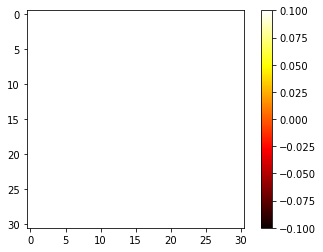

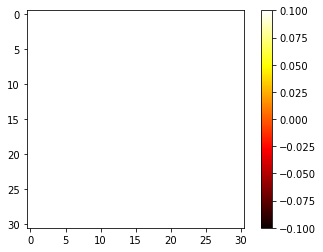

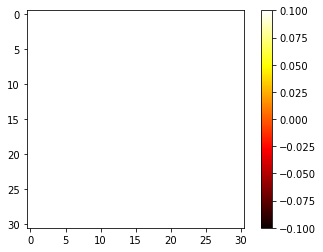

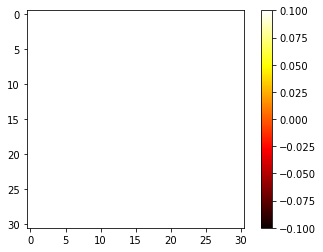

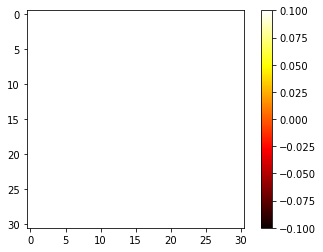

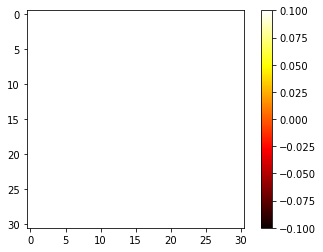

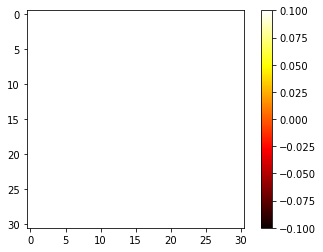

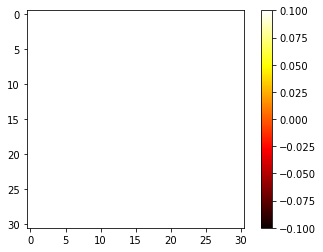

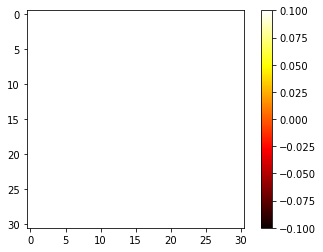

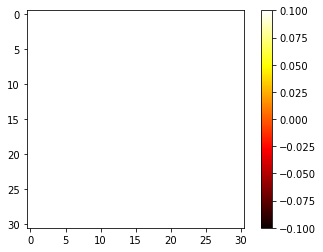

In [40]:
for i in range(10):
    show_heat_map(test_pred[i,:,:].cpu().detach().numpy())

# 

# 

# 

#### Archived code 

In [10]:
A = torch.from_numpy(create_DAD(Araw)).float()
X_train = torch.from_numpy(dm.X_train).float()
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
parameters = {
    'body': dm.X_train.shape[2],
    'M': dm.X_train.shape[0],
    'batch_size': 128,
    'n_layers': 2,
    'num_epochs': 1000,
    'learning_rate': 1e-3,
    'weight_decay': 5e-3
}
print(parameters)

{'body': 640, 'M': 1387, 'batch_size': 128, 'n_layers': 2, 'num_epochs': 1000, 'learning_rate': 0.001, 'weight_decay': 0.005}


In [11]:
A = A.to(device)
model = Net(parameters['body'], parameters['n_layers'], F.relu, bias=True).to(device)
input_features = X_train.to(device)

optimizer = torch.optim.Adam(model.parameters(), lr=parameters['learning_rate'], weight_decay=parameters['weight_decay'])
criterion = sim_loss()

In [12]:
from torchsummary import summary
print(model)
summary(model, [(31,640), (31,31)])

Net(
  (head): GCN (640,640)
  (layers): ModuleList(
    (0): GCN (640,640)
  )
  (tail): SimularityMatrix (1280)
)
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
               GCN-1              [-1, 31, 640]         410,240
               GCN-2              [-1, 31, 640]         410,240
  SimularityMatrix-3               [-1, 31, 31]           1,280
Total params: 821,760
Trainable params: 821,760
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 72.73
Forward/backward pass size (MB): 0.31
Params size (MB): 3.13
Estimated Total Size (MB): 76.18
----------------------------------------------------------------


In [18]:
n_epochs = parameters['num_epochs']
batch_size = parameters['batch_size']
from tqdm import tqdm
model.train()
for epoch in range(1, n_epochs+1):

    permutation = torch.randperm(input_features.shape[0])

    for i in tqdm(range(0,input_features.shape[0], batch_size)):
        model.train()
        optimizer.zero_grad()

        indices = permutation[i:i+batch_size] if i+batch_size < input_features.shape[0] else permutation[i:] 
        batch_x= input_features[indices, :,:]

        sim_matrix = model(batch_x, A).to(device)
        train_loss = criterion(sim_matrix, A)
        train_loss.backward()
        optimizer.step()
        print("Epoch:", epoch, "  Batch:", int((i/batch_size)+1),"of size",batch_size, "  Train loss:", train_loss, end="\r")
    print()

  0%|          | 0/11 [00:00<?, ?it/s]


RuntimeError: CUDA out of memory. Tried to allocate 2.00 MiB (GPU 0; 8.00 GiB total capacity; 4.23 GiB already allocated; 0 bytes free; 4.52 GiB reserved in total by PyTorch)

In [14]:
#save checkpoint
import shutil
def save_ckp(state, f_path):
    torch.save(state, f_path)

In [15]:
checkpoint = {
    'parameters': parameters,
    'state_dict': model.state_dict(),
    'optimizer': optimizer.state_dict(),
    'cumepoch': 1000
}
save_ckp(checkpoint, "models/checkpoint1000epoch.pt")

In [16]:

model.eval()
test_pred = model(input_features[10:20, :, :], A)

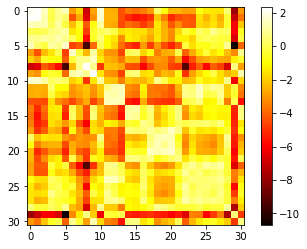

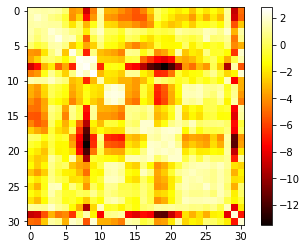

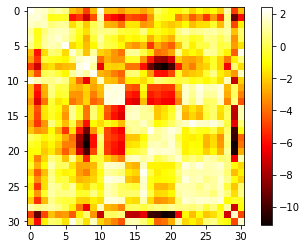

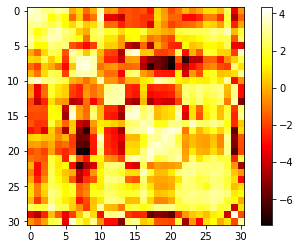

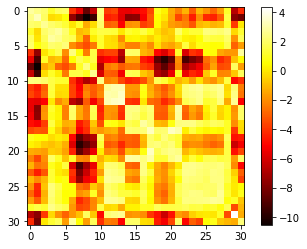

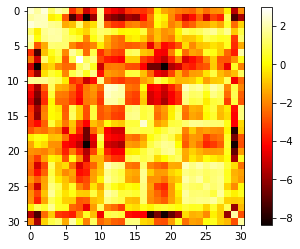

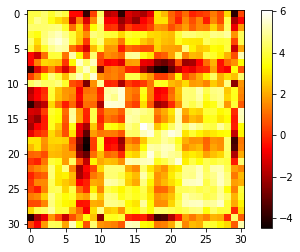

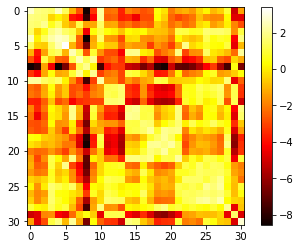

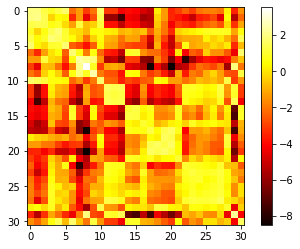

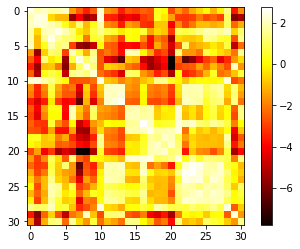

In [17]:
for i in range(10):
    show_heat_map(test_pred[i,:,:].cpu().detach().numpy())

In [20]:
#save the model
torch.save(model, "models/draft_2l_GCN2wn.pkl")

## Some testing and debugging functions

In [ ]:
def fcn(in_features, u):
        norm_u = (u - torch.mean(u, dim=2, keepdim=True))
        print(norm_u)
        print(((1/(in_features-1)) * torch.sum(norm_u**2, dim = 2, keepdim = True))**(1/2))
        return norm_u/(((1/(in_features-1)) * torch.sum(norm_u**2, dim = 2, keepdim = True))**(1/2))


A = torch.tensor([[[1, -1, 3], [2, -2, 1]],[[2, -1, 1], [3, -2, 1]]]).float()
print(A, A.shape)
print(fcn(3, A))

In [ ]:
def forward(sim_matrix, A):
        A_tf = (A!=0)
        print("A_tf:", A_tf)
        abs_N = torch.sum(A_tf, dim = 1, keepdim = True)
        print("abs_N:", abs_N)
        logexp_S = torch.log(torch.sum(torch.exp(sim_matrix), dim = 2, keepdim = True))
        print(logexp_S)
        obj_matrix = A_tf*(sim_matrix - abs_N * logexp_S)
        print(obj_matrix)
        return -torch.sum(obj_matrix)

sim_matrix = torch.tensor([[[1, -1, 3], [2, -2, 1],[1, 2, 3]],[[2, -1, 1], [3, -2, 1],[2, -1, 1]]]).float()
print(sim_matrix)
A = torch.tensor([[0.1,0,0.5],[0,0.7,0],[0.1,0,0.5]])
print(A)

print(forward(sim_matrix, A))

In [ ]:
z = torch.tensor([[[1, -1, 3], [2, -2, 1],[1, 2, 3]],[[2, -1, 1], [3, -2, 1],[2, -1, 1]]]).float()
print(torch.reshape(z[:,1,:], (z.shape[0],1,z.shape[2])))

In [ ]:
weight = torch.tensor([[1],[1],[2]])
print(weight.shape, torch.diag(torch.squeeze(weight)), torch.diag(weight).shape)

In [ ]:
for x in range(1000):
    print(x, end='\r')
print()